## Bidirectional LSTM model na predikciu hodnot DST o 1 hodinu dopredu na zaklade 12-hodinoveho vstupneho okna z atributu DST

Subor: prediction_DST+1_12H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-25 15:13:24.751642: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 1
y_col = f"DST+{shift}"

n_input = 12
atr_count = 1

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])


valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train['DST'].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid['DST'].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test['DST'].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  12


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 12, 1)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 12, 256)             │         133,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 12, 128)             │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 12, 1)               │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 12)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              13 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 330,382 (1.26 MB)

 Trainable params: 330,382 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:15:41 5s/step - loss: 1.1002 - mae: 1.0056

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step - loss: 0.8833 - mae: 0.8512 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 81ms/step - loss: 0.8062 - mae: 0.7793

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 80ms/step - loss: 0.7379 - mae: 0.7248

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 79ms/step - loss: 0.7158 - mae: 0.6880

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 78ms/step - loss: 0.6879 - mae: 0.6563

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 77ms/step - loss: 0.6590 - mae: 0.6286

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 76ms/step - loss: 0.6367 - mae: 0.6084

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 75ms/step - loss: 0.6163 - mae: 0.5915

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.5990 - mae: 0.5781

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.5820 - mae: 0.5656

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.5659 - mae: 0.5539

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 74ms/step - loss: 0.5525 - mae: 0.5440

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.5442 - mae: 0.5368

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 73ms/step - loss: 0.5360 - mae: 0.5299

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.5282 - mae: 0.5236

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.5211 - mae: 0.5179

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5141 - mae: 0.5125

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.5070 - mae: 0.5071

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 72ms/step - loss: 0.5002 - mae: 0.5021

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step - loss: 0.4935 - mae: 0.4973

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4871 - mae: 0.4928

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step - loss: 0.4808 - mae: 0.4885

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4752 - mae: 0.4847

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4698 - mae: 0.4811

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4644 - mae: 0.4775

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4592 - mae: 0.4740

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step - loss: 0.4541 - mae: 0.4706

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.4492 - mae: 0.4674

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.4444 - mae: 0.4641

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.4399 - mae: 0.4611

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.4356 - mae: 0.4582

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.4313 - mae: 0.4554

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 70ms/step - loss: 0.4275 - mae: 0.4528

 35/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step - loss: 0.4237 - mae: 0.4503 

 36/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4200 - mae: 0.4478

 37/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4164 - mae: 0.4454

 38/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4130 - mae: 0.4430

 39/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4095 - mae: 0.4407

 40/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4066 - mae: 0.4386

 41/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4037 - mae: 0.4366

 42/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.4009 - mae: 0.4347

 43/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3990 - mae: 0.4330

 44/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3970 - mae: 0.4313

 45/896 ━━━━━━━━━━━━━━━━━━━━ 59s 69ms/step - loss: 0.3950 - mae: 0.4297

 46/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3931 - mae: 0.4282

 47/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3912 - mae: 0.4267

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3893 - mae: 0.4252

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3874 - mae: 0.4237

 50/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3856 - mae: 0.4222

 51/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3837 - mae: 0.4208

 52/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step - loss: 0.3818 - mae: 0.4193

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3800 - mae: 0.4180

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3782 - mae: 0.4166

 55/896 ━━━━━━━━━━━━━━━━━━━━ 57s 69ms/step - loss: 0.3766 - mae: 0.4154

 56/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3751 - mae: 0.4142

 57/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3735 - mae: 0.4130

 58/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3720 - mae: 0.4119

 59/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3705 - mae: 0.4108

 60/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.3692 - mae: 0.4097

 61/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3679 - mae: 0.4087

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3666 - mae: 0.4077

 63/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3653 - mae: 0.4067

 64/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3640 - mae: 0.4057

 65/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3627 - mae: 0.4047

 66/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3614 - mae: 0.4037

 67/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3600 - mae: 0.4027

 68/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3587 - mae: 0.4017

 69/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3575 - mae: 0.4008

 70/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3563 - mae: 0.4000

 71/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step - loss: 0.3551 - mae: 0.3991

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3539 - mae: 0.3982

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3527 - mae: 0.3973

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3515 - mae: 0.3964

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3503 - mae: 0.3955

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3491 - mae: 0.3947

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3479 - mae: 0.3938

 78/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3467 - mae: 0.3930

 79/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3456 - mae: 0.3921

 80/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3444 - mae: 0.3913

 81/896 ━━━━━━━━━━━━━━━━━━━━ 55s 68ms/step - loss: 0.3433 - mae: 0.3905

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3422 - mae: 0.3897

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.3411 - mae: 0.3889

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.3402 - mae: 0.3882

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.3394 - mae: 0.3875

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.3386 - mae: 0.3868

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.3377 - mae: 0.3861

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.3369 - mae: 0.3854

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.3361 - mae: 0.3848

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.3353 - mae: 0.3841

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.3345 - mae: 0.3835

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.3337 - mae: 0.3828

 93/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.3329 - mae: 0.3822

 94/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3321 - mae: 0.3815

 95/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3313 - mae: 0.3809

 96/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3305 - mae: 0.3803

 97/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3297 - mae: 0.3797

 98/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3290 - mae: 0.3791

 99/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3283 - mae: 0.3785

100/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3276 - mae: 0.3779

101/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3268 - mae: 0.3773

102/896 ━━━━━━━━━━━━━━━━━━━━ 54s 68ms/step - loss: 0.3261 - mae: 0.3768

103/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3254 - mae: 0.3763

104/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3248 - mae: 0.3758

105/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3242 - mae: 0.3753

106/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3236 - mae: 0.3748

107/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3230 - mae: 0.3743

108/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3224 - mae: 0.3738

109/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3218 - mae: 0.3733

110/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3212 - mae: 0.3729

111/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3206 - mae: 0.3724

112/896 ━━━━━━━━━━━━━━━━━━━━ 54s 69ms/step - loss: 0.3200 - mae: 0.3719

113/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3194 - mae: 0.3715

114/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3188 - mae: 0.3710

115/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3182 - mae: 0.3706

116/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3176 - mae: 0.3701

117/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3170 - mae: 0.3697

118/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3164 - mae: 0.3692

119/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3158 - mae: 0.3688

120/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3153 - mae: 0.3684

121/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3147 - mae: 0.3679

122/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3141 - mae: 0.3675

123/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3136 - mae: 0.3671

124/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3130 - mae: 0.3667

125/896 ━━━━━━━━━━━━━━━━━━━━ 53s 69ms/step - loss: 0.3125 - mae: 0.3663

126/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3120 - mae: 0.3659

127/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3114 - mae: 0.3655

128/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3109 - mae: 0.3651

129/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3103 - mae: 0.3647

130/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3098 - mae: 0.3643

131/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3093 - mae: 0.3639

132/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3087 - mae: 0.3635

133/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3082 - mae: 0.3631

134/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3077 - mae: 0.3627

135/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3071 - mae: 0.3623

136/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3066 - mae: 0.3619

137/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3061 - mae: 0.3615

138/896 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step - loss: 0.3055 - mae: 0.3612

139/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3050 - mae: 0.3608

140/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3045 - mae: 0.3604

141/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3040 - mae: 0.3600

142/896 ━━━━━━━━━━━━━━━━━━━━ 51s 69ms/step - loss: 0.3034 - mae: 0.3596

143/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3029 - mae: 0.3593

144/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3024 - mae: 0.3589

145/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3019 - mae: 0.3585

146/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3014 - mae: 0.3582

147/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3009 - mae: 0.3578

148/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.3003 - mae: 0.3575

149/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2998 - mae: 0.3571

150/896 ━━━━━━━━━━━━━━━━━━━━ 51s 68ms/step - loss: 0.2993 - mae: 0.3567

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2989 - mae: 0.3564

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2984 - mae: 0.3560

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2979 - mae: 0.3557

154/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2974 - mae: 0.3553

155/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2969 - mae: 0.3550

156/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2965 - mae: 0.3546

157/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2960 - mae: 0.3543

158/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2955 - mae: 0.3540

159/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2951 - mae: 0.3536

160/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2946 - mae: 0.3533

161/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2942 - mae: 0.3530

162/896 ━━━━━━━━━━━━━━━━━━━━ 50s 68ms/step - loss: 0.2937 - mae: 0.3526

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2932 - mae: 0.3523

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2928 - mae: 0.3520

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2923 - mae: 0.3517

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2919 - mae: 0.3513

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2914 - mae: 0.3510

168/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2910 - mae: 0.3507

169/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2905 - mae: 0.3503

170/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2901 - mae: 0.3500

171/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2896 - mae: 0.3497

172/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2892 - mae: 0.3494

173/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2887 - mae: 0.3491

174/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2883 - mae: 0.3488

175/896 ━━━━━━━━━━━━━━━━━━━━ 49s 68ms/step - loss: 0.2878 - mae: 0.3484

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2874 - mae: 0.3481

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2870 - mae: 0.3478

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2865 - mae: 0.3475

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2861 - mae: 0.3472

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2857 - mae: 0.3469

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2852 - mae: 0.3466

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2848 - mae: 0.3463

183/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2844 - mae: 0.3460

184/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2839 - mae: 0.3457

185/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2835 - mae: 0.3454

186/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2831 - mae: 0.3451

187/896 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - loss: 0.2827 - mae: 0.3448

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2823 - mae: 0.3445

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2818 - mae: 0.3442

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2814 - mae: 0.3439

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2810 - mae: 0.3436

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2806 - mae: 0.3433

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2802 - mae: 0.3430

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2797 - mae: 0.3427

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2793 - mae: 0.3424

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2789 - mae: 0.3421

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2785 - mae: 0.3418

198/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2781 - mae: 0.3415

199/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2777 - mae: 0.3412

200/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2773 - mae: 0.3409

201/896 ━━━━━━━━━━━━━━━━━━━━ 47s 68ms/step - loss: 0.2769 - mae: 0.3406

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2765 - mae: 0.3404

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2761 - mae: 0.3401

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2757 - mae: 0.3398

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2753 - mae: 0.3395

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2749 - mae: 0.3392

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2745 - mae: 0.3389

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2741 - mae: 0.3386

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2737 - mae: 0.3384

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2734 - mae: 0.3381

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2730 - mae: 0.3378

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2726 - mae: 0.3375

213/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2722 - mae: 0.3373

214/896 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - loss: 0.2718 - mae: 0.3370

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2714 - mae: 0.3367

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2711 - mae: 0.3364

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2707 - mae: 0.3362

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2703 - mae: 0.3359

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2700 - mae: 0.3356

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2696 - mae: 0.3354

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2692 - mae: 0.3351

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2688 - mae: 0.3348

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2685 - mae: 0.3346

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2682 - mae: 0.3343

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2679 - mae: 0.3341

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2676 - mae: 0.3339

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.2673 - mae: 0.3336

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2669 - mae: 0.3334

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2666 - mae: 0.3332

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2664 - mae: 0.3329

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2662 - mae: 0.3327

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2659 - mae: 0.3325

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2657 - mae: 0.3324

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2655 - mae: 0.3322

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2653 - mae: 0.3320

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2651 - mae: 0.3318

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2649 - mae: 0.3316

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2647 - mae: 0.3315

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2645 - mae: 0.3313

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2643 - mae: 0.3311

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.2642 - mae: 0.3309

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2640 - mae: 0.3308

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2638 - mae: 0.3306

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2637 - mae: 0.3305

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2635 - mae: 0.3303

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2634 - mae: 0.3302

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2633 - mae: 0.3300

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2632 - mae: 0.3299

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2630 - mae: 0.3297

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2629 - mae: 0.3296

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2628 - mae: 0.3294

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2626 - mae: 0.3293

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2625 - mae: 0.3291

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.2624 - mae: 0.3290

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2623 - mae: 0.3289

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2621 - mae: 0.3287

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2620 - mae: 0.3286

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2619 - mae: 0.3285

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2618 - mae: 0.3283

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2616 - mae: 0.3282

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2615 - mae: 0.3281

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2614 - mae: 0.3279

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2613 - mae: 0.3278

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2611 - mae: 0.3277

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2610 - mae: 0.3276

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2609 - mae: 0.3274

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2608 - mae: 0.3273

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.2607 - mae: 0.3272

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2606 - mae: 0.3271

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2605 - mae: 0.3270

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2604 - mae: 0.3268

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2603 - mae: 0.3267

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2602 - mae: 0.3266

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2601 - mae: 0.3265

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2599 - mae: 0.3264

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2598 - mae: 0.3262

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2597 - mae: 0.3261

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2596 - mae: 0.3260

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2595 - mae: 0.3259

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2594 - mae: 0.3258

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.2593 - mae: 0.3257

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2592 - mae: 0.3255

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2591 - mae: 0.3254

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2590 - mae: 0.3253

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2589 - mae: 0.3252

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2588 - mae: 0.3251

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2587 - mae: 0.3250

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2585 - mae: 0.3249

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2584 - mae: 0.3248

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2583 - mae: 0.3247

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2583 - mae: 0.3246

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2582 - mae: 0.3245

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2582 - mae: 0.3243

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2581 - mae: 0.3242

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.2581 - mae: 0.3241

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2580 - mae: 0.3240

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2580 - mae: 0.3240

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2579 - mae: 0.3239

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2579 - mae: 0.3238

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2578 - mae: 0.3237

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2578 - mae: 0.3236

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2577 - mae: 0.3235

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2577 - mae: 0.3234

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2576 - mae: 0.3233

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2576 - mae: 0.3232

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2575 - mae: 0.3231

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2575 - mae: 0.3230

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2574 - mae: 0.3229

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2574 - mae: 0.3228

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.2573 - mae: 0.3227

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2573 - mae: 0.3226

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2572 - mae: 0.3226

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2572 - mae: 0.3225

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2571 - mae: 0.3224

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2570 - mae: 0.3223

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2570 - mae: 0.3222

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2569 - mae: 0.3221

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2569 - mae: 0.3220

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2568 - mae: 0.3219

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2568 - mae: 0.3218

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2567 - mae: 0.3217

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2567 - mae: 0.3217

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.2566 - mae: 0.3216

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.2565 - mae: 0.3215

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2565 - mae: 0.3214

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2564 - mae: 0.3213

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2564 - mae: 0.3212

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2563 - mae: 0.3211

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2563 - mae: 0.3210

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2562 - mae: 0.3210

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2561 - mae: 0.3209

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2561 - mae: 0.3208

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2560 - mae: 0.3207

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2560 - mae: 0.3206

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2559 - mae: 0.3205

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2558 - mae: 0.3204

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2558 - mae: 0.3204

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2557 - mae: 0.3203

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.2557 - mae: 0.3202

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2556 - mae: 0.3201

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2555 - mae: 0.3200

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2555 - mae: 0.3199

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2554 - mae: 0.3198

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2553 - mae: 0.3198

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2553 - mae: 0.3197

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2552 - mae: 0.3196

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2551 - mae: 0.3195

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2550 - mae: 0.3194

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2550 - mae: 0.3193

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2549 - mae: 0.3192

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2548 - mae: 0.3191

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2548 - mae: 0.3191

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.2547 - mae: 0.3190

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2546 - mae: 0.3189

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2545 - mae: 0.3188

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2545 - mae: 0.3187

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2544 - mae: 0.3186

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2543 - mae: 0.3185

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2542 - mae: 0.3185

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2542 - mae: 0.3184

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2541 - mae: 0.3183

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2540 - mae: 0.3182

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2539 - mae: 0.3181

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2539 - mae: 0.3180

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2538 - mae: 0.3180

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2537 - mae: 0.3179

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2536 - mae: 0.3178

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.2536 - mae: 0.3177

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2535 - mae: 0.3176

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2534 - mae: 0.3175

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2533 - mae: 0.3174

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2532 - mae: 0.3174

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2532 - mae: 0.3173

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.2531 - mae: 0.3172

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2530 - mae: 0.3171

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2529 - mae: 0.3170

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2528 - mae: 0.3169

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2528 - mae: 0.3169

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2527 - mae: 0.3168

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2526 - mae: 0.3167

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2525 - mae: 0.3166

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2525 - mae: 0.3165

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2524 - mae: 0.3165

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2523 - mae: 0.3164

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.2523 - mae: 0.3163

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2522 - mae: 0.3162

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2521 - mae: 0.3161

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2521 - mae: 0.3161

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2520 - mae: 0.3160

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2520 - mae: 0.3159

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2519 - mae: 0.3158

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2518 - mae: 0.3158

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2518 - mae: 0.3157

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2517 - mae: 0.3156

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2517 - mae: 0.3156

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2516 - mae: 0.3155

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2516 - mae: 0.3154

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2515 - mae: 0.3153

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2515 - mae: 0.3153

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.2514 - mae: 0.3152

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2513 - mae: 0.3151

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2513 - mae: 0.3151

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2512 - mae: 0.3150

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2512 - mae: 0.3149

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2511 - mae: 0.3148

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2510 - mae: 0.3148

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2510 - mae: 0.3147

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2509 - mae: 0.3146

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2509 - mae: 0.3145

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2508 - mae: 0.3145

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2507 - mae: 0.3144

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2507 - mae: 0.3143

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2506 - mae: 0.3143

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2506 - mae: 0.3142

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2505 - mae: 0.3141

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.2504 - mae: 0.3140

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2504 - mae: 0.3140

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2503 - mae: 0.3139

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2502 - mae: 0.3138

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2502 - mae: 0.3138

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2501 - mae: 0.3137

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2500 - mae: 0.3136

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2500 - mae: 0.3135

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2499 - mae: 0.3135

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2498 - mae: 0.3134

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2498 - mae: 0.3133

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2497 - mae: 0.3133

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2496 - mae: 0.3132

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2496 - mae: 0.3131

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2495 - mae: 0.3130

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.2494 - mae: 0.3130

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2494 - mae: 0.3129

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2493 - mae: 0.3128

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2492 - mae: 0.3128

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2491 - mae: 0.3127

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2491 - mae: 0.3126

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2490 - mae: 0.3125

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2489 - mae: 0.3125

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2489 - mae: 0.3124

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2488 - mae: 0.3123

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2487 - mae: 0.3123

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2487 - mae: 0.3122

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2486 - mae: 0.3121

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2485 - mae: 0.3120

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2484 - mae: 0.3120

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.2484 - mae: 0.3119

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2483 - mae: 0.3118

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2482 - mae: 0.3118

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2482 - mae: 0.3117

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2481 - mae: 0.3116

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2480 - mae: 0.3115

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2479 - mae: 0.3115

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2479 - mae: 0.3114

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2478 - mae: 0.3113

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2477 - mae: 0.3113

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2476 - mae: 0.3112

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2476 - mae: 0.3111

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2475 - mae: 0.3110

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2474 - mae: 0.3110

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2474 - mae: 0.3109

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2473 - mae: 0.3108

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.2472 - mae: 0.3108

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2471 - mae: 0.3107

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2471 - mae: 0.3106

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2470 - mae: 0.3105

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2469 - mae: 0.3105

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2468 - mae: 0.3104

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2468 - mae: 0.3103

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2467 - mae: 0.3103

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2466 - mae: 0.3102

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2466 - mae: 0.3101

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2465 - mae: 0.3101

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2464 - mae: 0.3100

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2463 - mae: 0.3099

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2463 - mae: 0.3098

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2462 - mae: 0.3098

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.2461 - mae: 0.3097

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2461 - mae: 0.3096

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2460 - mae: 0.3096

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2459 - mae: 0.3095

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2458 - mae: 0.3094

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2458 - mae: 0.3094

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2457 - mae: 0.3093

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2456 - mae: 0.3092

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2455 - mae: 0.3092

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2455 - mae: 0.3091

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2454 - mae: 0.3090

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2453 - mae: 0.3089

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2453 - mae: 0.3089

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2452 - mae: 0.3088

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2451 - mae: 0.3087

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.2450 - mae: 0.3087

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2450 - mae: 0.3086

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2449 - mae: 0.3085

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2448 - mae: 0.3085

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2447 - mae: 0.3084

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2447 - mae: 0.3083

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2446 - mae: 0.3083

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2445 - mae: 0.3082

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2444 - mae: 0.3081

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2444 - mae: 0.3081

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2443 - mae: 0.3080

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2442 - mae: 0.3079

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2441 - mae: 0.3078

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2440 - mae: 0.3078

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2440 - mae: 0.3077

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.2439 - mae: 0.3076

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2438 - mae: 0.3076

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2437 - mae: 0.3075

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2437 - mae: 0.3074

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2436 - mae: 0.3074

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2435 - mae: 0.3073

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2434 - mae: 0.3072

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2434 - mae: 0.3072

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2433 - mae: 0.3071

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2432 - mae: 0.3070

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2431 - mae: 0.3070

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2431 - mae: 0.3069

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2430 - mae: 0.3068

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2429 - mae: 0.3068

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2428 - mae: 0.3067

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.2428 - mae: 0.3066

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2427 - mae: 0.3066

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2426 - mae: 0.3065

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2425 - mae: 0.3064

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2425 - mae: 0.3064

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2424 - mae: 0.3063

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2423 - mae: 0.3062

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2422 - mae: 0.3062

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2422 - mae: 0.3061

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2421 - mae: 0.3060

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2420 - mae: 0.3060

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2419 - mae: 0.3059

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2419 - mae: 0.3058

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2418 - mae: 0.3058

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2417 - mae: 0.3057

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.2416 - mae: 0.3056

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2416 - mae: 0.3056

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2415 - mae: 0.3055

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2414 - mae: 0.3054

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2413 - mae: 0.3054

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2413 - mae: 0.3053

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2412 - mae: 0.3052

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2411 - mae: 0.3052

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2410 - mae: 0.3051

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2410 - mae: 0.3050

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2409 - mae: 0.3050

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2408 - mae: 0.3049

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2407 - mae: 0.3048

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2407 - mae: 0.3048

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.2406 - mae: 0.3047

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2405 - mae: 0.3046

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2404 - mae: 0.3046

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2404 - mae: 0.3045

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2403 - mae: 0.3044

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2402 - mae: 0.3044

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2401 - mae: 0.3043

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2400 - mae: 0.3042

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2400 - mae: 0.3042

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2399 - mae: 0.3041

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2398 - mae: 0.3040

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2397 - mae: 0.3040

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2397 - mae: 0.3039

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2396 - mae: 0.3038

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2395 - mae: 0.3038

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.2394 - mae: 0.3037

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2393 - mae: 0.3037

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2393 - mae: 0.3036

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2392 - mae: 0.3035

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2391 - mae: 0.3035

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2390 - mae: 0.3034

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2390 - mae: 0.3033

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2389 - mae: 0.3033

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2388 - mae: 0.3032

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2387 - mae: 0.3031

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2386 - mae: 0.3031

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2386 - mae: 0.3030

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2385 - mae: 0.3029

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2384 - mae: 0.3029

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2383 - mae: 0.3028

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.2382 - mae: 0.3027

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2382 - mae: 0.3027

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2381 - mae: 0.3026

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2380 - mae: 0.3025

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2379 - mae: 0.3025

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2378 - mae: 0.3024

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2378 - mae: 0.3023

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2377 - mae: 0.3023

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2376 - mae: 0.3022

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2375 - mae: 0.3021

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2375 - mae: 0.3021

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2374 - mae: 0.3020

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2373 - mae: 0.3019

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2372 - mae: 0.3019

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2371 - mae: 0.3018

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.2371 - mae: 0.3017

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2370 - mae: 0.3017

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2369 - mae: 0.3016

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2368 - mae: 0.3016

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2367 - mae: 0.3015

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2367 - mae: 0.3014

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2366 - mae: 0.3014

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2365 - mae: 0.3013

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2364 - mae: 0.3012

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2363 - mae: 0.3012

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2363 - mae: 0.3011

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2362 - mae: 0.3010

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2361 - mae: 0.3010

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2360 - mae: 0.3009

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2359 - mae: 0.3008

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.2359 - mae: 0.3008

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2358 - mae: 0.3007

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2357 - mae: 0.3006

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2356 - mae: 0.3006

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2355 - mae: 0.3005

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2355 - mae: 0.3005

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2354 - mae: 0.3004

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2353 - mae: 0.3003

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2352 - mae: 0.3003

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2351 - mae: 0.3002

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2351 - mae: 0.3001

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2350 - mae: 0.3001

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2349 - mae: 0.3000

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2348 - mae: 0.2999

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.2347 - mae: 0.2999

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2347 - mae: 0.2998

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2346 - mae: 0.2998

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2345 - mae: 0.2997

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2344 - mae: 0.2996

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2344 - mae: 0.2996

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2343 - mae: 0.2995

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2342 - mae: 0.2994

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2341 - mae: 0.2994

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2340 - mae: 0.2993

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2340 - mae: 0.2993

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2339 - mae: 0.2992

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2338 - mae: 0.2991

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2337 - mae: 0.2991

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2337 - mae: 0.2990

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.2336 - mae: 0.2990

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2335 - mae: 0.2989

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2334 - mae: 0.2988

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2333 - mae: 0.2988

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2333 - mae: 0.2987

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2332 - mae: 0.2986

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2331 - mae: 0.2986

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2330 - mae: 0.2985

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2330 - mae: 0.2985

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2329 - mae: 0.2984

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2328 - mae: 0.2983

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2327 - mae: 0.2983

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2327 - mae: 0.2982

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2326 - mae: 0.2982

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2325 - mae: 0.2981

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.2324 - mae: 0.2980

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2324 - mae: 0.2980

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2323 - mae: 0.2979

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2322 - mae: 0.2979

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2321 - mae: 0.2978

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2320 - mae: 0.2977

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2320 - mae: 0.2977

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2319 - mae: 0.2976

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2318 - mae: 0.2976

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2317 - mae: 0.2975

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2317 - mae: 0.2974

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2316 - mae: 0.2974

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2315 - mae: 0.2973

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2314 - mae: 0.2973

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2314 - mae: 0.2972

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.2313 - mae: 0.2971

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2312 - mae: 0.2971

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2311 - mae: 0.2970

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2311 - mae: 0.2970

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2310 - mae: 0.2969

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2309 - mae: 0.2968

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2308 - mae: 0.2968

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2308 - mae: 0.2967

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2307 - mae: 0.2967

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.2306 - mae: 0.2966

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2305 - mae: 0.2965

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2305 - mae: 0.2965

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2304 - mae: 0.2964

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2303 - mae: 0.2964

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2302 - mae: 0.2963

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.2302 - mae: 0.2962

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2301 - mae: 0.2962

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2300 - mae: 0.2961

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2299 - mae: 0.2961

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2299 - mae: 0.2960

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2298 - mae: 0.2959

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2297 - mae: 0.2959

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2296 - mae: 0.2958

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2296 - mae: 0.2958

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2295 - mae: 0.2957

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2294 - mae: 0.2956

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2293 - mae: 0.2956

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2293 - mae: 0.2955

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2292 - mae: 0.2955

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2291 - mae: 0.2954

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.2290 - mae: 0.2954

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2290 - mae: 0.2953

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2289 - mae: 0.2952

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2288 - mae: 0.2952

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2287 - mae: 0.2951

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2287 - mae: 0.2951

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2286 - mae: 0.2950

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2285 - mae: 0.2949

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2284 - mae: 0.2949

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2284 - mae: 0.2948

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2283 - mae: 0.2948

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2282 - mae: 0.2947

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2282 - mae: 0.2947

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2281 - mae: 0.2946

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2280 - mae: 0.2945

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.2279 - mae: 0.2945

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2279 - mae: 0.2944

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2278 - mae: 0.2944

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2277 - mae: 0.2943

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2276 - mae: 0.2943

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2276 - mae: 0.2942

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2275 - mae: 0.2941

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2274 - mae: 0.2941

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2274 - mae: 0.2940

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2273 - mae: 0.2940

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2272 - mae: 0.2939

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2271 - mae: 0.2939

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2271 - mae: 0.2938

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2270 - mae: 0.2938

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2269 - mae: 0.2937

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.2268 - mae: 0.2936

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2268 - mae: 0.2936

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2267 - mae: 0.2935

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2266 - mae: 0.2935

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2265 - mae: 0.2934

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2265 - mae: 0.2934

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2264 - mae: 0.2933

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2263 - mae: 0.2932

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2263 - mae: 0.2932

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2262 - mae: 0.2931

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2261 - mae: 0.2931

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2260 - mae: 0.2930

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2260 - mae: 0.2930

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2259 - mae: 0.2929

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2258 - mae: 0.2929

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.2258 - mae: 0.2928

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2257 - mae: 0.2927 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2256 - mae: 0.2927

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2255 - mae: 0.2926

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2255 - mae: 0.2926

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2254 - mae: 0.2925

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2253 - mae: 0.2925

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2253 - mae: 0.2924

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2252 - mae: 0.2924

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2251 - mae: 0.2923

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2251 - mae: 0.2923

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2250 - mae: 0.2922

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2249 - mae: 0.2921

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2248 - mae: 0.2921

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2248 - mae: 0.2920

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.2247 - mae: 0.2920

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2246 - mae: 0.2919

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2246 - mae: 0.2919

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2245 - mae: 0.2918

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2244 - mae: 0.2918

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2243 - mae: 0.2917

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2243 - mae: 0.2917

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2242 - mae: 0.2916

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2241 - mae: 0.2916

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2241 - mae: 0.2915

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2240 - mae: 0.2914

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2239 - mae: 0.2914

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2239 - mae: 0.2913

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2238 - mae: 0.2913

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2237 - mae: 0.2912

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.2236 - mae: 0.2912

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2236 - mae: 0.2911

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2235 - mae: 0.2911

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2234 - mae: 0.2910

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2234 - mae: 0.2910

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2233 - mae: 0.2909

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2232 - mae: 0.2909

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2232 - mae: 0.2908

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2231 - mae: 0.2908

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2230 - mae: 0.2907

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2230 - mae: 0.2906

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2229 - mae: 0.2906

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2228 - mae: 0.2905

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2227 - mae: 0.2905

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2227 - mae: 0.2904

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.2226 - mae: 0.2904

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2225 - mae: 0.2903

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2225 - mae: 0.2903

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2224 - mae: 0.2902

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2223 - mae: 0.2902

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2223 - mae: 0.2901

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2222 - mae: 0.2901

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2221 - mae: 0.2900

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2221 - mae: 0.2900

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2220 - mae: 0.2899

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2219 - mae: 0.2899

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2219 - mae: 0.2898

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2218 - mae: 0.2898

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2217 - mae: 0.2897

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2217 - mae: 0.2897

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.2216 - mae: 0.2896

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2215 - mae: 0.2896

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2215 - mae: 0.2895

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2214 - mae: 0.2895

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2213 - mae: 0.2894

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2213 - mae: 0.2894

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2212 - mae: 0.2893

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2211 - mae: 0.2893

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2211 - mae: 0.2892

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2210 - mae: 0.2892

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2209 - mae: 0.2891

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2209 - mae: 0.2891

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2208 - mae: 0.2890

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2207 - mae: 0.2890

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2207 - mae: 0.2889

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.2206 - mae: 0.2889

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2205 - mae: 0.2888

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2205 - mae: 0.2888

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2204 - mae: 0.2887

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2203 - mae: 0.2887

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2203 - mae: 0.2886

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2202 - mae: 0.2886

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2201 - mae: 0.2885

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2201 - mae: 0.2885

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2200 - mae: 0.2884

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2199 - mae: 0.2884

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2199 - mae: 0.2883

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2198 - mae: 0.2883

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2198 - mae: 0.2882

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2197 - mae: 0.2882

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.2196 - mae: 0.2881

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2196 - mae: 0.2881

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2195 - mae: 0.2880

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2194 - mae: 0.2880

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2194 - mae: 0.2879

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2193 - mae: 0.2879

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2192 - mae: 0.2878

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2192 - mae: 0.2878

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2191 - mae: 0.2878

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2190 - mae: 0.2877

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2190 - mae: 0.2877

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2189 - mae: 0.2876

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2188 - mae: 0.2876

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2188 - mae: 0.2875

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2187 - mae: 0.2875

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.2187 - mae: 0.2874

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2186 - mae: 0.2874

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2185 - mae: 0.2873

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2185 - mae: 0.2873

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2184 - mae: 0.2872

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2183 - mae: 0.2872

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2183 - mae: 0.2871

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2182 - mae: 0.2871

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2182 - mae: 0.2870

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2181 - mae: 0.2870

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2180 - mae: 0.2870

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2180 - mae: 0.2869

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2179 - mae: 0.2869

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2178 - mae: 0.2868

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2178 - mae: 0.2868

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.2177 - mae: 0.2867

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2177 - mae: 0.2867

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2176 - mae: 0.2866

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2175 - mae: 0.2866

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2175 - mae: 0.2865

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2174 - mae: 0.2865

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2173 - mae: 0.2864

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2173 - mae: 0.2864

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2172 - mae: 0.2864

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2172 - mae: 0.2863

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2171 - mae: 0.2863

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2170 - mae: 0.2862

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2170 - mae: 0.2862

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2169 - mae: 0.2861

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2169 - mae: 0.2861

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2168 - mae: 0.2861

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2168 - mae: 0.2860

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2167 - mae: 0.2860

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2166 - mae: 0.2859

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2166 - mae: 0.2859

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2165 - mae: 0.2858

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2165 - mae: 0.2858

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2164 - mae: 0.2858

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2164 - mae: 0.2857

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2163 - mae: 0.2857

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2162 - mae: 0.2856

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2162 - mae: 0.2856

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2161 - mae: 0.2855

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2161 - mae: 0.2855

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2160 - mae: 0.2855

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2159 - mae: 0.2854

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.2159 - mae: 0.2854


Epoch 1: val_mae improved from inf to 0.34410, saving model to models/DST+1_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 71s 73ms/step - loss: 0.2158 - mae: 0.2853 - val_loss: 0.2521 - val_mae: 0.3441


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.1289 - mae: 0.2652

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.1534 - mae: 0.2839 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1526 - mae: 0.2817 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1483 - mae: 0.2761

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1426 - mae: 0.2694

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1394 - mae: 0.2642

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1356 - mae: 0.2594

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1318 - mae: 0.2548

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.1290 - mae: 0.2517

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1273 - mae: 0.2500

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1262 - mae: 0.2488

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1251 - mae: 0.2477

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1265 - mae: 0.2481

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1276 - mae: 0.2483

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1282 - mae: 0.2483

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1284 - mae: 0.2479

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1284 - mae: 0.2474

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1282 - mae: 0.2469

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1280 - mae: 0.2463

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.1281 - mae: 0.2459

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1280 - mae: 0.2454

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1278 - mae: 0.2449

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1279 - mae: 0.2445

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1278 - mae: 0.2439

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1277 - mae: 0.2434

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1275 - mae: 0.2428

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1272 - mae: 0.2422

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1269 - mae: 0.2416

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1265 - mae: 0.2409

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1261 - mae: 0.2402

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1257 - mae: 0.2395

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1252 - mae: 0.2388

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1246 - mae: 0.2381

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1242 - mae: 0.2374

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1237 - mae: 0.2368

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1232 - mae: 0.2361

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1227 - mae: 0.2355

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1222 - mae: 0.2349

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1217 - mae: 0.2343

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1212 - mae: 0.2338

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1207 - mae: 0.2332

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1202 - mae: 0.2326

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1197 - mae: 0.2320

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1192 - mae: 0.2315

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1188 - mae: 0.2309

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1183 - mae: 0.2304

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1178 - mae: 0.2298

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1173 - mae: 0.2293

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1168 - mae: 0.2287

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1163 - mae: 0.2282

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1159 - mae: 0.2277

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1154 - mae: 0.2272

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1149 - mae: 0.2267

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1145 - mae: 0.2262

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1140 - mae: 0.2257

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1136 - mae: 0.2252

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1131 - mae: 0.2247

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1127 - mae: 0.2242

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1123 - mae: 0.2237

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1118 - mae: 0.2233

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1114 - mae: 0.2228

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1110 - mae: 0.2224

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1107 - mae: 0.2220

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1103 - mae: 0.2217

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1100 - mae: 0.2213

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1097 - mae: 0.2210

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1094 - mae: 0.2206

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1092 - mae: 0.2204

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1090 - mae: 0.2201

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1088 - mae: 0.2199

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1086 - mae: 0.2196

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1084 - mae: 0.2194

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1083 - mae: 0.2192

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1081 - mae: 0.2190

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1079 - mae: 0.2187

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1077 - mae: 0.2185

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1076 - mae: 0.2183

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1074 - mae: 0.2181

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1073 - mae: 0.2180

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1071 - mae: 0.2178

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1070 - mae: 0.2176

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1068 - mae: 0.2174

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1067 - mae: 0.2172

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1066 - mae: 0.2171

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1064 - mae: 0.2169

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1063 - mae: 0.2167

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1062 - mae: 0.2166

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1061 - mae: 0.2164

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1060 - mae: 0.2163

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1058 - mae: 0.2161

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1057 - mae: 0.2160

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1056 - mae: 0.2159

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1055 - mae: 0.2157

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1054 - mae: 0.2156

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1053 - mae: 0.2155

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1052 - mae: 0.2153

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1051 - mae: 0.2152

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1050 - mae: 0.2151

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1049 - mae: 0.2150

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1048 - mae: 0.2148

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1048 - mae: 0.2147

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1049 - mae: 0.2146

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1049 - mae: 0.2146

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1049 - mae: 0.2145

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1050 - mae: 0.2144

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1050 - mae: 0.2143

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1050 - mae: 0.2142

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1050 - mae: 0.2142

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1050 - mae: 0.2141

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1050 - mae: 0.2140

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1051 - mae: 0.2140

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1051 - mae: 0.2139

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1051 - mae: 0.2138

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1051 - mae: 0.2138

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1051 - mae: 0.2137

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1052 - mae: 0.2136

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1052 - mae: 0.2136

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1052 - mae: 0.2136

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1053 - mae: 0.2135

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1053 - mae: 0.2135

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1053 - mae: 0.2134

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1053 - mae: 0.2134

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1054 - mae: 0.2133

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1054 - mae: 0.2133

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1054 - mae: 0.2133

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1054 - mae: 0.2132

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1055 - mae: 0.2132

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1055 - mae: 0.2132

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1055 - mae: 0.2131

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1056 - mae: 0.2131

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1056 - mae: 0.2131

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1057 - mae: 0.2131

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1057 - mae: 0.2130

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1058 - mae: 0.2130

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1058 - mae: 0.2130

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1058 - mae: 0.2130

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1059 - mae: 0.2130

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1059 - mae: 0.2129

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1059 - mae: 0.2129

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1059 - mae: 0.2129

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1060 - mae: 0.2129

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1060 - mae: 0.2128

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1060 - mae: 0.2128

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1060 - mae: 0.2128

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1061 - mae: 0.2128

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1061 - mae: 0.2128

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1061 - mae: 0.2128

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1061 - mae: 0.2127

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1062 - mae: 0.2127

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1062 - mae: 0.2127

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1062 - mae: 0.2127

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1062 - mae: 0.2127

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1062 - mae: 0.2126

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1062 - mae: 0.2126

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1062 - mae: 0.2126

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1062 - mae: 0.2126

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1062 - mae: 0.2126

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1062 - mae: 0.2125

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1062 - mae: 0.2125

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1063 - mae: 0.2125

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1063 - mae: 0.2125

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1062 - mae: 0.2124

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1063 - mae: 0.2124

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1063 - mae: 0.2124

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1063 - mae: 0.2124

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1063 - mae: 0.2123

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1063 - mae: 0.2123

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1063 - mae: 0.2123

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1063 - mae: 0.2123

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1063 - mae: 0.2122

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1063 - mae: 0.2122

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1063 - mae: 0.2122

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1063 - mae: 0.2122

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1063 - mae: 0.2122

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1063 - mae: 0.2121

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1063 - mae: 0.2121

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1063 - mae: 0.2121

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1063 - mae: 0.2121

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1063 - mae: 0.2120

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1063 - mae: 0.2120

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1063 - mae: 0.2120

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1063 - mae: 0.2120

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1063 - mae: 0.2119

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1063 - mae: 0.2119

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1063 - mae: 0.2119

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1063 - mae: 0.2118

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1063 - mae: 0.2118

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1062 - mae: 0.2118

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1062 - mae: 0.2118

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1062 - mae: 0.2117

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1062 - mae: 0.2117

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1062 - mae: 0.2117

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1062 - mae: 0.2117

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1062 - mae: 0.2116

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1062 - mae: 0.2116

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1062 - mae: 0.2116

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1061 - mae: 0.2115

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1061 - mae: 0.2115

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1061 - mae: 0.2115

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1061 - mae: 0.2115

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1061 - mae: 0.2114

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1061 - mae: 0.2114

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1061 - mae: 0.2114

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1061 - mae: 0.2113

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1061 - mae: 0.2113

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1060 - mae: 0.2113

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1060 - mae: 0.2113

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1060 - mae: 0.2112

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1060 - mae: 0.2112

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1060 - mae: 0.2112

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1060 - mae: 0.2111

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1060 - mae: 0.2111

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1059 - mae: 0.2111

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1059 - mae: 0.2111

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1059 - mae: 0.2110

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1059 - mae: 0.2110

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1059 - mae: 0.2110

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1059 - mae: 0.2109

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1058 - mae: 0.2109

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1058 - mae: 0.2109

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1058 - mae: 0.2109

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1058 - mae: 0.2108

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1058 - mae: 0.2108

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1057 - mae: 0.2108

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1057 - mae: 0.2107

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1057 - mae: 0.2107

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1057 - mae: 0.2107

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1057 - mae: 0.2107

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1057 - mae: 0.2106

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1056 - mae: 0.2106

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1056 - mae: 0.2106

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1056 - mae: 0.2105

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1056 - mae: 0.2105

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1055 - mae: 0.2105

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1055 - mae: 0.2105

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1055 - mae: 0.2104

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1055 - mae: 0.2104

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1055 - mae: 0.2104

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1054 - mae: 0.2103

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1054 - mae: 0.2103

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1054 - mae: 0.2103

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1054 - mae: 0.2102

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1053 - mae: 0.2102

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1053 - mae: 0.2102

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1053 - mae: 0.2101

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1053 - mae: 0.2101

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1052 - mae: 0.2101

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1052 - mae: 0.2101

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1052 - mae: 0.2100

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1052 - mae: 0.2100

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1051 - mae: 0.2100

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1051 - mae: 0.2099

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1051 - mae: 0.2099

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1051 - mae: 0.2099

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1050 - mae: 0.2099

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1050 - mae: 0.2098

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1050 - mae: 0.2098

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1050 - mae: 0.2098

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1049 - mae: 0.2097

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1049 - mae: 0.2097

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1049 - mae: 0.2097

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1049 - mae: 0.2096

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1049 - mae: 0.2096

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1048 - mae: 0.2096

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1048 - mae: 0.2096

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1048 - mae: 0.2095

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1048 - mae: 0.2095

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1048 - mae: 0.2095

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1047 - mae: 0.2095

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1047 - mae: 0.2094

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1047 - mae: 0.2094

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1047 - mae: 0.2094

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1046 - mae: 0.2093

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1046 - mae: 0.2093

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1046 - mae: 0.2093

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1046 - mae: 0.2093

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1045 - mae: 0.2092

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1045 - mae: 0.2092

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1045 - mae: 0.2092

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1045 - mae: 0.2091

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1044 - mae: 0.2091

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1044 - mae: 0.2091

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1044 - mae: 0.2091

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1044 - mae: 0.2090

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1043 - mae: 0.2090

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1043 - mae: 0.2090

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1043 - mae: 0.2089

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1043 - mae: 0.2089

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1042 - mae: 0.2089

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1042 - mae: 0.2088

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1042 - mae: 0.2088

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1042 - mae: 0.2088

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1041 - mae: 0.2088

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1041 - mae: 0.2087

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1041 - mae: 0.2087

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1040 - mae: 0.2087

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1040 - mae: 0.2086

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1040 - mae: 0.2086

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1040 - mae: 0.2086

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1039 - mae: 0.2085

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1039 - mae: 0.2085

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1039 - mae: 0.2085

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1038 - mae: 0.2084

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1038 - mae: 0.2084

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1038 - mae: 0.2084

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1037 - mae: 0.2083

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1037 - mae: 0.2083

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1037 - mae: 0.2083

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1037 - mae: 0.2082

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1036 - mae: 0.2082

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1036 - mae: 0.2082

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1036 - mae: 0.2081

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1035 - mae: 0.2081

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1035 - mae: 0.2081

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1035 - mae: 0.2081

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1034 - mae: 0.2080

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1034 - mae: 0.2080

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1034 - mae: 0.2080

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1033 - mae: 0.2079

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1033 - mae: 0.2079

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1033 - mae: 0.2079

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1033 - mae: 0.2078

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1032 - mae: 0.2078

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1032 - mae: 0.2078

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1032 - mae: 0.2077

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1032 - mae: 0.2077

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1031 - mae: 0.2077

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1031 - mae: 0.2077

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1031 - mae: 0.2076

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1030 - mae: 0.2076

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1030 - mae: 0.2076

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1030 - mae: 0.2075

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1030 - mae: 0.2075

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1029 - mae: 0.2075

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1029 - mae: 0.2075

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1029 - mae: 0.2074

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1029 - mae: 0.2074

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1029 - mae: 0.2074

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1028 - mae: 0.2074

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1028 - mae: 0.2073

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1028 - mae: 0.2073

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1028 - mae: 0.2073

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1028 - mae: 0.2073

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1027 - mae: 0.2073

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1027 - mae: 0.2072

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1027 - mae: 0.2072

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1027 - mae: 0.2072

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1027 - mae: 0.2072

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1027 - mae: 0.2072

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1026 - mae: 0.2071

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1026 - mae: 0.2071

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1026 - mae: 0.2071

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1026 - mae: 0.2071

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1026 - mae: 0.2071

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1025 - mae: 0.2070

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1025 - mae: 0.2070

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1025 - mae: 0.2070

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1025 - mae: 0.2070

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1025 - mae: 0.2069

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1025 - mae: 0.2069

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1024 - mae: 0.2069

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1024 - mae: 0.2069

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1024 - mae: 0.2069

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1024 - mae: 0.2069

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1024 - mae: 0.2068

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1024 - mae: 0.2068

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1024 - mae: 0.2068

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1024 - mae: 0.2068

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1024 - mae: 0.2068

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1024 - mae: 0.2068

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1024 - mae: 0.2067

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1024 - mae: 0.2067

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1024 - mae: 0.2067

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1024 - mae: 0.2067

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1024 - mae: 0.2067

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1024 - mae: 0.2067

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1024 - mae: 0.2067

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1024 - mae: 0.2067

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1024 - mae: 0.2067

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1024 - mae: 0.2066

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1024 - mae: 0.2066

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1024 - mae: 0.2066

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1024 - mae: 0.2066

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1024 - mae: 0.2066

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1024 - mae: 0.2066

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1024 - mae: 0.2066

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1024 - mae: 0.2066

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1024 - mae: 0.2066

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1024 - mae: 0.2066

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1025 - mae: 0.2066

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1025 - mae: 0.2066

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1025 - mae: 0.2066

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1025 - mae: 0.2066

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1026 - mae: 0.2066

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1026 - mae: 0.2066

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1026 - mae: 0.2066

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1026 - mae: 0.2066

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1027 - mae: 0.2066

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1027 - mae: 0.2066

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1027 - mae: 0.2067

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1028 - mae: 0.2067

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1028 - mae: 0.2067

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1028 - mae: 0.2067

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1029 - mae: 0.2067

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1029 - mae: 0.2067

406/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1030 - mae: 0.2067

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1030 - mae: 0.2067

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1030 - mae: 0.2068

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1031 - mae: 0.2068

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1031 - mae: 0.2068

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1031 - mae: 0.2068

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1032 - mae: 0.2068

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1032 - mae: 0.2069

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1032 - mae: 0.2069

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1033 - mae: 0.2069

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1033 - mae: 0.2069

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1033 - mae: 0.2069

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1034 - mae: 0.2069

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1034 - mae: 0.2070

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1034 - mae: 0.2070

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.1035 - mae: 0.2070

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1035 - mae: 0.2070

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1036 - mae: 0.2070

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1036 - mae: 0.2071

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1036 - mae: 0.2071

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1037 - mae: 0.2071

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1037 - mae: 0.2071

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1037 - mae: 0.2071

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1038 - mae: 0.2071

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1038 - mae: 0.2072

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1038 - mae: 0.2072

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1039 - mae: 0.2072

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1039 - mae: 0.2072

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1039 - mae: 0.2072

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1040 - mae: 0.2073

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.1040 - mae: 0.2073

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1040 - mae: 0.2073

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1041 - mae: 0.2073

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1041 - mae: 0.2074

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1041 - mae: 0.2074

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1042 - mae: 0.2074

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1042 - mae: 0.2074

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1042 - mae: 0.2074

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1043 - mae: 0.2074

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1043 - mae: 0.2075

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1043 - mae: 0.2075

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1044 - mae: 0.2075

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1044 - mae: 0.2075

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1044 - mae: 0.2075

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1045 - mae: 0.2076

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.1045 - mae: 0.2076

452/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1045 - mae: 0.2076

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1046 - mae: 0.2076

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1046 - mae: 0.2076

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1046 - mae: 0.2076

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1046 - mae: 0.2077

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1047 - mae: 0.2077

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1047 - mae: 0.2077

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1047 - mae: 0.2077

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1048 - mae: 0.2077

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1048 - mae: 0.2078

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1048 - mae: 0.2078

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1049 - mae: 0.2078

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1049 - mae: 0.2078

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1049 - mae: 0.2078

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.1050 - mae: 0.2079

467/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1050 - mae: 0.2079

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1050 - mae: 0.2079

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1051 - mae: 0.2079

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1051 - mae: 0.2079

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1051 - mae: 0.2079

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1052 - mae: 0.2080

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1052 - mae: 0.2080

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1052 - mae: 0.2080

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1053 - mae: 0.2080

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1053 - mae: 0.2080

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1053 - mae: 0.2081

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1054 - mae: 0.2081

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1054 - mae: 0.2081

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1054 - mae: 0.2081

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1055 - mae: 0.2081

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.1055 - mae: 0.2081

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1055 - mae: 0.2082

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1056 - mae: 0.2082

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1056 - mae: 0.2082

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1056 - mae: 0.2082

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1056 - mae: 0.2082

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1057 - mae: 0.2082

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1057 - mae: 0.2083

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1057 - mae: 0.2083

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1057 - mae: 0.2083

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1058 - mae: 0.2083

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1058 - mae: 0.2083

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1058 - mae: 0.2083

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1059 - mae: 0.2083

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1059 - mae: 0.2084

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.1059 - mae: 0.2084

498/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1059 - mae: 0.2084

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1060 - mae: 0.2084

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1060 - mae: 0.2084

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1060 - mae: 0.2084

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1060 - mae: 0.2084

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1060 - mae: 0.2085

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1061 - mae: 0.2085

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1061 - mae: 0.2085

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1061 - mae: 0.2085

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1061 - mae: 0.2085

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1062 - mae: 0.2085

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1062 - mae: 0.2085

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1062 - mae: 0.2086

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1062 - mae: 0.2086

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.1063 - mae: 0.2086

513/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1063 - mae: 0.2086

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1063 - mae: 0.2086

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1063 - mae: 0.2086

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1063 - mae: 0.2086

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1064 - mae: 0.2086

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1064 - mae: 0.2087

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1064 - mae: 0.2087

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1064 - mae: 0.2087

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1065 - mae: 0.2087

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1065 - mae: 0.2087

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1065 - mae: 0.2087

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1065 - mae: 0.2087

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1066 - mae: 0.2087

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1066 - mae: 0.2088

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1066 - mae: 0.2088

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.1066 - mae: 0.2088

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1066 - mae: 0.2088

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1067 - mae: 0.2088

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1067 - mae: 0.2088

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1067 - mae: 0.2088

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1067 - mae: 0.2088

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1067 - mae: 0.2088

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1068 - mae: 0.2089

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1068 - mae: 0.2089

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1068 - mae: 0.2089

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1068 - mae: 0.2089

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1069 - mae: 0.2089

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1069 - mae: 0.2089

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1069 - mae: 0.2089

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1069 - mae: 0.2089

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.1069 - mae: 0.2090

544/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1070 - mae: 0.2090

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1070 - mae: 0.2090

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1070 - mae: 0.2090

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1070 - mae: 0.2090

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1071 - mae: 0.2090

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1071 - mae: 0.2090

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1071 - mae: 0.2090

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1071 - mae: 0.2091

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1071 - mae: 0.2091

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1072 - mae: 0.2091

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1072 - mae: 0.2091

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1072 - mae: 0.2091

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1072 - mae: 0.2091

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1073 - mae: 0.2091

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.1073 - mae: 0.2091

559/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1073 - mae: 0.2092

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1073 - mae: 0.2092

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1073 - mae: 0.2092

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1074 - mae: 0.2092

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1074 - mae: 0.2092

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1074 - mae: 0.2092

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1074 - mae: 0.2092

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1074 - mae: 0.2092

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1075 - mae: 0.2093

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1075 - mae: 0.2093

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1075 - mae: 0.2093

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1075 - mae: 0.2093

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1076 - mae: 0.2093

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1076 - mae: 0.2093

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1076 - mae: 0.2093

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.1076 - mae: 0.2093

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1076 - mae: 0.2094

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1077 - mae: 0.2094

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1077 - mae: 0.2094

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1077 - mae: 0.2094

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1077 - mae: 0.2094

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1077 - mae: 0.2094

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1077 - mae: 0.2094

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1078 - mae: 0.2094

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1078 - mae: 0.2094

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1078 - mae: 0.2095

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1078 - mae: 0.2095

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1078 - mae: 0.2095

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1079 - mae: 0.2095

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1079 - mae: 0.2095

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.1079 - mae: 0.2095

590/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1079 - mae: 0.2095

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1079 - mae: 0.2095

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1079 - mae: 0.2095

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1080 - mae: 0.2095

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1080 - mae: 0.2096

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1080 - mae: 0.2096

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1080 - mae: 0.2096

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1080 - mae: 0.2096

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1080 - mae: 0.2096

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1081 - mae: 0.2096

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1081 - mae: 0.2096

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1081 - mae: 0.2096

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1081 - mae: 0.2096

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1081 - mae: 0.2096

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.1081 - mae: 0.2096

605/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1081 - mae: 0.2096

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1082 - mae: 0.2097

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1082 - mae: 0.2097

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1082 - mae: 0.2097

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1082 - mae: 0.2097

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1082 - mae: 0.2097

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1082 - mae: 0.2097

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1082 - mae: 0.2097

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1083 - mae: 0.2097

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1083 - mae: 0.2097

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1083 - mae: 0.2097

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1083 - mae: 0.2097

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1083 - mae: 0.2097

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1083 - mae: 0.2098

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1083 - mae: 0.2098

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.1084 - mae: 0.2098

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1084 - mae: 0.2098

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1084 - mae: 0.2098

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1084 - mae: 0.2098

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1084 - mae: 0.2098

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1084 - mae: 0.2098

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1084 - mae: 0.2098

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1084 - mae: 0.2098

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1084 - mae: 0.2098

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1085 - mae: 0.2098

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1085 - mae: 0.2098

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1085 - mae: 0.2098

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1085 - mae: 0.2098

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1085 - mae: 0.2098

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1085 - mae: 0.2099

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.1085 - mae: 0.2099

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1085 - mae: 0.2099

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1085 - mae: 0.2099

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1086 - mae: 0.2099

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1086 - mae: 0.2099

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1086 - mae: 0.2099

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1086 - mae: 0.2099

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1086 - mae: 0.2099

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1086 - mae: 0.2099

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1086 - mae: 0.2099

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1086 - mae: 0.2099

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1086 - mae: 0.2099

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1086 - mae: 0.2099

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1086 - mae: 0.2099

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1087 - mae: 0.2099

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.1087 - mae: 0.2099

651/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1087 - mae: 0.2099

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1087 - mae: 0.2099

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1087 - mae: 0.2099

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1087 - mae: 0.2099

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1087 - mae: 0.2099

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1087 - mae: 0.2100

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1087 - mae: 0.2100

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1087 - mae: 0.2100

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1087 - mae: 0.2100

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1087 - mae: 0.2100

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1087 - mae: 0.2100

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1088 - mae: 0.2100

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1088 - mae: 0.2100

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1088 - mae: 0.2100

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1088 - mae: 0.2100

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.1088 - mae: 0.2100

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1088 - mae: 0.2100

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1088 - mae: 0.2100

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1088 - mae: 0.2100

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1088 - mae: 0.2100

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1088 - mae: 0.2100

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1088 - mae: 0.2100

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1088 - mae: 0.2100

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1088 - mae: 0.2100

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1088 - mae: 0.2100

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1088 - mae: 0.2100

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1088 - mae: 0.2100

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1088 - mae: 0.2100

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1088 - mae: 0.2100

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1088 - mae: 0.2100

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.1089 - mae: 0.2100

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1089 - mae: 0.2100

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1089 - mae: 0.2100

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1089 - mae: 0.2100

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1089 - mae: 0.2100

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1089 - mae: 0.2100

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1089 - mae: 0.2100

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1089 - mae: 0.2100

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1089 - mae: 0.2100

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1089 - mae: 0.2100

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1089 - mae: 0.2100

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1089 - mae: 0.2100

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1089 - mae: 0.2100

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1089 - mae: 0.2100

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1089 - mae: 0.2100

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.1089 - mae: 0.2100

697/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1089 - mae: 0.2100

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1089 - mae: 0.2100

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1089 - mae: 0.2100

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1089 - mae: 0.2100

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1089 - mae: 0.2100

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1089 - mae: 0.2100

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1089 - mae: 0.2100

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1089 - mae: 0.2100

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1089 - mae: 0.2100

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1089 - mae: 0.2100

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1089 - mae: 0.2100

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1089 - mae: 0.2100

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1089 - mae: 0.2100

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1089 - mae: 0.2100

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1090 - mae: 0.2100

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.1090 - mae: 0.2100

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1090 - mae: 0.2100

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1090 - mae: 0.2100

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1090 - mae: 0.2100

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1090 - mae: 0.2100

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1090 - mae: 0.2100

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1090 - mae: 0.2100

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1090 - mae: 0.2100

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1090 - mae: 0.2100

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1090 - mae: 0.2100

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1090 - mae: 0.2100

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1090 - mae: 0.2100

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1090 - mae: 0.2100

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1090 - mae: 0.2100

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1090 - mae: 0.2100

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.1090 - mae: 0.2100

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1090 - mae: 0.2100

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1090 - mae: 0.2100

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1090 - mae: 0.2100

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1090 - mae: 0.2100

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1090 - mae: 0.2100

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1090 - mae: 0.2100

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1090 - mae: 0.2100

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1090 - mae: 0.2100

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1090 - mae: 0.2100

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1090 - mae: 0.2100

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1090 - mae: 0.2100

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1090 - mae: 0.2100

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1090 - mae: 0.2100

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1090 - mae: 0.2100

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.1090 - mae: 0.2100

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1090 - mae: 0.2100 

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1090 - mae: 0.2100

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1090 - mae: 0.2100

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1090 - mae: 0.2100

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1090 - mae: 0.2100

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1090 - mae: 0.2100

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1090 - mae: 0.2100

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1090 - mae: 0.2100

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1090 - mae: 0.2100

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1090 - mae: 0.2100

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1090 - mae: 0.2100

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1090 - mae: 0.2099

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1090 - mae: 0.2099

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1090 - mae: 0.2099

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1090 - mae: 0.2099

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.1090 - mae: 0.2099

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1090 - mae: 0.2099

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1090 - mae: 0.2099

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1090 - mae: 0.2099

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1090 - mae: 0.2099

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1090 - mae: 0.2099

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1090 - mae: 0.2099

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1090 - mae: 0.2099

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1090 - mae: 0.2099

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1090 - mae: 0.2099

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1090 - mae: 0.2099

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1090 - mae: 0.2099

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1090 - mae: 0.2099

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1090 - mae: 0.2099

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1090 - mae: 0.2099

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.1090 - mae: 0.2099

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1090 - mae: 0.2099

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1090 - mae: 0.2099

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1090 - mae: 0.2099

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1090 - mae: 0.2099

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1090 - mae: 0.2099

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1090 - mae: 0.2099

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1090 - mae: 0.2099

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1089 - mae: 0.2099

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1089 - mae: 0.2099

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1089 - mae: 0.2099

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1089 - mae: 0.2099

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1089 - mae: 0.2099

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1089 - mae: 0.2099

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1089 - mae: 0.2099

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.1089 - mae: 0.2099

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1089 - mae: 0.2099

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1089 - mae: 0.2098

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1089 - mae: 0.2098

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1089 - mae: 0.2098

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1089 - mae: 0.2098

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1089 - mae: 0.2098

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1089 - mae: 0.2098

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1089 - mae: 0.2098

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1089 - mae: 0.2098

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1089 - mae: 0.2098

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1089 - mae: 0.2098

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1089 - mae: 0.2098

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1089 - mae: 0.2098

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1089 - mae: 0.2098

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1089 - mae: 0.2098

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.1089 - mae: 0.2098

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1089 - mae: 0.2098

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1089 - mae: 0.2098

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1089 - mae: 0.2098

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1089 - mae: 0.2098

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1089 - mae: 0.2098

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1089 - mae: 0.2098

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1089 - mae: 0.2098

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1089 - mae: 0.2098

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1089 - mae: 0.2098

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1089 - mae: 0.2098

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1089 - mae: 0.2098

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1088 - mae: 0.2098

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1088 - mae: 0.2097

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1088 - mae: 0.2097

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.1088 - mae: 0.2097

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1088 - mae: 0.2097

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1088 - mae: 0.2097

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1088 - mae: 0.2097

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1088 - mae: 0.2097

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1088 - mae: 0.2097

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1088 - mae: 0.2097

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1088 - mae: 0.2097

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1088 - mae: 0.2097

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1088 - mae: 0.2097

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1088 - mae: 0.2097

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1088 - mae: 0.2097

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1088 - mae: 0.2097

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1088 - mae: 0.2097

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1088 - mae: 0.2097

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.1088 - mae: 0.2097

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1088 - mae: 0.2097

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1088 - mae: 0.2097

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1088 - mae: 0.2097

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1088 - mae: 0.2097

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1088 - mae: 0.2096

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1087 - mae: 0.2096

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1087 - mae: 0.2096

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1087 - mae: 0.2096

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1087 - mae: 0.2096

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1087 - mae: 0.2096

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1087 - mae: 0.2096

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1087 - mae: 0.2096

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1087 - mae: 0.2096

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1087 - mae: 0.2096

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1087 - mae: 0.2096

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.1087 - mae: 0.2096

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1087 - mae: 0.2096

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1087 - mae: 0.2096

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1087 - mae: 0.2096

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1087 - mae: 0.2096

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1087 - mae: 0.2096

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1087 - mae: 0.2096

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1087 - mae: 0.2096

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1087 - mae: 0.2095

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1086 - mae: 0.2095

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1086 - mae: 0.2095

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1086 - mae: 0.2095

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1086 - mae: 0.2095

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1086 - mae: 0.2095

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1086 - mae: 0.2095

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.1086 - mae: 0.2095

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1086 - mae: 0.2095

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1086 - mae: 0.2095

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1086 - mae: 0.2095

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1086 - mae: 0.2095

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1086 - mae: 0.2095

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1086 - mae: 0.2095

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1086 - mae: 0.2095

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1086 - mae: 0.2095

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1086 - mae: 0.2095

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1086 - mae: 0.2095

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1086 - mae: 0.2095

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1086 - mae: 0.2094

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1086 - mae: 0.2094

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1085 - mae: 0.2094

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.1085 - mae: 0.2094

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1085 - mae: 0.2094

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1085 - mae: 0.2094

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1085 - mae: 0.2094

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1085 - mae: 0.2094

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1085 - mae: 0.2094

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1085 - mae: 0.2094

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1085 - mae: 0.2094

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1085 - mae: 0.2094

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1085 - mae: 0.2094

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1085 - mae: 0.2094

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1085 - mae: 0.2094

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1085 - mae: 0.2094

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1085 - mae: 0.2094

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1085 - mae: 0.2094

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1085 - mae: 0.2094

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.1085 - mae: 0.2094


Epoch 2: val_mae improved from 0.34410 to 0.22065, saving model to models/DST+1_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 71ms/step - loss: 0.1085 - mae: 0.2093 - val_loss: 0.1606 - val_mae: 0.2206


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 113ms/step - loss: 0.0625 - mae: 0.1841

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0535 - mae: 0.1687  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0483 - mae: 0.1600

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0492 - mae: 0.1614

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0518 - mae: 0.1655

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0528 - mae: 0.1673

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0534 - mae: 0.1683

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0537 - mae: 0.1686

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0550 - mae: 0.1698

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0561 - mae: 0.1710

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0592 - mae: 0.1734

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0614 - mae: 0.1750

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0630 - mae: 0.1761

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0640 - mae: 0.1767

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0650 - mae: 0.1773

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0657 - mae: 0.1779

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0701 - mae: 0.1797

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0741 - mae: 0.1815

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0788 - mae: 0.1838

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0827 - mae: 0.1859

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0861 - mae: 0.1877

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0891 - mae: 0.1894

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0917 - mae: 0.1910

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0939 - mae: 0.1923

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0958 - mae: 0.1934

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0974 - mae: 0.1943

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0989 - mae: 0.1952

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1002 - mae: 0.1959

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1015 - mae: 0.1966

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1027 - mae: 0.1972

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1037 - mae: 0.1978

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1047 - mae: 0.1983

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1056 - mae: 0.1988

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1063 - mae: 0.1993

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1070 - mae: 0.1997

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1076 - mae: 0.2000

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1081 - mae: 0.2003

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.1085 - mae: 0.2005

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1088 - mae: 0.2007

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1091 - mae: 0.2009

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1094 - mae: 0.2010

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1096 - mae: 0.2011

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1097 - mae: 0.2012

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1098 - mae: 0.2013

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1099 - mae: 0.2013

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1099 - mae: 0.2013

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1099 - mae: 0.2013

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1099 - mae: 0.2013

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1099 - mae: 0.2013

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1099 - mae: 0.2012

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1099 - mae: 0.2013

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1100 - mae: 0.2013

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1101 - mae: 0.2013

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.1101 - mae: 0.2014

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1102 - mae: 0.2014

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1102 - mae: 0.2014

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1101 - mae: 0.2014

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1101 - mae: 0.2013

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1101 - mae: 0.2013

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1100 - mae: 0.2013

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1100 - mae: 0.2013

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1101 - mae: 0.2013

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1101 - mae: 0.2013

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1101 - mae: 0.2013

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1101 - mae: 0.2013

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1101 - mae: 0.2013

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1102 - mae: 0.2014

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1103 - mae: 0.2014

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1103 - mae: 0.2014

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1104 - mae: 0.2014

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.1105 - mae: 0.2015

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1105 - mae: 0.2015

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1106 - mae: 0.2015

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1106 - mae: 0.2016

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1107 - mae: 0.2016

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1107 - mae: 0.2017

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1108 - mae: 0.2017

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1108 - mae: 0.2017

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1108 - mae: 0.2017

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1108 - mae: 0.2018

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1109 - mae: 0.2018

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1109 - mae: 0.2018

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1108 - mae: 0.2018

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1108 - mae: 0.2018

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1108 - mae: 0.2019

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.1108 - mae: 0.2019

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1108 - mae: 0.2019

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1108 - mae: 0.2019

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1108 - mae: 0.2020

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1108 - mae: 0.2020

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1107 - mae: 0.2020

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1107 - mae: 0.2020

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1107 - mae: 0.2020

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1106 - mae: 0.2020

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1106 - mae: 0.2020

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1106 - mae: 0.2021

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1105 - mae: 0.2021

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1105 - mae: 0.2021

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1104 - mae: 0.2021

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1104 - mae: 0.2021

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.1103 - mae: 0.2021

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.1102 - mae: 0.2021

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1102 - mae: 0.2021

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1101 - mae: 0.2021

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1101 - mae: 0.2021

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1100 - mae: 0.2020

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1099 - mae: 0.2020

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1099 - mae: 0.2020

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1098 - mae: 0.2020

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1097 - mae: 0.2020

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1097 - mae: 0.2020

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1096 - mae: 0.2020

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1095 - mae: 0.2020

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1095 - mae: 0.2020

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1094 - mae: 0.2019

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.1093 - mae: 0.2019

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1093 - mae: 0.2019

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1092 - mae: 0.2019

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1091 - mae: 0.2019

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1090 - mae: 0.2018

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1090 - mae: 0.2018

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1089 - mae: 0.2018

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1088 - mae: 0.2017

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1087 - mae: 0.2017

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1086 - mae: 0.2017

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1086 - mae: 0.2016

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1085 - mae: 0.2016

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1084 - mae: 0.2016

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1083 - mae: 0.2016

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1083 - mae: 0.2015

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1082 - mae: 0.2015

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.1081 - mae: 0.2015

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1080 - mae: 0.2014

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1079 - mae: 0.2014

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1078 - mae: 0.2014

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1078 - mae: 0.2013

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1077 - mae: 0.2013

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1076 - mae: 0.2012

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1075 - mae: 0.2012

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1074 - mae: 0.2012

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1074 - mae: 0.2011

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1073 - mae: 0.2011

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1072 - mae: 0.2011

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1072 - mae: 0.2010

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1071 - mae: 0.2010

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1070 - mae: 0.2010

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.1069 - mae: 0.2009

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1069 - mae: 0.2009

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1068 - mae: 0.2009

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1067 - mae: 0.2008

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1066 - mae: 0.2008

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1066 - mae: 0.2008

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1065 - mae: 0.2007

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1065 - mae: 0.2007

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1065 - mae: 0.2007

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1065 - mae: 0.2007

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1065 - mae: 0.2007

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1065 - mae: 0.2006

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1065 - mae: 0.2006

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1065 - mae: 0.2006

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1065 - mae: 0.2006

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.1065 - mae: 0.2006

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1065 - mae: 0.2005

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1065 - mae: 0.2005

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1065 - mae: 0.2005

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1065 - mae: 0.2005

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1065 - mae: 0.2005

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1065 - mae: 0.2005

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1065 - mae: 0.2005

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1065 - mae: 0.2005

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1065 - mae: 0.2005

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1065 - mae: 0.2005

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1065 - mae: 0.2005

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1065 - mae: 0.2005

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1065 - mae: 0.2005

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1065 - mae: 0.2005

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.1065 - mae: 0.2005

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1065 - mae: 0.2005

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1065 - mae: 0.2005

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1065 - mae: 0.2005

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1065 - mae: 0.2005

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1065 - mae: 0.2005

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1065 - mae: 0.2005

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1065 - mae: 0.2005

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1065 - mae: 0.2005

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1065 - mae: 0.2005

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1065 - mae: 0.2005

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1065 - mae: 0.2005

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1065 - mae: 0.2005

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1064 - mae: 0.2005

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1064 - mae: 0.2005

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1064 - mae: 0.2005

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.1064 - mae: 0.2005

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1064 - mae: 0.2005

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1064 - mae: 0.2005

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1064 - mae: 0.2005

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1064 - mae: 0.2005

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1063 - mae: 0.2005

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1063 - mae: 0.2005

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1063 - mae: 0.2005

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1063 - mae: 0.2005

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1063 - mae: 0.2005

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1063 - mae: 0.2005

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1062 - mae: 0.2005

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1062 - mae: 0.2005

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1062 - mae: 0.2005

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.1062 - mae: 0.2005

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1062 - mae: 0.2004

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1062 - mae: 0.2004

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1061 - mae: 0.2004

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1061 - mae: 0.2004

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1061 - mae: 0.2004

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1061 - mae: 0.2004

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1061 - mae: 0.2004

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1060 - mae: 0.2004

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1060 - mae: 0.2004

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1060 - mae: 0.2004

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1060 - mae: 0.2004

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1060 - mae: 0.2004

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1059 - mae: 0.2004

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1059 - mae: 0.2004

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.1059 - mae: 0.2003

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1059 - mae: 0.2003

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1058 - mae: 0.2003

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1058 - mae: 0.2003

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1058 - mae: 0.2003

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1058 - mae: 0.2003

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1058 - mae: 0.2003

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1057 - mae: 0.2003

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1057 - mae: 0.2003

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1057 - mae: 0.2003

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1057 - mae: 0.2002

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1056 - mae: 0.2002

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1056 - mae: 0.2002

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1056 - mae: 0.2002

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1056 - mae: 0.2002

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.1055 - mae: 0.2002

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1055 - mae: 0.2002

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1055 - mae: 0.2002

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1055 - mae: 0.2002

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1054 - mae: 0.2001

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1054 - mae: 0.2001

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1054 - mae: 0.2001

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1053 - mae: 0.2001

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1053 - mae: 0.2001

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1053 - mae: 0.2001

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1053 - mae: 0.2001

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1052 - mae: 0.2000

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1052 - mae: 0.2000

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1052 - mae: 0.2000

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1052 - mae: 0.2000

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.1051 - mae: 0.2000

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1051 - mae: 0.2000

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1051 - mae: 0.2000

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1050 - mae: 0.1999

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1050 - mae: 0.1999

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1050 - mae: 0.1999

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1049 - mae: 0.1999

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1049 - mae: 0.1999

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1049 - mae: 0.1998

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1048 - mae: 0.1998

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1048 - mae: 0.1998

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1048 - mae: 0.1998

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1047 - mae: 0.1998

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1047 - mae: 0.1997

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1047 - mae: 0.1997

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1046 - mae: 0.1997

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.1046 - mae: 0.1997

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1046 - mae: 0.1997

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1045 - mae: 0.1996

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1045 - mae: 0.1996

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1045 - mae: 0.1996

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1044 - mae: 0.1996

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1044 - mae: 0.1996

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1044 - mae: 0.1995

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1043 - mae: 0.1995

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1043 - mae: 0.1995

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1042 - mae: 0.1995

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1042 - mae: 0.1994

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1042 - mae: 0.1994

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1041 - mae: 0.1994

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1041 - mae: 0.1994

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.1041 - mae: 0.1993

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1040 - mae: 0.1993

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1040 - mae: 0.1993

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1039 - mae: 0.1993

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1039 - mae: 0.1993

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1039 - mae: 0.1992

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1038 - mae: 0.1992

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1038 - mae: 0.1992

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1038 - mae: 0.1992

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1037 - mae: 0.1991

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1037 - mae: 0.1991

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1037 - mae: 0.1991

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1036 - mae: 0.1991

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1036 - mae: 0.1990

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1035 - mae: 0.1990

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.1035 - mae: 0.1990

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1035 - mae: 0.1990

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1034 - mae: 0.1990

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1034 - mae: 0.1989

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1034 - mae: 0.1989

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1033 - mae: 0.1989

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1033 - mae: 0.1989

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1033 - mae: 0.1988

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1032 - mae: 0.1988

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1032 - mae: 0.1988

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1032 - mae: 0.1988

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1031 - mae: 0.1988

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1031 - mae: 0.1987

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1030 - mae: 0.1987

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1030 - mae: 0.1987

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1030 - mae: 0.1987

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.1029 - mae: 0.1986

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1029 - mae: 0.1986

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1029 - mae: 0.1986

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1028 - mae: 0.1986

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1028 - mae: 0.1985

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1028 - mae: 0.1985

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1027 - mae: 0.1985

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1027 - mae: 0.1985

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1026 - mae: 0.1984

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1026 - mae: 0.1984

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1026 - mae: 0.1984

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1025 - mae: 0.1984

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1025 - mae: 0.1983

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1025 - mae: 0.1983

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1024 - mae: 0.1983

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.1024 - mae: 0.1983

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1023 - mae: 0.1983

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1023 - mae: 0.1982

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1023 - mae: 0.1982

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1022 - mae: 0.1982

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1022 - mae: 0.1982

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1022 - mae: 0.1981

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1021 - mae: 0.1981

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1021 - mae: 0.1981

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1021 - mae: 0.1981

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1020 - mae: 0.1980

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1020 - mae: 0.1980

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1019 - mae: 0.1980

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1019 - mae: 0.1980

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1019 - mae: 0.1979

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.1018 - mae: 0.1979

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1018 - mae: 0.1979

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1017 - mae: 0.1979

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1017 - mae: 0.1978

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1017 - mae: 0.1978

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1016 - mae: 0.1978

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1016 - mae: 0.1978

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1016 - mae: 0.1978

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1015 - mae: 0.1977

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1015 - mae: 0.1977

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1015 - mae: 0.1977

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1014 - mae: 0.1977

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1014 - mae: 0.1976

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1013 - mae: 0.1976

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1013 - mae: 0.1976

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.1013 - mae: 0.1976

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1012 - mae: 0.1975

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1012 - mae: 0.1975

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1012 - mae: 0.1975

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1011 - mae: 0.1975

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1011 - mae: 0.1975

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1011 - mae: 0.1974

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1010 - mae: 0.1974

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1010 - mae: 0.1974

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1010 - mae: 0.1974

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1009 - mae: 0.1973

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1009 - mae: 0.1973

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1009 - mae: 0.1973

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1008 - mae: 0.1973

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1008 - mae: 0.1973

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1007 - mae: 0.1972

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.1007 - mae: 0.1972

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1007 - mae: 0.1972

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1006 - mae: 0.1972

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1006 - mae: 0.1971

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1006 - mae: 0.1971

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1005 - mae: 0.1971

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1005 - mae: 0.1971

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1005 - mae: 0.1971

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1004 - mae: 0.1970

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1004 - mae: 0.1970

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1004 - mae: 0.1970

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1003 - mae: 0.1970

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1003 - mae: 0.1970

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1003 - mae: 0.1969

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1002 - mae: 0.1969

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.1002 - mae: 0.1969

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1002 - mae: 0.1969

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1002 - mae: 0.1969

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1001 - mae: 0.1968

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1001 - mae: 0.1968

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1001 - mae: 0.1968

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1000 - mae: 0.1968

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1000 - mae: 0.1968

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.1000 - mae: 0.1967

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0999 - mae: 0.1967

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0999 - mae: 0.1967

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0999 - mae: 0.1967

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0998 - mae: 0.1966

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0998 - mae: 0.1966

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0998 - mae: 0.1966

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0997 - mae: 0.1966

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0997 - mae: 0.1966

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0997 - mae: 0.1965

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0996 - mae: 0.1965

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0996 - mae: 0.1965

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0996 - mae: 0.1965

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0995 - mae: 0.1965

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0995 - mae: 0.1964

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0995 - mae: 0.1964

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0994 - mae: 0.1964

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0994 - mae: 0.1964

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0994 - mae: 0.1964

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0994 - mae: 0.1963

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0993 - mae: 0.1963

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0993 - mae: 0.1963

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0993 - mae: 0.1963

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0993 - mae: 0.1963

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0992 - mae: 0.1962

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0992 - mae: 0.1962

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0992 - mae: 0.1962

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0991 - mae: 0.1962

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0991 - mae: 0.1962

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0991 - mae: 0.1961

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0990 - mae: 0.1961

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0990 - mae: 0.1961

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0990 - mae: 0.1961

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0990 - mae: 0.1961

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0989 - mae: 0.1960

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0989 - mae: 0.1960

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0989 - mae: 0.1960

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0988 - mae: 0.1960

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0988 - mae: 0.1960

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0988 - mae: 0.1960

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0988 - mae: 0.1959

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0987 - mae: 0.1959

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0987 - mae: 0.1959

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0987 - mae: 0.1959

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0987 - mae: 0.1959

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0986 - mae: 0.1958

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0986 - mae: 0.1958

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0986 - mae: 0.1958

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0985 - mae: 0.1958

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0985 - mae: 0.1958

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0985 - mae: 0.1957

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0985 - mae: 0.1957

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0984 - mae: 0.1957

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0984 - mae: 0.1957

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0984 - mae: 0.1957

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0984 - mae: 0.1957

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0983 - mae: 0.1956

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0983 - mae: 0.1956

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0983 - mae: 0.1956

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0983 - mae: 0.1956

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0982 - mae: 0.1956

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0982 - mae: 0.1955

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0982 - mae: 0.1955

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0981 - mae: 0.1955

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0981 - mae: 0.1955

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0981 - mae: 0.1955

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0981 - mae: 0.1955

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0980 - mae: 0.1954

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0980 - mae: 0.1954

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0980 - mae: 0.1954

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0980 - mae: 0.1954

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0979 - mae: 0.1954

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0979 - mae: 0.1954

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0979 - mae: 0.1953

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0979 - mae: 0.1953

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0978 - mae: 0.1953

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0978 - mae: 0.1953

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0978 - mae: 0.1953

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0978 - mae: 0.1953

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0977 - mae: 0.1952

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0977 - mae: 0.1952

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0977 - mae: 0.1952

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0977 - mae: 0.1952

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0976 - mae: 0.1952

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0976 - mae: 0.1952

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0976 - mae: 0.1951

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0976 - mae: 0.1951

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0976 - mae: 0.1951

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0975 - mae: 0.1951

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0975 - mae: 0.1951

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0975 - mae: 0.1951

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0975 - mae: 0.1951

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0974 - mae: 0.1950

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0974 - mae: 0.1950

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0974 - mae: 0.1950

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0974 - mae: 0.1950

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0973 - mae: 0.1950

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0973 - mae: 0.1950

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0973 - mae: 0.1949

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0973 - mae: 0.1949

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0972 - mae: 0.1949

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0972 - mae: 0.1949

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0972 - mae: 0.1949

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0972 - mae: 0.1949

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0971 - mae: 0.1948

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0971 - mae: 0.1948

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0971 - mae: 0.1948

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0971 - mae: 0.1948

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0970 - mae: 0.1948

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0970 - mae: 0.1948

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0970 - mae: 0.1947

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0970 - mae: 0.1947

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0969 - mae: 0.1947

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0969 - mae: 0.1947

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0969 - mae: 0.1947

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0969 - mae: 0.1947

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0969 - mae: 0.1947

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0968 - mae: 0.1946

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0968 - mae: 0.1946

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0968 - mae: 0.1946

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0968 - mae: 0.1946

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0967 - mae: 0.1946

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0967 - mae: 0.1946

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0967 - mae: 0.1945

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0967 - mae: 0.1945

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0966 - mae: 0.1945

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0966 - mae: 0.1945

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0966 - mae: 0.1945

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0966 - mae: 0.1945

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0965 - mae: 0.1944

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0965 - mae: 0.1944

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0965 - mae: 0.1944

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0965 - mae: 0.1944

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0965 - mae: 0.1944

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0964 - mae: 0.1944

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0964 - mae: 0.1943

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0964 - mae: 0.1943

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0964 - mae: 0.1943

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0963 - mae: 0.1943

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0963 - mae: 0.1943

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0963 - mae: 0.1943

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0963 - mae: 0.1942

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0962 - mae: 0.1942

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0962 - mae: 0.1942

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0962 - mae: 0.1942

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0962 - mae: 0.1942

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0961 - mae: 0.1942

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0961 - mae: 0.1941

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0961 - mae: 0.1941

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0961 - mae: 0.1941

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0960 - mae: 0.1941

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0960 - mae: 0.1941

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0960 - mae: 0.1941

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0960 - mae: 0.1941

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0960 - mae: 0.1940

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0959 - mae: 0.1940

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0959 - mae: 0.1940

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0959 - mae: 0.1940

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0959 - mae: 0.1940

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0958 - mae: 0.1940

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0958 - mae: 0.1939

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0958 - mae: 0.1939

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0958 - mae: 0.1939

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0957 - mae: 0.1939

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0957 - mae: 0.1939

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0957 - mae: 0.1939

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0957 - mae: 0.1938

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0956 - mae: 0.1938

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0956 - mae: 0.1938

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0956 - mae: 0.1938

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0956 - mae: 0.1938

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0956 - mae: 0.1938

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0955 - mae: 0.1938

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0955 - mae: 0.1937

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0955 - mae: 0.1937

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0955 - mae: 0.1937

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0954 - mae: 0.1937

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0954 - mae: 0.1937

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0954 - mae: 0.1937

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0954 - mae: 0.1936

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0953 - mae: 0.1936

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0953 - mae: 0.1936

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0953 - mae: 0.1936

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0953 - mae: 0.1936

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0952 - mae: 0.1936

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0952 - mae: 0.1935

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0952 - mae: 0.1935

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0952 - mae: 0.1935

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0952 - mae: 0.1935

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0951 - mae: 0.1935

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0951 - mae: 0.1935

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0951 - mae: 0.1935

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0951 - mae: 0.1934

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0950 - mae: 0.1934

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0950 - mae: 0.1934

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0950 - mae: 0.1934

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0950 - mae: 0.1934

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0950 - mae: 0.1934

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0949 - mae: 0.1933

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0949 - mae: 0.1933

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0949 - mae: 0.1933

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0949 - mae: 0.1933

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0948 - mae: 0.1933

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0948 - mae: 0.1933

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0948 - mae: 0.1933

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0948 - mae: 0.1932

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0947 - mae: 0.1932

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0947 - mae: 0.1932

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0947 - mae: 0.1932

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0947 - mae: 0.1932

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0947 - mae: 0.1932

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0946 - mae: 0.1931

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0946 - mae: 0.1931

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0946 - mae: 0.1931

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0946 - mae: 0.1931

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0945 - mae: 0.1931

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0945 - mae: 0.1931

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0945 - mae: 0.1931

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0945 - mae: 0.1930

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0945 - mae: 0.1930

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0944 - mae: 0.1930

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0944 - mae: 0.1930

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0944 - mae: 0.1930

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0944 - mae: 0.1930

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0944 - mae: 0.1929

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0943 - mae: 0.1929

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0943 - mae: 0.1929

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0943 - mae: 0.1929

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0943 - mae: 0.1929

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0942 - mae: 0.1929

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0942 - mae: 0.1929

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0942 - mae: 0.1928

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0942 - mae: 0.1928

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0942 - mae: 0.1928

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0941 - mae: 0.1928

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0941 - mae: 0.1928

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0941 - mae: 0.1928

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0941 - mae: 0.1928

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0941 - mae: 0.1927

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0940 - mae: 0.1927

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0940 - mae: 0.1927

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0940 - mae: 0.1927

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0940 - mae: 0.1927

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0939 - mae: 0.1927

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0939 - mae: 0.1926

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0939 - mae: 0.1926

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0939 - mae: 0.1926

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0939 - mae: 0.1926

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0938 - mae: 0.1926

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0938 - mae: 0.1926

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0938 - mae: 0.1926

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0938 - mae: 0.1925

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0937 - mae: 0.1925

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0937 - mae: 0.1925

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0937 - mae: 0.1925

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0937 - mae: 0.1925

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0937 - mae: 0.1925

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0936 - mae: 0.1924

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0936 - mae: 0.1924

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0936 - mae: 0.1924

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0936 - mae: 0.1924

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0936 - mae: 0.1924

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0935 - mae: 0.1924

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0935 - mae: 0.1924

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0935 - mae: 0.1923

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0935 - mae: 0.1923

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0935 - mae: 0.1923

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0934 - mae: 0.1923

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0934 - mae: 0.1923

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0934 - mae: 0.1923

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0934 - mae: 0.1922

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0934 - mae: 0.1922

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0933 - mae: 0.1922

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0933 - mae: 0.1922

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0933 - mae: 0.1922

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0933 - mae: 0.1922

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0933 - mae: 0.1922

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0933 - mae: 0.1922

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0932 - mae: 0.1922

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0932 - mae: 0.1921

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0932 - mae: 0.1921

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0932 - mae: 0.1921

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0932 - mae: 0.1921

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0932 - mae: 0.1921

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0932 - mae: 0.1921

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0932 - mae: 0.1921

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0931 - mae: 0.1921

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0931 - mae: 0.1921

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0931 - mae: 0.1921

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0931 - mae: 0.1920

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0931 - mae: 0.1920

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0931 - mae: 0.1920

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0931 - mae: 0.1920

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0931 - mae: 0.1920

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0930 - mae: 0.1920

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0930 - mae: 0.1920

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0930 - mae: 0.1920

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0930 - mae: 0.1920

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0930 - mae: 0.1920

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0930 - mae: 0.1920

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0930 - mae: 0.1920

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0930 - mae: 0.1920

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0930 - mae: 0.1919

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0929 - mae: 0.1919

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0929 - mae: 0.1919

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0929 - mae: 0.1919

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0929 - mae: 0.1919

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0929 - mae: 0.1919

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0929 - mae: 0.1919

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0929 - mae: 0.1919

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0929 - mae: 0.1919

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0928 - mae: 0.1919

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0928 - mae: 0.1919

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0928 - mae: 0.1919

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0928 - mae: 0.1919

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0928 - mae: 0.1919

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0928 - mae: 0.1918

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0928 - mae: 0.1918

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0928 - mae: 0.1918

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0928 - mae: 0.1918

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0927 - mae: 0.1918

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0927 - mae: 0.1918

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0927 - mae: 0.1918

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0927 - mae: 0.1918

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0927 - mae: 0.1918

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0927 - mae: 0.1918

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0927 - mae: 0.1918

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0927 - mae: 0.1918

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0927 - mae: 0.1918

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0927 - mae: 0.1918

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0926 - mae: 0.1918

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0926 - mae: 0.1917

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0926 - mae: 0.1917

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0926 - mae: 0.1917

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0926 - mae: 0.1917

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0926 - mae: 0.1917

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0926 - mae: 0.1917

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0926 - mae: 0.1917

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0926 - mae: 0.1917

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0925 - mae: 0.1917

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0925 - mae: 0.1917

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0925 - mae: 0.1917

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0925 - mae: 0.1917

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0925 - mae: 0.1917

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0925 - mae: 0.1917

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0925 - mae: 0.1917

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0925 - mae: 0.1916 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0925 - mae: 0.1916

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0924 - mae: 0.1916

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0924 - mae: 0.1916

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0924 - mae: 0.1916

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0924 - mae: 0.1916

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0924 - mae: 0.1916

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0924 - mae: 0.1916

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0924 - mae: 0.1916

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0924 - mae: 0.1916

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0924 - mae: 0.1916

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0924 - mae: 0.1916

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0923 - mae: 0.1916

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0923 - mae: 0.1916

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0923 - mae: 0.1916

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0923 - mae: 0.1916

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0923 - mae: 0.1916

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0923 - mae: 0.1915

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0923 - mae: 0.1915

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0923 - mae: 0.1915

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0923 - mae: 0.1915

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0923 - mae: 0.1915

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0922 - mae: 0.1915

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0922 - mae: 0.1915

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0922 - mae: 0.1915

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0922 - mae: 0.1915

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0922 - mae: 0.1915

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0922 - mae: 0.1915

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0922 - mae: 0.1915

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0922 - mae: 0.1915

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0922 - mae: 0.1915

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0922 - mae: 0.1915

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0921 - mae: 0.1915

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0921 - mae: 0.1915

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0921 - mae: 0.1914

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0921 - mae: 0.1914

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0921 - mae: 0.1914

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0921 - mae: 0.1914

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0921 - mae: 0.1914

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0921 - mae: 0.1914

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0921 - mae: 0.1914

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0921 - mae: 0.1914

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0920 - mae: 0.1914

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0920 - mae: 0.1914

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0920 - mae: 0.1914

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0920 - mae: 0.1914

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0920 - mae: 0.1914

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0920 - mae: 0.1914

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0920 - mae: 0.1914

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0920 - mae: 0.1914

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0920 - mae: 0.1913

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0920 - mae: 0.1913

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0919 - mae: 0.1913

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0919 - mae: 0.1913

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0919 - mae: 0.1913

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0919 - mae: 0.1913

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0919 - mae: 0.1913

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0919 - mae: 0.1913

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0919 - mae: 0.1913

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0919 - mae: 0.1913

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0919 - mae: 0.1913

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0919 - mae: 0.1913

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0918 - mae: 0.1913

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0918 - mae: 0.1913

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0918 - mae: 0.1913

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0918 - mae: 0.1913

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0918 - mae: 0.1912

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0918 - mae: 0.1912

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0918 - mae: 0.1912

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0918 - mae: 0.1912

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0918 - mae: 0.1912

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0918 - mae: 0.1912

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0917 - mae: 0.1912

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0917 - mae: 0.1912

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0917 - mae: 0.1912

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0917 - mae: 0.1912

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0917 - mae: 0.1912

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0917 - mae: 0.1912

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0917 - mae: 0.1912

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0917 - mae: 0.1912

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0917 - mae: 0.1912

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0917 - mae: 0.1912

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0916 - mae: 0.1911

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0916 - mae: 0.1911

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0916 - mae: 0.1911

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0916 - mae: 0.1911

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0916 - mae: 0.1911

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0916 - mae: 0.1911

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0916 - mae: 0.1911

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0916 - mae: 0.1911

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0916 - mae: 0.1911

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0916 - mae: 0.1911

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0915 - mae: 0.1911

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0915 - mae: 0.1911

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0915 - mae: 0.1911

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0915 - mae: 0.1911

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0915 - mae: 0.1911

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0915 - mae: 0.1910

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0915 - mae: 0.1910

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0915 - mae: 0.1910

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0915 - mae: 0.1910

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0915 - mae: 0.1910

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0914 - mae: 0.1910

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0914 - mae: 0.1910

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0914 - mae: 0.1910

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0914 - mae: 0.1910

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0914 - mae: 0.1910

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0914 - mae: 0.1910

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0914 - mae: 0.1910

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0914 - mae: 0.1910

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0914 - mae: 0.1910

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0913 - mae: 0.1910

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0913 - mae: 0.1909

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0913 - mae: 0.1909

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0913 - mae: 0.1909

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0913 - mae: 0.1909

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0913 - mae: 0.1909

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0913 - mae: 0.1909

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0913 - mae: 0.1909

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0913 - mae: 0.1909

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0913 - mae: 0.1909

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0912 - mae: 0.1909

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0912 - mae: 0.1909

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0912 - mae: 0.1909

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0912 - mae: 0.1909

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0912 - mae: 0.1908

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0912 - mae: 0.1908

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0912 - mae: 0.1908

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0912 - mae: 0.1908

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0912 - mae: 0.1908

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0911 - mae: 0.1908

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0911 - mae: 0.1908

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0911 - mae: 0.1908

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0911 - mae: 0.1908

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0911 - mae: 0.1908

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0911 - mae: 0.1908

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0911 - mae: 0.1908

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0911 - mae: 0.1908

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0911 - mae: 0.1908

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0911 - mae: 0.1907

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0910 - mae: 0.1907

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0910 - mae: 0.1907

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0910 - mae: 0.1907

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0910 - mae: 0.1907

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0910 - mae: 0.1907

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0910 - mae: 0.1907

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0910 - mae: 0.1907

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0910 - mae: 0.1907

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0910 - mae: 0.1907

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0909 - mae: 0.1907

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0909 - mae: 0.1907

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0909 - mae: 0.1907

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0909 - mae: 0.1907


Epoch 3: val_mae improved from 0.22065 to 0.19977, saving model to models/DST+1_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.0909 - mae: 0.1906 - val_loss: 0.1115 - val_mae: 0.1998


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 112ms/step - loss: 0.0638 - mae: 0.1901

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.0567 - mae: 0.1783 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0574 - mae: 0.1772 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0559 - mae: 0.1742

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0548 - mae: 0.1720

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0545 - mae: 0.1712

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0546 - mae: 0.1712

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0565 - mae: 0.1731

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0584 - mae: 0.1749

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0596 - mae: 0.1759

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0604 - mae: 0.1765

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0609 - mae: 0.1769

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0611 - mae: 0.1769

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0617 - mae: 0.1773

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0626 - mae: 0.1778

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0633 - mae: 0.1781

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0637 - mae: 0.1783

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0643 - mae: 0.1785

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0649 - mae: 0.1787

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0653 - mae: 0.1787

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0656 - mae: 0.1786

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0659 - mae: 0.1786

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0661 - mae: 0.1784

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0662 - mae: 0.1782

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0663 - mae: 0.1781

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0664 - mae: 0.1780

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0665 - mae: 0.1778

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0665 - mae: 0.1776

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0666 - mae: 0.1774

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0665 - mae: 0.1772

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0665 - mae: 0.1770

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0664 - mae: 0.1768

 33/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0664 - mae: 0.1765

 34/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0663 - mae: 0.1763

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0662 - mae: 0.1760

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0661 - mae: 0.1758

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0660 - mae: 0.1756

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0659 - mae: 0.1754

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0658 - mae: 0.1752

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0657 - mae: 0.1750

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0656 - mae: 0.1749

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0655 - mae: 0.1747

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0654 - mae: 0.1746

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0654 - mae: 0.1744

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0653 - mae: 0.1743

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0652 - mae: 0.1741

 47/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0651 - mae: 0.1739

 48/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0649 - mae: 0.1738

 49/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0649 - mae: 0.1736

 50/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0648 - mae: 0.1735

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0647 - mae: 0.1734

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0647 - mae: 0.1732

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0646 - mae: 0.1731

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0645 - mae: 0.1730

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0645 - mae: 0.1729

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0644 - mae: 0.1727

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0643 - mae: 0.1726

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0642 - mae: 0.1725

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0641 - mae: 0.1723

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0640 - mae: 0.1722

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0639 - mae: 0.1721

 62/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0639 - mae: 0.1719

 63/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0638 - mae: 0.1718

 64/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0637 - mae: 0.1717

 65/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0636 - mae: 0.1716

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0635 - mae: 0.1715

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0635 - mae: 0.1714

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0634 - mae: 0.1713

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0633 - mae: 0.1712

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0632 - mae: 0.1711

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0632 - mae: 0.1710

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0631 - mae: 0.1709

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0631 - mae: 0.1709

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0631 - mae: 0.1708

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0631 - mae: 0.1708

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0630 - mae: 0.1707

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0630 - mae: 0.1707

 78/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0630 - mae: 0.1707

 79/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0630 - mae: 0.1706

 80/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0630 - mae: 0.1706

 81/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0630 - mae: 0.1706

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0630 - mae: 0.1706

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0630 - mae: 0.1705

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0630 - mae: 0.1705

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0630 - mae: 0.1704

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0630 - mae: 0.1704

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0630 - mae: 0.1704

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0630 - mae: 0.1704

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0630 - mae: 0.1703

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0629 - mae: 0.1703

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0629 - mae: 0.1703

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0629 - mae: 0.1702

 93/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0629 - mae: 0.1702

 94/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0629 - mae: 0.1702

 95/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0629 - mae: 0.1701

 96/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0629 - mae: 0.1701

 97/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0628 - mae: 0.1701

 98/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0628 - mae: 0.1700

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0628 - mae: 0.1700

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0628 - mae: 0.1700

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0628 - mae: 0.1700

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0628 - mae: 0.1699

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0628 - mae: 0.1699

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0628 - mae: 0.1699

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0628 - mae: 0.1699

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0628 - mae: 0.1698

107/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0628 - mae: 0.1698

108/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0628 - mae: 0.1698

109/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0628 - mae: 0.1698

110/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0628 - mae: 0.1698

111/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0628 - mae: 0.1698

112/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0628 - mae: 0.1697

113/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0628 - mae: 0.1697

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0628 - mae: 0.1697

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0628 - mae: 0.1697

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0628 - mae: 0.1697

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0628 - mae: 0.1697

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0627 - mae: 0.1697

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0628 - mae: 0.1697

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0629 - mae: 0.1697

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0630 - mae: 0.1697

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0630 - mae: 0.1697

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0631 - mae: 0.1697

124/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0632 - mae: 0.1697

125/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0633 - mae: 0.1698

126/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0634 - mae: 0.1698

127/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0635 - mae: 0.1698

128/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0636 - mae: 0.1698

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0636 - mae: 0.1699

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0637 - mae: 0.1699

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0638 - mae: 0.1699

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0639 - mae: 0.1700

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0640 - mae: 0.1700

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0640 - mae: 0.1700

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0641 - mae: 0.1701

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0642 - mae: 0.1701

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0643 - mae: 0.1701

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0643 - mae: 0.1701

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0644 - mae: 0.1702

140/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0645 - mae: 0.1702

141/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0645 - mae: 0.1702

142/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0646 - mae: 0.1703

143/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0647 - mae: 0.1703

144/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0647 - mae: 0.1703

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0648 - mae: 0.1703

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0649 - mae: 0.1704

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0649 - mae: 0.1704

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0650 - mae: 0.1704

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0651 - mae: 0.1705

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0651 - mae: 0.1705

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0652 - mae: 0.1705

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0652 - mae: 0.1706

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0653 - mae: 0.1706

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0654 - mae: 0.1706

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0654 - mae: 0.1706

156/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0655 - mae: 0.1707

157/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0655 - mae: 0.1707

158/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0656 - mae: 0.1707

159/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0657 - mae: 0.1708

160/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0657 - mae: 0.1708

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0658 - mae: 0.1708

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0659 - mae: 0.1709

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0659 - mae: 0.1709

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0660 - mae: 0.1710

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0661 - mae: 0.1710

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0661 - mae: 0.1710

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0662 - mae: 0.1711

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0663 - mae: 0.1711

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0663 - mae: 0.1712

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0664 - mae: 0.1712

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0665 - mae: 0.1712

172/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0665 - mae: 0.1713

173/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0666 - mae: 0.1713

174/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0667 - mae: 0.1714

175/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0667 - mae: 0.1714

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0668 - mae: 0.1714

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0668 - mae: 0.1715

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0669 - mae: 0.1715

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0669 - mae: 0.1715

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0670 - mae: 0.1716

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0671 - mae: 0.1716

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0671 - mae: 0.1716

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0672 - mae: 0.1717

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0672 - mae: 0.1717

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0672 - mae: 0.1717

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0673 - mae: 0.1717

187/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0673 - mae: 0.1718

188/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0674 - mae: 0.1718

189/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0674 - mae: 0.1718

190/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0675 - mae: 0.1718

191/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0675 - mae: 0.1719

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0675 - mae: 0.1719

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0676 - mae: 0.1719

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0676 - mae: 0.1719

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0677 - mae: 0.1719

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0677 - mae: 0.1720

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0677 - mae: 0.1720

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0678 - mae: 0.1720

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0678 - mae: 0.1720

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0678 - mae: 0.1720

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0679 - mae: 0.1721

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0679 - mae: 0.1721

203/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0679 - mae: 0.1721

204/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0679 - mae: 0.1721

205/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0680 - mae: 0.1721

206/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0680 - mae: 0.1721

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0680 - mae: 0.1721

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0681 - mae: 0.1722

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0681 - mae: 0.1722

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0681 - mae: 0.1722

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0681 - mae: 0.1722

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0682 - mae: 0.1722

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0682 - mae: 0.1722

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0682 - mae: 0.1722

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0683 - mae: 0.1723

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0683 - mae: 0.1723

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0683 - mae: 0.1723

218/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0684 - mae: 0.1723

219/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0684 - mae: 0.1723

220/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0684 - mae: 0.1723

221/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0684 - mae: 0.1724

222/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0685 - mae: 0.1724

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0685 - mae: 0.1724

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0685 - mae: 0.1724

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0686 - mae: 0.1724

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0686 - mae: 0.1724

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0686 - mae: 0.1724

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0686 - mae: 0.1725

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0687 - mae: 0.1725

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0687 - mae: 0.1725

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0687 - mae: 0.1725

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0687 - mae: 0.1725

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0688 - mae: 0.1725

234/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0688 - mae: 0.1726

235/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0688 - mae: 0.1726

236/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0689 - mae: 0.1726

237/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0689 - mae: 0.1726

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0689 - mae: 0.1726

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0690 - mae: 0.1726

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0690 - mae: 0.1726

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0690 - mae: 0.1726

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0690 - mae: 0.1727

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0691 - mae: 0.1727

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0691 - mae: 0.1727

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0691 - mae: 0.1727

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0692 - mae: 0.1727

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0692 - mae: 0.1727

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0692 - mae: 0.1727

249/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0692 - mae: 0.1727

250/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0693 - mae: 0.1728

251/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0693 - mae: 0.1728

252/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0693 - mae: 0.1728

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0693 - mae: 0.1728

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0694 - mae: 0.1728

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0694 - mae: 0.1728

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0694 - mae: 0.1728

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0694 - mae: 0.1728

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0695 - mae: 0.1728

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0695 - mae: 0.1728

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0695 - mae: 0.1729

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0695 - mae: 0.1729

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0696 - mae: 0.1729

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0696 - mae: 0.1729

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0696 - mae: 0.1729

265/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0696 - mae: 0.1729

266/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0696 - mae: 0.1729

267/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0697 - mae: 0.1729

268/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0697 - mae: 0.1729

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0697 - mae: 0.1730

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0697 - mae: 0.1730

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0697 - mae: 0.1730

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0698 - mae: 0.1730

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0698 - mae: 0.1730

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0698 - mae: 0.1730

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0698 - mae: 0.1730

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0698 - mae: 0.1730

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0698 - mae: 0.1730

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0699 - mae: 0.1730

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0699 - mae: 0.1730

280/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0699 - mae: 0.1730

281/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0699 - mae: 0.1731

282/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0699 - mae: 0.1731

283/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0700 - mae: 0.1731

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0700 - mae: 0.1731

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0700 - mae: 0.1731

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0700 - mae: 0.1731

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0700 - mae: 0.1731

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0700 - mae: 0.1731

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0700 - mae: 0.1731

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0701 - mae: 0.1731

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0701 - mae: 0.1731

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0701 - mae: 0.1731

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0701 - mae: 0.1731

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0701 - mae: 0.1731

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0701 - mae: 0.1731

296/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0702 - mae: 0.1732

297/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0702 - mae: 0.1732

298/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0702 - mae: 0.1732

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0702 - mae: 0.1732

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0702 - mae: 0.1732

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0702 - mae: 0.1732

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0703 - mae: 0.1732

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0703 - mae: 0.1732

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0703 - mae: 0.1732

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0703 - mae: 0.1732

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0703 - mae: 0.1732

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0703 - mae: 0.1732

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0704 - mae: 0.1732

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0704 - mae: 0.1733

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0704 - mae: 0.1733

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0704 - mae: 0.1733

312/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0704 - mae: 0.1733

313/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0704 - mae: 0.1733

314/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0704 - mae: 0.1733

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0705 - mae: 0.1733

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0705 - mae: 0.1733

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0705 - mae: 0.1733

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0705 - mae: 0.1733

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0705 - mae: 0.1733

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0705 - mae: 0.1733

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0706 - mae: 0.1733

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0706 - mae: 0.1733

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0706 - mae: 0.1734

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0706 - mae: 0.1734

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0706 - mae: 0.1734

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0706 - mae: 0.1734

327/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0706 - mae: 0.1734

328/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0707 - mae: 0.1734

329/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0707 - mae: 0.1734

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0707 - mae: 0.1734

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0707 - mae: 0.1734

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0707 - mae: 0.1734

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0707 - mae: 0.1734

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0707 - mae: 0.1734

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0707 - mae: 0.1734

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0707 - mae: 0.1734

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0708 - mae: 0.1734

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0708 - mae: 0.1734

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0708 - mae: 0.1734

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0708 - mae: 0.1734

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0708 - mae: 0.1734

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0708 - mae: 0.1734

343/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0708 - mae: 0.1734

344/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0708 - mae: 0.1734

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0708 - mae: 0.1734

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0708 - mae: 0.1734

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0708 - mae: 0.1734

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0708 - mae: 0.1735

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0708 - mae: 0.1735

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0709 - mae: 0.1735

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0709 - mae: 0.1735

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0709 - mae: 0.1735

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0709 - mae: 0.1735

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0709 - mae: 0.1735

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0709 - mae: 0.1735

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0709 - mae: 0.1735

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0709 - mae: 0.1735

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0709 - mae: 0.1735

359/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0709 - mae: 0.1735

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0709 - mae: 0.1735

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0709 - mae: 0.1735

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0709 - mae: 0.1735

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0709 - mae: 0.1735

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0709 - mae: 0.1735

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0709 - mae: 0.1735

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0709 - mae: 0.1735

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0709 - mae: 0.1735

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0710 - mae: 0.1735

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0710 - mae: 0.1735

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0710 - mae: 0.1735

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0710 - mae: 0.1735

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0710 - mae: 0.1735

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0710 - mae: 0.1735

374/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0710 - mae: 0.1735

375/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0710 - mae: 0.1735

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0710 - mae: 0.1735

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0711 - mae: 0.1735

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0711 - mae: 0.1735

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0711 - mae: 0.1735

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0711 - mae: 0.1735

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0711 - mae: 0.1735

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0711 - mae: 0.1735

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0711 - mae: 0.1735

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0711 - mae: 0.1735

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0712 - mae: 0.1735

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0712 - mae: 0.1735

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0712 - mae: 0.1735

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0712 - mae: 0.1735

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0712 - mae: 0.1735

390/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0713 - mae: 0.1735

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0713 - mae: 0.1735

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0713 - mae: 0.1736

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0713 - mae: 0.1736

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0713 - mae: 0.1736

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0713 - mae: 0.1736

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0714 - mae: 0.1736

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0714 - mae: 0.1736

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0714 - mae: 0.1736

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0714 - mae: 0.1736

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0714 - mae: 0.1736

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0715 - mae: 0.1736

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0715 - mae: 0.1737

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0715 - mae: 0.1737

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0715 - mae: 0.1737

405/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0715 - mae: 0.1737

406/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0715 - mae: 0.1737

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0716 - mae: 0.1737

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0716 - mae: 0.1737

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0716 - mae: 0.1737

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0716 - mae: 0.1737

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0716 - mae: 0.1738

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0716 - mae: 0.1738

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0717 - mae: 0.1738

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0717 - mae: 0.1738

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0717 - mae: 0.1738

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0717 - mae: 0.1738

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0717 - mae: 0.1738

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0718 - mae: 0.1738

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0718 - mae: 0.1739

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0718 - mae: 0.1739

421/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0718 - mae: 0.1739

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0718 - mae: 0.1739

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0719 - mae: 0.1739

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0719 - mae: 0.1739

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0719 - mae: 0.1739

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0719 - mae: 0.1740

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0719 - mae: 0.1740

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0719 - mae: 0.1740

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0720 - mae: 0.1740

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0720 - mae: 0.1740

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0720 - mae: 0.1740

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0720 - mae: 0.1740

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0720 - mae: 0.1740

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0721 - mae: 0.1741

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0721 - mae: 0.1741

436/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0721 - mae: 0.1741

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0721 - mae: 0.1741

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0721 - mae: 0.1741

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0721 - mae: 0.1741

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0722 - mae: 0.1741

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0722 - mae: 0.1742

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0722 - mae: 0.1742

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0722 - mae: 0.1742

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0722 - mae: 0.1742

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0722 - mae: 0.1742

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0723 - mae: 0.1742

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0723 - mae: 0.1742

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0723 - mae: 0.1743

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0723 - mae: 0.1743

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0723 - mae: 0.1743

451/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0723 - mae: 0.1743

452/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0724 - mae: 0.1743

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0724 - mae: 0.1743

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0724 - mae: 0.1743

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0724 - mae: 0.1743

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0724 - mae: 0.1744

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0724 - mae: 0.1744

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0725 - mae: 0.1744

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0725 - mae: 0.1744

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0725 - mae: 0.1744

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0725 - mae: 0.1744

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0725 - mae: 0.1744

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0725 - mae: 0.1744

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0725 - mae: 0.1745

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0726 - mae: 0.1745

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0726 - mae: 0.1745

467/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0726 - mae: 0.1745

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0726 - mae: 0.1745

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0726 - mae: 0.1745

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0726 - mae: 0.1745

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0726 - mae: 0.1745

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0727 - mae: 0.1746

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0727 - mae: 0.1746

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0727 - mae: 0.1746

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0727 - mae: 0.1746

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0727 - mae: 0.1746

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0727 - mae: 0.1746

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0727 - mae: 0.1746

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0728 - mae: 0.1746

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0728 - mae: 0.1746

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0728 - mae: 0.1747

482/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0728 - mae: 0.1747

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0728 - mae: 0.1747

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0728 - mae: 0.1747

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0728 - mae: 0.1747

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0729 - mae: 0.1747

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0729 - mae: 0.1747

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0729 - mae: 0.1747

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0729 - mae: 0.1748

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0729 - mae: 0.1748

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0729 - mae: 0.1748

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0729 - mae: 0.1748

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0729 - mae: 0.1748

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0730 - mae: 0.1748

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0730 - mae: 0.1748

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0730 - mae: 0.1748

497/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0730 - mae: 0.1749

498/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0730 - mae: 0.1749

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0730 - mae: 0.1749

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0730 - mae: 0.1749

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0730 - mae: 0.1749

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0731 - mae: 0.1749

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0731 - mae: 0.1749

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0731 - mae: 0.1749

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0731 - mae: 0.1749

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0731 - mae: 0.1749

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0731 - mae: 0.1750

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0731 - mae: 0.1750

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0731 - mae: 0.1750

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0731 - mae: 0.1750

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0732 - mae: 0.1750

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0732 - mae: 0.1750

513/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0732 - mae: 0.1750

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0732 - mae: 0.1750

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0732 - mae: 0.1750

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0732 - mae: 0.1750

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0732 - mae: 0.1751

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0732 - mae: 0.1751

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0732 - mae: 0.1751

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0732 - mae: 0.1751

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0733 - mae: 0.1751

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0733 - mae: 0.1751

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0733 - mae: 0.1751

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0733 - mae: 0.1751

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0733 - mae: 0.1751

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0733 - mae: 0.1751

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0733 - mae: 0.1752

528/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0733 - mae: 0.1752

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0733 - mae: 0.1752

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0733 - mae: 0.1752

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0733 - mae: 0.1752

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0734 - mae: 0.1752

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0734 - mae: 0.1752

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0734 - mae: 0.1752

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0734 - mae: 0.1752

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0734 - mae: 0.1752

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0734 - mae: 0.1752

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0734 - mae: 0.1752

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0734 - mae: 0.1753

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0734 - mae: 0.1753

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0734 - mae: 0.1753

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0734 - mae: 0.1753

543/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0734 - mae: 0.1753

544/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0734 - mae: 0.1753

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0735 - mae: 0.1753

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0735 - mae: 0.1753

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0735 - mae: 0.1753

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0735 - mae: 0.1753

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0735 - mae: 0.1753

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0735 - mae: 0.1753

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0735 - mae: 0.1753

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0735 - mae: 0.1754

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0735 - mae: 0.1754

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0735 - mae: 0.1754

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0735 - mae: 0.1754

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0735 - mae: 0.1754

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0735 - mae: 0.1754

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0735 - mae: 0.1754

559/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0736 - mae: 0.1754

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0736 - mae: 0.1754

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0736 - mae: 0.1754

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0736 - mae: 0.1754

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0736 - mae: 0.1754

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0736 - mae: 0.1754

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0736 - mae: 0.1754

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0736 - mae: 0.1754

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0736 - mae: 0.1755

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0736 - mae: 0.1755

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0736 - mae: 0.1755

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0736 - mae: 0.1755

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0736 - mae: 0.1755

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0736 - mae: 0.1755

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0736 - mae: 0.1755

574/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0736 - mae: 0.1755

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0737 - mae: 0.1755

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0737 - mae: 0.1755

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0737 - mae: 0.1755

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0737 - mae: 0.1755

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0737 - mae: 0.1755

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0737 - mae: 0.1755

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0737 - mae: 0.1755

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0737 - mae: 0.1755

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0737 - mae: 0.1755

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0737 - mae: 0.1755

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0737 - mae: 0.1756

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0737 - mae: 0.1756

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0737 - mae: 0.1756

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0737 - mae: 0.1756

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0737 - mae: 0.1756

590/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0737 - mae: 0.1756

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0737 - mae: 0.1756

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0737 - mae: 0.1756

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0737 - mae: 0.1756

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0737 - mae: 0.1756

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0737 - mae: 0.1756

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0737 - mae: 0.1756

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0737 - mae: 0.1756

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0738 - mae: 0.1756

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0738 - mae: 0.1756

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0738 - mae: 0.1756

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0738 - mae: 0.1756

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0738 - mae: 0.1756

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0738 - mae: 0.1756

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0738 - mae: 0.1756

605/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0738 - mae: 0.1756

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0738 - mae: 0.1756

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0738 - mae: 0.1756

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0738 - mae: 0.1756

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0738 - mae: 0.1757

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0738 - mae: 0.1757

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0738 - mae: 0.1757

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0738 - mae: 0.1757

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0738 - mae: 0.1757

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0738 - mae: 0.1757

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0738 - mae: 0.1757

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0738 - mae: 0.1757

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0738 - mae: 0.1757

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0738 - mae: 0.1757

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0738 - mae: 0.1757

620/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0738 - mae: 0.1757

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0738 - mae: 0.1757

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0738 - mae: 0.1757

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0738 - mae: 0.1757

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0738 - mae: 0.1757

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0738 - mae: 0.1757

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0738 - mae: 0.1757

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0738 - mae: 0.1757

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0738 - mae: 0.1757

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0738 - mae: 0.1757

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0738 - mae: 0.1757

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0738 - mae: 0.1757

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0738 - mae: 0.1757

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0738 - mae: 0.1757

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0738 - mae: 0.1757

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0738 - mae: 0.1757

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0738 - mae: 0.1757

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0738 - mae: 0.1757

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0738 - mae: 0.1757

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0738 - mae: 0.1757

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0738 - mae: 0.1757

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0738 - mae: 0.1757

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0738 - mae: 0.1757

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0738 - mae: 0.1757

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0738 - mae: 0.1757

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0738 - mae: 0.1757

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0738 - mae: 0.1757

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0738 - mae: 0.1757

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0738 - mae: 0.1757

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0738 - mae: 0.1757

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0738 - mae: 0.1757

651/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0738 - mae: 0.1757

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0738 - mae: 0.1757

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0738 - mae: 0.1757

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0738 - mae: 0.1757

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0738 - mae: 0.1757

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0738 - mae: 0.1757

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0738 - mae: 0.1757

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0738 - mae: 0.1757

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0738 - mae: 0.1757

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0738 - mae: 0.1757

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0738 - mae: 0.1757

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0738 - mae: 0.1758

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0738 - mae: 0.1758

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0738 - mae: 0.1758

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0738 - mae: 0.1758

666/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0738 - mae: 0.1758

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0738 - mae: 0.1758

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0738 - mae: 0.1758

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0738 - mae: 0.1758

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0738 - mae: 0.1758

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0738 - mae: 0.1758

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0738 - mae: 0.1758

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0738 - mae: 0.1758

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0738 - mae: 0.1758

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0738 - mae: 0.1758

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0738 - mae: 0.1758

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0738 - mae: 0.1758

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0738 - mae: 0.1758

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0738 - mae: 0.1758

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0738 - mae: 0.1758

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0738 - mae: 0.1758

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0738 - mae: 0.1758

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0738 - mae: 0.1758

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0738 - mae: 0.1758

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0738 - mae: 0.1758

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0738 - mae: 0.1758

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0738 - mae: 0.1758

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0738 - mae: 0.1758

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0738 - mae: 0.1758

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0738 - mae: 0.1758

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0738 - mae: 0.1758

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0738 - mae: 0.1758

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0738 - mae: 0.1758

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0738 - mae: 0.1758

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0738 - mae: 0.1758

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0738 - mae: 0.1758

697/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0738 - mae: 0.1758

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0738 - mae: 0.1758

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0738 - mae: 0.1758

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0738 - mae: 0.1758

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0738 - mae: 0.1758

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0738 - mae: 0.1758

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0738 - mae: 0.1758

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0738 - mae: 0.1758

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0738 - mae: 0.1758

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0738 - mae: 0.1758

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0738 - mae: 0.1758

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0738 - mae: 0.1758

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0738 - mae: 0.1758

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0738 - mae: 0.1758

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0738 - mae: 0.1758

712/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0738 - mae: 0.1758

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0738 - mae: 0.1758

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0738 - mae: 0.1758

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0738 - mae: 0.1758

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0738 - mae: 0.1758

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0738 - mae: 0.1758

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0738 - mae: 0.1758

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0738 - mae: 0.1758

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0738 - mae: 0.1757

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0738 - mae: 0.1757

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0738 - mae: 0.1757

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0738 - mae: 0.1757

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0738 - mae: 0.1757

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0738 - mae: 0.1757

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0738 - mae: 0.1757

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0738 - mae: 0.1757

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0738 - mae: 0.1757

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0738 - mae: 0.1757

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0738 - mae: 0.1757

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0738 - mae: 0.1757

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0738 - mae: 0.1757

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0738 - mae: 0.1757

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0737 - mae: 0.1757

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0737 - mae: 0.1757

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0737 - mae: 0.1757

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0737 - mae: 0.1757

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0737 - mae: 0.1757

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0737 - mae: 0.1757

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0737 - mae: 0.1757

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0737 - mae: 0.1757

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0737 - mae: 0.1757

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0737 - mae: 0.1757 

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0737 - mae: 0.1757

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0737 - mae: 0.1757

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0737 - mae: 0.1757

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0737 - mae: 0.1757

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0737 - mae: 0.1757

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0737 - mae: 0.1757

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0737 - mae: 0.1757

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0737 - mae: 0.1757

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0737 - mae: 0.1757

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0737 - mae: 0.1757

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0737 - mae: 0.1757

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0737 - mae: 0.1757

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0737 - mae: 0.1757

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0737 - mae: 0.1757

758/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0737 - mae: 0.1757

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0737 - mae: 0.1757

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0737 - mae: 0.1757

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0737 - mae: 0.1757

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0737 - mae: 0.1757

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0737 - mae: 0.1757

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0737 - mae: 0.1757

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0737 - mae: 0.1757

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0737 - mae: 0.1757

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0737 - mae: 0.1757

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0737 - mae: 0.1757

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0737 - mae: 0.1757

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0737 - mae: 0.1757

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0737 - mae: 0.1757

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0737 - mae: 0.1757

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0737 - mae: 0.1757

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0737 - mae: 0.1757

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0737 - mae: 0.1757

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0737 - mae: 0.1757

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0737 - mae: 0.1757

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0737 - mae: 0.1757

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0737 - mae: 0.1757

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0736 - mae: 0.1757

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0736 - mae: 0.1757

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0736 - mae: 0.1757

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0736 - mae: 0.1757

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0736 - mae: 0.1757

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0736 - mae: 0.1757

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0736 - mae: 0.1756

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0736 - mae: 0.1756

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0736 - mae: 0.1756

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0736 - mae: 0.1756

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0736 - mae: 0.1756

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0736 - mae: 0.1756

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0736 - mae: 0.1756

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0736 - mae: 0.1756

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0736 - mae: 0.1756

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0736 - mae: 0.1756

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0736 - mae: 0.1756

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0736 - mae: 0.1756

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0736 - mae: 0.1756

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0736 - mae: 0.1756

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0736 - mae: 0.1756

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0736 - mae: 0.1756

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0736 - mae: 0.1756

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0736 - mae: 0.1756

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0736 - mae: 0.1756

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0736 - mae: 0.1756

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0736 - mae: 0.1756

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0736 - mae: 0.1756

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0736 - mae: 0.1756

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0736 - mae: 0.1756

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0736 - mae: 0.1756

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0736 - mae: 0.1756

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0736 - mae: 0.1756

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0736 - mae: 0.1756

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0736 - mae: 0.1756

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0735 - mae: 0.1756

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0735 - mae: 0.1756

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0735 - mae: 0.1756

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0735 - mae: 0.1756

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0735 - mae: 0.1756

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0735 - mae: 0.1756

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0735 - mae: 0.1756

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0735 - mae: 0.1756

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0735 - mae: 0.1756

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0735 - mae: 0.1756

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0735 - mae: 0.1756

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0735 - mae: 0.1756

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0735 - mae: 0.1756

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0735 - mae: 0.1756

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0735 - mae: 0.1756

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0735 - mae: 0.1755

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0735 - mae: 0.1755

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0735 - mae: 0.1755

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0735 - mae: 0.1755

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0735 - mae: 0.1755

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0735 - mae: 0.1755

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0735 - mae: 0.1755

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0735 - mae: 0.1755

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0735 - mae: 0.1755

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0735 - mae: 0.1755

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0735 - mae: 0.1755

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0735 - mae: 0.1755

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0735 - mae: 0.1755

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0735 - mae: 0.1755

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0735 - mae: 0.1755

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0735 - mae: 0.1755

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0734 - mae: 0.1755

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0734 - mae: 0.1755

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0734 - mae: 0.1755

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0734 - mae: 0.1755

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0734 - mae: 0.1755

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0734 - mae: 0.1755

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0734 - mae: 0.1755

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0734 - mae: 0.1755

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0734 - mae: 0.1755

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0734 - mae: 0.1755

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0734 - mae: 0.1755

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0734 - mae: 0.1755

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0734 - mae: 0.1755

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0734 - mae: 0.1755

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0734 - mae: 0.1755

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0734 - mae: 0.1755

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0734 - mae: 0.1755

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0734 - mae: 0.1755

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0734 - mae: 0.1755

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0734 - mae: 0.1755

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0734 - mae: 0.1754

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0734 - mae: 0.1754

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0734 - mae: 0.1754

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0734 - mae: 0.1754

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0734 - mae: 0.1754

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0734 - mae: 0.1754

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0734 - mae: 0.1754

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0734 - mae: 0.1754

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0734 - mae: 0.1754

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0733 - mae: 0.1754

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0733 - mae: 0.1754

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0733 - mae: 0.1754

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0733 - mae: 0.1754

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0733 - mae: 0.1754

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0733 - mae: 0.1754

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0733 - mae: 0.1754

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0733 - mae: 0.1754

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0733 - mae: 0.1754

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0733 - mae: 0.1754

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0733 - mae: 0.1754

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0733 - mae: 0.1754

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0733 - mae: 0.1754

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0733 - mae: 0.1754

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0733 - mae: 0.1754

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0733 - mae: 0.1754

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0733 - mae: 0.1754

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0733 - mae: 0.1754

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0733 - mae: 0.1754

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0733 - mae: 0.1754

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0733 - mae: 0.1754

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0733 - mae: 0.1754


Epoch 4: val_mae improved from 0.19977 to 0.18455, saving model to models/DST+1_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 71ms/step - loss: 0.0733 - mae: 0.1754 - val_loss: 0.0956 - val_mae: 0.1846


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.1225 - mae: 0.1687

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.1027 - mae: 0.1644  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0907 - mae: 0.1612

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0835 - mae: 0.1599

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0806 - mae: 0.1595

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0775 - mae: 0.1584

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0751 - mae: 0.1578

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0729 - mae: 0.1570

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0707 - mae: 0.1560

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0688 - mae: 0.1549

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0669 - mae: 0.1539

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0652 - mae: 0.1528

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0637 - mae: 0.1519

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0625 - mae: 0.1512

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0615 - mae: 0.1506

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0609 - mae: 0.1505

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0604 - mae: 0.1504

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0600 - mae: 0.1504

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0597 - mae: 0.1505

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0594 - mae: 0.1506

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0591 - mae: 0.1507

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0588 - mae: 0.1507

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0585 - mae: 0.1507

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0583 - mae: 0.1507

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0580 - mae: 0.1507

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0580 - mae: 0.1509

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0579 - mae: 0.1510

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0580 - mae: 0.1513

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0581 - mae: 0.1515

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0581 - mae: 0.1517

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0581 - mae: 0.1519

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0581 - mae: 0.1521

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0581 - mae: 0.1523

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0582 - mae: 0.1525

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0582 - mae: 0.1527

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0582 - mae: 0.1528

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0583 - mae: 0.1530

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0583 - mae: 0.1531

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0583 - mae: 0.1533

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0584 - mae: 0.1534

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0584 - mae: 0.1535

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0584 - mae: 0.1536

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0584 - mae: 0.1537

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0584 - mae: 0.1539

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0584 - mae: 0.1540

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0585 - mae: 0.1542

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0586 - mae: 0.1543

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0586 - mae: 0.1545

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0587 - mae: 0.1546

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0587 - mae: 0.1547

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0588 - mae: 0.1549

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0588 - mae: 0.1550

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0588 - mae: 0.1551

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0589 - mae: 0.1553

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0590 - mae: 0.1554

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0591 - mae: 0.1556

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0592 - mae: 0.1557

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0593 - mae: 0.1559

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0594 - mae: 0.1560

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0595 - mae: 0.1562

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0596 - mae: 0.1563

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0597 - mae: 0.1564

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0597 - mae: 0.1565

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0598 - mae: 0.1567

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0599 - mae: 0.1568

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0599 - mae: 0.1569

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0600 - mae: 0.1570

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0600 - mae: 0.1571

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0601 - mae: 0.1572

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0601 - mae: 0.1572

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0602 - mae: 0.1573

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0602 - mae: 0.1574

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0602 - mae: 0.1575

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0602 - mae: 0.1575

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0603 - mae: 0.1576

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0603 - mae: 0.1576

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0603 - mae: 0.1577

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0603 - mae: 0.1577

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0603 - mae: 0.1578

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0603 - mae: 0.1578

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0603 - mae: 0.1579

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0603 - mae: 0.1579

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0603 - mae: 0.1579

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0603 - mae: 0.1580

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0602 - mae: 0.1580

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0602 - mae: 0.1580

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0602 - mae: 0.1580

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0602 - mae: 0.1580

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0602 - mae: 0.1581

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0601 - mae: 0.1581

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0601 - mae: 0.1581

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0601 - mae: 0.1581

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0601 - mae: 0.1581

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0601 - mae: 0.1581

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0600 - mae: 0.1582

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0600 - mae: 0.1582

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0600 - mae: 0.1582

 98/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0600 - mae: 0.1582

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0600 - mae: 0.1582

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0600 - mae: 0.1583

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0600 - mae: 0.1583

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0600 - mae: 0.1583

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0600 - mae: 0.1584

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0600 - mae: 0.1584

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0600 - mae: 0.1584

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0599 - mae: 0.1584

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0599 - mae: 0.1585

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0599 - mae: 0.1585

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0599 - mae: 0.1585

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0599 - mae: 0.1585

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0599 - mae: 0.1585

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0598 - mae: 0.1585

113/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0598 - mae: 0.1585

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0598 - mae: 0.1585

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0598 - mae: 0.1585

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0598 - mae: 0.1586

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0597 - mae: 0.1586

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0597 - mae: 0.1586

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0597 - mae: 0.1586

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0597 - mae: 0.1586

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0596 - mae: 0.1586

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0596 - mae: 0.1586

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0596 - mae: 0.1585

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0595 - mae: 0.1585

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0595 - mae: 0.1585

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0595 - mae: 0.1585

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0595 - mae: 0.1585

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0594 - mae: 0.1585

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0594 - mae: 0.1585

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0594 - mae: 0.1585

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0594 - mae: 0.1585

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0594 - mae: 0.1585

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0593 - mae: 0.1585

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0593 - mae: 0.1585

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0593 - mae: 0.1585

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0593 - mae: 0.1585

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0593 - mae: 0.1585

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0593 - mae: 0.1585

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0592 - mae: 0.1585

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0592 - mae: 0.1585

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0592 - mae: 0.1585

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0592 - mae: 0.1585

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0592 - mae: 0.1586

144/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0592 - mae: 0.1586

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0592 - mae: 0.1586

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0592 - mae: 0.1586

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0592 - mae: 0.1586

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0592 - mae: 0.1586

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0592 - mae: 0.1586

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0592 - mae: 0.1586

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0592 - mae: 0.1586

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0592 - mae: 0.1587

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0592 - mae: 0.1587

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0591 - mae: 0.1587

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0591 - mae: 0.1587

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0591 - mae: 0.1587

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0591 - mae: 0.1587

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0591 - mae: 0.1587

159/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0591 - mae: 0.1587

160/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0591 - mae: 0.1587

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0591 - mae: 0.1587

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0591 - mae: 0.1587

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0591 - mae: 0.1587

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0591 - mae: 0.1587

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0590 - mae: 0.1587

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0590 - mae: 0.1587

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0590 - mae: 0.1587

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0590 - mae: 0.1587

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0590 - mae: 0.1587

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0590 - mae: 0.1587

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0590 - mae: 0.1587

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0590 - mae: 0.1587

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0590 - mae: 0.1587

174/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0589 - mae: 0.1587

175/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0589 - mae: 0.1587

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0589 - mae: 0.1587

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0589 - mae: 0.1587

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0589 - mae: 0.1587

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0589 - mae: 0.1588

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0589 - mae: 0.1588

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0589 - mae: 0.1588

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0589 - mae: 0.1588

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0589 - mae: 0.1588

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0589 - mae: 0.1588

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0589 - mae: 0.1588

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0589 - mae: 0.1588

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0589 - mae: 0.1588

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0589 - mae: 0.1588

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0589 - mae: 0.1588

190/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0588 - mae: 0.1588

191/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0588 - mae: 0.1588

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0588 - mae: 0.1588

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0588 - mae: 0.1588

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0588 - mae: 0.1588

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0588 - mae: 0.1588

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0588 - mae: 0.1588

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0588 - mae: 0.1588

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0588 - mae: 0.1588

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0588 - mae: 0.1588

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0588 - mae: 0.1588

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0588 - mae: 0.1588

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0588 - mae: 0.1588

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0588 - mae: 0.1588

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0588 - mae: 0.1588

205/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0587 - mae: 0.1588

206/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0587 - mae: 0.1588

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0587 - mae: 0.1588

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0587 - mae: 0.1588

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0587 - mae: 0.1588

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0587 - mae: 0.1588

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0587 - mae: 0.1588

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0587 - mae: 0.1588

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0587 - mae: 0.1588

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0587 - mae: 0.1588

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0587 - mae: 0.1588

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0587 - mae: 0.1588

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0586 - mae: 0.1588

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0586 - mae: 0.1588

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0586 - mae: 0.1588

220/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0586 - mae: 0.1588

221/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0586 - mae: 0.1588

222/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0586 - mae: 0.1588

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0586 - mae: 0.1588

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0586 - mae: 0.1588

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0586 - mae: 0.1588

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0586 - mae: 0.1588

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0586 - mae: 0.1588

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0586 - mae: 0.1588

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0586 - mae: 0.1588

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0586 - mae: 0.1589

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0586 - mae: 0.1589

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0586 - mae: 0.1589

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0586 - mae: 0.1589

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0586 - mae: 0.1589

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0586 - mae: 0.1589

236/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0585 - mae: 0.1589

237/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0585 - mae: 0.1589

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0585 - mae: 0.1589

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0585 - mae: 0.1589

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0585 - mae: 0.1589

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0585 - mae: 0.1589

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0585 - mae: 0.1589

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0585 - mae: 0.1589

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0585 - mae: 0.1589

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0585 - mae: 0.1589

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0585 - mae: 0.1589

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0585 - mae: 0.1589

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0585 - mae: 0.1589

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0585 - mae: 0.1589

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0585 - mae: 0.1589

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0584 - mae: 0.1589

252/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0584 - mae: 0.1589

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0584 - mae: 0.1589

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0584 - mae: 0.1589

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0584 - mae: 0.1589

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0584 - mae: 0.1589

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0584 - mae: 0.1589

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0584 - mae: 0.1589

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0584 - mae: 0.1589

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0584 - mae: 0.1589

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0584 - mae: 0.1589

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0584 - mae: 0.1589

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0584 - mae: 0.1589

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0584 - mae: 0.1589

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0584 - mae: 0.1589

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0584 - mae: 0.1589

267/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0584 - mae: 0.1589

268/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0584 - mae: 0.1589

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0584 - mae: 0.1589

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0584 - mae: 0.1589

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0583 - mae: 0.1589

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0583 - mae: 0.1589

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0583 - mae: 0.1589

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0583 - mae: 0.1589

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0583 - mae: 0.1589

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0583 - mae: 0.1589

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0583 - mae: 0.1589

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0583 - mae: 0.1589

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0583 - mae: 0.1589

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0583 - mae: 0.1589

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0583 - mae: 0.1589

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0583 - mae: 0.1589

283/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0583 - mae: 0.1589

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0583 - mae: 0.1589

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0582 - mae: 0.1589

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0582 - mae: 0.1589

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0582 - mae: 0.1589

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0582 - mae: 0.1589

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0582 - mae: 0.1589

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0582 - mae: 0.1589

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0582 - mae: 0.1589

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0582 - mae: 0.1589

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0582 - mae: 0.1589

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0582 - mae: 0.1589

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0582 - mae: 0.1589

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0582 - mae: 0.1589

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0581 - mae: 0.1589

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0581 - mae: 0.1589

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0581 - mae: 0.1589

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0581 - mae: 0.1589

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0581 - mae: 0.1589

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0581 - mae: 0.1588

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0581 - mae: 0.1588

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0581 - mae: 0.1588

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0581 - mae: 0.1588

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0581 - mae: 0.1588

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0581 - mae: 0.1588

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0581 - mae: 0.1588

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0580 - mae: 0.1588

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0580 - mae: 0.1588

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0580 - mae: 0.1588

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0580 - mae: 0.1588

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0580 - mae: 0.1588

314/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0580 - mae: 0.1588

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0580 - mae: 0.1588

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0580 - mae: 0.1588

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0580 - mae: 0.1588

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0580 - mae: 0.1588

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0580 - mae: 0.1588

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0580 - mae: 0.1588

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0579 - mae: 0.1587

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0579 - mae: 0.1587

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0579 - mae: 0.1587

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0579 - mae: 0.1587

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0579 - mae: 0.1587

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0579 - mae: 0.1587

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0579 - mae: 0.1587

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0579 - mae: 0.1587

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0579 - mae: 0.1587

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0579 - mae: 0.1587

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0578 - mae: 0.1587

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0578 - mae: 0.1587

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0578 - mae: 0.1587

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0578 - mae: 0.1587

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0578 - mae: 0.1587

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0578 - mae: 0.1586

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0578 - mae: 0.1586

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0578 - mae: 0.1586

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0578 - mae: 0.1586

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0578 - mae: 0.1586

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0578 - mae: 0.1586

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0577 - mae: 0.1586

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0577 - mae: 0.1586

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0577 - mae: 0.1586

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0577 - mae: 0.1586

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0577 - mae: 0.1586

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0577 - mae: 0.1586

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0577 - mae: 0.1586

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0577 - mae: 0.1586

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0577 - mae: 0.1586

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0577 - mae: 0.1585

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0576 - mae: 0.1585

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0576 - mae: 0.1585

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0576 - mae: 0.1585

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0576 - mae: 0.1585

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0576 - mae: 0.1585

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0576 - mae: 0.1585

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0576 - mae: 0.1585

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0576 - mae: 0.1585

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0576 - mae: 0.1585

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0576 - mae: 0.1585

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0576 - mae: 0.1585

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0575 - mae: 0.1585

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0575 - mae: 0.1585

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0575 - mae: 0.1585

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0575 - mae: 0.1584

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0575 - mae: 0.1584

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0575 - mae: 0.1584

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0575 - mae: 0.1584

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0575 - mae: 0.1584

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0575 - mae: 0.1584

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0575 - mae: 0.1584

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0575 - mae: 0.1584

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0575 - mae: 0.1584

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0575 - mae: 0.1584

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0575 - mae: 0.1584

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0575 - mae: 0.1584

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0575 - mae: 0.1584

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0575 - mae: 0.1584

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0575 - mae: 0.1584

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0575 - mae: 0.1584

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0575 - mae: 0.1584

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0575 - mae: 0.1584

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0575 - mae: 0.1584

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0575 - mae: 0.1584

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0575 - mae: 0.1584

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0574 - mae: 0.1584

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0574 - mae: 0.1584

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0574 - mae: 0.1584

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0574 - mae: 0.1584

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0574 - mae: 0.1584

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0574 - mae: 0.1583

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0574 - mae: 0.1583

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0574 - mae: 0.1583

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0574 - mae: 0.1583

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0574 - mae: 0.1583

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0574 - mae: 0.1583

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0574 - mae: 0.1583

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0574 - mae: 0.1583

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0574 - mae: 0.1583

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0574 - mae: 0.1583

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0574 - mae: 0.1583

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0574 - mae: 0.1583

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0574 - mae: 0.1583

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0574 - mae: 0.1583

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0574 - mae: 0.1583

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0574 - mae: 0.1583

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0574 - mae: 0.1583

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0574 - mae: 0.1583

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0574 - mae: 0.1583

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0574 - mae: 0.1583

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0574 - mae: 0.1583

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0574 - mae: 0.1583

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0574 - mae: 0.1583

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0574 - mae: 0.1583

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0574 - mae: 0.1583

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0573 - mae: 0.1583

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0573 - mae: 0.1583

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0573 - mae: 0.1583

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0573 - mae: 0.1583

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0573 - mae: 0.1583

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0573 - mae: 0.1583

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0573 - mae: 0.1583

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0573 - mae: 0.1582

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0573 - mae: 0.1582

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0573 - mae: 0.1582

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0573 - mae: 0.1582

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0573 - mae: 0.1582

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0573 - mae: 0.1582

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0573 - mae: 0.1582

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0573 - mae: 0.1582

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0573 - mae: 0.1582

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0573 - mae: 0.1582

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0573 - mae: 0.1582

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0573 - mae: 0.1582

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0573 - mae: 0.1582

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0573 - mae: 0.1582

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0572 - mae: 0.1582

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0572 - mae: 0.1582

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0572 - mae: 0.1582

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0572 - mae: 0.1582

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0572 - mae: 0.1582

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0572 - mae: 0.1582

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0572 - mae: 0.1582

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0572 - mae: 0.1581

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0572 - mae: 0.1581

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0572 - mae: 0.1581

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0572 - mae: 0.1581

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0572 - mae: 0.1581

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0572 - mae: 0.1581

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0572 - mae: 0.1581

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0572 - mae: 0.1581

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0572 - mae: 0.1581

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0572 - mae: 0.1581

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0572 - mae: 0.1581

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0572 - mae: 0.1581

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0571 - mae: 0.1581

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0571 - mae: 0.1581

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0571 - mae: 0.1581

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0571 - mae: 0.1581

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0571 - mae: 0.1581

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0571 - mae: 0.1581

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0571 - mae: 0.1581

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0571 - mae: 0.1581

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0571 - mae: 0.1581

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0571 - mae: 0.1581

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0571 - mae: 0.1580

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0571 - mae: 0.1580

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0571 - mae: 0.1580

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0571 - mae: 0.1580

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0571 - mae: 0.1580

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0571 - mae: 0.1580

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0571 - mae: 0.1580

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0571 - mae: 0.1580

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0571 - mae: 0.1580

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0571 - mae: 0.1580

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0571 - mae: 0.1580

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0571 - mae: 0.1580

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0570 - mae: 0.1580

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0570 - mae: 0.1580

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0570 - mae: 0.1580

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0570 - mae: 0.1580

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0570 - mae: 0.1580

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0570 - mae: 0.1580

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0570 - mae: 0.1580

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0570 - mae: 0.1580

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0570 - mae: 0.1580

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0570 - mae: 0.1580

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0570 - mae: 0.1580

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0570 - mae: 0.1580

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0570 - mae: 0.1580

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0570 - mae: 0.1580

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0570 - mae: 0.1579

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0570 - mae: 0.1579

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0570 - mae: 0.1579

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0570 - mae: 0.1579

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0570 - mae: 0.1579

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0570 - mae: 0.1579

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0570 - mae: 0.1579

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0570 - mae: 0.1579

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0570 - mae: 0.1579

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0570 - mae: 0.1579

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0569 - mae: 0.1579

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0569 - mae: 0.1579

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0569 - mae: 0.1579

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0569 - mae: 0.1579

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0569 - mae: 0.1579

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0569 - mae: 0.1579

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0569 - mae: 0.1579

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0569 - mae: 0.1579

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0569 - mae: 0.1579

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0569 - mae: 0.1579

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0569 - mae: 0.1579

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0569 - mae: 0.1579

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0569 - mae: 0.1579

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0569 - mae: 0.1579

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0569 - mae: 0.1578

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0569 - mae: 0.1578

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0569 - mae: 0.1578

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0569 - mae: 0.1578

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0569 - mae: 0.1578

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0569 - mae: 0.1578

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0569 - mae: 0.1578

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0569 - mae: 0.1578

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0568 - mae: 0.1578

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0568 - mae: 0.1578

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0568 - mae: 0.1578

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0568 - mae: 0.1578

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0568 - mae: 0.1578

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0568 - mae: 0.1578

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0568 - mae: 0.1578

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0568 - mae: 0.1578

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0568 - mae: 0.1578

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0568 - mae: 0.1578

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0568 - mae: 0.1578

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0568 - mae: 0.1578

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0568 - mae: 0.1577

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0568 - mae: 0.1577

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0568 - mae: 0.1577

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0568 - mae: 0.1577

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0568 - mae: 0.1577

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0568 - mae: 0.1577

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0568 - mae: 0.1577

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0568 - mae: 0.1577

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0567 - mae: 0.1577

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0567 - mae: 0.1577

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0567 - mae: 0.1577

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0567 - mae: 0.1577

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0567 - mae: 0.1577

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0567 - mae: 0.1577

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0567 - mae: 0.1577

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0567 - mae: 0.1577

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0567 - mae: 0.1577

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0567 - mae: 0.1577

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0567 - mae: 0.1577

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0567 - mae: 0.1577

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0567 - mae: 0.1576

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0567 - mae: 0.1576

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0567 - mae: 0.1576

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0567 - mae: 0.1576

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0567 - mae: 0.1576

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0567 - mae: 0.1576

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0567 - mae: 0.1576

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0567 - mae: 0.1576

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0566 - mae: 0.1576

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0566 - mae: 0.1576

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0566 - mae: 0.1576

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0566 - mae: 0.1576

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0566 - mae: 0.1576

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0566 - mae: 0.1576

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0566 - mae: 0.1576

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0566 - mae: 0.1576

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0566 - mae: 0.1576

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0566 - mae: 0.1576

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0566 - mae: 0.1576

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0566 - mae: 0.1575

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0566 - mae: 0.1575

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0566 - mae: 0.1575

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0566 - mae: 0.1575

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0566 - mae: 0.1575

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0566 - mae: 0.1575

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0566 - mae: 0.1575

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0566 - mae: 0.1575

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0566 - mae: 0.1575

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0565 - mae: 0.1575

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0565 - mae: 0.1575

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0565 - mae: 0.1575

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0565 - mae: 0.1575

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0565 - mae: 0.1575

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0565 - mae: 0.1575

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0565 - mae: 0.1575

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0565 - mae: 0.1575

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0565 - mae: 0.1575

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0565 - mae: 0.1575

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0565 - mae: 0.1575

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0565 - mae: 0.1574

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0565 - mae: 0.1574

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0565 - mae: 0.1574

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0565 - mae: 0.1574

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0565 - mae: 0.1574

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0565 - mae: 0.1574

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0565 - mae: 0.1574

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0565 - mae: 0.1574

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0565 - mae: 0.1574

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0565 - mae: 0.1574

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0565 - mae: 0.1574

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0565 - mae: 0.1574

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0565 - mae: 0.1574

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0565 - mae: 0.1574

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0564 - mae: 0.1574

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0564 - mae: 0.1574

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0564 - mae: 0.1574

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0564 - mae: 0.1574

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0564 - mae: 0.1574

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0564 - mae: 0.1574

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0564 - mae: 0.1574

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0564 - mae: 0.1574

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0564 - mae: 0.1573

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0564 - mae: 0.1573

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0564 - mae: 0.1573

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0564 - mae: 0.1573

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0564 - mae: 0.1573

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0564 - mae: 0.1573

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0564 - mae: 0.1573

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0564 - mae: 0.1573

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0564 - mae: 0.1573

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0564 - mae: 0.1573

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0564 - mae: 0.1573

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0564 - mae: 0.1573

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0564 - mae: 0.1573

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0564 - mae: 0.1573

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0564 - mae: 0.1573

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0564 - mae: 0.1573

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0564 - mae: 0.1573

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0563 - mae: 0.1573

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0563 - mae: 0.1573

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0563 - mae: 0.1573

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0563 - mae: 0.1573

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0563 - mae: 0.1573

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0563 - mae: 0.1573

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0563 - mae: 0.1573

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0563 - mae: 0.1573

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0563 - mae: 0.1572

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0563 - mae: 0.1572

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0563 - mae: 0.1572

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0563 - mae: 0.1572

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0563 - mae: 0.1572

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0563 - mae: 0.1572

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0563 - mae: 0.1572

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0563 - mae: 0.1572

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0563 - mae: 0.1572

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0563 - mae: 0.1572

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0563 - mae: 0.1572

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0563 - mae: 0.1572

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0563 - mae: 0.1572

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0563 - mae: 0.1572

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0563 - mae: 0.1572

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0563 - mae: 0.1572

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0563 - mae: 0.1572

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0562 - mae: 0.1572

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0562 - mae: 0.1572

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0562 - mae: 0.1572

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0562 - mae: 0.1572

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0562 - mae: 0.1572

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0562 - mae: 0.1572

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0562 - mae: 0.1572

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0562 - mae: 0.1572

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0562 - mae: 0.1572

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0562 - mae: 0.1572

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0562 - mae: 0.1571

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0562 - mae: 0.1571

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0562 - mae: 0.1571

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0562 - mae: 0.1571

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0562 - mae: 0.1571

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0562 - mae: 0.1571

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0562 - mae: 0.1571

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0562 - mae: 0.1571

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0562 - mae: 0.1571

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0562 - mae: 0.1571

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0562 - mae: 0.1571

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0562 - mae: 0.1571

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0562 - mae: 0.1571

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0562 - mae: 0.1571

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0562 - mae: 0.1571

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0562 - mae: 0.1571

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0562 - mae: 0.1571

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0562 - mae: 0.1571

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0561 - mae: 0.1571

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0561 - mae: 0.1571

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0561 - mae: 0.1571

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0561 - mae: 0.1571

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0561 - mae: 0.1571

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0561 - mae: 0.1571

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0561 - mae: 0.1571

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0561 - mae: 0.1571

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0561 - mae: 0.1571

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0561 - mae: 0.1571

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0561 - mae: 0.1571

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0561 - mae: 0.1571

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0561 - mae: 0.1570

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0561 - mae: 0.1570

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0561 - mae: 0.1570

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0561 - mae: 0.1570

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0561 - mae: 0.1570

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0561 - mae: 0.1570

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0561 - mae: 0.1570

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0561 - mae: 0.1570

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0561 - mae: 0.1570

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0561 - mae: 0.1570

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0561 - mae: 0.1570

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0561 - mae: 0.1570

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0561 - mae: 0.1570

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0561 - mae: 0.1570

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0561 - mae: 0.1570

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0561 - mae: 0.1570

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0561 - mae: 0.1570

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0561 - mae: 0.1570

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0561 - mae: 0.1570

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0561 - mae: 0.1570

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0561 - mae: 0.1570

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0560 - mae: 0.1570

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0560 - mae: 0.1570

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0560 - mae: 0.1570

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0560 - mae: 0.1570

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0560 - mae: 0.1570

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0560 - mae: 0.1570

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0560 - mae: 0.1570

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0560 - mae: 0.1570

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0560 - mae: 0.1570

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0560 - mae: 0.1570

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0560 - mae: 0.1570

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0560 - mae: 0.1570

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0560 - mae: 0.1570

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0560 - mae: 0.1570

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0560 - mae: 0.1569

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0560 - mae: 0.1569

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0560 - mae: 0.1569

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0560 - mae: 0.1569

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0560 - mae: 0.1569

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0560 - mae: 0.1569

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0560 - mae: 0.1569

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0560 - mae: 0.1569

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0560 - mae: 0.1569

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0560 - mae: 0.1569 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0560 - mae: 0.1569

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0560 - mae: 0.1569

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0560 - mae: 0.1569

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0560 - mae: 0.1569

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0560 - mae: 0.1569

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0560 - mae: 0.1569

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0560 - mae: 0.1569

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0560 - mae: 0.1569

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0560 - mae: 0.1569

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0560 - mae: 0.1569

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0560 - mae: 0.1569

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0560 - mae: 0.1569

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0560 - mae: 0.1569

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0560 - mae: 0.1569

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0559 - mae: 0.1569

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0559 - mae: 0.1569

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0559 - mae: 0.1569

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0559 - mae: 0.1569

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0559 - mae: 0.1569

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0559 - mae: 0.1569

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0559 - mae: 0.1569

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0559 - mae: 0.1569

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0559 - mae: 0.1569

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0559 - mae: 0.1569

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0559 - mae: 0.1569

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0559 - mae: 0.1569

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0559 - mae: 0.1569

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0559 - mae: 0.1569

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0559 - mae: 0.1569

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0559 - mae: 0.1569

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0559 - mae: 0.1569

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0559 - mae: 0.1569

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0559 - mae: 0.1569

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0559 - mae: 0.1569

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0559 - mae: 0.1569

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0559 - mae: 0.1569

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0559 - mae: 0.1569

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0559 - mae: 0.1569

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0559 - mae: 0.1569

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0559 - mae: 0.1568

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0559 - mae: 0.1568

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0559 - mae: 0.1568

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0559 - mae: 0.1568

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0559 - mae: 0.1568

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0559 - mae: 0.1568

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0559 - mae: 0.1568

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0559 - mae: 0.1568

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0559 - mae: 0.1568

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0559 - mae: 0.1568

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0559 - mae: 0.1568

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0559 - mae: 0.1568

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0559 - mae: 0.1568

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0559 - mae: 0.1568

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0559 - mae: 0.1568

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0559 - mae: 0.1568

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0559 - mae: 0.1568

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0559 - mae: 0.1568

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0559 - mae: 0.1568

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0559 - mae: 0.1568

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0559 - mae: 0.1568

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0559 - mae: 0.1568

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0559 - mae: 0.1568

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0558 - mae: 0.1568

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0558 - mae: 0.1568

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0558 - mae: 0.1568

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0558 - mae: 0.1568

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0558 - mae: 0.1568

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0558 - mae: 0.1568

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0558 - mae: 0.1568

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0558 - mae: 0.1568

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0558 - mae: 0.1568

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0558 - mae: 0.1568

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0558 - mae: 0.1568

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0558 - mae: 0.1568

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0558 - mae: 0.1568

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0558 - mae: 0.1568

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0558 - mae: 0.1568

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0558 - mae: 0.1568

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0558 - mae: 0.1568

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0558 - mae: 0.1568

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0558 - mae: 0.1568

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0558 - mae: 0.1568

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0558 - mae: 0.1568

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0558 - mae: 0.1568

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0558 - mae: 0.1568

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0558 - mae: 0.1568

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0558 - mae: 0.1568

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0558 - mae: 0.1568

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0558 - mae: 0.1568

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0558 - mae: 0.1568

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0558 - mae: 0.1568

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0558 - mae: 0.1568

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0558 - mae: 0.1568

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0558 - mae: 0.1567

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0558 - mae: 0.1567

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0558 - mae: 0.1567

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0558 - mae: 0.1567

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0558 - mae: 0.1567

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0558 - mae: 0.1567

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0558 - mae: 0.1567

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0558 - mae: 0.1567

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0558 - mae: 0.1567

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0558 - mae: 0.1567

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0558 - mae: 0.1567

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0558 - mae: 0.1567

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0558 - mae: 0.1567

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0558 - mae: 0.1567

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0558 - mae: 0.1567

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0558 - mae: 0.1567

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0558 - mae: 0.1567

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0558 - mae: 0.1567

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0558 - mae: 0.1567

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0558 - mae: 0.1567

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0558 - mae: 0.1567

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0558 - mae: 0.1567

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0558 - mae: 0.1567

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0558 - mae: 0.1567

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0558 - mae: 0.1567

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0558 - mae: 0.1567

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0558 - mae: 0.1567

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0558 - mae: 0.1567

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0558 - mae: 0.1567

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0558 - mae: 0.1567

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0558 - mae: 0.1567

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0558 - mae: 0.1567

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0558 - mae: 0.1567

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0558 - mae: 0.1567

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0558 - mae: 0.1567

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0558 - mae: 0.1567

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0558 - mae: 0.1567

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0558 - mae: 0.1567

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0558 - mae: 0.1567

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0558 - mae: 0.1567

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0558 - mae: 0.1567

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0558 - mae: 0.1567

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0558 - mae: 0.1567

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0558 - mae: 0.1567

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0558 - mae: 0.1567

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0558 - mae: 0.1567

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0558 - mae: 0.1567

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0558 - mae: 0.1567

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0558 - mae: 0.1567

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0558 - mae: 0.1567

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0558 - mae: 0.1567

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0558 - mae: 0.1567

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0558 - mae: 0.1567

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0558 - mae: 0.1567

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0558 - mae: 0.1567

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0558 - mae: 0.1567

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0558 - mae: 0.1567

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0558 - mae: 0.1567

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0557 - mae: 0.1567


Epoch 5: val_mae did not improve from 0.18455


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.0557 - mae: 0.1567 - val_loss: 0.1114 - val_mae: 0.1995


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.0460 - mae: 0.1563

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0445 - mae: 0.1574  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.0418 - mae: 0.1526

  4/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0467 - mae: 0.1534

  5/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0496 - mae: 0.1546

  6/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0511 - mae: 0.1558

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0516 - mae: 0.1562

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0518 - mae: 0.1562

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.0516 - mae: 0.1560

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.0513 - mae: 0.1556

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0509 - mae: 0.1551

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0504 - mae: 0.1546

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0500 - mae: 0.1541

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0513 - mae: 0.1547

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0525 - mae: 0.1555

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0534 - mae: 0.1561

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0542 - mae: 0.1566

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0549 - mae: 0.1572

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0559 - mae: 0.1578

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0567 - mae: 0.1584

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0573 - mae: 0.1589

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0579 - mae: 0.1593

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0584 - mae: 0.1597

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0588 - mae: 0.1599

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0591 - mae: 0.1602

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0594 - mae: 0.1606

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0598 - mae: 0.1609

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0603 - mae: 0.1615

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0615 - mae: 0.1622

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0626 - mae: 0.1629

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0635 - mae: 0.1635

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0644 - mae: 0.1641

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0651 - mae: 0.1645

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0658 - mae: 0.1650

 35/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0664 - mae: 0.1653

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0669 - mae: 0.1657

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0673 - mae: 0.1659

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0678 - mae: 0.1662

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0682 - mae: 0.1665

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0685 - mae: 0.1667

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0690 - mae: 0.1671

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0694 - mae: 0.1675

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0698 - mae: 0.1678

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0702 - mae: 0.1681

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0705 - mae: 0.1685

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0709 - mae: 0.1689

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0712 - mae: 0.1692

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0718 - mae: 0.1696

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0724 - mae: 0.1701

 50/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0729 - mae: 0.1705

 51/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0735 - mae: 0.1709

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0739 - mae: 0.1712

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0744 - mae: 0.1716

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0748 - mae: 0.1719

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0752 - mae: 0.1723

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0756 - mae: 0.1726

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0760 - mae: 0.1729

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0764 - mae: 0.1732

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0767 - mae: 0.1735

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0771 - mae: 0.1738

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0774 - mae: 0.1741

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0778 - mae: 0.1744

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0781 - mae: 0.1747

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0785 - mae: 0.1750

 65/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0788 - mae: 0.1753

 66/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0790 - mae: 0.1755

 67/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0793 - mae: 0.1757

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0795 - mae: 0.1760

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0798 - mae: 0.1762

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0800 - mae: 0.1764

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0802 - mae: 0.1765

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0804 - mae: 0.1767

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0806 - mae: 0.1769

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0808 - mae: 0.1771

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0810 - mae: 0.1773

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0812 - mae: 0.1775

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0814 - mae: 0.1777

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0816 - mae: 0.1778

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0818 - mae: 0.1780

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0820 - mae: 0.1781

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0821 - mae: 0.1783

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0823 - mae: 0.1784

 83/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0824 - mae: 0.1786

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0826 - mae: 0.1787

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0827 - mae: 0.1788

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0828 - mae: 0.1789

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0829 - mae: 0.1790

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0830 - mae: 0.1791

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0831 - mae: 0.1792

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0832 - mae: 0.1793

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0833 - mae: 0.1793

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0833 - mae: 0.1794

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0834 - mae: 0.1794

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0834 - mae: 0.1795

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0835 - mae: 0.1795

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0835 - mae: 0.1796

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0835 - mae: 0.1796

 98/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0836 - mae: 0.1796

 99/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0836 - mae: 0.1797

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0836 - mae: 0.1797

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0836 - mae: 0.1797

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0836 - mae: 0.1797

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0836 - mae: 0.1798

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0836 - mae: 0.1798

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0836 - mae: 0.1798

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0836 - mae: 0.1798

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0836 - mae: 0.1798

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0836 - mae: 0.1798

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0836 - mae: 0.1798

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0836 - mae: 0.1798

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0835 - mae: 0.1798

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0835 - mae: 0.1797

113/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0835 - mae: 0.1797

114/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0835 - mae: 0.1797

115/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0834 - mae: 0.1797

116/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0834 - mae: 0.1797

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0834 - mae: 0.1796

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0833 - mae: 0.1796

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0833 - mae: 0.1796

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0832 - mae: 0.1796

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0832 - mae: 0.1795

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0832 - mae: 0.1795

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0831 - mae: 0.1795

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0831 - mae: 0.1794

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0831 - mae: 0.1794

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0830 - mae: 0.1794

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0830 - mae: 0.1793

128/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0829 - mae: 0.1793

129/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0829 - mae: 0.1793

130/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0828 - mae: 0.1792

131/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0828 - mae: 0.1792

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0827 - mae: 0.1792

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0827 - mae: 0.1791

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0826 - mae: 0.1791

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0825 - mae: 0.1790

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0825 - mae: 0.1790

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0824 - mae: 0.1789

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0824 - mae: 0.1789

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0823 - mae: 0.1788

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0823 - mae: 0.1788

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0822 - mae: 0.1787

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0821 - mae: 0.1787

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0821 - mae: 0.1786

144/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0820 - mae: 0.1786

145/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0820 - mae: 0.1785

146/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0819 - mae: 0.1785

147/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0818 - mae: 0.1785

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0818 - mae: 0.1784

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0817 - mae: 0.1784

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0817 - mae: 0.1783

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0816 - mae: 0.1783

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0816 - mae: 0.1783

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0815 - mae: 0.1782

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0815 - mae: 0.1782

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0814 - mae: 0.1781

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0814 - mae: 0.1781

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0813 - mae: 0.1780

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0813 - mae: 0.1780

159/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0812 - mae: 0.1780

160/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0812 - mae: 0.1779

161/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0811 - mae: 0.1779

162/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0811 - mae: 0.1779

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0810 - mae: 0.1778

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0810 - mae: 0.1778

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0809 - mae: 0.1778

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0809 - mae: 0.1777

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0809 - mae: 0.1777

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0808 - mae: 0.1777

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0808 - mae: 0.1776

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0807 - mae: 0.1776

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0807 - mae: 0.1776

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0806 - mae: 0.1775

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0806 - mae: 0.1775

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0805 - mae: 0.1775

175/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0805 - mae: 0.1775

176/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0804 - mae: 0.1774

177/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0804 - mae: 0.1774

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0803 - mae: 0.1774

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0803 - mae: 0.1773

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0803 - mae: 0.1773

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0802 - mae: 0.1773

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0802 - mae: 0.1773

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0801 - mae: 0.1773

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0801 - mae: 0.1772

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0801 - mae: 0.1772

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0800 - mae: 0.1772

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0800 - mae: 0.1772

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0799 - mae: 0.1772

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0799 - mae: 0.1772

190/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0799 - mae: 0.1771

191/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0798 - mae: 0.1771

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0798 - mae: 0.1771

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0797 - mae: 0.1771

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0797 - mae: 0.1771

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0797 - mae: 0.1771

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0797 - mae: 0.1771

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0796 - mae: 0.1771

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0796 - mae: 0.1770

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0796 - mae: 0.1770

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0795 - mae: 0.1770

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0795 - mae: 0.1770

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0795 - mae: 0.1770

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0794 - mae: 0.1770

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0794 - mae: 0.1770

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0794 - mae: 0.1770

206/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0793 - mae: 0.1770

207/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0793 - mae: 0.1770

208/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0793 - mae: 0.1769

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0792 - mae: 0.1769

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0792 - mae: 0.1769

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0792 - mae: 0.1769

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0791 - mae: 0.1769

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0791 - mae: 0.1769

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0791 - mae: 0.1769

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0791 - mae: 0.1769

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0790 - mae: 0.1769

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0790 - mae: 0.1769

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0790 - mae: 0.1769

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0789 - mae: 0.1768

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0789 - mae: 0.1768

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0789 - mae: 0.1768

222/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0788 - mae: 0.1768

223/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0788 - mae: 0.1768

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0788 - mae: 0.1768

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0787 - mae: 0.1768

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0787 - mae: 0.1767

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0787 - mae: 0.1767

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0786 - mae: 0.1767

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0786 - mae: 0.1767

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0785 - mae: 0.1767

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0785 - mae: 0.1767

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0785 - mae: 0.1767

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0784 - mae: 0.1766

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0784 - mae: 0.1766

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0784 - mae: 0.1766

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0783 - mae: 0.1766

237/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0783 - mae: 0.1766

238/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0783 - mae: 0.1766

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0782 - mae: 0.1765

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0782 - mae: 0.1765

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0782 - mae: 0.1765

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0781 - mae: 0.1765

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0781 - mae: 0.1765

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0780 - mae: 0.1764

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0780 - mae: 0.1764

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0780 - mae: 0.1764

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0779 - mae: 0.1764

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0779 - mae: 0.1764

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0779 - mae: 0.1763

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0778 - mae: 0.1763

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0778 - mae: 0.1763

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0778 - mae: 0.1763

253/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0777 - mae: 0.1763

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0777 - mae: 0.1762

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0777 - mae: 0.1762

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0776 - mae: 0.1762

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0776 - mae: 0.1762

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0776 - mae: 0.1762

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0775 - mae: 0.1761

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0775 - mae: 0.1761

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0775 - mae: 0.1761

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0774 - mae: 0.1761

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0774 - mae: 0.1761

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0774 - mae: 0.1760

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0773 - mae: 0.1760

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0773 - mae: 0.1760

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0773 - mae: 0.1760

268/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0772 - mae: 0.1760

269/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0772 - mae: 0.1759

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0771 - mae: 0.1759

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0771 - mae: 0.1759

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0771 - mae: 0.1759

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0770 - mae: 0.1759

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0770 - mae: 0.1758

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0770 - mae: 0.1758

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0770 - mae: 0.1758

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0769 - mae: 0.1758

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0769 - mae: 0.1758

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0769 - mae: 0.1757

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0768 - mae: 0.1757

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0768 - mae: 0.1757

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0768 - mae: 0.1757

283/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0767 - mae: 0.1757

284/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0767 - mae: 0.1756

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0767 - mae: 0.1756

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0767 - mae: 0.1756

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0766 - mae: 0.1756

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0766 - mae: 0.1756

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0766 - mae: 0.1756

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0766 - mae: 0.1755

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0765 - mae: 0.1755

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0765 - mae: 0.1755

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0765 - mae: 0.1755

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0765 - mae: 0.1755

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0764 - mae: 0.1755

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0764 - mae: 0.1755

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0764 - mae: 0.1755

298/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0764 - mae: 0.1754

299/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0763 - mae: 0.1754

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0763 - mae: 0.1754

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0763 - mae: 0.1754

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0763 - mae: 0.1754

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0763 - mae: 0.1754

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0763 - mae: 0.1754

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0762 - mae: 0.1754

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0762 - mae: 0.1754

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0762 - mae: 0.1753

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0762 - mae: 0.1753

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0762 - mae: 0.1753

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0761 - mae: 0.1753

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0761 - mae: 0.1753

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0761 - mae: 0.1753

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0761 - mae: 0.1753

314/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0761 - mae: 0.1753

315/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0760 - mae: 0.1753

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0760 - mae: 0.1752

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0760 - mae: 0.1752

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0760 - mae: 0.1752

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0760 - mae: 0.1752

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0759 - mae: 0.1752

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0759 - mae: 0.1752

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0759 - mae: 0.1752

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0759 - mae: 0.1752

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0759 - mae: 0.1751

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0758 - mae: 0.1751

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0758 - mae: 0.1751

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0758 - mae: 0.1751

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0758 - mae: 0.1751

329/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0757 - mae: 0.1751

330/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0757 - mae: 0.1751

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0757 - mae: 0.1751

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0757 - mae: 0.1750

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0757 - mae: 0.1750

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0756 - mae: 0.1750

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0756 - mae: 0.1750

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0756 - mae: 0.1750

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0756 - mae: 0.1750

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0755 - mae: 0.1750

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0755 - mae: 0.1749

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0755 - mae: 0.1749

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0755 - mae: 0.1749

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0755 - mae: 0.1749

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0754 - mae: 0.1749

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0754 - mae: 0.1749

345/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0754 - mae: 0.1749

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0754 - mae: 0.1749

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0754 - mae: 0.1748

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0753 - mae: 0.1748

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0753 - mae: 0.1748

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0753 - mae: 0.1748

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0753 - mae: 0.1748

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0753 - mae: 0.1748

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0752 - mae: 0.1748

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0752 - mae: 0.1747

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0752 - mae: 0.1747

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0752 - mae: 0.1747

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0752 - mae: 0.1747

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0751 - mae: 0.1747

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0751 - mae: 0.1747

360/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0751 - mae: 0.1747

361/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0751 - mae: 0.1747

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0751 - mae: 0.1746

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0750 - mae: 0.1746

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0750 - mae: 0.1746

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0750 - mae: 0.1746

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0750 - mae: 0.1746

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0750 - mae: 0.1746

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0749 - mae: 0.1746

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0749 - mae: 0.1745

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0749 - mae: 0.1745

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0749 - mae: 0.1745

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0749 - mae: 0.1745

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0748 - mae: 0.1745

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0748 - mae: 0.1745

375/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0748 - mae: 0.1745

376/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0748 - mae: 0.1744

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0747 - mae: 0.1744

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0747 - mae: 0.1744

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0747 - mae: 0.1744

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0747 - mae: 0.1744

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0747 - mae: 0.1744

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0746 - mae: 0.1743

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0746 - mae: 0.1743

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0746 - mae: 0.1743

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0746 - mae: 0.1743

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0746 - mae: 0.1743

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0745 - mae: 0.1743

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0745 - mae: 0.1743

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0745 - mae: 0.1742

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0745 - mae: 0.1742

391/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0745 - mae: 0.1742

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0744 - mae: 0.1742

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0744 - mae: 0.1742

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0744 - mae: 0.1742

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0744 - mae: 0.1741

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0744 - mae: 0.1741

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0743 - mae: 0.1741

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0743 - mae: 0.1741

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0743 - mae: 0.1741

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0743 - mae: 0.1741

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0743 - mae: 0.1740

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0742 - mae: 0.1740

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0742 - mae: 0.1740

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0742 - mae: 0.1740

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0742 - mae: 0.1740

406/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0742 - mae: 0.1740

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0741 - mae: 0.1740

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0741 - mae: 0.1739

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0741 - mae: 0.1739

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0741 - mae: 0.1739

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0741 - mae: 0.1739

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0740 - mae: 0.1739

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0740 - mae: 0.1739

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0740 - mae: 0.1738

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0740 - mae: 0.1738

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0740 - mae: 0.1738

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0739 - mae: 0.1738

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0739 - mae: 0.1738

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0739 - mae: 0.1738

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0739 - mae: 0.1737

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0739 - mae: 0.1737

422/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0738 - mae: 0.1737

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0738 - mae: 0.1737

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0738 - mae: 0.1737

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0738 - mae: 0.1737

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0738 - mae: 0.1736

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0737 - mae: 0.1736

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0737 - mae: 0.1736

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0737 - mae: 0.1736

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0737 - mae: 0.1736

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0737 - mae: 0.1736

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0736 - mae: 0.1735

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0736 - mae: 0.1735

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0736 - mae: 0.1735

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0736 - mae: 0.1735

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0736 - mae: 0.1735

437/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0735 - mae: 0.1734

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0735 - mae: 0.1734

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0735 - mae: 0.1734

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0735 - mae: 0.1734

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0734 - mae: 0.1734

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0734 - mae: 0.1734

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0734 - mae: 0.1733

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0734 - mae: 0.1733

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0734 - mae: 0.1733

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0733 - mae: 0.1733

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0733 - mae: 0.1733

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0733 - mae: 0.1733

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0733 - mae: 0.1732

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0733 - mae: 0.1732

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0732 - mae: 0.1732

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0732 - mae: 0.1732

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0732 - mae: 0.1732

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0732 - mae: 0.1732

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0732 - mae: 0.1731

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0731 - mae: 0.1731

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0731 - mae: 0.1731

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0731 - mae: 0.1731

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0731 - mae: 0.1731

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0731 - mae: 0.1730

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0730 - mae: 0.1730

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0730 - mae: 0.1730

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0730 - mae: 0.1730

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0730 - mae: 0.1730

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0729 - mae: 0.1730

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0729 - mae: 0.1729

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0729 - mae: 0.1729

468/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0729 - mae: 0.1729

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0729 - mae: 0.1729

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0728 - mae: 0.1729

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0728 - mae: 0.1729

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0728 - mae: 0.1728

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0728 - mae: 0.1728

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0728 - mae: 0.1728

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0727 - mae: 0.1728

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0727 - mae: 0.1728

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0727 - mae: 0.1727

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0727 - mae: 0.1727

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0727 - mae: 0.1727

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0726 - mae: 0.1727

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0726 - mae: 0.1727

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0726 - mae: 0.1727

483/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0726 - mae: 0.1726

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0726 - mae: 0.1726

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0725 - mae: 0.1726

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0725 - mae: 0.1726

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0725 - mae: 0.1726

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0725 - mae: 0.1726

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0725 - mae: 0.1725

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0724 - mae: 0.1725

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0724 - mae: 0.1725

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0724 - mae: 0.1725

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0724 - mae: 0.1725

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0724 - mae: 0.1724

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0724 - mae: 0.1724

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0723 - mae: 0.1724

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0723 - mae: 0.1724

498/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0723 - mae: 0.1724

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0723 - mae: 0.1724

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0723 - mae: 0.1723

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0722 - mae: 0.1723

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0722 - mae: 0.1723

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0722 - mae: 0.1723

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0722 - mae: 0.1723

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0722 - mae: 0.1722

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0722 - mae: 0.1722

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0721 - mae: 0.1722

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0721 - mae: 0.1722

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0721 - mae: 0.1722

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0721 - mae: 0.1722

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0721 - mae: 0.1721

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0720 - mae: 0.1721

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0720 - mae: 0.1721

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0720 - mae: 0.1721

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0720 - mae: 0.1721

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0720 - mae: 0.1721

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0720 - mae: 0.1720

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0719 - mae: 0.1720

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0719 - mae: 0.1720

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0719 - mae: 0.1720

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0719 - mae: 0.1720

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0719 - mae: 0.1719

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0718 - mae: 0.1719

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0718 - mae: 0.1719

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0718 - mae: 0.1719

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0718 - mae: 0.1719

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0718 - mae: 0.1719

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0718 - mae: 0.1718

529/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0717 - mae: 0.1718

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0717 - mae: 0.1718

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0717 - mae: 0.1718

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0717 - mae: 0.1718

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0717 - mae: 0.1718

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0717 - mae: 0.1717

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0716 - mae: 0.1717

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0716 - mae: 0.1717

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0716 - mae: 0.1717

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0716 - mae: 0.1717

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0716 - mae: 0.1717

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0715 - mae: 0.1716

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0715 - mae: 0.1716

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0715 - mae: 0.1716

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0715 - mae: 0.1716

544/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0715 - mae: 0.1716

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0715 - mae: 0.1716

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0714 - mae: 0.1715

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0714 - mae: 0.1715

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0714 - mae: 0.1715

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0714 - mae: 0.1715

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0714 - mae: 0.1715

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0714 - mae: 0.1715

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0713 - mae: 0.1714

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0713 - mae: 0.1714

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0713 - mae: 0.1714

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0713 - mae: 0.1714

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0713 - mae: 0.1714

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0713 - mae: 0.1714

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0712 - mae: 0.1713

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0712 - mae: 0.1713

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0712 - mae: 0.1713

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0712 - mae: 0.1713

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0712 - mae: 0.1713

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0712 - mae: 0.1713

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0711 - mae: 0.1712

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0711 - mae: 0.1712

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0711 - mae: 0.1712

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0711 - mae: 0.1712

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0711 - mae: 0.1712

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0711 - mae: 0.1711

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0710 - mae: 0.1711

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0710 - mae: 0.1711

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0710 - mae: 0.1711

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0710 - mae: 0.1711

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0710 - mae: 0.1711

575/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0710 - mae: 0.1710

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0709 - mae: 0.1710

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0709 - mae: 0.1710

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0709 - mae: 0.1710

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0709 - mae: 0.1710

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0709 - mae: 0.1710

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0709 - mae: 0.1709

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0708 - mae: 0.1709

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0708 - mae: 0.1709

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0708 - mae: 0.1709

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0708 - mae: 0.1709

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0708 - mae: 0.1709

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0708 - mae: 0.1708

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0707 - mae: 0.1708

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0707 - mae: 0.1708

590/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0707 - mae: 0.1708

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0707 - mae: 0.1708

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0707 - mae: 0.1708

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0707 - mae: 0.1707

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0706 - mae: 0.1707

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0706 - mae: 0.1707

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0706 - mae: 0.1707

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0706 - mae: 0.1707

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0706 - mae: 0.1707

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0706 - mae: 0.1706

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0705 - mae: 0.1706

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0705 - mae: 0.1706

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0705 - mae: 0.1706

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0705 - mae: 0.1706

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0705 - mae: 0.1706

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0705 - mae: 0.1705

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0704 - mae: 0.1705

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0704 - mae: 0.1705

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0704 - mae: 0.1705

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0704 - mae: 0.1705

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0704 - mae: 0.1705

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0704 - mae: 0.1704

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0703 - mae: 0.1704

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0703 - mae: 0.1704

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0703 - mae: 0.1704

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0703 - mae: 0.1704

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0703 - mae: 0.1704

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0703 - mae: 0.1703

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0702 - mae: 0.1703

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0702 - mae: 0.1703

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0702 - mae: 0.1703

621/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0702 - mae: 0.1703

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0702 - mae: 0.1702

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0702 - mae: 0.1702

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0701 - mae: 0.1702

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0701 - mae: 0.1702

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0701 - mae: 0.1702

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0701 - mae: 0.1702

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0701 - mae: 0.1701

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0701 - mae: 0.1701

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0700 - mae: 0.1701

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0700 - mae: 0.1701

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0700 - mae: 0.1701

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0700 - mae: 0.1701

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0700 - mae: 0.1700

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0700 - mae: 0.1700

636/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0699 - mae: 0.1700

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0699 - mae: 0.1700

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0699 - mae: 0.1700

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0699 - mae: 0.1700

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0699 - mae: 0.1699

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0699 - mae: 0.1699

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0698 - mae: 0.1699

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0698 - mae: 0.1699

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0698 - mae: 0.1699

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0698 - mae: 0.1698

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0698 - mae: 0.1698

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0698 - mae: 0.1698

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0697 - mae: 0.1698

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0697 - mae: 0.1698

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0697 - mae: 0.1698

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0697 - mae: 0.1697

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0697 - mae: 0.1697

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0697 - mae: 0.1697

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0696 - mae: 0.1697

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0696 - mae: 0.1697

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0696 - mae: 0.1697

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0696 - mae: 0.1696

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0696 - mae: 0.1696

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0696 - mae: 0.1696

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0695 - mae: 0.1696

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0695 - mae: 0.1696

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0695 - mae: 0.1696

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0695 - mae: 0.1695

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0695 - mae: 0.1695

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0695 - mae: 0.1695

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0694 - mae: 0.1695

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0694 - mae: 0.1695

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0694 - mae: 0.1694

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0694 - mae: 0.1694

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0694 - mae: 0.1694

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0694 - mae: 0.1694

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0693 - mae: 0.1694

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0693 - mae: 0.1694

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0693 - mae: 0.1693

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0693 - mae: 0.1693

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0693 - mae: 0.1693

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0693 - mae: 0.1693

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0693 - mae: 0.1693

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0692 - mae: 0.1693

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0692 - mae: 0.1692

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0692 - mae: 0.1692

682/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0692 - mae: 0.1692

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0692 - mae: 0.1692

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0692 - mae: 0.1692

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0691 - mae: 0.1691

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0691 - mae: 0.1691

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0691 - mae: 0.1691

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0691 - mae: 0.1691

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0691 - mae: 0.1691

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0691 - mae: 0.1691

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0690 - mae: 0.1690

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0690 - mae: 0.1690

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0690 - mae: 0.1690

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0690 - mae: 0.1690

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0690 - mae: 0.1690

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0690 - mae: 0.1690

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step - loss: 0.0689 - mae: 0.1689

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0689 - mae: 0.1689

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0689 - mae: 0.1689

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0689 - mae: 0.1689

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0689 - mae: 0.1689

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0689 - mae: 0.1688

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0688 - mae: 0.1688

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0688 - mae: 0.1688

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0688 - mae: 0.1688

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0688 - mae: 0.1688

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0688 - mae: 0.1688

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0688 - mae: 0.1687

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0687 - mae: 0.1687

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0687 - mae: 0.1687

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0687 - mae: 0.1687

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 65ms/step - loss: 0.0687 - mae: 0.1687

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0687 - mae: 0.1687

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0687 - mae: 0.1686

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0686 - mae: 0.1686

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0686 - mae: 0.1686

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0686 - mae: 0.1686

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0686 - mae: 0.1686

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0686 - mae: 0.1686

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0686 - mae: 0.1685

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0686 - mae: 0.1685

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0685 - mae: 0.1685

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0685 - mae: 0.1685

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0685 - mae: 0.1685

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0685 - mae: 0.1684

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0685 - mae: 0.1684

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step - loss: 0.0685 - mae: 0.1684

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0684 - mae: 0.1684

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0684 - mae: 0.1684

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0684 - mae: 0.1684

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0684 - mae: 0.1683

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0684 - mae: 0.1683

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0684 - mae: 0.1683

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0683 - mae: 0.1683

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0683 - mae: 0.1683

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0683 - mae: 0.1683

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0683 - mae: 0.1682

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0683 - mae: 0.1682

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0683 - mae: 0.1682

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0683 - mae: 0.1682

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0682 - mae: 0.1682

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0682 - mae: 0.1682

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step - loss: 0.0682 - mae: 0.1681

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0682 - mae: 0.1681 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0682 - mae: 0.1681

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0682 - mae: 0.1681

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0681 - mae: 0.1681

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0681 - mae: 0.1681

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0681 - mae: 0.1680

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0681 - mae: 0.1680

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0681 - mae: 0.1680

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0681 - mae: 0.1680

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0681 - mae: 0.1680

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0680 - mae: 0.1680

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0680 - mae: 0.1679

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0680 - mae: 0.1679

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0680 - mae: 0.1679

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step - loss: 0.0680 - mae: 0.1679

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0680 - mae: 0.1679

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0680 - mae: 0.1679

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0679 - mae: 0.1679

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0679 - mae: 0.1678

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0679 - mae: 0.1678

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0679 - mae: 0.1678

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0679 - mae: 0.1678

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0679 - mae: 0.1678

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0678 - mae: 0.1678

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0678 - mae: 0.1677

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0678 - mae: 0.1677

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0678 - mae: 0.1677

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0678 - mae: 0.1677

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0678 - mae: 0.1677

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step - loss: 0.0678 - mae: 0.1677

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0677 - mae: 0.1676

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0677 - mae: 0.1676

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0677 - mae: 0.1676

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0677 - mae: 0.1676

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0677 - mae: 0.1676

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0677 - mae: 0.1676

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0677 - mae: 0.1675

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0676 - mae: 0.1675

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0676 - mae: 0.1675

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0676 - mae: 0.1675

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0676 - mae: 0.1675

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0676 - mae: 0.1675

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0676 - mae: 0.1674

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0676 - mae: 0.1674

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step - loss: 0.0675 - mae: 0.1674

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0675 - mae: 0.1674

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0675 - mae: 0.1674

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0675 - mae: 0.1674

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0675 - mae: 0.1673

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0675 - mae: 0.1673

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0675 - mae: 0.1673

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0674 - mae: 0.1673

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0674 - mae: 0.1673

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0674 - mae: 0.1673

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0674 - mae: 0.1673

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0674 - mae: 0.1672

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0674 - mae: 0.1672

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0674 - mae: 0.1672

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0673 - mae: 0.1672

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0673 - mae: 0.1672

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 65ms/step - loss: 0.0673 - mae: 0.1672

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0673 - mae: 0.1671

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0673 - mae: 0.1671

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0673 - mae: 0.1671

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0673 - mae: 0.1671

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0672 - mae: 0.1671

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0672 - mae: 0.1671

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0672 - mae: 0.1670

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0672 - mae: 0.1670

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0672 - mae: 0.1670

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0672 - mae: 0.1670

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0672 - mae: 0.1670

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0671 - mae: 0.1670

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0671 - mae: 0.1669

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0671 - mae: 0.1669

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0671 - mae: 0.1669

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0671 - mae: 0.1669

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0671 - mae: 0.1669

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0671 - mae: 0.1669

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0670 - mae: 0.1669

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0670 - mae: 0.1668

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0670 - mae: 0.1668

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0670 - mae: 0.1668

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0670 - mae: 0.1668

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0670 - mae: 0.1668

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0670 - mae: 0.1668

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0669 - mae: 0.1667

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0669 - mae: 0.1667

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0669 - mae: 0.1667

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0669 - mae: 0.1667

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0669 - mae: 0.1667

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0669 - mae: 0.1667

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0669 - mae: 0.1667

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0669 - mae: 0.1666

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0668 - mae: 0.1666

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0668 - mae: 0.1666

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0668 - mae: 0.1666

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0668 - mae: 0.1666

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0668 - mae: 0.1666

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0668 - mae: 0.1666

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0668 - mae: 0.1665

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0668 - mae: 0.1665

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0667 - mae: 0.1665

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0667 - mae: 0.1665

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0667 - mae: 0.1665

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0667 - mae: 0.1665

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0667 - mae: 0.1664

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0667 - mae: 0.1664

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0667 - mae: 0.1664

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0666 - mae: 0.1664

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0666 - mae: 0.1664

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0666 - mae: 0.1664

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0666 - mae: 0.1664

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0666 - mae: 0.1663

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0666 - mae: 0.1663

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0666 - mae: 0.1663

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0666 - mae: 0.1663

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0665 - mae: 0.1663

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0665 - mae: 0.1663

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0665 - mae: 0.1663

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0665 - mae: 0.1662

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0665 - mae: 0.1662

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0665 - mae: 0.1662

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0665 - mae: 0.1662

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0665 - mae: 0.1662

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0664 - mae: 0.1662

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0664 - mae: 0.1662

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0664 - mae: 0.1661

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0664 - mae: 0.1661

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0664 - mae: 0.1661

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0664 - mae: 0.1661

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0664 - mae: 0.1661

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0664 - mae: 0.1661

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0664 - mae: 0.1661

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0663 - mae: 0.1661

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0663 - mae: 0.1660

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0663 - mae: 0.1660

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0663 - mae: 0.1660

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0663 - mae: 0.1660

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0663 - mae: 0.1660

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0663 - mae: 0.1660

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0663 - mae: 0.1660

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0662 - mae: 0.1659

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0662 - mae: 0.1659

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0662 - mae: 0.1659

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0662 - mae: 0.1659

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0662 - mae: 0.1659

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0662 - mae: 0.1659

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0662 - mae: 0.1659

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0662 - mae: 0.1658

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0661 - mae: 0.1658

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0661 - mae: 0.1658

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0661 - mae: 0.1658


Epoch 6: val_mae improved from 0.18455 to 0.17112, saving model to models/DST+1_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.0661 - mae: 0.1658 - val_loss: 0.0780 - val_mae: 0.1711


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.0183 - mae: 0.1033

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0273 - mae: 0.1194  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0287 - mae: 0.1217

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0283 - mae: 0.1200

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0277 - mae: 0.1185

  6/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0276 - mae: 0.1184

  7/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0282 - mae: 0.1190

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0287 - mae: 0.1195

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0293 - mae: 0.1203

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0300 - mae: 0.1214

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0305 - mae: 0.1222

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0309 - mae: 0.1229

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0313 - mae: 0.1234

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0316 - mae: 0.1241

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0320 - mae: 0.1248

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0326 - mae: 0.1256

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0332 - mae: 0.1264

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0337 - mae: 0.1272

 19/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0341 - mae: 0.1278

 20/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0344 - mae: 0.1283

 21/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0347 - mae: 0.1288

 22/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0349 - mae: 0.1291

 23/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0351 - mae: 0.1293

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0355 - mae: 0.1298

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0358 - mae: 0.1301

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0360 - mae: 0.1304

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0363 - mae: 0.1307

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0366 - mae: 0.1309

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0367 - mae: 0.1311

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0369 - mae: 0.1313

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0371 - mae: 0.1315

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0372 - mae: 0.1316

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0373 - mae: 0.1318

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0374 - mae: 0.1318

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0375 - mae: 0.1319

 36/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0376 - mae: 0.1319

 37/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0376 - mae: 0.1320

 38/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0376 - mae: 0.1320

 39/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0377 - mae: 0.1320

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0377 - mae: 0.1320

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0377 - mae: 0.1320

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0378 - mae: 0.1320

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0378 - mae: 0.1320

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0378 - mae: 0.1320

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0378 - mae: 0.1319

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0378 - mae: 0.1319

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0379 - mae: 0.1319

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0380 - mae: 0.1319

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0381 - mae: 0.1319

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0382 - mae: 0.1319

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0383 - mae: 0.1319

 52/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0383 - mae: 0.1319

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0384 - mae: 0.1319

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0384 - mae: 0.1319

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0385 - mae: 0.1319

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0385 - mae: 0.1319

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0386 - mae: 0.1319

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0386 - mae: 0.1319

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0387 - mae: 0.1319

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0387 - mae: 0.1319

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0387 - mae: 0.1319

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0388 - mae: 0.1319

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0388 - mae: 0.1319

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0388 - mae: 0.1319

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0388 - mae: 0.1319

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0389 - mae: 0.1319

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0389 - mae: 0.1319

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0389 - mae: 0.1319

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0389 - mae: 0.1319

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0390 - mae: 0.1319

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0390 - mae: 0.1319

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0390 - mae: 0.1320

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0391 - mae: 0.1320

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0391 - mae: 0.1320

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0391 - mae: 0.1321

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0392 - mae: 0.1321

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0392 - mae: 0.1321

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0393 - mae: 0.1322

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0393 - mae: 0.1322

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0394 - mae: 0.1323

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0394 - mae: 0.1323

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0394 - mae: 0.1324

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0395 - mae: 0.1324

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0395 - mae: 0.1325

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0396 - mae: 0.1325

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0396 - mae: 0.1326

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0396 - mae: 0.1326

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0397 - mae: 0.1327

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0397 - mae: 0.1327

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0397 - mae: 0.1328

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0398 - mae: 0.1328

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0398 - mae: 0.1329

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0398 - mae: 0.1329

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0399 - mae: 0.1329

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0399 - mae: 0.1330

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0399 - mae: 0.1330

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0400 - mae: 0.1331

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0400 - mae: 0.1331

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0400 - mae: 0.1331

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0400 - mae: 0.1332

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0400 - mae: 0.1332

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0401 - mae: 0.1332

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0401 - mae: 0.1333

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0401 - mae: 0.1333

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0401 - mae: 0.1333

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0401 - mae: 0.1334

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0402 - mae: 0.1334

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0402 - mae: 0.1334

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0402 - mae: 0.1335

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0402 - mae: 0.1335

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0402 - mae: 0.1335

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0402 - mae: 0.1335

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0402 - mae: 0.1336

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0403 - mae: 0.1336

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0403 - mae: 0.1336

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0403 - mae: 0.1337

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0403 - mae: 0.1337

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0403 - mae: 0.1337

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0404 - mae: 0.1338

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0404 - mae: 0.1338

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0404 - mae: 0.1339

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0404 - mae: 0.1339

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0405 - mae: 0.1340

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0405 - mae: 0.1340

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0405 - mae: 0.1340

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0406 - mae: 0.1341

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0406 - mae: 0.1341

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0406 - mae: 0.1342

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0407 - mae: 0.1342

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0407 - mae: 0.1343

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0407 - mae: 0.1343

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0408 - mae: 0.1344

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0408 - mae: 0.1344

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0409 - mae: 0.1345

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0409 - mae: 0.1346

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0409 - mae: 0.1346

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0410 - mae: 0.1347

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0410 - mae: 0.1347

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0411 - mae: 0.1348

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0411 - mae: 0.1348

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0411 - mae: 0.1349

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0412 - mae: 0.1349

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0412 - mae: 0.1350

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0412 - mae: 0.1350

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0413 - mae: 0.1351

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0413 - mae: 0.1351

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0413 - mae: 0.1351

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0414 - mae: 0.1352

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0414 - mae: 0.1352

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0414 - mae: 0.1353

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0415 - mae: 0.1353

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0415 - mae: 0.1354

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0415 - mae: 0.1354

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0416 - mae: 0.1355

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0416 - mae: 0.1355

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0416 - mae: 0.1355

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0417 - mae: 0.1356

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0417 - mae: 0.1356

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0417 - mae: 0.1357

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0418 - mae: 0.1357

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0418 - mae: 0.1358

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0418 - mae: 0.1358

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0419 - mae: 0.1359

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0419 - mae: 0.1359

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0419 - mae: 0.1359

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0420 - mae: 0.1360

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0420 - mae: 0.1360

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0420 - mae: 0.1361

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0420 - mae: 0.1361

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0421 - mae: 0.1362

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0421 - mae: 0.1362

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0421 - mae: 0.1362

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0422 - mae: 0.1363

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0422 - mae: 0.1363

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0422 - mae: 0.1364

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0423 - mae: 0.1364

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0423 - mae: 0.1364

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0423 - mae: 0.1365

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0423 - mae: 0.1365

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0424 - mae: 0.1366

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0424 - mae: 0.1366

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0424 - mae: 0.1366

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0424 - mae: 0.1367

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0425 - mae: 0.1367

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0425 - mae: 0.1367

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0425 - mae: 0.1367

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0425 - mae: 0.1368

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0426 - mae: 0.1368

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0426 - mae: 0.1368

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0426 - mae: 0.1369

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0426 - mae: 0.1369

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0427 - mae: 0.1369

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0427 - mae: 0.1370

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0427 - mae: 0.1370

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0427 - mae: 0.1370

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0427 - mae: 0.1370

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0428 - mae: 0.1371

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0428 - mae: 0.1371

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0428 - mae: 0.1371

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0428 - mae: 0.1372

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0429 - mae: 0.1372

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0429 - mae: 0.1372

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0429 - mae: 0.1372

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0429 - mae: 0.1373

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0429 - mae: 0.1373

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0429 - mae: 0.1373

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0430 - mae: 0.1373

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0430 - mae: 0.1374

209/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0430 - mae: 0.1374

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0430 - mae: 0.1374

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0430 - mae: 0.1374

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0430 - mae: 0.1374

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0431 - mae: 0.1375

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0431 - mae: 0.1375

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0431 - mae: 0.1375

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0431 - mae: 0.1375

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0431 - mae: 0.1375

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0431 - mae: 0.1376

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0431 - mae: 0.1376

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0432 - mae: 0.1376

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0432 - mae: 0.1376

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0432 - mae: 0.1376

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 65ms/step - loss: 0.0432 - mae: 0.1376

224/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0432 - mae: 0.1377

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0432 - mae: 0.1377

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0432 - mae: 0.1377

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0432 - mae: 0.1377

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0432 - mae: 0.1377

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0433 - mae: 0.1377

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0433 - mae: 0.1378

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0433 - mae: 0.1378

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0433 - mae: 0.1378

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0433 - mae: 0.1378

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0433 - mae: 0.1378

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0433 - mae: 0.1378

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0433 - mae: 0.1378

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0433 - mae: 0.1378

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step - loss: 0.0433 - mae: 0.1379

239/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0434 - mae: 0.1379

240/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0434 - mae: 0.1379

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0434 - mae: 0.1379

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0434 - mae: 0.1379

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0434 - mae: 0.1379

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0434 - mae: 0.1379

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0434 - mae: 0.1379

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0435 - mae: 0.1380

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0435 - mae: 0.1380

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0435 - mae: 0.1380

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0435 - mae: 0.1380

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0435 - mae: 0.1380

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0436 - mae: 0.1381

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0436 - mae: 0.1381

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step - loss: 0.0436 - mae: 0.1381

254/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0437 - mae: 0.1381

255/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0437 - mae: 0.1382

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0437 - mae: 0.1382

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0438 - mae: 0.1383

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0438 - mae: 0.1383

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0439 - mae: 0.1384

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0439 - mae: 0.1384

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0440 - mae: 0.1385

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0440 - mae: 0.1385

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0441 - mae: 0.1386

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0441 - mae: 0.1386

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0442 - mae: 0.1387

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0442 - mae: 0.1387

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0443 - mae: 0.1388

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0443 - mae: 0.1388

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 65ms/step - loss: 0.0444 - mae: 0.1389

270/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0445 - mae: 0.1390

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0445 - mae: 0.1390

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0446 - mae: 0.1391

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0446 - mae: 0.1391

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0447 - mae: 0.1392

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0447 - mae: 0.1393

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0448 - mae: 0.1393

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0449 - mae: 0.1394

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0449 - mae: 0.1395

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0450 - mae: 0.1395

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0450 - mae: 0.1396

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0451 - mae: 0.1396

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0451 - mae: 0.1397

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0452 - mae: 0.1398

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - loss: 0.0452 - mae: 0.1398

285/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0453 - mae: 0.1399

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0454 - mae: 0.1400

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0454 - mae: 0.1400

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0455 - mae: 0.1401

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0455 - mae: 0.1401

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0456 - mae: 0.1402

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0456 - mae: 0.1403

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0457 - mae: 0.1403

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0457 - mae: 0.1404

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0458 - mae: 0.1405

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0459 - mae: 0.1405

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0459 - mae: 0.1406

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0460 - mae: 0.1406

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0460 - mae: 0.1407

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step - loss: 0.0461 - mae: 0.1408

300/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0461 - mae: 0.1408

301/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0462 - mae: 0.1409

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0462 - mae: 0.1409

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0463 - mae: 0.1410

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0463 - mae: 0.1411

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0464 - mae: 0.1411

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0464 - mae: 0.1412

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0465 - mae: 0.1412

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0465 - mae: 0.1413

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0466 - mae: 0.1413

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0466 - mae: 0.1414

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0467 - mae: 0.1414

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0467 - mae: 0.1415

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0467 - mae: 0.1415

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0468 - mae: 0.1416

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 65ms/step - loss: 0.0468 - mae: 0.1416

316/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0469 - mae: 0.1417

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0469 - mae: 0.1417

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0470 - mae: 0.1418

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0470 - mae: 0.1418

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0471 - mae: 0.1419

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0471 - mae: 0.1419

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0471 - mae: 0.1420

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0472 - mae: 0.1420

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0472 - mae: 0.1421

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0473 - mae: 0.1421

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0473 - mae: 0.1422

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0473 - mae: 0.1422

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0474 - mae: 0.1423

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0474 - mae: 0.1423

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 65ms/step - loss: 0.0475 - mae: 0.1423

331/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0475 - mae: 0.1424

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0475 - mae: 0.1424

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0476 - mae: 0.1425

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0476 - mae: 0.1425

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0476 - mae: 0.1426

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0477 - mae: 0.1426

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0477 - mae: 0.1426

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0477 - mae: 0.1427

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0478 - mae: 0.1427

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0478 - mae: 0.1428

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0478 - mae: 0.1428

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0479 - mae: 0.1429

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0479 - mae: 0.1429

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0480 - mae: 0.1429

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 65ms/step - loss: 0.0480 - mae: 0.1430

346/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0480 - mae: 0.1430

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0481 - mae: 0.1431

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0481 - mae: 0.1431

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0481 - mae: 0.1431

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0482 - mae: 0.1432

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0482 - mae: 0.1432

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0482 - mae: 0.1433

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0483 - mae: 0.1433

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0483 - mae: 0.1433

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0483 - mae: 0.1434

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0484 - mae: 0.1434

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0484 - mae: 0.1435

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0484 - mae: 0.1435

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0485 - mae: 0.1435

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0485 - mae: 0.1436

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 65ms/step - loss: 0.0485 - mae: 0.1436

362/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0486 - mae: 0.1437

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0486 - mae: 0.1437

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0486 - mae: 0.1437

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0486 - mae: 0.1438

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0487 - mae: 0.1438

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0487 - mae: 0.1438

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0487 - mae: 0.1439

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0488 - mae: 0.1439

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0488 - mae: 0.1439

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0488 - mae: 0.1440

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0489 - mae: 0.1440

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0489 - mae: 0.1440

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0489 - mae: 0.1441

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0489 - mae: 0.1441

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 65ms/step - loss: 0.0490 - mae: 0.1441

377/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0490 - mae: 0.1442

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0490 - mae: 0.1442

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0490 - mae: 0.1442

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0491 - mae: 0.1443

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0491 - mae: 0.1443

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0491 - mae: 0.1443

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0491 - mae: 0.1444

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0492 - mae: 0.1444

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0492 - mae: 0.1444

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0492 - mae: 0.1445

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0492 - mae: 0.1445

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0493 - mae: 0.1445

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0493 - mae: 0.1445

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0493 - mae: 0.1446

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 65ms/step - loss: 0.0493 - mae: 0.1446

392/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0494 - mae: 0.1446

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0494 - mae: 0.1447

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0494 - mae: 0.1447

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0494 - mae: 0.1447

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0495 - mae: 0.1447

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0495 - mae: 0.1448

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0495 - mae: 0.1448

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0495 - mae: 0.1448

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0496 - mae: 0.1449

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0496 - mae: 0.1449

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0496 - mae: 0.1449

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0496 - mae: 0.1449

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0496 - mae: 0.1450

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0497 - mae: 0.1450

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 65ms/step - loss: 0.0497 - mae: 0.1450

407/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0497 - mae: 0.1450

408/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0497 - mae: 0.1451

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0497 - mae: 0.1451

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0498 - mae: 0.1451

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0498 - mae: 0.1451

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0498 - mae: 0.1452

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0498 - mae: 0.1452

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0498 - mae: 0.1452

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0499 - mae: 0.1452

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0499 - mae: 0.1453

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0499 - mae: 0.1453

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0499 - mae: 0.1453

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0499 - mae: 0.1453

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0500 - mae: 0.1454

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0500 - mae: 0.1454

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step - loss: 0.0500 - mae: 0.1454

423/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0500 - mae: 0.1454

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0500 - mae: 0.1455

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0501 - mae: 0.1455

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0501 - mae: 0.1455

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0501 - mae: 0.1455

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0501 - mae: 0.1456

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0501 - mae: 0.1456

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0502 - mae: 0.1456

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0502 - mae: 0.1456

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0502 - mae: 0.1456

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0502 - mae: 0.1457

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0502 - mae: 0.1457

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0502 - mae: 0.1457

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0503 - mae: 0.1457

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step - loss: 0.0503 - mae: 0.1457

438/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0503 - mae: 0.1458

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0503 - mae: 0.1458

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0503 - mae: 0.1458

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0503 - mae: 0.1458

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0504 - mae: 0.1458

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0504 - mae: 0.1459

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0504 - mae: 0.1459

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0504 - mae: 0.1459

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0504 - mae: 0.1459

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0504 - mae: 0.1459

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0505 - mae: 0.1460

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0505 - mae: 0.1460

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0505 - mae: 0.1460

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0505 - mae: 0.1460

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step - loss: 0.0505 - mae: 0.1460

453/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0505 - mae: 0.1460

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0505 - mae: 0.1461

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0506 - mae: 0.1461

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0506 - mae: 0.1461

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0506 - mae: 0.1461

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0506 - mae: 0.1461

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0506 - mae: 0.1461

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0506 - mae: 0.1462

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0506 - mae: 0.1462

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0507 - mae: 0.1462

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0507 - mae: 0.1462

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0507 - mae: 0.1462

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0507 - mae: 0.1462

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0507 - mae: 0.1463

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0507 - mae: 0.1463

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - loss: 0.0507 - mae: 0.1463

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0507 - mae: 0.1463

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0508 - mae: 0.1463

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0508 - mae: 0.1463

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0508 - mae: 0.1463

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0508 - mae: 0.1464

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0508 - mae: 0.1464

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0508 - mae: 0.1464

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0508 - mae: 0.1464

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0508 - mae: 0.1464

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0508 - mae: 0.1464

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0509 - mae: 0.1464

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0509 - mae: 0.1465

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0509 - mae: 0.1465

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0509 - mae: 0.1465

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 65ms/step - loss: 0.0509 - mae: 0.1465

484/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0509 - mae: 0.1465

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0509 - mae: 0.1465

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0509 - mae: 0.1465

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0509 - mae: 0.1465

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0509 - mae: 0.1466

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0510 - mae: 0.1466

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0510 - mae: 0.1466

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0510 - mae: 0.1466

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0510 - mae: 0.1466

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0510 - mae: 0.1466

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0510 - mae: 0.1466

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0510 - mae: 0.1466

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0510 - mae: 0.1467

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0510 - mae: 0.1467

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 65ms/step - loss: 0.0510 - mae: 0.1467

499/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0511 - mae: 0.1467

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0511 - mae: 0.1467

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0511 - mae: 0.1467

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0511 - mae: 0.1467

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0511 - mae: 0.1467

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0511 - mae: 0.1467

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0511 - mae: 0.1467

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0511 - mae: 0.1468

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0511 - mae: 0.1468

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0511 - mae: 0.1468

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0511 - mae: 0.1468

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0511 - mae: 0.1468

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0512 - mae: 0.1468

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0512 - mae: 0.1468

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - loss: 0.0512 - mae: 0.1468

514/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0512 - mae: 0.1468

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0512 - mae: 0.1468

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0512 - mae: 0.1469

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0512 - mae: 0.1469

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0512 - mae: 0.1469

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0512 - mae: 0.1469

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0512 - mae: 0.1469

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0512 - mae: 0.1469

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0512 - mae: 0.1469

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0512 - mae: 0.1469

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0512 - mae: 0.1469

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0513 - mae: 0.1469

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0513 - mae: 0.1469

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0513 - mae: 0.1470

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0513 - mae: 0.1470

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 65ms/step - loss: 0.0513 - mae: 0.1470

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0513 - mae: 0.1470

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0513 - mae: 0.1470

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0513 - mae: 0.1470

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0513 - mae: 0.1470

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0513 - mae: 0.1470

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0513 - mae: 0.1470

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0513 - mae: 0.1470

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0513 - mae: 0.1470

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0513 - mae: 0.1470

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0513 - mae: 0.1470

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0513 - mae: 0.1471

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0513 - mae: 0.1471

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0514 - mae: 0.1471

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0514 - mae: 0.1471

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - loss: 0.0514 - mae: 0.1471

545/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0514 - mae: 0.1471

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0514 - mae: 0.1471

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0514 - mae: 0.1471

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0514 - mae: 0.1471

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0514 - mae: 0.1471

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0514 - mae: 0.1471

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0514 - mae: 0.1472

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0514 - mae: 0.1472

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0514 - mae: 0.1472

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0515 - mae: 0.1472

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0515 - mae: 0.1472

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0515 - mae: 0.1472

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0515 - mae: 0.1472

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0515 - mae: 0.1472

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step - loss: 0.0515 - mae: 0.1472

560/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0515 - mae: 0.1472

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0515 - mae: 0.1473

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0515 - mae: 0.1473

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0515 - mae: 0.1473

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0515 - mae: 0.1473

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0515 - mae: 0.1473

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0516 - mae: 0.1473

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0516 - mae: 0.1473

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0516 - mae: 0.1473

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0516 - mae: 0.1473

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0516 - mae: 0.1473

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0516 - mae: 0.1474

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0516 - mae: 0.1474

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0516 - mae: 0.1474

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0516 - mae: 0.1474

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step - loss: 0.0516 - mae: 0.1474

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0516 - mae: 0.1474

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0516 - mae: 0.1474

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0516 - mae: 0.1474

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0517 - mae: 0.1474

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0517 - mae: 0.1474

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0517 - mae: 0.1475

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0517 - mae: 0.1475

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0517 - mae: 0.1475

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0517 - mae: 0.1475

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0517 - mae: 0.1475

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0517 - mae: 0.1475

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0517 - mae: 0.1475

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0517 - mae: 0.1475

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0517 - mae: 0.1475

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step - loss: 0.0517 - mae: 0.1475

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0517 - mae: 0.1475

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0517 - mae: 0.1476

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0518 - mae: 0.1476

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0518 - mae: 0.1476

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0518 - mae: 0.1476

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0518 - mae: 0.1476

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0518 - mae: 0.1476

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0518 - mae: 0.1476

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0518 - mae: 0.1476

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0518 - mae: 0.1476

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0518 - mae: 0.1476

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0518 - mae: 0.1476

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0518 - mae: 0.1477

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0518 - mae: 0.1477

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 65ms/step - loss: 0.0518 - mae: 0.1477

606/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0518 - mae: 0.1477

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0519 - mae: 0.1477

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0519 - mae: 0.1477

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0519 - mae: 0.1477

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0519 - mae: 0.1477

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0519 - mae: 0.1477

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0519 - mae: 0.1477

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0519 - mae: 0.1477

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0519 - mae: 0.1478

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0519 - mae: 0.1478

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0519 - mae: 0.1478

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0519 - mae: 0.1478

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0519 - mae: 0.1478

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0519 - mae: 0.1478

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0520 - mae: 0.1478

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 65ms/step - loss: 0.0520 - mae: 0.1478

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0520 - mae: 0.1478

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0520 - mae: 0.1478

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0520 - mae: 0.1478

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0520 - mae: 0.1479

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0520 - mae: 0.1479

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0520 - mae: 0.1479

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0520 - mae: 0.1479

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0520 - mae: 0.1479

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0520 - mae: 0.1479

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0520 - mae: 0.1479

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0521 - mae: 0.1479

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0521 - mae: 0.1479

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0521 - mae: 0.1479

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0521 - mae: 0.1480

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - loss: 0.0521 - mae: 0.1480

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0521 - mae: 0.1480

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0521 - mae: 0.1480

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0521 - mae: 0.1480

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0521 - mae: 0.1480

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0521 - mae: 0.1480

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0521 - mae: 0.1480

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0522 - mae: 0.1480

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0522 - mae: 0.1481

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0522 - mae: 0.1481

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0522 - mae: 0.1481

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0522 - mae: 0.1481

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0522 - mae: 0.1481

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0522 - mae: 0.1481

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0522 - mae: 0.1481

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 65ms/step - loss: 0.0522 - mae: 0.1481

652/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0522 - mae: 0.1481

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0523 - mae: 0.1482

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0523 - mae: 0.1482

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0523 - mae: 0.1482

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0523 - mae: 0.1482

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0523 - mae: 0.1482

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0523 - mae: 0.1482

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0523 - mae: 0.1482

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0523 - mae: 0.1482

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0523 - mae: 0.1483

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0524 - mae: 0.1483

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0524 - mae: 0.1483

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0524 - mae: 0.1483

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0524 - mae: 0.1483

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 65ms/step - loss: 0.0524 - mae: 0.1483

667/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0524 - mae: 0.1483

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0524 - mae: 0.1483

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0524 - mae: 0.1483

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0524 - mae: 0.1484

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0524 - mae: 0.1484

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0524 - mae: 0.1484

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0525 - mae: 0.1484

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0525 - mae: 0.1484

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0525 - mae: 0.1484

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0525 - mae: 0.1484

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0525 - mae: 0.1484

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0525 - mae: 0.1484

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0525 - mae: 0.1485

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0525 - mae: 0.1485

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0525 - mae: 0.1485

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step - loss: 0.0525 - mae: 0.1485

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0525 - mae: 0.1485

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0525 - mae: 0.1485

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0526 - mae: 0.1485

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0526 - mae: 0.1485

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0526 - mae: 0.1485

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0526 - mae: 0.1485

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0526 - mae: 0.1486

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0526 - mae: 0.1486

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0526 - mae: 0.1486

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0526 - mae: 0.1486

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0526 - mae: 0.1486

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0526 - mae: 0.1486

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0526 - mae: 0.1486

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0526 - mae: 0.1486

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0527 - mae: 0.1486

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0527 - mae: 0.1487

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0527 - mae: 0.1487

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0527 - mae: 0.1487

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0527 - mae: 0.1487

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0527 - mae: 0.1487

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0527 - mae: 0.1487

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0527 - mae: 0.1487

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0527 - mae: 0.1487

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0527 - mae: 0.1487

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0527 - mae: 0.1487

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0527 - mae: 0.1487

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0527 - mae: 0.1488

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0528 - mae: 0.1488

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0528 - mae: 0.1488

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0528 - mae: 0.1488

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0528 - mae: 0.1488

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0528 - mae: 0.1488

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0528 - mae: 0.1488

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0528 - mae: 0.1488

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0528 - mae: 0.1488

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0528 - mae: 0.1488

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0528 - mae: 0.1489

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0528 - mae: 0.1489

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0528 - mae: 0.1489

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0528 - mae: 0.1489

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0528 - mae: 0.1489

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0529 - mae: 0.1489

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0529 - mae: 0.1489

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0529 - mae: 0.1489

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0529 - mae: 0.1489

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0529 - mae: 0.1489

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0529 - mae: 0.1489

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0529 - mae: 0.1489

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0529 - mae: 0.1490

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0529 - mae: 0.1490

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0529 - mae: 0.1490

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0529 - mae: 0.1490

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0529 - mae: 0.1490

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0529 - mae: 0.1490

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0529 - mae: 0.1490

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0529 - mae: 0.1490

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0529 - mae: 0.1490

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0530 - mae: 0.1490

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0530 - mae: 0.1490

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0530 - mae: 0.1490

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0530 - mae: 0.1491

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0530 - mae: 0.1491 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0530 - mae: 0.1491

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0530 - mae: 0.1491

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0530 - mae: 0.1491

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0530 - mae: 0.1491

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0530 - mae: 0.1491

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0530 - mae: 0.1491

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0530 - mae: 0.1491

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0530 - mae: 0.1491

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0530 - mae: 0.1491

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0530 - mae: 0.1491

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0530 - mae: 0.1491

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0530 - mae: 0.1491

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0530 - mae: 0.1492

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0531 - mae: 0.1492

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0531 - mae: 0.1492

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0531 - mae: 0.1492

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0531 - mae: 0.1492

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0531 - mae: 0.1492

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0531 - mae: 0.1492

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0531 - mae: 0.1492

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0531 - mae: 0.1492

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0531 - mae: 0.1492

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0531 - mae: 0.1492

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0531 - mae: 0.1492

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0531 - mae: 0.1492

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0531 - mae: 0.1492

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0531 - mae: 0.1492

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0531 - mae: 0.1492

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0531 - mae: 0.1493

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0531 - mae: 0.1493

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0531 - mae: 0.1493

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0531 - mae: 0.1493

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0531 - mae: 0.1493

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0531 - mae: 0.1493

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0531 - mae: 0.1493

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0532 - mae: 0.1493

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0532 - mae: 0.1493

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0532 - mae: 0.1493

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0532 - mae: 0.1493

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0532 - mae: 0.1493

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0532 - mae: 0.1493

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0532 - mae: 0.1493

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0532 - mae: 0.1493

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0532 - mae: 0.1493

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0532 - mae: 0.1493

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0532 - mae: 0.1493

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0532 - mae: 0.1494

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0532 - mae: 0.1494

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0532 - mae: 0.1494

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0532 - mae: 0.1494

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0532 - mae: 0.1494

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0532 - mae: 0.1494

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0532 - mae: 0.1494

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0532 - mae: 0.1494

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0532 - mae: 0.1494

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0532 - mae: 0.1494

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0532 - mae: 0.1494

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0532 - mae: 0.1494

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0532 - mae: 0.1494

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0532 - mae: 0.1494

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0533 - mae: 0.1494

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0533 - mae: 0.1494

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0533 - mae: 0.1494

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0533 - mae: 0.1494

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0533 - mae: 0.1494

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0533 - mae: 0.1494

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0533 - mae: 0.1494

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0533 - mae: 0.1495

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0533 - mae: 0.1495

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0533 - mae: 0.1495

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0533 - mae: 0.1495

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0533 - mae: 0.1495

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0533 - mae: 0.1495

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0533 - mae: 0.1495

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - loss: 0.0533 - mae: 0.1495

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0533 - mae: 0.1495

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0533 - mae: 0.1495

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0533 - mae: 0.1495

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0533 - mae: 0.1495

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0533 - mae: 0.1495

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0533 - mae: 0.1495

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0533 - mae: 0.1495

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0533 - mae: 0.1495

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0533 - mae: 0.1495

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0533 - mae: 0.1495

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0533 - mae: 0.1495

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0533 - mae: 0.1495

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0533 - mae: 0.1495

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0533 - mae: 0.1495

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - loss: 0.0533 - mae: 0.1495

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0533 - mae: 0.1495

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0533 - mae: 0.1495

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0533 - mae: 0.1495

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0533 - mae: 0.1495

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0533 - mae: 0.1495

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0533 - mae: 0.1495

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0534 - mae: 0.1495

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0534 - mae: 0.1496

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0534 - mae: 0.1496

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0534 - mae: 0.1496

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0534 - mae: 0.1496

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0534 - mae: 0.1496

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0534 - mae: 0.1496

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0534 - mae: 0.1496

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0534 - mae: 0.1496

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step - loss: 0.0534 - mae: 0.1496

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0534 - mae: 0.1496

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0534 - mae: 0.1496

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0534 - mae: 0.1496

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0534 - mae: 0.1496

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0534 - mae: 0.1496

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0534 - mae: 0.1496

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0534 - mae: 0.1496

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0534 - mae: 0.1496

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0534 - mae: 0.1496

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0534 - mae: 0.1496

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0534 - mae: 0.1496

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0534 - mae: 0.1496

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0534 - mae: 0.1496

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0534 - mae: 0.1496

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 65ms/step - loss: 0.0534 - mae: 0.1496

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0534 - mae: 0.1496

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0534 - mae: 0.1496

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0534 - mae: 0.1496

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0534 - mae: 0.1496

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0534 - mae: 0.1496

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0534 - mae: 0.1496

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0534 - mae: 0.1496

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0534 - mae: 0.1496

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0534 - mae: 0.1496

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0534 - mae: 0.1496

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0534 - mae: 0.1496

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0534 - mae: 0.1496

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0534 - mae: 0.1496

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0534 - mae: 0.1496

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0534 - mae: 0.1496

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0534 - mae: 0.1496

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0534 - mae: 0.1496

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0534 - mae: 0.1496

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0534 - mae: 0.1496

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0534 - mae: 0.1496

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0534 - mae: 0.1496

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0534 - mae: 0.1496

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0534 - mae: 0.1497

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0534 - mae: 0.1497

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0534 - mae: 0.1497

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0534 - mae: 0.1497

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0534 - mae: 0.1497

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0534 - mae: 0.1497

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0534 - mae: 0.1497

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0534 - mae: 0.1497

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0534 - mae: 0.1497


Epoch 7: val_mae did not improve from 0.17112


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.0534 - mae: 0.1497 - val_loss: 0.0809 - val_mae: 0.1739


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.0197 - mae: 0.0997

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0321 - mae: 0.1194  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0383 - mae: 0.1272

  4/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0424 - mae: 0.1324

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0447 - mae: 0.1357

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0456 - mae: 0.1373

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0461 - mae: 0.1384

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0463 - mae: 0.1390

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0461 - mae: 0.1392

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0461 - mae: 0.1396

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0459 - mae: 0.1399

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0457 - mae: 0.1399

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0466 - mae: 0.1407

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0473 - mae: 0.1414

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0477 - mae: 0.1418

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0480 - mae: 0.1420

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0484 - mae: 0.1423

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0487 - mae: 0.1426

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0489 - mae: 0.1427

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0491 - mae: 0.1430

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0492 - mae: 0.1431

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0494 - mae: 0.1434

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0495 - mae: 0.1436

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0496 - mae: 0.1437

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0497 - mae: 0.1438

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0497 - mae: 0.1439

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0497 - mae: 0.1439

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0497 - mae: 0.1440

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0498 - mae: 0.1442

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0499 - mae: 0.1444

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0500 - mae: 0.1445

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0500 - mae: 0.1445

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0501 - mae: 0.1446

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0501 - mae: 0.1446

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0502 - mae: 0.1447

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0503 - mae: 0.1449

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0504 - mae: 0.1450

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0504 - mae: 0.1450

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0505 - mae: 0.1451

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0505 - mae: 0.1452

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0505 - mae: 0.1452

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0505 - mae: 0.1452

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0505 - mae: 0.1453

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0505 - mae: 0.1453

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0505 - mae: 0.1453

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0505 - mae: 0.1453

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0505 - mae: 0.1453

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0504 - mae: 0.1453

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0504 - mae: 0.1452

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0503 - mae: 0.1452

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0503 - mae: 0.1452

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0502 - mae: 0.1451

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0502 - mae: 0.1451

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0501 - mae: 0.1451

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0501 - mae: 0.1451

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0500 - mae: 0.1450

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0500 - mae: 0.1450

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0499 - mae: 0.1449

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0498 - mae: 0.1449

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0498 - mae: 0.1448

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0497 - mae: 0.1448

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0496 - mae: 0.1447

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0495 - mae: 0.1446

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0495 - mae: 0.1446

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0494 - mae: 0.1445

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0493 - mae: 0.1444

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0493 - mae: 0.1444

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0492 - mae: 0.1443

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0491 - mae: 0.1442

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0491 - mae: 0.1442

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0490 - mae: 0.1441

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0490 - mae: 0.1441

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0489 - mae: 0.1440

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0488 - mae: 0.1440

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0488 - mae: 0.1439

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0487 - mae: 0.1439

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0487 - mae: 0.1438

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0486 - mae: 0.1437

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0485 - mae: 0.1437

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0485 - mae: 0.1436

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0484 - mae: 0.1436

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0484 - mae: 0.1435

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0483 - mae: 0.1435

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0483 - mae: 0.1434

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0482 - mae: 0.1434

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0482 - mae: 0.1434

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0481 - mae: 0.1433

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0481 - mae: 0.1433

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0480 - mae: 0.1432

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0480 - mae: 0.1432

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0479 - mae: 0.1431

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0479 - mae: 0.1431

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0478 - mae: 0.1430

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0478 - mae: 0.1430

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0477 - mae: 0.1430

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0477 - mae: 0.1429

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0476 - mae: 0.1429

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0476 - mae: 0.1428

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0475 - mae: 0.1428

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0475 - mae: 0.1427

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0474 - mae: 0.1427

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0474 - mae: 0.1427

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0474 - mae: 0.1427

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0474 - mae: 0.1426

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0473 - mae: 0.1426

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0473 - mae: 0.1426

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0473 - mae: 0.1426

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0472 - mae: 0.1425

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0472 - mae: 0.1425

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0472 - mae: 0.1425

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0471 - mae: 0.1425

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0471 - mae: 0.1424

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0471 - mae: 0.1424

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0470 - mae: 0.1424

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0470 - mae: 0.1423

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0470 - mae: 0.1423

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0469 - mae: 0.1423

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0469 - mae: 0.1422

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0469 - mae: 0.1422

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0469 - mae: 0.1422

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0469 - mae: 0.1422

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0469 - mae: 0.1422

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0468 - mae: 0.1422

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0468 - mae: 0.1422

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0468 - mae: 0.1421

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0468 - mae: 0.1421

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0468 - mae: 0.1421

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0468 - mae: 0.1421

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0468 - mae: 0.1421

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0467 - mae: 0.1421

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0467 - mae: 0.1421

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0467 - mae: 0.1420

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0467 - mae: 0.1420

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0467 - mae: 0.1420

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0467 - mae: 0.1420

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0467 - mae: 0.1420

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0466 - mae: 0.1420

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0466 - mae: 0.1420

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0466 - mae: 0.1419

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0466 - mae: 0.1419

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0466 - mae: 0.1419

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0466 - mae: 0.1419

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0466 - mae: 0.1419

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0466 - mae: 0.1419

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0465 - mae: 0.1418

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0465 - mae: 0.1418

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0465 - mae: 0.1418

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0465 - mae: 0.1418

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0465 - mae: 0.1418

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0465 - mae: 0.1418

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0465 - mae: 0.1418

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0464 - mae: 0.1417

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0464 - mae: 0.1417

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0464 - mae: 0.1417

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0464 - mae: 0.1417

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0464 - mae: 0.1417

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0464 - mae: 0.1416

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0464 - mae: 0.1416

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0463 - mae: 0.1416

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0463 - mae: 0.1416

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0463 - mae: 0.1416

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0463 - mae: 0.1415

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0463 - mae: 0.1415

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0463 - mae: 0.1415

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0462 - mae: 0.1415

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0462 - mae: 0.1414

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0462 - mae: 0.1414

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0462 - mae: 0.1414

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0462 - mae: 0.1414

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0462 - mae: 0.1413

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0461 - mae: 0.1413

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0461 - mae: 0.1413

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0461 - mae: 0.1413

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0461 - mae: 0.1412

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0461 - mae: 0.1412

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0461 - mae: 0.1412

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0461 - mae: 0.1412

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0461 - mae: 0.1411

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0460 - mae: 0.1411

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0460 - mae: 0.1411

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0460 - mae: 0.1411

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0460 - mae: 0.1411

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0460 - mae: 0.1410

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0460 - mae: 0.1410

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0460 - mae: 0.1410

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0459 - mae: 0.1410

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0459 - mae: 0.1410

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0459 - mae: 0.1409

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0459 - mae: 0.1409

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0459 - mae: 0.1409

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0459 - mae: 0.1409

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0459 - mae: 0.1409

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0459 - mae: 0.1409

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0459 - mae: 0.1408

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0459 - mae: 0.1408

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0459 - mae: 0.1408

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0459 - mae: 0.1408

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0459 - mae: 0.1408

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0459 - mae: 0.1408

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0459 - mae: 0.1408

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0459 - mae: 0.1407

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0459 - mae: 0.1407

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0459 - mae: 0.1407

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0459 - mae: 0.1407

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0459 - mae: 0.1407

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0459 - mae: 0.1407

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0459 - mae: 0.1407

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0459 - mae: 0.1407

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0459 - mae: 0.1407

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0459 - mae: 0.1407

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0459 - mae: 0.1407

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0459 - mae: 0.1407

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0459 - mae: 0.1406

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0459 - mae: 0.1406

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0459 - mae: 0.1406

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0459 - mae: 0.1406

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0459 - mae: 0.1406

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0459 - mae: 0.1406

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0459 - mae: 0.1406

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0459 - mae: 0.1406

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0459 - mae: 0.1406

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0459 - mae: 0.1406

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0459 - mae: 0.1406

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0459 - mae: 0.1406

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0459 - mae: 0.1406

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0459 - mae: 0.1406

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0459 - mae: 0.1406

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0459 - mae: 0.1406

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0459 - mae: 0.1406

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0459 - mae: 0.1406

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0459 - mae: 0.1406

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0459 - mae: 0.1406

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0459 - mae: 0.1406

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0459 - mae: 0.1405

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0459 - mae: 0.1405

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0459 - mae: 0.1405

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0459 - mae: 0.1405

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0459 - mae: 0.1405

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0459 - mae: 0.1405

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0459 - mae: 0.1405

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0459 - mae: 0.1405

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0459 - mae: 0.1405

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0459 - mae: 0.1405

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0459 - mae: 0.1405

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0459 - mae: 0.1405

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0459 - mae: 0.1405

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0459 - mae: 0.1405

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0459 - mae: 0.1405

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0459 - mae: 0.1405

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0459 - mae: 0.1405

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0459 - mae: 0.1405

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0459 - mae: 0.1405

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0459 - mae: 0.1405

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0459 - mae: 0.1405

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0459 - mae: 0.1405

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0459 - mae: 0.1405

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0459 - mae: 0.1404

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0459 - mae: 0.1404

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0459 - mae: 0.1404

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0459 - mae: 0.1404

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0459 - mae: 0.1404

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0459 - mae: 0.1404

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0459 - mae: 0.1404

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0459 - mae: 0.1404

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0459 - mae: 0.1404

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0459 - mae: 0.1404

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0459 - mae: 0.1404

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0459 - mae: 0.1404

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0459 - mae: 0.1404

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0458 - mae: 0.1404

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0458 - mae: 0.1404

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0458 - mae: 0.1404

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0458 - mae: 0.1404

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0458 - mae: 0.1404

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0458 - mae: 0.1404

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0458 - mae: 0.1404

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0458 - mae: 0.1404

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0458 - mae: 0.1404

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0458 - mae: 0.1404

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0458 - mae: 0.1404

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0458 - mae: 0.1404

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0458 - mae: 0.1403

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0458 - mae: 0.1403

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0458 - mae: 0.1403

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0458 - mae: 0.1403

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0458 - mae: 0.1403

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0458 - mae: 0.1403

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0458 - mae: 0.1403

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0458 - mae: 0.1403

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0458 - mae: 0.1403

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0458 - mae: 0.1403

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0458 - mae: 0.1403

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0458 - mae: 0.1403

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0458 - mae: 0.1403

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0458 - mae: 0.1403

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0458 - mae: 0.1403

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0458 - mae: 0.1403

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0458 - mae: 0.1403

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0458 - mae: 0.1403

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0458 - mae: 0.1403

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0458 - mae: 0.1403

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0458 - mae: 0.1403

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0458 - mae: 0.1403

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0458 - mae: 0.1403

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0458 - mae: 0.1403

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0458 - mae: 0.1403

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0458 - mae: 0.1403

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0458 - mae: 0.1403

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0458 - mae: 0.1403

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0458 - mae: 0.1403

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0458 - mae: 0.1403

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0458 - mae: 0.1403

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0458 - mae: 0.1403

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0458 - mae: 0.1403

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0458 - mae: 0.1403

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0458 - mae: 0.1403

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0458 - mae: 0.1403

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0458 - mae: 0.1403

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0458 - mae: 0.1403

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0458 - mae: 0.1403

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0458 - mae: 0.1403

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0458 - mae: 0.1403

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0458 - mae: 0.1403

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0458 - mae: 0.1403

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0458 - mae: 0.1403

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0458 - mae: 0.1402

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0457 - mae: 0.1402

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0457 - mae: 0.1402

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0457 - mae: 0.1402

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0457 - mae: 0.1402

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0457 - mae: 0.1402

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0457 - mae: 0.1402

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0457 - mae: 0.1402

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0457 - mae: 0.1402

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0457 - mae: 0.1402

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0457 - mae: 0.1402

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0457 - mae: 0.1402

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0457 - mae: 0.1402

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0457 - mae: 0.1402

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0457 - mae: 0.1402

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0457 - mae: 0.1402

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0457 - mae: 0.1402

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0457 - mae: 0.1402

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0457 - mae: 0.1402

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0457 - mae: 0.1402

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0457 - mae: 0.1402

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0457 - mae: 0.1402

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0457 - mae: 0.1402

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0457 - mae: 0.1402

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0457 - mae: 0.1402

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0457 - mae: 0.1402

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0457 - mae: 0.1402

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0457 - mae: 0.1402

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0457 - mae: 0.1402

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0457 - mae: 0.1402

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0457 - mae: 0.1402

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0457 - mae: 0.1402

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0457 - mae: 0.1402

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0457 - mae: 0.1402

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0457 - mae: 0.1402

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0457 - mae: 0.1402

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0457 - mae: 0.1402

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0457 - mae: 0.1402

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0457 - mae: 0.1402

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0457 - mae: 0.1401

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0457 - mae: 0.1401

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0457 - mae: 0.1401

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0457 - mae: 0.1401

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0457 - mae: 0.1401

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0457 - mae: 0.1401

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0457 - mae: 0.1401

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0456 - mae: 0.1401

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0456 - mae: 0.1401

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0456 - mae: 0.1401

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0456 - mae: 0.1401

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0456 - mae: 0.1401

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0456 - mae: 0.1401

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0456 - mae: 0.1401

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0456 - mae: 0.1401

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0456 - mae: 0.1401

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0456 - mae: 0.1401

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0456 - mae: 0.1401

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0456 - mae: 0.1401

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0456 - mae: 0.1401

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0456 - mae: 0.1401

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0456 - mae: 0.1401

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0456 - mae: 0.1401

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0456 - mae: 0.1401

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0456 - mae: 0.1401

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0456 - mae: 0.1401

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0456 - mae: 0.1401

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0456 - mae: 0.1401

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0456 - mae: 0.1401

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0456 - mae: 0.1401

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0456 - mae: 0.1401

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0456 - mae: 0.1400

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0456 - mae: 0.1400

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0456 - mae: 0.1400

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0456 - mae: 0.1400

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0456 - mae: 0.1400

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0456 - mae: 0.1400

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0456 - mae: 0.1400

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0456 - mae: 0.1400

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0456 - mae: 0.1400

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0456 - mae: 0.1400

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0455 - mae: 0.1400

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0455 - mae: 0.1400

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0455 - mae: 0.1400

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0455 - mae: 0.1400

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0455 - mae: 0.1400

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0455 - mae: 0.1400

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0455 - mae: 0.1400

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0455 - mae: 0.1400

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0455 - mae: 0.1400

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0455 - mae: 0.1400

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0455 - mae: 0.1400

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0455 - mae: 0.1400

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0455 - mae: 0.1400

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0455 - mae: 0.1400

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0455 - mae: 0.1400

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0455 - mae: 0.1400

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0455 - mae: 0.1399

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0455 - mae: 0.1399

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0455 - mae: 0.1399

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0455 - mae: 0.1399

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0455 - mae: 0.1399

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0455 - mae: 0.1399

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0455 - mae: 0.1399

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0455 - mae: 0.1399

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0455 - mae: 0.1399

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0455 - mae: 0.1399

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0455 - mae: 0.1399

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0455 - mae: 0.1399

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0454 - mae: 0.1399

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0454 - mae: 0.1399

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0454 - mae: 0.1399

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0454 - mae: 0.1399

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0454 - mae: 0.1399

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0454 - mae: 0.1399

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0454 - mae: 0.1399

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0454 - mae: 0.1399

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0454 - mae: 0.1399

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0454 - mae: 0.1399

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0454 - mae: 0.1398

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0454 - mae: 0.1398

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0454 - mae: 0.1398

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0454 - mae: 0.1398

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0454 - mae: 0.1398

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0454 - mae: 0.1398

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0454 - mae: 0.1398

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0454 - mae: 0.1398

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0454 - mae: 0.1398

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0454 - mae: 0.1398

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0454 - mae: 0.1398

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0454 - mae: 0.1398

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0454 - mae: 0.1398

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0454 - mae: 0.1398

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0454 - mae: 0.1398

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0453 - mae: 0.1398

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0453 - mae: 0.1398

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0453 - mae: 0.1398

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0453 - mae: 0.1398

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0453 - mae: 0.1398

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0453 - mae: 0.1398

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0453 - mae: 0.1398

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0453 - mae: 0.1397

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0453 - mae: 0.1397

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0453 - mae: 0.1397

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0453 - mae: 0.1397

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0453 - mae: 0.1397

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0453 - mae: 0.1397

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0453 - mae: 0.1397

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0453 - mae: 0.1397

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0453 - mae: 0.1397

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0453 - mae: 0.1397

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0453 - mae: 0.1397

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0453 - mae: 0.1397

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0453 - mae: 0.1397

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0453 - mae: 0.1397

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0453 - mae: 0.1397

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0453 - mae: 0.1397

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0453 - mae: 0.1397

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0453 - mae: 0.1397

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0452 - mae: 0.1397

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0452 - mae: 0.1397

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0452 - mae: 0.1397

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0452 - mae: 0.1396

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0452 - mae: 0.1396

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0452 - mae: 0.1396

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0452 - mae: 0.1396

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0452 - mae: 0.1396

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0452 - mae: 0.1396

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0452 - mae: 0.1396

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0452 - mae: 0.1396

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0452 - mae: 0.1396

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0452 - mae: 0.1396

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0452 - mae: 0.1396

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0452 - mae: 0.1396

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0452 - mae: 0.1396

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0452 - mae: 0.1396

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0452 - mae: 0.1396

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0452 - mae: 0.1396

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0452 - mae: 0.1396

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0452 - mae: 0.1396

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0452 - mae: 0.1396

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0452 - mae: 0.1396

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0452 - mae: 0.1396

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0452 - mae: 0.1396

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0452 - mae: 0.1396

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0452 - mae: 0.1395

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0451 - mae: 0.1395

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0451 - mae: 0.1395

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0451 - mae: 0.1395

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0451 - mae: 0.1395

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0451 - mae: 0.1395

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0451 - mae: 0.1395

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0451 - mae: 0.1395

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0451 - mae: 0.1395

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0451 - mae: 0.1395

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0451 - mae: 0.1395

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0451 - mae: 0.1395

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0451 - mae: 0.1395

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0451 - mae: 0.1395

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0451 - mae: 0.1395

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0451 - mae: 0.1395

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0451 - mae: 0.1395

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0451 - mae: 0.1395

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0451 - mae: 0.1395

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0451 - mae: 0.1395

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0451 - mae: 0.1395

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0451 - mae: 0.1395

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0451 - mae: 0.1395

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0451 - mae: 0.1395

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0451 - mae: 0.1395

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0451 - mae: 0.1395

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0451 - mae: 0.1394

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0451 - mae: 0.1394

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0451 - mae: 0.1394

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0451 - mae: 0.1394

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0451 - mae: 0.1394

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0451 - mae: 0.1394

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0451 - mae: 0.1394

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0450 - mae: 0.1394

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0450 - mae: 0.1394

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0450 - mae: 0.1394

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0450 - mae: 0.1394

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0450 - mae: 0.1394

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0450 - mae: 0.1394

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0450 - mae: 0.1394

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0450 - mae: 0.1394

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0450 - mae: 0.1394

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0450 - mae: 0.1394

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0450 - mae: 0.1394

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0450 - mae: 0.1394

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0450 - mae: 0.1394

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0450 - mae: 0.1394

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0450 - mae: 0.1394

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0450 - mae: 0.1394

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0450 - mae: 0.1394

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0450 - mae: 0.1394

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0450 - mae: 0.1394

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0450 - mae: 0.1394

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0450 - mae: 0.1394

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0450 - mae: 0.1394

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0450 - mae: 0.1394

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0450 - mae: 0.1394

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0450 - mae: 0.1394

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0450 - mae: 0.1394

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0450 - mae: 0.1394

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0450 - mae: 0.1394

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0450 - mae: 0.1393

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0450 - mae: 0.1393

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0450 - mae: 0.1393

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0450 - mae: 0.1393

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0450 - mae: 0.1393

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0450 - mae: 0.1393

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0450 - mae: 0.1393

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0450 - mae: 0.1393

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0450 - mae: 0.1393

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0450 - mae: 0.1393

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0450 - mae: 0.1393

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0450 - mae: 0.1393

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0450 - mae: 0.1393

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0450 - mae: 0.1393

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0450 - mae: 0.1393

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0450 - mae: 0.1393

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0450 - mae: 0.1393

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0450 - mae: 0.1393

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0450 - mae: 0.1393

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0450 - mae: 0.1393

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0449 - mae: 0.1393

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0449 - mae: 0.1393

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0449 - mae: 0.1393

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0449 - mae: 0.1393

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0449 - mae: 0.1393

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0449 - mae: 0.1393

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0449 - mae: 0.1393

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0449 - mae: 0.1393

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0449 - mae: 0.1393

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0449 - mae: 0.1393

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0449 - mae: 0.1393

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0449 - mae: 0.1393

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0449 - mae: 0.1393

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0449 - mae: 0.1393

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0449 - mae: 0.1393

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0449 - mae: 0.1393

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0449 - mae: 0.1393

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0449 - mae: 0.1393

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0449 - mae: 0.1393

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0449 - mae: 0.1393

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0449 - mae: 0.1393

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0449 - mae: 0.1393

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0449 - mae: 0.1393

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0449 - mae: 0.1393

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0449 - mae: 0.1393

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0449 - mae: 0.1393

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0449 - mae: 0.1393

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0449 - mae: 0.1393

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0449 - mae: 0.1393

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0449 - mae: 0.1393

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0449 - mae: 0.1393

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0449 - mae: 0.1392

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0449 - mae: 0.1392

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0449 - mae: 0.1392

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0449 - mae: 0.1392

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0449 - mae: 0.1392

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0449 - mae: 0.1392

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0449 - mae: 0.1392

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0449 - mae: 0.1392

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0449 - mae: 0.1392

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0449 - mae: 0.1392

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0449 - mae: 0.1392

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0449 - mae: 0.1392

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0449 - mae: 0.1392

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0449 - mae: 0.1392

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0449 - mae: 0.1392

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0449 - mae: 0.1392

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0449 - mae: 0.1392

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0448 - mae: 0.1392

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0448 - mae: 0.1392

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0448 - mae: 0.1392

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0448 - mae: 0.1392

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0448 - mae: 0.1392

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0448 - mae: 0.1392

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0448 - mae: 0.1392

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0448 - mae: 0.1392

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0448 - mae: 0.1392

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0448 - mae: 0.1392

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0448 - mae: 0.1392

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0448 - mae: 0.1392

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0448 - mae: 0.1392

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0448 - mae: 0.1392

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0448 - mae: 0.1392

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0448 - mae: 0.1392

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0448 - mae: 0.1392

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0448 - mae: 0.1392

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0448 - mae: 0.1392

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0448 - mae: 0.1392

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0448 - mae: 0.1392

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0448 - mae: 0.1392

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0448 - mae: 0.1392

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0448 - mae: 0.1392

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0448 - mae: 0.1392

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0448 - mae: 0.1392

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0448 - mae: 0.1392

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0448 - mae: 0.1392

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0448 - mae: 0.1391

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0448 - mae: 0.1391

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0448 - mae: 0.1391

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0448 - mae: 0.1391

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0448 - mae: 0.1391

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0448 - mae: 0.1391

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0448 - mae: 0.1391

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0448 - mae: 0.1391

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0448 - mae: 0.1391

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0448 - mae: 0.1391

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0448 - mae: 0.1391

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0448 - mae: 0.1391

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0448 - mae: 0.1391

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0448 - mae: 0.1391

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0448 - mae: 0.1391

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0448 - mae: 0.1391

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0448 - mae: 0.1391

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0448 - mae: 0.1391

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0448 - mae: 0.1391

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0448 - mae: 0.1391

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0448 - mae: 0.1391

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0448 - mae: 0.1391

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0448 - mae: 0.1391

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0448 - mae: 0.1391

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0448 - mae: 0.1391

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0448 - mae: 0.1391

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1391

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1391

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1391

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1391

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1391

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1391

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1391

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1391

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1391

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1391

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1391

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1391

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1391

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1391

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1391

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1391

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1391

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1391

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1391

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1391

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1391

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1391

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1391

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1391

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1391

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1391

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1391

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1391

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1391

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1391

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1391

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1391

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1391

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1391

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1391

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1391

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0447 - mae: 0.1391

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0447 - mae: 0.1391

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0447 - mae: 0.1391

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0447 - mae: 0.1391

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0448 - mae: 0.1391

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0448 - mae: 0.1391

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0448 - mae: 0.1391

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0448 - mae: 0.1391

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0448 - mae: 0.1391

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0448 - mae: 0.1391

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0448 - mae: 0.1391

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0448 - mae: 0.1391

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0448 - mae: 0.1391

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0448 - mae: 0.1391

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0448 - mae: 0.1391

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0448 - mae: 0.1391 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0448 - mae: 0.1391

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0448 - mae: 0.1391

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0448 - mae: 0.1391

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0448 - mae: 0.1391

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0448 - mae: 0.1391

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0448 - mae: 0.1391

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0448 - mae: 0.1391

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0448 - mae: 0.1391

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0448 - mae: 0.1391

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0448 - mae: 0.1391

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0448 - mae: 0.1391

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0448 - mae: 0.1391

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0448 - mae: 0.1391

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0448 - mae: 0.1391

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0448 - mae: 0.1391

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0448 - mae: 0.1391

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0448 - mae: 0.1391

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0448 - mae: 0.1391

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0448 - mae: 0.1391

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0448 - mae: 0.1391

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0448 - mae: 0.1391

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0448 - mae: 0.1391

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0448 - mae: 0.1391

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0448 - mae: 0.1391

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0448 - mae: 0.1391

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0448 - mae: 0.1391

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0448 - mae: 0.1391

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0448 - mae: 0.1391

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0448 - mae: 0.1391

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0448 - mae: 0.1391

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0448 - mae: 0.1391

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0448 - mae: 0.1391

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0448 - mae: 0.1391

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0448 - mae: 0.1391

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0448 - mae: 0.1391

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0448 - mae: 0.1391

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0448 - mae: 0.1391

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0448 - mae: 0.1391

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0448 - mae: 0.1391

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0448 - mae: 0.1391

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0448 - mae: 0.1391

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0448 - mae: 0.1391

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0448 - mae: 0.1391

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0448 - mae: 0.1391

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0448 - mae: 0.1391

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0448 - mae: 0.1391

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0448 - mae: 0.1391

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0448 - mae: 0.1391

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0448 - mae: 0.1391

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0448 - mae: 0.1391

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0448 - mae: 0.1391

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0448 - mae: 0.1391

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0448 - mae: 0.1391

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0448 - mae: 0.1391

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0448 - mae: 0.1391

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0448 - mae: 0.1391

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0448 - mae: 0.1391

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0448 - mae: 0.1391

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0448 - mae: 0.1391

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0448 - mae: 0.1391

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0448 - mae: 0.1391

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0448 - mae: 0.1391

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0448 - mae: 0.1391

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0448 - mae: 0.1391

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0448 - mae: 0.1391

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0448 - mae: 0.1391

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0448 - mae: 0.1391

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0448 - mae: 0.1391

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0448 - mae: 0.1391

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0448 - mae: 0.1391

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0448 - mae: 0.1391

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0448 - mae: 0.1391

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0448 - mae: 0.1391

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0448 - mae: 0.1391

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0448 - mae: 0.1391

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0447 - mae: 0.1391

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0447 - mae: 0.1391

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0447 - mae: 0.1391

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0447 - mae: 0.1391

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0447 - mae: 0.1391

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0447 - mae: 0.1391

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0447 - mae: 0.1391

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0447 - mae: 0.1391

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0447 - mae: 0.1391

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0447 - mae: 0.1391

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0447 - mae: 0.1391

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0447 - mae: 0.1391

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0447 - mae: 0.1391

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0447 - mae: 0.1391

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0447 - mae: 0.1391

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0447 - mae: 0.1391

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0447 - mae: 0.1391

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0447 - mae: 0.1391

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0447 - mae: 0.1391

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0447 - mae: 0.1391

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0447 - mae: 0.1391

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0447 - mae: 0.1391

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0447 - mae: 0.1391

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0447 - mae: 0.1391

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0447 - mae: 0.1391

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0447 - mae: 0.1391

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0447 - mae: 0.1391

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0447 - mae: 0.1391

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0447 - mae: 0.1391

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0447 - mae: 0.1391

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0447 - mae: 0.1391

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0447 - mae: 0.1391

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0447 - mae: 0.1391

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0447 - mae: 0.1391

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0447 - mae: 0.1391

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0447 - mae: 0.1391

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0447 - mae: 0.1391

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0447 - mae: 0.1391

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0447 - mae: 0.1391

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0447 - mae: 0.1391

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0447 - mae: 0.1391

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0447 - mae: 0.1391

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0447 - mae: 0.1391

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0447 - mae: 0.1391

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0447 - mae: 0.1391

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0447 - mae: 0.1391

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0447 - mae: 0.1391

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0447 - mae: 0.1391

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0447 - mae: 0.1391

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0447 - mae: 0.1391

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0447 - mae: 0.1391

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0447 - mae: 0.1391

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0447 - mae: 0.1391

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0447 - mae: 0.1391

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0447 - mae: 0.1391

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0447 - mae: 0.1391

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0447 - mae: 0.1391

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0447 - mae: 0.1391

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0447 - mae: 0.1391

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0447 - mae: 0.1391

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0447 - mae: 0.1391

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0447 - mae: 0.1391

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0447 - mae: 0.1391

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0447 - mae: 0.1391

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0447 - mae: 0.1391

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0447 - mae: 0.1391

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0447 - mae: 0.1391

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0447 - mae: 0.1391

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0447 - mae: 0.1391

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0447 - mae: 0.1391

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0447 - mae: 0.1391

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0447 - mae: 0.1391

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0447 - mae: 0.1391

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0447 - mae: 0.1391

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0447 - mae: 0.1391

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0447 - mae: 0.1391

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0447 - mae: 0.1390


Epoch 8: val_mae did not improve from 0.17112


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.0447 - mae: 0.1390 - val_loss: 0.0739 - val_mae: 0.1718


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.0278 - mae: 0.1232

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0638 - mae: 0.1572  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0730 - mae: 0.1659

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0741 - mae: 0.1670

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0732 - mae: 0.1663

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0713 - mae: 0.1644

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0689 - mae: 0.1616

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0667 - mae: 0.1591

  9/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0646 - mae: 0.1567

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0631 - mae: 0.1549

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0617 - mae: 0.1532

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0605 - mae: 0.1518

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0593 - mae: 0.1505

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0582 - mae: 0.1491

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0571 - mae: 0.1478

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0562 - mae: 0.1470

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0554 - mae: 0.1462

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0547 - mae: 0.1454

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0540 - mae: 0.1448

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0534 - mae: 0.1442

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0528 - mae: 0.1436

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0523 - mae: 0.1431

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0518 - mae: 0.1425

 24/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0512 - mae: 0.1420

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0507 - mae: 0.1415

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0503 - mae: 0.1410

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0498 - mae: 0.1405

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0494 - mae: 0.1400

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0490 - mae: 0.1396

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0486 - mae: 0.1393

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0483 - mae: 0.1390

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0481 - mae: 0.1388

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0479 - mae: 0.1387

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0476 - mae: 0.1385

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0474 - mae: 0.1383

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0472 - mae: 0.1382

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0470 - mae: 0.1380

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0468 - mae: 0.1379

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0467 - mae: 0.1377

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0465 - mae: 0.1376

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0464 - mae: 0.1375

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0463 - mae: 0.1374

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0462 - mae: 0.1373

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0462 - mae: 0.1373

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0462 - mae: 0.1373

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0462 - mae: 0.1373

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0462 - mae: 0.1373

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0462 - mae: 0.1372

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0461 - mae: 0.1372

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0461 - mae: 0.1372

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0461 - mae: 0.1373

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0461 - mae: 0.1373

 53/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0461 - mae: 0.1373

 54/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0462 - mae: 0.1373

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0462 - mae: 0.1373

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0463 - mae: 0.1374

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0463 - mae: 0.1374

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0464 - mae: 0.1375

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0464 - mae: 0.1375

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0465 - mae: 0.1376

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0465 - mae: 0.1376

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0465 - mae: 0.1377

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0466 - mae: 0.1377

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0466 - mae: 0.1378

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0467 - mae: 0.1378

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0467 - mae: 0.1379

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0467 - mae: 0.1379

 68/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0468 - mae: 0.1380

 69/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0468 - mae: 0.1380

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0468 - mae: 0.1381

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0468 - mae: 0.1381

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0468 - mae: 0.1381

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0468 - mae: 0.1381

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0468 - mae: 0.1381

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0468 - mae: 0.1381

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0468 - mae: 0.1381

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0468 - mae: 0.1382

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0468 - mae: 0.1382

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0469 - mae: 0.1382

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0469 - mae: 0.1383

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0469 - mae: 0.1383

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0469 - mae: 0.1383

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0469 - mae: 0.1383

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0469 - mae: 0.1384

 85/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0469 - mae: 0.1384

 86/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0469 - mae: 0.1384

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0470 - mae: 0.1385

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0470 - mae: 0.1385

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0470 - mae: 0.1386

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0470 - mae: 0.1386

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0470 - mae: 0.1386

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0470 - mae: 0.1386

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0470 - mae: 0.1387

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0470 - mae: 0.1387

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0470 - mae: 0.1387

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0470 - mae: 0.1387

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0470 - mae: 0.1387

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0470 - mae: 0.1388

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0470 - mae: 0.1388

100/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0470 - mae: 0.1388

101/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0470 - mae: 0.1388

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0469 - mae: 0.1388

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0469 - mae: 0.1388

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0469 - mae: 0.1388

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0469 - mae: 0.1388

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0469 - mae: 0.1388

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0469 - mae: 0.1388

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0469 - mae: 0.1388

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0468 - mae: 0.1388

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0468 - mae: 0.1388

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0468 - mae: 0.1388

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0468 - mae: 0.1388

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0468 - mae: 0.1388

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0467 - mae: 0.1388

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0467 - mae: 0.1388

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0467 - mae: 0.1388

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0467 - mae: 0.1388

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0467 - mae: 0.1388

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0466 - mae: 0.1388

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0466 - mae: 0.1388

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0466 - mae: 0.1388

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0466 - mae: 0.1388

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0465 - mae: 0.1388

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0465 - mae: 0.1387

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0465 - mae: 0.1387

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0465 - mae: 0.1387

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0464 - mae: 0.1387

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0464 - mae: 0.1387

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0464 - mae: 0.1386

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0463 - mae: 0.1386

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0463 - mae: 0.1386

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0463 - mae: 0.1386

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0463 - mae: 0.1386

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0462 - mae: 0.1386

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0462 - mae: 0.1385

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0462 - mae: 0.1385

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0461 - mae: 0.1385

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0461 - mae: 0.1385

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0461 - mae: 0.1385

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0460 - mae: 0.1384

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0460 - mae: 0.1384

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0460 - mae: 0.1384

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0460 - mae: 0.1384

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0459 - mae: 0.1384

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0459 - mae: 0.1384

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0459 - mae: 0.1384

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0459 - mae: 0.1383

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0458 - mae: 0.1383

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0458 - mae: 0.1383

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0458 - mae: 0.1383

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0458 - mae: 0.1383

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0458 - mae: 0.1383

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0457 - mae: 0.1383

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0457 - mae: 0.1383

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0457 - mae: 0.1383

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0457 - mae: 0.1382

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0456 - mae: 0.1382

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0456 - mae: 0.1382

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0456 - mae: 0.1382

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0456 - mae: 0.1382

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0456 - mae: 0.1382

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0455 - mae: 0.1382

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0455 - mae: 0.1382

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0455 - mae: 0.1382

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0455 - mae: 0.1382

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0455 - mae: 0.1382

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0455 - mae: 0.1382

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0454 - mae: 0.1381

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0454 - mae: 0.1381

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0454 - mae: 0.1381

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0454 - mae: 0.1381

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0454 - mae: 0.1381

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0453 - mae: 0.1381

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0453 - mae: 0.1381

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0453 - mae: 0.1381

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0453 - mae: 0.1381

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0453 - mae: 0.1381

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0452 - mae: 0.1380

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0452 - mae: 0.1380

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0452 - mae: 0.1380

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0452 - mae: 0.1380

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0452 - mae: 0.1380

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0451 - mae: 0.1380

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0451 - mae: 0.1380

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0451 - mae: 0.1380

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0451 - mae: 0.1379

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0451 - mae: 0.1379

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0450 - mae: 0.1379

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0450 - mae: 0.1379

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0450 - mae: 0.1379

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0450 - mae: 0.1379

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0450 - mae: 0.1379

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0450 - mae: 0.1379

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0449 - mae: 0.1379

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0449 - mae: 0.1379

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0449 - mae: 0.1378

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0449 - mae: 0.1378

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0449 - mae: 0.1378

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0449 - mae: 0.1378

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0448 - mae: 0.1378

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0448 - mae: 0.1378

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0448 - mae: 0.1378

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0448 - mae: 0.1378

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0448 - mae: 0.1378

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0448 - mae: 0.1378

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0447 - mae: 0.1377

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0447 - mae: 0.1377

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0447 - mae: 0.1377

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0447 - mae: 0.1377

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0447 - mae: 0.1377

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0447 - mae: 0.1377

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0447 - mae: 0.1377

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0447 - mae: 0.1377

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0447 - mae: 0.1377

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0446 - mae: 0.1377

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0446 - mae: 0.1377

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0446 - mae: 0.1377

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0446 - mae: 0.1377

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0446 - mae: 0.1377

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0446 - mae: 0.1377

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0446 - mae: 0.1377

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0446 - mae: 0.1376

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0446 - mae: 0.1376

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0446 - mae: 0.1376

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0446 - mae: 0.1376

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0446 - mae: 0.1376

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0445 - mae: 0.1376

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0445 - mae: 0.1376

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0445 - mae: 0.1376

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0445 - mae: 0.1376

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0445 - mae: 0.1376

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0445 - mae: 0.1376

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0445 - mae: 0.1376

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0445 - mae: 0.1376

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0445 - mae: 0.1376

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0445 - mae: 0.1376

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0445 - mae: 0.1376

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0445 - mae: 0.1375

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0445 - mae: 0.1375

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0445 - mae: 0.1375

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0444 - mae: 0.1375

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0444 - mae: 0.1375

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0444 - mae: 0.1375

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0444 - mae: 0.1375

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0444 - mae: 0.1375

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0444 - mae: 0.1375

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0444 - mae: 0.1375

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0444 - mae: 0.1375

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0444 - mae: 0.1375

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0444 - mae: 0.1375

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0444 - mae: 0.1375

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0444 - mae: 0.1375

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0444 - mae: 0.1375

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0444 - mae: 0.1375

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0444 - mae: 0.1375

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0444 - mae: 0.1375

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0444 - mae: 0.1374

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0444 - mae: 0.1374

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0443 - mae: 0.1374

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0443 - mae: 0.1374

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0443 - mae: 0.1374

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0443 - mae: 0.1374

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0443 - mae: 0.1374

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0443 - mae: 0.1374

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0443 - mae: 0.1374

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0443 - mae: 0.1374

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0443 - mae: 0.1374

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0443 - mae: 0.1374

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0443 - mae: 0.1374

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0443 - mae: 0.1374

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0443 - mae: 0.1374

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0443 - mae: 0.1374

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0443 - mae: 0.1374

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0442 - mae: 0.1374

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0442 - mae: 0.1373

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0442 - mae: 0.1373

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0442 - mae: 0.1373

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0442 - mae: 0.1373

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0442 - mae: 0.1373

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0442 - mae: 0.1373

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0442 - mae: 0.1373

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0442 - mae: 0.1373

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0442 - mae: 0.1373

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0442 - mae: 0.1373

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0442 - mae: 0.1373

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0442 - mae: 0.1373

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0442 - mae: 0.1373

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0442 - mae: 0.1373

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0442 - mae: 0.1373

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0441 - mae: 0.1373

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0441 - mae: 0.1373

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0441 - mae: 0.1373

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0441 - mae: 0.1373

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0441 - mae: 0.1373

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0441 - mae: 0.1373

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0441 - mae: 0.1373

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0441 - mae: 0.1373

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0441 - mae: 0.1373

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0441 - mae: 0.1372

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0441 - mae: 0.1372

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0441 - mae: 0.1372

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0441 - mae: 0.1372

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0441 - mae: 0.1372

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0441 - mae: 0.1372

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0441 - mae: 0.1372

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0441 - mae: 0.1372

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0440 - mae: 0.1372

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0440 - mae: 0.1372

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0440 - mae: 0.1372

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0440 - mae: 0.1372

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0440 - mae: 0.1372

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0440 - mae: 0.1372

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0440 - mae: 0.1372

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0440 - mae: 0.1372

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0440 - mae: 0.1372

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0440 - mae: 0.1372

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0440 - mae: 0.1372

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0440 - mae: 0.1371

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0440 - mae: 0.1371

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0440 - mae: 0.1371

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0440 - mae: 0.1371

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0439 - mae: 0.1371

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0439 - mae: 0.1371

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0439 - mae: 0.1371

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0439 - mae: 0.1371

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0439 - mae: 0.1371

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0439 - mae: 0.1371

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0439 - mae: 0.1371

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0439 - mae: 0.1371

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0439 - mae: 0.1371

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0439 - mae: 0.1371

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0439 - mae: 0.1371

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0439 - mae: 0.1371

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0439 - mae: 0.1371

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0439 - mae: 0.1371

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0438 - mae: 0.1370

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0438 - mae: 0.1370

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0438 - mae: 0.1370

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0438 - mae: 0.1370

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0438 - mae: 0.1370

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0438 - mae: 0.1370

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0438 - mae: 0.1370

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0438 - mae: 0.1370

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0438 - mae: 0.1370

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0438 - mae: 0.1370

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0438 - mae: 0.1370

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0438 - mae: 0.1370

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0438 - mae: 0.1370

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0438 - mae: 0.1370

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0438 - mae: 0.1370

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0438 - mae: 0.1370

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0438 - mae: 0.1370

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0438 - mae: 0.1370

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0438 - mae: 0.1370

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0438 - mae: 0.1370

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0438 - mae: 0.1370

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0437 - mae: 0.1370

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0437 - mae: 0.1370

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0437 - mae: 0.1369

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0437 - mae: 0.1369

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0437 - mae: 0.1369

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0437 - mae: 0.1369

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0437 - mae: 0.1369

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0437 - mae: 0.1369

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0437 - mae: 0.1369

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0437 - mae: 0.1369

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0437 - mae: 0.1369

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0437 - mae: 0.1369

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0437 - mae: 0.1369

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0437 - mae: 0.1369

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0437 - mae: 0.1369

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0437 - mae: 0.1369

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0437 - mae: 0.1369

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0437 - mae: 0.1369

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0437 - mae: 0.1369

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0437 - mae: 0.1369

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0437 - mae: 0.1369

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1369

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1369

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1369

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1369

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1369

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1369

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1369

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1369

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1369

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1369

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1369

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1369

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1369

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1369

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1369

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0437 - mae: 0.1369

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0437 - mae: 0.1369

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0437 - mae: 0.1369

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0437 - mae: 0.1369

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0437 - mae: 0.1369

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0437 - mae: 0.1369

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0437 - mae: 0.1369

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0437 - mae: 0.1369

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0437 - mae: 0.1369

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0437 - mae: 0.1369

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0437 - mae: 0.1369

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0437 - mae: 0.1369

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0437 - mae: 0.1369

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0437 - mae: 0.1369

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0437 - mae: 0.1369

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0437 - mae: 0.1369

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0437 - mae: 0.1369

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0437 - mae: 0.1369

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0437 - mae: 0.1369

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0437 - mae: 0.1369

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0437 - mae: 0.1369

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0437 - mae: 0.1369

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0436 - mae: 0.1369

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0436 - mae: 0.1369

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0436 - mae: 0.1369

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0436 - mae: 0.1369

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0436 - mae: 0.1369

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0436 - mae: 0.1369

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0436 - mae: 0.1369

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0436 - mae: 0.1369

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0436 - mae: 0.1369

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0436 - mae: 0.1369

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0436 - mae: 0.1369

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0436 - mae: 0.1369

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0436 - mae: 0.1369

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0436 - mae: 0.1369

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0436 - mae: 0.1369

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0436 - mae: 0.1369

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0436 - mae: 0.1369

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0436 - mae: 0.1369

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0436 - mae: 0.1369

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0436 - mae: 0.1369

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0436 - mae: 0.1369

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0436 - mae: 0.1369

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0436 - mae: 0.1369

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0436 - mae: 0.1369

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0436 - mae: 0.1369

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0436 - mae: 0.1369

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0436 - mae: 0.1369

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0436 - mae: 0.1369

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0436 - mae: 0.1369

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0436 - mae: 0.1369

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0436 - mae: 0.1369

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0436 - mae: 0.1369

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0436 - mae: 0.1369

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0436 - mae: 0.1369

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0436 - mae: 0.1369

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0436 - mae: 0.1369

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0436 - mae: 0.1369

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0436 - mae: 0.1369

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0436 - mae: 0.1369

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0436 - mae: 0.1369

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0436 - mae: 0.1369

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0436 - mae: 0.1369

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0436 - mae: 0.1369

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0436 - mae: 0.1369

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0436 - mae: 0.1369

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0436 - mae: 0.1369

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0436 - mae: 0.1369

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0436 - mae: 0.1369

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0436 - mae: 0.1369

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0436 - mae: 0.1369

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0437 - mae: 0.1370

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0437 - mae: 0.1370

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0437 - mae: 0.1370

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0437 - mae: 0.1370

469/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0437 - mae: 0.1370

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0437 - mae: 0.1370

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0437 - mae: 0.1370

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0437 - mae: 0.1370

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0437 - mae: 0.1370

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0437 - mae: 0.1370

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0437 - mae: 0.1370

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0437 - mae: 0.1370

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0437 - mae: 0.1370

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0437 - mae: 0.1370

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0437 - mae: 0.1370

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0437 - mae: 0.1370

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0437 - mae: 0.1370

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0437 - mae: 0.1370

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0437 - mae: 0.1370

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0437 - mae: 0.1370

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0437 - mae: 0.1370

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0437 - mae: 0.1370

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0437 - mae: 0.1370

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0437 - mae: 0.1370

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0437 - mae: 0.1370

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0437 - mae: 0.1370

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0437 - mae: 0.1371

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0437 - mae: 0.1371

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0437 - mae: 0.1371

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0437 - mae: 0.1371

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0437 - mae: 0.1371

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0437 - mae: 0.1371

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0437 - mae: 0.1371

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0437 - mae: 0.1371

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0437 - mae: 0.1371

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0437 - mae: 0.1371

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0437 - mae: 0.1371

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0437 - mae: 0.1371

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0437 - mae: 0.1371

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0437 - mae: 0.1371

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0437 - mae: 0.1371

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0437 - mae: 0.1371

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0438 - mae: 0.1371

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0438 - mae: 0.1371

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0438 - mae: 0.1371

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0438 - mae: 0.1371

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0438 - mae: 0.1371

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0438 - mae: 0.1371

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0438 - mae: 0.1371

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0438 - mae: 0.1371

515/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0438 - mae: 0.1371

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0438 - mae: 0.1371

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0438 - mae: 0.1371

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0438 - mae: 0.1372

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0438 - mae: 0.1372

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0438 - mae: 0.1372

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0438 - mae: 0.1372

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0438 - mae: 0.1372

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0438 - mae: 0.1372

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0438 - mae: 0.1372

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0438 - mae: 0.1372

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0438 - mae: 0.1372

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0438 - mae: 0.1372

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0438 - mae: 0.1372

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0438 - mae: 0.1372

530/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0438 - mae: 0.1372

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0438 - mae: 0.1372

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0438 - mae: 0.1372

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0438 - mae: 0.1372

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0438 - mae: 0.1372

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0438 - mae: 0.1372

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0438 - mae: 0.1372

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0438 - mae: 0.1372

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0438 - mae: 0.1372

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0438 - mae: 0.1372

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0438 - mae: 0.1372

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0438 - mae: 0.1372

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0438 - mae: 0.1372

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0438 - mae: 0.1372

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0438 - mae: 0.1372

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0438 - mae: 0.1372

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0438 - mae: 0.1372

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0438 - mae: 0.1372

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0438 - mae: 0.1373

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0438 - mae: 0.1373

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0438 - mae: 0.1373

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0438 - mae: 0.1373

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0438 - mae: 0.1373

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0438 - mae: 0.1373

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0438 - mae: 0.1373

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0438 - mae: 0.1373

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0438 - mae: 0.1373

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0438 - mae: 0.1373

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0438 - mae: 0.1373

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0439 - mae: 0.1373

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0439 - mae: 0.1373

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0439 - mae: 0.1373

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0439 - mae: 0.1373

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0439 - mae: 0.1373

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0439 - mae: 0.1373

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0439 - mae: 0.1373

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0439 - mae: 0.1373

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0439 - mae: 0.1373

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0439 - mae: 0.1373

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0439 - mae: 0.1373

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0439 - mae: 0.1373

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0439 - mae: 0.1373

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0439 - mae: 0.1373

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0439 - mae: 0.1373

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0439 - mae: 0.1373

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0439 - mae: 0.1373

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0439 - mae: 0.1373

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0439 - mae: 0.1373

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0439 - mae: 0.1373

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0439 - mae: 0.1373

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0439 - mae: 0.1373

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0439 - mae: 0.1373

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0439 - mae: 0.1373

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0439 - mae: 0.1373

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0439 - mae: 0.1373

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0439 - mae: 0.1373

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0439 - mae: 0.1373

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0439 - mae: 0.1373

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0439 - mae: 0.1373

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0439 - mae: 0.1373

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0439 - mae: 0.1373

591/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0439 - mae: 0.1373

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0439 - mae: 0.1373

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0439 - mae: 0.1373

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0439 - mae: 0.1373

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0439 - mae: 0.1373

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0439 - mae: 0.1373

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0438 - mae: 0.1373

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0438 - mae: 0.1373

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0438 - mae: 0.1373

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0438 - mae: 0.1373

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0438 - mae: 0.1373

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0438 - mae: 0.1373

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0438 - mae: 0.1373

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0438 - mae: 0.1373

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0438 - mae: 0.1373

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0438 - mae: 0.1373

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0438 - mae: 0.1373

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0438 - mae: 0.1373

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0438 - mae: 0.1373

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0438 - mae: 0.1373

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0438 - mae: 0.1373

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0438 - mae: 0.1373

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0438 - mae: 0.1373

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0438 - mae: 0.1373

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0438 - mae: 0.1373

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0438 - mae: 0.1373

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0438 - mae: 0.1373

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0438 - mae: 0.1373

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0438 - mae: 0.1373

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0438 - mae: 0.1373

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0438 - mae: 0.1373

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0438 - mae: 0.1373

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0438 - mae: 0.1373

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0438 - mae: 0.1373

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0438 - mae: 0.1373

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0438 - mae: 0.1373

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0438 - mae: 0.1373

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0438 - mae: 0.1373

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0438 - mae: 0.1373

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0438 - mae: 0.1373

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0438 - mae: 0.1373

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0438 - mae: 0.1373

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0438 - mae: 0.1373

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0439 - mae: 0.1373

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0439 - mae: 0.1373

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0439 - mae: 0.1373

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0439 - mae: 0.1373

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0439 - mae: 0.1373

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0439 - mae: 0.1373

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0439 - mae: 0.1373

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0439 - mae: 0.1373

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0439 - mae: 0.1373

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0439 - mae: 0.1373

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0439 - mae: 0.1373

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0439 - mae: 0.1373

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0438 - mae: 0.1373

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0438 - mae: 0.1373

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0438 - mae: 0.1373

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0438 - mae: 0.1373

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0438 - mae: 0.1373

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0438 - mae: 0.1373

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0438 - mae: 0.1373

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0438 - mae: 0.1373

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0438 - mae: 0.1373

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0438 - mae: 0.1373

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0438 - mae: 0.1373

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0438 - mae: 0.1373

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0438 - mae: 0.1373

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0438 - mae: 0.1373

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0438 - mae: 0.1373

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0438 - mae: 0.1373

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0438 - mae: 0.1373

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0438 - mae: 0.1373

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0438 - mae: 0.1373

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0438 - mae: 0.1373

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0438 - mae: 0.1373

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0438 - mae: 0.1373

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0438 - mae: 0.1373

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0438 - mae: 0.1373

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0438 - mae: 0.1373

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0438 - mae: 0.1373

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0438 - mae: 0.1373

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0438 - mae: 0.1373

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0438 - mae: 0.1373

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0438 - mae: 0.1373

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0438 - mae: 0.1373

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0438 - mae: 0.1373

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0438 - mae: 0.1373

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0438 - mae: 0.1373

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0438 - mae: 0.1373

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0438 - mae: 0.1373

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0438 - mae: 0.1373

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0438 - mae: 0.1373

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0438 - mae: 0.1373

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0438 - mae: 0.1373

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0438 - mae: 0.1373

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0438 - mae: 0.1373

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0438 - mae: 0.1373

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0438 - mae: 0.1373

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0438 - mae: 0.1373

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0438 - mae: 0.1373

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0438 - mae: 0.1373

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0438 - mae: 0.1373

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0438 - mae: 0.1373

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0438 - mae: 0.1373

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0438 - mae: 0.1373

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0438 - mae: 0.1373

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0438 - mae: 0.1373

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0438 - mae: 0.1373

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0438 - mae: 0.1373

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0438 - mae: 0.1373

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0438 - mae: 0.1373

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0438 - mae: 0.1373

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0438 - mae: 0.1373

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0438 - mae: 0.1373

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0438 - mae: 0.1373

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0438 - mae: 0.1373

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0438 - mae: 0.1373

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0438 - mae: 0.1373

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0438 - mae: 0.1373

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0438 - mae: 0.1373

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0438 - mae: 0.1373

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0438 - mae: 0.1373

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0438 - mae: 0.1373

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0438 - mae: 0.1373

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0438 - mae: 0.1373

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0438 - mae: 0.1373

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0438 - mae: 0.1373

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0438 - mae: 0.1373

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0438 - mae: 0.1373

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0438 - mae: 0.1373

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0438 - mae: 0.1373

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0438 - mae: 0.1373

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0438 - mae: 0.1373

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0438 - mae: 0.1373

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0438 - mae: 0.1373

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0438 - mae: 0.1373

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0438 - mae: 0.1373

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0438 - mae: 0.1373

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0438 - mae: 0.1373

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0438 - mae: 0.1373

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0438 - mae: 0.1373

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0438 - mae: 0.1373

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0438 - mae: 0.1373

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0438 - mae: 0.1373

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0438 - mae: 0.1373

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0438 - mae: 0.1373

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0438 - mae: 0.1373

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0438 - mae: 0.1373

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0438 - mae: 0.1373

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0438 - mae: 0.1373

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0438 - mae: 0.1373

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0438 - mae: 0.1373

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0438 - mae: 0.1373 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0438 - mae: 0.1373

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0438 - mae: 0.1373

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0438 - mae: 0.1373

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0438 - mae: 0.1373

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0438 - mae: 0.1373

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0438 - mae: 0.1373

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0438 - mae: 0.1373

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0438 - mae: 0.1373

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0438 - mae: 0.1373

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0438 - mae: 0.1373

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0438 - mae: 0.1373

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0438 - mae: 0.1373

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0438 - mae: 0.1373

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0438 - mae: 0.1373

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0438 - mae: 0.1373

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0438 - mae: 0.1373

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0438 - mae: 0.1373

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0438 - mae: 0.1373

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0438 - mae: 0.1373

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0438 - mae: 0.1373

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0438 - mae: 0.1373

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0438 - mae: 0.1373

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0438 - mae: 0.1373

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0438 - mae: 0.1373

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0438 - mae: 0.1373

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0438 - mae: 0.1373

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0438 - mae: 0.1373

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0438 - mae: 0.1373

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0438 - mae: 0.1373

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0438 - mae: 0.1373

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0438 - mae: 0.1373

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0438 - mae: 0.1373

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0438 - mae: 0.1373

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0438 - mae: 0.1373

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0438 - mae: 0.1373

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0438 - mae: 0.1373

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0438 - mae: 0.1373

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0438 - mae: 0.1373

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0438 - mae: 0.1373

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0438 - mae: 0.1373

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0438 - mae: 0.1373

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0438 - mae: 0.1373

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0438 - mae: 0.1373

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0438 - mae: 0.1373

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0438 - mae: 0.1373

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0438 - mae: 0.1373

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0438 - mae: 0.1373

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0438 - mae: 0.1373

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0438 - mae: 0.1373

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0438 - mae: 0.1373

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0438 - mae: 0.1373

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0438 - mae: 0.1373

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0438 - mae: 0.1373

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0438 - mae: 0.1373

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0438 - mae: 0.1373

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0438 - mae: 0.1373

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0438 - mae: 0.1373

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0438 - mae: 0.1373

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0438 - mae: 0.1373

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0438 - mae: 0.1373

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0438 - mae: 0.1373

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0438 - mae: 0.1373

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0438 - mae: 0.1373

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0438 - mae: 0.1373

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0438 - mae: 0.1373

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0438 - mae: 0.1373

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0438 - mae: 0.1373

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0438 - mae: 0.1373

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0438 - mae: 0.1373

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0438 - mae: 0.1373

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0438 - mae: 0.1373

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0438 - mae: 0.1373

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0438 - mae: 0.1373

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0438 - mae: 0.1373

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0438 - mae: 0.1373

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0438 - mae: 0.1373

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0438 - mae: 0.1373

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0438 - mae: 0.1373

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0438 - mae: 0.1373

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0438 - mae: 0.1373

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0438 - mae: 0.1373

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0438 - mae: 0.1373

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0438 - mae: 0.1373

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0438 - mae: 0.1373

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0438 - mae: 0.1373

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0438 - mae: 0.1373

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0438 - mae: 0.1373

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0438 - mae: 0.1373

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0438 - mae: 0.1373

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0438 - mae: 0.1373

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0438 - mae: 0.1373

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0438 - mae: 0.1373

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0438 - mae: 0.1373

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0438 - mae: 0.1373

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0438 - mae: 0.1373

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0438 - mae: 0.1373

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0438 - mae: 0.1373

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0438 - mae: 0.1373

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0438 - mae: 0.1373

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0438 - mae: 0.1373

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0438 - mae: 0.1373

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0438 - mae: 0.1373

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0438 - mae: 0.1373

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0438 - mae: 0.1373

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0438 - mae: 0.1373

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0438 - mae: 0.1373

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0438 - mae: 0.1373

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0438 - mae: 0.1373

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0438 - mae: 0.1373

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0438 - mae: 0.1373

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0438 - mae: 0.1373

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0438 - mae: 0.1373

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0438 - mae: 0.1373

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0438 - mae: 0.1373

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0438 - mae: 0.1373

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0438 - mae: 0.1373

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0439 - mae: 0.1373

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0439 - mae: 0.1373

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0439 - mae: 0.1373

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0439 - mae: 0.1373

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0439 - mae: 0.1373

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1373

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1374

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1374

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1374

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1374

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1374

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1374

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1374

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1374

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1374

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1374

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1374

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1374

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1374

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1374

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1374

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1374

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1374

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1374

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1374

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1374

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1374

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1374

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1374

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1374

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1374

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1374

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1374

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1374

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1374

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1374


Epoch 9: val_mae did not improve from 0.17112


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.0439 - mae: 0.1374 - val_loss: 0.0731 - val_mae: 0.1720


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.1673 - mae: 0.2183

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1374 - mae: 0.2003  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.1179 - mae: 0.1863

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.1057 - mae: 0.1786

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0982 - mae: 0.1747

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0920 - mae: 0.1708

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0872 - mae: 0.1677

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0831 - mae: 0.1650

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0795 - mae: 0.1623

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0765 - mae: 0.1603

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0739 - mae: 0.1584

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0716 - mae: 0.1568

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0695 - mae: 0.1552

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0675 - mae: 0.1535

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0657 - mae: 0.1520

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0641 - mae: 0.1506

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0627 - mae: 0.1495

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0614 - mae: 0.1485

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0601 - mae: 0.1474

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0591 - mae: 0.1465

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0581 - mae: 0.1457

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0572 - mae: 0.1450

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0564 - mae: 0.1444

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0556 - mae: 0.1438

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0549 - mae: 0.1433

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0546 - mae: 0.1430

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0542 - mae: 0.1427

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0539 - mae: 0.1424

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0536 - mae: 0.1422

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0534 - mae: 0.1420

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0532 - mae: 0.1418

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0529 - mae: 0.1417

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0527 - mae: 0.1415

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0525 - mae: 0.1414

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0523 - mae: 0.1412

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0521 - mae: 0.1411

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0520 - mae: 0.1411

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0519 - mae: 0.1410

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0518 - mae: 0.1410

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0517 - mae: 0.1410

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0516 - mae: 0.1410

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0515 - mae: 0.1409

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0513 - mae: 0.1409

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0512 - mae: 0.1408

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0511 - mae: 0.1408

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0510 - mae: 0.1407

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0509 - mae: 0.1407

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0508 - mae: 0.1407

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0506 - mae: 0.1406

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0505 - mae: 0.1406

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0504 - mae: 0.1405

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0503 - mae: 0.1405

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0502 - mae: 0.1405

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0501 - mae: 0.1404

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0500 - mae: 0.1404

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0499 - mae: 0.1404

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0498 - mae: 0.1403

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0497 - mae: 0.1403

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0496 - mae: 0.1403

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0495 - mae: 0.1402

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0494 - mae: 0.1402

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0493 - mae: 0.1401

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0492 - mae: 0.1401

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0491 - mae: 0.1400

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0490 - mae: 0.1400

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0490 - mae: 0.1399

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0489 - mae: 0.1399

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0488 - mae: 0.1399

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0487 - mae: 0.1398

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0486 - mae: 0.1398

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0486 - mae: 0.1397

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0485 - mae: 0.1397

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0484 - mae: 0.1396

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0483 - mae: 0.1396

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0482 - mae: 0.1395

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0482 - mae: 0.1395

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0481 - mae: 0.1394

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0480 - mae: 0.1394

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0479 - mae: 0.1393

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0479 - mae: 0.1393

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0478 - mae: 0.1392

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0477 - mae: 0.1392

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0476 - mae: 0.1391

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0476 - mae: 0.1391

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0475 - mae: 0.1390

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0474 - mae: 0.1390

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0474 - mae: 0.1390

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0473 - mae: 0.1389

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0473 - mae: 0.1389

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0472 - mae: 0.1389

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0471 - mae: 0.1388

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0471 - mae: 0.1388

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0470 - mae: 0.1387

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0469 - mae: 0.1387

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0469 - mae: 0.1386

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0468 - mae: 0.1386

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0468 - mae: 0.1385

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0467 - mae: 0.1385

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0466 - mae: 0.1385

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0466 - mae: 0.1384

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0465 - mae: 0.1384

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0465 - mae: 0.1383

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0464 - mae: 0.1383

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0464 - mae: 0.1383

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0464 - mae: 0.1383

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0463 - mae: 0.1382

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0463 - mae: 0.1382

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0462 - mae: 0.1381

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0462 - mae: 0.1381

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0461 - mae: 0.1381

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0461 - mae: 0.1380

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0460 - mae: 0.1380

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0460 - mae: 0.1380

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0459 - mae: 0.1379

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0459 - mae: 0.1379

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0458 - mae: 0.1378

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0458 - mae: 0.1378

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0457 - mae: 0.1378

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0457 - mae: 0.1377

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0456 - mae: 0.1377

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0456 - mae: 0.1376

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0455 - mae: 0.1376

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0455 - mae: 0.1375

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0454 - mae: 0.1375

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0454 - mae: 0.1374

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0453 - mae: 0.1374

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0453 - mae: 0.1373

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0452 - mae: 0.1373

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0452 - mae: 0.1372

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0451 - mae: 0.1372

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0451 - mae: 0.1372

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0450 - mae: 0.1371

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0450 - mae: 0.1371

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0449 - mae: 0.1370

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0449 - mae: 0.1370

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0449 - mae: 0.1370

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0448 - mae: 0.1369

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0448 - mae: 0.1369

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0447 - mae: 0.1369

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0447 - mae: 0.1368

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0447 - mae: 0.1368

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0446 - mae: 0.1368

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0446 - mae: 0.1367

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0446 - mae: 0.1367

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0445 - mae: 0.1367

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0445 - mae: 0.1366

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0445 - mae: 0.1366

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0444 - mae: 0.1366

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0444 - mae: 0.1365

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0443 - mae: 0.1365

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0443 - mae: 0.1365

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0443 - mae: 0.1364

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0442 - mae: 0.1364

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0442 - mae: 0.1364

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0442 - mae: 0.1363

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0441 - mae: 0.1363

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0441 - mae: 0.1363

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0441 - mae: 0.1362

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0440 - mae: 0.1362

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0440 - mae: 0.1362

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0440 - mae: 0.1361

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0439 - mae: 0.1361

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0439 - mae: 0.1361

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0439 - mae: 0.1360

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0438 - mae: 0.1360

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0438 - mae: 0.1360

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0438 - mae: 0.1359

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0437 - mae: 0.1359

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0437 - mae: 0.1359

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0437 - mae: 0.1358

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0436 - mae: 0.1358

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0436 - mae: 0.1358

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0436 - mae: 0.1358

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0435 - mae: 0.1357

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0435 - mae: 0.1357

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0435 - mae: 0.1357

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0434 - mae: 0.1356

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0434 - mae: 0.1356

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0434 - mae: 0.1356

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0433 - mae: 0.1355

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0433 - mae: 0.1355

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0433 - mae: 0.1355

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0432 - mae: 0.1354

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0432 - mae: 0.1354

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0432 - mae: 0.1354

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0431 - mae: 0.1353

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0431 - mae: 0.1353

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0431 - mae: 0.1353

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0430 - mae: 0.1353

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0430 - mae: 0.1352

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0430 - mae: 0.1352

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0430 - mae: 0.1352

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0429 - mae: 0.1351

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0429 - mae: 0.1351

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0429 - mae: 0.1351

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0428 - mae: 0.1351

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0428 - mae: 0.1350

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0428 - mae: 0.1350

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0428 - mae: 0.1350

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0427 - mae: 0.1350

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0427 - mae: 0.1349

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0427 - mae: 0.1349

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0427 - mae: 0.1349

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0426 - mae: 0.1349

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0426 - mae: 0.1349

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0426 - mae: 0.1348

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0426 - mae: 0.1348

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0425 - mae: 0.1348

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0425 - mae: 0.1348

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0425 - mae: 0.1348

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0425 - mae: 0.1347

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0425 - mae: 0.1347

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0424 - mae: 0.1347

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0424 - mae: 0.1347

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0424 - mae: 0.1347

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0424 - mae: 0.1347

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0424 - mae: 0.1346

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0423 - mae: 0.1346

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0423 - mae: 0.1346

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0423 - mae: 0.1346

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0423 - mae: 0.1346

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0423 - mae: 0.1346

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0422 - mae: 0.1346

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0422 - mae: 0.1345

225/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0422 - mae: 0.1345

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0422 - mae: 0.1345

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0422 - mae: 0.1345

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0422 - mae: 0.1345

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0422 - mae: 0.1345

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0421 - mae: 0.1345

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0421 - mae: 0.1345

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0421 - mae: 0.1345

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0421 - mae: 0.1344

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0421 - mae: 0.1344

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0421 - mae: 0.1344

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0421 - mae: 0.1344

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0421 - mae: 0.1344

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0420 - mae: 0.1344

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0420 - mae: 0.1344

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0420 - mae: 0.1344

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1344

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1344

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1343

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1343

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1343

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1343

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0419 - mae: 0.1343

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0419 - mae: 0.1343

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0419 - mae: 0.1343

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0419 - mae: 0.1343

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0419 - mae: 0.1343

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0419 - mae: 0.1343

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0419 - mae: 0.1343

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0419 - mae: 0.1343

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0419 - mae: 0.1343

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0419 - mae: 0.1342

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0419 - mae: 0.1342

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0419 - mae: 0.1342

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0419 - mae: 0.1342

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0418 - mae: 0.1342

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0418 - mae: 0.1342

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0418 - mae: 0.1342

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0418 - mae: 0.1342

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0418 - mae: 0.1342

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0418 - mae: 0.1342

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0418 - mae: 0.1342

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0418 - mae: 0.1342

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0418 - mae: 0.1342

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0418 - mae: 0.1342

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0418 - mae: 0.1342

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0418 - mae: 0.1342

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0418 - mae: 0.1342

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0418 - mae: 0.1342

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0418 - mae: 0.1342

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0418 - mae: 0.1342

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0418 - mae: 0.1342

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0418 - mae: 0.1342

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0418 - mae: 0.1342

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0417 - mae: 0.1342

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0417 - mae: 0.1342

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0417 - mae: 0.1342

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0417 - mae: 0.1342

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0417 - mae: 0.1342

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0417 - mae: 0.1342

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0417 - mae: 0.1342

286/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0417 - mae: 0.1341

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0417 - mae: 0.1341

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0417 - mae: 0.1341

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0417 - mae: 0.1341

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0417 - mae: 0.1341

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0417 - mae: 0.1341

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0417 - mae: 0.1341

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0417 - mae: 0.1341

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0417 - mae: 0.1341

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0417 - mae: 0.1341

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0417 - mae: 0.1341

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0417 - mae: 0.1341

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0416 - mae: 0.1341

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0416 - mae: 0.1341

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0416 - mae: 0.1341

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0416 - mae: 0.1341

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0416 - mae: 0.1341

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0416 - mae: 0.1341

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0416 - mae: 0.1341

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0416 - mae: 0.1341

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0416 - mae: 0.1341

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0416 - mae: 0.1341

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0416 - mae: 0.1341

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0416 - mae: 0.1341

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0416 - mae: 0.1340

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0416 - mae: 0.1340

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0416 - mae: 0.1340

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0416 - mae: 0.1340

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0416 - mae: 0.1340

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0415 - mae: 0.1340

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0415 - mae: 0.1340

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0415 - mae: 0.1340

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0415 - mae: 0.1340

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0415 - mae: 0.1340

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0415 - mae: 0.1340

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0415 - mae: 0.1340

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0415 - mae: 0.1340

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0415 - mae: 0.1340

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0415 - mae: 0.1340

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0415 - mae: 0.1340

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0415 - mae: 0.1340

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0415 - mae: 0.1340

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0415 - mae: 0.1340

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0415 - mae: 0.1339

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0414 - mae: 0.1339

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0414 - mae: 0.1339

332/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0414 - mae: 0.1339

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0414 - mae: 0.1339

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0414 - mae: 0.1339

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0414 - mae: 0.1339

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0414 - mae: 0.1339

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0414 - mae: 0.1339

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0414 - mae: 0.1339

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0414 - mae: 0.1339

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0414 - mae: 0.1339

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0414 - mae: 0.1339

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0414 - mae: 0.1339

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0414 - mae: 0.1339

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0414 - mae: 0.1339

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0414 - mae: 0.1339

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0414 - mae: 0.1339

347/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0414 - mae: 0.1339

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0413 - mae: 0.1339

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0413 - mae: 0.1339

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0413 - mae: 0.1338

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0413 - mae: 0.1338

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0413 - mae: 0.1338

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0413 - mae: 0.1338

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0413 - mae: 0.1338

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0413 - mae: 0.1338

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0413 - mae: 0.1338

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0413 - mae: 0.1338

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0413 - mae: 0.1338

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0413 - mae: 0.1338

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0413 - mae: 0.1338

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0413 - mae: 0.1338

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0413 - mae: 0.1338

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0413 - mae: 0.1338

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0413 - mae: 0.1338

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0413 - mae: 0.1338

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0412 - mae: 0.1338

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0412 - mae: 0.1338

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0412 - mae: 0.1338

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0412 - mae: 0.1338

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0412 - mae: 0.1337

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0412 - mae: 0.1337

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0412 - mae: 0.1337

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0412 - mae: 0.1337

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0412 - mae: 0.1337

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0412 - mae: 0.1337

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0412 - mae: 0.1337

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0412 - mae: 0.1337

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0412 - mae: 0.1337

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0412 - mae: 0.1337

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0412 - mae: 0.1337

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0412 - mae: 0.1337

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0412 - mae: 0.1337

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1337

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1337

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1337

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1337

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1337

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1337

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1336

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1336

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1336

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1336

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0411 - mae: 0.1336

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0411 - mae: 0.1336

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0411 - mae: 0.1336

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0411 - mae: 0.1336

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0411 - mae: 0.1336

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0411 - mae: 0.1336

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0411 - mae: 0.1336

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0411 - mae: 0.1336

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1336

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1336

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1336

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1336

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1336

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1336

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1335

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1335

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1335

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1335

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1335

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1335

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1335

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1335

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1335

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1335

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1335

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1335

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1335

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1335

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0409 - mae: 0.1335

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0409 - mae: 0.1335

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0409 - mae: 0.1335

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1335

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1335

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1335

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1335

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1334

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1334

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1334

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1334

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1334

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1334

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1334

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1334

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1334

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1334

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1334

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1334

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1334

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1334

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1334

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1334

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1334

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1334

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1334

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1334

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1334

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1334

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1334

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1334

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1334

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1334

454/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0409 - mae: 0.1334

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0409 - mae: 0.1334

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0409 - mae: 0.1334

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0409 - mae: 0.1334

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0409 - mae: 0.1334

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0409 - mae: 0.1334

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0409 - mae: 0.1334

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0409 - mae: 0.1334

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0409 - mae: 0.1334

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0409 - mae: 0.1334

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0409 - mae: 0.1334

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0409 - mae: 0.1334

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0409 - mae: 0.1334

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0409 - mae: 0.1334

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0409 - mae: 0.1334

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0409 - mae: 0.1334

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0409 - mae: 0.1334

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0409 - mae: 0.1334

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0409 - mae: 0.1334

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0409 - mae: 0.1334

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0409 - mae: 0.1334

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0410 - mae: 0.1334

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0410 - mae: 0.1335

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0410 - mae: 0.1335

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0410 - mae: 0.1335

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0410 - mae: 0.1335

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0410 - mae: 0.1335

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0410 - mae: 0.1335

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0410 - mae: 0.1335

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0410 - mae: 0.1335

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0410 - mae: 0.1335

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0410 - mae: 0.1335

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0410 - mae: 0.1335

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0410 - mae: 0.1335

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0410 - mae: 0.1335

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0410 - mae: 0.1335

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0410 - mae: 0.1335

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0410 - mae: 0.1335

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0410 - mae: 0.1335

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0410 - mae: 0.1335

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0410 - mae: 0.1335

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0410 - mae: 0.1335

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0410 - mae: 0.1335

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0410 - mae: 0.1335

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0411 - mae: 0.1335

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0411 - mae: 0.1335

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0411 - mae: 0.1336

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0411 - mae: 0.1336

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0411 - mae: 0.1336

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0411 - mae: 0.1336

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0411 - mae: 0.1336

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0411 - mae: 0.1336

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0411 - mae: 0.1336

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0411 - mae: 0.1336

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0411 - mae: 0.1336

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0411 - mae: 0.1336

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0411 - mae: 0.1336

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0411 - mae: 0.1336

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0411 - mae: 0.1336

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0411 - mae: 0.1336

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0411 - mae: 0.1336

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0411 - mae: 0.1336

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0411 - mae: 0.1336

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0411 - mae: 0.1336

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0411 - mae: 0.1336

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0411 - mae: 0.1336

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0411 - mae: 0.1336

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0411 - mae: 0.1336

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0411 - mae: 0.1336

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0411 - mae: 0.1336

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0411 - mae: 0.1336

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0412 - mae: 0.1336

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0412 - mae: 0.1336

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0412 - mae: 0.1337

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0412 - mae: 0.1337

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0412 - mae: 0.1337

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0412 - mae: 0.1337

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0412 - mae: 0.1337

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0412 - mae: 0.1337

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0412 - mae: 0.1337

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0412 - mae: 0.1337

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0412 - mae: 0.1337

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0412 - mae: 0.1337

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0412 - mae: 0.1337

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0412 - mae: 0.1337

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0412 - mae: 0.1337

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0412 - mae: 0.1337

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0412 - mae: 0.1337

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0412 - mae: 0.1337

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0412 - mae: 0.1337

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0412 - mae: 0.1337

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0412 - mae: 0.1337

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0412 - mae: 0.1337

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0413 - mae: 0.1337

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0413 - mae: 0.1337

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0413 - mae: 0.1338

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0413 - mae: 0.1338

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0413 - mae: 0.1338

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0413 - mae: 0.1338

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0413 - mae: 0.1338

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0413 - mae: 0.1338

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0413 - mae: 0.1338

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0413 - mae: 0.1338

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0413 - mae: 0.1338

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0413 - mae: 0.1338

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0413 - mae: 0.1338

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0413 - mae: 0.1338

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0413 - mae: 0.1338

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0413 - mae: 0.1338

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0413 - mae: 0.1338

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0413 - mae: 0.1338

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0413 - mae: 0.1338

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0413 - mae: 0.1338

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0413 - mae: 0.1338

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0413 - mae: 0.1338

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0414 - mae: 0.1339

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0414 - mae: 0.1339

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0414 - mae: 0.1339

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0414 - mae: 0.1339

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0414 - mae: 0.1339

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0414 - mae: 0.1339

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0414 - mae: 0.1339

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0414 - mae: 0.1339

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0414 - mae: 0.1339

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0414 - mae: 0.1339

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0414 - mae: 0.1339

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0414 - mae: 0.1339

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0414 - mae: 0.1339

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0414 - mae: 0.1339

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0414 - mae: 0.1339

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0414 - mae: 0.1339

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0414 - mae: 0.1339

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0414 - mae: 0.1339

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0414 - mae: 0.1339

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0415 - mae: 0.1340

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0415 - mae: 0.1340

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0415 - mae: 0.1340

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0415 - mae: 0.1340

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0415 - mae: 0.1340

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0415 - mae: 0.1340

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0415 - mae: 0.1340

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0415 - mae: 0.1340

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0415 - mae: 0.1340

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0415 - mae: 0.1340

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0415 - mae: 0.1340

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0415 - mae: 0.1340

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0415 - mae: 0.1340

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0415 - mae: 0.1340

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0415 - mae: 0.1340

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0415 - mae: 0.1340

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0415 - mae: 0.1340

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0416 - mae: 0.1341

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0416 - mae: 0.1341

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0416 - mae: 0.1341

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0416 - mae: 0.1341

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0416 - mae: 0.1341

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0416 - mae: 0.1341

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0416 - mae: 0.1341

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0416 - mae: 0.1341

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0416 - mae: 0.1341

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0416 - mae: 0.1341

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0416 - mae: 0.1341

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0416 - mae: 0.1341

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0416 - mae: 0.1341

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0416 - mae: 0.1341

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0417 - mae: 0.1342

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0417 - mae: 0.1342

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0417 - mae: 0.1342

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0417 - mae: 0.1342

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0417 - mae: 0.1342

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0417 - mae: 0.1342

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0417 - mae: 0.1342

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0417 - mae: 0.1342

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0417 - mae: 0.1342

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0417 - mae: 0.1342

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0417 - mae: 0.1342

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0417 - mae: 0.1342

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0417 - mae: 0.1342

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0417 - mae: 0.1342

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0417 - mae: 0.1342

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0418 - mae: 0.1343

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0418 - mae: 0.1343

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0418 - mae: 0.1343

637/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0418 - mae: 0.1343

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0418 - mae: 0.1343

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0418 - mae: 0.1343

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0418 - mae: 0.1343

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0418 - mae: 0.1343

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0418 - mae: 0.1343

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0418 - mae: 0.1343

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0418 - mae: 0.1343

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0418 - mae: 0.1343

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0418 - mae: 0.1343

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0418 - mae: 0.1343

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0418 - mae: 0.1343

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0418 - mae: 0.1344

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0419 - mae: 0.1344

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0419 - mae: 0.1344

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0419 - mae: 0.1344

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1344

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1344

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1344

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1344

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1344

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1344

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1344

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1344

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1344

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1344

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1344

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1344

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1345

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1345

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1345

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1345

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1345

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1345

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1345

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1345

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1345

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1345

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1345

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1345

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1345

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1345

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1345

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1345

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1345

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1346

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0420 - mae: 0.1346

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0420 - mae: 0.1346

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0420 - mae: 0.1346

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0420 - mae: 0.1346

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0420 - mae: 0.1346

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0421 - mae: 0.1346

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0421 - mae: 0.1346

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0421 - mae: 0.1346

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0421 - mae: 0.1346

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0421 - mae: 0.1346

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0421 - mae: 0.1346

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0421 - mae: 0.1346

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0421 - mae: 0.1346

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0421 - mae: 0.1346

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0421 - mae: 0.1346

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0421 - mae: 0.1346

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0421 - mae: 0.1346

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0421 - mae: 0.1346

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0421 - mae: 0.1347

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0421 - mae: 0.1347

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0421 - mae: 0.1347

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0421 - mae: 0.1347

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0421 - mae: 0.1347

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0421 - mae: 0.1347

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0421 - mae: 0.1347

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0421 - mae: 0.1347

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0422 - mae: 0.1347

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0422 - mae: 0.1347

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0422 - mae: 0.1347

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0422 - mae: 0.1347

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0422 - mae: 0.1347

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0422 - mae: 0.1347

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0422 - mae: 0.1347

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0422 - mae: 0.1347

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0422 - mae: 0.1347

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0422 - mae: 0.1347

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0422 - mae: 0.1348

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0422 - mae: 0.1348

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0422 - mae: 0.1348

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0422 - mae: 0.1348

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0422 - mae: 0.1348

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0422 - mae: 0.1348

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0422 - mae: 0.1348

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0422 - mae: 0.1348

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0422 - mae: 0.1348

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0422 - mae: 0.1348

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0422 - mae: 0.1348

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0423 - mae: 0.1348

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0423 - mae: 0.1348

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0423 - mae: 0.1348

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0423 - mae: 0.1348

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0423 - mae: 0.1348

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0423 - mae: 0.1348

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0423 - mae: 0.1348

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0423 - mae: 0.1349

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0423 - mae: 0.1349

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0423 - mae: 0.1349

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0423 - mae: 0.1349

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0423 - mae: 0.1349

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0423 - mae: 0.1349

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0423 - mae: 0.1349

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0423 - mae: 0.1349 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0423 - mae: 0.1349

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0423 - mae: 0.1349

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0423 - mae: 0.1349

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0423 - mae: 0.1349

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0423 - mae: 0.1349

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0423 - mae: 0.1349

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0423 - mae: 0.1349

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0423 - mae: 0.1349

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0424 - mae: 0.1349

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0424 - mae: 0.1349

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0424 - mae: 0.1349

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0424 - mae: 0.1349

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0424 - mae: 0.1349

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0424 - mae: 0.1350

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0424 - mae: 0.1350

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0424 - mae: 0.1350

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0424 - mae: 0.1350

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0424 - mae: 0.1350

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0424 - mae: 0.1350

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0424 - mae: 0.1350

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0424 - mae: 0.1350

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0424 - mae: 0.1350

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0424 - mae: 0.1350

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0424 - mae: 0.1350

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0424 - mae: 0.1350

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0424 - mae: 0.1350

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0424 - mae: 0.1350

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0424 - mae: 0.1350

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0424 - mae: 0.1350

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0424 - mae: 0.1350

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0424 - mae: 0.1350

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0424 - mae: 0.1350

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0424 - mae: 0.1350

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0424 - mae: 0.1350

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0424 - mae: 0.1350

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0425 - mae: 0.1350

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0425 - mae: 0.1351

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0425 - mae: 0.1351

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0425 - mae: 0.1351

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0425 - mae: 0.1351

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0425 - mae: 0.1351

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0425 - mae: 0.1351

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0425 - mae: 0.1351

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0425 - mae: 0.1351

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0425 - mae: 0.1351

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0425 - mae: 0.1351

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0425 - mae: 0.1351

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0425 - mae: 0.1351

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0425 - mae: 0.1351

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0425 - mae: 0.1351

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0425 - mae: 0.1351

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0425 - mae: 0.1351

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0425 - mae: 0.1351

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0425 - mae: 0.1351

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0425 - mae: 0.1351

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0425 - mae: 0.1351

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0425 - mae: 0.1351

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0425 - mae: 0.1351

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0425 - mae: 0.1351

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0425 - mae: 0.1351

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0425 - mae: 0.1351

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0425 - mae: 0.1351

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0425 - mae: 0.1351

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0425 - mae: 0.1351

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0425 - mae: 0.1352

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0425 - mae: 0.1352

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0425 - mae: 0.1352

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0425 - mae: 0.1352

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1352

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1352

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1352

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1352

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1352

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1352

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1352

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1352

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1352

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1352

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1352

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1352

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1352

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1352

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1352

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1352

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1352

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1352

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1352

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1352

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1352

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1352

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1352

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1352

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1352

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1352

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1352

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1352

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1352

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1353

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1353

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1353

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1353

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1353

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1353

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1353

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1353

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1353

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0426 - mae: 0.1353

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1353

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1353

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1353

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1353

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1353

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1353

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1353

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1353

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1353

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1353

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1353

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1353

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1353

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1353

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1353

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1353

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1353

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1353

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1353

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1353

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1353

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1353

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1353

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1353

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1353

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1354

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1354

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1354

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1354

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1354

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1354

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1354

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1354

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1354

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1354

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1354

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1354

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1354

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1354

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0428 - mae: 0.1354

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0428 - mae: 0.1354

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0428 - mae: 0.1354

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0428 - mae: 0.1354

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0428 - mae: 0.1354

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0428 - mae: 0.1354


Epoch 10: val_mae improved from 0.17112 to 0.15986, saving model to models/DST+1_12H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.0428 - mae: 0.1354 - val_loss: 0.0647 - val_mae: 0.1599


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.0152 - mae: 0.0895

  2/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0147 - mae: 0.0877  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0172 - mae: 0.0935

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0188 - mae: 0.0976

  5/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0194 - mae: 0.0994

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0202 - mae: 0.1017

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0214 - mae: 0.1039

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0221 - mae: 0.1055

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0229 - mae: 0.1071

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0240 - mae: 0.1089

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0250 - mae: 0.1105

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0259 - mae: 0.1121

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0268 - mae: 0.1136

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0275 - mae: 0.1149

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0281 - mae: 0.1159

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0286 - mae: 0.1168

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0291 - mae: 0.1177

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0295 - mae: 0.1185

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0299 - mae: 0.1191

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0302 - mae: 0.1197

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0304 - mae: 0.1201

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0306 - mae: 0.1204

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0308 - mae: 0.1208

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0309 - mae: 0.1210

 25/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0310 - mae: 0.1213

 26/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0311 - mae: 0.1216

 27/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0313 - mae: 0.1218

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0313 - mae: 0.1220

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0314 - mae: 0.1222

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0315 - mae: 0.1223

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0315 - mae: 0.1225

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0316 - mae: 0.1226

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0316 - mae: 0.1227

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0316 - mae: 0.1228

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0317 - mae: 0.1229

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0318 - mae: 0.1231

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0319 - mae: 0.1232

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0319 - mae: 0.1233

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0320 - mae: 0.1234

 40/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0322 - mae: 0.1236

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0323 - mae: 0.1238

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0325 - mae: 0.1240

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0326 - mae: 0.1241

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0327 - mae: 0.1243

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0328 - mae: 0.1244

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0329 - mae: 0.1246

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0330 - mae: 0.1247

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0331 - mae: 0.1248

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0332 - mae: 0.1249

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0333 - mae: 0.1251

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0334 - mae: 0.1252

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0335 - mae: 0.1254

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0336 - mae: 0.1255

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0337 - mae: 0.1256

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0338 - mae: 0.1258

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0339 - mae: 0.1259

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0340 - mae: 0.1260

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0341 - mae: 0.1262

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0342 - mae: 0.1263

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0343 - mae: 0.1264

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0344 - mae: 0.1265

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0345 - mae: 0.1266

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0346 - mae: 0.1268

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0347 - mae: 0.1269

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0348 - mae: 0.1270

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0349 - mae: 0.1271

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0350 - mae: 0.1272

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0350 - mae: 0.1273

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0351 - mae: 0.1274

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0352 - mae: 0.1275

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0353 - mae: 0.1276

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0353 - mae: 0.1277

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0354 - mae: 0.1278

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0355 - mae: 0.1279

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0355 - mae: 0.1280

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0356 - mae: 0.1280

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0357 - mae: 0.1281

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0357 - mae: 0.1282

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0358 - mae: 0.1283

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0359 - mae: 0.1284

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0359 - mae: 0.1285

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0360 - mae: 0.1285

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0360 - mae: 0.1286

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0361 - mae: 0.1287

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0361 - mae: 0.1287

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0362 - mae: 0.1288

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0362 - mae: 0.1288

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0362 - mae: 0.1289

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0363 - mae: 0.1290

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0363 - mae: 0.1290

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0363 - mae: 0.1290

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0364 - mae: 0.1291

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0364 - mae: 0.1291

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0364 - mae: 0.1291

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0364 - mae: 0.1292

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0365 - mae: 0.1292

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0365 - mae: 0.1293

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0366 - mae: 0.1293

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0366 - mae: 0.1293

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0366 - mae: 0.1294

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0367 - mae: 0.1294

102/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0367 - mae: 0.1295

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0368 - mae: 0.1295

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0368 - mae: 0.1296

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0369 - mae: 0.1296

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0370 - mae: 0.1297

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0371 - mae: 0.1298

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0372 - mae: 0.1298

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0372 - mae: 0.1299

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0373 - mae: 0.1300

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0374 - mae: 0.1300

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0374 - mae: 0.1301

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0375 - mae: 0.1302

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0376 - mae: 0.1302

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0376 - mae: 0.1303

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0377 - mae: 0.1303

117/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0377 - mae: 0.1303

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0378 - mae: 0.1304

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0378 - mae: 0.1304

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0379 - mae: 0.1305

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0379 - mae: 0.1305

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0380 - mae: 0.1306

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0380 - mae: 0.1306

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0381 - mae: 0.1307

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0381 - mae: 0.1307

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0382 - mae: 0.1308

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0382 - mae: 0.1308

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0383 - mae: 0.1308

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0383 - mae: 0.1309

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0384 - mae: 0.1309

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0384 - mae: 0.1310

132/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0384 - mae: 0.1310

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0385 - mae: 0.1310

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0385 - mae: 0.1311

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0386 - mae: 0.1311

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0386 - mae: 0.1311

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0386 - mae: 0.1312

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0387 - mae: 0.1312

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0387 - mae: 0.1312

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0387 - mae: 0.1312

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0387 - mae: 0.1313

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0388 - mae: 0.1313

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0388 - mae: 0.1313

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0388 - mae: 0.1313

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0389 - mae: 0.1314

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0389 - mae: 0.1314

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step - loss: 0.0389 - mae: 0.1314

148/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0389 - mae: 0.1314

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0390 - mae: 0.1315

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0390 - mae: 0.1315

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0390 - mae: 0.1315

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0390 - mae: 0.1316

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0391 - mae: 0.1316

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0391 - mae: 0.1316

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0391 - mae: 0.1316

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0392 - mae: 0.1317

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0392 - mae: 0.1317

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0392 - mae: 0.1317

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0392 - mae: 0.1318

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0393 - mae: 0.1318

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0393 - mae: 0.1318

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - loss: 0.0393 - mae: 0.1318

163/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0393 - mae: 0.1319

164/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0394 - mae: 0.1319

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0394 - mae: 0.1319

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0394 - mae: 0.1319

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0394 - mae: 0.1320

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0395 - mae: 0.1320

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0395 - mae: 0.1320

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0395 - mae: 0.1320

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0395 - mae: 0.1321

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0396 - mae: 0.1321

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0396 - mae: 0.1321

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0396 - mae: 0.1321

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0396 - mae: 0.1321

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0396 - mae: 0.1322

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step - loss: 0.0397 - mae: 0.1322

178/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0397 - mae: 0.1322

179/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0397 - mae: 0.1322

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0397 - mae: 0.1323

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0397 - mae: 0.1323

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0398 - mae: 0.1323

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0398 - mae: 0.1323

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0398 - mae: 0.1323

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0398 - mae: 0.1324

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0398 - mae: 0.1324

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0399 - mae: 0.1324

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0399 - mae: 0.1324

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0399 - mae: 0.1324

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0399 - mae: 0.1324

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0399 - mae: 0.1325

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step - loss: 0.0399 - mae: 0.1325

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0400 - mae: 0.1325

194/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0400 - mae: 0.1325

195/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0400 - mae: 0.1325

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0400 - mae: 0.1325

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0400 - mae: 0.1326

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0400 - mae: 0.1326

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0400 - mae: 0.1326

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1326

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1326

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step - loss: 0.0401 - mae: 0.1326

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1327

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1327

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1327

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1327

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0402 - mae: 0.1327

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0402 - mae: 0.1327

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0402 - mae: 0.1327

210/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0402 - mae: 0.1328

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0402 - mae: 0.1328

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0402 - mae: 0.1328

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0402 - mae: 0.1328

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0402 - mae: 0.1328

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0402 - mae: 0.1328

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0402 - mae: 0.1328

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0403 - mae: 0.1328

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0403 - mae: 0.1328

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0403 - mae: 0.1328

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0403 - mae: 0.1328

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0403 - mae: 0.1329

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0403 - mae: 0.1329

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0403 - mae: 0.1329

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0403 - mae: 0.1329

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0403 - mae: 0.1329

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0403 - mae: 0.1329

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0403 - mae: 0.1329

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0403 - mae: 0.1329

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0403 - mae: 0.1329

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0403 - mae: 0.1329

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0403 - mae: 0.1329

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0404 - mae: 0.1329

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0404 - mae: 0.1329

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0404 - mae: 0.1329

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0404 - mae: 0.1329

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0404 - mae: 0.1329

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0404 - mae: 0.1329

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0404 - mae: 0.1329

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0404 - mae: 0.1329

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0404 - mae: 0.1329

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0404 - mae: 0.1329

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0404 - mae: 0.1329

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0404 - mae: 0.1329

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0404 - mae: 0.1329

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0404 - mae: 0.1329

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0404 - mae: 0.1329

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0404 - mae: 0.1329

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0404 - mae: 0.1329

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0404 - mae: 0.1329

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0404 - mae: 0.1329

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0404 - mae: 0.1329

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0404 - mae: 0.1329

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0404 - mae: 0.1329

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0404 - mae: 0.1329

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0404 - mae: 0.1329

256/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0404 - mae: 0.1329

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0404 - mae: 0.1329

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0404 - mae: 0.1329

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0404 - mae: 0.1329

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0404 - mae: 0.1329

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0404 - mae: 0.1329

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0404 - mae: 0.1329

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0404 - mae: 0.1329

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0404 - mae: 0.1329

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0404 - mae: 0.1329

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0404 - mae: 0.1329

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0404 - mae: 0.1329

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0404 - mae: 0.1329

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0404 - mae: 0.1329

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0404 - mae: 0.1329

271/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0404 - mae: 0.1329

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0404 - mae: 0.1329

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0404 - mae: 0.1329

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0404 - mae: 0.1329

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0404 - mae: 0.1329

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0404 - mae: 0.1329

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0404 - mae: 0.1329

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0404 - mae: 0.1329

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0404 - mae: 0.1329

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0404 - mae: 0.1329

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0404 - mae: 0.1329

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0404 - mae: 0.1329

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0404 - mae: 0.1329

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0404 - mae: 0.1329

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0404 - mae: 0.1329

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0404 - mae: 0.1329

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0404 - mae: 0.1329

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0405 - mae: 0.1330

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0405 - mae: 0.1330

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0405 - mae: 0.1330

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0405 - mae: 0.1330

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0405 - mae: 0.1330

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0405 - mae: 0.1330

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0405 - mae: 0.1330

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0405 - mae: 0.1330

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0405 - mae: 0.1330

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0405 - mae: 0.1330

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0405 - mae: 0.1330

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0405 - mae: 0.1330

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0405 - mae: 0.1330

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0405 - mae: 0.1330

302/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0405 - mae: 0.1330

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0405 - mae: 0.1330

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0405 - mae: 0.1330

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0405 - mae: 0.1330

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0405 - mae: 0.1330

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0405 - mae: 0.1330

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0405 - mae: 0.1330

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0405 - mae: 0.1330

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0405 - mae: 0.1330

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0405 - mae: 0.1330

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0405 - mae: 0.1330

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0405 - mae: 0.1330

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0405 - mae: 0.1330

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0405 - mae: 0.1330

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0405 - mae: 0.1330

317/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0405 - mae: 0.1330

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0405 - mae: 0.1330

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0405 - mae: 0.1330

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0405 - mae: 0.1330

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0405 - mae: 0.1330

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0405 - mae: 0.1330

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0405 - mae: 0.1330

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0405 - mae: 0.1330

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0405 - mae: 0.1330

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0405 - mae: 0.1330

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0405 - mae: 0.1330

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0405 - mae: 0.1330

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0405 - mae: 0.1331

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0405 - mae: 0.1331

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0405 - mae: 0.1331

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0405 - mae: 0.1331

333/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0405 - mae: 0.1331

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0405 - mae: 0.1331

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0405 - mae: 0.1331

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0405 - mae: 0.1331

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0405 - mae: 0.1331

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0405 - mae: 0.1331

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0405 - mae: 0.1331

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0405 - mae: 0.1331

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0405 - mae: 0.1331

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0405 - mae: 0.1331

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0405 - mae: 0.1331

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0405 - mae: 0.1331

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0405 - mae: 0.1331

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0405 - mae: 0.1331

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0405 - mae: 0.1331

348/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0405 - mae: 0.1331

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0405 - mae: 0.1331

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0405 - mae: 0.1331

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0406 - mae: 0.1331

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0406 - mae: 0.1331

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0406 - mae: 0.1331

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0406 - mae: 0.1331

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0406 - mae: 0.1331

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0406 - mae: 0.1331

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0406 - mae: 0.1331

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0406 - mae: 0.1331

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0406 - mae: 0.1331

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0406 - mae: 0.1331

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0406 - mae: 0.1331

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0406 - mae: 0.1331

363/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0406 - mae: 0.1331

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0406 - mae: 0.1331

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0406 - mae: 0.1331

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0406 - mae: 0.1331

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0406 - mae: 0.1331

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0406 - mae: 0.1331

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0406 - mae: 0.1331

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0406 - mae: 0.1331

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0406 - mae: 0.1331

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0406 - mae: 0.1331

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0406 - mae: 0.1332

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0406 - mae: 0.1332

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0406 - mae: 0.1332

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0406 - mae: 0.1332

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0406 - mae: 0.1332

378/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0406 - mae: 0.1332

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0406 - mae: 0.1332

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0406 - mae: 0.1332

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0406 - mae: 0.1332

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0406 - mae: 0.1332

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0406 - mae: 0.1332

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0407 - mae: 0.1332

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0407 - mae: 0.1332

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0407 - mae: 0.1332

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0407 - mae: 0.1332

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0407 - mae: 0.1332

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0407 - mae: 0.1332

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0407 - mae: 0.1332

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0407 - mae: 0.1332

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0407 - mae: 0.1332

393/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0407 - mae: 0.1332

394/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0407 - mae: 0.1332

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0407 - mae: 0.1332

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0407 - mae: 0.1332

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0407 - mae: 0.1332

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0407 - mae: 0.1332

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0407 - mae: 0.1332

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0407 - mae: 0.1332

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0407 - mae: 0.1332

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0407 - mae: 0.1332

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0407 - mae: 0.1332

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0407 - mae: 0.1333

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0407 - mae: 0.1333

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0407 - mae: 0.1333

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0407 - mae: 0.1333

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0407 - mae: 0.1333

409/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0407 - mae: 0.1333

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0408 - mae: 0.1333

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0408 - mae: 0.1333

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0408 - mae: 0.1333

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0408 - mae: 0.1333

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0408 - mae: 0.1333

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0408 - mae: 0.1333

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0408 - mae: 0.1333

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0408 - mae: 0.1333

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0408 - mae: 0.1333

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0408 - mae: 0.1333

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0408 - mae: 0.1333

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0408 - mae: 0.1333

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0408 - mae: 0.1333

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0408 - mae: 0.1333

424/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0408 - mae: 0.1333

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1334

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1334

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1334

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1334

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1334

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1334

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1334

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1334

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1334

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0410 - mae: 0.1334

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0410 - mae: 0.1334

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0410 - mae: 0.1334

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0410 - mae: 0.1334

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0410 - mae: 0.1335

439/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0410 - mae: 0.1335

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0410 - mae: 0.1335

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0410 - mae: 0.1335

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0410 - mae: 0.1335

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0410 - mae: 0.1335

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0411 - mae: 0.1335

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0411 - mae: 0.1335

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0411 - mae: 0.1335

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0411 - mae: 0.1335

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0411 - mae: 0.1335

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0411 - mae: 0.1336

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0411 - mae: 0.1336

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0411 - mae: 0.1336

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0411 - mae: 0.1336

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0411 - mae: 0.1336

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0412 - mae: 0.1336

455/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0412 - mae: 0.1336

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0412 - mae: 0.1336

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0412 - mae: 0.1336

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0412 - mae: 0.1336

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0412 - mae: 0.1336

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0412 - mae: 0.1336

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0412 - mae: 0.1337

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0412 - mae: 0.1337

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0412 - mae: 0.1337

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0413 - mae: 0.1337

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0413 - mae: 0.1337

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0413 - mae: 0.1337

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0413 - mae: 0.1337

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0413 - mae: 0.1337

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0413 - mae: 0.1337

470/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0413 - mae: 0.1337

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0413 - mae: 0.1337

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0413 - mae: 0.1338

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0413 - mae: 0.1338

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0413 - mae: 0.1338

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0414 - mae: 0.1338

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0414 - mae: 0.1338

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0414 - mae: 0.1338

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0414 - mae: 0.1338

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0414 - mae: 0.1338

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0414 - mae: 0.1338

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0414 - mae: 0.1338

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0414 - mae: 0.1338

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0414 - mae: 0.1338

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0414 - mae: 0.1338

485/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0414 - mae: 0.1338

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0414 - mae: 0.1339

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0415 - mae: 0.1339

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0415 - mae: 0.1339

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0415 - mae: 0.1339

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0415 - mae: 0.1339

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0415 - mae: 0.1339

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0415 - mae: 0.1339

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0415 - mae: 0.1339

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0415 - mae: 0.1339

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0415 - mae: 0.1339

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0415 - mae: 0.1339

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0415 - mae: 0.1339

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0415 - mae: 0.1339

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0415 - mae: 0.1339

500/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0416 - mae: 0.1340

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0416 - mae: 0.1340

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0416 - mae: 0.1340

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0416 - mae: 0.1340

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0416 - mae: 0.1340

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0416 - mae: 0.1340

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0416 - mae: 0.1340

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0416 - mae: 0.1340

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0416 - mae: 0.1340

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0416 - mae: 0.1340

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0416 - mae: 0.1340

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0416 - mae: 0.1340

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0416 - mae: 0.1340

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0416 - mae: 0.1340

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0416 - mae: 0.1340

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0417 - mae: 0.1340

516/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0417 - mae: 0.1340

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0417 - mae: 0.1341

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0417 - mae: 0.1341

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0417 - mae: 0.1341

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0417 - mae: 0.1341

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0417 - mae: 0.1341

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0417 - mae: 0.1341

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0417 - mae: 0.1341

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0417 - mae: 0.1341

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0417 - mae: 0.1341

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0417 - mae: 0.1341

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0417 - mae: 0.1341

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0417 - mae: 0.1341

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0417 - mae: 0.1341

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0417 - mae: 0.1341

531/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0418 - mae: 0.1341

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0418 - mae: 0.1341

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0418 - mae: 0.1341

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0418 - mae: 0.1341

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0418 - mae: 0.1341

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0418 - mae: 0.1342

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0418 - mae: 0.1342

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0418 - mae: 0.1342

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0418 - mae: 0.1342

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0418 - mae: 0.1342

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0418 - mae: 0.1342

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0418 - mae: 0.1342

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0418 - mae: 0.1342

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0418 - mae: 0.1342

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0418 - mae: 0.1342

546/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0418 - mae: 0.1342

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0418 - mae: 0.1342

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0418 - mae: 0.1342

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0418 - mae: 0.1342

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0419 - mae: 0.1342

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0419 - mae: 0.1342

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0419 - mae: 0.1342

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0419 - mae: 0.1342

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0419 - mae: 0.1342

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0419 - mae: 0.1342

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0419 - mae: 0.1342

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0419 - mae: 0.1342

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0419 - mae: 0.1342

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0419 - mae: 0.1342

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0419 - mae: 0.1342

561/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0419 - mae: 0.1343

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0419 - mae: 0.1343

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0419 - mae: 0.1343

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0419 - mae: 0.1343

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0419 - mae: 0.1343

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0419 - mae: 0.1343

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0419 - mae: 0.1343

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0419 - mae: 0.1343

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0419 - mae: 0.1343

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0419 - mae: 0.1343

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0419 - mae: 0.1343

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0419 - mae: 0.1343

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0420 - mae: 0.1343

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0420 - mae: 0.1343

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0420 - mae: 0.1343

576/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1343

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1343

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1343

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1343

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1343

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1343

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1343

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1343

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1343

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1343

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1343

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1343

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1343

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1343

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1343

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1343

592/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1344

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1344

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1344

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1344

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1344

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1344

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1344

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1344

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0421 - mae: 0.1344

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0421 - mae: 0.1344

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0421 - mae: 0.1344

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0421 - mae: 0.1344

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0421 - mae: 0.1344

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0421 - mae: 0.1344

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0421 - mae: 0.1344

607/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1344

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1344

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1344

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1344

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1344

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1344

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1344

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1344

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1344

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1344

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1344

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1344

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1344

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1344

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1344

622/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0421 - mae: 0.1344

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0421 - mae: 0.1344

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0421 - mae: 0.1344

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0421 - mae: 0.1344

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0422 - mae: 0.1345

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0422 - mae: 0.1345

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0422 - mae: 0.1345

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0422 - mae: 0.1345

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0422 - mae: 0.1345

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0422 - mae: 0.1345

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0422 - mae: 0.1345

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0422 - mae: 0.1345

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0422 - mae: 0.1345

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0422 - mae: 0.1345

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0422 - mae: 0.1345

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0422 - mae: 0.1345

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0422 - mae: 0.1345

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0422 - mae: 0.1345

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0422 - mae: 0.1345

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0422 - mae: 0.1345

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0422 - mae: 0.1345

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0422 - mae: 0.1345

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0422 - mae: 0.1345

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0422 - mae: 0.1345

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0422 - mae: 0.1345

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0422 - mae: 0.1345

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0422 - mae: 0.1345

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0422 - mae: 0.1345

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0422 - mae: 0.1345

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0422 - mae: 0.1345

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0422 - mae: 0.1345

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0423 - mae: 0.1345

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0423 - mae: 0.1345

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0423 - mae: 0.1345

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0423 - mae: 0.1345

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0423 - mae: 0.1345

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0423 - mae: 0.1345

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0423 - mae: 0.1345

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0423 - mae: 0.1345

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0423 - mae: 0.1345

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0423 - mae: 0.1345

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0423 - mae: 0.1345

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0423 - mae: 0.1346

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0423 - mae: 0.1346

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0423 - mae: 0.1346

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0423 - mae: 0.1346

668/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0423 - mae: 0.1346

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0423 - mae: 0.1346

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0423 - mae: 0.1346

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0423 - mae: 0.1346

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0423 - mae: 0.1346

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0423 - mae: 0.1346

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0423 - mae: 0.1346

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0423 - mae: 0.1346

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0423 - mae: 0.1346

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0423 - mae: 0.1346

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0423 - mae: 0.1346

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0423 - mae: 0.1346

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0423 - mae: 0.1346

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0423 - mae: 0.1346

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0423 - mae: 0.1346

683/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0423 - mae: 0.1346

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1346

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1346

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1346

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1346

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1346

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1346

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1346

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1346

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1346

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1346

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1346

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1346

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1346

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1346

698/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0424 - mae: 0.1346

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0424 - mae: 0.1346

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0424 - mae: 0.1346

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0424 - mae: 0.1346

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0424 - mae: 0.1346

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0424 - mae: 0.1346

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0424 - mae: 0.1346

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0424 - mae: 0.1346

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0424 - mae: 0.1347

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0424 - mae: 0.1347

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0424 - mae: 0.1347

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0424 - mae: 0.1347

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0424 - mae: 0.1347

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0424 - mae: 0.1347

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0424 - mae: 0.1347

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0424 - mae: 0.1347

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0424 - mae: 0.1347

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0424 - mae: 0.1347

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0424 - mae: 0.1347

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0424 - mae: 0.1347

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0424 - mae: 0.1347

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0424 - mae: 0.1347

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0424 - mae: 0.1347

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0424 - mae: 0.1347

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0425 - mae: 0.1347

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0425 - mae: 0.1347

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0425 - mae: 0.1347

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0425 - mae: 0.1347

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0425 - mae: 0.1347

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0425 - mae: 0.1347

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0425 - mae: 0.1347

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0425 - mae: 0.1347

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0425 - mae: 0.1347

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0425 - mae: 0.1347

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0425 - mae: 0.1347

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0425 - mae: 0.1347

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0425 - mae: 0.1347

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0425 - mae: 0.1347

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0425 - mae: 0.1347

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0425 - mae: 0.1347

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0425 - mae: 0.1347

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0425 - mae: 0.1347

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0425 - mae: 0.1347

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0425 - mae: 0.1347

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0425 - mae: 0.1347

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0425 - mae: 0.1347

744/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0425 - mae: 0.1347 

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0425 - mae: 0.1347

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0425 - mae: 0.1347

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0425 - mae: 0.1347

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0425 - mae: 0.1347

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0425 - mae: 0.1347

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0425 - mae: 0.1347

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0425 - mae: 0.1347

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0425 - mae: 0.1347

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0425 - mae: 0.1348

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0425 - mae: 0.1348

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0425 - mae: 0.1348

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0425 - mae: 0.1348

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0425 - mae: 0.1348

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0425 - mae: 0.1348

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0425 - mae: 0.1348

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0425 - mae: 0.1348

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0425 - mae: 0.1348

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0425 - mae: 0.1348

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0425 - mae: 0.1348

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0425 - mae: 0.1348

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0425 - mae: 0.1348

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0425 - mae: 0.1348

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0425 - mae: 0.1348

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0425 - mae: 0.1348

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0425 - mae: 0.1348

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0426 - mae: 0.1348

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0426 - mae: 0.1348

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0426 - mae: 0.1348

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0426 - mae: 0.1348

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0426 - mae: 0.1348

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0426 - mae: 0.1348

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0426 - mae: 0.1348

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0426 - mae: 0.1348

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0426 - mae: 0.1348

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0426 - mae: 0.1348

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0426 - mae: 0.1348

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0426 - mae: 0.1348

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0426 - mae: 0.1348

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0426 - mae: 0.1348

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0426 - mae: 0.1348

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0426 - mae: 0.1348

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0426 - mae: 0.1348

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0426 - mae: 0.1348

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0426 - mae: 0.1348

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0426 - mae: 0.1348

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0426 - mae: 0.1348

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0426 - mae: 0.1348

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0426 - mae: 0.1348

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0426 - mae: 0.1348

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0426 - mae: 0.1348

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0426 - mae: 0.1348

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0426 - mae: 0.1348

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0426 - mae: 0.1348

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0426 - mae: 0.1348

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0426 - mae: 0.1348

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0426 - mae: 0.1348

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0426 - mae: 0.1348

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0426 - mae: 0.1348

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0426 - mae: 0.1348

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0426 - mae: 0.1348

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1348

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1348

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1348

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1348

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1348

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1348

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1348

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1348

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1348

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1348

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1348

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1348

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1348

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1348

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0426 - mae: 0.1348

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1348

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1348

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1348

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1348

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1348

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1348

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1348

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1348

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1348

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1348

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1348

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1348

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1348

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1348

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1348

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0426 - mae: 0.1349

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1349

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1349

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1349

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1349

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1349

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1349

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1349

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1349

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1349

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1349

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1349

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1349

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1349

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0426 - mae: 0.1349

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0427 - mae: 0.1349

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1349

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1349

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1349

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1349

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1349

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1349

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1349

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1349

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1349

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1349

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1349

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1349

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1349

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1349

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0427 - mae: 0.1349

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1349

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1349

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1349

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1349

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1349

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1349

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1349

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1349

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1349

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1349

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1349

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1349

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1349

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1349

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0427 - mae: 0.1349

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1349

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1349

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1349

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1349

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1349

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1349

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1349

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1349

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1349

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1349

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1349

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1349

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1349

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1349

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1349

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0427 - mae: 0.1349


Epoch 11: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.0427 - mae: 0.1349 - val_loss: 0.0832 - val_mae: 0.1794


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.0752 - mae: 0.1657

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0648 - mae: 0.1575  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0586 - mae: 0.1518

  4/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0534 - mae: 0.1455

  5/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0503 - mae: 0.1423

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0476 - mae: 0.1391

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0455 - mae: 0.1366

  8/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0439 - mae: 0.1346

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0431 - mae: 0.1335

 10/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0426 - mae: 0.1331

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0423 - mae: 0.1329

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0422 - mae: 0.1330

 13/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0421 - mae: 0.1330

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step - loss: 0.0421 - mae: 0.1331

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0421 - mae: 0.1332

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0420 - mae: 0.1332

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0418 - mae: 0.1331

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0418 - mae: 0.1331

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0418 - mae: 0.1331

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0417 - mae: 0.1330

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0415 - mae: 0.1328

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0414 - mae: 0.1327

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0413 - mae: 0.1327

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0412 - mae: 0.1326

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0410 - mae: 0.1325

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0409 - mae: 0.1324

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0408 - mae: 0.1323

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0408 - mae: 0.1323

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0407 - mae: 0.1323

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0406 - mae: 0.1323

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0405 - mae: 0.1322

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0405 - mae: 0.1322

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0404 - mae: 0.1322

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0404 - mae: 0.1322

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0403 - mae: 0.1322

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0402 - mae: 0.1322

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0402 - mae: 0.1322

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0402 - mae: 0.1323

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0402 - mae: 0.1323

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0401 - mae: 0.1323

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0402 - mae: 0.1324

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0403 - mae: 0.1324

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0403 - mae: 0.1325

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0404 - mae: 0.1326

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0404 - mae: 0.1326

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0405 - mae: 0.1326

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0405 - mae: 0.1327

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0405 - mae: 0.1327

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0405 - mae: 0.1327

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0405 - mae: 0.1327

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0405 - mae: 0.1327

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0405 - mae: 0.1326

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0405 - mae: 0.1326

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0405 - mae: 0.1326

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0405 - mae: 0.1326

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0405 - mae: 0.1326

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0405 - mae: 0.1326

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0405 - mae: 0.1327

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0405 - mae: 0.1327

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0405 - mae: 0.1327

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0405 - mae: 0.1327

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0405 - mae: 0.1327

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0405 - mae: 0.1328

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0405 - mae: 0.1328

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0405 - mae: 0.1328

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0405 - mae: 0.1328

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0405 - mae: 0.1328

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0405 - mae: 0.1328

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0405 - mae: 0.1328

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0405 - mae: 0.1328

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0405 - mae: 0.1328

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0405 - mae: 0.1329

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0405 - mae: 0.1329

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0405 - mae: 0.1329

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0405 - mae: 0.1329

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0405 - mae: 0.1329

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0405 - mae: 0.1329

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0405 - mae: 0.1329

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0405 - mae: 0.1329

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0405 - mae: 0.1329

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0405 - mae: 0.1329

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0404 - mae: 0.1330

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0404 - mae: 0.1330

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0404 - mae: 0.1330

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0404 - mae: 0.1330

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0404 - mae: 0.1330

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0404 - mae: 0.1330

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0404 - mae: 0.1330

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0404 - mae: 0.1330

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0404 - mae: 0.1330

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0404 - mae: 0.1330

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0404 - mae: 0.1330

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0404 - mae: 0.1330

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0404 - mae: 0.1330

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0404 - mae: 0.1330

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0404 - mae: 0.1330

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0404 - mae: 0.1330

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0404 - mae: 0.1330

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0404 - mae: 0.1330

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0404 - mae: 0.1330

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0404 - mae: 0.1330

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0404 - mae: 0.1330

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0404 - mae: 0.1330

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0404 - mae: 0.1330

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0404 - mae: 0.1330

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0404 - mae: 0.1330

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0404 - mae: 0.1331

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0404 - mae: 0.1331

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0404 - mae: 0.1331

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0405 - mae: 0.1331

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0405 - mae: 0.1331

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0405 - mae: 0.1331

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0405 - mae: 0.1331

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0406 - mae: 0.1331

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0406 - mae: 0.1332

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0406 - mae: 0.1332

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 65ms/step - loss: 0.0407 - mae: 0.1332

118/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0407 - mae: 0.1332

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0407 - mae: 0.1333

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0408 - mae: 0.1333

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0408 - mae: 0.1333

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0408 - mae: 0.1334

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0409 - mae: 0.1334

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0409 - mae: 0.1334

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0410 - mae: 0.1334

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0410 - mae: 0.1335

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0410 - mae: 0.1335

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 65ms/step - loss: 0.0411 - mae: 0.1335

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0411 - mae: 0.1336

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0411 - mae: 0.1336

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0412 - mae: 0.1336

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0412 - mae: 0.1337

133/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0412 - mae: 0.1337

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0413 - mae: 0.1337

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0413 - mae: 0.1338

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0413 - mae: 0.1338

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0414 - mae: 0.1339

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0414 - mae: 0.1339

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0415 - mae: 0.1339

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0415 - mae: 0.1340

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0415 - mae: 0.1340

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0416 - mae: 0.1341

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0416 - mae: 0.1341

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0416 - mae: 0.1341

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0417 - mae: 0.1342

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0417 - mae: 0.1342

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0417 - mae: 0.1343

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0418 - mae: 0.1343

149/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0418 - mae: 0.1343

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0419 - mae: 0.1344

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0419 - mae: 0.1344

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0420 - mae: 0.1345

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0420 - mae: 0.1345

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0420 - mae: 0.1345

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0421 - mae: 0.1346

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0421 - mae: 0.1346

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0421 - mae: 0.1346

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0422 - mae: 0.1347

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0422 - mae: 0.1347

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0422 - mae: 0.1348

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0423 - mae: 0.1348

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0423 - mae: 0.1348

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0423 - mae: 0.1349

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0424 - mae: 0.1349

165/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0424 - mae: 0.1349

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0424 - mae: 0.1349

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0424 - mae: 0.1350

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0425 - mae: 0.1350

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0425 - mae: 0.1350

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0425 - mae: 0.1351

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0425 - mae: 0.1351

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0426 - mae: 0.1351

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0426 - mae: 0.1351

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0426 - mae: 0.1352

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0426 - mae: 0.1352

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0427 - mae: 0.1352

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0427 - mae: 0.1352

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0427 - mae: 0.1353

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0427 - mae: 0.1353

180/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0427 - mae: 0.1353

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0428 - mae: 0.1353

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0428 - mae: 0.1354

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0428 - mae: 0.1354

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0428 - mae: 0.1354

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0428 - mae: 0.1354

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0428 - mae: 0.1354

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0428 - mae: 0.1354

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0429 - mae: 0.1355

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0429 - mae: 0.1355

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0429 - mae: 0.1355

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0429 - mae: 0.1355

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0429 - mae: 0.1355

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0429 - mae: 0.1355

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0429 - mae: 0.1356

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0430 - mae: 0.1356

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0430 - mae: 0.1356

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0430 - mae: 0.1356

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0430 - mae: 0.1356

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0430 - mae: 0.1356

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0430 - mae: 0.1357

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0430 - mae: 0.1357

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0430 - mae: 0.1357

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0430 - mae: 0.1357

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0430 - mae: 0.1357

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0431 - mae: 0.1357

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0431 - mae: 0.1357

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0431 - mae: 0.1357

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0431 - mae: 0.1358

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0431 - mae: 0.1358

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0431 - mae: 0.1358

211/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0431 - mae: 0.1358

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0431 - mae: 0.1358

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0431 - mae: 0.1358

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0431 - mae: 0.1358

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0431 - mae: 0.1358

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0432 - mae: 0.1359

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0432 - mae: 0.1359

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0432 - mae: 0.1359

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0432 - mae: 0.1359

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0432 - mae: 0.1359

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0432 - mae: 0.1359

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0432 - mae: 0.1359

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0432 - mae: 0.1359

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0432 - mae: 0.1359

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0432 - mae: 0.1360

226/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0432 - mae: 0.1360

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0432 - mae: 0.1360

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0432 - mae: 0.1360

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0432 - mae: 0.1360

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0433 - mae: 0.1360

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0433 - mae: 0.1360

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0433 - mae: 0.1360

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0433 - mae: 0.1360

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0433 - mae: 0.1360

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0433 - mae: 0.1360

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0433 - mae: 0.1360

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0433 - mae: 0.1361

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0433 - mae: 0.1361

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0433 - mae: 0.1361

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0433 - mae: 0.1361

241/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0433 - mae: 0.1361

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0433 - mae: 0.1361

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0433 - mae: 0.1361

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0433 - mae: 0.1361

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0433 - mae: 0.1361

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0433 - mae: 0.1361

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0433 - mae: 0.1361

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0433 - mae: 0.1361

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0433 - mae: 0.1361

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0433 - mae: 0.1361

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0433 - mae: 0.1361

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0433 - mae: 0.1361

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0433 - mae: 0.1361

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0433 - mae: 0.1361

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0433 - mae: 0.1361

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0433 - mae: 0.1361

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0433 - mae: 0.1361

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0433 - mae: 0.1361

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0433 - mae: 0.1361

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0433 - mae: 0.1361

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0433 - mae: 0.1361

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0433 - mae: 0.1361

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0433 - mae: 0.1361

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0434 - mae: 0.1361

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0434 - mae: 0.1361

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0434 - mae: 0.1361

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0434 - mae: 0.1361

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0434 - mae: 0.1362

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0434 - mae: 0.1362

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0434 - mae: 0.1362

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0434 - mae: 0.1362

272/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0434 - mae: 0.1362

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0434 - mae: 0.1362

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0434 - mae: 0.1362

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0434 - mae: 0.1362

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0434 - mae: 0.1362

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0434 - mae: 0.1362

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0434 - mae: 0.1362

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0434 - mae: 0.1362

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0434 - mae: 0.1362

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0434 - mae: 0.1362

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0434 - mae: 0.1362

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0434 - mae: 0.1362

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0434 - mae: 0.1362

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0434 - mae: 0.1362

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0434 - mae: 0.1362

287/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0434 - mae: 0.1362

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0434 - mae: 0.1362

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0434 - mae: 0.1362

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0434 - mae: 0.1362

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0434 - mae: 0.1362

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0434 - mae: 0.1362

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0434 - mae: 0.1362

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0434 - mae: 0.1362

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0434 - mae: 0.1362

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0434 - mae: 0.1362

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0434 - mae: 0.1362

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0434 - mae: 0.1362

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0434 - mae: 0.1362

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0434 - mae: 0.1362

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0434 - mae: 0.1362

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0434 - mae: 0.1362

303/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0434 - mae: 0.1362

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0434 - mae: 0.1362

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0434 - mae: 0.1362

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0434 - mae: 0.1362

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0434 - mae: 0.1362

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0434 - mae: 0.1362

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0434 - mae: 0.1362

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0434 - mae: 0.1362

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0434 - mae: 0.1362

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0434 - mae: 0.1362

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0434 - mae: 0.1362

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0434 - mae: 0.1362

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0434 - mae: 0.1362

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0434 - mae: 0.1362

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0434 - mae: 0.1362

318/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0434 - mae: 0.1362

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0434 - mae: 0.1362

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0434 - mae: 0.1362

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0434 - mae: 0.1362

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0434 - mae: 0.1362

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0434 - mae: 0.1362

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0434 - mae: 0.1362

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0434 - mae: 0.1362

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0434 - mae: 0.1362

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0434 - mae: 0.1362

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0434 - mae: 0.1362

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0434 - mae: 0.1362

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0434 - mae: 0.1362

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0434 - mae: 0.1362

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0434 - mae: 0.1362

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0434 - mae: 0.1362

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0434 - mae: 0.1362

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0434 - mae: 0.1362

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0434 - mae: 0.1362

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0434 - mae: 0.1362

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0434 - mae: 0.1362

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0434 - mae: 0.1362

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0434 - mae: 0.1362

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0434 - mae: 0.1362

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0434 - mae: 0.1362

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0434 - mae: 0.1362

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0435 - mae: 0.1362

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0435 - mae: 0.1362

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0435 - mae: 0.1362

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0435 - mae: 0.1362

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0435 - mae: 0.1362

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0435 - mae: 0.1362

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0435 - mae: 0.1362

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0435 - mae: 0.1362

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0435 - mae: 0.1362

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0435 - mae: 0.1362

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0435 - mae: 0.1362

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0435 - mae: 0.1362

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0435 - mae: 0.1362

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0435 - mae: 0.1362

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0435 - mae: 0.1362

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0435 - mae: 0.1362

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0435 - mae: 0.1362

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0435 - mae: 0.1362

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0435 - mae: 0.1362

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0434 - mae: 0.1362

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0434 - mae: 0.1362

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0434 - mae: 0.1362

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0434 - mae: 0.1362

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0434 - mae: 0.1362

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0434 - mae: 0.1362

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0434 - mae: 0.1362

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0434 - mae: 0.1362

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0434 - mae: 0.1362

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1362

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1362

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1362

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1362

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1362

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1362

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1362

379/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0435 - mae: 0.1362

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0435 - mae: 0.1362

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0435 - mae: 0.1362

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0435 - mae: 0.1362

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0435 - mae: 0.1362

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0435 - mae: 0.1362

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0435 - mae: 0.1362

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0435 - mae: 0.1362

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0435 - mae: 0.1362

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0435 - mae: 0.1362

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0435 - mae: 0.1362

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0435 - mae: 0.1362

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0436 - mae: 0.1362

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0436 - mae: 0.1362

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0436 - mae: 0.1362

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0436 - mae: 0.1362

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0436 - mae: 0.1363

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0436 - mae: 0.1363

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0436 - mae: 0.1363

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0436 - mae: 0.1363

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0436 - mae: 0.1363

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0436 - mae: 0.1363

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0436 - mae: 0.1363

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0436 - mae: 0.1363

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0436 - mae: 0.1363

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0436 - mae: 0.1363

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0436 - mae: 0.1363

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0436 - mae: 0.1363

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0437 - mae: 0.1363

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0437 - mae: 0.1363

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0437 - mae: 0.1363

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0437 - mae: 0.1363

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0437 - mae: 0.1363

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0437 - mae: 0.1364

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0437 - mae: 0.1364

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0437 - mae: 0.1364

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0437 - mae: 0.1364

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0437 - mae: 0.1364

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0437 - mae: 0.1364

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0437 - mae: 0.1364

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0437 - mae: 0.1364

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0437 - mae: 0.1364

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0437 - mae: 0.1364

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0438 - mae: 0.1364

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0438 - mae: 0.1364

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0438 - mae: 0.1364

425/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0438 - mae: 0.1365

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0438 - mae: 0.1365

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0438 - mae: 0.1365

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0438 - mae: 0.1365

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0438 - mae: 0.1365

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0438 - mae: 0.1365

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0438 - mae: 0.1365

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0438 - mae: 0.1365

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0438 - mae: 0.1365

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0438 - mae: 0.1365

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0438 - mae: 0.1365

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0438 - mae: 0.1365

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0438 - mae: 0.1365

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0439 - mae: 0.1365

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0439 - mae: 0.1366

440/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0439 - mae: 0.1366

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0439 - mae: 0.1366

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0439 - mae: 0.1366

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0439 - mae: 0.1366

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0439 - mae: 0.1366

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0439 - mae: 0.1366

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0439 - mae: 0.1366

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0439 - mae: 0.1366

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0439 - mae: 0.1366

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0439 - mae: 0.1366

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0439 - mae: 0.1366

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0439 - mae: 0.1366

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0439 - mae: 0.1366

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0439 - mae: 0.1366

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0439 - mae: 0.1366

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0439 - mae: 0.1367

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0439 - mae: 0.1367

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0440 - mae: 0.1367

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0440 - mae: 0.1367

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0440 - mae: 0.1367

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0440 - mae: 0.1367

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0440 - mae: 0.1367

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0440 - mae: 0.1367

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0440 - mae: 0.1367

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0440 - mae: 0.1367

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0440 - mae: 0.1367

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0440 - mae: 0.1367

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0440 - mae: 0.1367

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0440 - mae: 0.1367

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0440 - mae: 0.1367

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0440 - mae: 0.1367

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0440 - mae: 0.1367

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0440 - mae: 0.1367

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0440 - mae: 0.1367

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0440 - mae: 0.1367

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0440 - mae: 0.1367

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0440 - mae: 0.1367

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0440 - mae: 0.1368

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0440 - mae: 0.1368

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0440 - mae: 0.1368

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0440 - mae: 0.1368

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0440 - mae: 0.1368

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0440 - mae: 0.1368

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0440 - mae: 0.1368

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0440 - mae: 0.1368

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0440 - mae: 0.1368

486/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0440 - mae: 0.1368

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0441 - mae: 0.1368

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0441 - mae: 0.1368

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0441 - mae: 0.1368

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0441 - mae: 0.1368

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0441 - mae: 0.1368

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0441 - mae: 0.1368

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0441 - mae: 0.1368

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0441 - mae: 0.1368

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0441 - mae: 0.1368

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0441 - mae: 0.1368

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0441 - mae: 0.1368

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0441 - mae: 0.1368

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0441 - mae: 0.1368

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0441 - mae: 0.1368

501/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0441 - mae: 0.1368

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0441 - mae: 0.1368

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0441 - mae: 0.1368

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0441 - mae: 0.1368

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0441 - mae: 0.1368

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0441 - mae: 0.1368

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0441 - mae: 0.1368

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0441 - mae: 0.1368

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0441 - mae: 0.1368

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0441 - mae: 0.1368

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0441 - mae: 0.1368

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0441 - mae: 0.1368

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0441 - mae: 0.1369

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0441 - mae: 0.1369

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0441 - mae: 0.1369

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0441 - mae: 0.1369

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0441 - mae: 0.1369

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0441 - mae: 0.1369

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0441 - mae: 0.1369

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0441 - mae: 0.1369

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0441 - mae: 0.1369

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0441 - mae: 0.1369

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0441 - mae: 0.1369

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0441 - mae: 0.1369

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0441 - mae: 0.1369

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0441 - mae: 0.1369

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0441 - mae: 0.1369

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0441 - mae: 0.1369

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0441 - mae: 0.1369

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0441 - mae: 0.1369

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0441 - mae: 0.1369

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0441 - mae: 0.1369

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0441 - mae: 0.1369

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0441 - mae: 0.1369

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0441 - mae: 0.1369

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0441 - mae: 0.1369

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0441 - mae: 0.1369

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0441 - mae: 0.1369

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0441 - mae: 0.1369

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0441 - mae: 0.1369

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0441 - mae: 0.1369

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0441 - mae: 0.1369

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0441 - mae: 0.1369

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0441 - mae: 0.1369

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0441 - mae: 0.1369

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0441 - mae: 0.1369

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0441 - mae: 0.1369

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0441 - mae: 0.1369

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0441 - mae: 0.1369

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0441 - mae: 0.1369

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0441 - mae: 0.1369

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0441 - mae: 0.1369

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0441 - mae: 0.1369

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0441 - mae: 0.1369

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0441 - mae: 0.1369

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0441 - mae: 0.1369

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0441 - mae: 0.1369

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0441 - mae: 0.1369

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0441 - mae: 0.1369

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0441 - mae: 0.1369

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0441 - mae: 0.1369

562/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0441 - mae: 0.1369

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0441 - mae: 0.1369

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0441 - mae: 0.1369

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0441 - mae: 0.1369

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0441 - mae: 0.1369

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0441 - mae: 0.1369

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0441 - mae: 0.1369

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0441 - mae: 0.1369

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0441 - mae: 0.1369

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0441 - mae: 0.1369

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0441 - mae: 0.1369

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0441 - mae: 0.1369

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0441 - mae: 0.1369

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0441 - mae: 0.1369

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0441 - mae: 0.1369

577/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0441 - mae: 0.1369

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0441 - mae: 0.1369

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0441 - mae: 0.1369

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0441 - mae: 0.1369

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0441 - mae: 0.1369

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0441 - mae: 0.1369

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0441 - mae: 0.1369

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0441 - mae: 0.1369

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0441 - mae: 0.1369

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0441 - mae: 0.1369

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0441 - mae: 0.1369

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0441 - mae: 0.1369

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0441 - mae: 0.1369

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0441 - mae: 0.1369

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0441 - mae: 0.1369

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0441 - mae: 0.1369

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0441 - mae: 0.1369

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0441 - mae: 0.1369

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0441 - mae: 0.1369

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0441 - mae: 0.1369

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0441 - mae: 0.1369

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0441 - mae: 0.1369

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0441 - mae: 0.1369

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0441 - mae: 0.1369

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0441 - mae: 0.1369

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0441 - mae: 0.1369

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0441 - mae: 0.1369

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0441 - mae: 0.1369

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0441 - mae: 0.1369

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0441 - mae: 0.1369

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0441 - mae: 0.1369

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0441 - mae: 0.1369

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0441 - mae: 0.1369

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0441 - mae: 0.1369

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0441 - mae: 0.1369

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0441 - mae: 0.1369

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0441 - mae: 0.1369

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0441 - mae: 0.1369

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0441 - mae: 0.1369

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0441 - mae: 0.1369

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0441 - mae: 0.1369

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0441 - mae: 0.1369

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0441 - mae: 0.1369

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0441 - mae: 0.1369

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0441 - mae: 0.1369

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0441 - mae: 0.1369

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0441 - mae: 0.1369

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0441 - mae: 0.1369

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0441 - mae: 0.1369

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0441 - mae: 0.1369

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0441 - mae: 0.1369

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0441 - mae: 0.1369

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0441 - mae: 0.1369

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0441 - mae: 0.1369

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0441 - mae: 0.1369

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0441 - mae: 0.1369

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0441 - mae: 0.1369

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0441 - mae: 0.1369

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0441 - mae: 0.1369

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0441 - mae: 0.1369

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0441 - mae: 0.1369

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0441 - mae: 0.1369

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0441 - mae: 0.1369

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0441 - mae: 0.1369

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0441 - mae: 0.1369

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0441 - mae: 0.1369

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0441 - mae: 0.1369

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0441 - mae: 0.1369

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0441 - mae: 0.1369

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0441 - mae: 0.1369

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0441 - mae: 0.1369

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0441 - mae: 0.1369

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0441 - mae: 0.1369

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0441 - mae: 0.1369

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0441 - mae: 0.1369

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0441 - mae: 0.1369

653/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0441 - mae: 0.1369

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0441 - mae: 0.1369

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0441 - mae: 0.1369

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0441 - mae: 0.1369

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0441 - mae: 0.1369

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0441 - mae: 0.1369

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0441 - mae: 0.1369

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0441 - mae: 0.1369

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0441 - mae: 0.1369

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0441 - mae: 0.1369

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0441 - mae: 0.1369

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0441 - mae: 0.1369

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0441 - mae: 0.1369

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0441 - mae: 0.1369

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0441 - mae: 0.1369

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0441 - mae: 0.1369

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0441 - mae: 0.1369

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0441 - mae: 0.1369

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0441 - mae: 0.1369

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0441 - mae: 0.1369

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0441 - mae: 0.1369

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0441 - mae: 0.1369

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0441 - mae: 0.1369

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0441 - mae: 0.1369

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0441 - mae: 0.1369

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0441 - mae: 0.1369

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0441 - mae: 0.1369

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0441 - mae: 0.1369

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0441 - mae: 0.1369

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0441 - mae: 0.1369

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0441 - mae: 0.1369

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0441 - mae: 0.1369

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0441 - mae: 0.1369

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0441 - mae: 0.1369

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0441 - mae: 0.1369

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0441 - mae: 0.1369

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0441 - mae: 0.1369

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0441 - mae: 0.1369

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0441 - mae: 0.1369

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0441 - mae: 0.1369

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0441 - mae: 0.1369

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0441 - mae: 0.1369

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0441 - mae: 0.1369

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0441 - mae: 0.1369

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0441 - mae: 0.1369

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0441 - mae: 0.1369

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0441 - mae: 0.1369

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0441 - mae: 0.1369

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0441 - mae: 0.1369

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0441 - mae: 0.1369

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0441 - mae: 0.1369

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0441 - mae: 0.1369

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0441 - mae: 0.1369

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0441 - mae: 0.1369

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0441 - mae: 0.1369

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0441 - mae: 0.1369

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0441 - mae: 0.1369

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0441 - mae: 0.1369

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0441 - mae: 0.1369

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0441 - mae: 0.1369

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0441 - mae: 0.1369

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0441 - mae: 0.1369

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0441 - mae: 0.1369

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0441 - mae: 0.1369

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0441 - mae: 0.1369

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0441 - mae: 0.1369

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0441 - mae: 0.1369

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0441 - mae: 0.1369

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0441 - mae: 0.1369

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0441 - mae: 0.1369

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0441 - mae: 0.1369

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0441 - mae: 0.1369

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0441 - mae: 0.1369

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0441 - mae: 0.1369

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0441 - mae: 0.1369

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0441 - mae: 0.1369

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0441 - mae: 0.1369

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0441 - mae: 0.1369

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0441 - mae: 0.1369

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0441 - mae: 0.1369

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0441 - mae: 0.1369

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0441 - mae: 0.1369

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0441 - mae: 0.1369

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0441 - mae: 0.1369

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0441 - mae: 0.1369

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0441 - mae: 0.1369

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0441 - mae: 0.1368

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0441 - mae: 0.1368

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0440 - mae: 0.1368

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0440 - mae: 0.1368

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0440 - mae: 0.1368

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0440 - mae: 0.1368

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0440 - mae: 0.1368 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0440 - mae: 0.1368

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0440 - mae: 0.1368

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0440 - mae: 0.1368

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0440 - mae: 0.1368

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0440 - mae: 0.1368

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0440 - mae: 0.1368

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0440 - mae: 0.1368

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0440 - mae: 0.1368

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0440 - mae: 0.1368

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0440 - mae: 0.1368

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0440 - mae: 0.1368

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0440 - mae: 0.1368

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0440 - mae: 0.1368

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0440 - mae: 0.1368

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0440 - mae: 0.1368

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0440 - mae: 0.1368

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0440 - mae: 0.1368

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0440 - mae: 0.1368

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0440 - mae: 0.1368

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0440 - mae: 0.1368

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0440 - mae: 0.1368

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0440 - mae: 0.1368

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0440 - mae: 0.1368

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0440 - mae: 0.1368

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0440 - mae: 0.1368

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0440 - mae: 0.1368

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0440 - mae: 0.1368

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0440 - mae: 0.1368

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0440 - mae: 0.1368

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0440 - mae: 0.1368

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0440 - mae: 0.1368

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0440 - mae: 0.1368

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0440 - mae: 0.1368

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0440 - mae: 0.1368

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0440 - mae: 0.1368

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0440 - mae: 0.1368

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0440 - mae: 0.1368

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0440 - mae: 0.1368

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0440 - mae: 0.1368

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0440 - mae: 0.1368

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0440 - mae: 0.1368

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0440 - mae: 0.1368

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0440 - mae: 0.1368

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0440 - mae: 0.1368

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0440 - mae: 0.1368

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0440 - mae: 0.1368

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0440 - mae: 0.1368

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0440 - mae: 0.1368

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0440 - mae: 0.1368

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0440 - mae: 0.1368

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0440 - mae: 0.1368

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0440 - mae: 0.1368

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0440 - mae: 0.1368

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0440 - mae: 0.1368

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0440 - mae: 0.1368

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0440 - mae: 0.1368

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0440 - mae: 0.1368

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0440 - mae: 0.1368

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0440 - mae: 0.1368

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0440 - mae: 0.1368

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0440 - mae: 0.1368

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0440 - mae: 0.1368

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0440 - mae: 0.1368

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0440 - mae: 0.1368

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0440 - mae: 0.1367

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0440 - mae: 0.1367

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0440 - mae: 0.1367

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0440 - mae: 0.1367

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0440 - mae: 0.1367

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0440 - mae: 0.1367

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0440 - mae: 0.1367

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0440 - mae: 0.1367

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0440 - mae: 0.1367

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0440 - mae: 0.1367

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0440 - mae: 0.1367

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0440 - mae: 0.1367

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0440 - mae: 0.1367

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0440 - mae: 0.1367

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0439 - mae: 0.1367

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0439 - mae: 0.1367

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0439 - mae: 0.1367

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0439 - mae: 0.1367

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0439 - mae: 0.1367

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0439 - mae: 0.1367

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0439 - mae: 0.1367

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0439 - mae: 0.1367

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0439 - mae: 0.1367

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0439 - mae: 0.1367

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0439 - mae: 0.1367

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0439 - mae: 0.1367

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0439 - mae: 0.1367

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0439 - mae: 0.1367

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0439 - mae: 0.1367

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0439 - mae: 0.1367

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0439 - mae: 0.1367

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0439 - mae: 0.1367

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0439 - mae: 0.1367

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0439 - mae: 0.1367

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0439 - mae: 0.1367

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0439 - mae: 0.1367

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0439 - mae: 0.1367

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0439 - mae: 0.1367

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0439 - mae: 0.1367

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0439 - mae: 0.1367

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0439 - mae: 0.1367

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0439 - mae: 0.1367

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0439 - mae: 0.1367

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0439 - mae: 0.1367

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0439 - mae: 0.1367

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0439 - mae: 0.1367

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0439 - mae: 0.1367

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0439 - mae: 0.1367

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0439 - mae: 0.1367

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0439 - mae: 0.1367

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0439 - mae: 0.1367

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0439 - mae: 0.1367

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0439 - mae: 0.1367

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0439 - mae: 0.1367

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0439 - mae: 0.1367

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0439 - mae: 0.1367

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1367

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1367

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1367

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1367

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1367

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1367

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1367

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1367

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1367

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1367

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1367

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1367

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1367

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1367

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0439 - mae: 0.1367

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1367

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1367

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1367

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1367

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1367

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1367

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1366

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1366

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1366

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1366

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1366

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1366

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1366

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1366

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1366

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0439 - mae: 0.1366


Epoch 12: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.0439 - mae: 0.1366 - val_loss: 0.0736 - val_mae: 0.1697


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.0489 - mae: 0.1613

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.0412 - mae: 0.1448 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0442 - mae: 0.1487 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0452 - mae: 0.1493

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0464 - mae: 0.1503

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0463 - mae: 0.1494

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0458 - mae: 0.1481

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0450 - mae: 0.1465

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0442 - mae: 0.1449

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0434 - mae: 0.1434

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0429 - mae: 0.1423

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0425 - mae: 0.1414

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0420 - mae: 0.1405

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0417 - mae: 0.1399

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0414 - mae: 0.1393

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0410 - mae: 0.1386

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0407 - mae: 0.1380

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0403 - mae: 0.1373

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0402 - mae: 0.1368

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0401 - mae: 0.1365

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0400 - mae: 0.1362

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0398 - mae: 0.1359

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0397 - mae: 0.1356

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0396 - mae: 0.1353

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0396 - mae: 0.1351

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0395 - mae: 0.1349

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0394 - mae: 0.1346

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0393 - mae: 0.1343

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0392 - mae: 0.1340

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0390 - mae: 0.1337

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0389 - mae: 0.1334

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0388 - mae: 0.1332

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0387 - mae: 0.1330

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0387 - mae: 0.1328

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0386 - mae: 0.1327

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0386 - mae: 0.1326

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0386 - mae: 0.1325

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0387 - mae: 0.1325

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0387 - mae: 0.1325

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0387 - mae: 0.1324

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0387 - mae: 0.1324

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0387 - mae: 0.1323

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0386 - mae: 0.1322

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0386 - mae: 0.1321

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0386 - mae: 0.1321

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0386 - mae: 0.1320

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0385 - mae: 0.1319

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0385 - mae: 0.1318

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0384 - mae: 0.1317

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0384 - mae: 0.1316

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0384 - mae: 0.1315

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0383 - mae: 0.1314

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0383 - mae: 0.1313

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0382 - mae: 0.1313

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0382 - mae: 0.1312

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0381 - mae: 0.1311

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0381 - mae: 0.1310

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0381 - mae: 0.1309

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0380 - mae: 0.1309

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0380 - mae: 0.1308

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0379 - mae: 0.1307

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0379 - mae: 0.1306

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0378 - mae: 0.1305

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0378 - mae: 0.1304

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0377 - mae: 0.1304

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0377 - mae: 0.1303

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0376 - mae: 0.1302

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0376 - mae: 0.1302

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0376 - mae: 0.1301

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0375 - mae: 0.1301

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0375 - mae: 0.1300

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0374 - mae: 0.1299

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0374 - mae: 0.1298

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0373 - mae: 0.1298

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0373 - mae: 0.1297

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0373 - mae: 0.1297

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0372 - mae: 0.1296

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0372 - mae: 0.1296

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0371 - mae: 0.1295

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0371 - mae: 0.1294

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0371 - mae: 0.1294

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0370 - mae: 0.1293

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0370 - mae: 0.1293

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0370 - mae: 0.1293

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0369 - mae: 0.1292

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0369 - mae: 0.1292

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0369 - mae: 0.1291

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0369 - mae: 0.1291

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0368 - mae: 0.1290

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0368 - mae: 0.1290

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0368 - mae: 0.1290

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0368 - mae: 0.1289

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0367 - mae: 0.1289

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0367 - mae: 0.1288

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0367 - mae: 0.1288

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0367 - mae: 0.1288

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0366 - mae: 0.1288

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0366 - mae: 0.1287

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0366 - mae: 0.1287

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0366 - mae: 0.1287

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0366 - mae: 0.1287

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0366 - mae: 0.1286

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0366 - mae: 0.1286

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0365 - mae: 0.1286

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0365 - mae: 0.1286

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0365 - mae: 0.1286

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0365 - mae: 0.1285

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0365 - mae: 0.1285

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0365 - mae: 0.1285

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0364 - mae: 0.1285

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0364 - mae: 0.1285

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0364 - mae: 0.1284

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0364 - mae: 0.1284

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0364 - mae: 0.1284

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0364 - mae: 0.1284

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0364 - mae: 0.1284

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0364 - mae: 0.1284

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0364 - mae: 0.1284

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0364 - mae: 0.1284

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0364 - mae: 0.1284

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0364 - mae: 0.1283

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0364 - mae: 0.1283

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0364 - mae: 0.1283

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0364 - mae: 0.1283

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0364 - mae: 0.1283

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0364 - mae: 0.1283

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0364 - mae: 0.1283

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0364 - mae: 0.1283

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0364 - mae: 0.1283

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0364 - mae: 0.1283

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0364 - mae: 0.1282

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0364 - mae: 0.1282

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0364 - mae: 0.1282

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0364 - mae: 0.1282

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0364 - mae: 0.1282

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0364 - mae: 0.1282

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0364 - mae: 0.1282

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0365 - mae: 0.1282

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0365 - mae: 0.1283

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0365 - mae: 0.1283

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0365 - mae: 0.1283

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0365 - mae: 0.1283

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0365 - mae: 0.1283

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0365 - mae: 0.1283

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0365 - mae: 0.1283

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0365 - mae: 0.1283

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0365 - mae: 0.1283

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0365 - mae: 0.1283

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0365 - mae: 0.1283

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0365 - mae: 0.1283

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0366 - mae: 0.1283

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0366 - mae: 0.1283

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0366 - mae: 0.1283

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0366 - mae: 0.1284

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0366 - mae: 0.1284

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0366 - mae: 0.1284

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0366 - mae: 0.1284

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0366 - mae: 0.1284

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0366 - mae: 0.1284

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0366 - mae: 0.1284

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0366 - mae: 0.1284

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0366 - mae: 0.1284

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0366 - mae: 0.1284

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0366 - mae: 0.1284

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0367 - mae: 0.1284

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0367 - mae: 0.1285

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0367 - mae: 0.1285

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0367 - mae: 0.1285

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0367 - mae: 0.1285

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0367 - mae: 0.1285

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0367 - mae: 0.1285

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0367 - mae: 0.1285

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0367 - mae: 0.1285

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0367 - mae: 0.1285

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0367 - mae: 0.1285

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0367 - mae: 0.1286

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0367 - mae: 0.1286

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0367 - mae: 0.1286

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0367 - mae: 0.1286

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0367 - mae: 0.1286

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0367 - mae: 0.1286

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0367 - mae: 0.1286

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0367 - mae: 0.1286

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1286

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1286

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1286

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1286

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1286

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1287

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1287

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1287

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1287

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1287

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1287

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1287

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1287

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1287

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0368 - mae: 0.1287

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0368 - mae: 0.1287

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0368 - mae: 0.1287

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0368 - mae: 0.1287

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0368 - mae: 0.1287

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0368 - mae: 0.1287

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0368 - mae: 0.1288

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0368 - mae: 0.1288

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0368 - mae: 0.1288

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0369 - mae: 0.1288

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0369 - mae: 0.1288

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0369 - mae: 0.1288

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0369 - mae: 0.1288

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0369 - mae: 0.1288

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0369 - mae: 0.1288

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0369 - mae: 0.1288

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1288

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1288

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1288

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1288

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1288

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1288

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1288

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1288

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1288

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1288

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1289

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1289

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1289

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1289

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1289

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0369 - mae: 0.1289

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0369 - mae: 0.1289

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0369 - mae: 0.1289

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0369 - mae: 0.1289

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0369 - mae: 0.1289

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0369 - mae: 0.1289

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0369 - mae: 0.1289

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0369 - mae: 0.1289

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0369 - mae: 0.1289

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0369 - mae: 0.1289

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0369 - mae: 0.1289

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0369 - mae: 0.1289

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0369 - mae: 0.1289

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0369 - mae: 0.1289

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0369 - mae: 0.1289

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0369 - mae: 0.1290

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0369 - mae: 0.1290

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1290

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1290

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1290

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1290

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1290

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1290

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1290

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1290

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1290

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1290

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0371 - mae: 0.1291

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0371 - mae: 0.1291

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0371 - mae: 0.1291

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0371 - mae: 0.1291

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0371 - mae: 0.1291

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0371 - mae: 0.1291

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0371 - mae: 0.1291

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0371 - mae: 0.1291

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0372 - mae: 0.1291

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0372 - mae: 0.1292

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0372 - mae: 0.1292

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0372 - mae: 0.1292

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0373 - mae: 0.1292

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0373 - mae: 0.1292

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0373 - mae: 0.1292

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0373 - mae: 0.1293

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0374 - mae: 0.1293

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0374 - mae: 0.1293

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0374 - mae: 0.1293

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0374 - mae: 0.1293

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0375 - mae: 0.1294

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0375 - mae: 0.1294

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0375 - mae: 0.1294

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0375 - mae: 0.1294

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0376 - mae: 0.1294

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0376 - mae: 0.1294

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0376 - mae: 0.1295

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0376 - mae: 0.1295

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0376 - mae: 0.1295

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0377 - mae: 0.1295

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0377 - mae: 0.1295

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0377 - mae: 0.1296

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0377 - mae: 0.1296

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0377 - mae: 0.1296

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1296

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1296

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1296

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1297

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1297

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0379 - mae: 0.1297

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0379 - mae: 0.1297

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0379 - mae: 0.1297

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0379 - mae: 0.1297

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0379 - mae: 0.1298

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0379 - mae: 0.1298

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0380 - mae: 0.1298

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0380 - mae: 0.1298

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0380 - mae: 0.1298

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0380 - mae: 0.1298

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0380 - mae: 0.1299

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0381 - mae: 0.1299

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0381 - mae: 0.1299

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0381 - mae: 0.1299

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0381 - mae: 0.1299

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0381 - mae: 0.1299

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0381 - mae: 0.1300

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0381 - mae: 0.1300

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0382 - mae: 0.1300

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0382 - mae: 0.1300

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0382 - mae: 0.1300

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0382 - mae: 0.1300

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0382 - mae: 0.1300

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0382 - mae: 0.1300

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0382 - mae: 0.1301

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0383 - mae: 0.1301

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0383 - mae: 0.1301

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0383 - mae: 0.1301

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0383 - mae: 0.1301

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0383 - mae: 0.1301

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0383 - mae: 0.1301

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0383 - mae: 0.1301

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0384 - mae: 0.1301

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0384 - mae: 0.1302

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0384 - mae: 0.1302

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0384 - mae: 0.1302

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0384 - mae: 0.1302

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0384 - mae: 0.1302

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0384 - mae: 0.1302

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0384 - mae: 0.1302

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0384 - mae: 0.1302

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0385 - mae: 0.1302

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0385 - mae: 0.1302

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0385 - mae: 0.1303

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0385 - mae: 0.1303

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0385 - mae: 0.1303

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0385 - mae: 0.1303

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0385 - mae: 0.1303

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0386 - mae: 0.1303

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0386 - mae: 0.1303

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0386 - mae: 0.1304

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0386 - mae: 0.1304

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0386 - mae: 0.1304

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0386 - mae: 0.1304

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0387 - mae: 0.1304

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0387 - mae: 0.1304

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0387 - mae: 0.1304

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0387 - mae: 0.1304

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0387 - mae: 0.1305

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0387 - mae: 0.1305

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0387 - mae: 0.1305

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0388 - mae: 0.1305

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0388 - mae: 0.1305

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0388 - mae: 0.1305

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0388 - mae: 0.1305

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0388 - mae: 0.1306

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0388 - mae: 0.1306

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0389 - mae: 0.1306

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0389 - mae: 0.1306

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0389 - mae: 0.1306

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0389 - mae: 0.1306

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0389 - mae: 0.1306

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0389 - mae: 0.1307

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0390 - mae: 0.1307

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0390 - mae: 0.1307

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0390 - mae: 0.1307

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0390 - mae: 0.1307

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0390 - mae: 0.1307

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0390 - mae: 0.1307

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0391 - mae: 0.1308

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0391 - mae: 0.1308

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0391 - mae: 0.1308

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0391 - mae: 0.1308

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0391 - mae: 0.1308

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0391 - mae: 0.1308

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0391 - mae: 0.1309

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0392 - mae: 0.1309

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0392 - mae: 0.1309

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0392 - mae: 0.1309

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0392 - mae: 0.1309

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0392 - mae: 0.1309

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0392 - mae: 0.1309

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0393 - mae: 0.1310

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0393 - mae: 0.1310

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0393 - mae: 0.1310

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0393 - mae: 0.1310

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0393 - mae: 0.1310

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0393 - mae: 0.1310

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0393 - mae: 0.1310

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0394 - mae: 0.1311

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0394 - mae: 0.1311

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0394 - mae: 0.1311

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0394 - mae: 0.1311

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0394 - mae: 0.1311

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0394 - mae: 0.1311

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0394 - mae: 0.1312

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0395 - mae: 0.1312

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0395 - mae: 0.1312

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0395 - mae: 0.1312

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0395 - mae: 0.1312

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0395 - mae: 0.1312

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0395 - mae: 0.1312

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0395 - mae: 0.1313

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0396 - mae: 0.1313

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0396 - mae: 0.1313

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0396 - mae: 0.1313

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0396 - mae: 0.1313

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0396 - mae: 0.1313

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0396 - mae: 0.1313

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0396 - mae: 0.1314

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0397 - mae: 0.1314

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0397 - mae: 0.1314

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0397 - mae: 0.1314

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0397 - mae: 0.1314

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0397 - mae: 0.1314

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0397 - mae: 0.1314

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0397 - mae: 0.1315

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0398 - mae: 0.1315

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0398 - mae: 0.1315

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0398 - mae: 0.1315

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0398 - mae: 0.1315

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0398 - mae: 0.1315

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0398 - mae: 0.1315

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0398 - mae: 0.1316

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0398 - mae: 0.1316

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0399 - mae: 0.1316

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0399 - mae: 0.1316

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0399 - mae: 0.1316

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0399 - mae: 0.1316

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0399 - mae: 0.1316

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0399 - mae: 0.1316

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0399 - mae: 0.1317

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0399 - mae: 0.1317

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0400 - mae: 0.1317

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0400 - mae: 0.1317

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0400 - mae: 0.1317

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0400 - mae: 0.1317

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0400 - mae: 0.1317

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0400 - mae: 0.1317

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0400 - mae: 0.1318

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0400 - mae: 0.1318

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0401 - mae: 0.1318

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0401 - mae: 0.1318

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0401 - mae: 0.1318

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0401 - mae: 0.1318

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0401 - mae: 0.1318

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0401 - mae: 0.1318

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0401 - mae: 0.1318

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0401 - mae: 0.1319

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0401 - mae: 0.1319

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0401 - mae: 0.1319

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0402 - mae: 0.1319

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0402 - mae: 0.1319

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0402 - mae: 0.1319

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0402 - mae: 0.1319

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0402 - mae: 0.1319

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0402 - mae: 0.1319

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0402 - mae: 0.1320

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0402 - mae: 0.1320

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0402 - mae: 0.1320

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0403 - mae: 0.1320

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0403 - mae: 0.1320

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0403 - mae: 0.1320

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0403 - mae: 0.1320

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0403 - mae: 0.1320

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0403 - mae: 0.1320

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0403 - mae: 0.1320

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0403 - mae: 0.1321

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0403 - mae: 0.1321

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0403 - mae: 0.1321

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0403 - mae: 0.1321

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0404 - mae: 0.1321

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0404 - mae: 0.1321

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0404 - mae: 0.1321

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0404 - mae: 0.1321

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0404 - mae: 0.1321

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0404 - mae: 0.1321

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0404 - mae: 0.1321

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0404 - mae: 0.1322

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0404 - mae: 0.1322

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0404 - mae: 0.1322

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0404 - mae: 0.1322

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0404 - mae: 0.1322

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0405 - mae: 0.1322

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0405 - mae: 0.1322

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0405 - mae: 0.1322

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0405 - mae: 0.1322

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0405 - mae: 0.1322

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0405 - mae: 0.1322

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0405 - mae: 0.1323

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0405 - mae: 0.1323

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0405 - mae: 0.1323

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0405 - mae: 0.1323

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0405 - mae: 0.1323

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0405 - mae: 0.1323

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0405 - mae: 0.1323

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0405 - mae: 0.1323

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0406 - mae: 0.1323

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0406 - mae: 0.1323

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0406 - mae: 0.1323

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0406 - mae: 0.1323

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0406 - mae: 0.1324

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0406 - mae: 0.1324

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0406 - mae: 0.1324

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0406 - mae: 0.1324

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0406 - mae: 0.1324

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0406 - mae: 0.1324

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0406 - mae: 0.1324

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0406 - mae: 0.1324

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0406 - mae: 0.1324

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0406 - mae: 0.1324

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0406 - mae: 0.1324

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1324

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1324

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1324

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1324

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1325

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1325

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1325

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1325

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1325

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1325

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1325

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1325

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1325

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1325

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1325

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0407 - mae: 0.1325

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0407 - mae: 0.1325

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0407 - mae: 0.1325

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1325

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1325

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1326

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1326

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1326

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1326

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1326

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1326

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1326

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1326

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1326

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1326

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1326

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1326

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1326

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1326

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1326

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1326

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1326

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0409 - mae: 0.1327

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0409 - mae: 0.1327

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0409 - mae: 0.1327

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0409 - mae: 0.1327

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0409 - mae: 0.1327

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0409 - mae: 0.1327

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0409 - mae: 0.1327

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0409 - mae: 0.1327

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0409 - mae: 0.1327

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0409 - mae: 0.1327

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0409 - mae: 0.1327

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0409 - mae: 0.1327

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0409 - mae: 0.1327

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0409 - mae: 0.1327

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0409 - mae: 0.1327

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0409 - mae: 0.1327

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0409 - mae: 0.1327

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0410 - mae: 0.1328

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0410 - mae: 0.1328

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0410 - mae: 0.1328

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0410 - mae: 0.1328

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0410 - mae: 0.1328

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0410 - mae: 0.1328

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0410 - mae: 0.1328

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0410 - mae: 0.1328

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0410 - mae: 0.1328

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0410 - mae: 0.1328

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0410 - mae: 0.1328

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0410 - mae: 0.1328

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0410 - mae: 0.1328

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0410 - mae: 0.1328

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0410 - mae: 0.1328

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0410 - mae: 0.1328

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0410 - mae: 0.1329

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0411 - mae: 0.1329

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0411 - mae: 0.1329

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0411 - mae: 0.1329

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0411 - mae: 0.1329

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0411 - mae: 0.1329

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0411 - mae: 0.1329

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0411 - mae: 0.1329

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0411 - mae: 0.1329

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0411 - mae: 0.1329

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0411 - mae: 0.1329

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0411 - mae: 0.1329

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0411 - mae: 0.1329

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0411 - mae: 0.1329

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0411 - mae: 0.1329

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0411 - mae: 0.1329

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0411 - mae: 0.1330

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0411 - mae: 0.1330

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0411 - mae: 0.1330

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0411 - mae: 0.1330

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0412 - mae: 0.1330

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0412 - mae: 0.1330

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0412 - mae: 0.1330

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0412 - mae: 0.1330

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0412 - mae: 0.1330

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0412 - mae: 0.1330

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0412 - mae: 0.1330

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0412 - mae: 0.1330

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0412 - mae: 0.1330

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0412 - mae: 0.1330

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0412 - mae: 0.1330

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0412 - mae: 0.1330

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0412 - mae: 0.1330

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0412 - mae: 0.1330

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0412 - mae: 0.1330

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0412 - mae: 0.1331

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0412 - mae: 0.1331

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0412 - mae: 0.1331

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0412 - mae: 0.1331

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0412 - mae: 0.1331

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0412 - mae: 0.1331

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0413 - mae: 0.1331

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0413 - mae: 0.1331

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0413 - mae: 0.1331

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0413 - mae: 0.1331

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0413 - mae: 0.1331

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0413 - mae: 0.1331

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0413 - mae: 0.1331

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0413 - mae: 0.1331

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0413 - mae: 0.1331

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0413 - mae: 0.1331

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0413 - mae: 0.1331

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0413 - mae: 0.1331

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0413 - mae: 0.1331

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0413 - mae: 0.1332

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0413 - mae: 0.1332

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0413 - mae: 0.1332

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0413 - mae: 0.1332

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0413 - mae: 0.1332

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0413 - mae: 0.1332

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0413 - mae: 0.1332

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0413 - mae: 0.1332

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0413 - mae: 0.1332

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0413 - mae: 0.1332

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0414 - mae: 0.1332

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0414 - mae: 0.1332

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0414 - mae: 0.1332

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0414 - mae: 0.1332

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0414 - mae: 0.1332

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0414 - mae: 0.1332

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0414 - mae: 0.1332

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0414 - mae: 0.1332

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0414 - mae: 0.1332

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0414 - mae: 0.1332

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0414 - mae: 0.1333

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0414 - mae: 0.1333

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0414 - mae: 0.1333

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0414 - mae: 0.1333

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0414 - mae: 0.1333

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0414 - mae: 0.1333

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0414 - mae: 0.1333

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0414 - mae: 0.1333

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0414 - mae: 0.1333

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0414 - mae: 0.1333

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0414 - mae: 0.1333

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0414 - mae: 0.1333

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0414 - mae: 0.1333

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0415 - mae: 0.1333

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0415 - mae: 0.1333

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0415 - mae: 0.1333

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0415 - mae: 0.1333

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0415 - mae: 0.1333

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0415 - mae: 0.1333

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0415 - mae: 0.1334

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0415 - mae: 0.1334

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0415 - mae: 0.1334

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0415 - mae: 0.1334

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0415 - mae: 0.1334

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0415 - mae: 0.1334

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0415 - mae: 0.1334

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0415 - mae: 0.1334

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0415 - mae: 0.1334

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0415 - mae: 0.1334

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0415 - mae: 0.1334

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0415 - mae: 0.1334

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0415 - mae: 0.1334

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0415 - mae: 0.1334

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0415 - mae: 0.1334

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0415 - mae: 0.1334

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0415 - mae: 0.1334

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0415 - mae: 0.1334

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0415 - mae: 0.1334

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0415 - mae: 0.1334

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0415 - mae: 0.1334

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0416 - mae: 0.1334

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0416 - mae: 0.1334

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0416 - mae: 0.1335

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0416 - mae: 0.1335

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0416 - mae: 0.1335

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0416 - mae: 0.1335

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0416 - mae: 0.1335

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0416 - mae: 0.1335

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0416 - mae: 0.1335

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0416 - mae: 0.1335

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0416 - mae: 0.1335

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0416 - mae: 0.1335

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0416 - mae: 0.1335

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0416 - mae: 0.1335

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0416 - mae: 0.1335

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0416 - mae: 0.1335

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0416 - mae: 0.1335

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0416 - mae: 0.1335

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0416 - mae: 0.1335

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0416 - mae: 0.1335

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0416 - mae: 0.1335

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0416 - mae: 0.1335

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0416 - mae: 0.1335

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0416 - mae: 0.1335

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0416 - mae: 0.1335

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0416 - mae: 0.1336

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0416 - mae: 0.1336

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0416 - mae: 0.1336

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0417 - mae: 0.1336

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1336

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1336

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1336

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1336

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1336

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1336

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1336

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1336

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1336

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1336

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1336

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1336

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1336

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1336

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1336

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1336 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1336

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1336

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1337

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1337

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1337

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1337

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1337

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1337

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1337

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1337

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1337

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1337

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0418 - mae: 0.1337

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0418 - mae: 0.1337

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0418 - mae: 0.1337

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0418 - mae: 0.1337

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0418 - mae: 0.1337

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0418 - mae: 0.1337

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0418 - mae: 0.1337

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0418 - mae: 0.1337

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0418 - mae: 0.1337

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0418 - mae: 0.1337

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0418 - mae: 0.1337

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0418 - mae: 0.1337

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0418 - mae: 0.1337

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0418 - mae: 0.1337

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0418 - mae: 0.1338

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0418 - mae: 0.1338

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0418 - mae: 0.1338

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0418 - mae: 0.1338

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0418 - mae: 0.1338

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0418 - mae: 0.1338

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0418 - mae: 0.1338

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0418 - mae: 0.1338

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0418 - mae: 0.1338

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0418 - mae: 0.1338

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0418 - mae: 0.1338

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0418 - mae: 0.1338

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0418 - mae: 0.1338

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0418 - mae: 0.1338

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0418 - mae: 0.1338

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0418 - mae: 0.1338

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0418 - mae: 0.1338

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0418 - mae: 0.1338

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0418 - mae: 0.1338

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0418 - mae: 0.1338

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0419 - mae: 0.1338

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0419 - mae: 0.1338

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0419 - mae: 0.1338

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0419 - mae: 0.1338

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0419 - mae: 0.1338

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0419 - mae: 0.1338

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0419 - mae: 0.1338

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0419 - mae: 0.1338

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0419 - mae: 0.1338

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0419 - mae: 0.1339

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0419 - mae: 0.1339

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0419 - mae: 0.1339

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0419 - mae: 0.1339

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0419 - mae: 0.1339

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1339

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1339

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1339

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1339

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1339

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1339

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1339

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1339

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1339

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1339

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1339

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1339

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1339

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1339

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1339

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1339

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1339

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1339

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1339

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1339

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1339

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1339

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1339

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1339

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1339

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1339

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1339

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1339

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1339

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1339

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0419 - mae: 0.1339

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0419 - mae: 0.1339

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0419 - mae: 0.1339

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0419 - mae: 0.1339

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0419 - mae: 0.1339

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0419 - mae: 0.1340

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0419 - mae: 0.1340

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0420 - mae: 0.1340

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0420 - mae: 0.1340

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0420 - mae: 0.1340

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0420 - mae: 0.1340

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0420 - mae: 0.1340

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0420 - mae: 0.1340

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0420 - mae: 0.1340

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0420 - mae: 0.1340

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0420 - mae: 0.1340

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0420 - mae: 0.1340

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0420 - mae: 0.1340

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0420 - mae: 0.1340

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0420 - mae: 0.1340

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0420 - mae: 0.1340

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0420 - mae: 0.1340

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0420 - mae: 0.1340

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0420 - mae: 0.1340

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0420 - mae: 0.1340

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0420 - mae: 0.1340

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0420 - mae: 0.1340

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0420 - mae: 0.1340

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0420 - mae: 0.1340

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0420 - mae: 0.1340

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0420 - mae: 0.1340

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0420 - mae: 0.1340

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0420 - mae: 0.1340

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0420 - mae: 0.1340

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0420 - mae: 0.1340

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0420 - mae: 0.1340

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0420 - mae: 0.1340

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0420 - mae: 0.1340

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0420 - mae: 0.1340

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0420 - mae: 0.1340

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0420 - mae: 0.1340

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0420 - mae: 0.1340

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0420 - mae: 0.1340

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0420 - mae: 0.1340

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0420 - mae: 0.1340

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0420 - mae: 0.1340

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0420 - mae: 0.1340

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0420 - mae: 0.1340

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0420 - mae: 0.1340

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0420 - mae: 0.1340

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0420 - mae: 0.1340

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0420 - mae: 0.1340

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0420 - mae: 0.1340

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0420 - mae: 0.1340

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0420 - mae: 0.1340

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0420 - mae: 0.1340

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0420 - mae: 0.1340

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0420 - mae: 0.1340

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0420 - mae: 0.1340

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0420 - mae: 0.1340

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0420 - mae: 0.1341


Epoch 13: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.0420 - mae: 0.1341 - val_loss: 0.0864 - val_mae: 0.1740


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 107ms/step - loss: 0.0218 - mae: 0.1077

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.0249 - mae: 0.1158 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0243 - mae: 0.1146 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0238 - mae: 0.1135

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0231 - mae: 0.1118

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0230 - mae: 0.1116

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0237 - mae: 0.1123

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0245 - mae: 0.1132

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0249 - mae: 0.1136

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0261 - mae: 0.1150

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0278 - mae: 0.1165

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0291 - mae: 0.1176

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0301 - mae: 0.1185

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0310 - mae: 0.1193

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0316 - mae: 0.1199

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0322 - mae: 0.1204

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0327 - mae: 0.1210

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0331 - mae: 0.1215

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0335 - mae: 0.1219

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0338 - mae: 0.1223

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0344 - mae: 0.1230

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0348 - mae: 0.1236

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0351 - mae: 0.1240

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0354 - mae: 0.1245

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0358 - mae: 0.1249

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0361 - mae: 0.1254

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0363 - mae: 0.1258

 28/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0365 - mae: 0.1261

 29/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0369 - mae: 0.1265

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0373 - mae: 0.1269

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0377 - mae: 0.1274

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0380 - mae: 0.1278

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0383 - mae: 0.1281

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0386 - mae: 0.1284

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0388 - mae: 0.1287

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0391 - mae: 0.1290

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0392 - mae: 0.1293

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0394 - mae: 0.1295

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0395 - mae: 0.1296

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 65ms/step - loss: 0.0397 - mae: 0.1298

 41/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0398 - mae: 0.1299

 42/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0399 - mae: 0.1301

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0400 - mae: 0.1302

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0401 - mae: 0.1304

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0403 - mae: 0.1305

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0404 - mae: 0.1307

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0406 - mae: 0.1309

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0407 - mae: 0.1310

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0408 - mae: 0.1311

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0410 - mae: 0.1312

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0411 - mae: 0.1313

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0412 - mae: 0.1313

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0413 - mae: 0.1314

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 65ms/step - loss: 0.0413 - mae: 0.1315

 55/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0414 - mae: 0.1316

 56/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0415 - mae: 0.1317

 57/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0416 - mae: 0.1318

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0416 - mae: 0.1318

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0417 - mae: 0.1319

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0417 - mae: 0.1319

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0418 - mae: 0.1319

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0418 - mae: 0.1320

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0419 - mae: 0.1320

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0419 - mae: 0.1321

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0420 - mae: 0.1322

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 65ms/step - loss: 0.0420 - mae: 0.1322

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0420 - mae: 0.1323

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0421 - mae: 0.1324

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0421 - mae: 0.1324

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0422 - mae: 0.1325

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0422 - mae: 0.1325

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0423 - mae: 0.1326

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0423 - mae: 0.1327

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0424 - mae: 0.1328

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0424 - mae: 0.1328

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0425 - mae: 0.1329

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0425 - mae: 0.1330

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0426 - mae: 0.1331

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0426 - mae: 0.1331

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0427 - mae: 0.1332

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0427 - mae: 0.1333

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0428 - mae: 0.1333

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0428 - mae: 0.1334

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0428 - mae: 0.1335

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0429 - mae: 0.1335

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0429 - mae: 0.1336

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0429 - mae: 0.1336

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0430 - mae: 0.1337

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0430 - mae: 0.1337

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0430 - mae: 0.1337

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0430 - mae: 0.1338

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0431 - mae: 0.1338

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0431 - mae: 0.1339

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0431 - mae: 0.1339

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0431 - mae: 0.1339

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0431 - mae: 0.1340

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0432 - mae: 0.1340

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0432 - mae: 0.1341

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0432 - mae: 0.1341

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0432 - mae: 0.1341

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0432 - mae: 0.1342

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0433 - mae: 0.1342

103/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0433 - mae: 0.1342

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0433 - mae: 0.1342

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0433 - mae: 0.1343

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0433 - mae: 0.1343

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0433 - mae: 0.1343

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0433 - mae: 0.1343

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0434 - mae: 0.1343

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0434 - mae: 0.1344

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0434 - mae: 0.1344

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0434 - mae: 0.1344

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0434 - mae: 0.1344

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0434 - mae: 0.1344

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0434 - mae: 0.1344

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0434 - mae: 0.1344

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0434 - mae: 0.1344

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0434 - mae: 0.1345

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0434 - mae: 0.1345

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0434 - mae: 0.1345

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0434 - mae: 0.1345

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0434 - mae: 0.1345

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0434 - mae: 0.1345

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0434 - mae: 0.1345

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0434 - mae: 0.1345

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0435 - mae: 0.1346

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0435 - mae: 0.1346

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0435 - mae: 0.1346

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0435 - mae: 0.1346

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0435 - mae: 0.1346

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0435 - mae: 0.1346

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0435 - mae: 0.1346

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0435 - mae: 0.1346

134/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0435 - mae: 0.1346

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0435 - mae: 0.1346

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0435 - mae: 0.1346

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0435 - mae: 0.1346

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0435 - mae: 0.1346

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0435 - mae: 0.1346

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0435 - mae: 0.1346

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0435 - mae: 0.1346

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0435 - mae: 0.1346

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0435 - mae: 0.1346

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0435 - mae: 0.1346

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0435 - mae: 0.1346

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0435 - mae: 0.1346

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0435 - mae: 0.1346

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0435 - mae: 0.1346

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0435 - mae: 0.1346

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0435 - mae: 0.1346

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0435 - mae: 0.1346

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0435 - mae: 0.1346

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0435 - mae: 0.1346

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0435 - mae: 0.1346

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0435 - mae: 0.1346

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0435 - mae: 0.1347

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0435 - mae: 0.1347

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0435 - mae: 0.1347

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0435 - mae: 0.1347

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0435 - mae: 0.1346

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0435 - mae: 0.1346

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0434 - mae: 0.1346

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0434 - mae: 0.1346

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0434 - mae: 0.1346

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0434 - mae: 0.1346

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0434 - mae: 0.1346

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0434 - mae: 0.1346

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0434 - mae: 0.1346

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0434 - mae: 0.1346

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0434 - mae: 0.1346

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0434 - mae: 0.1346

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0434 - mae: 0.1346

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0434 - mae: 0.1346

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0434 - mae: 0.1346

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0434 - mae: 0.1346

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0434 - mae: 0.1346

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0434 - mae: 0.1346

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0434 - mae: 0.1346

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0434 - mae: 0.1346

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0434 - mae: 0.1346

181/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0434 - mae: 0.1346

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0433 - mae: 0.1346

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0433 - mae: 0.1346

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0433 - mae: 0.1346

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0433 - mae: 0.1345

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0433 - mae: 0.1345

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0433 - mae: 0.1345

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0433 - mae: 0.1345

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0433 - mae: 0.1345

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0433 - mae: 0.1345

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0433 - mae: 0.1345

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0432 - mae: 0.1345

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0432 - mae: 0.1345

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0432 - mae: 0.1345

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0432 - mae: 0.1345

196/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0432 - mae: 0.1344

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0432 - mae: 0.1344

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0432 - mae: 0.1344

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0432 - mae: 0.1344

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0432 - mae: 0.1344

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0431 - mae: 0.1344

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0431 - mae: 0.1344

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0431 - mae: 0.1344

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0431 - mae: 0.1344

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0431 - mae: 0.1343

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0431 - mae: 0.1343

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0431 - mae: 0.1343

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0431 - mae: 0.1343

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0430 - mae: 0.1343

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0430 - mae: 0.1343

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0430 - mae: 0.1343

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0430 - mae: 0.1343

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0430 - mae: 0.1342

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0430 - mae: 0.1342

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0430 - mae: 0.1342

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0429 - mae: 0.1342

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0429 - mae: 0.1342

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0429 - mae: 0.1342

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0429 - mae: 0.1342

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0429 - mae: 0.1342

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0429 - mae: 0.1342

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0429 - mae: 0.1341

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0429 - mae: 0.1341

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0428 - mae: 0.1341

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0428 - mae: 0.1341

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0428 - mae: 0.1341

227/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0428 - mae: 0.1341

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0428 - mae: 0.1341

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0428 - mae: 0.1341

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0428 - mae: 0.1341

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0428 - mae: 0.1341

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0427 - mae: 0.1340

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0427 - mae: 0.1340

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0427 - mae: 0.1340

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0427 - mae: 0.1340

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0427 - mae: 0.1340

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0427 - mae: 0.1340

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0427 - mae: 0.1340

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0427 - mae: 0.1340

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0427 - mae: 0.1340

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0427 - mae: 0.1340

242/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0426 - mae: 0.1340

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0426 - mae: 0.1340

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0426 - mae: 0.1339

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0426 - mae: 0.1339

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0426 - mae: 0.1339

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0426 - mae: 0.1339

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0426 - mae: 0.1339

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0426 - mae: 0.1339

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0426 - mae: 0.1339

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0426 - mae: 0.1339

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0426 - mae: 0.1339

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0426 - mae: 0.1339

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0426 - mae: 0.1339

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0426 - mae: 0.1339

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0426 - mae: 0.1339

257/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0426 - mae: 0.1339

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0426 - mae: 0.1339

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0426 - mae: 0.1339

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0426 - mae: 0.1339

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0426 - mae: 0.1339

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0426 - mae: 0.1339

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0426 - mae: 0.1339

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0426 - mae: 0.1339

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0426 - mae: 0.1339

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0426 - mae: 0.1339

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0426 - mae: 0.1339

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0426 - mae: 0.1339

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0426 - mae: 0.1339

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0426 - mae: 0.1339

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0426 - mae: 0.1339

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0426 - mae: 0.1339

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0426 - mae: 0.1339

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0426 - mae: 0.1339

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0426 - mae: 0.1339

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0426 - mae: 0.1339

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0426 - mae: 0.1339

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0426 - mae: 0.1339

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0426 - mae: 0.1339

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0426 - mae: 0.1339

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0426 - mae: 0.1339

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0426 - mae: 0.1339

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0426 - mae: 0.1339

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0426 - mae: 0.1339

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0426 - mae: 0.1339

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0426 - mae: 0.1339

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0426 - mae: 0.1339

288/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0426 - mae: 0.1339

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0425 - mae: 0.1339

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0425 - mae: 0.1339

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0425 - mae: 0.1339

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0425 - mae: 0.1339

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0425 - mae: 0.1339

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0425 - mae: 0.1339

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0425 - mae: 0.1339

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0425 - mae: 0.1339

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0425 - mae: 0.1339

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0425 - mae: 0.1339

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0425 - mae: 0.1339

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0425 - mae: 0.1339

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0425 - mae: 0.1339

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0425 - mae: 0.1339

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0426 - mae: 0.1339

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0426 - mae: 0.1339

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0426 - mae: 0.1339

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0426 - mae: 0.1339

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0426 - mae: 0.1339

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0426 - mae: 0.1339

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0426 - mae: 0.1339

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0426 - mae: 0.1339

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0426 - mae: 0.1339

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0426 - mae: 0.1339

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0426 - mae: 0.1339

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0426 - mae: 0.1339

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0425 - mae: 0.1339

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0425 - mae: 0.1339

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0425 - mae: 0.1339

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0425 - mae: 0.1339

319/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0425 - mae: 0.1339

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0425 - mae: 0.1339

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0425 - mae: 0.1339

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0425 - mae: 0.1339

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0425 - mae: 0.1339

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0425 - mae: 0.1339

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0425 - mae: 0.1339

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0425 - mae: 0.1339

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0425 - mae: 0.1339

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0425 - mae: 0.1339

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0426 - mae: 0.1339

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0426 - mae: 0.1339

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0426 - mae: 0.1339

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0426 - mae: 0.1339

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0426 - mae: 0.1339

334/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0426 - mae: 0.1339

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0426 - mae: 0.1339

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0426 - mae: 0.1339

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0426 - mae: 0.1339

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0426 - mae: 0.1339

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0426 - mae: 0.1339

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0426 - mae: 0.1339

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0426 - mae: 0.1339

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0426 - mae: 0.1339

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0426 - mae: 0.1339

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0426 - mae: 0.1339

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0426 - mae: 0.1339

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0426 - mae: 0.1340

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0426 - mae: 0.1340

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0426 - mae: 0.1340

349/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0426 - mae: 0.1340

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0426 - mae: 0.1340

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0426 - mae: 0.1340

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0426 - mae: 0.1340

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0426 - mae: 0.1340

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0426 - mae: 0.1340

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0426 - mae: 0.1340

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0426 - mae: 0.1340

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0426 - mae: 0.1340

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0426 - mae: 0.1340

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0426 - mae: 0.1340

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0426 - mae: 0.1340

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0426 - mae: 0.1340

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0426 - mae: 0.1340

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0426 - mae: 0.1340

364/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0426 - mae: 0.1340

365/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0426 - mae: 0.1340

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0426 - mae: 0.1340

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0426 - mae: 0.1340

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0426 - mae: 0.1340

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0426 - mae: 0.1340

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0426 - mae: 0.1340

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0426 - mae: 0.1340

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0426 - mae: 0.1340

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0426 - mae: 0.1340

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0426 - mae: 0.1340

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0426 - mae: 0.1340

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0426 - mae: 0.1340

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0426 - mae: 0.1340

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0426 - mae: 0.1340

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0426 - mae: 0.1340

380/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0426 - mae: 0.1340

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0426 - mae: 0.1340

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0426 - mae: 0.1340

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0426 - mae: 0.1340

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0426 - mae: 0.1340

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0426 - mae: 0.1340

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0426 - mae: 0.1340

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0426 - mae: 0.1340

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0426 - mae: 0.1340

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0426 - mae: 0.1340

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0426 - mae: 0.1340

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0426 - mae: 0.1340

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0426 - mae: 0.1340

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0426 - mae: 0.1340

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0426 - mae: 0.1340

395/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0426 - mae: 0.1340

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0426 - mae: 0.1340

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0426 - mae: 0.1340

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0426 - mae: 0.1340

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0426 - mae: 0.1340

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0426 - mae: 0.1340

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0426 - mae: 0.1340

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0425 - mae: 0.1340

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0425 - mae: 0.1340

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0425 - mae: 0.1340

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0425 - mae: 0.1340

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0425 - mae: 0.1340

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0425 - mae: 0.1340

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0425 - mae: 0.1340

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0425 - mae: 0.1340

410/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0425 - mae: 0.1340

411/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0425 - mae: 0.1340

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0425 - mae: 0.1340

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0425 - mae: 0.1340

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0425 - mae: 0.1340

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0425 - mae: 0.1340

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0425 - mae: 0.1340

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0425 - mae: 0.1340

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0425 - mae: 0.1340

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0425 - mae: 0.1340

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0425 - mae: 0.1340

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0425 - mae: 0.1340

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0425 - mae: 0.1340

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0425 - mae: 0.1340

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0425 - mae: 0.1340

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0425 - mae: 0.1340

426/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0425 - mae: 0.1340

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0425 - mae: 0.1340

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0425 - mae: 0.1340

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0425 - mae: 0.1340

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0425 - mae: 0.1340

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0425 - mae: 0.1340

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0425 - mae: 0.1340

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0425 - mae: 0.1340

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0425 - mae: 0.1340

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0425 - mae: 0.1340

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0425 - mae: 0.1340

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0425 - mae: 0.1340

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0425 - mae: 0.1340

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0425 - mae: 0.1340

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0425 - mae: 0.1340

441/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0425 - mae: 0.1340

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0425 - mae: 0.1340

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0425 - mae: 0.1340

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0425 - mae: 0.1340

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0425 - mae: 0.1340

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0425 - mae: 0.1340

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0425 - mae: 0.1340

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0425 - mae: 0.1340

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0425 - mae: 0.1340

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0425 - mae: 0.1340

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0425 - mae: 0.1340

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0425 - mae: 0.1340

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0425 - mae: 0.1340

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0425 - mae: 0.1340

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0425 - mae: 0.1340

456/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0424 - mae: 0.1340

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0424 - mae: 0.1340

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0424 - mae: 0.1340

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0424 - mae: 0.1340

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0424 - mae: 0.1340

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0424 - mae: 0.1340

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0424 - mae: 0.1340

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0424 - mae: 0.1340

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0424 - mae: 0.1340

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0424 - mae: 0.1340

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0424 - mae: 0.1340

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0424 - mae: 0.1340

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0424 - mae: 0.1340

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0424 - mae: 0.1340

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0424 - mae: 0.1340

471/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0424 - mae: 0.1340

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0424 - mae: 0.1340

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0424 - mae: 0.1340

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0424 - mae: 0.1340

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0424 - mae: 0.1340

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0424 - mae: 0.1340

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0424 - mae: 0.1339

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0424 - mae: 0.1339

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0424 - mae: 0.1339

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0424 - mae: 0.1339

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0424 - mae: 0.1339

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0424 - mae: 0.1339

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0424 - mae: 0.1339

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0424 - mae: 0.1339

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0424 - mae: 0.1339

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0424 - mae: 0.1339

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0424 - mae: 0.1339

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0424 - mae: 0.1339

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0424 - mae: 0.1339

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0424 - mae: 0.1339

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0424 - mae: 0.1339

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0424 - mae: 0.1339

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0424 - mae: 0.1339

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0424 - mae: 0.1339

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0423 - mae: 0.1339

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0423 - mae: 0.1339

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0423 - mae: 0.1339

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0423 - mae: 0.1339

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0423 - mae: 0.1339

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0423 - mae: 0.1339

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0423 - mae: 0.1339

502/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0423 - mae: 0.1339

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0423 - mae: 0.1339

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0423 - mae: 0.1339

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0423 - mae: 0.1339

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0423 - mae: 0.1339

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0423 - mae: 0.1339

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0423 - mae: 0.1339

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0423 - mae: 0.1339

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0423 - mae: 0.1339

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0423 - mae: 0.1339

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0423 - mae: 0.1339

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0423 - mae: 0.1339

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0423 - mae: 0.1339

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0423 - mae: 0.1339

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0423 - mae: 0.1339

517/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

532/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1339

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1339

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1339

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1339

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1339

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1339

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1339

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1339

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1339

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1339

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1339

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1339

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1339

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1339

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1339

547/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0423 - mae: 0.1339

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1339

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1339

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1339

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1339

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1339

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1339

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1339

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1339

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1339

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1339

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1339

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1339

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1339

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1339

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1339

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0422 - mae: 0.1338

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0422 - mae: 0.1338

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0422 - mae: 0.1338

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0422 - mae: 0.1338

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0422 - mae: 0.1338

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0422 - mae: 0.1338

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0422 - mae: 0.1338

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0422 - mae: 0.1338

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0422 - mae: 0.1338

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0422 - mae: 0.1338

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0422 - mae: 0.1338

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0422 - mae: 0.1338

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0422 - mae: 0.1338

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0422 - mae: 0.1338

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0422 - mae: 0.1338

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0422 - mae: 0.1338

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0422 - mae: 0.1338

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0422 - mae: 0.1338

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0422 - mae: 0.1338

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0422 - mae: 0.1338

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0422 - mae: 0.1338

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0422 - mae: 0.1338

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0422 - mae: 0.1338

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0422 - mae: 0.1338

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0422 - mae: 0.1338

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0422 - mae: 0.1338

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0422 - mae: 0.1338

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0422 - mae: 0.1338

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0422 - mae: 0.1338

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0422 - mae: 0.1338

593/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0422 - mae: 0.1338

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0422 - mae: 0.1338

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0422 - mae: 0.1338

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0422 - mae: 0.1338

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0422 - mae: 0.1338

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0422 - mae: 0.1338

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0421 - mae: 0.1338

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0421 - mae: 0.1338

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0421 - mae: 0.1338

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0421 - mae: 0.1338

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0421 - mae: 0.1338

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0421 - mae: 0.1338

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0421 - mae: 0.1338

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0421 - mae: 0.1338

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0421 - mae: 0.1338

608/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1338

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1338

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1338

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1338

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1338

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1338

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1338

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1338

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1338

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1338

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1338

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1337

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1337

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1337

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0421 - mae: 0.1337

623/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0421 - mae: 0.1337

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0421 - mae: 0.1337

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0421 - mae: 0.1337

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0421 - mae: 0.1337

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0421 - mae: 0.1337

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0421 - mae: 0.1337

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0421 - mae: 0.1337

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0421 - mae: 0.1337

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0421 - mae: 0.1337

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0421 - mae: 0.1337

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0421 - mae: 0.1337

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0421 - mae: 0.1337

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0421 - mae: 0.1337

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0421 - mae: 0.1337

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0421 - mae: 0.1337

638/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0421 - mae: 0.1337

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0421 - mae: 0.1337

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0420 - mae: 0.1337

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0420 - mae: 0.1337

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0420 - mae: 0.1337

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0420 - mae: 0.1337

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0420 - mae: 0.1337

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0420 - mae: 0.1337

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0420 - mae: 0.1337

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0420 - mae: 0.1337

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0420 - mae: 0.1337

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0420 - mae: 0.1337

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0420 - mae: 0.1337

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0420 - mae: 0.1337

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0420 - mae: 0.1337

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0420 - mae: 0.1337

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0420 - mae: 0.1337

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0420 - mae: 0.1337

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0420 - mae: 0.1337

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0420 - mae: 0.1337

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0420 - mae: 0.1337

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0420 - mae: 0.1337

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0420 - mae: 0.1337

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0420 - mae: 0.1337

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0420 - mae: 0.1337

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0420 - mae: 0.1337

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0420 - mae: 0.1337

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0420 - mae: 0.1336

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0420 - mae: 0.1336

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0420 - mae: 0.1336

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0420 - mae: 0.1336

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1336

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1336

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1336

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1336

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1336

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1336

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1336

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1336

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1336

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0420 - mae: 0.1336

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0419 - mae: 0.1336

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0419 - mae: 0.1336

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0419 - mae: 0.1336

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0419 - mae: 0.1336

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0419 - mae: 0.1336

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0419 - mae: 0.1336

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0419 - mae: 0.1336

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0419 - mae: 0.1336

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0419 - mae: 0.1336

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0419 - mae: 0.1336

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0419 - mae: 0.1336

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0419 - mae: 0.1336

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0419 - mae: 0.1336

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0419 - mae: 0.1336

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0419 - mae: 0.1336

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0419 - mae: 0.1336

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0419 - mae: 0.1336

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0419 - mae: 0.1336

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0419 - mae: 0.1336

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0419 - mae: 0.1336

699/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0419 - mae: 0.1336

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0419 - mae: 0.1336

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0419 - mae: 0.1336

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0419 - mae: 0.1336

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0419 - mae: 0.1336

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0419 - mae: 0.1336

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0419 - mae: 0.1336

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0419 - mae: 0.1336

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0419 - mae: 0.1336

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0419 - mae: 0.1336

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0419 - mae: 0.1336

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0419 - mae: 0.1336

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0419 - mae: 0.1336

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0419 - mae: 0.1335

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0419 - mae: 0.1335

714/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0419 - mae: 0.1335

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0419 - mae: 0.1335

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0419 - mae: 0.1335

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0419 - mae: 0.1335

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0419 - mae: 0.1335

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0418 - mae: 0.1335

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0418 - mae: 0.1335

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0418 - mae: 0.1335

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0418 - mae: 0.1335

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0418 - mae: 0.1335

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0418 - mae: 0.1335

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0418 - mae: 0.1335

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0418 - mae: 0.1335

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0418 - mae: 0.1335

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0418 - mae: 0.1335

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0418 - mae: 0.1335

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0418 - mae: 0.1335

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0418 - mae: 0.1335

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0418 - mae: 0.1335

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0418 - mae: 0.1335

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0418 - mae: 0.1335

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0418 - mae: 0.1335

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0418 - mae: 0.1335

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0418 - mae: 0.1335

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0418 - mae: 0.1335

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0418 - mae: 0.1335

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0418 - mae: 0.1335

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0418 - mae: 0.1335

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0418 - mae: 0.1335

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0418 - mae: 0.1335

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0418 - mae: 0.1335

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0418 - mae: 0.1335 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0418 - mae: 0.1335

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0418 - mae: 0.1335

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0418 - mae: 0.1335

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0418 - mae: 0.1335

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0418 - mae: 0.1335

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0418 - mae: 0.1335

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0418 - mae: 0.1335

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0418 - mae: 0.1335

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0418 - mae: 0.1335

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0418 - mae: 0.1335

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0418 - mae: 0.1335

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0418 - mae: 0.1335

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0418 - mae: 0.1335

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0418 - mae: 0.1335

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0418 - mae: 0.1335

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0418 - mae: 0.1335

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0417 - mae: 0.1335

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0417 - mae: 0.1334

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0417 - mae: 0.1334

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0417 - mae: 0.1334

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0417 - mae: 0.1334

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0417 - mae: 0.1334

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0417 - mae: 0.1334

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0417 - mae: 0.1334

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0417 - mae: 0.1334

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0417 - mae: 0.1334

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0417 - mae: 0.1334

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0417 - mae: 0.1334

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0417 - mae: 0.1334

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0417 - mae: 0.1334

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0417 - mae: 0.1334

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0417 - mae: 0.1334

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0417 - mae: 0.1334

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0417 - mae: 0.1334

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0417 - mae: 0.1334

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0417 - mae: 0.1334

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0417 - mae: 0.1334

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0417 - mae: 0.1334

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0417 - mae: 0.1334

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0417 - mae: 0.1334

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0417 - mae: 0.1334

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0417 - mae: 0.1334

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0417 - mae: 0.1334

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0417 - mae: 0.1334

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0417 - mae: 0.1334

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0417 - mae: 0.1334

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0417 - mae: 0.1334

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0417 - mae: 0.1334

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0417 - mae: 0.1334

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0417 - mae: 0.1334

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0417 - mae: 0.1334

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0417 - mae: 0.1334

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0417 - mae: 0.1334

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0417 - mae: 0.1334

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0417 - mae: 0.1334

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0417 - mae: 0.1334

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0417 - mae: 0.1334

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0417 - mae: 0.1334

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0417 - mae: 0.1334

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0416 - mae: 0.1334

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0416 - mae: 0.1334

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0416 - mae: 0.1334

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0416 - mae: 0.1334

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0416 - mae: 0.1334

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0416 - mae: 0.1334

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0416 - mae: 0.1334

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0416 - mae: 0.1334

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0416 - mae: 0.1333

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0416 - mae: 0.1333

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0416 - mae: 0.1333

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0416 - mae: 0.1333

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0416 - mae: 0.1333

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0416 - mae: 0.1333

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0416 - mae: 0.1333

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0416 - mae: 0.1333

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0416 - mae: 0.1333

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0416 - mae: 0.1333

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0416 - mae: 0.1333

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0416 - mae: 0.1333

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0416 - mae: 0.1333

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0416 - mae: 0.1333

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0416 - mae: 0.1333

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0416 - mae: 0.1333

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0416 - mae: 0.1333

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0416 - mae: 0.1333

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0416 - mae: 0.1333

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0416 - mae: 0.1333

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0416 - mae: 0.1333

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0416 - mae: 0.1333

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0416 - mae: 0.1333

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0416 - mae: 0.1333

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0416 - mae: 0.1333

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0416 - mae: 0.1333

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0416 - mae: 0.1333

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0416 - mae: 0.1333

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0416 - mae: 0.1333

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0416 - mae: 0.1333

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0416 - mae: 0.1333

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0416 - mae: 0.1333

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0416 - mae: 0.1333

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0416 - mae: 0.1333

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0416 - mae: 0.1333

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0416 - mae: 0.1333

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0416 - mae: 0.1333

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0416 - mae: 0.1333

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0416 - mae: 0.1333

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0416 - mae: 0.1333

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0416 - mae: 0.1333

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0416 - mae: 0.1333

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0416 - mae: 0.1333

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0416 - mae: 0.1333

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0416 - mae: 0.1333

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0416 - mae: 0.1333

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0415 - mae: 0.1333

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0415 - mae: 0.1333

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0415 - mae: 0.1333

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0415 - mae: 0.1333

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0415 - mae: 0.1333

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0415 - mae: 0.1333

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0415 - mae: 0.1333

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0415 - mae: 0.1333

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0415 - mae: 0.1333

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0415 - mae: 0.1333

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0415 - mae: 0.1333

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0415 - mae: 0.1333

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0415 - mae: 0.1333

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0415 - mae: 0.1333

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0415 - mae: 0.1333

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0415 - mae: 0.1333

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0415 - mae: 0.1333

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0415 - mae: 0.1333

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0415 - mae: 0.1332

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0415 - mae: 0.1332

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0415 - mae: 0.1332

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0415 - mae: 0.1332

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0415 - mae: 0.1332

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0415 - mae: 0.1332

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0415 - mae: 0.1332

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0415 - mae: 0.1332

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0415 - mae: 0.1332

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0415 - mae: 0.1332

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0415 - mae: 0.1332

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0415 - mae: 0.1332

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0415 - mae: 0.1332

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0415 - mae: 0.1332

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0415 - mae: 0.1332

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0415 - mae: 0.1332

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0415 - mae: 0.1332

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0415 - mae: 0.1332

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0415 - mae: 0.1332

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0415 - mae: 0.1332


Epoch 14: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 64s 72ms/step - loss: 0.0415 - mae: 0.1332 - val_loss: 0.1009 - val_mae: 0.1956


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.0190 - mae: 0.1072

  2/896 ━━━━━━━━━━━━━━━━━━━━ 57s 64ms/step - loss: 0.0269 - mae: 0.1196  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0301 - mae: 0.1255

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0307 - mae: 0.1260

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0304 - mae: 0.1249

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0301 - mae: 0.1241

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0295 - mae: 0.1228

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0292 - mae: 0.1220

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0288 - mae: 0.1210

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0290 - mae: 0.1208

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0290 - mae: 0.1204

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0292 - mae: 0.1202

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0293 - mae: 0.1201

 14/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0294 - mae: 0.1199

 15/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0294 - mae: 0.1198

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0297 - mae: 0.1199

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0299 - mae: 0.1200

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0301 - mae: 0.1201

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0303 - mae: 0.1202

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0304 - mae: 0.1203

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0305 - mae: 0.1203

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0305 - mae: 0.1204

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0306 - mae: 0.1204

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0306 - mae: 0.1205

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0307 - mae: 0.1205

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0307 - mae: 0.1205

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0307 - mae: 0.1205

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0307 - mae: 0.1205

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0307 - mae: 0.1204

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0307 - mae: 0.1204

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0307 - mae: 0.1204

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0307 - mae: 0.1203

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0307 - mae: 0.1203

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0308 - mae: 0.1203

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0308 - mae: 0.1204

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0309 - mae: 0.1204

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0309 - mae: 0.1204

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0310 - mae: 0.1204

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0310 - mae: 0.1204

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0312 - mae: 0.1206

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0313 - mae: 0.1207

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0314 - mae: 0.1208

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0315 - mae: 0.1209

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0316 - mae: 0.1210

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0316 - mae: 0.1211

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0317 - mae: 0.1212

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0318 - mae: 0.1212

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0318 - mae: 0.1213

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0318 - mae: 0.1213

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0319 - mae: 0.1213

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0319 - mae: 0.1213

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0319 - mae: 0.1214

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0319 - mae: 0.1214

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0320 - mae: 0.1214

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0320 - mae: 0.1214

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0320 - mae: 0.1215

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0320 - mae: 0.1215

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0320 - mae: 0.1215

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0320 - mae: 0.1215

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0320 - mae: 0.1215

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0321 - mae: 0.1216

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0321 - mae: 0.1216

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0321 - mae: 0.1216

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0321 - mae: 0.1216

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0321 - mae: 0.1217

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0321 - mae: 0.1217

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0321 - mae: 0.1217

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0321 - mae: 0.1217

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0321 - mae: 0.1218

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0321 - mae: 0.1218

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0322 - mae: 0.1218

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0322 - mae: 0.1218

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0322 - mae: 0.1219

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0322 - mae: 0.1219

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0322 - mae: 0.1219

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0322 - mae: 0.1220

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0322 - mae: 0.1220

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0322 - mae: 0.1220

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0322 - mae: 0.1220

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0323 - mae: 0.1221

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0323 - mae: 0.1221

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0323 - mae: 0.1222

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0324 - mae: 0.1222

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0325 - mae: 0.1223

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0325 - mae: 0.1224

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0326 - mae: 0.1224

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0327 - mae: 0.1225

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0327 - mae: 0.1226

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0328 - mae: 0.1227

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0328 - mae: 0.1227

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0329 - mae: 0.1228

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0330 - mae: 0.1229

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0331 - mae: 0.1230

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0332 - mae: 0.1231

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0333 - mae: 0.1232

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0334 - mae: 0.1232

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0335 - mae: 0.1233

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0336 - mae: 0.1234

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0336 - mae: 0.1235

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0337 - mae: 0.1236

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0338 - mae: 0.1237

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0339 - mae: 0.1238

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0340 - mae: 0.1239

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0341 - mae: 0.1240

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0342 - mae: 0.1241

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0343 - mae: 0.1242

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0343 - mae: 0.1243

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0344 - mae: 0.1243

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0345 - mae: 0.1244

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0346 - mae: 0.1245

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0347 - mae: 0.1246

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0347 - mae: 0.1247

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0348 - mae: 0.1248

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0349 - mae: 0.1249

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0350 - mae: 0.1250

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0350 - mae: 0.1251

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0351 - mae: 0.1251

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0352 - mae: 0.1252

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0352 - mae: 0.1253

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0353 - mae: 0.1254

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0353 - mae: 0.1254

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0354 - mae: 0.1255

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0355 - mae: 0.1256

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0355 - mae: 0.1257

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0356 - mae: 0.1257

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0356 - mae: 0.1258

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0357 - mae: 0.1259

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0357 - mae: 0.1259

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0358 - mae: 0.1260

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0358 - mae: 0.1260

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0358 - mae: 0.1261

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0359 - mae: 0.1261

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0359 - mae: 0.1262

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0360 - mae: 0.1262

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0360 - mae: 0.1263

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0360 - mae: 0.1263

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0361 - mae: 0.1264

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0361 - mae: 0.1264

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0361 - mae: 0.1265

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0362 - mae: 0.1265

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0362 - mae: 0.1266

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0362 - mae: 0.1266

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0363 - mae: 0.1266

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0363 - mae: 0.1267

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0363 - mae: 0.1267

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0363 - mae: 0.1267

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0364 - mae: 0.1268

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0364 - mae: 0.1268

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0364 - mae: 0.1268

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0364 - mae: 0.1269

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0364 - mae: 0.1269

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0365 - mae: 0.1269

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0365 - mae: 0.1269

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0365 - mae: 0.1270

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0365 - mae: 0.1270

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0365 - mae: 0.1270

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0366 - mae: 0.1270

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0366 - mae: 0.1271

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0366 - mae: 0.1271

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0366 - mae: 0.1271

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0366 - mae: 0.1271

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0366 - mae: 0.1272

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0367 - mae: 0.1272

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0367 - mae: 0.1272

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0367 - mae: 0.1272

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0367 - mae: 0.1273

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0367 - mae: 0.1273

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0367 - mae: 0.1273

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0368 - mae: 0.1273

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0368 - mae: 0.1273

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0368 - mae: 0.1274

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0368 - mae: 0.1274

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0368 - mae: 0.1274

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0368 - mae: 0.1274

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0368 - mae: 0.1274

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0368 - mae: 0.1275

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0369 - mae: 0.1275

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0369 - mae: 0.1275

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0369 - mae: 0.1275

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0369 - mae: 0.1275

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0369 - mae: 0.1275

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0369 - mae: 0.1275

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0369 - mae: 0.1276

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0369 - mae: 0.1276

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0369 - mae: 0.1276

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0370 - mae: 0.1276

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0370 - mae: 0.1276

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0370 - mae: 0.1276

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0370 - mae: 0.1277

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0370 - mae: 0.1277

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0370 - mae: 0.1277

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0370 - mae: 0.1277

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0370 - mae: 0.1277

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0370 - mae: 0.1277

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0371 - mae: 0.1277

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0371 - mae: 0.1278

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0371 - mae: 0.1278

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0371 - mae: 0.1278

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0371 - mae: 0.1278

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0371 - mae: 0.1278

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0371 - mae: 0.1278

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0371 - mae: 0.1278

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0371 - mae: 0.1279

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0371 - mae: 0.1279

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0372 - mae: 0.1279

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0372 - mae: 0.1279

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0372 - mae: 0.1279

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0372 - mae: 0.1279

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0372 - mae: 0.1279

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0372 - mae: 0.1280

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0372 - mae: 0.1280

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0372 - mae: 0.1280

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0372 - mae: 0.1280

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0372 - mae: 0.1280

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0372 - mae: 0.1280

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0372 - mae: 0.1280

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0373 - mae: 0.1280

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0373 - mae: 0.1281

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0373 - mae: 0.1281

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0373 - mae: 0.1281

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0373 - mae: 0.1281

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0373 - mae: 0.1281

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0373 - mae: 0.1281

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0373 - mae: 0.1281

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0373 - mae: 0.1282

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0373 - mae: 0.1282

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0373 - mae: 0.1282

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0374 - mae: 0.1282

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0374 - mae: 0.1282

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0374 - mae: 0.1282

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0374 - mae: 0.1282

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0374 - mae: 0.1283

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0374 - mae: 0.1283

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0374 - mae: 0.1283

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0374 - mae: 0.1283

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0375 - mae: 0.1283

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0375 - mae: 0.1283

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0375 - mae: 0.1283

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0375 - mae: 0.1284

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0375 - mae: 0.1284

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0375 - mae: 0.1284

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0375 - mae: 0.1284

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0375 - mae: 0.1284

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0375 - mae: 0.1284

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0375 - mae: 0.1284

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0376 - mae: 0.1284

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0376 - mae: 0.1285

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0376 - mae: 0.1285

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0376 - mae: 0.1285

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0376 - mae: 0.1285

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0376 - mae: 0.1285

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0376 - mae: 0.1285

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0376 - mae: 0.1285

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0376 - mae: 0.1285

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0376 - mae: 0.1286

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0376 - mae: 0.1286

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0377 - mae: 0.1286

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0377 - mae: 0.1286

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0377 - mae: 0.1286

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0377 - mae: 0.1286

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0377 - mae: 0.1286

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0377 - mae: 0.1286

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0377 - mae: 0.1286

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0377 - mae: 0.1286

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0377 - mae: 0.1287

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0377 - mae: 0.1287

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0377 - mae: 0.1287

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0377 - mae: 0.1287

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0377 - mae: 0.1287

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0377 - mae: 0.1287

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0377 - mae: 0.1287

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0378 - mae: 0.1287

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0378 - mae: 0.1287

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0378 - mae: 0.1287

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0378 - mae: 0.1287

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0378 - mae: 0.1287

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0378 - mae: 0.1288

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0378 - mae: 0.1288

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0378 - mae: 0.1288

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0378 - mae: 0.1288

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0378 - mae: 0.1288

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0378 - mae: 0.1288

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0378 - mae: 0.1288

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0378 - mae: 0.1288

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0378 - mae: 0.1288

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0378 - mae: 0.1288

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0378 - mae: 0.1288

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0378 - mae: 0.1288

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0378 - mae: 0.1288

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1288

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1289

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1289

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0379 - mae: 0.1289

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0379 - mae: 0.1289

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0379 - mae: 0.1289

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0379 - mae: 0.1289

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0379 - mae: 0.1289

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0379 - mae: 0.1289

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0379 - mae: 0.1289

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0379 - mae: 0.1289

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0379 - mae: 0.1289

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0379 - mae: 0.1289

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0379 - mae: 0.1289

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0379 - mae: 0.1290

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0379 - mae: 0.1290

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0379 - mae: 0.1290

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0379 - mae: 0.1290

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0379 - mae: 0.1290

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0379 - mae: 0.1290

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0379 - mae: 0.1290

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0379 - mae: 0.1290

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0379 - mae: 0.1290

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0380 - mae: 0.1290

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0380 - mae: 0.1290

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0380 - mae: 0.1290

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0380 - mae: 0.1290

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0380 - mae: 0.1291

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0380 - mae: 0.1291

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0380 - mae: 0.1291

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0380 - mae: 0.1291

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0380 - mae: 0.1291

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0380 - mae: 0.1291

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0380 - mae: 0.1291

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0380 - mae: 0.1291

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0380 - mae: 0.1291

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0380 - mae: 0.1291

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0380 - mae: 0.1291

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0380 - mae: 0.1292

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0381 - mae: 0.1292

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0381 - mae: 0.1292

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0381 - mae: 0.1292

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0381 - mae: 0.1292

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0381 - mae: 0.1292

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0381 - mae: 0.1292

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0381 - mae: 0.1292

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0381 - mae: 0.1292

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0381 - mae: 0.1292

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0381 - mae: 0.1292

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0381 - mae: 0.1293

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0381 - mae: 0.1293

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0381 - mae: 0.1293

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0381 - mae: 0.1293

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0381 - mae: 0.1293

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0381 - mae: 0.1293

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0381 - mae: 0.1293

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0381 - mae: 0.1293

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0381 - mae: 0.1293

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0381 - mae: 0.1293

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0381 - mae: 0.1293

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0382 - mae: 0.1293

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0382 - mae: 0.1293

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0382 - mae: 0.1293

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0382 - mae: 0.1293

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0382 - mae: 0.1294

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0382 - mae: 0.1294

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0382 - mae: 0.1294

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0382 - mae: 0.1294

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0382 - mae: 0.1294

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0382 - mae: 0.1294

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0382 - mae: 0.1294

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0382 - mae: 0.1294

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0382 - mae: 0.1294

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0382 - mae: 0.1294

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0382 - mae: 0.1294

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0382 - mae: 0.1294

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0382 - mae: 0.1294

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0382 - mae: 0.1294

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0382 - mae: 0.1295

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0382 - mae: 0.1295

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0382 - mae: 0.1295

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0382 - mae: 0.1295

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0383 - mae: 0.1295

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0383 - mae: 0.1295

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0383 - mae: 0.1295

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0383 - mae: 0.1295

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0383 - mae: 0.1295

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0383 - mae: 0.1295

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0383 - mae: 0.1295

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0383 - mae: 0.1295

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0383 - mae: 0.1295

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0383 - mae: 0.1295

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0383 - mae: 0.1295

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0383 - mae: 0.1296

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0383 - mae: 0.1296

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0383 - mae: 0.1296

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0383 - mae: 0.1296

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0383 - mae: 0.1296

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0383 - mae: 0.1296

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0383 - mae: 0.1296

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0383 - mae: 0.1296

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0384 - mae: 0.1296

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0384 - mae: 0.1296

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0384 - mae: 0.1296

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0384 - mae: 0.1296

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0384 - mae: 0.1296

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0384 - mae: 0.1296

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0384 - mae: 0.1297

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0384 - mae: 0.1297

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0384 - mae: 0.1297

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0384 - mae: 0.1297

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0384 - mae: 0.1297

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0384 - mae: 0.1297

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0384 - mae: 0.1297

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0384 - mae: 0.1297

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0384 - mae: 0.1297

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0384 - mae: 0.1297

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0384 - mae: 0.1297

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0384 - mae: 0.1297

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0384 - mae: 0.1297

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0385 - mae: 0.1297

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0385 - mae: 0.1297

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0385 - mae: 0.1298

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0385 - mae: 0.1298

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0385 - mae: 0.1298

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0385 - mae: 0.1298

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0385 - mae: 0.1298

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0385 - mae: 0.1298

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0385 - mae: 0.1298

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0385 - mae: 0.1298

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0385 - mae: 0.1298

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0385 - mae: 0.1298

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0385 - mae: 0.1298

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0385 - mae: 0.1298

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0385 - mae: 0.1298

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0385 - mae: 0.1298

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0385 - mae: 0.1298

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0385 - mae: 0.1298

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0385 - mae: 0.1298

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0385 - mae: 0.1298

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0385 - mae: 0.1299

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0385 - mae: 0.1299

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0385 - mae: 0.1299

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0385 - mae: 0.1299

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0385 - mae: 0.1299

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0385 - mae: 0.1299

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0386 - mae: 0.1299

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0386 - mae: 0.1299

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0386 - mae: 0.1299

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0386 - mae: 0.1299

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0386 - mae: 0.1299

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0386 - mae: 0.1299

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0386 - mae: 0.1299

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0386 - mae: 0.1299

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0386 - mae: 0.1299

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0386 - mae: 0.1299

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0386 - mae: 0.1299

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0386 - mae: 0.1299

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0386 - mae: 0.1299

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0386 - mae: 0.1299

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0386 - mae: 0.1299

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0386 - mae: 0.1299

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0386 - mae: 0.1299

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0386 - mae: 0.1299

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0386 - mae: 0.1299

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0386 - mae: 0.1299

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0386 - mae: 0.1299

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0386 - mae: 0.1299

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0386 - mae: 0.1300

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0386 - mae: 0.1300

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0386 - mae: 0.1300

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0386 - mae: 0.1300

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0386 - mae: 0.1300

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0386 - mae: 0.1300

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0386 - mae: 0.1300

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0386 - mae: 0.1300

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0386 - mae: 0.1300

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0386 - mae: 0.1300

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0386 - mae: 0.1300

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0386 - mae: 0.1300

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0386 - mae: 0.1300

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0386 - mae: 0.1300

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0386 - mae: 0.1300

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0386 - mae: 0.1300

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0386 - mae: 0.1300

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0386 - mae: 0.1300

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0386 - mae: 0.1300

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0386 - mae: 0.1300

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0386 - mae: 0.1300

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0387 - mae: 0.1300

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0387 - mae: 0.1300

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0387 - mae: 0.1300

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0387 - mae: 0.1300

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0387 - mae: 0.1300

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0387 - mae: 0.1300

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0387 - mae: 0.1300

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0387 - mae: 0.1300

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0387 - mae: 0.1300

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0387 - mae: 0.1300

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0387 - mae: 0.1300

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0387 - mae: 0.1300

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0387 - mae: 0.1300

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0387 - mae: 0.1301

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0387 - mae: 0.1301

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0387 - mae: 0.1301

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0387 - mae: 0.1301

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0387 - mae: 0.1301

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0387 - mae: 0.1301

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0387 - mae: 0.1301

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0387 - mae: 0.1301

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0387 - mae: 0.1301

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0387 - mae: 0.1301

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0387 - mae: 0.1301

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0387 - mae: 0.1301

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0387 - mae: 0.1301

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0387 - mae: 0.1301

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0387 - mae: 0.1301

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0387 - mae: 0.1301

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0387 - mae: 0.1301

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0387 - mae: 0.1301

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0387 - mae: 0.1301

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0387 - mae: 0.1301

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0387 - mae: 0.1301

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0387 - mae: 0.1301

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0387 - mae: 0.1301

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0387 - mae: 0.1301

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0387 - mae: 0.1301

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0387 - mae: 0.1301

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0387 - mae: 0.1301

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0387 - mae: 0.1301

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0387 - mae: 0.1301

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0387 - mae: 0.1301

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0387 - mae: 0.1301

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0387 - mae: 0.1301

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0387 - mae: 0.1301

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0387 - mae: 0.1301

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0387 - mae: 0.1301

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0388 - mae: 0.1301

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0388 - mae: 0.1301

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0388 - mae: 0.1301

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0388 - mae: 0.1301

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0388 - mae: 0.1302

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0388 - mae: 0.1302

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0388 - mae: 0.1302

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0388 - mae: 0.1302

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0388 - mae: 0.1302

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0388 - mae: 0.1302

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0388 - mae: 0.1302

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0388 - mae: 0.1302

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0388 - mae: 0.1302

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0388 - mae: 0.1302

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0388 - mae: 0.1302

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0388 - mae: 0.1302

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0388 - mae: 0.1302

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0388 - mae: 0.1302

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0388 - mae: 0.1302

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0388 - mae: 0.1302

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0388 - mae: 0.1302

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0388 - mae: 0.1302

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0388 - mae: 0.1302

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0388 - mae: 0.1302

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0388 - mae: 0.1302

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0388 - mae: 0.1302

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0388 - mae: 0.1302

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0388 - mae: 0.1302

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0388 - mae: 0.1302

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0388 - mae: 0.1302

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0388 - mae: 0.1302

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0388 - mae: 0.1302

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0388 - mae: 0.1302

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0388 - mae: 0.1302

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0388 - mae: 0.1302

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0388 - mae: 0.1302

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0388 - mae: 0.1302

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0388 - mae: 0.1302

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0388 - mae: 0.1302

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0388 - mae: 0.1302

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0388 - mae: 0.1302

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0388 - mae: 0.1303

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0388 - mae: 0.1303

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0388 - mae: 0.1303

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0388 - mae: 0.1303

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0388 - mae: 0.1303

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0388 - mae: 0.1303

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0388 - mae: 0.1303

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0388 - mae: 0.1303

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0388 - mae: 0.1303

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0388 - mae: 0.1303

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0388 - mae: 0.1303

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0389 - mae: 0.1303

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0389 - mae: 0.1303

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0389 - mae: 0.1303

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0389 - mae: 0.1303

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0389 - mae: 0.1303

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0389 - mae: 0.1303

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0389 - mae: 0.1303

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0389 - mae: 0.1303

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0389 - mae: 0.1303

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0389 - mae: 0.1303

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0389 - mae: 0.1303

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0389 - mae: 0.1303

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0389 - mae: 0.1303

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0389 - mae: 0.1303

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0389 - mae: 0.1303

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0389 - mae: 0.1303

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0389 - mae: 0.1303

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0389 - mae: 0.1303

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0389 - mae: 0.1303

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0389 - mae: 0.1303

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0389 - mae: 0.1303

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0389 - mae: 0.1303

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0389 - mae: 0.1303

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0389 - mae: 0.1303

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0389 - mae: 0.1303

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0389 - mae: 0.1303

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0389 - mae: 0.1303

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0389 - mae: 0.1303

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0389 - mae: 0.1303

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0389 - mae: 0.1304

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0389 - mae: 0.1304

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0389 - mae: 0.1304

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0389 - mae: 0.1304

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0389 - mae: 0.1304

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0389 - mae: 0.1304

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0389 - mae: 0.1304

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0389 - mae: 0.1304

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0389 - mae: 0.1304

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0389 - mae: 0.1304

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0389 - mae: 0.1304

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0389 - mae: 0.1304

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0389 - mae: 0.1304

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0389 - mae: 0.1304

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0389 - mae: 0.1304

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0389 - mae: 0.1304

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0389 - mae: 0.1304

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0389 - mae: 0.1304

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0389 - mae: 0.1304

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0389 - mae: 0.1304

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0389 - mae: 0.1304

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0389 - mae: 0.1304

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0389 - mae: 0.1304

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0389 - mae: 0.1304

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0389 - mae: 0.1304

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0389 - mae: 0.1304

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0389 - mae: 0.1304

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0389 - mae: 0.1304

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0389 - mae: 0.1304

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0389 - mae: 0.1304

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0389 - mae: 0.1304

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0389 - mae: 0.1304

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0389 - mae: 0.1304

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0389 - mae: 0.1304

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0390 - mae: 0.1304

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0390 - mae: 0.1304

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0390 - mae: 0.1304

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0390 - mae: 0.1304

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0390 - mae: 0.1304

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0390 - mae: 0.1304

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0390 - mae: 0.1304

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0390 - mae: 0.1305

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0390 - mae: 0.1305

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0390 - mae: 0.1305

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0390 - mae: 0.1305

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0390 - mae: 0.1305

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1305

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1305

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1305

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1305

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1305

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1305

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1305

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1305

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1305

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1305

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1305

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1305

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1305

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1305

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1305

669/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1305

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1305

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1305

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1305

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1305

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1305

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1305

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1305

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1305

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1305

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1305

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1305

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1305

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1305

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1305

684/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1305

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1305

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1305

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1305

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1305

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1305

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1306

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1306

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1306

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1306

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1306

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1306

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1306

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1306

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0391 - mae: 0.1306

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0391 - mae: 0.1306

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0391 - mae: 0.1306

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0391 - mae: 0.1306

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0391 - mae: 0.1306

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0391 - mae: 0.1306

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0391 - mae: 0.1306

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0391 - mae: 0.1306

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0391 - mae: 0.1306

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0391 - mae: 0.1306

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0391 - mae: 0.1306

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0391 - mae: 0.1306

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0391 - mae: 0.1306

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0391 - mae: 0.1306

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0391 - mae: 0.1306

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0391 - mae: 0.1306

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0391 - mae: 0.1306

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0391 - mae: 0.1306

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0391 - mae: 0.1306

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0391 - mae: 0.1306

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0391 - mae: 0.1306

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0391 - mae: 0.1306

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0391 - mae: 0.1306

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0391 - mae: 0.1306

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0391 - mae: 0.1306

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0391 - mae: 0.1306

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0391 - mae: 0.1306

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0391 - mae: 0.1306

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0391 - mae: 0.1306

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0391 - mae: 0.1306

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0391 - mae: 0.1306

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0391 - mae: 0.1306

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0391 - mae: 0.1306

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0391 - mae: 0.1306

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0391 - mae: 0.1307

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0391 - mae: 0.1307

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0391 - mae: 0.1307

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0391 - mae: 0.1307

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0391 - mae: 0.1307

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0391 - mae: 0.1307

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0391 - mae: 0.1307

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0391 - mae: 0.1307

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0391 - mae: 0.1307

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0391 - mae: 0.1307

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0391 - mae: 0.1307

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0391 - mae: 0.1307

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0391 - mae: 0.1307

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0391 - mae: 0.1307 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0391 - mae: 0.1307

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0391 - mae: 0.1307

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0391 - mae: 0.1307

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0391 - mae: 0.1307

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0391 - mae: 0.1307

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0391 - mae: 0.1307

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0391 - mae: 0.1307

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0391 - mae: 0.1307

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0391 - mae: 0.1307

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0391 - mae: 0.1307

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0391 - mae: 0.1307

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0391 - mae: 0.1307

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0391 - mae: 0.1307

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0391 - mae: 0.1307

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0391 - mae: 0.1307

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0391 - mae: 0.1307

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0391 - mae: 0.1307

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0391 - mae: 0.1307

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0391 - mae: 0.1307

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0391 - mae: 0.1307

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0391 - mae: 0.1307

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0391 - mae: 0.1307

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0391 - mae: 0.1307

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0392 - mae: 0.1307

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0392 - mae: 0.1307

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0392 - mae: 0.1307

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0392 - mae: 0.1307

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0392 - mae: 0.1307

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0392 - mae: 0.1307

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0392 - mae: 0.1307

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0392 - mae: 0.1307

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0392 - mae: 0.1307

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0392 - mae: 0.1307

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0392 - mae: 0.1307

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0392 - mae: 0.1307

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0392 - mae: 0.1307

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0392 - mae: 0.1308

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0392 - mae: 0.1308

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0392 - mae: 0.1308

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0392 - mae: 0.1308

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0392 - mae: 0.1308

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0392 - mae: 0.1308

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0392 - mae: 0.1308

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0392 - mae: 0.1308

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0392 - mae: 0.1308

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0392 - mae: 0.1308

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0392 - mae: 0.1308

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0392 - mae: 0.1308

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0392 - mae: 0.1308

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0392 - mae: 0.1308

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0392 - mae: 0.1308

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0392 - mae: 0.1308

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0392 - mae: 0.1308

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0392 - mae: 0.1308

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0392 - mae: 0.1308

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0392 - mae: 0.1308

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0392 - mae: 0.1308

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0392 - mae: 0.1308

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0392 - mae: 0.1308

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0392 - mae: 0.1308

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0392 - mae: 0.1308

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0392 - mae: 0.1308

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0392 - mae: 0.1308

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0392 - mae: 0.1308

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0392 - mae: 0.1308

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0392 - mae: 0.1308

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0392 - mae: 0.1308

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0392 - mae: 0.1308

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0392 - mae: 0.1308

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0392 - mae: 0.1308

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0392 - mae: 0.1308

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0392 - mae: 0.1308

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0392 - mae: 0.1308

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0392 - mae: 0.1308

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0392 - mae: 0.1308

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0392 - mae: 0.1308

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0392 - mae: 0.1308

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0392 - mae: 0.1308

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0392 - mae: 0.1308

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0392 - mae: 0.1308

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0392 - mae: 0.1308

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0392 - mae: 0.1308

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0392 - mae: 0.1308

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0392 - mae: 0.1308

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0392 - mae: 0.1308

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0392 - mae: 0.1308

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0392 - mae: 0.1308

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0392 - mae: 0.1308

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0392 - mae: 0.1308

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0392 - mae: 0.1308

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0392 - mae: 0.1308

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0392 - mae: 0.1308

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0392 - mae: 0.1308

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0392 - mae: 0.1308

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0392 - mae: 0.1308

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0392 - mae: 0.1308

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0392 - mae: 0.1308

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0392 - mae: 0.1308

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0392 - mae: 0.1308

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0392 - mae: 0.1308

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0392 - mae: 0.1308

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0392 - mae: 0.1308

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0392 - mae: 0.1308

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0392 - mae: 0.1308

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0392 - mae: 0.1309

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0392 - mae: 0.1309

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0392 - mae: 0.1309

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0392 - mae: 0.1309

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0392 - mae: 0.1309

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0392 - mae: 0.1309

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0392 - mae: 0.1309

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0392 - mae: 0.1309

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0392 - mae: 0.1309

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0392 - mae: 0.1309

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0392 - mae: 0.1309

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0392 - mae: 0.1309

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0392 - mae: 0.1309

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0393 - mae: 0.1309

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0393 - mae: 0.1309

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0393 - mae: 0.1309

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0393 - mae: 0.1309

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0393 - mae: 0.1309

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0393 - mae: 0.1309

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0393 - mae: 0.1309

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0393 - mae: 0.1309

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0393 - mae: 0.1309

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0393 - mae: 0.1309

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0393 - mae: 0.1309

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0393 - mae: 0.1309

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0393 - mae: 0.1309

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0393 - mae: 0.1309

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0393 - mae: 0.1309

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0393 - mae: 0.1309

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0393 - mae: 0.1309

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0393 - mae: 0.1309

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0393 - mae: 0.1309

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0393 - mae: 0.1309

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0393 - mae: 0.1309

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0393 - mae: 0.1309

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0393 - mae: 0.1309

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0393 - mae: 0.1309

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0393 - mae: 0.1309

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0393 - mae: 0.1309

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0393 - mae: 0.1309

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0393 - mae: 0.1309

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0393 - mae: 0.1309

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0393 - mae: 0.1309

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0393 - mae: 0.1309

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0393 - mae: 0.1309

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0393 - mae: 0.1309

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0393 - mae: 0.1309


Epoch 15: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.0393 - mae: 0.1309 - val_loss: 0.0803 - val_mae: 0.1778


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.0215 - mae: 0.1098

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0298 - mae: 0.1223  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0300 - mae: 0.1213

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0295 - mae: 0.1198

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0298 - mae: 0.1197

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0299 - mae: 0.1198

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0313 - mae: 0.1217

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0331 - mae: 0.1240

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0341 - mae: 0.1253

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0350 - mae: 0.1266

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0359 - mae: 0.1276

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0364 - mae: 0.1282

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0366 - mae: 0.1285

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0367 - mae: 0.1285

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0369 - mae: 0.1286

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0380 - mae: 0.1294

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0389 - mae: 0.1299

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0396 - mae: 0.1304

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0403 - mae: 0.1309

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0408 - mae: 0.1313

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0413 - mae: 0.1317

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0419 - mae: 0.1323

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0424 - mae: 0.1327

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0428 - mae: 0.1331

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0432 - mae: 0.1334

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0436 - mae: 0.1338

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0439 - mae: 0.1341

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0441 - mae: 0.1344

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0444 - mae: 0.1346

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0446 - mae: 0.1348

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0447 - mae: 0.1350

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0448 - mae: 0.1351

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0449 - mae: 0.1353

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0450 - mae: 0.1353

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0451 - mae: 0.1354

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0451 - mae: 0.1355

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0452 - mae: 0.1355

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0452 - mae: 0.1356

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0452 - mae: 0.1356

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0452 - mae: 0.1356

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0451 - mae: 0.1356

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0451 - mae: 0.1356

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0451 - mae: 0.1356

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0451 - mae: 0.1356

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0450 - mae: 0.1356

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0450 - mae: 0.1356

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0449 - mae: 0.1356

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0449 - mae: 0.1355

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0448 - mae: 0.1355

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0448 - mae: 0.1355

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0447 - mae: 0.1354

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0447 - mae: 0.1354

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0446 - mae: 0.1354

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0446 - mae: 0.1354

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0445 - mae: 0.1353

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0445 - mae: 0.1353

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0444 - mae: 0.1353

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0444 - mae: 0.1353

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0443 - mae: 0.1352

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0443 - mae: 0.1352

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0443 - mae: 0.1352

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0442 - mae: 0.1352

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0442 - mae: 0.1352

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0441 - mae: 0.1351

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0440 - mae: 0.1351

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0440 - mae: 0.1350

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0439 - mae: 0.1350

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0439 - mae: 0.1350

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0438 - mae: 0.1349

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0438 - mae: 0.1349

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0438 - mae: 0.1349

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0437 - mae: 0.1349

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0437 - mae: 0.1348

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0437 - mae: 0.1348

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0436 - mae: 0.1348

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0436 - mae: 0.1348

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0435 - mae: 0.1347

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0435 - mae: 0.1347

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0435 - mae: 0.1347

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0434 - mae: 0.1347

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0434 - mae: 0.1347

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0434 - mae: 0.1347

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0433 - mae: 0.1346

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0433 - mae: 0.1346

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0433 - mae: 0.1346

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0433 - mae: 0.1346

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0433 - mae: 0.1346

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0432 - mae: 0.1346

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0432 - mae: 0.1346

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0432 - mae: 0.1346

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0432 - mae: 0.1346

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0432 - mae: 0.1346

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0432 - mae: 0.1346

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0431 - mae: 0.1346

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0431 - mae: 0.1346

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0431 - mae: 0.1346

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0431 - mae: 0.1346

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0431 - mae: 0.1346

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0431 - mae: 0.1345

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0430 - mae: 0.1345

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0430 - mae: 0.1345

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0430 - mae: 0.1345

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0430 - mae: 0.1345

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0430 - mae: 0.1345

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0429 - mae: 0.1345

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0429 - mae: 0.1345

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0429 - mae: 0.1345

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0429 - mae: 0.1345

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0429 - mae: 0.1344

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0428 - mae: 0.1344

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0428 - mae: 0.1344

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0428 - mae: 0.1344

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0428 - mae: 0.1344

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0428 - mae: 0.1344

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0428 - mae: 0.1344

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0428 - mae: 0.1344

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0427 - mae: 0.1344

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0427 - mae: 0.1344

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0427 - mae: 0.1343

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0427 - mae: 0.1343

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0427 - mae: 0.1343

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0427 - mae: 0.1343

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0426 - mae: 0.1343

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0426 - mae: 0.1343

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0426 - mae: 0.1342

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0426 - mae: 0.1342

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0426 - mae: 0.1342

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0425 - mae: 0.1342

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0425 - mae: 0.1342

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0425 - mae: 0.1341

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0425 - mae: 0.1341

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0425 - mae: 0.1341

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0425 - mae: 0.1341

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0424 - mae: 0.1341

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0424 - mae: 0.1341

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0424 - mae: 0.1341

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0424 - mae: 0.1340

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0424 - mae: 0.1340

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0423 - mae: 0.1340

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0423 - mae: 0.1340

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0423 - mae: 0.1340

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0423 - mae: 0.1340

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0423 - mae: 0.1340

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0423 - mae: 0.1339

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0423 - mae: 0.1339

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0422 - mae: 0.1339

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0422 - mae: 0.1339

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0422 - mae: 0.1339

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0422 - mae: 0.1339

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0422 - mae: 0.1339

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0422 - mae: 0.1339

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0422 - mae: 0.1339

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0422 - mae: 0.1339

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0422 - mae: 0.1339

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0422 - mae: 0.1339

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0422 - mae: 0.1339

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0422 - mae: 0.1339

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0422 - mae: 0.1339

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0422 - mae: 0.1339

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0422 - mae: 0.1339

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0422 - mae: 0.1339

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0422 - mae: 0.1339

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0421 - mae: 0.1339

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0421 - mae: 0.1339

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0421 - mae: 0.1339

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0421 - mae: 0.1339

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0421 - mae: 0.1339

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0421 - mae: 0.1339

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0421 - mae: 0.1338

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0421 - mae: 0.1338

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0421 - mae: 0.1338

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0421 - mae: 0.1338

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0421 - mae: 0.1338

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0421 - mae: 0.1338

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0421 - mae: 0.1338

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0421 - mae: 0.1338

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0421 - mae: 0.1338

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0421 - mae: 0.1338

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0420 - mae: 0.1338

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0420 - mae: 0.1338

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0420 - mae: 0.1338

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0420 - mae: 0.1338

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0420 - mae: 0.1338

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0420 - mae: 0.1338

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0420 - mae: 0.1338

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0420 - mae: 0.1338

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0420 - mae: 0.1338

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0420 - mae: 0.1338

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0420 - mae: 0.1338

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0420 - mae: 0.1338

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0420 - mae: 0.1338

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0420 - mae: 0.1338

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0420 - mae: 0.1338

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0420 - mae: 0.1338

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0420 - mae: 0.1338

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0420 - mae: 0.1338

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0420 - mae: 0.1338

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0420 - mae: 0.1338

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0420 - mae: 0.1338

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0420 - mae: 0.1338

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0420 - mae: 0.1338

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0420 - mae: 0.1338

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0420 - mae: 0.1338

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0420 - mae: 0.1338

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0420 - mae: 0.1338

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0420 - mae: 0.1337

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0420 - mae: 0.1337

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0420 - mae: 0.1337

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0420 - mae: 0.1337

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0420 - mae: 0.1337

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0420 - mae: 0.1337

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0420 - mae: 0.1337

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0420 - mae: 0.1337

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0420 - mae: 0.1337

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0420 - mae: 0.1337

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0420 - mae: 0.1337

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0420 - mae: 0.1337

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0420 - mae: 0.1337

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0420 - mae: 0.1337

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0420 - mae: 0.1337

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0420 - mae: 0.1337

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0420 - mae: 0.1337

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0420 - mae: 0.1337

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0420 - mae: 0.1337

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0420 - mae: 0.1337

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0420 - mae: 0.1337

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0420 - mae: 0.1338

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0420 - mae: 0.1338

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0420 - mae: 0.1338

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0420 - mae: 0.1338

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0420 - mae: 0.1338

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0420 - mae: 0.1338

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0420 - mae: 0.1338

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0420 - mae: 0.1338

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0420 - mae: 0.1338

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0420 - mae: 0.1338

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0420 - mae: 0.1338

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0420 - mae: 0.1338

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0420 - mae: 0.1338

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0420 - mae: 0.1338

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0420 - mae: 0.1338

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0420 - mae: 0.1338

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0420 - mae: 0.1338

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0420 - mae: 0.1338

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0420 - mae: 0.1338

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1338

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1338

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1338

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1338

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1338

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1338

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1338

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1338

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1338

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1338

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1338

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1338

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1338

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1338

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0420 - mae: 0.1338

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0420 - mae: 0.1338

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0420 - mae: 0.1338

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0420 - mae: 0.1338

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0420 - mae: 0.1338

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0420 - mae: 0.1338

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0420 - mae: 0.1338

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0420 - mae: 0.1338

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0420 - mae: 0.1339

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0420 - mae: 0.1339

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0420 - mae: 0.1339

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0421 - mae: 0.1339

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0421 - mae: 0.1339

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0421 - mae: 0.1339

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0421 - mae: 0.1339

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0421 - mae: 0.1339

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0421 - mae: 0.1339

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0421 - mae: 0.1339

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0421 - mae: 0.1339

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0421 - mae: 0.1339

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0421 - mae: 0.1339

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0421 - mae: 0.1340

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0421 - mae: 0.1340

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0422 - mae: 0.1340

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0422 - mae: 0.1340

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0422 - mae: 0.1340

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0422 - mae: 0.1340

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0422 - mae: 0.1340

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0422 - mae: 0.1340

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0422 - mae: 0.1340

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0422 - mae: 0.1340

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0422 - mae: 0.1340

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0422 - mae: 0.1341

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0422 - mae: 0.1341

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0423 - mae: 0.1341

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0423 - mae: 0.1341

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0423 - mae: 0.1341

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0423 - mae: 0.1341

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0423 - mae: 0.1341

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0423 - mae: 0.1341

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0423 - mae: 0.1341

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0423 - mae: 0.1342

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0423 - mae: 0.1342

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0423 - mae: 0.1342

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0423 - mae: 0.1342

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0424 - mae: 0.1342

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0424 - mae: 0.1342

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0424 - mae: 0.1342

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0424 - mae: 0.1342

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0424 - mae: 0.1342

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0424 - mae: 0.1342

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0424 - mae: 0.1343

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0424 - mae: 0.1343

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0424 - mae: 0.1343

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0424 - mae: 0.1343

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0425 - mae: 0.1343

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0425 - mae: 0.1343

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0425 - mae: 0.1343

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0425 - mae: 0.1343

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0425 - mae: 0.1343

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0425 - mae: 0.1344

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0425 - mae: 0.1344

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0425 - mae: 0.1344

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0426 - mae: 0.1344

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0426 - mae: 0.1344

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0426 - mae: 0.1344

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0426 - mae: 0.1345

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0426 - mae: 0.1345

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0426 - mae: 0.1345

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0427 - mae: 0.1345

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0427 - mae: 0.1345

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0427 - mae: 0.1346

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0427 - mae: 0.1346

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0427 - mae: 0.1346

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0428 - mae: 0.1346

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0428 - mae: 0.1346

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0428 - mae: 0.1347

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0428 - mae: 0.1347

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0428 - mae: 0.1347

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0428 - mae: 0.1347

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0429 - mae: 0.1347

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0429 - mae: 0.1348

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0429 - mae: 0.1348

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0429 - mae: 0.1348

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0429 - mae: 0.1348

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0430 - mae: 0.1349

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0430 - mae: 0.1349

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0430 - mae: 0.1349

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0430 - mae: 0.1349

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0430 - mae: 0.1349

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0430 - mae: 0.1350

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0431 - mae: 0.1350

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0431 - mae: 0.1350

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0431 - mae: 0.1350

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0431 - mae: 0.1351

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0431 - mae: 0.1351

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0431 - mae: 0.1351

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0432 - mae: 0.1351

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0432 - mae: 0.1351

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0432 - mae: 0.1352

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0432 - mae: 0.1352

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0432 - mae: 0.1352

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0432 - mae: 0.1352

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0433 - mae: 0.1353

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0433 - mae: 0.1353

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0433 - mae: 0.1353

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0433 - mae: 0.1353

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0433 - mae: 0.1353

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0433 - mae: 0.1354

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0434 - mae: 0.1354

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0434 - mae: 0.1354

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0434 - mae: 0.1354

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0434 - mae: 0.1354

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0434 - mae: 0.1355

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0434 - mae: 0.1355

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1355

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1355

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1355

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1356

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1356

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1356

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1356

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0436 - mae: 0.1356

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0436 - mae: 0.1357

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0436 - mae: 0.1357

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0436 - mae: 0.1357

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0436 - mae: 0.1357

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0436 - mae: 0.1357

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0436 - mae: 0.1357

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0436 - mae: 0.1358

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1358

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1358

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1358

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1358

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1358

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1359

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1359

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0437 - mae: 0.1359

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0438 - mae: 0.1359

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0438 - mae: 0.1359

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0438 - mae: 0.1359

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0438 - mae: 0.1359

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0438 - mae: 0.1360

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0438 - mae: 0.1360

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0438 - mae: 0.1360

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0438 - mae: 0.1360

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0438 - mae: 0.1360

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0438 - mae: 0.1360

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0439 - mae: 0.1360

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0439 - mae: 0.1361

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0439 - mae: 0.1361

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0439 - mae: 0.1361

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0439 - mae: 0.1361

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0439 - mae: 0.1361

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0439 - mae: 0.1361

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0439 - mae: 0.1361

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0439 - mae: 0.1361

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0439 - mae: 0.1362

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1362

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1362

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1362

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1362

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1362

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1362

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1362

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1363

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1363

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1363

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0440 - mae: 0.1363

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0440 - mae: 0.1363

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0441 - mae: 0.1363

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0441 - mae: 0.1363

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0441 - mae: 0.1363

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0441 - mae: 0.1363

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0441 - mae: 0.1364

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0441 - mae: 0.1364

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0441 - mae: 0.1364

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0441 - mae: 0.1364

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0441 - mae: 0.1364

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0441 - mae: 0.1364

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0441 - mae: 0.1364

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0441 - mae: 0.1364

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0441 - mae: 0.1364

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0441 - mae: 0.1364

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0442 - mae: 0.1364

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0442 - mae: 0.1365

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0442 - mae: 0.1365

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0442 - mae: 0.1365

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0442 - mae: 0.1365

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0442 - mae: 0.1365

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0442 - mae: 0.1365

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0442 - mae: 0.1365

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0442 - mae: 0.1365

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0442 - mae: 0.1365

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0442 - mae: 0.1365

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0442 - mae: 0.1365

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0442 - mae: 0.1365

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0442 - mae: 0.1366

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0442 - mae: 0.1366

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0442 - mae: 0.1366

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0443 - mae: 0.1366

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0443 - mae: 0.1366

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0443 - mae: 0.1366

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0443 - mae: 0.1366

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0443 - mae: 0.1366

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0443 - mae: 0.1366

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0443 - mae: 0.1366

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0443 - mae: 0.1366

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0443 - mae: 0.1366

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0443 - mae: 0.1367

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0443 - mae: 0.1367

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0443 - mae: 0.1367

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0443 - mae: 0.1367

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0443 - mae: 0.1367

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0443 - mae: 0.1367

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0443 - mae: 0.1367

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0443 - mae: 0.1367

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0443 - mae: 0.1367

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0444 - mae: 0.1367

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0444 - mae: 0.1367

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0444 - mae: 0.1367

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0444 - mae: 0.1367

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0444 - mae: 0.1367

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0444 - mae: 0.1368

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0444 - mae: 0.1368

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0444 - mae: 0.1368

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0444 - mae: 0.1368

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0444 - mae: 0.1368

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0444 - mae: 0.1368

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0444 - mae: 0.1368

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0444 - mae: 0.1368

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0444 - mae: 0.1368

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0444 - mae: 0.1368

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0444 - mae: 0.1368

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0444 - mae: 0.1368

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0444 - mae: 0.1368

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0444 - mae: 0.1368

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0444 - mae: 0.1368

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0444 - mae: 0.1368

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0444 - mae: 0.1368

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0444 - mae: 0.1369

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0444 - mae: 0.1369

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0445 - mae: 0.1369

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0445 - mae: 0.1369

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0445 - mae: 0.1369

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0445 - mae: 0.1369

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0445 - mae: 0.1369

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0445 - mae: 0.1369

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0445 - mae: 0.1369

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0445 - mae: 0.1369

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0445 - mae: 0.1369

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0445 - mae: 0.1369

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0445 - mae: 0.1369

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0445 - mae: 0.1369

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0445 - mae: 0.1369

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0445 - mae: 0.1369

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0445 - mae: 0.1369

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0445 - mae: 0.1369

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0445 - mae: 0.1369

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0445 - mae: 0.1369

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0445 - mae: 0.1369

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0445 - mae: 0.1370

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0445 - mae: 0.1370

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0445 - mae: 0.1370

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0445 - mae: 0.1370

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0445 - mae: 0.1370

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0445 - mae: 0.1370

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0445 - mae: 0.1370

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0445 - mae: 0.1370

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0445 - mae: 0.1370

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0445 - mae: 0.1370

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0445 - mae: 0.1370

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0445 - mae: 0.1370

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0445 - mae: 0.1370

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0445 - mae: 0.1370

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0445 - mae: 0.1370

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0445 - mae: 0.1370

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0445 - mae: 0.1370

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0446 - mae: 0.1370

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0446 - mae: 0.1370

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0446 - mae: 0.1370

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0446 - mae: 0.1370

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0446 - mae: 0.1370

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0446 - mae: 0.1370

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0446 - mae: 0.1370

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0446 - mae: 0.1370

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0446 - mae: 0.1370

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0446 - mae: 0.1370

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0446 - mae: 0.1370

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0446 - mae: 0.1370

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0446 - mae: 0.1370

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0446 - mae: 0.1370

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0446 - mae: 0.1371

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0446 - mae: 0.1371

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0446 - mae: 0.1371

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0446 - mae: 0.1371

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0446 - mae: 0.1371

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0446 - mae: 0.1371

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0446 - mae: 0.1371

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0446 - mae: 0.1371

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0446 - mae: 0.1371

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0446 - mae: 0.1371

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0446 - mae: 0.1371

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0446 - mae: 0.1371

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0446 - mae: 0.1371

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0446 - mae: 0.1371

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0446 - mae: 0.1371

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0446 - mae: 0.1371

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0446 - mae: 0.1371

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0446 - mae: 0.1371

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0446 - mae: 0.1371

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0446 - mae: 0.1371

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0446 - mae: 0.1371

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0446 - mae: 0.1371

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0446 - mae: 0.1371

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0446 - mae: 0.1371

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0446 - mae: 0.1371

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0446 - mae: 0.1371

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0446 - mae: 0.1371

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0446 - mae: 0.1371

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0446 - mae: 0.1371

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0446 - mae: 0.1371

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0446 - mae: 0.1371

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0446 - mae: 0.1371

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0446 - mae: 0.1371

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0446 - mae: 0.1371

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0446 - mae: 0.1371

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0446 - mae: 0.1371

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0446 - mae: 0.1371

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0446 - mae: 0.1371

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0446 - mae: 0.1371

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0446 - mae: 0.1371

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0446 - mae: 0.1371

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0446 - mae: 0.1371

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0446 - mae: 0.1371

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0446 - mae: 0.1371

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0446 - mae: 0.1371

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0446 - mae: 0.1371

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0446 - mae: 0.1371

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0446 - mae: 0.1371

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0446 - mae: 0.1371

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0446 - mae: 0.1371

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0446 - mae: 0.1371

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0446 - mae: 0.1371

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0446 - mae: 0.1371

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0446 - mae: 0.1371

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0446 - mae: 0.1371

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0446 - mae: 0.1371

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0446 - mae: 0.1371

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0446 - mae: 0.1371

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0446 - mae: 0.1371

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0446 - mae: 0.1371

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0446 - mae: 0.1371

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0446 - mae: 0.1371

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0446 - mae: 0.1371

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0446 - mae: 0.1371

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0446 - mae: 0.1371

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0446 - mae: 0.1371

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0446 - mae: 0.1371

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0446 - mae: 0.1371

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0446 - mae: 0.1371

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0446 - mae: 0.1371

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0446 - mae: 0.1371

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0446 - mae: 0.1371

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0446 - mae: 0.1371

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0446 - mae: 0.1371

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0446 - mae: 0.1371

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0446 - mae: 0.1371

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0446 - mae: 0.1371

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0446 - mae: 0.1371

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0446 - mae: 0.1371

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0446 - mae: 0.1371

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0446 - mae: 0.1371

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0446 - mae: 0.1371

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0446 - mae: 0.1371

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0446 - mae: 0.1372

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0446 - mae: 0.1372

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0446 - mae: 0.1372

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0446 - mae: 0.1372

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0446 - mae: 0.1372

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0446 - mae: 0.1372

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0446 - mae: 0.1372

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0446 - mae: 0.1372

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0446 - mae: 0.1372

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0447 - mae: 0.1372

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0447 - mae: 0.1372

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0447 - mae: 0.1372

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0447 - mae: 0.1372

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0447 - mae: 0.1372

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0447 - mae: 0.1372

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0447 - mae: 0.1372

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0447 - mae: 0.1372

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0447 - mae: 0.1372

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0447 - mae: 0.1372

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0447 - mae: 0.1372

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0447 - mae: 0.1372

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0447 - mae: 0.1372

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0447 - mae: 0.1372

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0447 - mae: 0.1372

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0447 - mae: 0.1372

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0447 - mae: 0.1372

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0447 - mae: 0.1372

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0447 - mae: 0.1372

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0447 - mae: 0.1372

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0447 - mae: 0.1372

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0447 - mae: 0.1372

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0447 - mae: 0.1372

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0447 - mae: 0.1372

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0447 - mae: 0.1372

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0447 - mae: 0.1372

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0447 - mae: 0.1372

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0447 - mae: 0.1372

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0447 - mae: 0.1372

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0447 - mae: 0.1372

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0447 - mae: 0.1372

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0447 - mae: 0.1372

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0447 - mae: 0.1372

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0447 - mae: 0.1372

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0447 - mae: 0.1372

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0447 - mae: 0.1372

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0447 - mae: 0.1372

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0447 - mae: 0.1372

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0447 - mae: 0.1372

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0447 - mae: 0.1372

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0447 - mae: 0.1372

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1372

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1372

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1372

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1372

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1372

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1372

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1372

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1372

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1372

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1372

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1372

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1372

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1372

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1372

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0447 - mae: 0.1372

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1372

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1372

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1372

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1372

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1372

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1372

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1372

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1372

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1372

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1372

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1372

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1372

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1372

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1372

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0447 - mae: 0.1372

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1372

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1372

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1372

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1372

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1372

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1372

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1372

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1372

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1372

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1372

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1372

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1372

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1372

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1372

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0447 - mae: 0.1372

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0447 - mae: 0.1372

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0447 - mae: 0.1372

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0447 - mae: 0.1372

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0447 - mae: 0.1372

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0447 - mae: 0.1372

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0447 - mae: 0.1372

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0447 - mae: 0.1372

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0447 - mae: 0.1372

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0447 - mae: 0.1372

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0447 - mae: 0.1372

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0447 - mae: 0.1372

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0447 - mae: 0.1372

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0447 - mae: 0.1372

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0447 - mae: 0.1372

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0447 - mae: 0.1372

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0447 - mae: 0.1372

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0447 - mae: 0.1372 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0447 - mae: 0.1372

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0447 - mae: 0.1372

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0447 - mae: 0.1372

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0447 - mae: 0.1372

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0447 - mae: 0.1372

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0447 - mae: 0.1372

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0447 - mae: 0.1372

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0447 - mae: 0.1372

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0447 - mae: 0.1372

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0447 - mae: 0.1372

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0447 - mae: 0.1372

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0447 - mae: 0.1372

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0447 - mae: 0.1372

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0447 - mae: 0.1372

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0447 - mae: 0.1372

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0447 - mae: 0.1372

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0447 - mae: 0.1372

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0447 - mae: 0.1372

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0447 - mae: 0.1372

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0447 - mae: 0.1372

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0447 - mae: 0.1372

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0447 - mae: 0.1372

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0447 - mae: 0.1372

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0447 - mae: 0.1372

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0447 - mae: 0.1372

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0447 - mae: 0.1372

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0447 - mae: 0.1372

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0447 - mae: 0.1372

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0447 - mae: 0.1372

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0447 - mae: 0.1372

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0447 - mae: 0.1372

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0447 - mae: 0.1372

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0447 - mae: 0.1372

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0447 - mae: 0.1372

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0447 - mae: 0.1372

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0447 - mae: 0.1372

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0447 - mae: 0.1372

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0447 - mae: 0.1372

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0447 - mae: 0.1372

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0447 - mae: 0.1372

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0447 - mae: 0.1372

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0447 - mae: 0.1372

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0447 - mae: 0.1372

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0447 - mae: 0.1372

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0447 - mae: 0.1372

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0447 - mae: 0.1372

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0447 - mae: 0.1372

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0447 - mae: 0.1372

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0447 - mae: 0.1372

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0447 - mae: 0.1372

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0447 - mae: 0.1372

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0447 - mae: 0.1372

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0447 - mae: 0.1372

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0447 - mae: 0.1372

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0447 - mae: 0.1372

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0447 - mae: 0.1372

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0446 - mae: 0.1372

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0446 - mae: 0.1372

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0446 - mae: 0.1372

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0446 - mae: 0.1372

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0446 - mae: 0.1372

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0446 - mae: 0.1372

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0446 - mae: 0.1372

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0446 - mae: 0.1372

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0446 - mae: 0.1372

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0446 - mae: 0.1372

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0446 - mae: 0.1372

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0446 - mae: 0.1372

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0446 - mae: 0.1372

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0446 - mae: 0.1372

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0446 - mae: 0.1372

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0446 - mae: 0.1372

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0446 - mae: 0.1372

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0446 - mae: 0.1372

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0446 - mae: 0.1372

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0446 - mae: 0.1372

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0446 - mae: 0.1372

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0446 - mae: 0.1372

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0446 - mae: 0.1372

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0446 - mae: 0.1372

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0446 - mae: 0.1372

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0446 - mae: 0.1372

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0446 - mae: 0.1372

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0446 - mae: 0.1372

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0446 - mae: 0.1372

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0446 - mae: 0.1372

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0446 - mae: 0.1372

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0446 - mae: 0.1372

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0446 - mae: 0.1372

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0446 - mae: 0.1372

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0446 - mae: 0.1372

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0446 - mae: 0.1372

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0446 - mae: 0.1372

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0446 - mae: 0.1372

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0446 - mae: 0.1372

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0446 - mae: 0.1372

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0446 - mae: 0.1372

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0446 - mae: 0.1372

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0446 - mae: 0.1372

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0446 - mae: 0.1372

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0446 - mae: 0.1372

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0446 - mae: 0.1372

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0446 - mae: 0.1372

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0446 - mae: 0.1372

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0446 - mae: 0.1372

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0446 - mae: 0.1372

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0446 - mae: 0.1372

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0446 - mae: 0.1372

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0446 - mae: 0.1372

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0446 - mae: 0.1372

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0446 - mae: 0.1372

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0446 - mae: 0.1372

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0446 - mae: 0.1372

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0446 - mae: 0.1372

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0446 - mae: 0.1372

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0446 - mae: 0.1372

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0446 - mae: 0.1372

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0446 - mae: 0.1372

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0446 - mae: 0.1372

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0446 - mae: 0.1372

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0446 - mae: 0.1372

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0446 - mae: 0.1372

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0446 - mae: 0.1372

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0446 - mae: 0.1372

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0446 - mae: 0.1372

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0446 - mae: 0.1372

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0446 - mae: 0.1372

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0446 - mae: 0.1371

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0446 - mae: 0.1371

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0446 - mae: 0.1371

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0446 - mae: 0.1371

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0446 - mae: 0.1371

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0446 - mae: 0.1371

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0446 - mae: 0.1371

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0446 - mae: 0.1371

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0446 - mae: 0.1371

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0446 - mae: 0.1371

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0446 - mae: 0.1371

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0446 - mae: 0.1371

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0446 - mae: 0.1371

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0446 - mae: 0.1371

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0446 - mae: 0.1371

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0446 - mae: 0.1371

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0446 - mae: 0.1371

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0446 - mae: 0.1371

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0446 - mae: 0.1371

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0446 - mae: 0.1371

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0446 - mae: 0.1371

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0446 - mae: 0.1371

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0446 - mae: 0.1371


Epoch 16: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.0446 - mae: 0.1371 - val_loss: 0.0780 - val_mae: 0.1719


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.0597 - mae: 0.1518

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.0509 - mae: 0.1417 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0455 - mae: 0.1354

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.0422 - mae: 0.1312

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0398 - mae: 0.1280 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0381 - mae: 0.1256

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0370 - mae: 0.1243

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0363 - mae: 0.1236

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0357 - mae: 0.1229

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0353 - mae: 0.1226

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0350 - mae: 0.1224

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0346 - mae: 0.1220

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0342 - mae: 0.1215

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0342 - mae: 0.1215

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0341 - mae: 0.1215

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0341 - mae: 0.1215

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0340 - mae: 0.1216

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0340 - mae: 0.1217

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0340 - mae: 0.1219

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0341 - mae: 0.1221

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0341 - mae: 0.1223

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0341 - mae: 0.1223

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0341 - mae: 0.1224

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0340 - mae: 0.1224

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0340 - mae: 0.1225

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0340 - mae: 0.1225

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0341 - mae: 0.1226

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0345 - mae: 0.1229

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0348 - mae: 0.1231

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0351 - mae: 0.1233

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0354 - mae: 0.1235

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0356 - mae: 0.1236

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0357 - mae: 0.1238

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0359 - mae: 0.1239

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0361 - mae: 0.1241

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0363 - mae: 0.1243

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0365 - mae: 0.1245

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0367 - mae: 0.1246

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0368 - mae: 0.1248

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0369 - mae: 0.1249

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0370 - mae: 0.1250

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0371 - mae: 0.1250

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0371 - mae: 0.1251

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0372 - mae: 0.1251

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0372 - mae: 0.1252

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0373 - mae: 0.1252

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0373 - mae: 0.1253

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0374 - mae: 0.1253

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0374 - mae: 0.1254

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0375 - mae: 0.1255

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0376 - mae: 0.1256

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0376 - mae: 0.1256

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0377 - mae: 0.1257

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0378 - mae: 0.1258

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0378 - mae: 0.1259

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0379 - mae: 0.1259

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0379 - mae: 0.1260

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0380 - mae: 0.1260

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0380 - mae: 0.1261

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0380 - mae: 0.1261

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0381 - mae: 0.1261

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0381 - mae: 0.1262

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0381 - mae: 0.1262

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0381 - mae: 0.1263

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0382 - mae: 0.1263

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0382 - mae: 0.1263

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0382 - mae: 0.1264

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0382 - mae: 0.1264

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0382 - mae: 0.1264

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0382 - mae: 0.1264

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0382 - mae: 0.1265

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0383 - mae: 0.1265

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0383 - mae: 0.1266

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0383 - mae: 0.1266

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0383 - mae: 0.1266

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0383 - mae: 0.1266

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0383 - mae: 0.1266

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0383 - mae: 0.1266

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0383 - mae: 0.1267

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0383 - mae: 0.1267

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0383 - mae: 0.1267

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0383 - mae: 0.1267

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0383 - mae: 0.1267

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0383 - mae: 0.1267

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0384 - mae: 0.1267

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0384 - mae: 0.1268

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0384 - mae: 0.1268

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0384 - mae: 0.1268

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0384 - mae: 0.1268

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0384 - mae: 0.1268

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0384 - mae: 0.1268

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0384 - mae: 0.1268

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0384 - mae: 0.1268

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0384 - mae: 0.1268

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0384 - mae: 0.1268

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0383 - mae: 0.1268

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0383 - mae: 0.1269

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0383 - mae: 0.1269

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0383 - mae: 0.1269

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0383 - mae: 0.1269

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0383 - mae: 0.1269

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0383 - mae: 0.1269

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0383 - mae: 0.1269

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0383 - mae: 0.1269

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0383 - mae: 0.1269

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0383 - mae: 0.1269

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0383 - mae: 0.1270

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0384 - mae: 0.1270

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0384 - mae: 0.1270

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0384 - mae: 0.1270

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0384 - mae: 0.1270

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0384 - mae: 0.1270

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0384 - mae: 0.1270

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0384 - mae: 0.1270

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0384 - mae: 0.1270

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0384 - mae: 0.1270

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0384 - mae: 0.1271

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0384 - mae: 0.1271

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0384 - mae: 0.1271

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0384 - mae: 0.1271

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0384 - mae: 0.1271

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0384 - mae: 0.1271

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0384 - mae: 0.1271

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0384 - mae: 0.1271

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0384 - mae: 0.1271

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0384 - mae: 0.1271

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0384 - mae: 0.1272

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0384 - mae: 0.1272

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0384 - mae: 0.1272

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0385 - mae: 0.1272

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0385 - mae: 0.1272

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0385 - mae: 0.1272

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0385 - mae: 0.1273

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0385 - mae: 0.1273

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0385 - mae: 0.1273

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0386 - mae: 0.1273

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0386 - mae: 0.1274

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0386 - mae: 0.1274

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0386 - mae: 0.1274

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0386 - mae: 0.1274

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0387 - mae: 0.1275

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0387 - mae: 0.1275

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0387 - mae: 0.1275

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0387 - mae: 0.1276

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0388 - mae: 0.1276

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0388 - mae: 0.1276

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0388 - mae: 0.1276

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0388 - mae: 0.1277

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0388 - mae: 0.1277

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0389 - mae: 0.1277

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0389 - mae: 0.1278

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0389 - mae: 0.1278

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0389 - mae: 0.1278

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0389 - mae: 0.1279

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0390 - mae: 0.1279

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0390 - mae: 0.1279

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0390 - mae: 0.1279

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0390 - mae: 0.1280

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0390 - mae: 0.1280

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0391 - mae: 0.1280

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0391 - mae: 0.1280

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0391 - mae: 0.1281

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0391 - mae: 0.1281

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0391 - mae: 0.1281

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0391 - mae: 0.1281

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0391 - mae: 0.1282

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0392 - mae: 0.1282

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0392 - mae: 0.1282

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0392 - mae: 0.1282

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0392 - mae: 0.1282

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0392 - mae: 0.1282

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0392 - mae: 0.1283

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0392 - mae: 0.1283

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0392 - mae: 0.1283

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0392 - mae: 0.1283

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0392 - mae: 0.1283

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0393 - mae: 0.1283

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0393 - mae: 0.1284

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0393 - mae: 0.1284

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0393 - mae: 0.1284

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0393 - mae: 0.1284

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0393 - mae: 0.1284

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0393 - mae: 0.1284

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0393 - mae: 0.1284

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0393 - mae: 0.1285

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0393 - mae: 0.1285

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0393 - mae: 0.1285

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0393 - mae: 0.1285

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0393 - mae: 0.1285

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0393 - mae: 0.1285

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0393 - mae: 0.1286

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0393 - mae: 0.1286

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0393 - mae: 0.1286

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0393 - mae: 0.1286

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0394 - mae: 0.1286

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0394 - mae: 0.1286

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0394 - mae: 0.1286

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0394 - mae: 0.1286

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0394 - mae: 0.1287

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0394 - mae: 0.1287

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0394 - mae: 0.1287

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0394 - mae: 0.1287

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0394 - mae: 0.1287

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0394 - mae: 0.1287

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0394 - mae: 0.1287

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0394 - mae: 0.1288

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0394 - mae: 0.1288

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0394 - mae: 0.1288

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0394 - mae: 0.1288

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0394 - mae: 0.1288

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0394 - mae: 0.1288

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0395 - mae: 0.1288

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0395 - mae: 0.1289

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0395 - mae: 0.1289

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0395 - mae: 0.1289

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0395 - mae: 0.1289

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0395 - mae: 0.1289

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0395 - mae: 0.1289

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0395 - mae: 0.1290

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0395 - mae: 0.1290

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0395 - mae: 0.1290

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0395 - mae: 0.1290

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0395 - mae: 0.1290

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0395 - mae: 0.1290

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0395 - mae: 0.1290

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0395 - mae: 0.1291

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0396 - mae: 0.1291

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0396 - mae: 0.1291

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0396 - mae: 0.1291

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0396 - mae: 0.1291

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0396 - mae: 0.1291

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0396 - mae: 0.1292

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0396 - mae: 0.1292

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0396 - mae: 0.1292

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0396 - mae: 0.1292

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0396 - mae: 0.1292

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0396 - mae: 0.1292

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0396 - mae: 0.1293

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0396 - mae: 0.1293

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0396 - mae: 0.1293

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0397 - mae: 0.1293

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0397 - mae: 0.1293

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0397 - mae: 0.1293

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0397 - mae: 0.1293

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0397 - mae: 0.1294

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0397 - mae: 0.1294

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0397 - mae: 0.1294

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0397 - mae: 0.1294

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0397 - mae: 0.1294

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0397 - mae: 0.1294

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0397 - mae: 0.1295

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0397 - mae: 0.1295

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0397 - mae: 0.1295

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0397 - mae: 0.1295

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0397 - mae: 0.1295

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0398 - mae: 0.1295

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0398 - mae: 0.1295

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0398 - mae: 0.1296

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0398 - mae: 0.1296

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0398 - mae: 0.1296

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0398 - mae: 0.1296

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0398 - mae: 0.1296

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0398 - mae: 0.1296

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0398 - mae: 0.1296

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0398 - mae: 0.1296

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0398 - mae: 0.1297

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0398 - mae: 0.1297

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0398 - mae: 0.1297

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0398 - mae: 0.1297

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0398 - mae: 0.1297

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0398 - mae: 0.1297

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0398 - mae: 0.1297

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0398 - mae: 0.1297

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0398 - mae: 0.1297

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0398 - mae: 0.1297

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0398 - mae: 0.1298

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0398 - mae: 0.1298

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0398 - mae: 0.1298

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0398 - mae: 0.1298

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0399 - mae: 0.1298

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0399 - mae: 0.1298

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0399 - mae: 0.1298

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0399 - mae: 0.1298

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0399 - mae: 0.1298

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0399 - mae: 0.1298

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0399 - mae: 0.1298

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0399 - mae: 0.1298

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0399 - mae: 0.1299

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0399 - mae: 0.1299

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0399 - mae: 0.1299

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0399 - mae: 0.1299

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0399 - mae: 0.1299

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0399 - mae: 0.1299

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0399 - mae: 0.1299

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0399 - mae: 0.1299

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0399 - mae: 0.1299

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0399 - mae: 0.1299

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0399 - mae: 0.1299

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0399 - mae: 0.1299

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0399 - mae: 0.1299

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0399 - mae: 0.1299

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0399 - mae: 0.1299

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0399 - mae: 0.1299

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0399 - mae: 0.1300

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0399 - mae: 0.1300

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0399 - mae: 0.1300

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0399 - mae: 0.1300

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0399 - mae: 0.1300

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0399 - mae: 0.1300

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0399 - mae: 0.1300

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0399 - mae: 0.1300

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0399 - mae: 0.1300

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0399 - mae: 0.1300

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0399 - mae: 0.1300

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0399 - mae: 0.1300

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0399 - mae: 0.1300

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0399 - mae: 0.1300

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0399 - mae: 0.1300

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0399 - mae: 0.1300

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0399 - mae: 0.1300

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0399 - mae: 0.1300

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0399 - mae: 0.1300

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0399 - mae: 0.1300

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0399 - mae: 0.1300

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0399 - mae: 0.1300

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0399 - mae: 0.1300

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0399 - mae: 0.1300

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0399 - mae: 0.1300

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0399 - mae: 0.1300

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0399 - mae: 0.1300

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0399 - mae: 0.1300

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0399 - mae: 0.1301

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0399 - mae: 0.1301

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0399 - mae: 0.1301

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0399 - mae: 0.1301

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0399 - mae: 0.1301

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0399 - mae: 0.1301

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0399 - mae: 0.1301

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0399 - mae: 0.1301

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0399 - mae: 0.1301

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0399 - mae: 0.1301

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0399 - mae: 0.1301

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0399 - mae: 0.1301

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0399 - mae: 0.1301

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0399 - mae: 0.1301

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0399 - mae: 0.1301

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0399 - mae: 0.1301

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0399 - mae: 0.1301

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0399 - mae: 0.1301

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0399 - mae: 0.1301

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0399 - mae: 0.1301

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0399 - mae: 0.1301

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0399 - mae: 0.1301

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0399 - mae: 0.1301

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0399 - mae: 0.1301

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0399 - mae: 0.1301

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0399 - mae: 0.1301

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0399 - mae: 0.1301

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0399 - mae: 0.1301

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0399 - mae: 0.1301

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0399 - mae: 0.1301

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0399 - mae: 0.1301

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0399 - mae: 0.1301

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0399 - mae: 0.1301

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0399 - mae: 0.1301

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0399 - mae: 0.1301

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0399 - mae: 0.1301

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0399 - mae: 0.1301

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0399 - mae: 0.1301

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0399 - mae: 0.1301

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0399 - mae: 0.1301

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0399 - mae: 0.1301

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0399 - mae: 0.1301

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0399 - mae: 0.1301

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0399 - mae: 0.1301

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0399 - mae: 0.1301

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0399 - mae: 0.1301

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0399 - mae: 0.1301

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0399 - mae: 0.1301

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0399 - mae: 0.1301

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0399 - mae: 0.1301

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0399 - mae: 0.1301

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0399 - mae: 0.1301

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0399 - mae: 0.1301

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0399 - mae: 0.1301

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0399 - mae: 0.1301

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0399 - mae: 0.1301

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0399 - mae: 0.1301

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0399 - mae: 0.1301

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0399 - mae: 0.1301

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0399 - mae: 0.1301

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0399 - mae: 0.1301

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0399 - mae: 0.1301

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0399 - mae: 0.1301

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0399 - mae: 0.1301

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0399 - mae: 0.1301

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0399 - mae: 0.1301

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0399 - mae: 0.1301

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0399 - mae: 0.1301

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0399 - mae: 0.1301

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0399 - mae: 0.1301

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0399 - mae: 0.1301

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0399 - mae: 0.1301

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0399 - mae: 0.1301

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0399 - mae: 0.1301

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0399 - mae: 0.1301

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0399 - mae: 0.1301

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0399 - mae: 0.1301

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0399 - mae: 0.1301

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0399 - mae: 0.1301

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0399 - mae: 0.1301

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0399 - mae: 0.1301

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0399 - mae: 0.1301

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0399 - mae: 0.1301

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0399 - mae: 0.1301

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0399 - mae: 0.1301

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0399 - mae: 0.1301

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0399 - mae: 0.1301

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0399 - mae: 0.1301

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0398 - mae: 0.1301

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0398 - mae: 0.1301

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0398 - mae: 0.1301

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0398 - mae: 0.1301

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0398 - mae: 0.1301

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0398 - mae: 0.1301

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0398 - mae: 0.1301

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0398 - mae: 0.1301

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0398 - mae: 0.1301

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0398 - mae: 0.1301

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0398 - mae: 0.1301

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0398 - mae: 0.1301

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0398 - mae: 0.1301

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0398 - mae: 0.1301

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0398 - mae: 0.1301

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0398 - mae: 0.1301

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0398 - mae: 0.1301

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0398 - mae: 0.1301

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0398 - mae: 0.1301

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0398 - mae: 0.1301

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0398 - mae: 0.1301

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0398 - mae: 0.1301

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0398 - mae: 0.1301

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0398 - mae: 0.1301

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0398 - mae: 0.1301

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0398 - mae: 0.1301

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0398 - mae: 0.1301

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0398 - mae: 0.1301

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0398 - mae: 0.1301

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0398 - mae: 0.1301

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0398 - mae: 0.1301

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0398 - mae: 0.1301

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0398 - mae: 0.1301

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0398 - mae: 0.1301

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0398 - mae: 0.1301

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0398 - mae: 0.1301

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0398 - mae: 0.1301

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0398 - mae: 0.1301

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0398 - mae: 0.1301

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0398 - mae: 0.1301

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0398 - mae: 0.1301

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0398 - mae: 0.1301

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0398 - mae: 0.1301

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0398 - mae: 0.1301

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0398 - mae: 0.1301

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0398 - mae: 0.1301

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0398 - mae: 0.1301

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0398 - mae: 0.1301

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0398 - mae: 0.1301

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0398 - mae: 0.1301

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0398 - mae: 0.1301

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0398 - mae: 0.1301

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0398 - mae: 0.1301

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0398 - mae: 0.1301

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0398 - mae: 0.1301

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0398 - mae: 0.1301

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0398 - mae: 0.1301

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0398 - mae: 0.1301

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0398 - mae: 0.1301

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0398 - mae: 0.1301

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0398 - mae: 0.1301

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0398 - mae: 0.1301

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0398 - mae: 0.1301

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0398 - mae: 0.1301

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0398 - mae: 0.1301

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0398 - mae: 0.1301

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0398 - mae: 0.1301

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0398 - mae: 0.1301

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0398 - mae: 0.1301

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0398 - mae: 0.1301

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0398 - mae: 0.1301

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0398 - mae: 0.1301

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0398 - mae: 0.1301

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0398 - mae: 0.1301

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0398 - mae: 0.1301

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0398 - mae: 0.1302

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0398 - mae: 0.1302

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0398 - mae: 0.1302

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0398 - mae: 0.1302

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0398 - mae: 0.1302

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0398 - mae: 0.1302

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0398 - mae: 0.1302

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0398 - mae: 0.1302

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0398 - mae: 0.1302

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0398 - mae: 0.1302

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0398 - mae: 0.1302

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0398 - mae: 0.1302

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0398 - mae: 0.1302

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0398 - mae: 0.1302

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0398 - mae: 0.1302

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0398 - mae: 0.1302

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0398 - mae: 0.1302

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0398 - mae: 0.1302

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0398 - mae: 0.1302

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0398 - mae: 0.1302

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0398 - mae: 0.1302

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0398 - mae: 0.1302

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0397 - mae: 0.1302

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0397 - mae: 0.1302

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0397 - mae: 0.1302

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0397 - mae: 0.1302

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0397 - mae: 0.1302

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0397 - mae: 0.1302

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0397 - mae: 0.1302

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0397 - mae: 0.1302

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0397 - mae: 0.1302

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0397 - mae: 0.1302

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0397 - mae: 0.1302

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0397 - mae: 0.1302

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0397 - mae: 0.1302

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0397 - mae: 0.1302

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0397 - mae: 0.1302

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0397 - mae: 0.1302

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0397 - mae: 0.1302

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0397 - mae: 0.1302

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0397 - mae: 0.1302

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0397 - mae: 0.1302

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0397 - mae: 0.1302

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0397 - mae: 0.1302

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0397 - mae: 0.1302

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0397 - mae: 0.1302

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0397 - mae: 0.1302

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0397 - mae: 0.1302

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0397 - mae: 0.1302

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0397 - mae: 0.1302

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0397 - mae: 0.1302

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0397 - mae: 0.1302

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0397 - mae: 0.1302

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0397 - mae: 0.1302

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0397 - mae: 0.1302

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0397 - mae: 0.1302

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0397 - mae: 0.1302

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0397 - mae: 0.1302

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0397 - mae: 0.1302

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0397 - mae: 0.1302

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0397 - mae: 0.1302

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0397 - mae: 0.1302

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0397 - mae: 0.1302

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0397 - mae: 0.1302

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0397 - mae: 0.1302

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0397 - mae: 0.1302

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0397 - mae: 0.1302

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0397 - mae: 0.1302

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0397 - mae: 0.1302

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0397 - mae: 0.1302

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0397 - mae: 0.1302

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0397 - mae: 0.1302

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0397 - mae: 0.1302

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0397 - mae: 0.1302

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0397 - mae: 0.1302

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0397 - mae: 0.1302

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0397 - mae: 0.1302

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0397 - mae: 0.1302

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0397 - mae: 0.1302

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0397 - mae: 0.1302

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0397 - mae: 0.1302

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0397 - mae: 0.1302

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0397 - mae: 0.1302

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0397 - mae: 0.1302

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0397 - mae: 0.1302

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0397 - mae: 0.1302

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0397 - mae: 0.1302

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0397 - mae: 0.1302

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0397 - mae: 0.1302

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0397 - mae: 0.1302

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0397 - mae: 0.1302

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0397 - mae: 0.1302

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0397 - mae: 0.1302

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0397 - mae: 0.1302

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0397 - mae: 0.1302

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0397 - mae: 0.1302

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0397 - mae: 0.1302

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0397 - mae: 0.1302

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0397 - mae: 0.1302

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0397 - mae: 0.1302

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0397 - mae: 0.1302

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0397 - mae: 0.1302

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0397 - mae: 0.1302

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0397 - mae: 0.1302

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0397 - mae: 0.1302

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0397 - mae: 0.1302

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0397 - mae: 0.1302

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0396 - mae: 0.1302

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0396 - mae: 0.1302

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0396 - mae: 0.1302

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0396 - mae: 0.1302

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0396 - mae: 0.1302

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0396 - mae: 0.1302

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0396 - mae: 0.1302

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0396 - mae: 0.1302

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0396 - mae: 0.1302

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0396 - mae: 0.1302

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0396 - mae: 0.1302

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0396 - mae: 0.1302

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0396 - mae: 0.1302

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0396 - mae: 0.1302

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0396 - mae: 0.1302

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0396 - mae: 0.1302

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0396 - mae: 0.1302

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0396 - mae: 0.1302

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0396 - mae: 0.1302

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0396 - mae: 0.1302

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0396 - mae: 0.1302

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0396 - mae: 0.1302

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0396 - mae: 0.1302

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0396 - mae: 0.1302

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0396 - mae: 0.1302

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0396 - mae: 0.1302

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0396 - mae: 0.1302

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0396 - mae: 0.1302

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0396 - mae: 0.1302

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0396 - mae: 0.1302

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0396 - mae: 0.1302

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0396 - mae: 0.1302

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0396 - mae: 0.1301

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0396 - mae: 0.1301

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0396 - mae: 0.1301

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0396 - mae: 0.1301

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0396 - mae: 0.1301

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0396 - mae: 0.1301

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0396 - mae: 0.1301

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0396 - mae: 0.1301

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0396 - mae: 0.1301

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0396 - mae: 0.1301

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0396 - mae: 0.1301

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0396 - mae: 0.1301

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0396 - mae: 0.1301

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0396 - mae: 0.1301

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0396 - mae: 0.1301

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0396 - mae: 0.1301

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0396 - mae: 0.1301

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0396 - mae: 0.1301

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0396 - mae: 0.1301

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0396 - mae: 0.1301

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0396 - mae: 0.1301

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0396 - mae: 0.1301

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0396 - mae: 0.1301

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0396 - mae: 0.1301

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0396 - mae: 0.1301

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0396 - mae: 0.1301

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0396 - mae: 0.1301

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0396 - mae: 0.1301

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0396 - mae: 0.1301

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0396 - mae: 0.1301

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0396 - mae: 0.1301

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0395 - mae: 0.1301

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0395 - mae: 0.1301

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0395 - mae: 0.1301

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0395 - mae: 0.1301

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0395 - mae: 0.1301

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0395 - mae: 0.1301

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0395 - mae: 0.1301

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0395 - mae: 0.1301

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0395 - mae: 0.1301

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0395 - mae: 0.1301

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0395 - mae: 0.1301

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0395 - mae: 0.1301

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0395 - mae: 0.1301

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0395 - mae: 0.1301

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0395 - mae: 0.1301

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0395 - mae: 0.1301

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0395 - mae: 0.1301

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0395 - mae: 0.1301

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0395 - mae: 0.1301

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0395 - mae: 0.1301

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0395 - mae: 0.1301

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0395 - mae: 0.1301

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0395 - mae: 0.1301

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0395 - mae: 0.1301

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0395 - mae: 0.1301

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0395 - mae: 0.1301

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0395 - mae: 0.1301

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0395 - mae: 0.1301

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0395 - mae: 0.1301

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0395 - mae: 0.1301

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0395 - mae: 0.1301

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0395 - mae: 0.1301

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0395 - mae: 0.1301

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0395 - mae: 0.1301

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0395 - mae: 0.1301

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0395 - mae: 0.1301

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0395 - mae: 0.1301

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0395 - mae: 0.1301

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0395 - mae: 0.1301

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0395 - mae: 0.1301

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0395 - mae: 0.1301

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0395 - mae: 0.1301

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0395 - mae: 0.1301

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0395 - mae: 0.1301

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0395 - mae: 0.1301

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0395 - mae: 0.1301

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0395 - mae: 0.1301

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0395 - mae: 0.1301

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0395 - mae: 0.1301

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0395 - mae: 0.1301

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0395 - mae: 0.1301

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0395 - mae: 0.1301

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0395 - mae: 0.1301

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0395 - mae: 0.1301

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0395 - mae: 0.1301

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0395 - mae: 0.1301

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0395 - mae: 0.1301

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0395 - mae: 0.1301

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0395 - mae: 0.1301

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0395 - mae: 0.1301

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0395 - mae: 0.1301

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0395 - mae: 0.1301

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0395 - mae: 0.1301

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0395 - mae: 0.1301

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0395 - mae: 0.1301

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0395 - mae: 0.1301

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0395 - mae: 0.1301

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0395 - mae: 0.1301

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0395 - mae: 0.1301

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0395 - mae: 0.1301

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0395 - mae: 0.1301

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0395 - mae: 0.1301

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0395 - mae: 0.1301

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0395 - mae: 0.1301

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0395 - mae: 0.1301

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0395 - mae: 0.1301

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0395 - mae: 0.1301

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0395 - mae: 0.1301

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0395 - mae: 0.1301

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0395 - mae: 0.1301

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0395 - mae: 0.1301 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0395 - mae: 0.1301

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0395 - mae: 0.1301

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0395 - mae: 0.1301

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0395 - mae: 0.1301

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0395 - mae: 0.1301

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0395 - mae: 0.1301

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0395 - mae: 0.1301

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0395 - mae: 0.1301

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0395 - mae: 0.1301

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0395 - mae: 0.1301

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0395 - mae: 0.1301

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0395 - mae: 0.1301

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0395 - mae: 0.1301

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0395 - mae: 0.1301

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0395 - mae: 0.1301

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0395 - mae: 0.1301

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0395 - mae: 0.1301

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0395 - mae: 0.1301

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0395 - mae: 0.1301

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0395 - mae: 0.1301

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0395 - mae: 0.1301

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0395 - mae: 0.1301

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0395 - mae: 0.1301

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0395 - mae: 0.1301

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0395 - mae: 0.1301

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0395 - mae: 0.1301

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0395 - mae: 0.1301

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0395 - mae: 0.1301

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0395 - mae: 0.1301

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0395 - mae: 0.1301

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0395 - mae: 0.1301

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0395 - mae: 0.1301

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0395 - mae: 0.1302

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0395 - mae: 0.1302

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0395 - mae: 0.1302

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0395 - mae: 0.1302

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0395 - mae: 0.1302

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0395 - mae: 0.1302

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0395 - mae: 0.1302

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0395 - mae: 0.1302

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0395 - mae: 0.1302

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0395 - mae: 0.1302

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0396 - mae: 0.1302

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0396 - mae: 0.1302

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0396 - mae: 0.1302

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0396 - mae: 0.1302

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0396 - mae: 0.1302

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0396 - mae: 0.1302

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0396 - mae: 0.1302

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0396 - mae: 0.1302

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0396 - mae: 0.1302

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0396 - mae: 0.1302

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0396 - mae: 0.1302

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0396 - mae: 0.1302

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0396 - mae: 0.1302

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0396 - mae: 0.1302

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0396 - mae: 0.1302

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0396 - mae: 0.1302

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0396 - mae: 0.1302

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0396 - mae: 0.1302

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0396 - mae: 0.1302

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0396 - mae: 0.1302

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0396 - mae: 0.1302

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0396 - mae: 0.1302

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0396 - mae: 0.1302

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0396 - mae: 0.1302

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0396 - mae: 0.1302

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0396 - mae: 0.1302

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0396 - mae: 0.1302

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0396 - mae: 0.1302

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0396 - mae: 0.1302

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0396 - mae: 0.1302

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0396 - mae: 0.1302

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0396 - mae: 0.1302

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0396 - mae: 0.1302

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0396 - mae: 0.1302

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0396 - mae: 0.1303

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0396 - mae: 0.1303

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0396 - mae: 0.1303

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0396 - mae: 0.1303

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0396 - mae: 0.1303

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0396 - mae: 0.1303

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0396 - mae: 0.1303

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0396 - mae: 0.1303

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0396 - mae: 0.1303

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0396 - mae: 0.1303

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0396 - mae: 0.1303

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0396 - mae: 0.1303

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0396 - mae: 0.1303

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0397 - mae: 0.1303

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0397 - mae: 0.1303

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0397 - mae: 0.1303

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0397 - mae: 0.1303

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0397 - mae: 0.1303

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0397 - mae: 0.1303

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0397 - mae: 0.1303

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0397 - mae: 0.1303

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0397 - mae: 0.1303

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0397 - mae: 0.1303

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0397 - mae: 0.1303

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0397 - mae: 0.1303

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0397 - mae: 0.1303

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0397 - mae: 0.1303

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0397 - mae: 0.1303

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0397 - mae: 0.1303

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0397 - mae: 0.1303

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0397 - mae: 0.1303

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0397 - mae: 0.1303

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0397 - mae: 0.1303

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0397 - mae: 0.1303

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0397 - mae: 0.1303

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0397 - mae: 0.1303

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0397 - mae: 0.1303

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0397 - mae: 0.1303

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0397 - mae: 0.1303

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0397 - mae: 0.1303

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0397 - mae: 0.1303

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0397 - mae: 0.1303

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0397 - mae: 0.1303

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0397 - mae: 0.1303

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0397 - mae: 0.1303

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0397 - mae: 0.1303

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0397 - mae: 0.1303

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0397 - mae: 0.1303

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0397 - mae: 0.1303

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0397 - mae: 0.1304

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0397 - mae: 0.1304

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0397 - mae: 0.1304

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0397 - mae: 0.1304

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0397 - mae: 0.1304

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0397 - mae: 0.1304

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0397 - mae: 0.1304

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0397 - mae: 0.1304

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0397 - mae: 0.1304

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0397 - mae: 0.1304

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0397 - mae: 0.1304

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0397 - mae: 0.1304

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0397 - mae: 0.1304

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0397 - mae: 0.1304

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0397 - mae: 0.1304

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0397 - mae: 0.1304

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0397 - mae: 0.1304

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0397 - mae: 0.1304

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0397 - mae: 0.1304

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0397 - mae: 0.1304

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0397 - mae: 0.1304

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0397 - mae: 0.1304

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0397 - mae: 0.1304

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0397 - mae: 0.1304

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0397 - mae: 0.1304

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0398 - mae: 0.1304


Epoch 17: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.0398 - mae: 0.1304 - val_loss: 0.0832 - val_mae: 0.1744


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 0.0553 - mae: 0.1717

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0509 - mae: 0.1648  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0457 - mae: 0.1542

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0433 - mae: 0.1499

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0414 - mae: 0.1463

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0399 - mae: 0.1436

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0390 - mae: 0.1413

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0383 - mae: 0.1396

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0379 - mae: 0.1382

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0376 - mae: 0.1373

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0373 - mae: 0.1365

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0372 - mae: 0.1360

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0371 - mae: 0.1357

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0372 - mae: 0.1356

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0373 - mae: 0.1354

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0376 - mae: 0.1355

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0379 - mae: 0.1357

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0382 - mae: 0.1358

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0384 - mae: 0.1359

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0385 - mae: 0.1359

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0387 - mae: 0.1361

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0389 - mae: 0.1362

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0390 - mae: 0.1361

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0391 - mae: 0.1361

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0391 - mae: 0.1359

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0391 - mae: 0.1358

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0391 - mae: 0.1357

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0391 - mae: 0.1357

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0392 - mae: 0.1357

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0394 - mae: 0.1358

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0395 - mae: 0.1358

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0396 - mae: 0.1358

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0396 - mae: 0.1358

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0397 - mae: 0.1358

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0397 - mae: 0.1358

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0398 - mae: 0.1357

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0398 - mae: 0.1357

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0398 - mae: 0.1357

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0398 - mae: 0.1356

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0398 - mae: 0.1356

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0398 - mae: 0.1355

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0398 - mae: 0.1354

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0398 - mae: 0.1353

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0398 - mae: 0.1353

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0398 - mae: 0.1353

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0398 - mae: 0.1352

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0398 - mae: 0.1352

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0398 - mae: 0.1351

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0398 - mae: 0.1351

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0398 - mae: 0.1350

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0398 - mae: 0.1350

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0398 - mae: 0.1350

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0398 - mae: 0.1350

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0398 - mae: 0.1350

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0398 - mae: 0.1350

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0399 - mae: 0.1350

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0399 - mae: 0.1350

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0399 - mae: 0.1350

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0399 - mae: 0.1350

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0399 - mae: 0.1350

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0399 - mae: 0.1350

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0399 - mae: 0.1349

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0399 - mae: 0.1349

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0399 - mae: 0.1349

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0399 - mae: 0.1349

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0399 - mae: 0.1349

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0399 - mae: 0.1349

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0399 - mae: 0.1349

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0399 - mae: 0.1349

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0399 - mae: 0.1349

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0400 - mae: 0.1349

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0400 - mae: 0.1349

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0400 - mae: 0.1349

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0401 - mae: 0.1349

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0401 - mae: 0.1350

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0401 - mae: 0.1350

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0402 - mae: 0.1350

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0402 - mae: 0.1350

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0402 - mae: 0.1351

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0402 - mae: 0.1351

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0403 - mae: 0.1351

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0403 - mae: 0.1351

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0403 - mae: 0.1351

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0403 - mae: 0.1351

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0403 - mae: 0.1351

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0403 - mae: 0.1351

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0403 - mae: 0.1351

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0403 - mae: 0.1351

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0404 - mae: 0.1351

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0404 - mae: 0.1351

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0404 - mae: 0.1351

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0404 - mae: 0.1351

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0404 - mae: 0.1350

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0404 - mae: 0.1350

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0404 - mae: 0.1350

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0404 - mae: 0.1350

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0404 - mae: 0.1350

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0404 - mae: 0.1350

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0403 - mae: 0.1349

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0403 - mae: 0.1349

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0403 - mae: 0.1349

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0403 - mae: 0.1349

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0403 - mae: 0.1349

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0403 - mae: 0.1348

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0403 - mae: 0.1348

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0403 - mae: 0.1348

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0403 - mae: 0.1348

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0403 - mae: 0.1347

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0403 - mae: 0.1347

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0402 - mae: 0.1347

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0402 - mae: 0.1347

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0403 - mae: 0.1346

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0403 - mae: 0.1346

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0403 - mae: 0.1346

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0403 - mae: 0.1346

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0403 - mae: 0.1346

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0403 - mae: 0.1346

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0403 - mae: 0.1346

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0403 - mae: 0.1346

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0403 - mae: 0.1345

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0403 - mae: 0.1345

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0403 - mae: 0.1345

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0403 - mae: 0.1345

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0403 - mae: 0.1345

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0403 - mae: 0.1346

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0403 - mae: 0.1346

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0403 - mae: 0.1346

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0404 - mae: 0.1346

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0404 - mae: 0.1346

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0404 - mae: 0.1346

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0404 - mae: 0.1346

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0404 - mae: 0.1346

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0404 - mae: 0.1346

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0405 - mae: 0.1346

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0405 - mae: 0.1346

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0405 - mae: 0.1346

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0405 - mae: 0.1347

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0405 - mae: 0.1347

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0405 - mae: 0.1347

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0405 - mae: 0.1347

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0405 - mae: 0.1347

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0406 - mae: 0.1347

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0406 - mae: 0.1347

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0406 - mae: 0.1347

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0406 - mae: 0.1347

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0406 - mae: 0.1347

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0406 - mae: 0.1347

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0406 - mae: 0.1347

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0406 - mae: 0.1347

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0406 - mae: 0.1347

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0406 - mae: 0.1348

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0406 - mae: 0.1348

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0406 - mae: 0.1348

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0406 - mae: 0.1348

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0406 - mae: 0.1348

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0407 - mae: 0.1348

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0407 - mae: 0.1348

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0407 - mae: 0.1348

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0407 - mae: 0.1348

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0407 - mae: 0.1348

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0407 - mae: 0.1348

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0407 - mae: 0.1348

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0407 - mae: 0.1348

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0407 - mae: 0.1348

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0407 - mae: 0.1348

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0407 - mae: 0.1348

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0407 - mae: 0.1349

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0407 - mae: 0.1349

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0407 - mae: 0.1349

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0407 - mae: 0.1349

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0408 - mae: 0.1349

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0408 - mae: 0.1349

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0408 - mae: 0.1349

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0408 - mae: 0.1349

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0408 - mae: 0.1349

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0408 - mae: 0.1349

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0408 - mae: 0.1349

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0408 - mae: 0.1349

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0408 - mae: 0.1349

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0408 - mae: 0.1349

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0408 - mae: 0.1349

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0408 - mae: 0.1349

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0408 - mae: 0.1349

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0409 - mae: 0.1350

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0409 - mae: 0.1350

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0409 - mae: 0.1350

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0409 - mae: 0.1350

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0409 - mae: 0.1350

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0409 - mae: 0.1350

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0409 - mae: 0.1350

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0409 - mae: 0.1350

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0409 - mae: 0.1350

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0410 - mae: 0.1350

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0410 - mae: 0.1350

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0410 - mae: 0.1350

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0410 - mae: 0.1350

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0410 - mae: 0.1350

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0410 - mae: 0.1350

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0410 - mae: 0.1351

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0410 - mae: 0.1351

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0410 - mae: 0.1351

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0410 - mae: 0.1351

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0410 - mae: 0.1351

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0411 - mae: 0.1351

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0411 - mae: 0.1351

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0411 - mae: 0.1351

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0411 - mae: 0.1351

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0411 - mae: 0.1351

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0411 - mae: 0.1351

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0411 - mae: 0.1351

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0411 - mae: 0.1351

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0411 - mae: 0.1351

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0411 - mae: 0.1351

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0412 - mae: 0.1351

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0412 - mae: 0.1351

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0412 - mae: 0.1351

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0412 - mae: 0.1351

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0412 - mae: 0.1351

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0412 - mae: 0.1352

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0412 - mae: 0.1352

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0412 - mae: 0.1352

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0412 - mae: 0.1352

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0412 - mae: 0.1352

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0412 - mae: 0.1352

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0412 - mae: 0.1352

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0412 - mae: 0.1352

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0412 - mae: 0.1352

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0412 - mae: 0.1352

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0412 - mae: 0.1352

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0412 - mae: 0.1352

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0412 - mae: 0.1352

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0413 - mae: 0.1352

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0413 - mae: 0.1352

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0413 - mae: 0.1352

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0413 - mae: 0.1352

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0413 - mae: 0.1352

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0413 - mae: 0.1352

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0413 - mae: 0.1352

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0413 - mae: 0.1352

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0413 - mae: 0.1352

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0413 - mae: 0.1352

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0413 - mae: 0.1352

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0413 - mae: 0.1352

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0413 - mae: 0.1352

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0413 - mae: 0.1352

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0413 - mae: 0.1352

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0413 - mae: 0.1352

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0413 - mae: 0.1352

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0413 - mae: 0.1352

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0413 - mae: 0.1352

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0413 - mae: 0.1352

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0413 - mae: 0.1352

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0413 - mae: 0.1352

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0413 - mae: 0.1352

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0413 - mae: 0.1352

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0413 - mae: 0.1352

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0413 - mae: 0.1352

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0413 - mae: 0.1352

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0413 - mae: 0.1351

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0413 - mae: 0.1351

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0413 - mae: 0.1351

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0413 - mae: 0.1351

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0413 - mae: 0.1351

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0413 - mae: 0.1351

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0413 - mae: 0.1351

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0413 - mae: 0.1351

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0413 - mae: 0.1351

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0413 - mae: 0.1351

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0413 - mae: 0.1351

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0413 - mae: 0.1351

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0413 - mae: 0.1351

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0413 - mae: 0.1351

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0413 - mae: 0.1351

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0413 - mae: 0.1351

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0413 - mae: 0.1351

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0413 - mae: 0.1351

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0413 - mae: 0.1351

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0413 - mae: 0.1351

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0413 - mae: 0.1351

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0413 - mae: 0.1351

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0413 - mae: 0.1351

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0413 - mae: 0.1351

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0413 - mae: 0.1351

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0413 - mae: 0.1351

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0413 - mae: 0.1351

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0413 - mae: 0.1351

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0413 - mae: 0.1351

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0413 - mae: 0.1350

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0413 - mae: 0.1350

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0413 - mae: 0.1350

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0413 - mae: 0.1350

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0413 - mae: 0.1350

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0413 - mae: 0.1350

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0413 - mae: 0.1350

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0413 - mae: 0.1350

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0413 - mae: 0.1350

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0413 - mae: 0.1350

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0413 - mae: 0.1350

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0413 - mae: 0.1350

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0413 - mae: 0.1350

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0413 - mae: 0.1350

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0413 - mae: 0.1350

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0413 - mae: 0.1350

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0413 - mae: 0.1350

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0413 - mae: 0.1350

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0413 - mae: 0.1350

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0413 - mae: 0.1350

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0413 - mae: 0.1350

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0413 - mae: 0.1350

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0413 - mae: 0.1350

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0413 - mae: 0.1350

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0413 - mae: 0.1350

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0413 - mae: 0.1350

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0413 - mae: 0.1350

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0413 - mae: 0.1349

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0413 - mae: 0.1349

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0413 - mae: 0.1349

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0413 - mae: 0.1349

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0413 - mae: 0.1349

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0413 - mae: 0.1349

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0413 - mae: 0.1349

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0413 - mae: 0.1349

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0412 - mae: 0.1349

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0412 - mae: 0.1349

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0412 - mae: 0.1349

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0412 - mae: 0.1349

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0412 - mae: 0.1349

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0412 - mae: 0.1349

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0412 - mae: 0.1349

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0412 - mae: 0.1349

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0412 - mae: 0.1349

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0412 - mae: 0.1349

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0412 - mae: 0.1349

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0412 - mae: 0.1349

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0412 - mae: 0.1348

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0412 - mae: 0.1348

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0412 - mae: 0.1348

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0412 - mae: 0.1348

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0412 - mae: 0.1348

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0412 - mae: 0.1348

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0412 - mae: 0.1348

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0412 - mae: 0.1348

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0412 - mae: 0.1348

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0412 - mae: 0.1348

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0412 - mae: 0.1348

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0412 - mae: 0.1348

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0412 - mae: 0.1348

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0412 - mae: 0.1348

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0412 - mae: 0.1348

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0412 - mae: 0.1348

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0412 - mae: 0.1348

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0412 - mae: 0.1348

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0412 - mae: 0.1347

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0412 - mae: 0.1347

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0412 - mae: 0.1347

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0411 - mae: 0.1347

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0411 - mae: 0.1347

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0411 - mae: 0.1347

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0411 - mae: 0.1347

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0411 - mae: 0.1347

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0411 - mae: 0.1347

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0411 - mae: 0.1347

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0411 - mae: 0.1347

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0411 - mae: 0.1347

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0411 - mae: 0.1347

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0411 - mae: 0.1347

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0411 - mae: 0.1347

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0411 - mae: 0.1347

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0411 - mae: 0.1347

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0411 - mae: 0.1347

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0411 - mae: 0.1347

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0411 - mae: 0.1346

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0411 - mae: 0.1346

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0411 - mae: 0.1346

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0411 - mae: 0.1346

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0411 - mae: 0.1346

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0411 - mae: 0.1346

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0411 - mae: 0.1346

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0411 - mae: 0.1346

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0411 - mae: 0.1346

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0411 - mae: 0.1346

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1346

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1346

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1346

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1346

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1346

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1346

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1346

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1346

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1346

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1346

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1346

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1346

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0411 - mae: 0.1346

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0410 - mae: 0.1345

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0410 - mae: 0.1345

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1345

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1345

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1345

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1345

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1345

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1345

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1345

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1345

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1345

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1345

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1345

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1345

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1345

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1345

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0410 - mae: 0.1345

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1345

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1345

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1345

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1345

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1345

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1345

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1344

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1344

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1344

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1344

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1344

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1344

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1344

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1344

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0410 - mae: 0.1344

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0410 - mae: 0.1344

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1344

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1344

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1344

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1344

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1344

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1344

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1344

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1344

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1344

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1344

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1344

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1344

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1344

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0409 - mae: 0.1343

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1343

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1343

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1343

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1343

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1343

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1343

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1343

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1343

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1343

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1343

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1343

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1343

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1343

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1343

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0409 - mae: 0.1343

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0409 - mae: 0.1343

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0409 - mae: 0.1343

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0409 - mae: 0.1343

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0408 - mae: 0.1343

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0408 - mae: 0.1343

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0408 - mae: 0.1343

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0408 - mae: 0.1343

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0408 - mae: 0.1343

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0408 - mae: 0.1342

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0408 - mae: 0.1342

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0408 - mae: 0.1342

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0408 - mae: 0.1342

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0408 - mae: 0.1342

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0408 - mae: 0.1342

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0408 - mae: 0.1342

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0408 - mae: 0.1342

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0408 - mae: 0.1342

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0408 - mae: 0.1342

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0408 - mae: 0.1342

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0408 - mae: 0.1342

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0408 - mae: 0.1342

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0408 - mae: 0.1342

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0408 - mae: 0.1342

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0408 - mae: 0.1342

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0408 - mae: 0.1342

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0408 - mae: 0.1342

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0408 - mae: 0.1342

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0408 - mae: 0.1342

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0408 - mae: 0.1342

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0408 - mae: 0.1342

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0408 - mae: 0.1342

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0408 - mae: 0.1342

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0408 - mae: 0.1341

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0408 - mae: 0.1341

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0408 - mae: 0.1341

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0407 - mae: 0.1341

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0407 - mae: 0.1341

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0407 - mae: 0.1341

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0407 - mae: 0.1341

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0407 - mae: 0.1341

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0407 - mae: 0.1341

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0407 - mae: 0.1341

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0407 - mae: 0.1341

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0407 - mae: 0.1341

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0407 - mae: 0.1341

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0407 - mae: 0.1341

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1341

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1341

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1341

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1341

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1341

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1341

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1341

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1341

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1341

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1341

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1341

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1341

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1341

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1340

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1340

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1340

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1340

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1340

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1340

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1340

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1340

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1340

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1340

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1340

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1340

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1340

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1340

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1340

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1340

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1340

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1340

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0407 - mae: 0.1340

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0407 - mae: 0.1340

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0407 - mae: 0.1340

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0407 - mae: 0.1340

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0407 - mae: 0.1340

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0406 - mae: 0.1340

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0406 - mae: 0.1340

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0406 - mae: 0.1340

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0406 - mae: 0.1340

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0406 - mae: 0.1340

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0406 - mae: 0.1340

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0406 - mae: 0.1340

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0406 - mae: 0.1340

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0406 - mae: 0.1340

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0406 - mae: 0.1340

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0406 - mae: 0.1340

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0406 - mae: 0.1340

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0406 - mae: 0.1339

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0406 - mae: 0.1339

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0406 - mae: 0.1339

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0406 - mae: 0.1339

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0406 - mae: 0.1339

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0406 - mae: 0.1339

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0406 - mae: 0.1339

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0406 - mae: 0.1339

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0406 - mae: 0.1339

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0406 - mae: 0.1339

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0406 - mae: 0.1339

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0406 - mae: 0.1339

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0406 - mae: 0.1339

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0406 - mae: 0.1339

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0406 - mae: 0.1339

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0406 - mae: 0.1339

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0406 - mae: 0.1339

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0406 - mae: 0.1339

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0406 - mae: 0.1339

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0406 - mae: 0.1339

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0406 - mae: 0.1339

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0406 - mae: 0.1339

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0406 - mae: 0.1339

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0406 - mae: 0.1339

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0406 - mae: 0.1339

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0406 - mae: 0.1339

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0406 - mae: 0.1339

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0406 - mae: 0.1339

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0406 - mae: 0.1339

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0406 - mae: 0.1339

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0406 - mae: 0.1339

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0406 - mae: 0.1339

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0406 - mae: 0.1339

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0406 - mae: 0.1339

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0406 - mae: 0.1339

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0406 - mae: 0.1339

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0406 - mae: 0.1339

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0406 - mae: 0.1339

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0406 - mae: 0.1339

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0406 - mae: 0.1339

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0406 - mae: 0.1339

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0406 - mae: 0.1339

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0406 - mae: 0.1338

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0406 - mae: 0.1338

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0406 - mae: 0.1338

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0406 - mae: 0.1338

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0406 - mae: 0.1338

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0406 - mae: 0.1338

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0406 - mae: 0.1338

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0406 - mae: 0.1338

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0406 - mae: 0.1338

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0406 - mae: 0.1338

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0406 - mae: 0.1338

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0406 - mae: 0.1338

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0406 - mae: 0.1338

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0406 - mae: 0.1338

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0406 - mae: 0.1338

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0406 - mae: 0.1338

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0406 - mae: 0.1338

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0406 - mae: 0.1338

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0406 - mae: 0.1338

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0406 - mae: 0.1338

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0406 - mae: 0.1338

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0406 - mae: 0.1338

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0406 - mae: 0.1338

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0406 - mae: 0.1338

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0406 - mae: 0.1338

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0406 - mae: 0.1338

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0406 - mae: 0.1338

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0406 - mae: 0.1338

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0406 - mae: 0.1338

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0406 - mae: 0.1338

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0406 - mae: 0.1338

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0406 - mae: 0.1338

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0406 - mae: 0.1338

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0406 - mae: 0.1338

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0406 - mae: 0.1338

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0406 - mae: 0.1338

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0406 - mae: 0.1338

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0406 - mae: 0.1338

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0406 - mae: 0.1338

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0406 - mae: 0.1338

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0406 - mae: 0.1338

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0406 - mae: 0.1338

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0406 - mae: 0.1338

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0406 - mae: 0.1338

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0406 - mae: 0.1337

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0406 - mae: 0.1337

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0406 - mae: 0.1337

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0406 - mae: 0.1337

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0406 - mae: 0.1337

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0406 - mae: 0.1337

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0406 - mae: 0.1337

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0406 - mae: 0.1337

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0406 - mae: 0.1337

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0406 - mae: 0.1337

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0406 - mae: 0.1337

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0406 - mae: 0.1337

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0406 - mae: 0.1337

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0406 - mae: 0.1337

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0406 - mae: 0.1337

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0406 - mae: 0.1337

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0406 - mae: 0.1337

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0406 - mae: 0.1337

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0406 - mae: 0.1337

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0406 - mae: 0.1337

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0406 - mae: 0.1337

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0406 - mae: 0.1337

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0406 - mae: 0.1337

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0406 - mae: 0.1337

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0406 - mae: 0.1337

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0406 - mae: 0.1337

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0406 - mae: 0.1337

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0406 - mae: 0.1337

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0406 - mae: 0.1337

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0406 - mae: 0.1337

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0406 - mae: 0.1337

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0406 - mae: 0.1337

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0406 - mae: 0.1337

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0406 - mae: 0.1337

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0406 - mae: 0.1337

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0406 - mae: 0.1337

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0406 - mae: 0.1337

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0406 - mae: 0.1337

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0406 - mae: 0.1337

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0406 - mae: 0.1337

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0406 - mae: 0.1337

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0406 - mae: 0.1337

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0406 - mae: 0.1337

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0406 - mae: 0.1337

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0406 - mae: 0.1337

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0406 - mae: 0.1337

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0406 - mae: 0.1336

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0406 - mae: 0.1336

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0406 - mae: 0.1336

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0406 - mae: 0.1336

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0406 - mae: 0.1336

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0406 - mae: 0.1336

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0406 - mae: 0.1336

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0406 - mae: 0.1336

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0406 - mae: 0.1336

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0406 - mae: 0.1336

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0406 - mae: 0.1336

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0406 - mae: 0.1336

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0406 - mae: 0.1336

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0406 - mae: 0.1336

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0406 - mae: 0.1336

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0406 - mae: 0.1336

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0406 - mae: 0.1336

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0406 - mae: 0.1336

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0406 - mae: 0.1336

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0406 - mae: 0.1336

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0405 - mae: 0.1336

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0405 - mae: 0.1336

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0405 - mae: 0.1336

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0405 - mae: 0.1336

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0405 - mae: 0.1336

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0405 - mae: 0.1336

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0405 - mae: 0.1336

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0405 - mae: 0.1336

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0405 - mae: 0.1336

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0405 - mae: 0.1336

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0405 - mae: 0.1336

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0405 - mae: 0.1336

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0405 - mae: 0.1336

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0405 - mae: 0.1336

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0405 - mae: 0.1336

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0405 - mae: 0.1336

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0405 - mae: 0.1336

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0405 - mae: 0.1336

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0405 - mae: 0.1336

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0405 - mae: 0.1336

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0405 - mae: 0.1336

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0405 - mae: 0.1336

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0405 - mae: 0.1336

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0405 - mae: 0.1336

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0405 - mae: 0.1336

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0405 - mae: 0.1336

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0405 - mae: 0.1336

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0405 - mae: 0.1336

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0405 - mae: 0.1336

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0405 - mae: 0.1336

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0405 - mae: 0.1336

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0405 - mae: 0.1336

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0405 - mae: 0.1336

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0405 - mae: 0.1336

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0405 - mae: 0.1335

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0405 - mae: 0.1335

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0405 - mae: 0.1335

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0405 - mae: 0.1335

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0405 - mae: 0.1335

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0405 - mae: 0.1335

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0405 - mae: 0.1335

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0405 - mae: 0.1335

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0405 - mae: 0.1335 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0405 - mae: 0.1335

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0405 - mae: 0.1335

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0405 - mae: 0.1335

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0405 - mae: 0.1335

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0405 - mae: 0.1335

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0405 - mae: 0.1335

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0405 - mae: 0.1335

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0405 - mae: 0.1335

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0405 - mae: 0.1335

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0405 - mae: 0.1335

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0405 - mae: 0.1335

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0405 - mae: 0.1335

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0405 - mae: 0.1335

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0405 - mae: 0.1335

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0405 - mae: 0.1335

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0405 - mae: 0.1335

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0405 - mae: 0.1335

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0405 - mae: 0.1335

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0405 - mae: 0.1335

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0405 - mae: 0.1335

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0405 - mae: 0.1335

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0405 - mae: 0.1335

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0405 - mae: 0.1335

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0405 - mae: 0.1335

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0405 - mae: 0.1335

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0405 - mae: 0.1335

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0405 - mae: 0.1335

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0405 - mae: 0.1335

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0405 - mae: 0.1335

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0405 - mae: 0.1335

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0405 - mae: 0.1335

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0405 - mae: 0.1335

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0405 - mae: 0.1335

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0405 - mae: 0.1335

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0405 - mae: 0.1335

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0405 - mae: 0.1335

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0405 - mae: 0.1335

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0405 - mae: 0.1335

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0405 - mae: 0.1335

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0405 - mae: 0.1335

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0405 - mae: 0.1335

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0405 - mae: 0.1335

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0405 - mae: 0.1335

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0405 - mae: 0.1335

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0405 - mae: 0.1335

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0405 - mae: 0.1335

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0405 - mae: 0.1334

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0405 - mae: 0.1334

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0405 - mae: 0.1334

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0405 - mae: 0.1334

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0405 - mae: 0.1334

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0405 - mae: 0.1334

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0405 - mae: 0.1334

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0405 - mae: 0.1334

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0405 - mae: 0.1334

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0405 - mae: 0.1334

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0405 - mae: 0.1334

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0405 - mae: 0.1334

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0405 - mae: 0.1334

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0405 - mae: 0.1334

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0405 - mae: 0.1334

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0405 - mae: 0.1334

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0405 - mae: 0.1334

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0405 - mae: 0.1334

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0405 - mae: 0.1334

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0405 - mae: 0.1334

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0405 - mae: 0.1334

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0405 - mae: 0.1334

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0405 - mae: 0.1334

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0405 - mae: 0.1334

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0405 - mae: 0.1334

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0405 - mae: 0.1334

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0405 - mae: 0.1334

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0405 - mae: 0.1334

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0405 - mae: 0.1334

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0405 - mae: 0.1334

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0405 - mae: 0.1334

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0405 - mae: 0.1334

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0405 - mae: 0.1334

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0405 - mae: 0.1334

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0405 - mae: 0.1334

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0405 - mae: 0.1334

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0405 - mae: 0.1334

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0405 - mae: 0.1334

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0405 - mae: 0.1334

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0405 - mae: 0.1334

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0405 - mae: 0.1334

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0405 - mae: 0.1334

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0405 - mae: 0.1334

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0405 - mae: 0.1334

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0405 - mae: 0.1334

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0405 - mae: 0.1334

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0405 - mae: 0.1334

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0405 - mae: 0.1334

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0405 - mae: 0.1334

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0405 - mae: 0.1334

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0405 - mae: 0.1333

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0405 - mae: 0.1333

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0405 - mae: 0.1333

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0405 - mae: 0.1333

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0405 - mae: 0.1333

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0405 - mae: 0.1333

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0405 - mae: 0.1333

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0405 - mae: 0.1333

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0405 - mae: 0.1333

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0405 - mae: 0.1333

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0405 - mae: 0.1333

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0405 - mae: 0.1333

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0405 - mae: 0.1333

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0405 - mae: 0.1333

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0405 - mae: 0.1333

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0405 - mae: 0.1333

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0405 - mae: 0.1333

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0405 - mae: 0.1333

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0405 - mae: 0.1333

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0405 - mae: 0.1333

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0405 - mae: 0.1333

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0405 - mae: 0.1333

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0405 - mae: 0.1333

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0405 - mae: 0.1333

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0405 - mae: 0.1333

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0405 - mae: 0.1333

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0405 - mae: 0.1333

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0405 - mae: 0.1333

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0405 - mae: 0.1333

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0405 - mae: 0.1333

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0405 - mae: 0.1333

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0405 - mae: 0.1333

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0405 - mae: 0.1333

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0405 - mae: 0.1333

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0405 - mae: 0.1333

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0405 - mae: 0.1333

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0405 - mae: 0.1333

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0405 - mae: 0.1333

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0405 - mae: 0.1333

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0405 - mae: 0.1333

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0405 - mae: 0.1333

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0405 - mae: 0.1333

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0405 - mae: 0.1333

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0405 - mae: 0.1333

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0405 - mae: 0.1333

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0405 - mae: 0.1333

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0405 - mae: 0.1333

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0405 - mae: 0.1333

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0405 - mae: 0.1333

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0405 - mae: 0.1333

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0405 - mae: 0.1333

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0405 - mae: 0.1333

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0405 - mae: 0.1333

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0405 - mae: 0.1333

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0405 - mae: 0.1333


Epoch 18: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.0405 - mae: 0.1333 - val_loss: 0.0917 - val_mae: 0.1986


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 113ms/step - loss: 0.0281 - mae: 0.1237

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0265 - mae: 0.1203  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0289 - mae: 0.1230

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0303 - mae: 0.1237

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0309 - mae: 0.1240

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0307 - mae: 0.1230

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0309 - mae: 0.1230

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0316 - mae: 0.1237

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0325 - mae: 0.1249

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0333 - mae: 0.1258

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0340 - mae: 0.1268

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0347 - mae: 0.1277

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0352 - mae: 0.1284

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0356 - mae: 0.1290

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0359 - mae: 0.1295

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0361 - mae: 0.1298

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0362 - mae: 0.1300

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0363 - mae: 0.1301

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0363 - mae: 0.1301

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0362 - mae: 0.1301

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0362 - mae: 0.1300

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0361 - mae: 0.1299

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0360 - mae: 0.1298

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0360 - mae: 0.1296

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0360 - mae: 0.1296

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0360 - mae: 0.1296

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0361 - mae: 0.1296

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0362 - mae: 0.1297

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0363 - mae: 0.1298

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0364 - mae: 0.1299

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0366 - mae: 0.1301

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0367 - mae: 0.1302

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0368 - mae: 0.1304

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0369 - mae: 0.1306

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0370 - mae: 0.1307

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0371 - mae: 0.1309

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0372 - mae: 0.1310

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0373 - mae: 0.1310

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0373 - mae: 0.1311

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0374 - mae: 0.1312

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0374 - mae: 0.1312

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0374 - mae: 0.1312

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0375 - mae: 0.1312

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0375 - mae: 0.1312

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0375 - mae: 0.1312

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0375 - mae: 0.1313

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0375 - mae: 0.1313

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0375 - mae: 0.1313

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0375 - mae: 0.1313

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0375 - mae: 0.1313

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0375 - mae: 0.1314

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0375 - mae: 0.1314

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0375 - mae: 0.1314

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0376 - mae: 0.1314

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0376 - mae: 0.1315

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0377 - mae: 0.1315

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0377 - mae: 0.1316

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0377 - mae: 0.1316

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0378 - mae: 0.1316

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0378 - mae: 0.1317

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0378 - mae: 0.1317

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0379 - mae: 0.1317

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0379 - mae: 0.1318

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0379 - mae: 0.1318

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0379 - mae: 0.1318

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0380 - mae: 0.1318

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0380 - mae: 0.1318

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0380 - mae: 0.1318

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0380 - mae: 0.1318

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0380 - mae: 0.1318

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0380 - mae: 0.1319

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0380 - mae: 0.1319

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0380 - mae: 0.1319

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0380 - mae: 0.1319

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0380 - mae: 0.1319

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0380 - mae: 0.1319

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0380 - mae: 0.1319

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0380 - mae: 0.1319

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0380 - mae: 0.1319

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0381 - mae: 0.1319

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0381 - mae: 0.1319

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0381 - mae: 0.1319

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0381 - mae: 0.1319

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0381 - mae: 0.1319

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0381 - mae: 0.1319

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0381 - mae: 0.1319

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0381 - mae: 0.1319

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0381 - mae: 0.1319

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0381 - mae: 0.1319

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0381 - mae: 0.1319

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0381 - mae: 0.1319

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0381 - mae: 0.1319

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0381 - mae: 0.1319

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0382 - mae: 0.1319

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0382 - mae: 0.1319

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0382 - mae: 0.1319

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0382 - mae: 0.1319

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0382 - mae: 0.1319

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0382 - mae: 0.1319

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0382 - mae: 0.1319

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0382 - mae: 0.1319

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0382 - mae: 0.1319

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0382 - mae: 0.1319

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0382 - mae: 0.1318

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0382 - mae: 0.1318

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0382 - mae: 0.1318

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0382 - mae: 0.1318

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0382 - mae: 0.1318

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0382 - mae: 0.1318

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0382 - mae: 0.1318

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0382 - mae: 0.1318

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0382 - mae: 0.1318

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0381 - mae: 0.1318

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0381 - mae: 0.1318

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0381 - mae: 0.1318

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0381 - mae: 0.1317

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0381 - mae: 0.1317

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0381 - mae: 0.1317

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0381 - mae: 0.1317

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0381 - mae: 0.1317

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0381 - mae: 0.1317

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0381 - mae: 0.1316

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0381 - mae: 0.1316

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0381 - mae: 0.1316

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0381 - mae: 0.1316

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0380 - mae: 0.1316

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0380 - mae: 0.1316

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0380 - mae: 0.1315

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0380 - mae: 0.1315

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0380 - mae: 0.1315

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0380 - mae: 0.1315

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0380 - mae: 0.1315

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0380 - mae: 0.1314

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0380 - mae: 0.1314

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0379 - mae: 0.1314

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0379 - mae: 0.1314

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0379 - mae: 0.1314

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0379 - mae: 0.1314

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0379 - mae: 0.1314

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0379 - mae: 0.1314

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0379 - mae: 0.1313

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0379 - mae: 0.1313

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0379 - mae: 0.1313

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0379 - mae: 0.1313

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0379 - mae: 0.1313

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0379 - mae: 0.1313

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0379 - mae: 0.1313

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0379 - mae: 0.1313

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0380 - mae: 0.1313

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0380 - mae: 0.1313

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0380 - mae: 0.1313

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0380 - mae: 0.1313

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0380 - mae: 0.1313

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0380 - mae: 0.1313

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0380 - mae: 0.1313

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0380 - mae: 0.1313

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0380 - mae: 0.1313

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0380 - mae: 0.1313

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0380 - mae: 0.1313

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0380 - mae: 0.1313

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0381 - mae: 0.1313

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0381 - mae: 0.1313

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0381 - mae: 0.1313

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0381 - mae: 0.1313

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0381 - mae: 0.1313

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0381 - mae: 0.1313

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0381 - mae: 0.1313

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0381 - mae: 0.1313

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0381 - mae: 0.1313

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0381 - mae: 0.1313

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0381 - mae: 0.1313

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0382 - mae: 0.1313

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0382 - mae: 0.1313

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0382 - mae: 0.1314

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0382 - mae: 0.1314

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0382 - mae: 0.1314

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0382 - mae: 0.1314

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0382 - mae: 0.1314

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0382 - mae: 0.1314

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0382 - mae: 0.1314

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0383 - mae: 0.1314

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0383 - mae: 0.1314

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0383 - mae: 0.1314

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0383 - mae: 0.1314

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0383 - mae: 0.1314

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0383 - mae: 0.1314

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0383 - mae: 0.1314

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0383 - mae: 0.1315

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0383 - mae: 0.1315

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0384 - mae: 0.1315

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0384 - mae: 0.1315

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0384 - mae: 0.1315

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0384 - mae: 0.1315

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0384 - mae: 0.1315

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0384 - mae: 0.1315

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0384 - mae: 0.1315

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0384 - mae: 0.1315

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0384 - mae: 0.1315

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0384 - mae: 0.1315

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0384 - mae: 0.1315

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0384 - mae: 0.1315

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0385 - mae: 0.1315

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0385 - mae: 0.1315

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0385 - mae: 0.1315

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0385 - mae: 0.1315

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0385 - mae: 0.1315

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0385 - mae: 0.1315

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0385 - mae: 0.1315

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0385 - mae: 0.1315

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0385 - mae: 0.1315

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0385 - mae: 0.1315

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0385 - mae: 0.1315

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0385 - mae: 0.1315

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0385 - mae: 0.1315

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0386 - mae: 0.1315

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0386 - mae: 0.1315

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0386 - mae: 0.1315

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0386 - mae: 0.1315

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0386 - mae: 0.1315

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0386 - mae: 0.1315

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0386 - mae: 0.1315

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0386 - mae: 0.1315

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0386 - mae: 0.1315

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0386 - mae: 0.1315

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0386 - mae: 0.1315

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0386 - mae: 0.1315

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0386 - mae: 0.1315

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0386 - mae: 0.1315

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0386 - mae: 0.1315

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0386 - mae: 0.1315

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0386 - mae: 0.1315

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0386 - mae: 0.1315

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0387 - mae: 0.1315

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0387 - mae: 0.1315

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0387 - mae: 0.1315

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0387 - mae: 0.1315

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0387 - mae: 0.1315

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0387 - mae: 0.1315

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0387 - mae: 0.1315

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0387 - mae: 0.1315

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0387 - mae: 0.1315

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0387 - mae: 0.1315

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0387 - mae: 0.1315

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0387 - mae: 0.1315

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0387 - mae: 0.1315

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0387 - mae: 0.1315

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0387 - mae: 0.1315

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0387 - mae: 0.1315

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0387 - mae: 0.1315

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0387 - mae: 0.1315

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0387 - mae: 0.1315

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0387 - mae: 0.1315

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0387 - mae: 0.1315

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0387 - mae: 0.1315

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0388 - mae: 0.1315

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0388 - mae: 0.1315

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0388 - mae: 0.1315

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0388 - mae: 0.1315

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0388 - mae: 0.1315

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0388 - mae: 0.1315

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0388 - mae: 0.1315

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0388 - mae: 0.1315

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0388 - mae: 0.1315

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0388 - mae: 0.1315

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0388 - mae: 0.1315

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0388 - mae: 0.1314

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0388 - mae: 0.1314

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0388 - mae: 0.1314

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0388 - mae: 0.1314

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0388 - mae: 0.1314

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0388 - mae: 0.1314

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0388 - mae: 0.1314

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0388 - mae: 0.1314

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0387 - mae: 0.1314

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0387 - mae: 0.1314

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0387 - mae: 0.1314

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0387 - mae: 0.1314

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0387 - mae: 0.1314

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0387 - mae: 0.1314

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0387 - mae: 0.1314

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0387 - mae: 0.1314

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0387 - mae: 0.1314

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0387 - mae: 0.1314

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0387 - mae: 0.1314

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0387 - mae: 0.1314

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0387 - mae: 0.1313

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0387 - mae: 0.1313

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0387 - mae: 0.1313

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0387 - mae: 0.1313

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0387 - mae: 0.1313

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0387 - mae: 0.1313

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0387 - mae: 0.1313

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0387 - mae: 0.1313

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0387 - mae: 0.1313

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0387 - mae: 0.1313

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0387 - mae: 0.1313

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0387 - mae: 0.1313

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0387 - mae: 0.1313

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0387 - mae: 0.1313

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0387 - mae: 0.1313

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0388 - mae: 0.1313

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0388 - mae: 0.1313

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0388 - mae: 0.1313

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0388 - mae: 0.1313

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0388 - mae: 0.1313

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0388 - mae: 0.1313

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0388 - mae: 0.1313

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0388 - mae: 0.1313

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0388 - mae: 0.1313

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0388 - mae: 0.1313

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0388 - mae: 0.1313

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0388 - mae: 0.1313

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0388 - mae: 0.1313

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0388 - mae: 0.1313

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0388 - mae: 0.1313

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0388 - mae: 0.1312

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0388 - mae: 0.1312

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0388 - mae: 0.1312

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0388 - mae: 0.1312

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0388 - mae: 0.1312

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0388 - mae: 0.1312

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0388 - mae: 0.1312

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0388 - mae: 0.1312

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0388 - mae: 0.1312

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0388 - mae: 0.1312

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0388 - mae: 0.1312

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0388 - mae: 0.1312

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0388 - mae: 0.1312

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0388 - mae: 0.1312

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0388 - mae: 0.1312

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0388 - mae: 0.1312

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0388 - mae: 0.1312

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0388 - mae: 0.1312

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0388 - mae: 0.1312

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0388 - mae: 0.1312

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0388 - mae: 0.1312

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0388 - mae: 0.1312

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0388 - mae: 0.1312

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0388 - mae: 0.1312

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0388 - mae: 0.1312

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0388 - mae: 0.1312

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0388 - mae: 0.1312

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0388 - mae: 0.1312

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0388 - mae: 0.1312

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0388 - mae: 0.1312

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0388 - mae: 0.1312

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0388 - mae: 0.1312

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0388 - mae: 0.1312

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0388 - mae: 0.1312

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0388 - mae: 0.1312

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0388 - mae: 0.1312

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0388 - mae: 0.1312

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0388 - mae: 0.1312

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0388 - mae: 0.1312

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0388 - mae: 0.1312

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0388 - mae: 0.1312

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0388 - mae: 0.1312

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0388 - mae: 0.1312

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0388 - mae: 0.1312

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0389 - mae: 0.1312

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0389 - mae: 0.1312

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0389 - mae: 0.1312

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0389 - mae: 0.1312

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0389 - mae: 0.1312

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0389 - mae: 0.1312

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0389 - mae: 0.1312

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0389 - mae: 0.1312

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0389 - mae: 0.1312

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0389 - mae: 0.1312

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0389 - mae: 0.1312

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0389 - mae: 0.1312

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0389 - mae: 0.1312

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0389 - mae: 0.1312

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0389 - mae: 0.1312

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0389 - mae: 0.1312

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0389 - mae: 0.1312

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0389 - mae: 0.1312

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0389 - mae: 0.1312

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0389 - mae: 0.1312

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0389 - mae: 0.1312

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0389 - mae: 0.1312

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0389 - mae: 0.1312

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0389 - mae: 0.1312

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0389 - mae: 0.1312

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0389 - mae: 0.1312

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0389 - mae: 0.1312

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0389 - mae: 0.1312

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0389 - mae: 0.1312

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0389 - mae: 0.1312

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0389 - mae: 0.1312

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0389 - mae: 0.1312

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0389 - mae: 0.1312

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0390 - mae: 0.1312

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0390 - mae: 0.1312

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0390 - mae: 0.1312

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0390 - mae: 0.1312

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0390 - mae: 0.1312

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0390 - mae: 0.1312

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0390 - mae: 0.1312

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0390 - mae: 0.1312

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0390 - mae: 0.1312

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0390 - mae: 0.1312

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0390 - mae: 0.1312

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0390 - mae: 0.1312

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0390 - mae: 0.1313

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0390 - mae: 0.1313

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0390 - mae: 0.1313

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0390 - mae: 0.1313

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0390 - mae: 0.1313

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0390 - mae: 0.1313

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0390 - mae: 0.1313

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0390 - mae: 0.1313

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0390 - mae: 0.1313

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0390 - mae: 0.1313

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0390 - mae: 0.1313

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0390 - mae: 0.1313

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0390 - mae: 0.1313

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0390 - mae: 0.1313

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0390 - mae: 0.1313

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0390 - mae: 0.1313

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0390 - mae: 0.1313

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0390 - mae: 0.1313

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0390 - mae: 0.1313

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0390 - mae: 0.1313

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0390 - mae: 0.1313

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0390 - mae: 0.1313

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0390 - mae: 0.1313

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0390 - mae: 0.1313

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0390 - mae: 0.1313

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0390 - mae: 0.1313

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0390 - mae: 0.1313

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0390 - mae: 0.1313

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0390 - mae: 0.1313

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0390 - mae: 0.1313

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0390 - mae: 0.1313

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0390 - mae: 0.1313

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0390 - mae: 0.1313

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0390 - mae: 0.1313

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0390 - mae: 0.1313

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0390 - mae: 0.1313

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0391 - mae: 0.1313

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0391 - mae: 0.1313

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0391 - mae: 0.1313

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0391 - mae: 0.1313

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0391 - mae: 0.1313

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0391 - mae: 0.1313

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0391 - mae: 0.1313

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0391 - mae: 0.1313

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0391 - mae: 0.1313

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0391 - mae: 0.1313

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0391 - mae: 0.1313

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0391 - mae: 0.1313

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0391 - mae: 0.1313

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0391 - mae: 0.1313

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0391 - mae: 0.1313

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0391 - mae: 0.1313

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0391 - mae: 0.1313

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0391 - mae: 0.1313

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0391 - mae: 0.1313

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0391 - mae: 0.1313

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0391 - mae: 0.1313

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0391 - mae: 0.1313

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0391 - mae: 0.1313

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0391 - mae: 0.1313

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0391 - mae: 0.1313

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0391 - mae: 0.1313

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0391 - mae: 0.1313

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0391 - mae: 0.1313

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0391 - mae: 0.1313

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0391 - mae: 0.1313

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0391 - mae: 0.1313

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0391 - mae: 0.1313

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0391 - mae: 0.1313

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0391 - mae: 0.1313

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0391 - mae: 0.1313

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0391 - mae: 0.1313

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0391 - mae: 0.1313

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0391 - mae: 0.1313

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0391 - mae: 0.1313

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0391 - mae: 0.1313

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0391 - mae: 0.1313

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0391 - mae: 0.1313

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0391 - mae: 0.1313

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0391 - mae: 0.1313

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0391 - mae: 0.1313

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0391 - mae: 0.1313

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0391 - mae: 0.1313

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0391 - mae: 0.1313

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0391 - mae: 0.1313

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0391 - mae: 0.1313

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0391 - mae: 0.1313

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0391 - mae: 0.1313

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0391 - mae: 0.1313

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0391 - mae: 0.1313

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0391 - mae: 0.1313

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0391 - mae: 0.1313

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0391 - mae: 0.1313

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0391 - mae: 0.1313

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0391 - mae: 0.1313

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0391 - mae: 0.1313

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0391 - mae: 0.1313

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0391 - mae: 0.1313

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0391 - mae: 0.1313

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0391 - mae: 0.1313

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0391 - mae: 0.1313

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0391 - mae: 0.1313

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0391 - mae: 0.1312

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0391 - mae: 0.1312

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0391 - mae: 0.1312

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0391 - mae: 0.1312

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0391 - mae: 0.1312

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0391 - mae: 0.1312

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0391 - mae: 0.1312

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0391 - mae: 0.1312

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0391 - mae: 0.1312

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0391 - mae: 0.1312

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0391 - mae: 0.1312

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0391 - mae: 0.1312

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0391 - mae: 0.1312

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0391 - mae: 0.1312

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0391 - mae: 0.1312

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0391 - mae: 0.1312

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0391 - mae: 0.1312

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0391 - mae: 0.1312

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0391 - mae: 0.1312

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0391 - mae: 0.1312

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0391 - mae: 0.1312

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0391 - mae: 0.1312

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0391 - mae: 0.1312

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0391 - mae: 0.1312

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0391 - mae: 0.1312

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0391 - mae: 0.1312

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0391 - mae: 0.1312

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0391 - mae: 0.1312

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0391 - mae: 0.1312

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0391 - mae: 0.1312

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0391 - mae: 0.1312

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0391 - mae: 0.1312

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0391 - mae: 0.1312

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0391 - mae: 0.1312

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0391 - mae: 0.1312

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0391 - mae: 0.1312

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0391 - mae: 0.1312

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0391 - mae: 0.1312

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0391 - mae: 0.1312

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0391 - mae: 0.1312

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0391 - mae: 0.1312

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0391 - mae: 0.1312

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0391 - mae: 0.1312

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0391 - mae: 0.1312

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0391 - mae: 0.1312

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0391 - mae: 0.1312

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0391 - mae: 0.1312

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0391 - mae: 0.1312

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0391 - mae: 0.1312

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0391 - mae: 0.1312

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0391 - mae: 0.1312

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0391 - mae: 0.1312

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0391 - mae: 0.1312

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0391 - mae: 0.1312

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0391 - mae: 0.1312

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0391 - mae: 0.1312

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0391 - mae: 0.1312

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0391 - mae: 0.1312

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0391 - mae: 0.1312

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0391 - mae: 0.1312

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0391 - mae: 0.1312

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0391 - mae: 0.1312

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0391 - mae: 0.1312

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0391 - mae: 0.1312

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0391 - mae: 0.1312

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0391 - mae: 0.1312

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0391 - mae: 0.1312

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0391 - mae: 0.1312

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0391 - mae: 0.1312

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0391 - mae: 0.1312

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0391 - mae: 0.1312

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0391 - mae: 0.1312

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0391 - mae: 0.1312

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0391 - mae: 0.1312

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0391 - mae: 0.1312

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0391 - mae: 0.1312

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0391 - mae: 0.1312

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0391 - mae: 0.1312

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0391 - mae: 0.1312

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0391 - mae: 0.1312

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0391 - mae: 0.1312

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0391 - mae: 0.1312

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0391 - mae: 0.1312

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0391 - mae: 0.1312

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0391 - mae: 0.1312

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0391 - mae: 0.1312

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0391 - mae: 0.1312

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0391 - mae: 0.1312

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0391 - mae: 0.1312

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0391 - mae: 0.1312

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0391 - mae: 0.1312

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0391 - mae: 0.1312

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0391 - mae: 0.1312

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0391 - mae: 0.1312

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0391 - mae: 0.1312

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0391 - mae: 0.1312

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0391 - mae: 0.1312

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0391 - mae: 0.1312

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0391 - mae: 0.1312

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0391 - mae: 0.1312

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0391 - mae: 0.1312

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0391 - mae: 0.1312

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0391 - mae: 0.1312

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0391 - mae: 0.1312

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0391 - mae: 0.1312

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0391 - mae: 0.1312

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0391 - mae: 0.1312

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0391 - mae: 0.1312

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0391 - mae: 0.1312

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0391 - mae: 0.1312

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0391 - mae: 0.1312

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0391 - mae: 0.1312

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0391 - mae: 0.1312

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0391 - mae: 0.1312

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0391 - mae: 0.1312

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0391 - mae: 0.1312

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0391 - mae: 0.1312

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0391 - mae: 0.1312

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0391 - mae: 0.1311

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0391 - mae: 0.1311

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0391 - mae: 0.1311

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0391 - mae: 0.1311

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0391 - mae: 0.1311

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0391 - mae: 0.1311

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0391 - mae: 0.1311

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0391 - mae: 0.1311

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0391 - mae: 0.1311

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0391 - mae: 0.1311

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0391 - mae: 0.1311

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0391 - mae: 0.1311

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0391 - mae: 0.1311

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0391 - mae: 0.1311

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0391 - mae: 0.1311

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0391 - mae: 0.1311

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0391 - mae: 0.1311

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0391 - mae: 0.1311

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0391 - mae: 0.1311

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0391 - mae: 0.1311

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0391 - mae: 0.1311

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0391 - mae: 0.1311

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0391 - mae: 0.1311

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0391 - mae: 0.1311

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0391 - mae: 0.1311

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0391 - mae: 0.1311

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0391 - mae: 0.1311

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0391 - mae: 0.1311

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0391 - mae: 0.1311

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0391 - mae: 0.1311

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0391 - mae: 0.1311

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0391 - mae: 0.1311

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0391 - mae: 0.1311

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1311

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1311

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1311

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1311

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1311

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1311

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1311

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1311

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1311

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1311

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1311

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0390 - mae: 0.1311

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1311

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1311

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1311

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1311

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1311

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1311

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1310

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1310

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1310

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1310

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1310

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1310

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1310

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1310

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0390 - mae: 0.1310

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1310

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1310

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1310

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1310

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1310

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1310

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1310

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1310

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1310

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1310

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1310

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1310

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1310

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1310

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0390 - mae: 0.1310

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0390 - mae: 0.1310

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0390 - mae: 0.1310

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0390 - mae: 0.1310

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0390 - mae: 0.1310

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0390 - mae: 0.1310

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0390 - mae: 0.1310

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0390 - mae: 0.1310

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0390 - mae: 0.1310

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0390 - mae: 0.1310

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0390 - mae: 0.1310

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0390 - mae: 0.1310

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0390 - mae: 0.1310

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0390 - mae: 0.1310

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0390 - mae: 0.1310

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0390 - mae: 0.1310

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0390 - mae: 0.1310

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0390 - mae: 0.1310

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0390 - mae: 0.1310

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0390 - mae: 0.1310

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0390 - mae: 0.1310

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0390 - mae: 0.1310

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0390 - mae: 0.1310

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0390 - mae: 0.1310

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0390 - mae: 0.1310

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0390 - mae: 0.1310

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0390 - mae: 0.1310

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0390 - mae: 0.1310

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0390 - mae: 0.1310

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0390 - mae: 0.1310

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0390 - mae: 0.1310

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0390 - mae: 0.1310

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0390 - mae: 0.1310

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0390 - mae: 0.1310

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0390 - mae: 0.1310

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0390 - mae: 0.1310

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0390 - mae: 0.1310

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0390 - mae: 0.1310

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0390 - mae: 0.1310

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0390 - mae: 0.1310

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0390 - mae: 0.1310

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0390 - mae: 0.1310

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0390 - mae: 0.1310

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0390 - mae: 0.1310

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0390 - mae: 0.1310

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0390 - mae: 0.1310

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0390 - mae: 0.1310

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0390 - mae: 0.1310 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0390 - mae: 0.1310

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0390 - mae: 0.1310

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0390 - mae: 0.1310

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0390 - mae: 0.1310

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0390 - mae: 0.1310

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0390 - mae: 0.1310

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0390 - mae: 0.1310

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0390 - mae: 0.1309

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0390 - mae: 0.1309

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0390 - mae: 0.1309

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0390 - mae: 0.1309

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0390 - mae: 0.1309

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0390 - mae: 0.1309

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0390 - mae: 0.1309

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0390 - mae: 0.1309

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0390 - mae: 0.1309

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0390 - mae: 0.1309

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0390 - mae: 0.1309

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0390 - mae: 0.1309

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0390 - mae: 0.1309

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0390 - mae: 0.1309

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0390 - mae: 0.1309

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0390 - mae: 0.1309

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0390 - mae: 0.1309

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0390 - mae: 0.1309

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0390 - mae: 0.1309

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0390 - mae: 0.1309

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0390 - mae: 0.1309

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0390 - mae: 0.1309

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0390 - mae: 0.1309

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0390 - mae: 0.1309

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0390 - mae: 0.1309

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0390 - mae: 0.1309

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0390 - mae: 0.1309

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0390 - mae: 0.1309

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0390 - mae: 0.1309

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0390 - mae: 0.1309

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0390 - mae: 0.1309

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0390 - mae: 0.1309

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0390 - mae: 0.1309

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0390 - mae: 0.1309

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0390 - mae: 0.1309

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0390 - mae: 0.1309

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0390 - mae: 0.1309

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0390 - mae: 0.1309

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0390 - mae: 0.1309

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0390 - mae: 0.1309

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0390 - mae: 0.1309

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0390 - mae: 0.1309

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0390 - mae: 0.1309

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0390 - mae: 0.1309

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0390 - mae: 0.1309

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0390 - mae: 0.1309

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0390 - mae: 0.1309

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0390 - mae: 0.1309

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0390 - mae: 0.1309

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0390 - mae: 0.1309

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0390 - mae: 0.1309

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0390 - mae: 0.1309

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0390 - mae: 0.1309

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0390 - mae: 0.1309

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0390 - mae: 0.1309

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0390 - mae: 0.1309

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0390 - mae: 0.1309

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0390 - mae: 0.1309

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0390 - mae: 0.1309

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0390 - mae: 0.1309

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0390 - mae: 0.1309

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0390 - mae: 0.1309

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0390 - mae: 0.1309

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0390 - mae: 0.1309

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0390 - mae: 0.1309

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0390 - mae: 0.1309

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0390 - mae: 0.1309

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0390 - mae: 0.1309

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0390 - mae: 0.1309

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0390 - mae: 0.1309

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0390 - mae: 0.1309

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0390 - mae: 0.1309

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0390 - mae: 0.1309

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0390 - mae: 0.1309

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0390 - mae: 0.1309

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0390 - mae: 0.1309

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0390 - mae: 0.1309

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0390 - mae: 0.1309

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0390 - mae: 0.1309

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0390 - mae: 0.1309

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0390 - mae: 0.1309

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0390 - mae: 0.1309

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0390 - mae: 0.1309

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0390 - mae: 0.1309

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0390 - mae: 0.1309

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0390 - mae: 0.1309

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0390 - mae: 0.1309

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0390 - mae: 0.1309

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0390 - mae: 0.1309

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0390 - mae: 0.1309

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0390 - mae: 0.1309

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0390 - mae: 0.1309

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0390 - mae: 0.1309

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0390 - mae: 0.1309

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0390 - mae: 0.1309

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0390 - mae: 0.1309

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0390 - mae: 0.1309

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0390 - mae: 0.1309

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0390 - mae: 0.1309

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0390 - mae: 0.1309

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0390 - mae: 0.1309

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0390 - mae: 0.1309

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0390 - mae: 0.1309

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0390 - mae: 0.1309

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0390 - mae: 0.1309

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0390 - mae: 0.1309

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0390 - mae: 0.1309

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0390 - mae: 0.1309

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0390 - mae: 0.1309

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0390 - mae: 0.1309

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0390 - mae: 0.1309

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0390 - mae: 0.1309

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0390 - mae: 0.1309

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0390 - mae: 0.1309

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0390 - mae: 0.1309

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0390 - mae: 0.1309

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0390 - mae: 0.1309

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0390 - mae: 0.1309

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0390 - mae: 0.1309

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0390 - mae: 0.1309

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0391 - mae: 0.1309

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0391 - mae: 0.1309

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0391 - mae: 0.1309

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0391 - mae: 0.1309

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0391 - mae: 0.1309

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0391 - mae: 0.1309

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0391 - mae: 0.1309

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0391 - mae: 0.1309

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0391 - mae: 0.1309

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0391 - mae: 0.1309

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0391 - mae: 0.1309

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0391 - mae: 0.1309

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0391 - mae: 0.1309

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0391 - mae: 0.1309

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0391 - mae: 0.1309

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0391 - mae: 0.1309

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0391 - mae: 0.1309

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0391 - mae: 0.1309

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0391 - mae: 0.1309

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0391 - mae: 0.1309

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0391 - mae: 0.1309

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0391 - mae: 0.1309

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0391 - mae: 0.1309


Epoch 19: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.0391 - mae: 0.1309 - val_loss: 0.0851 - val_mae: 0.1744


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 110ms/step - loss: 0.0219 - mae: 0.1110

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0274 - mae: 0.1145  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0357 - mae: 0.1245

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0397 - mae: 0.1303

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0417 - mae: 0.1337

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0423 - mae: 0.1351

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0429 - mae: 0.1363

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0433 - mae: 0.1374

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0432 - mae: 0.1375

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0429 - mae: 0.1372

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0427 - mae: 0.1369

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0424 - mae: 0.1365

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0424 - mae: 0.1362

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0424 - mae: 0.1359

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0423 - mae: 0.1356

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0422 - mae: 0.1353

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0421 - mae: 0.1351

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0420 - mae: 0.1348

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0419 - mae: 0.1346

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0417 - mae: 0.1343

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0415 - mae: 0.1340

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0413 - mae: 0.1337

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0411 - mae: 0.1334

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0409 - mae: 0.1331

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0409 - mae: 0.1330

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0410 - mae: 0.1330

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0410 - mae: 0.1329

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0410 - mae: 0.1329

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0410 - mae: 0.1328

 30/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0410 - mae: 0.1328

 31/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0410 - mae: 0.1327

 32/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0410 - mae: 0.1327

 33/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0410 - mae: 0.1327

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0409 - mae: 0.1326

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0409 - mae: 0.1325

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0408 - mae: 0.1325

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0408 - mae: 0.1324

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0407 - mae: 0.1323

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0407 - mae: 0.1323

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0406 - mae: 0.1322

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0406 - mae: 0.1321

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0405 - mae: 0.1320

 43/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0404 - mae: 0.1318

 44/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0403 - mae: 0.1317

 45/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0403 - mae: 0.1316

 46/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0402 - mae: 0.1314

 47/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0401 - mae: 0.1313

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0400 - mae: 0.1312

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0399 - mae: 0.1311

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0398 - mae: 0.1309

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0397 - mae: 0.1308

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0397 - mae: 0.1307

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0396 - mae: 0.1306

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0395 - mae: 0.1304

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0394 - mae: 0.1303

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0393 - mae: 0.1302

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0392 - mae: 0.1301

 58/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0392 - mae: 0.1300

 59/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0391 - mae: 0.1299

 60/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0390 - mae: 0.1298

 61/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0390 - mae: 0.1297

 62/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0389 - mae: 0.1296

 63/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0389 - mae: 0.1295

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0388 - mae: 0.1295

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0388 - mae: 0.1294

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0387 - mae: 0.1293

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0386 - mae: 0.1292

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0386 - mae: 0.1291

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0386 - mae: 0.1291

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0385 - mae: 0.1291

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0385 - mae: 0.1290

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0385 - mae: 0.1290

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0385 - mae: 0.1290

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0385 - mae: 0.1290

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0385 - mae: 0.1290

 76/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0386 - mae: 0.1290

 77/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0386 - mae: 0.1290

 78/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0386 - mae: 0.1290

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0386 - mae: 0.1290

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0386 - mae: 0.1291

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0386 - mae: 0.1291

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0386 - mae: 0.1291

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0386 - mae: 0.1291

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0386 - mae: 0.1291

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0386 - mae: 0.1291

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step - loss: 0.0387 - mae: 0.1291

 87/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0387 - mae: 0.1291

 88/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step - loss: 0.0387 - mae: 0.1291

 89/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0387 - mae: 0.1291

 90/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0387 - mae: 0.1292

 91/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0387 - mae: 0.1292

 92/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0387 - mae: 0.1292

 93/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0388 - mae: 0.1292

 94/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0388 - mae: 0.1292

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0388 - mae: 0.1292

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0388 - mae: 0.1292

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0388 - mae: 0.1293

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0389 - mae: 0.1293

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0389 - mae: 0.1293

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0389 - mae: 0.1293

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0389 - mae: 0.1293

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0389 - mae: 0.1293

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0390 - mae: 0.1293

104/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0390 - mae: 0.1294

105/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0390 - mae: 0.1294

106/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0390 - mae: 0.1294

107/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0390 - mae: 0.1294

108/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0391 - mae: 0.1294

109/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0391 - mae: 0.1294

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0391 - mae: 0.1295

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0391 - mae: 0.1295

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0392 - mae: 0.1295

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0392 - mae: 0.1296

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0392 - mae: 0.1296

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0393 - mae: 0.1296

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0393 - mae: 0.1296

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0393 - mae: 0.1297

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0394 - mae: 0.1297

119/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0394 - mae: 0.1297

120/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0394 - mae: 0.1297

121/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0395 - mae: 0.1298

122/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0395 - mae: 0.1298

123/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0395 - mae: 0.1298

124/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0395 - mae: 0.1298

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0396 - mae: 0.1299

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0396 - mae: 0.1299

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0396 - mae: 0.1299

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0397 - mae: 0.1299

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0397 - mae: 0.1300

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0397 - mae: 0.1300

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0397 - mae: 0.1300

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0397 - mae: 0.1300

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0398 - mae: 0.1300

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0398 - mae: 0.1300

135/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0398 - mae: 0.1300

136/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0398 - mae: 0.1301

137/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0398 - mae: 0.1301

138/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0399 - mae: 0.1301

139/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0399 - mae: 0.1301

140/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0399 - mae: 0.1301

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0399 - mae: 0.1301

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0399 - mae: 0.1302

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0399 - mae: 0.1302

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0400 - mae: 0.1302

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0400 - mae: 0.1302

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0400 - mae: 0.1302

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0400 - mae: 0.1302

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0400 - mae: 0.1302

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0400 - mae: 0.1302

150/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0400 - mae: 0.1302

151/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0400 - mae: 0.1302

152/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0400 - mae: 0.1302

153/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0400 - mae: 0.1303

154/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0401 - mae: 0.1303

155/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0401 - mae: 0.1303

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0401 - mae: 0.1303

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0401 - mae: 0.1303

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0401 - mae: 0.1303

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0401 - mae: 0.1303

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0401 - mae: 0.1303

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0401 - mae: 0.1303

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0401 - mae: 0.1303

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0401 - mae: 0.1303

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0401 - mae: 0.1303

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0401 - mae: 0.1303

166/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0401 - mae: 0.1303

167/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0401 - mae: 0.1303

168/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0401 - mae: 0.1303

169/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0401 - mae: 0.1303

170/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0401 - mae: 0.1303

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0401 - mae: 0.1303

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0401 - mae: 0.1303

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0402 - mae: 0.1303

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0402 - mae: 0.1303

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0402 - mae: 0.1303

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0402 - mae: 0.1303

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0402 - mae: 0.1303

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0402 - mae: 0.1303

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0401 - mae: 0.1303

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0401 - mae: 0.1303

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0401 - mae: 0.1303

182/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0401 - mae: 0.1303

183/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0401 - mae: 0.1303

184/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0401 - mae: 0.1303

185/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0401 - mae: 0.1303

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0401 - mae: 0.1303

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0401 - mae: 0.1303

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0401 - mae: 0.1303

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0401 - mae: 0.1303

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0401 - mae: 0.1303

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0401 - mae: 0.1303

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0401 - mae: 0.1303

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0401 - mae: 0.1303

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0401 - mae: 0.1303

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0401 - mae: 0.1303

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0401 - mae: 0.1303

197/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1302

198/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1302

199/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1302

200/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1302

201/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1302

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1302

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1302

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1302

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1302

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1302

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1302

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1302

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1302

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1302

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1302

212/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0401 - mae: 0.1302

213/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0401 - mae: 0.1302

214/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0401 - mae: 0.1302

215/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0401 - mae: 0.1302

216/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0401 - mae: 0.1302

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0401 - mae: 0.1302

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0401 - mae: 0.1302

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0401 - mae: 0.1302

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0400 - mae: 0.1302

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0400 - mae: 0.1302

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0400 - mae: 0.1302

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0400 - mae: 0.1302

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0400 - mae: 0.1302

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0400 - mae: 0.1302

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0401 - mae: 0.1302

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0401 - mae: 0.1302

228/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0401 - mae: 0.1302

229/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0401 - mae: 0.1302

230/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0401 - mae: 0.1302

231/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0401 - mae: 0.1302

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0401 - mae: 0.1302

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0401 - mae: 0.1302

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0401 - mae: 0.1302

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0401 - mae: 0.1302

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0401 - mae: 0.1302

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0401 - mae: 0.1302

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0401 - mae: 0.1302

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0401 - mae: 0.1302

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0401 - mae: 0.1302

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0401 - mae: 0.1302

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0401 - mae: 0.1302

243/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0401 - mae: 0.1302

244/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0401 - mae: 0.1302

245/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0401 - mae: 0.1302

246/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0401 - mae: 0.1302

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0401 - mae: 0.1302

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0401 - mae: 0.1302

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0401 - mae: 0.1302

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0401 - mae: 0.1302

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0401 - mae: 0.1302

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0401 - mae: 0.1302

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0401 - mae: 0.1303

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0401 - mae: 0.1303

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0401 - mae: 0.1303

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0401 - mae: 0.1303

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0401 - mae: 0.1303

258/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0401 - mae: 0.1303

259/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0401 - mae: 0.1303

260/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0401 - mae: 0.1303

261/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0401 - mae: 0.1303

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0401 - mae: 0.1303

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0401 - mae: 0.1303

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0401 - mae: 0.1303

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0401 - mae: 0.1303

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0401 - mae: 0.1303

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0401 - mae: 0.1303

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0401 - mae: 0.1303

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0401 - mae: 0.1303

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0401 - mae: 0.1303

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0401 - mae: 0.1303

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0401 - mae: 0.1303

273/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0401 - mae: 0.1303

274/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0401 - mae: 0.1303

275/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0402 - mae: 0.1303

276/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0402 - mae: 0.1303

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0402 - mae: 0.1303

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0402 - mae: 0.1303

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0402 - mae: 0.1303

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0402 - mae: 0.1303

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0402 - mae: 0.1303

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0402 - mae: 0.1303

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0402 - mae: 0.1303

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0402 - mae: 0.1303

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0402 - mae: 0.1303

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0402 - mae: 0.1303

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0402 - mae: 0.1303

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0402 - mae: 0.1304

289/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0402 - mae: 0.1304

290/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0402 - mae: 0.1304

291/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0402 - mae: 0.1304

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0402 - mae: 0.1304

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0402 - mae: 0.1304

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0402 - mae: 0.1304

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0402 - mae: 0.1304

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0402 - mae: 0.1304

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0402 - mae: 0.1304

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0402 - mae: 0.1304

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0402 - mae: 0.1304

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0402 - mae: 0.1304

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0402 - mae: 0.1304

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0402 - mae: 0.1304

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0402 - mae: 0.1304

304/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0402 - mae: 0.1304

305/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0402 - mae: 0.1304

306/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0402 - mae: 0.1304

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0402 - mae: 0.1304

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0402 - mae: 0.1304

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0402 - mae: 0.1304

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0402 - mae: 0.1304

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0402 - mae: 0.1305

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0402 - mae: 0.1305

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0402 - mae: 0.1305

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0402 - mae: 0.1305

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0402 - mae: 0.1305

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0403 - mae: 0.1305

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0403 - mae: 0.1305

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0403 - mae: 0.1305

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0403 - mae: 0.1305

320/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0403 - mae: 0.1305

321/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0403 - mae: 0.1305

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0403 - mae: 0.1305

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0403 - mae: 0.1305

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0403 - mae: 0.1305

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0403 - mae: 0.1305

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0403 - mae: 0.1305

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0403 - mae: 0.1305

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0403 - mae: 0.1305

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0403 - mae: 0.1305

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0403 - mae: 0.1305

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0403 - mae: 0.1305

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0403 - mae: 0.1305

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0403 - mae: 0.1305

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0403 - mae: 0.1305

335/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0403 - mae: 0.1305

336/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0403 - mae: 0.1305

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0403 - mae: 0.1305

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0403 - mae: 0.1305

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0403 - mae: 0.1305

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0403 - mae: 0.1305

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0403 - mae: 0.1305

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0403 - mae: 0.1305

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0403 - mae: 0.1305

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0402 - mae: 0.1305

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0402 - mae: 0.1305

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0402 - mae: 0.1305

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0402 - mae: 0.1305

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0402 - mae: 0.1305

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0402 - mae: 0.1305

350/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0402 - mae: 0.1305

351/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0402 - mae: 0.1305

352/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0402 - mae: 0.1305

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0402 - mae: 0.1305

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0402 - mae: 0.1305

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0402 - mae: 0.1305

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0402 - mae: 0.1305

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0402 - mae: 0.1305

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0402 - mae: 0.1305

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0402 - mae: 0.1305

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0402 - mae: 0.1305

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0402 - mae: 0.1305

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0402 - mae: 0.1305

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0402 - mae: 0.1305

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0402 - mae: 0.1305

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0402 - mae: 0.1305

366/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0402 - mae: 0.1305

367/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0402 - mae: 0.1305

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0402 - mae: 0.1305

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0402 - mae: 0.1305

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0402 - mae: 0.1305

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0402 - mae: 0.1305

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0402 - mae: 0.1305

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0402 - mae: 0.1305

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0402 - mae: 0.1305

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0402 - mae: 0.1305

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0402 - mae: 0.1305

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0402 - mae: 0.1305

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0402 - mae: 0.1305

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0402 - mae: 0.1305

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0402 - mae: 0.1305

381/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0402 - mae: 0.1305

382/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0402 - mae: 0.1305

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0402 - mae: 0.1305

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0402 - mae: 0.1305

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0402 - mae: 0.1305

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0402 - mae: 0.1305

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0402 - mae: 0.1305

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0402 - mae: 0.1305

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0402 - mae: 0.1305

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0402 - mae: 0.1305

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0402 - mae: 0.1305

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0402 - mae: 0.1305

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0402 - mae: 0.1305

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0402 - mae: 0.1305

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0402 - mae: 0.1305

396/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0402 - mae: 0.1305

397/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0402 - mae: 0.1305

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0402 - mae: 0.1305

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0402 - mae: 0.1305

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0402 - mae: 0.1305

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0402 - mae: 0.1305

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0402 - mae: 0.1305

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0402 - mae: 0.1306

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0402 - mae: 0.1306

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0402 - mae: 0.1306

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0402 - mae: 0.1306

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0402 - mae: 0.1306

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0402 - mae: 0.1306

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0402 - mae: 0.1306

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0402 - mae: 0.1306

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0402 - mae: 0.1306

412/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0402 - mae: 0.1306

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0402 - mae: 0.1306

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0402 - mae: 0.1306

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0402 - mae: 0.1306

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0402 - mae: 0.1306

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0402 - mae: 0.1306

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0403 - mae: 0.1306

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0403 - mae: 0.1306

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0403 - mae: 0.1306

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0403 - mae: 0.1306

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0403 - mae: 0.1306

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0403 - mae: 0.1306

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0403 - mae: 0.1306

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0403 - mae: 0.1307

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0403 - mae: 0.1307

427/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0403 - mae: 0.1307

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0403 - mae: 0.1307

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0403 - mae: 0.1307

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0403 - mae: 0.1307

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0403 - mae: 0.1307

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0403 - mae: 0.1307

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0403 - mae: 0.1307

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0403 - mae: 0.1307

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0403 - mae: 0.1307

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0404 - mae: 0.1307

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0404 - mae: 0.1307

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0404 - mae: 0.1307

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0404 - mae: 0.1308

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0404 - mae: 0.1308

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0404 - mae: 0.1308

442/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0404 - mae: 0.1308

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0404 - mae: 0.1308

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0404 - mae: 0.1308

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0404 - mae: 0.1308

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0404 - mae: 0.1308

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0404 - mae: 0.1308

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0404 - mae: 0.1308

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0404 - mae: 0.1308

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0404 - mae: 0.1308

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0404 - mae: 0.1308

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0405 - mae: 0.1309

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0405 - mae: 0.1309

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0405 - mae: 0.1309

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0405 - mae: 0.1309

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0405 - mae: 0.1309

457/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0405 - mae: 0.1309

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0405 - mae: 0.1309

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0405 - mae: 0.1309

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0405 - mae: 0.1309

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0405 - mae: 0.1309

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0405 - mae: 0.1309

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0405 - mae: 0.1309

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0405 - mae: 0.1309

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0405 - mae: 0.1309

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0405 - mae: 0.1310

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0405 - mae: 0.1310

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0405 - mae: 0.1310

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0405 - mae: 0.1310

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0405 - mae: 0.1310

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0405 - mae: 0.1310

472/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0406 - mae: 0.1310

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0406 - mae: 0.1310

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0406 - mae: 0.1310

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0406 - mae: 0.1310

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0406 - mae: 0.1310

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0406 - mae: 0.1310

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0406 - mae: 0.1310

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0406 - mae: 0.1310

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0406 - mae: 0.1310

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0406 - mae: 0.1311

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0406 - mae: 0.1311

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0406 - mae: 0.1311

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0406 - mae: 0.1311

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0406 - mae: 0.1311

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0406 - mae: 0.1311

487/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0406 - mae: 0.1311

488/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0406 - mae: 0.1311

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0406 - mae: 0.1311

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0406 - mae: 0.1311

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0406 - mae: 0.1311

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0406 - mae: 0.1311

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0406 - mae: 0.1311

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0406 - mae: 0.1311

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0406 - mae: 0.1311

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0406 - mae: 0.1311

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0406 - mae: 0.1311

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0407 - mae: 0.1311

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0407 - mae: 0.1311

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0407 - mae: 0.1312

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0407 - mae: 0.1312

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0407 - mae: 0.1312

503/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1312

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1312

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1312

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1312

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1312

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1312

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1312

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1312

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1312

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1312

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1312

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1312

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1312

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1312

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0407 - mae: 0.1312

518/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1312

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1312

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1312

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1312

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1313

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1313

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1313

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1313

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1313

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1313

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1313

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1313

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1313

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1313

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0407 - mae: 0.1313

533/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1313

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1313

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1313

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1313

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1313

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1313

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1313

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1313

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1313

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1313

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1313

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1313

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1314

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1314

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0408 - mae: 0.1314

548/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1314

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1314

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1314

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1314

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1314

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1314

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1314

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1314

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1314

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1314

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1314

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1314

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1314

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1314

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0408 - mae: 0.1314

563/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0408 - mae: 0.1314

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0408 - mae: 0.1314

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0408 - mae: 0.1314

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0408 - mae: 0.1314

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0408 - mae: 0.1314

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0408 - mae: 0.1314

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0408 - mae: 0.1314

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0408 - mae: 0.1314

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0408 - mae: 0.1314

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0408 - mae: 0.1315

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0408 - mae: 0.1315

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0408 - mae: 0.1315

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0408 - mae: 0.1315

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0408 - mae: 0.1315

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0408 - mae: 0.1315

578/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0408 - mae: 0.1315

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0408 - mae: 0.1315

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0409 - mae: 0.1315

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0409 - mae: 0.1315

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0409 - mae: 0.1315

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0409 - mae: 0.1315

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0409 - mae: 0.1315

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0409 - mae: 0.1315

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0409 - mae: 0.1315

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0409 - mae: 0.1315

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0409 - mae: 0.1315

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0409 - mae: 0.1315

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0409 - mae: 0.1315

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0409 - mae: 0.1315

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0409 - mae: 0.1315

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0409 - mae: 0.1315

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0409 - mae: 0.1315

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0409 - mae: 0.1315

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0409 - mae: 0.1315

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0409 - mae: 0.1315

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0409 - mae: 0.1315

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0409 - mae: 0.1316

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0409 - mae: 0.1316

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0409 - mae: 0.1316

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0409 - mae: 0.1316

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0409 - mae: 0.1316

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0409 - mae: 0.1316

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0409 - mae: 0.1316

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0409 - mae: 0.1316

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0409 - mae: 0.1316

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0409 - mae: 0.1316

609/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0409 - mae: 0.1316

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0409 - mae: 0.1316

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0409 - mae: 0.1316

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0409 - mae: 0.1316

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0409 - mae: 0.1316

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0409 - mae: 0.1316

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0409 - mae: 0.1316

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0409 - mae: 0.1316

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0409 - mae: 0.1316

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0409 - mae: 0.1316

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0409 - mae: 0.1316

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0409 - mae: 0.1316

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0409 - mae: 0.1316

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0409 - mae: 0.1316

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0409 - mae: 0.1316

624/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0409 - mae: 0.1316

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0409 - mae: 0.1316

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0409 - mae: 0.1316

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0409 - mae: 0.1316

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0409 - mae: 0.1316

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0409 - mae: 0.1316

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0409 - mae: 0.1316

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0409 - mae: 0.1317

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0410 - mae: 0.1317

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0410 - mae: 0.1317

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0410 - mae: 0.1317

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0410 - mae: 0.1317

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0410 - mae: 0.1317

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0410 - mae: 0.1317

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0410 - mae: 0.1317

639/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0410 - mae: 0.1317

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0410 - mae: 0.1317

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0410 - mae: 0.1317

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0410 - mae: 0.1317

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0410 - mae: 0.1317

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0410 - mae: 0.1317

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0410 - mae: 0.1317

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0410 - mae: 0.1317

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0410 - mae: 0.1317

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0410 - mae: 0.1317

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0410 - mae: 0.1317

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0410 - mae: 0.1317

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0410 - mae: 0.1317

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0410 - mae: 0.1317

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0410 - mae: 0.1317

654/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0410 - mae: 0.1317

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0410 - mae: 0.1317

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0410 - mae: 0.1317

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0410 - mae: 0.1317

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0410 - mae: 0.1317

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0410 - mae: 0.1317

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0410 - mae: 0.1317

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0410 - mae: 0.1317

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0410 - mae: 0.1317

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0410 - mae: 0.1317

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0410 - mae: 0.1318

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0410 - mae: 0.1318

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0410 - mae: 0.1318

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0410 - mae: 0.1318

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0410 - mae: 0.1318

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0410 - mae: 0.1318

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0410 - mae: 0.1318

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0410 - mae: 0.1318

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0410 - mae: 0.1318

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0410 - mae: 0.1318

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0410 - mae: 0.1318

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0410 - mae: 0.1318

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0410 - mae: 0.1318

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0410 - mae: 0.1318

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0410 - mae: 0.1318

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0410 - mae: 0.1318

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0410 - mae: 0.1318

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0410 - mae: 0.1318

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0410 - mae: 0.1318

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0410 - mae: 0.1318

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0410 - mae: 0.1318

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0410 - mae: 0.1318

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0410 - mae: 0.1318

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0410 - mae: 0.1318

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0410 - mae: 0.1318

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0410 - mae: 0.1318

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0410 - mae: 0.1318

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0410 - mae: 0.1318

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0410 - mae: 0.1318

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0410 - mae: 0.1318

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0410 - mae: 0.1318

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0410 - mae: 0.1318

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0410 - mae: 0.1318

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0410 - mae: 0.1318

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0410 - mae: 0.1318

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0410 - mae: 0.1318

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0410 - mae: 0.1319

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0410 - mae: 0.1319

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0410 - mae: 0.1319

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0410 - mae: 0.1319

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0410 - mae: 0.1319

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0410 - mae: 0.1319

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0410 - mae: 0.1319

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0410 - mae: 0.1319

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0410 - mae: 0.1319

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0410 - mae: 0.1319

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0410 - mae: 0.1319

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0410 - mae: 0.1319

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0410 - mae: 0.1319

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0410 - mae: 0.1319

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0410 - mae: 0.1319

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0411 - mae: 0.1319

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0411 - mae: 0.1319

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0411 - mae: 0.1319

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0411 - mae: 0.1319

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0411 - mae: 0.1319

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0411 - mae: 0.1319

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0411 - mae: 0.1319

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0411 - mae: 0.1319

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0411 - mae: 0.1319

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0411 - mae: 0.1319

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0411 - mae: 0.1319

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0411 - mae: 0.1319

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0411 - mae: 0.1319

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0411 - mae: 0.1319

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0411 - mae: 0.1319

730/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0411 - mae: 0.1319

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0411 - mae: 0.1319

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0411 - mae: 0.1319

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0411 - mae: 0.1319

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0411 - mae: 0.1319

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0411 - mae: 0.1319

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0411 - mae: 0.1319

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0411 - mae: 0.1319

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0411 - mae: 0.1319

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0411 - mae: 0.1319

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0411 - mae: 0.1319

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0411 - mae: 0.1320

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0411 - mae: 0.1320

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0411 - mae: 0.1320

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0411 - mae: 0.1320

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0411 - mae: 0.1320 

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0411 - mae: 0.1320

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0411 - mae: 0.1320

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0411 - mae: 0.1320

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0411 - mae: 0.1320

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0411 - mae: 0.1320

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0411 - mae: 0.1320

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0411 - mae: 0.1320

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0411 - mae: 0.1320

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0411 - mae: 0.1320

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0411 - mae: 0.1320

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0411 - mae: 0.1320

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0411 - mae: 0.1320

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0411 - mae: 0.1320

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0411 - mae: 0.1320

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0411 - mae: 0.1320

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0411 - mae: 0.1320

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0411 - mae: 0.1320

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0411 - mae: 0.1320

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0411 - mae: 0.1320

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0411 - mae: 0.1320

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0411 - mae: 0.1320

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0411 - mae: 0.1320

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0411 - mae: 0.1320

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0411 - mae: 0.1320

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0411 - mae: 0.1320

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0411 - mae: 0.1320

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0411 - mae: 0.1320

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0411 - mae: 0.1320

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0411 - mae: 0.1320

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0411 - mae: 0.1320

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0411 - mae: 0.1320

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0411 - mae: 0.1320

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0411 - mae: 0.1320

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0411 - mae: 0.1320

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0411 - mae: 0.1320

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0411 - mae: 0.1320

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0411 - mae: 0.1320

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0411 - mae: 0.1321

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0411 - mae: 0.1321

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0411 - mae: 0.1321

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0411 - mae: 0.1321

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0411 - mae: 0.1321

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0411 - mae: 0.1321

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0411 - mae: 0.1321

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0411 - mae: 0.1321

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0411 - mae: 0.1321

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0411 - mae: 0.1321

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0411 - mae: 0.1321

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0411 - mae: 0.1321

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0411 - mae: 0.1321

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0411 - mae: 0.1321

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0411 - mae: 0.1321

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0411 - mae: 0.1321

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0411 - mae: 0.1321

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0411 - mae: 0.1321

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0411 - mae: 0.1321

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0411 - mae: 0.1321

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0411 - mae: 0.1321

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0411 - mae: 0.1321

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0411 - mae: 0.1321

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0411 - mae: 0.1321

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0411 - mae: 0.1321

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0411 - mae: 0.1321

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0411 - mae: 0.1321

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0411 - mae: 0.1321

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0411 - mae: 0.1321

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0411 - mae: 0.1321

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0411 - mae: 0.1321

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0411 - mae: 0.1321

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0411 - mae: 0.1321

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0411 - mae: 0.1321

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0411 - mae: 0.1321

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0411 - mae: 0.1321

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0411 - mae: 0.1321

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0411 - mae: 0.1321

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0411 - mae: 0.1321

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0411 - mae: 0.1321

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0411 - mae: 0.1321

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0412 - mae: 0.1321

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0412 - mae: 0.1321

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0412 - mae: 0.1321

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0412 - mae: 0.1321

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0412 - mae: 0.1321

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0412 - mae: 0.1321

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0412 - mae: 0.1321

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0412 - mae: 0.1321

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0412 - mae: 0.1321

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0412 - mae: 0.1321

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0412 - mae: 0.1321

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0412 - mae: 0.1321

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0412 - mae: 0.1321

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0412 - mae: 0.1321

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0412 - mae: 0.1322

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0412 - mae: 0.1322

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0412 - mae: 0.1322

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0412 - mae: 0.1322

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0412 - mae: 0.1322

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0412 - mae: 0.1322

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0412 - mae: 0.1322

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0412 - mae: 0.1322

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0412 - mae: 0.1322

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0412 - mae: 0.1322

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0412 - mae: 0.1322

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0412 - mae: 0.1322

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0412 - mae: 0.1322

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0412 - mae: 0.1322

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0412 - mae: 0.1322

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0412 - mae: 0.1322

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0412 - mae: 0.1322

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0412 - mae: 0.1322

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0412 - mae: 0.1322

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0412 - mae: 0.1322

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0412 - mae: 0.1322

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0412 - mae: 0.1322

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0412 - mae: 0.1322

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0412 - mae: 0.1322

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0412 - mae: 0.1322

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0412 - mae: 0.1322

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0412 - mae: 0.1322

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0412 - mae: 0.1322

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0412 - mae: 0.1322

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0412 - mae: 0.1322

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0412 - mae: 0.1322

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0412 - mae: 0.1322

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0412 - mae: 0.1322

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0412 - mae: 0.1322

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0412 - mae: 0.1322

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0412 - mae: 0.1322

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0412 - mae: 0.1322

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0412 - mae: 0.1322

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0412 - mae: 0.1322

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0412 - mae: 0.1322

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0412 - mae: 0.1322

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0412 - mae: 0.1322

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0412 - mae: 0.1322

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0412 - mae: 0.1322

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0412 - mae: 0.1322

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0412 - mae: 0.1322

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0412 - mae: 0.1322

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0412 - mae: 0.1322

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0412 - mae: 0.1322

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0412 - mae: 0.1322

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0412 - mae: 0.1322

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0412 - mae: 0.1322

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0412 - mae: 0.1322

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0412 - mae: 0.1322

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0412 - mae: 0.1322

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0412 - mae: 0.1322

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0412 - mae: 0.1322

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0412 - mae: 0.1322

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0412 - mae: 0.1322


Epoch 20: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.0412 - mae: 0.1322 - val_loss: 0.0774 - val_mae: 0.1731


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.0187 - mae: 0.0974

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0319 - mae: 0.1061  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0332 - mae: 0.1072

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0331 - mae: 0.1075

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0335 - mae: 0.1093

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0339 - mae: 0.1110

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0341 - mae: 0.1125

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0341 - mae: 0.1136

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0351 - mae: 0.1154

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0357 - mae: 0.1166

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0361 - mae: 0.1175

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0363 - mae: 0.1183

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0365 - mae: 0.1189

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0365 - mae: 0.1193

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0365 - mae: 0.1196

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0364 - mae: 0.1198

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0364 - mae: 0.1200

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0363 - mae: 0.1202

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0363 - mae: 0.1205

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0364 - mae: 0.1208

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0364 - mae: 0.1210

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0364 - mae: 0.1213

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0365 - mae: 0.1216

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0366 - mae: 0.1218

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0366 - mae: 0.1220

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0366 - mae: 0.1221

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0366 - mae: 0.1223

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0366 - mae: 0.1224

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0365 - mae: 0.1225

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0365 - mae: 0.1225

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0364 - mae: 0.1226

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0364 - mae: 0.1227

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0363 - mae: 0.1228

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0363 - mae: 0.1229

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0362 - mae: 0.1229

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0362 - mae: 0.1230

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0361 - mae: 0.1230

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0360 - mae: 0.1231

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0360 - mae: 0.1231

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0359 - mae: 0.1231

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0359 - mae: 0.1232

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0358 - mae: 0.1232

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0357 - mae: 0.1231

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0357 - mae: 0.1231

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0356 - mae: 0.1231

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0356 - mae: 0.1231

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0355 - mae: 0.1231

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0355 - mae: 0.1231

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0355 - mae: 0.1232

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0354 - mae: 0.1232

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0354 - mae: 0.1232

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0354 - mae: 0.1232

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0353 - mae: 0.1233

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0353 - mae: 0.1233

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0353 - mae: 0.1233

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0353 - mae: 0.1233

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0352 - mae: 0.1234

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0352 - mae: 0.1234

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0352 - mae: 0.1234

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0352 - mae: 0.1234

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0352 - mae: 0.1234

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0351 - mae: 0.1234

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0351 - mae: 0.1235

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0351 - mae: 0.1235

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0351 - mae: 0.1235

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0351 - mae: 0.1235

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0351 - mae: 0.1235

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0351 - mae: 0.1236

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0351 - mae: 0.1236

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0351 - mae: 0.1236

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0351 - mae: 0.1237

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0351 - mae: 0.1237

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0351 - mae: 0.1238

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0351 - mae: 0.1238

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0351 - mae: 0.1238

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0351 - mae: 0.1239

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0351 - mae: 0.1239

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0351 - mae: 0.1239

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0351 - mae: 0.1239

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0351 - mae: 0.1240

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0351 - mae: 0.1240

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0351 - mae: 0.1240

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0351 - mae: 0.1240

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0351 - mae: 0.1241

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0351 - mae: 0.1241

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0351 - mae: 0.1241

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0351 - mae: 0.1241

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0351 - mae: 0.1242

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0351 - mae: 0.1242

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0351 - mae: 0.1242

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0351 - mae: 0.1242

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0351 - mae: 0.1242

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0351 - mae: 0.1242

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0351 - mae: 0.1243

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0351 - mae: 0.1243

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0351 - mae: 0.1243

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0351 - mae: 0.1243

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0351 - mae: 0.1243

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0351 - mae: 0.1243

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0351 - mae: 0.1243

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0351 - mae: 0.1243

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0351 - mae: 0.1243

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0351 - mae: 0.1243

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0351 - mae: 0.1244

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0351 - mae: 0.1244

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0351 - mae: 0.1244

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0351 - mae: 0.1244

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0351 - mae: 0.1244

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0351 - mae: 0.1244

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0351 - mae: 0.1244

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0351 - mae: 0.1245

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0351 - mae: 0.1245

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0351 - mae: 0.1245

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0351 - mae: 0.1245

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0351 - mae: 0.1245

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0351 - mae: 0.1246

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0351 - mae: 0.1246

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0351 - mae: 0.1246

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0351 - mae: 0.1246

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0352 - mae: 0.1247

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0352 - mae: 0.1247

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0352 - mae: 0.1247

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0352 - mae: 0.1247

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0352 - mae: 0.1248

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0352 - mae: 0.1248

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0352 - mae: 0.1248

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0352 - mae: 0.1248

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0352 - mae: 0.1249

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0352 - mae: 0.1249

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0352 - mae: 0.1249

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0353 - mae: 0.1250

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0353 - mae: 0.1250

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0353 - mae: 0.1250

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0353 - mae: 0.1251

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0353 - mae: 0.1251

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0353 - mae: 0.1251

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0353 - mae: 0.1251

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0353 - mae: 0.1252

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0354 - mae: 0.1252

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0354 - mae: 0.1252

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0354 - mae: 0.1252

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0354 - mae: 0.1253

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0354 - mae: 0.1253

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0354 - mae: 0.1253

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0354 - mae: 0.1253

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0354 - mae: 0.1253

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0354 - mae: 0.1254

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0354 - mae: 0.1254

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0354 - mae: 0.1254

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0354 - mae: 0.1254

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0355 - mae: 0.1254

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0355 - mae: 0.1255

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0355 - mae: 0.1255

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0355 - mae: 0.1255

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0355 - mae: 0.1255

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0355 - mae: 0.1255

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0355 - mae: 0.1255

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0355 - mae: 0.1256

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0355 - mae: 0.1256

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0355 - mae: 0.1256

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0355 - mae: 0.1256

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0355 - mae: 0.1256

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0355 - mae: 0.1256

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0355 - mae: 0.1257

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0355 - mae: 0.1257

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0356 - mae: 0.1257

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0356 - mae: 0.1257

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0356 - mae: 0.1257

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0356 - mae: 0.1257

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0356 - mae: 0.1257

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0356 - mae: 0.1257

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0356 - mae: 0.1257

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0356 - mae: 0.1258

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0356 - mae: 0.1258

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0356 - mae: 0.1258

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0356 - mae: 0.1258

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0356 - mae: 0.1258

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0356 - mae: 0.1258

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0356 - mae: 0.1258

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0356 - mae: 0.1258

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0356 - mae: 0.1258

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0356 - mae: 0.1258

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0356 - mae: 0.1258

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0356 - mae: 0.1258

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0356 - mae: 0.1258

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0356 - mae: 0.1258

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1258

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1258

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1258

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1258

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1258

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1258

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1258

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1258

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1258

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1258

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1258

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1258

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1258

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1258

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1258

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1258

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0355 - mae: 0.1258

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0355 - mae: 0.1258

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0355 - mae: 0.1258

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0355 - mae: 0.1258

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0355 - mae: 0.1258

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0355 - mae: 0.1258

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0355 - mae: 0.1258

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0355 - mae: 0.1258

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0355 - mae: 0.1258

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0355 - mae: 0.1258

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0355 - mae: 0.1258

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0355 - mae: 0.1258

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0355 - mae: 0.1258

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0355 - mae: 0.1258

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0355 - mae: 0.1258

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0355 - mae: 0.1258

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0355 - mae: 0.1258

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0355 - mae: 0.1257

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0355 - mae: 0.1257

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0355 - mae: 0.1257

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0355 - mae: 0.1257

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0355 - mae: 0.1257

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0355 - mae: 0.1257

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0355 - mae: 0.1257

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0355 - mae: 0.1257

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0355 - mae: 0.1257

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0355 - mae: 0.1257

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0355 - mae: 0.1257

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0355 - mae: 0.1257

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0355 - mae: 0.1257

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0355 - mae: 0.1257

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0355 - mae: 0.1257

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0355 - mae: 0.1257

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0355 - mae: 0.1257

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0355 - mae: 0.1257

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0355 - mae: 0.1257

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0355 - mae: 0.1257

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0355 - mae: 0.1257

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0355 - mae: 0.1257

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0355 - mae: 0.1257

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0355 - mae: 0.1257

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0355 - mae: 0.1257

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0355 - mae: 0.1257

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0355 - mae: 0.1257

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0355 - mae: 0.1257

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0355 - mae: 0.1257

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0355 - mae: 0.1257

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0355 - mae: 0.1257

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0355 - mae: 0.1257

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0355 - mae: 0.1257

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0355 - mae: 0.1257

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0355 - mae: 0.1257

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0355 - mae: 0.1257

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0355 - mae: 0.1257

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0355 - mae: 0.1257

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0355 - mae: 0.1257

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0355 - mae: 0.1257

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0355 - mae: 0.1257

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0355 - mae: 0.1257

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0355 - mae: 0.1257

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0355 - mae: 0.1257

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0355 - mae: 0.1257

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0355 - mae: 0.1257

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0355 - mae: 0.1257

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0355 - mae: 0.1257

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0355 - mae: 0.1257

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0355 - mae: 0.1257

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0355 - mae: 0.1257

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0355 - mae: 0.1257

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0355 - mae: 0.1257

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0355 - mae: 0.1257

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0355 - mae: 0.1257

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0355 - mae: 0.1257

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0355 - mae: 0.1257

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0355 - mae: 0.1257

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0355 - mae: 0.1257

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0355 - mae: 0.1257

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0355 - mae: 0.1257

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0355 - mae: 0.1257

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0355 - mae: 0.1257

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0355 - mae: 0.1257

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0355 - mae: 0.1257

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0355 - mae: 0.1257

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0355 - mae: 0.1257

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0355 - mae: 0.1257

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0355 - mae: 0.1257

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0355 - mae: 0.1257

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0355 - mae: 0.1257

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0355 - mae: 0.1257

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0355 - mae: 0.1257

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0355 - mae: 0.1257

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0355 - mae: 0.1257

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0355 - mae: 0.1257

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0355 - mae: 0.1257

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0355 - mae: 0.1257

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0355 - mae: 0.1257

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0355 - mae: 0.1257

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0355 - mae: 0.1257

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0355 - mae: 0.1257

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0355 - mae: 0.1257

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0355 - mae: 0.1257

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0355 - mae: 0.1257

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0356 - mae: 0.1257

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0356 - mae: 0.1258

307/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0356 - mae: 0.1258

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0356 - mae: 0.1258

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0356 - mae: 0.1258

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0356 - mae: 0.1258

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0356 - mae: 0.1258

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0356 - mae: 0.1258

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0356 - mae: 0.1258

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0356 - mae: 0.1258

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0356 - mae: 0.1258

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0356 - mae: 0.1258

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0356 - mae: 0.1258

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0356 - mae: 0.1258

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0356 - mae: 0.1258

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0356 - mae: 0.1258

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0356 - mae: 0.1258

322/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0356 - mae: 0.1258

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0356 - mae: 0.1258

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0356 - mae: 0.1258

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0356 - mae: 0.1258

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0357 - mae: 0.1258

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0357 - mae: 0.1258

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0357 - mae: 0.1258

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0357 - mae: 0.1258

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0357 - mae: 0.1258

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0357 - mae: 0.1259

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0357 - mae: 0.1259

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0357 - mae: 0.1259

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0357 - mae: 0.1259

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0357 - mae: 0.1259

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0357 - mae: 0.1259

337/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0357 - mae: 0.1259

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0357 - mae: 0.1259

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0357 - mae: 0.1259

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0357 - mae: 0.1259

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0358 - mae: 0.1259

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0358 - mae: 0.1259

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0358 - mae: 0.1259

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0358 - mae: 0.1259

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0358 - mae: 0.1259

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0358 - mae: 0.1260

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0358 - mae: 0.1260

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0358 - mae: 0.1260

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0358 - mae: 0.1260

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0358 - mae: 0.1260

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0358 - mae: 0.1260

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0358 - mae: 0.1260

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0358 - mae: 0.1260

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0358 - mae: 0.1260

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0359 - mae: 0.1260

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0359 - mae: 0.1260

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0359 - mae: 0.1260

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0359 - mae: 0.1260

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0359 - mae: 0.1261

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0359 - mae: 0.1261

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0359 - mae: 0.1261

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0359 - mae: 0.1261

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0359 - mae: 0.1261

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0359 - mae: 0.1261

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0359 - mae: 0.1261

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0359 - mae: 0.1261

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0359 - mae: 0.1261

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0359 - mae: 0.1261

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0360 - mae: 0.1261

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0360 - mae: 0.1262

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0360 - mae: 0.1262

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0360 - mae: 0.1262

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0360 - mae: 0.1262

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0360 - mae: 0.1262

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0360 - mae: 0.1262

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0360 - mae: 0.1262

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0360 - mae: 0.1262

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0360 - mae: 0.1262

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0360 - mae: 0.1262

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0360 - mae: 0.1262

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0360 - mae: 0.1263

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0361 - mae: 0.1263

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0361 - mae: 0.1263

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0361 - mae: 0.1263

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0361 - mae: 0.1263

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0361 - mae: 0.1263

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0361 - mae: 0.1263

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0361 - mae: 0.1263

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0361 - mae: 0.1263

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0361 - mae: 0.1263

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0361 - mae: 0.1263

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0361 - mae: 0.1263

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0361 - mae: 0.1264

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0361 - mae: 0.1264

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0361 - mae: 0.1264

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0362 - mae: 0.1264

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0362 - mae: 0.1264

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0362 - mae: 0.1264

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0362 - mae: 0.1264

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0362 - mae: 0.1264

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0362 - mae: 0.1264

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0362 - mae: 0.1264

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0362 - mae: 0.1264

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0362 - mae: 0.1264

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0362 - mae: 0.1264

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0362 - mae: 0.1265

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0362 - mae: 0.1265

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0362 - mae: 0.1265

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0362 - mae: 0.1265

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0362 - mae: 0.1265

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0362 - mae: 0.1265

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0363 - mae: 0.1265

413/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0363 - mae: 0.1265

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0363 - mae: 0.1265

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0363 - mae: 0.1265

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0363 - mae: 0.1265

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0363 - mae: 0.1265

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0363 - mae: 0.1265

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0363 - mae: 0.1265

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0363 - mae: 0.1266

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0363 - mae: 0.1266

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0363 - mae: 0.1266

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0363 - mae: 0.1266

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0363 - mae: 0.1266

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0363 - mae: 0.1266

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0363 - mae: 0.1266

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0363 - mae: 0.1266

428/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0363 - mae: 0.1266

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0363 - mae: 0.1266

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0364 - mae: 0.1266

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0364 - mae: 0.1266

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0364 - mae: 0.1266

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0364 - mae: 0.1266

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0364 - mae: 0.1266

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0364 - mae: 0.1267

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0364 - mae: 0.1267

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0364 - mae: 0.1267

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0364 - mae: 0.1267

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0364 - mae: 0.1267

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0364 - mae: 0.1267

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0364 - mae: 0.1267

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0364 - mae: 0.1267

443/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0364 - mae: 0.1267

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0364 - mae: 0.1267

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0365 - mae: 0.1267

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0365 - mae: 0.1267

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0365 - mae: 0.1267

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0365 - mae: 0.1267

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0365 - mae: 0.1268

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0365 - mae: 0.1268

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0365 - mae: 0.1268

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0365 - mae: 0.1268

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0365 - mae: 0.1268

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0365 - mae: 0.1268

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0365 - mae: 0.1268

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0365 - mae: 0.1268

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0365 - mae: 0.1268

458/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0365 - mae: 0.1268

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0365 - mae: 0.1268

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0365 - mae: 0.1268

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0366 - mae: 0.1268

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0366 - mae: 0.1268

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0366 - mae: 0.1268

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0366 - mae: 0.1269

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0366 - mae: 0.1269

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0366 - mae: 0.1269

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0366 - mae: 0.1269

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0366 - mae: 0.1269

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0366 - mae: 0.1269

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0366 - mae: 0.1269

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0366 - mae: 0.1269

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0366 - mae: 0.1269

473/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0366 - mae: 0.1269

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0366 - mae: 0.1269

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0366 - mae: 0.1269

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0366 - mae: 0.1269

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0366 - mae: 0.1269

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0367 - mae: 0.1269

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0367 - mae: 0.1269

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0367 - mae: 0.1270

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0367 - mae: 0.1270

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0367 - mae: 0.1270

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0367 - mae: 0.1270

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0367 - mae: 0.1270

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0367 - mae: 0.1270

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0367 - mae: 0.1270

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0367 - mae: 0.1270

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0367 - mae: 0.1270

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0367 - mae: 0.1270

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0367 - mae: 0.1270

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0367 - mae: 0.1270

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0367 - mae: 0.1270

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0367 - mae: 0.1270

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0367 - mae: 0.1270

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0367 - mae: 0.1270

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0367 - mae: 0.1270

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0367 - mae: 0.1270

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0367 - mae: 0.1270

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0368 - mae: 0.1270

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0368 - mae: 0.1271

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0368 - mae: 0.1271

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0368 - mae: 0.1271

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0368 - mae: 0.1271

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0368 - mae: 0.1271

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0368 - mae: 0.1271

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0368 - mae: 0.1271

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0368 - mae: 0.1271

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0368 - mae: 0.1271

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0368 - mae: 0.1271

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0368 - mae: 0.1271

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0368 - mae: 0.1271

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0368 - mae: 0.1271

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0368 - mae: 0.1271

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0368 - mae: 0.1271

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0368 - mae: 0.1271

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0368 - mae: 0.1271

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0368 - mae: 0.1271

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0368 - mae: 0.1271

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0368 - mae: 0.1271

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0368 - mae: 0.1271

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0368 - mae: 0.1271

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0368 - mae: 0.1271

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0368 - mae: 0.1271

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0368 - mae: 0.1271

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0368 - mae: 0.1271

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0368 - mae: 0.1271

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0368 - mae: 0.1271

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0368 - mae: 0.1271

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0369 - mae: 0.1272

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0369 - mae: 0.1272

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0369 - mae: 0.1272

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0369 - mae: 0.1272

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0369 - mae: 0.1272

534/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0369 - mae: 0.1272

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0369 - mae: 0.1272

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0369 - mae: 0.1272

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0369 - mae: 0.1272

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0369 - mae: 0.1272

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0369 - mae: 0.1272

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0369 - mae: 0.1272

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0369 - mae: 0.1272

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0369 - mae: 0.1272

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0369 - mae: 0.1272

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0369 - mae: 0.1272

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0369 - mae: 0.1272

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0369 - mae: 0.1272

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0369 - mae: 0.1272

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0369 - mae: 0.1272

549/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0369 - mae: 0.1272

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0369 - mae: 0.1272

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0369 - mae: 0.1272

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0369 - mae: 0.1272

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0369 - mae: 0.1272

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0369 - mae: 0.1272

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0369 - mae: 0.1272

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0369 - mae: 0.1272

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0369 - mae: 0.1272

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0369 - mae: 0.1272

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0369 - mae: 0.1273

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0369 - mae: 0.1273

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0369 - mae: 0.1273

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0370 - mae: 0.1273

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0370 - mae: 0.1273

564/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1273

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1273

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1273

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1273

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1273

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1273

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1273

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1273

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1273

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1273

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1273

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1273

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1273

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1273

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1273

579/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1273

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1273

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1273

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1273

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1273

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1273

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1274

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1274

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0371 - mae: 0.1274

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0371 - mae: 0.1274

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0371 - mae: 0.1274

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0371 - mae: 0.1274

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0371 - mae: 0.1274

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0371 - mae: 0.1274

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0371 - mae: 0.1274

594/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0371 - mae: 0.1274

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0371 - mae: 0.1274

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0371 - mae: 0.1274

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0371 - mae: 0.1274

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0371 - mae: 0.1274

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0371 - mae: 0.1274

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0371 - mae: 0.1274

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0371 - mae: 0.1274

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0371 - mae: 0.1274

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0371 - mae: 0.1274

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0371 - mae: 0.1274

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0371 - mae: 0.1274

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0371 - mae: 0.1274

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0371 - mae: 0.1274

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0371 - mae: 0.1274

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0371 - mae: 0.1274

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0371 - mae: 0.1274

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0371 - mae: 0.1275

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0371 - mae: 0.1275

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0372 - mae: 0.1275

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0372 - mae: 0.1275

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0372 - mae: 0.1275

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0372 - mae: 0.1275

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0372 - mae: 0.1275

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0372 - mae: 0.1275

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0372 - mae: 0.1275

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0372 - mae: 0.1275

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0372 - mae: 0.1275

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0372 - mae: 0.1275

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0372 - mae: 0.1275

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0372 - mae: 0.1275

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0372 - mae: 0.1275

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0372 - mae: 0.1275

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0372 - mae: 0.1275

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0372 - mae: 0.1275

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0372 - mae: 0.1275

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0372 - mae: 0.1275

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0372 - mae: 0.1275

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0372 - mae: 0.1275

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0372 - mae: 0.1275

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0372 - mae: 0.1275

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0372 - mae: 0.1275

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0372 - mae: 0.1275

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0372 - mae: 0.1276

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0372 - mae: 0.1276

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0373 - mae: 0.1276

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0373 - mae: 0.1276

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0373 - mae: 0.1276

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0373 - mae: 0.1276

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0373 - mae: 0.1276

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0373 - mae: 0.1276

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0373 - mae: 0.1276

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0373 - mae: 0.1276

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0373 - mae: 0.1276

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0373 - mae: 0.1276

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0373 - mae: 0.1276

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0373 - mae: 0.1276

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0373 - mae: 0.1276

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0373 - mae: 0.1276

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0373 - mae: 0.1276

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0373 - mae: 0.1276

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0373 - mae: 0.1276

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0373 - mae: 0.1276

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0373 - mae: 0.1276

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0373 - mae: 0.1276

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0373 - mae: 0.1276

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0373 - mae: 0.1276

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0373 - mae: 0.1276

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0373 - mae: 0.1276

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0373 - mae: 0.1276

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0373 - mae: 0.1276

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0373 - mae: 0.1276

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0373 - mae: 0.1276

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0373 - mae: 0.1277

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0373 - mae: 0.1277

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0373 - mae: 0.1277

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0374 - mae: 0.1277

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0374 - mae: 0.1277

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0374 - mae: 0.1277

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0374 - mae: 0.1277

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0374 - mae: 0.1277

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0374 - mae: 0.1277

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0374 - mae: 0.1277

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0374 - mae: 0.1277

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0374 - mae: 0.1277

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0374 - mae: 0.1277

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0374 - mae: 0.1277

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0374 - mae: 0.1277

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0374 - mae: 0.1277

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0374 - mae: 0.1277

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0374 - mae: 0.1277

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0374 - mae: 0.1277

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0374 - mae: 0.1277

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0374 - mae: 0.1277

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0374 - mae: 0.1277

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0374 - mae: 0.1277

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0374 - mae: 0.1277

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0374 - mae: 0.1277

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0374 - mae: 0.1277

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0374 - mae: 0.1277

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0374 - mae: 0.1277

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0374 - mae: 0.1277

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0374 - mae: 0.1277

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0374 - mae: 0.1277

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0374 - mae: 0.1277

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0374 - mae: 0.1277

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0374 - mae: 0.1277

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0374 - mae: 0.1277

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0374 - mae: 0.1277

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0374 - mae: 0.1277

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0374 - mae: 0.1277

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0374 - mae: 0.1278

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0374 - mae: 0.1278

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0374 - mae: 0.1278

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0374 - mae: 0.1278

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0374 - mae: 0.1278

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0375 - mae: 0.1278

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0375 - mae: 0.1278

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0375 - mae: 0.1278

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0375 - mae: 0.1278

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0375 - mae: 0.1278

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0375 - mae: 0.1278

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0375 - mae: 0.1278

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0375 - mae: 0.1278

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0375 - mae: 0.1278

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0375 - mae: 0.1278

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0375 - mae: 0.1278

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0375 - mae: 0.1278

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0375 - mae: 0.1278

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0375 - mae: 0.1278

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0375 - mae: 0.1278

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0375 - mae: 0.1278

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0375 - mae: 0.1278

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0375 - mae: 0.1278

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0375 - mae: 0.1278

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0375 - mae: 0.1278

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0375 - mae: 0.1278

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0375 - mae: 0.1278

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0375 - mae: 0.1278

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0375 - mae: 0.1278

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0375 - mae: 0.1278

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0375 - mae: 0.1278

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0375 - mae: 0.1278

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0375 - mae: 0.1278

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0375 - mae: 0.1278

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0375 - mae: 0.1278

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0375 - mae: 0.1278

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0375 - mae: 0.1278

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0375 - mae: 0.1278

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0375 - mae: 0.1278

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0375 - mae: 0.1278

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0375 - mae: 0.1278

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0375 - mae: 0.1278 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0375 - mae: 0.1278

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0375 - mae: 0.1278

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0375 - mae: 0.1278

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0375 - mae: 0.1278

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0375 - mae: 0.1278

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0375 - mae: 0.1278

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0375 - mae: 0.1279

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0375 - mae: 0.1279

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0375 - mae: 0.1279

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0375 - mae: 0.1279

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0375 - mae: 0.1279

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0376 - mae: 0.1279

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0376 - mae: 0.1279

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0376 - mae: 0.1279

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0376 - mae: 0.1279

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0376 - mae: 0.1279

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0376 - mae: 0.1279

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0376 - mae: 0.1279

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0376 - mae: 0.1279

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0376 - mae: 0.1279

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0376 - mae: 0.1279

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0376 - mae: 0.1279

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0376 - mae: 0.1279

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0376 - mae: 0.1279

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0376 - mae: 0.1279

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0376 - mae: 0.1279

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0376 - mae: 0.1279

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0376 - mae: 0.1279

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0376 - mae: 0.1279

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0376 - mae: 0.1279

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0376 - mae: 0.1279

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0376 - mae: 0.1279

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0376 - mae: 0.1279

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0376 - mae: 0.1279

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0376 - mae: 0.1279

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0376 - mae: 0.1279

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0376 - mae: 0.1279

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0376 - mae: 0.1279

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0376 - mae: 0.1279

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0376 - mae: 0.1279

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0376 - mae: 0.1279

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0376 - mae: 0.1279

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0376 - mae: 0.1279

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0376 - mae: 0.1279

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0376 - mae: 0.1279

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0376 - mae: 0.1279

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0376 - mae: 0.1279

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0376 - mae: 0.1279

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0376 - mae: 0.1279

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0376 - mae: 0.1279

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0376 - mae: 0.1279

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0376 - mae: 0.1279

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0376 - mae: 0.1279

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0376 - mae: 0.1279

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0376 - mae: 0.1279

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0376 - mae: 0.1279

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0376 - mae: 0.1279

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0376 - mae: 0.1279

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0376 - mae: 0.1280

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0376 - mae: 0.1280

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0376 - mae: 0.1280

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0376 - mae: 0.1280

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0376 - mae: 0.1280

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0376 - mae: 0.1280

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0376 - mae: 0.1280

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0376 - mae: 0.1280

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0377 - mae: 0.1280

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0377 - mae: 0.1280

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0377 - mae: 0.1280

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0377 - mae: 0.1280

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0377 - mae: 0.1280

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0377 - mae: 0.1280

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0377 - mae: 0.1280

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0377 - mae: 0.1280

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0377 - mae: 0.1280

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0377 - mae: 0.1280

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0377 - mae: 0.1280

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0377 - mae: 0.1280

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0377 - mae: 0.1280

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0377 - mae: 0.1280

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0377 - mae: 0.1280

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0377 - mae: 0.1280

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0377 - mae: 0.1280

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0377 - mae: 0.1280

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0377 - mae: 0.1280

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0377 - mae: 0.1280

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0377 - mae: 0.1280

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0377 - mae: 0.1280

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0377 - mae: 0.1280

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0377 - mae: 0.1280

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0377 - mae: 0.1280

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0377 - mae: 0.1280

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0377 - mae: 0.1280

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0377 - mae: 0.1280

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0377 - mae: 0.1280

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0377 - mae: 0.1280

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0377 - mae: 0.1280

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0377 - mae: 0.1280

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0377 - mae: 0.1280

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0377 - mae: 0.1280

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0377 - mae: 0.1280

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0377 - mae: 0.1280

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0377 - mae: 0.1280

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0377 - mae: 0.1280

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0377 - mae: 0.1280

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0377 - mae: 0.1280

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0377 - mae: 0.1280

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0377 - mae: 0.1280

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0377 - mae: 0.1280

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0377 - mae: 0.1280

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0377 - mae: 0.1280

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0377 - mae: 0.1280

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0377 - mae: 0.1280

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0377 - mae: 0.1280

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0377 - mae: 0.1280

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0377 - mae: 0.1280

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0377 - mae: 0.1280

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0377 - mae: 0.1280

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0377 - mae: 0.1280

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0377 - mae: 0.1281

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0377 - mae: 0.1281

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0377 - mae: 0.1281

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0377 - mae: 0.1281

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0377 - mae: 0.1281

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0377 - mae: 0.1281

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0377 - mae: 0.1281

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0377 - mae: 0.1281

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0377 - mae: 0.1281

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0377 - mae: 0.1281

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0377 - mae: 0.1281

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0377 - mae: 0.1281

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0377 - mae: 0.1281

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0377 - mae: 0.1281

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0377 - mae: 0.1281

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0377 - mae: 0.1281

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0378 - mae: 0.1281

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0378 - mae: 0.1281

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0378 - mae: 0.1281

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0378 - mae: 0.1281

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0378 - mae: 0.1281

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0378 - mae: 0.1281

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0378 - mae: 0.1281

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0378 - mae: 0.1281

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0378 - mae: 0.1281

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0378 - mae: 0.1281

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0378 - mae: 0.1281

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0378 - mae: 0.1281

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0378 - mae: 0.1281

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0378 - mae: 0.1281

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0378 - mae: 0.1281


Epoch 21: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.0378 - mae: 0.1281 - val_loss: 0.0795 - val_mae: 0.1750


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.0260 - mae: 0.1177

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.0268 - mae: 0.1190 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0260 - mae: 0.1173

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 69ms/step - loss: 0.0263 - mae: 0.1185

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0262 - mae: 0.1186

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0267 - mae: 0.1194

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0269 - mae: 0.1200

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0271 - mae: 0.1202 

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0271 - mae: 0.1204

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0270 - mae: 0.1201

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0269 - mae: 0.1197

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0272 - mae: 0.1200

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0273 - mae: 0.1200

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0274 - mae: 0.1200

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0275 - mae: 0.1201

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0277 - mae: 0.1202

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0277 - mae: 0.1202

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0278 - mae: 0.1202

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0280 - mae: 0.1204

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0282 - mae: 0.1205

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0283 - mae: 0.1206

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0284 - mae: 0.1206

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0285 - mae: 0.1207

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0286 - mae: 0.1207

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0286 - mae: 0.1208

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0287 - mae: 0.1208

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0287 - mae: 0.1208

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0288 - mae: 0.1208

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0289 - mae: 0.1209

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0290 - mae: 0.1209

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0290 - mae: 0.1210

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0291 - mae: 0.1210

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0291 - mae: 0.1210

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0292 - mae: 0.1210

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0293 - mae: 0.1211

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0294 - mae: 0.1211

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0294 - mae: 0.1212

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0295 - mae: 0.1213

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0295 - mae: 0.1213

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0296 - mae: 0.1213

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0297 - mae: 0.1214

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0298 - mae: 0.1215

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0299 - mae: 0.1216

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0300 - mae: 0.1217

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0300 - mae: 0.1218

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0301 - mae: 0.1219

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0302 - mae: 0.1219

 48/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0303 - mae: 0.1220

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0304 - mae: 0.1221

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0305 - mae: 0.1222

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0306 - mae: 0.1223

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0306 - mae: 0.1224

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0307 - mae: 0.1226

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0308 - mae: 0.1226

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0309 - mae: 0.1227

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0310 - mae: 0.1228

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0311 - mae: 0.1229

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0312 - mae: 0.1230

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0313 - mae: 0.1231

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0313 - mae: 0.1232

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0314 - mae: 0.1232

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0315 - mae: 0.1233

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0315 - mae: 0.1233

 64/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0316 - mae: 0.1234

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0317 - mae: 0.1234

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0317 - mae: 0.1234

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0317 - mae: 0.1235

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0318 - mae: 0.1235

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0318 - mae: 0.1235

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0319 - mae: 0.1236

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0319 - mae: 0.1236

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0320 - mae: 0.1236

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0320 - mae: 0.1237

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0320 - mae: 0.1237

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0321 - mae: 0.1237

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0321 - mae: 0.1237

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0321 - mae: 0.1237

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0321 - mae: 0.1237

 79/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0322 - mae: 0.1237

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0322 - mae: 0.1238

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0322 - mae: 0.1238

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0323 - mae: 0.1238

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0323 - mae: 0.1239

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0324 - mae: 0.1239

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0324 - mae: 0.1239

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0325 - mae: 0.1239

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0325 - mae: 0.1240

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0325 - mae: 0.1240

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0326 - mae: 0.1240

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0326 - mae: 0.1241

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0326 - mae: 0.1241

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0327 - mae: 0.1241

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0327 - mae: 0.1241

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0327 - mae: 0.1242

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0328 - mae: 0.1242

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0328 - mae: 0.1242

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0328 - mae: 0.1242

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0329 - mae: 0.1243

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0329 - mae: 0.1243

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0329 - mae: 0.1243

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0330 - mae: 0.1243

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0330 - mae: 0.1244

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0330 - mae: 0.1244

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0331 - mae: 0.1244

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0331 - mae: 0.1245

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0331 - mae: 0.1245

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0332 - mae: 0.1245

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0332 - mae: 0.1245

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0332 - mae: 0.1246

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0333 - mae: 0.1246

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0333 - mae: 0.1246

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0333 - mae: 0.1247

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0334 - mae: 0.1247

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0334 - mae: 0.1247

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0334 - mae: 0.1248

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0335 - mae: 0.1248

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0335 - mae: 0.1248

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0336 - mae: 0.1249

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0336 - mae: 0.1249

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0336 - mae: 0.1250

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0337 - mae: 0.1250

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0337 - mae: 0.1251

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0338 - mae: 0.1251

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0338 - mae: 0.1252

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0339 - mae: 0.1252

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0339 - mae: 0.1253

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0340 - mae: 0.1253

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0340 - mae: 0.1254

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0341 - mae: 0.1254

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0341 - mae: 0.1255

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0342 - mae: 0.1255

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0342 - mae: 0.1256

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0342 - mae: 0.1256

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0343 - mae: 0.1256

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0343 - mae: 0.1257

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0344 - mae: 0.1257

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0344 - mae: 0.1258

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0345 - mae: 0.1258

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0345 - mae: 0.1259

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0345 - mae: 0.1259

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0346 - mae: 0.1259

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0346 - mae: 0.1260

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0346 - mae: 0.1260

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0347 - mae: 0.1260

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0347 - mae: 0.1261

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0347 - mae: 0.1261

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0348 - mae: 0.1261

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0348 - mae: 0.1262

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0348 - mae: 0.1262

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0348 - mae: 0.1262

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0349 - mae: 0.1262

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0349 - mae: 0.1263

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0349 - mae: 0.1263

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0350 - mae: 0.1263

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0350 - mae: 0.1264

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0350 - mae: 0.1264

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0350 - mae: 0.1264

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0350 - mae: 0.1264

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0351 - mae: 0.1264

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0351 - mae: 0.1265

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0351 - mae: 0.1265

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0351 - mae: 0.1265

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0351 - mae: 0.1265

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0352 - mae: 0.1266

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0352 - mae: 0.1266

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0352 - mae: 0.1266

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0352 - mae: 0.1266

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0352 - mae: 0.1266

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0353 - mae: 0.1267

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0353 - mae: 0.1267

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0353 - mae: 0.1267

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0353 - mae: 0.1267

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0353 - mae: 0.1268

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0354 - mae: 0.1268

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0354 - mae: 0.1268

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0354 - mae: 0.1268

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0354 - mae: 0.1268

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0354 - mae: 0.1269

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0354 - mae: 0.1269

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0355 - mae: 0.1269

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0355 - mae: 0.1269

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0355 - mae: 0.1270

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0355 - mae: 0.1270

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0355 - mae: 0.1270

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0355 - mae: 0.1270

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0356 - mae: 0.1270

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1270

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1271

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1271

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1271

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1271

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0356 - mae: 0.1271

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0357 - mae: 0.1271

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0357 - mae: 0.1272

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0357 - mae: 0.1272

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0357 - mae: 0.1272

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0357 - mae: 0.1272

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0357 - mae: 0.1272

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0358 - mae: 0.1272

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0358 - mae: 0.1273

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0358 - mae: 0.1273

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0358 - mae: 0.1273

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0358 - mae: 0.1273

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0358 - mae: 0.1273

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0358 - mae: 0.1273

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0359 - mae: 0.1274

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0359 - mae: 0.1274

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0359 - mae: 0.1274

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0359 - mae: 0.1274

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0359 - mae: 0.1274

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0359 - mae: 0.1274

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0359 - mae: 0.1274

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0360 - mae: 0.1275

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0360 - mae: 0.1275

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0360 - mae: 0.1275

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0360 - mae: 0.1275

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0360 - mae: 0.1275

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0360 - mae: 0.1275

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0361 - mae: 0.1276

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0361 - mae: 0.1276

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0361 - mae: 0.1276

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0361 - mae: 0.1276

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0361 - mae: 0.1276

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0361 - mae: 0.1276

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0361 - mae: 0.1277

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0362 - mae: 0.1277

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0362 - mae: 0.1277

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0362 - mae: 0.1277

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0362 - mae: 0.1277

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0362 - mae: 0.1277

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0362 - mae: 0.1278

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0363 - mae: 0.1278

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0363 - mae: 0.1278

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0363 - mae: 0.1278

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0363 - mae: 0.1278

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0363 - mae: 0.1279

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0364 - mae: 0.1279

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0364 - mae: 0.1279

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0364 - mae: 0.1279

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0364 - mae: 0.1279

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0364 - mae: 0.1280

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0364 - mae: 0.1280

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0365 - mae: 0.1280

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0365 - mae: 0.1280

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0365 - mae: 0.1280

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0365 - mae: 0.1281

247/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0365 - mae: 0.1281

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0366 - mae: 0.1281

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0366 - mae: 0.1281

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0366 - mae: 0.1281

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0366 - mae: 0.1282

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0366 - mae: 0.1282

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0366 - mae: 0.1282

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0367 - mae: 0.1282

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0367 - mae: 0.1282

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0367 - mae: 0.1283

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0367 - mae: 0.1283

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0367 - mae: 0.1283

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0367 - mae: 0.1283

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0368 - mae: 0.1283

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0368 - mae: 0.1284

262/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0368 - mae: 0.1284

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0368 - mae: 0.1284

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0368 - mae: 0.1284

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0369 - mae: 0.1284

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0369 - mae: 0.1285

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0369 - mae: 0.1285

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0369 - mae: 0.1285

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0369 - mae: 0.1285

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0369 - mae: 0.1285

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0370 - mae: 0.1286

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0370 - mae: 0.1286

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0370 - mae: 0.1286

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0370 - mae: 0.1286

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0370 - mae: 0.1286

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0370 - mae: 0.1286

277/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1287

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1287

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1287

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1287

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1287

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1287

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1288

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0372 - mae: 0.1288

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0372 - mae: 0.1288

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0372 - mae: 0.1288

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0372 - mae: 0.1288

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0372 - mae: 0.1288

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0372 - mae: 0.1288

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0372 - mae: 0.1289

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0373 - mae: 0.1289

292/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0373 - mae: 0.1289

293/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0373 - mae: 0.1289

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0373 - mae: 0.1289

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0373 - mae: 0.1289

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0373 - mae: 0.1289

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0374 - mae: 0.1290

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0374 - mae: 0.1290

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0374 - mae: 0.1290

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0374 - mae: 0.1290

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0374 - mae: 0.1290

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0374 - mae: 0.1290

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0374 - mae: 0.1291

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0375 - mae: 0.1291

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0375 - mae: 0.1291

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0375 - mae: 0.1291

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0375 - mae: 0.1291

308/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0375 - mae: 0.1291

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0375 - mae: 0.1291

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0376 - mae: 0.1292

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0376 - mae: 0.1292

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0376 - mae: 0.1292

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0376 - mae: 0.1292

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0376 - mae: 0.1292

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0376 - mae: 0.1292

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0376 - mae: 0.1292

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0376 - mae: 0.1293

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0377 - mae: 0.1293

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0377 - mae: 0.1293

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0377 - mae: 0.1293

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0377 - mae: 0.1293

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0377 - mae: 0.1293

323/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0377 - mae: 0.1293

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0377 - mae: 0.1293

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0377 - mae: 0.1294

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0378 - mae: 0.1294

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0378 - mae: 0.1294

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0378 - mae: 0.1294

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0378 - mae: 0.1294

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0378 - mae: 0.1294

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0378 - mae: 0.1294

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0378 - mae: 0.1294

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0378 - mae: 0.1294

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0378 - mae: 0.1295

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0378 - mae: 0.1295

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0379 - mae: 0.1295

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0379 - mae: 0.1295

338/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0379 - mae: 0.1295

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0379 - mae: 0.1295

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0379 - mae: 0.1295

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0379 - mae: 0.1295

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0379 - mae: 0.1295

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0379 - mae: 0.1295

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0379 - mae: 0.1295

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0379 - mae: 0.1296

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0379 - mae: 0.1296

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0380 - mae: 0.1296

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0380 - mae: 0.1296

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0380 - mae: 0.1296

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0380 - mae: 0.1296

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0380 - mae: 0.1296

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0380 - mae: 0.1296

353/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0380 - mae: 0.1296

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0380 - mae: 0.1296

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0380 - mae: 0.1296

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0380 - mae: 0.1296

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0380 - mae: 0.1297

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0380 - mae: 0.1297

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0380 - mae: 0.1297

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0381 - mae: 0.1297

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0381 - mae: 0.1297

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0381 - mae: 0.1297

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0381 - mae: 0.1297

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0381 - mae: 0.1297

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0381 - mae: 0.1297

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0381 - mae: 0.1297

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0381 - mae: 0.1297

368/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0381 - mae: 0.1297

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0381 - mae: 0.1297

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0381 - mae: 0.1297

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0381 - mae: 0.1297

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0381 - mae: 0.1297

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0381 - mae: 0.1298

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0381 - mae: 0.1298

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0381 - mae: 0.1298

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0381 - mae: 0.1298

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0381 - mae: 0.1298

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0381 - mae: 0.1298

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0382 - mae: 0.1298

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0382 - mae: 0.1298

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0382 - mae: 0.1298

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0382 - mae: 0.1298

383/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0382 - mae: 0.1298

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0382 - mae: 0.1298

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0382 - mae: 0.1298

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0382 - mae: 0.1298

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0382 - mae: 0.1298

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0382 - mae: 0.1298

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0382 - mae: 0.1298

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0382 - mae: 0.1298

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0382 - mae: 0.1298

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0382 - mae: 0.1299

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0382 - mae: 0.1299

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0382 - mae: 0.1299

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0382 - mae: 0.1299

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0382 - mae: 0.1299

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0382 - mae: 0.1299

398/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0382 - mae: 0.1299

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0382 - mae: 0.1299

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0382 - mae: 0.1299

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0383 - mae: 0.1299

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0383 - mae: 0.1299

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0383 - mae: 0.1299

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0383 - mae: 0.1299

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0383 - mae: 0.1299

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0383 - mae: 0.1299

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0383 - mae: 0.1299

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0383 - mae: 0.1299

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0383 - mae: 0.1299

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0383 - mae: 0.1299

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0383 - mae: 0.1299

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0383 - mae: 0.1299

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0383 - mae: 0.1300

414/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0383 - mae: 0.1300

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0383 - mae: 0.1300

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0383 - mae: 0.1300

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0383 - mae: 0.1300

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0383 - mae: 0.1300

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0383 - mae: 0.1300

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0383 - mae: 0.1300

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0383 - mae: 0.1300

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0383 - mae: 0.1300

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0383 - mae: 0.1300

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0383 - mae: 0.1300

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0383 - mae: 0.1300

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0383 - mae: 0.1300

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0383 - mae: 0.1300

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0383 - mae: 0.1300

429/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0383 - mae: 0.1300

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0383 - mae: 0.1300

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0383 - mae: 0.1300

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0384 - mae: 0.1300

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0384 - mae: 0.1300

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0384 - mae: 0.1300

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0384 - mae: 0.1300

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0384 - mae: 0.1300

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0384 - mae: 0.1300

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0384 - mae: 0.1300

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0384 - mae: 0.1300

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0384 - mae: 0.1300

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0384 - mae: 0.1300

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0384 - mae: 0.1300

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0384 - mae: 0.1300

444/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0384 - mae: 0.1300

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0384 - mae: 0.1300

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0384 - mae: 0.1300

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0384 - mae: 0.1300

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0384 - mae: 0.1301

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0384 - mae: 0.1301

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0384 - mae: 0.1301

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0384 - mae: 0.1301

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0384 - mae: 0.1301

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0384 - mae: 0.1301

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0384 - mae: 0.1301

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0384 - mae: 0.1301

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0384 - mae: 0.1301

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0384 - mae: 0.1301

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0384 - mae: 0.1301

459/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0384 - mae: 0.1301

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0384 - mae: 0.1301

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0384 - mae: 0.1301

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0384 - mae: 0.1301

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0384 - mae: 0.1301

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0384 - mae: 0.1301

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0384 - mae: 0.1301

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0384 - mae: 0.1301

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0384 - mae: 0.1301

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0384 - mae: 0.1301

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0384 - mae: 0.1301

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0384 - mae: 0.1301

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0384 - mae: 0.1301

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0385 - mae: 0.1301

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0385 - mae: 0.1301

474/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0385 - mae: 0.1301

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0385 - mae: 0.1301

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0385 - mae: 0.1301

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0385 - mae: 0.1301

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0385 - mae: 0.1301

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0385 - mae: 0.1301

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0385 - mae: 0.1301

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0385 - mae: 0.1301

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0385 - mae: 0.1302

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0385 - mae: 0.1302

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0385 - mae: 0.1302

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0385 - mae: 0.1302

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0385 - mae: 0.1302

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0385 - mae: 0.1302

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0385 - mae: 0.1302

489/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0385 - mae: 0.1302

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0385 - mae: 0.1302

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0385 - mae: 0.1302

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0385 - mae: 0.1302

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0385 - mae: 0.1302

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0385 - mae: 0.1302

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0385 - mae: 0.1302

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0385 - mae: 0.1302

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0385 - mae: 0.1302

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0385 - mae: 0.1302

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0385 - mae: 0.1302

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0385 - mae: 0.1302

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0385 - mae: 0.1302

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0385 - mae: 0.1302

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0385 - mae: 0.1302

504/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0385 - mae: 0.1302

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0385 - mae: 0.1302

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0385 - mae: 0.1302

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0385 - mae: 0.1302

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0385 - mae: 0.1302

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0385 - mae: 0.1302

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0385 - mae: 0.1302

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0385 - mae: 0.1302

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0385 - mae: 0.1302

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0385 - mae: 0.1302

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0385 - mae: 0.1302

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0385 - mae: 0.1302

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0385 - mae: 0.1302

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0385 - mae: 0.1302

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0385 - mae: 0.1302

519/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0385 - mae: 0.1302

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0386 - mae: 0.1302

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0386 - mae: 0.1302

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0386 - mae: 0.1302

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0386 - mae: 0.1302

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0386 - mae: 0.1302

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0386 - mae: 0.1303

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0386 - mae: 0.1303

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0386 - mae: 0.1303

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0386 - mae: 0.1303

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0386 - mae: 0.1303

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0386 - mae: 0.1303

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0386 - mae: 0.1303

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0386 - mae: 0.1303

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0386 - mae: 0.1303

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0386 - mae: 0.1303

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0386 - mae: 0.1303

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0386 - mae: 0.1303

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0386 - mae: 0.1303

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0386 - mae: 0.1303

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0386 - mae: 0.1303

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0386 - mae: 0.1303

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0386 - mae: 0.1303

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0386 - mae: 0.1303

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0386 - mae: 0.1303

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0386 - mae: 0.1303

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0386 - mae: 0.1303

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0386 - mae: 0.1303

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0386 - mae: 0.1303

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0386 - mae: 0.1303

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0386 - mae: 0.1303

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0386 - mae: 0.1303

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0386 - mae: 0.1303

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0386 - mae: 0.1303

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0386 - mae: 0.1303

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0386 - mae: 0.1303

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0386 - mae: 0.1303

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0386 - mae: 0.1303

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0386 - mae: 0.1303

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0386 - mae: 0.1303

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0386 - mae: 0.1303

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0386 - mae: 0.1303

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0386 - mae: 0.1303

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0386 - mae: 0.1303

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0386 - mae: 0.1303

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0386 - mae: 0.1303

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0386 - mae: 0.1303

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0386 - mae: 0.1303

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0386 - mae: 0.1303

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0386 - mae: 0.1303

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0386 - mae: 0.1304

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0386 - mae: 0.1304

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0386 - mae: 0.1304

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0386 - mae: 0.1304

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0386 - mae: 0.1304

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0386 - mae: 0.1304

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0387 - mae: 0.1304

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0387 - mae: 0.1304

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0387 - mae: 0.1304

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0387 - mae: 0.1304

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0387 - mae: 0.1304

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0387 - mae: 0.1304

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0387 - mae: 0.1304

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0387 - mae: 0.1304

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0387 - mae: 0.1304

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0387 - mae: 0.1304

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0387 - mae: 0.1304

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0387 - mae: 0.1304

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0387 - mae: 0.1304

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0387 - mae: 0.1304

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0387 - mae: 0.1304

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0387 - mae: 0.1304

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0387 - mae: 0.1304

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0387 - mae: 0.1304

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0387 - mae: 0.1304

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0387 - mae: 0.1304

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0387 - mae: 0.1304

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0387 - mae: 0.1304

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0387 - mae: 0.1304

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0387 - mae: 0.1304

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0387 - mae: 0.1304

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0387 - mae: 0.1304

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0387 - mae: 0.1304

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0387 - mae: 0.1304

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0387 - mae: 0.1304

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0387 - mae: 0.1304

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0387 - mae: 0.1304

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0387 - mae: 0.1304

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0387 - mae: 0.1304

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0387 - mae: 0.1304

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0387 - mae: 0.1304

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0387 - mae: 0.1304

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0387 - mae: 0.1304

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0387 - mae: 0.1304

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0387 - mae: 0.1304

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0387 - mae: 0.1304

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0387 - mae: 0.1304

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0387 - mae: 0.1304

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0387 - mae: 0.1304

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0387 - mae: 0.1304

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0387 - mae: 0.1304

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0387 - mae: 0.1304

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0387 - mae: 0.1304

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0387 - mae: 0.1304

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0387 - mae: 0.1304

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0387 - mae: 0.1304

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0387 - mae: 0.1305

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0387 - mae: 0.1305

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0387 - mae: 0.1305

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0387 - mae: 0.1305

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0387 - mae: 0.1305

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0387 - mae: 0.1305

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0387 - mae: 0.1305

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0387 - mae: 0.1305

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0387 - mae: 0.1305

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0387 - mae: 0.1305

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0387 - mae: 0.1305

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0387 - mae: 0.1305

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0387 - mae: 0.1305

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0387 - mae: 0.1305

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0387 - mae: 0.1305

640/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0387 - mae: 0.1305

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0387 - mae: 0.1305

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0387 - mae: 0.1305

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0387 - mae: 0.1305

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0388 - mae: 0.1305

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0388 - mae: 0.1305

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0388 - mae: 0.1305

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0388 - mae: 0.1305

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0388 - mae: 0.1305

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0388 - mae: 0.1305

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0388 - mae: 0.1305

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0388 - mae: 0.1305

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0388 - mae: 0.1305

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0388 - mae: 0.1305

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0388 - mae: 0.1305

655/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0388 - mae: 0.1305

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0388 - mae: 0.1305

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0388 - mae: 0.1305

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0388 - mae: 0.1305

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0388 - mae: 0.1305

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0388 - mae: 0.1305

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0388 - mae: 0.1305

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0388 - mae: 0.1305

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0388 - mae: 0.1305

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0388 - mae: 0.1305

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0388 - mae: 0.1305

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0388 - mae: 0.1305

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0388 - mae: 0.1305

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0388 - mae: 0.1305

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0388 - mae: 0.1305

670/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0388 - mae: 0.1305

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0388 - mae: 0.1305

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0388 - mae: 0.1306

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0388 - mae: 0.1306

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0388 - mae: 0.1306

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0388 - mae: 0.1306

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0388 - mae: 0.1306

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0388 - mae: 0.1306

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0388 - mae: 0.1306

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0388 - mae: 0.1306

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0388 - mae: 0.1306

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0388 - mae: 0.1306

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0388 - mae: 0.1306

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0388 - mae: 0.1306

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0388 - mae: 0.1306

685/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0388 - mae: 0.1306

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0388 - mae: 0.1306

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0388 - mae: 0.1306

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0388 - mae: 0.1306

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0388 - mae: 0.1306

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0388 - mae: 0.1306

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0388 - mae: 0.1306

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0388 - mae: 0.1306

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0388 - mae: 0.1306

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0388 - mae: 0.1306

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0388 - mae: 0.1306

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0388 - mae: 0.1306

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0388 - mae: 0.1306

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0388 - mae: 0.1306

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0388 - mae: 0.1306

700/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0388 - mae: 0.1306

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0388 - mae: 0.1306

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0388 - mae: 0.1306

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0389 - mae: 0.1306

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0389 - mae: 0.1306

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0389 - mae: 0.1306

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0389 - mae: 0.1306

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0389 - mae: 0.1306

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0389 - mae: 0.1306

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0389 - mae: 0.1306

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0389 - mae: 0.1306

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0389 - mae: 0.1306

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0389 - mae: 0.1306

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0389 - mae: 0.1306

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0389 - mae: 0.1306

715/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0389 - mae: 0.1306

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0389 - mae: 0.1306

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0389 - mae: 0.1306

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0389 - mae: 0.1306

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0389 - mae: 0.1306

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0389 - mae: 0.1306

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0389 - mae: 0.1306

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0389 - mae: 0.1306

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0389 - mae: 0.1306

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0389 - mae: 0.1306

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0389 - mae: 0.1306

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0389 - mae: 0.1306

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0389 - mae: 0.1306

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0389 - mae: 0.1306

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0389 - mae: 0.1306

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0389 - mae: 0.1306

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0389 - mae: 0.1306

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0389 - mae: 0.1306

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0389 - mae: 0.1306

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0389 - mae: 0.1306

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0389 - mae: 0.1306

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0389 - mae: 0.1306

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0389 - mae: 0.1306

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0389 - mae: 0.1306

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0389 - mae: 0.1306

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0389 - mae: 0.1306

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0389 - mae: 0.1306

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0389 - mae: 0.1306

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0389 - mae: 0.1306

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0389 - mae: 0.1306

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0389 - mae: 0.1306

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0389 - mae: 0.1306 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0389 - mae: 0.1306

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0389 - mae: 0.1306

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0389 - mae: 0.1306

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0389 - mae: 0.1306

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0389 - mae: 0.1306

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0389 - mae: 0.1307

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0389 - mae: 0.1307

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0389 - mae: 0.1307

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0389 - mae: 0.1307

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0389 - mae: 0.1307

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0389 - mae: 0.1307

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0389 - mae: 0.1307

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0389 - mae: 0.1307

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0389 - mae: 0.1307

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0389 - mae: 0.1307

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0389 - mae: 0.1307

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0389 - mae: 0.1307

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0389 - mae: 0.1307

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0389 - mae: 0.1307

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0389 - mae: 0.1307

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0389 - mae: 0.1307

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0389 - mae: 0.1307

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0389 - mae: 0.1307

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0389 - mae: 0.1307

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0389 - mae: 0.1307

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0389 - mae: 0.1307

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0389 - mae: 0.1307

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0389 - mae: 0.1307

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0389 - mae: 0.1307

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0389 - mae: 0.1307

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0389 - mae: 0.1307

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0389 - mae: 0.1307

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0389 - mae: 0.1307

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0389 - mae: 0.1307

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0389 - mae: 0.1307

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0389 - mae: 0.1307

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0389 - mae: 0.1307

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0389 - mae: 0.1307

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0389 - mae: 0.1307

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0389 - mae: 0.1307

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0389 - mae: 0.1307

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0389 - mae: 0.1307

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0389 - mae: 0.1307

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0389 - mae: 0.1307

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0389 - mae: 0.1307

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0389 - mae: 0.1307

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0389 - mae: 0.1307

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0389 - mae: 0.1307

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0389 - mae: 0.1307

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0389 - mae: 0.1307

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0389 - mae: 0.1307

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0389 - mae: 0.1307

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0389 - mae: 0.1307

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0389 - mae: 0.1307

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0389 - mae: 0.1307

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0389 - mae: 0.1307

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0389 - mae: 0.1307

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0389 - mae: 0.1307

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0389 - mae: 0.1307

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0389 - mae: 0.1307

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0389 - mae: 0.1307

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0389 - mae: 0.1307

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0389 - mae: 0.1307

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0389 - mae: 0.1307

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0389 - mae: 0.1307

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0389 - mae: 0.1307

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0389 - mae: 0.1307

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0389 - mae: 0.1307

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0389 - mae: 0.1307

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0389 - mae: 0.1307

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0389 - mae: 0.1307

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0389 - mae: 0.1307

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0389 - mae: 0.1307

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0389 - mae: 0.1307

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0389 - mae: 0.1307

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0389 - mae: 0.1307

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0389 - mae: 0.1307

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0389 - mae: 0.1307

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0389 - mae: 0.1307

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0389 - mae: 0.1307

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0389 - mae: 0.1307

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0389 - mae: 0.1307

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0389 - mae: 0.1307

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0389 - mae: 0.1307

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0389 - mae: 0.1307

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0389 - mae: 0.1307

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0389 - mae: 0.1307

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0389 - mae: 0.1307

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0389 - mae: 0.1307

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0389 - mae: 0.1307

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0389 - mae: 0.1307

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0389 - mae: 0.1307

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0389 - mae: 0.1307

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0389 - mae: 0.1307

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0389 - mae: 0.1307

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0389 - mae: 0.1307

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0389 - mae: 0.1307

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0389 - mae: 0.1307

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0389 - mae: 0.1307

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0389 - mae: 0.1307

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0389 - mae: 0.1307

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0389 - mae: 0.1307

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0389 - mae: 0.1307

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0389 - mae: 0.1307

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0389 - mae: 0.1307

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0389 - mae: 0.1307

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0389 - mae: 0.1307

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0389 - mae: 0.1307

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0389 - mae: 0.1307

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0389 - mae: 0.1307

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0389 - mae: 0.1307

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0389 - mae: 0.1307

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0389 - mae: 0.1307

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0389 - mae: 0.1307

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0389 - mae: 0.1307

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0389 - mae: 0.1307

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0389 - mae: 0.1307

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0389 - mae: 0.1307

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0389 - mae: 0.1307

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0389 - mae: 0.1307

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0389 - mae: 0.1307

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0389 - mae: 0.1307

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0389 - mae: 0.1306

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0389 - mae: 0.1306

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0389 - mae: 0.1306

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0389 - mae: 0.1306

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0389 - mae: 0.1306

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0389 - mae: 0.1306

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0389 - mae: 0.1306

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0389 - mae: 0.1306

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0389 - mae: 0.1306

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0389 - mae: 0.1306

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0389 - mae: 0.1306

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0389 - mae: 0.1306

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0389 - mae: 0.1306

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0389 - mae: 0.1306

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0389 - mae: 0.1306

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0389 - mae: 0.1306

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0389 - mae: 0.1306

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0389 - mae: 0.1306

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0389 - mae: 0.1306

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0389 - mae: 0.1306

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0389 - mae: 0.1306

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0389 - mae: 0.1306

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0389 - mae: 0.1306

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0389 - mae: 0.1306

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0389 - mae: 0.1306

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0389 - mae: 0.1306

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0389 - mae: 0.1306

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0389 - mae: 0.1306


Epoch 22: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.0389 - mae: 0.1306 - val_loss: 0.0939 - val_mae: 0.1885


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 112ms/step - loss: 0.0366 - mae: 0.1290

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0326 - mae: 0.1240  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0324 - mae: 0.1235

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0318 - mae: 0.1228

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0317 - mae: 0.1231

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0317 - mae: 0.1237

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0322 - mae: 0.1248

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0330 - mae: 0.1259

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0334 - mae: 0.1265

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0342 - mae: 0.1274

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0384 - mae: 0.1298

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0416 - mae: 0.1319

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0441 - mae: 0.1334

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0459 - mae: 0.1345

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0474 - mae: 0.1354

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0485 - mae: 0.1361

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0494 - mae: 0.1367

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0501 - mae: 0.1371

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0506 - mae: 0.1374

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0511 - mae: 0.1378

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0516 - mae: 0.1382

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0520 - mae: 0.1386

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0524 - mae: 0.1389

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0527 - mae: 0.1392

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0530 - mae: 0.1395

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0533 - mae: 0.1398

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0535 - mae: 0.1401

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0537 - mae: 0.1404

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0539 - mae: 0.1407

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0541 - mae: 0.1410

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0543 - mae: 0.1412

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0544 - mae: 0.1414

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0544 - mae: 0.1416

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0545 - mae: 0.1418

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0545 - mae: 0.1419

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0546 - mae: 0.1421

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0546 - mae: 0.1422

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0547 - mae: 0.1424

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0547 - mae: 0.1424

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0546 - mae: 0.1425

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0546 - mae: 0.1426

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0546 - mae: 0.1426

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0546 - mae: 0.1427

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0546 - mae: 0.1428

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0546 - mae: 0.1429

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0546 - mae: 0.1430

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0546 - mae: 0.1431

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0546 - mae: 0.1432

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0545 - mae: 0.1432

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0545 - mae: 0.1433

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0545 - mae: 0.1433

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0544 - mae: 0.1434

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0544 - mae: 0.1434

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0544 - mae: 0.1434

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0543 - mae: 0.1434

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0542 - mae: 0.1434

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0542 - mae: 0.1434

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0541 - mae: 0.1434

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0540 - mae: 0.1434

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0540 - mae: 0.1434

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0539 - mae: 0.1434

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0538 - mae: 0.1433

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0537 - mae: 0.1433

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0536 - mae: 0.1432

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0535 - mae: 0.1432

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0534 - mae: 0.1431

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0533 - mae: 0.1431

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0532 - mae: 0.1431

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0532 - mae: 0.1430

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0531 - mae: 0.1430

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0530 - mae: 0.1429

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0529 - mae: 0.1429

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0528 - mae: 0.1428

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0527 - mae: 0.1428

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0526 - mae: 0.1427

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0525 - mae: 0.1426

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0524 - mae: 0.1426

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0523 - mae: 0.1425

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0522 - mae: 0.1425

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0521 - mae: 0.1424

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0520 - mae: 0.1423

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0519 - mae: 0.1423

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0518 - mae: 0.1422

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0517 - mae: 0.1421

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0516 - mae: 0.1421

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0515 - mae: 0.1420

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0514 - mae: 0.1420

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0513 - mae: 0.1419

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0513 - mae: 0.1418

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0512 - mae: 0.1418

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0511 - mae: 0.1417

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0510 - mae: 0.1417

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0509 - mae: 0.1416

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0508 - mae: 0.1416

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0508 - mae: 0.1415

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0507 - mae: 0.1415

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0506 - mae: 0.1414

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0506 - mae: 0.1414

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0505 - mae: 0.1414

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0504 - mae: 0.1413

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0504 - mae: 0.1413

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0503 - mae: 0.1412

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0502 - mae: 0.1412

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0502 - mae: 0.1412

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0501 - mae: 0.1411

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0500 - mae: 0.1411

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0500 - mae: 0.1410

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0499 - mae: 0.1410

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0499 - mae: 0.1410

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0498 - mae: 0.1409

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0497 - mae: 0.1409

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0497 - mae: 0.1409

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0496 - mae: 0.1408

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0496 - mae: 0.1408

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0495 - mae: 0.1407

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0495 - mae: 0.1407

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0494 - mae: 0.1407

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0494 - mae: 0.1406

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0493 - mae: 0.1406

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0493 - mae: 0.1406

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0492 - mae: 0.1405

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0492 - mae: 0.1405

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0491 - mae: 0.1405

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0490 - mae: 0.1404

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0490 - mae: 0.1404

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0489 - mae: 0.1404

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0489 - mae: 0.1403

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0488 - mae: 0.1403

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0488 - mae: 0.1402

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0487 - mae: 0.1402

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0487 - mae: 0.1402

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0486 - mae: 0.1401

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0485 - mae: 0.1401

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0485 - mae: 0.1400

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0484 - mae: 0.1400

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0484 - mae: 0.1399

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0483 - mae: 0.1399

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0483 - mae: 0.1399

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0482 - mae: 0.1398

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0482 - mae: 0.1398

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0481 - mae: 0.1397

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0481 - mae: 0.1397

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0481 - mae: 0.1397

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0480 - mae: 0.1396

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0480 - mae: 0.1396

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0479 - mae: 0.1396

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0479 - mae: 0.1395

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0478 - mae: 0.1395

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0478 - mae: 0.1395

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0477 - mae: 0.1394

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0477 - mae: 0.1394

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0477 - mae: 0.1394

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0477 - mae: 0.1394

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0476 - mae: 0.1393

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0476 - mae: 0.1393

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0476 - mae: 0.1393

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0475 - mae: 0.1393

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0475 - mae: 0.1392

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0475 - mae: 0.1392

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0475 - mae: 0.1392

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0474 - mae: 0.1392

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0474 - mae: 0.1392

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0474 - mae: 0.1391

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0474 - mae: 0.1391

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0473 - mae: 0.1391

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0473 - mae: 0.1391

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0473 - mae: 0.1390

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0472 - mae: 0.1390

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0472 - mae: 0.1390

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0472 - mae: 0.1390

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0472 - mae: 0.1389

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0471 - mae: 0.1389

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0471 - mae: 0.1389

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0471 - mae: 0.1389

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0471 - mae: 0.1388

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0470 - mae: 0.1388

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0470 - mae: 0.1388

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0470 - mae: 0.1388

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0469 - mae: 0.1387

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0469 - mae: 0.1387

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0469 - mae: 0.1387

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0469 - mae: 0.1387

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0468 - mae: 0.1386

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0468 - mae: 0.1386

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0468 - mae: 0.1386

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0467 - mae: 0.1386

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0467 - mae: 0.1385

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0467 - mae: 0.1385

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0467 - mae: 0.1385

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0466 - mae: 0.1385

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0466 - mae: 0.1384

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0466 - mae: 0.1384

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0466 - mae: 0.1384

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0465 - mae: 0.1384

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0465 - mae: 0.1383

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0465 - mae: 0.1383

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0465 - mae: 0.1383

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0465 - mae: 0.1383

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0464 - mae: 0.1382

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0464 - mae: 0.1382

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0464 - mae: 0.1382

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0464 - mae: 0.1382

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0463 - mae: 0.1382

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0463 - mae: 0.1381

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0463 - mae: 0.1381

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0463 - mae: 0.1381

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0462 - mae: 0.1381

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0462 - mae: 0.1380

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0462 - mae: 0.1380

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0462 - mae: 0.1380

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0462 - mae: 0.1380

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0461 - mae: 0.1379

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0461 - mae: 0.1379

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0461 - mae: 0.1379

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0461 - mae: 0.1379

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0460 - mae: 0.1379

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0460 - mae: 0.1378

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0460 - mae: 0.1378

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0460 - mae: 0.1378

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0460 - mae: 0.1378

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0459 - mae: 0.1378

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0459 - mae: 0.1377

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0459 - mae: 0.1377

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0459 - mae: 0.1377

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0459 - mae: 0.1377

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0458 - mae: 0.1377

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0458 - mae: 0.1376

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0458 - mae: 0.1376

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0458 - mae: 0.1376

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0458 - mae: 0.1376

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0457 - mae: 0.1376

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0457 - mae: 0.1375

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0457 - mae: 0.1375

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0457 - mae: 0.1375

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0457 - mae: 0.1375

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0456 - mae: 0.1374

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0456 - mae: 0.1374

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0456 - mae: 0.1374

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0456 - mae: 0.1374

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0456 - mae: 0.1374

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0455 - mae: 0.1373

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0455 - mae: 0.1373

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0455 - mae: 0.1373

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0455 - mae: 0.1373

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0455 - mae: 0.1373

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0454 - mae: 0.1372

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0454 - mae: 0.1372

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0454 - mae: 0.1372

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0454 - mae: 0.1372

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0454 - mae: 0.1371

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0453 - mae: 0.1371

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0453 - mae: 0.1371

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0453 - mae: 0.1371

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0453 - mae: 0.1371

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0453 - mae: 0.1370

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0452 - mae: 0.1370

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0452 - mae: 0.1370

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0452 - mae: 0.1370

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0452 - mae: 0.1370

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0452 - mae: 0.1369

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0452 - mae: 0.1369

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0451 - mae: 0.1369

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0451 - mae: 0.1369

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0451 - mae: 0.1369

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0451 - mae: 0.1368

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0451 - mae: 0.1368

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0450 - mae: 0.1368

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0450 - mae: 0.1368

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0450 - mae: 0.1368

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0450 - mae: 0.1367

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0450 - mae: 0.1367

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0449 - mae: 0.1367

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0449 - mae: 0.1367

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0449 - mae: 0.1366

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0449 - mae: 0.1366

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0449 - mae: 0.1366

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0448 - mae: 0.1366

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0448 - mae: 0.1366

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0448 - mae: 0.1365

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0448 - mae: 0.1365

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0448 - mae: 0.1365

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0447 - mae: 0.1365

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0447 - mae: 0.1365

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0447 - mae: 0.1364

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0447 - mae: 0.1364

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0447 - mae: 0.1364

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0447 - mae: 0.1364

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0446 - mae: 0.1364

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0446 - mae: 0.1364

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0446 - mae: 0.1363

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0446 - mae: 0.1363

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0446 - mae: 0.1363

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0446 - mae: 0.1363

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0445 - mae: 0.1363

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0445 - mae: 0.1363

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0445 - mae: 0.1362

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0445 - mae: 0.1362

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0445 - mae: 0.1362

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0445 - mae: 0.1362

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0444 - mae: 0.1362

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0444 - mae: 0.1362

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0444 - mae: 0.1361

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0444 - mae: 0.1361

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0444 - mae: 0.1361

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0444 - mae: 0.1361

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0444 - mae: 0.1361

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0443 - mae: 0.1361

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0443 - mae: 0.1361

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0443 - mae: 0.1360

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0443 - mae: 0.1360

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0443 - mae: 0.1360

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0443 - mae: 0.1360

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0443 - mae: 0.1360

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0443 - mae: 0.1360

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0442 - mae: 0.1360

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0442 - mae: 0.1360

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0442 - mae: 0.1359

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0442 - mae: 0.1359

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0442 - mae: 0.1359

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0442 - mae: 0.1359

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0442 - mae: 0.1359

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0442 - mae: 0.1359

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0441 - mae: 0.1359

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0441 - mae: 0.1359

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0441 - mae: 0.1358

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0441 - mae: 0.1358

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0441 - mae: 0.1358

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0441 - mae: 0.1358

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0441 - mae: 0.1358

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0441 - mae: 0.1358

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0441 - mae: 0.1358

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0440 - mae: 0.1358

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0440 - mae: 0.1358

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0440 - mae: 0.1357

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0440 - mae: 0.1357

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0440 - mae: 0.1357

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0440 - mae: 0.1357

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0440 - mae: 0.1357

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0440 - mae: 0.1357

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0440 - mae: 0.1357

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0439 - mae: 0.1357

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0439 - mae: 0.1357

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0439 - mae: 0.1356

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0439 - mae: 0.1356

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0439 - mae: 0.1356

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0439 - mae: 0.1356

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0439 - mae: 0.1356

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0439 - mae: 0.1356

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0439 - mae: 0.1356

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0438 - mae: 0.1356

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0438 - mae: 0.1355

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0438 - mae: 0.1355

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0438 - mae: 0.1355

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0438 - mae: 0.1355

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0438 - mae: 0.1355

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0438 - mae: 0.1355

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0438 - mae: 0.1355

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0438 - mae: 0.1355

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0438 - mae: 0.1355

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0437 - mae: 0.1354

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0437 - mae: 0.1354

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0437 - mae: 0.1354

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0437 - mae: 0.1354

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0437 - mae: 0.1354

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0437 - mae: 0.1354

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0437 - mae: 0.1354

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0437 - mae: 0.1354

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0437 - mae: 0.1354

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0436 - mae: 0.1353

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0436 - mae: 0.1353

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0436 - mae: 0.1353

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0436 - mae: 0.1353

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0436 - mae: 0.1353

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0436 - mae: 0.1353

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0436 - mae: 0.1353

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0436 - mae: 0.1353

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0436 - mae: 0.1353

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1352

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1352

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1352

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1352

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1352

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1352

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0435 - mae: 0.1352

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0435 - mae: 0.1352

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0435 - mae: 0.1351

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0434 - mae: 0.1351

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0434 - mae: 0.1351

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0434 - mae: 0.1351

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0434 - mae: 0.1351

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0434 - mae: 0.1351

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0434 - mae: 0.1351

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0434 - mae: 0.1351

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0434 - mae: 0.1350

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0434 - mae: 0.1350

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0433 - mae: 0.1350

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0433 - mae: 0.1350

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0433 - mae: 0.1350

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0433 - mae: 0.1350

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0433 - mae: 0.1350

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0433 - mae: 0.1350

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0433 - mae: 0.1349

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0433 - mae: 0.1349

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0433 - mae: 0.1349

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0432 - mae: 0.1349

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0432 - mae: 0.1349

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0432 - mae: 0.1349

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0432 - mae: 0.1349

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0432 - mae: 0.1349

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0432 - mae: 0.1348

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0432 - mae: 0.1348

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0432 - mae: 0.1348

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0432 - mae: 0.1348

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0432 - mae: 0.1348

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0431 - mae: 0.1348

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0431 - mae: 0.1348

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0431 - mae: 0.1348

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0431 - mae: 0.1347

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0431 - mae: 0.1347

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0431 - mae: 0.1347

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0431 - mae: 0.1347

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0431 - mae: 0.1347

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0431 - mae: 0.1347

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0430 - mae: 0.1347

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0430 - mae: 0.1347

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0430 - mae: 0.1347

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0430 - mae: 0.1346

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0430 - mae: 0.1346

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0430 - mae: 0.1346

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0430 - mae: 0.1346

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0430 - mae: 0.1346

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0430 - mae: 0.1346

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0430 - mae: 0.1346

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0430 - mae: 0.1346

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0429 - mae: 0.1346

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0429 - mae: 0.1346

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0429 - mae: 0.1345

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0429 - mae: 0.1345

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0429 - mae: 0.1345

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0429 - mae: 0.1345

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0429 - mae: 0.1345

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0429 - mae: 0.1345

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0429 - mae: 0.1345

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0429 - mae: 0.1345

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0429 - mae: 0.1345

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0428 - mae: 0.1345

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0428 - mae: 0.1344

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0428 - mae: 0.1344

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0428 - mae: 0.1344

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0428 - mae: 0.1344

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0428 - mae: 0.1344

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0428 - mae: 0.1344

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0428 - mae: 0.1344

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0428 - mae: 0.1344

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0428 - mae: 0.1344

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0428 - mae: 0.1344

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0428 - mae: 0.1344

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0427 - mae: 0.1344

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0427 - mae: 0.1343

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0427 - mae: 0.1343

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0427 - mae: 0.1343

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0427 - mae: 0.1343

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0427 - mae: 0.1343

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0427 - mae: 0.1343

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0427 - mae: 0.1343

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0427 - mae: 0.1343

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0427 - mae: 0.1343

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0427 - mae: 0.1343

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0427 - mae: 0.1343

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0427 - mae: 0.1343

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0426 - mae: 0.1342

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0426 - mae: 0.1342

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0426 - mae: 0.1342

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0426 - mae: 0.1342

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0426 - mae: 0.1342

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0426 - mae: 0.1342

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0426 - mae: 0.1342

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0426 - mae: 0.1342

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0426 - mae: 0.1342

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0426 - mae: 0.1342

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0426 - mae: 0.1342

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0426 - mae: 0.1342

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0426 - mae: 0.1342

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0426 - mae: 0.1341

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0426 - mae: 0.1341

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0425 - mae: 0.1341

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0425 - mae: 0.1341

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0425 - mae: 0.1341

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0425 - mae: 0.1341

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0425 - mae: 0.1341

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0425 - mae: 0.1341

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0425 - mae: 0.1341

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0425 - mae: 0.1341

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0425 - mae: 0.1341

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0425 - mae: 0.1341

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0425 - mae: 0.1341

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0425 - mae: 0.1341

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0425 - mae: 0.1341

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0425 - mae: 0.1341

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0425 - mae: 0.1340

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0425 - mae: 0.1340

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0424 - mae: 0.1340

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0424 - mae: 0.1340

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0424 - mae: 0.1340

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0424 - mae: 0.1340

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0424 - mae: 0.1340

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0424 - mae: 0.1340

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0424 - mae: 0.1340

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0424 - mae: 0.1340

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0424 - mae: 0.1340

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0424 - mae: 0.1340

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0424 - mae: 0.1340

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0424 - mae: 0.1340

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0424 - mae: 0.1340

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0424 - mae: 0.1340

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0424 - mae: 0.1340

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0424 - mae: 0.1339

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0424 - mae: 0.1339

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0424 - mae: 0.1339

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0423 - mae: 0.1339

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1338

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1338

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1338

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1338

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1338

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0423 - mae: 0.1338

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0422 - mae: 0.1338

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0422 - mae: 0.1338

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0422 - mae: 0.1338

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0422 - mae: 0.1338

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0422 - mae: 0.1338

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0422 - mae: 0.1338

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0422 - mae: 0.1338

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0422 - mae: 0.1338

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0422 - mae: 0.1338

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1338

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1338

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1338

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1338

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1337

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1337

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1337

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1337

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1337

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1337

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1337

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1337

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0422 - mae: 0.1337

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0421 - mae: 0.1337

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0421 - mae: 0.1337

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0421 - mae: 0.1337

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0421 - mae: 0.1337

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0421 - mae: 0.1337

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0421 - mae: 0.1337

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0421 - mae: 0.1337

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0421 - mae: 0.1337

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0421 - mae: 0.1337

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0421 - mae: 0.1337

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0421 - mae: 0.1337

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0421 - mae: 0.1337

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0421 - mae: 0.1336

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0421 - mae: 0.1336

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0421 - mae: 0.1336

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0421 - mae: 0.1336

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0421 - mae: 0.1336

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0421 - mae: 0.1336

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0421 - mae: 0.1336

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0421 - mae: 0.1336

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0421 - mae: 0.1336

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0421 - mae: 0.1336

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0421 - mae: 0.1336

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0421 - mae: 0.1336

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0421 - mae: 0.1336

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1336

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1336

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1336

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1336

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1336

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1336

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1336

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0420 - mae: 0.1336

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1336

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1336

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1336

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1335

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1335

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1335

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1335

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1335

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1335

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1335

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1335

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1335

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1335

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1335

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0420 - mae: 0.1335

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0420 - mae: 0.1335

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0420 - mae: 0.1335

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0420 - mae: 0.1335

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0420 - mae: 0.1335

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0420 - mae: 0.1335

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0420 - mae: 0.1335

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0420 - mae: 0.1335

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0420 - mae: 0.1335

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0420 - mae: 0.1335

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0419 - mae: 0.1335

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0419 - mae: 0.1335

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0419 - mae: 0.1335

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0419 - mae: 0.1335

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0419 - mae: 0.1335

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0419 - mae: 0.1335

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0419 - mae: 0.1335

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0419 - mae: 0.1335

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0419 - mae: 0.1334

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0419 - mae: 0.1334

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0419 - mae: 0.1334

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0419 - mae: 0.1334

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0419 - mae: 0.1334

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0419 - mae: 0.1334

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0419 - mae: 0.1334

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0419 - mae: 0.1334

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0419 - mae: 0.1334

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0419 - mae: 0.1334

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0419 - mae: 0.1334

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0419 - mae: 0.1334

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0419 - mae: 0.1334

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0419 - mae: 0.1334

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0419 - mae: 0.1334

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0419 - mae: 0.1334

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0419 - mae: 0.1334

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0419 - mae: 0.1334

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0419 - mae: 0.1334

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0419 - mae: 0.1334

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0419 - mae: 0.1334

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0419 - mae: 0.1334

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0419 - mae: 0.1334

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0419 - mae: 0.1334

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0419 - mae: 0.1334

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0419 - mae: 0.1334

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0419 - mae: 0.1334

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0419 - mae: 0.1334

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1334

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1334

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1334

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1334

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1334

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1334

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0419 - mae: 0.1334

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0418 - mae: 0.1334

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0418 - mae: 0.1334

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0418 - mae: 0.1334

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0418 - mae: 0.1334

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0418 - mae: 0.1333

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0418 - mae: 0.1333

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0418 - mae: 0.1333

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0418 - mae: 0.1333

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0418 - mae: 0.1333

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0418 - mae: 0.1333

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0418 - mae: 0.1333

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0418 - mae: 0.1333

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0418 - mae: 0.1333

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0418 - mae: 0.1333

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0418 - mae: 0.1333

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0418 - mae: 0.1333

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0418 - mae: 0.1333

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0418 - mae: 0.1333

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0418 - mae: 0.1333

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0418 - mae: 0.1333

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0418 - mae: 0.1333

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0418 - mae: 0.1333

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0418 - mae: 0.1333

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0418 - mae: 0.1333

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0418 - mae: 0.1333

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0418 - mae: 0.1333

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0418 - mae: 0.1333

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0418 - mae: 0.1333

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0418 - mae: 0.1333

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0418 - mae: 0.1333

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0418 - mae: 0.1333

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0418 - mae: 0.1333

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0418 - mae: 0.1333

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0418 - mae: 0.1333

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0418 - mae: 0.1333

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0418 - mae: 0.1333

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0418 - mae: 0.1333

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0418 - mae: 0.1333

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0418 - mae: 0.1333

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0418 - mae: 0.1333

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0418 - mae: 0.1333

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0418 - mae: 0.1333

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0418 - mae: 0.1332

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0418 - mae: 0.1332

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0418 - mae: 0.1332

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0417 - mae: 0.1332

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0417 - mae: 0.1332

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0417 - mae: 0.1332

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0417 - mae: 0.1332

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0417 - mae: 0.1332

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0417 - mae: 0.1332

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0417 - mae: 0.1332

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0417 - mae: 0.1332

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0417 - mae: 0.1332

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0417 - mae: 0.1332

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0417 - mae: 0.1332

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0417 - mae: 0.1332

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0417 - mae: 0.1332

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0417 - mae: 0.1332

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0417 - mae: 0.1332

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0417 - mae: 0.1332

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0417 - mae: 0.1332

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0417 - mae: 0.1332

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0417 - mae: 0.1332

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0417 - mae: 0.1332

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0417 - mae: 0.1332

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0417 - mae: 0.1332

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0417 - mae: 0.1332

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1332

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1332

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1332

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1332

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1332

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1332

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1332

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1332

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1332

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1331

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1331

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1331

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1331

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1331

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0417 - mae: 0.1331

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1331 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1331

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1331

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1331

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1331

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1331

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1331

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0417 - mae: 0.1331

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0416 - mae: 0.1331

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0416 - mae: 0.1331

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0416 - mae: 0.1331

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0416 - mae: 0.1331

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0416 - mae: 0.1331

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0416 - mae: 0.1331

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0416 - mae: 0.1331

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0416 - mae: 0.1331

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0416 - mae: 0.1331

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0416 - mae: 0.1331

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0416 - mae: 0.1331

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0416 - mae: 0.1331

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0416 - mae: 0.1331

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0416 - mae: 0.1331

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0416 - mae: 0.1331

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0416 - mae: 0.1331

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0416 - mae: 0.1331

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0416 - mae: 0.1331

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0416 - mae: 0.1331

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0416 - mae: 0.1331

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0416 - mae: 0.1331

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0416 - mae: 0.1331

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0416 - mae: 0.1331

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0416 - mae: 0.1331

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0416 - mae: 0.1331

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0416 - mae: 0.1331

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0416 - mae: 0.1330

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0416 - mae: 0.1330

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0416 - mae: 0.1330

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0416 - mae: 0.1330

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0416 - mae: 0.1330

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0416 - mae: 0.1330

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0416 - mae: 0.1330

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0416 - mae: 0.1330

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0416 - mae: 0.1330

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0416 - mae: 0.1330

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0416 - mae: 0.1330

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0416 - mae: 0.1330

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0416 - mae: 0.1330

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0416 - mae: 0.1330

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0416 - mae: 0.1330

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0416 - mae: 0.1330

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0416 - mae: 0.1330

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0416 - mae: 0.1330

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0416 - mae: 0.1330

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0416 - mae: 0.1330

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0416 - mae: 0.1330

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0416 - mae: 0.1330

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0416 - mae: 0.1330

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0416 - mae: 0.1330

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0416 - mae: 0.1330

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0416 - mae: 0.1330

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0415 - mae: 0.1330

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0415 - mae: 0.1330

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0415 - mae: 0.1330

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0415 - mae: 0.1330

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0415 - mae: 0.1330

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0415 - mae: 0.1330

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0415 - mae: 0.1330

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0415 - mae: 0.1330

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0415 - mae: 0.1330

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0415 - mae: 0.1330

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0415 - mae: 0.1330

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0415 - mae: 0.1330

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0415 - mae: 0.1330

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0415 - mae: 0.1330

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0415 - mae: 0.1330

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0415 - mae: 0.1330

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0415 - mae: 0.1330

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0415 - mae: 0.1330

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0415 - mae: 0.1329

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0415 - mae: 0.1329

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0415 - mae: 0.1329

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0415 - mae: 0.1329

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0415 - mae: 0.1329

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0415 - mae: 0.1329

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0415 - mae: 0.1329

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0415 - mae: 0.1329

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0415 - mae: 0.1329

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0415 - mae: 0.1329

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0415 - mae: 0.1329

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0415 - mae: 0.1329

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0415 - mae: 0.1329

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0415 - mae: 0.1329

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0415 - mae: 0.1329

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0415 - mae: 0.1329

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0415 - mae: 0.1329

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0415 - mae: 0.1329

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0415 - mae: 0.1329

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0415 - mae: 0.1329

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0415 - mae: 0.1329

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0415 - mae: 0.1329

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0415 - mae: 0.1329

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0415 - mae: 0.1329

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0415 - mae: 0.1329

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0415 - mae: 0.1329

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0415 - mae: 0.1329

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0415 - mae: 0.1329

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0415 - mae: 0.1329

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0415 - mae: 0.1329

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0415 - mae: 0.1329

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0415 - mae: 0.1329

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0415 - mae: 0.1329

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0415 - mae: 0.1329

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0415 - mae: 0.1329

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0415 - mae: 0.1329

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0415 - mae: 0.1329

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0415 - mae: 0.1329

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0415 - mae: 0.1329

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0414 - mae: 0.1329

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0414 - mae: 0.1329

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0414 - mae: 0.1329

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0414 - mae: 0.1329

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0414 - mae: 0.1329

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0414 - mae: 0.1329

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0414 - mae: 0.1328

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0414 - mae: 0.1328

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0414 - mae: 0.1328

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0414 - mae: 0.1328

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0414 - mae: 0.1328

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0414 - mae: 0.1328

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0414 - mae: 0.1328

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0414 - mae: 0.1328

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0414 - mae: 0.1328

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0414 - mae: 0.1328

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0414 - mae: 0.1328

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0414 - mae: 0.1328

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0414 - mae: 0.1328

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0414 - mae: 0.1328

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0414 - mae: 0.1328

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0414 - mae: 0.1328

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0414 - mae: 0.1328

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0414 - mae: 0.1328

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0414 - mae: 0.1328

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0414 - mae: 0.1328

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0414 - mae: 0.1328

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0414 - mae: 0.1328

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0414 - mae: 0.1328

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0414 - mae: 0.1328

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0414 - mae: 0.1328

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0414 - mae: 0.1328

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0414 - mae: 0.1328

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0414 - mae: 0.1328


Epoch 23: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.0414 - mae: 0.1328 - val_loss: 0.0863 - val_mae: 0.1883


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.0419 - mae: 0.1437

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0381 - mae: 0.1401  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0441 - mae: 0.1446

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0450 - mae: 0.1443

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0445 - mae: 0.1428

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0462 - mae: 0.1426

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0468 - mae: 0.1421

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0473 - mae: 0.1419

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0474 - mae: 0.1414

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0473 - mae: 0.1409

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0470 - mae: 0.1403

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0466 - mae: 0.1396

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0462 - mae: 0.1389

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0457 - mae: 0.1382

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0453 - mae: 0.1376

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0448 - mae: 0.1370

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0451 - mae: 0.1370

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0452 - mae: 0.1369

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0454 - mae: 0.1368

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0454 - mae: 0.1367

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0454 - mae: 0.1366

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0454 - mae: 0.1364

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0453 - mae: 0.1362

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0452 - mae: 0.1359

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0451 - mae: 0.1357

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0450 - mae: 0.1354

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0449 - mae: 0.1352

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0448 - mae: 0.1350

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0446 - mae: 0.1348

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0445 - mae: 0.1346

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0444 - mae: 0.1345

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0444 - mae: 0.1344

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0443 - mae: 0.1342

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0442 - mae: 0.1341

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0441 - mae: 0.1340

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0439 - mae: 0.1338

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0438 - mae: 0.1337

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0437 - mae: 0.1335

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0435 - mae: 0.1333

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0434 - mae: 0.1332

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0433 - mae: 0.1330

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0431 - mae: 0.1328

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0430 - mae: 0.1327

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0429 - mae: 0.1325

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0427 - mae: 0.1324

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0426 - mae: 0.1322

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0425 - mae: 0.1321

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0424 - mae: 0.1320

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0423 - mae: 0.1319

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0422 - mae: 0.1318

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0421 - mae: 0.1317

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0420 - mae: 0.1316

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0419 - mae: 0.1315

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0418 - mae: 0.1315

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0417 - mae: 0.1314

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0416 - mae: 0.1313

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0415 - mae: 0.1312

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0414 - mae: 0.1311

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0413 - mae: 0.1311

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0412 - mae: 0.1310

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0412 - mae: 0.1310

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0411 - mae: 0.1309

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0410 - mae: 0.1309

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0410 - mae: 0.1308

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0409 - mae: 0.1308

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0409 - mae: 0.1307

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0409 - mae: 0.1307

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0408 - mae: 0.1307

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0408 - mae: 0.1307

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0408 - mae: 0.1306

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0407 - mae: 0.1306

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0407 - mae: 0.1306

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0407 - mae: 0.1305

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0407 - mae: 0.1305

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0407 - mae: 0.1305

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0406 - mae: 0.1305

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0406 - mae: 0.1305

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0406 - mae: 0.1305

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0406 - mae: 0.1305

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0406 - mae: 0.1304

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0406 - mae: 0.1304

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0406 - mae: 0.1304

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0407 - mae: 0.1304

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0407 - mae: 0.1305

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0407 - mae: 0.1305

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0407 - mae: 0.1305

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0408 - mae: 0.1305

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0408 - mae: 0.1305

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0408 - mae: 0.1305

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0408 - mae: 0.1306

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0408 - mae: 0.1306

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0409 - mae: 0.1306

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0409 - mae: 0.1306

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0409 - mae: 0.1306

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0409 - mae: 0.1307

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0409 - mae: 0.1307

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0409 - mae: 0.1307

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0409 - mae: 0.1307

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0409 - mae: 0.1307

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0409 - mae: 0.1307

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0409 - mae: 0.1307

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0409 - mae: 0.1307

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0409 - mae: 0.1307

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0409 - mae: 0.1307

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0409 - mae: 0.1307

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0409 - mae: 0.1307

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0409 - mae: 0.1307

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0409 - mae: 0.1307

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0409 - mae: 0.1307

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0409 - mae: 0.1307

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0409 - mae: 0.1308

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0409 - mae: 0.1308

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0409 - mae: 0.1308

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0409 - mae: 0.1308

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0409 - mae: 0.1308

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0409 - mae: 0.1308

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0409 - mae: 0.1308

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0409 - mae: 0.1308

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0409 - mae: 0.1308

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0409 - mae: 0.1308

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0409 - mae: 0.1308

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0409 - mae: 0.1308

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0409 - mae: 0.1308

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0409 - mae: 0.1308

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0409 - mae: 0.1308

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0409 - mae: 0.1308

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0409 - mae: 0.1308

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0409 - mae: 0.1308

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0409 - mae: 0.1308

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0409 - mae: 0.1308

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0409 - mae: 0.1308

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0409 - mae: 0.1308

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0409 - mae: 0.1308

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0409 - mae: 0.1308

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0409 - mae: 0.1308

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0409 - mae: 0.1308

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0409 - mae: 0.1308

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0409 - mae: 0.1308

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0409 - mae: 0.1308

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0408 - mae: 0.1308

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0408 - mae: 0.1308

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0408 - mae: 0.1308

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0408 - mae: 0.1308

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0408 - mae: 0.1308

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0408 - mae: 0.1308

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0408 - mae: 0.1308

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0408 - mae: 0.1309

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0408 - mae: 0.1309

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0408 - mae: 0.1309

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0408 - mae: 0.1309

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0408 - mae: 0.1309

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0408 - mae: 0.1309

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0408 - mae: 0.1309

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0408 - mae: 0.1309

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0408 - mae: 0.1309

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0408 - mae: 0.1309

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0408 - mae: 0.1309

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0408 - mae: 0.1309

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0408 - mae: 0.1309

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0408 - mae: 0.1309

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0408 - mae: 0.1309

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0407 - mae: 0.1309

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0407 - mae: 0.1309

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0407 - mae: 0.1308

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0407 - mae: 0.1308

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0407 - mae: 0.1308

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0407 - mae: 0.1308

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0407 - mae: 0.1308

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0407 - mae: 0.1308

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0407 - mae: 0.1308

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0407 - mae: 0.1308

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0407 - mae: 0.1308

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0406 - mae: 0.1308

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0406 - mae: 0.1308

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0406 - mae: 0.1308

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0406 - mae: 0.1307

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0406 - mae: 0.1307

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0406 - mae: 0.1307

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0406 - mae: 0.1307

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0406 - mae: 0.1307

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0406 - mae: 0.1307

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0406 - mae: 0.1307

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0406 - mae: 0.1307

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0406 - mae: 0.1307

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0405 - mae: 0.1307

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0405 - mae: 0.1307

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0405 - mae: 0.1307

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0405 - mae: 0.1307

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0405 - mae: 0.1307

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0405 - mae: 0.1306

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0405 - mae: 0.1306

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0405 - mae: 0.1306

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0405 - mae: 0.1306

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0405 - mae: 0.1306

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0404 - mae: 0.1306

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0404 - mae: 0.1306

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0404 - mae: 0.1306

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0404 - mae: 0.1306

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0404 - mae: 0.1306

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0404 - mae: 0.1306

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0404 - mae: 0.1306

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0404 - mae: 0.1306

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0404 - mae: 0.1305

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0403 - mae: 0.1305

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0403 - mae: 0.1305

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0403 - mae: 0.1305

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0403 - mae: 0.1305

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0403 - mae: 0.1305

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0403 - mae: 0.1305

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0403 - mae: 0.1305

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0403 - mae: 0.1305

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0403 - mae: 0.1305

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0403 - mae: 0.1305

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0403 - mae: 0.1305

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0402 - mae: 0.1304

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0402 - mae: 0.1304

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0402 - mae: 0.1304

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0402 - mae: 0.1304

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0402 - mae: 0.1304

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0402 - mae: 0.1304

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0402 - mae: 0.1304

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0402 - mae: 0.1304

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0402 - mae: 0.1304

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0402 - mae: 0.1304

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0402 - mae: 0.1304

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0402 - mae: 0.1304

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0402 - mae: 0.1304

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0402 - mae: 0.1304

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0402 - mae: 0.1304

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0402 - mae: 0.1304

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0402 - mae: 0.1304

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0402 - mae: 0.1304

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0402 - mae: 0.1304

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0402 - mae: 0.1304

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0402 - mae: 0.1304

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0401 - mae: 0.1304

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0401 - mae: 0.1304

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0401 - mae: 0.1304

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0401 - mae: 0.1304

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0401 - mae: 0.1304

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0401 - mae: 0.1304

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0401 - mae: 0.1304

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0401 - mae: 0.1304

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0401 - mae: 0.1304

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0401 - mae: 0.1304

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0401 - mae: 0.1304

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0401 - mae: 0.1304

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0401 - mae: 0.1304

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0401 - mae: 0.1304

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0401 - mae: 0.1304

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0401 - mae: 0.1304

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0401 - mae: 0.1304

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0401 - mae: 0.1304

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0401 - mae: 0.1304

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0401 - mae: 0.1304

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0401 - mae: 0.1304

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0401 - mae: 0.1304

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0401 - mae: 0.1304

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0401 - mae: 0.1304

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0401 - mae: 0.1304

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0401 - mae: 0.1304

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0401 - mae: 0.1305

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0401 - mae: 0.1305

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0401 - mae: 0.1305

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0401 - mae: 0.1305

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0401 - mae: 0.1305

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0401 - mae: 0.1305

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0401 - mae: 0.1305

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0401 - mae: 0.1305

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0401 - mae: 0.1305

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0401 - mae: 0.1305

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0401 - mae: 0.1305

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0401 - mae: 0.1305

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0401 - mae: 0.1305

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0401 - mae: 0.1305

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0401 - mae: 0.1305

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0401 - mae: 0.1305

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0401 - mae: 0.1305

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0401 - mae: 0.1305

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0402 - mae: 0.1306

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0402 - mae: 0.1306

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0402 - mae: 0.1306

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0402 - mae: 0.1306

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0402 - mae: 0.1306

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0402 - mae: 0.1306

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0402 - mae: 0.1306

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0402 - mae: 0.1306

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0402 - mae: 0.1306

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0402 - mae: 0.1306

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0402 - mae: 0.1306

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0402 - mae: 0.1306

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0402 - mae: 0.1306

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0402 - mae: 0.1306

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0402 - mae: 0.1306

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0402 - mae: 0.1306

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0402 - mae: 0.1306

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0402 - mae: 0.1306

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0402 - mae: 0.1306

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0402 - mae: 0.1306

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0402 - mae: 0.1306

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0402 - mae: 0.1306

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0402 - mae: 0.1306

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0402 - mae: 0.1306

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0402 - mae: 0.1306

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0402 - mae: 0.1306

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0402 - mae: 0.1307

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0402 - mae: 0.1307

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0402 - mae: 0.1307

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0402 - mae: 0.1307

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0402 - mae: 0.1307

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0402 - mae: 0.1307

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0402 - mae: 0.1307

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0402 - mae: 0.1307

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0402 - mae: 0.1307

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0402 - mae: 0.1307

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0402 - mae: 0.1307

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0402 - mae: 0.1307

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0402 - mae: 0.1307

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0402 - mae: 0.1307

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0402 - mae: 0.1307

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0402 - mae: 0.1307

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0402 - mae: 0.1307

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0402 - mae: 0.1307

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0402 - mae: 0.1307

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0402 - mae: 0.1307

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0402 - mae: 0.1307

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0402 - mae: 0.1307

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0402 - mae: 0.1307

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0402 - mae: 0.1307

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0402 - mae: 0.1307

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0402 - mae: 0.1307

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0402 - mae: 0.1307

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0402 - mae: 0.1307

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0402 - mae: 0.1307

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0402 - mae: 0.1307

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0402 - mae: 0.1307

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0402 - mae: 0.1307

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0402 - mae: 0.1307

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0402 - mae: 0.1307

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0402 - mae: 0.1307

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0402 - mae: 0.1307

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0402 - mae: 0.1307

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0402 - mae: 0.1307

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0402 - mae: 0.1307

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0402 - mae: 0.1307

346/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0402 - mae: 0.1307

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0402 - mae: 0.1307

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0402 - mae: 0.1307

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0402 - mae: 0.1307

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0402 - mae: 0.1307

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0402 - mae: 0.1307

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0402 - mae: 0.1307

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0402 - mae: 0.1307

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0402 - mae: 0.1307

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0402 - mae: 0.1307

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0402 - mae: 0.1307

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0402 - mae: 0.1307

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0402 - mae: 0.1307

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0402 - mae: 0.1307

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0402 - mae: 0.1307

361/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0402 - mae: 0.1307

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0401 - mae: 0.1307

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0401 - mae: 0.1307

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0401 - mae: 0.1307

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0401 - mae: 0.1307

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0401 - mae: 0.1307

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0401 - mae: 0.1307

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0401 - mae: 0.1307

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0401 - mae: 0.1307

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0401 - mae: 0.1307

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0401 - mae: 0.1307

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0401 - mae: 0.1307

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0401 - mae: 0.1307

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0401 - mae: 0.1307

375/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0401 - mae: 0.1307

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0401 - mae: 0.1307

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0401 - mae: 0.1307

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0401 - mae: 0.1307

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0401 - mae: 0.1307

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0401 - mae: 0.1307

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0401 - mae: 0.1307

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0401 - mae: 0.1307

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0401 - mae: 0.1307

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0401 - mae: 0.1307

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0401 - mae: 0.1307

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0401 - mae: 0.1307

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0401 - mae: 0.1307

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0401 - mae: 0.1307

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0401 - mae: 0.1307

390/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0401 - mae: 0.1307

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0401 - mae: 0.1307

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0401 - mae: 0.1307

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0401 - mae: 0.1307

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0401 - mae: 0.1307

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0401 - mae: 0.1307

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0401 - mae: 0.1307

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0401 - mae: 0.1307

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0401 - mae: 0.1307

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0401 - mae: 0.1307

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0401 - mae: 0.1307

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0401 - mae: 0.1307

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0401 - mae: 0.1307

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0401 - mae: 0.1307

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0401 - mae: 0.1307

405/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0400 - mae: 0.1307

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0400 - mae: 0.1307

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0400 - mae: 0.1307

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0400 - mae: 0.1307

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0400 - mae: 0.1307

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0400 - mae: 0.1307

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0400 - mae: 0.1307

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0400 - mae: 0.1307

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0400 - mae: 0.1307

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0400 - mae: 0.1306

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0400 - mae: 0.1306

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0400 - mae: 0.1306

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0400 - mae: 0.1306

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0400 - mae: 0.1306

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0400 - mae: 0.1306

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1306

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1306

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1306

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1306

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1306

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1306

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1306

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1306

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1306

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1306

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1306

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1306

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1306

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1306

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1306

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0400 - mae: 0.1306

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0400 - mae: 0.1306

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0399 - mae: 0.1306

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0399 - mae: 0.1306

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0399 - mae: 0.1306

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0399 - mae: 0.1306

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0399 - mae: 0.1306

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0399 - mae: 0.1306

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0399 - mae: 0.1306

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0399 - mae: 0.1306

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0399 - mae: 0.1306

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0399 - mae: 0.1306

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0399 - mae: 0.1305

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0399 - mae: 0.1305

449/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0399 - mae: 0.1305

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1305

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1305

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1305

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1305

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1305

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1305

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1305

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1305

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1305

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1305

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1305

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1305

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1305

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1305

464/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1305

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0399 - mae: 0.1305

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1305

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1305

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1305

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1305

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1305

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1305

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1304

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1304

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1304

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1304

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1304

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1304

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1304

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1304

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1304

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1304

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1304

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1304

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1304

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1304

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1304

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1304

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1304

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1304

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1304

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1304

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0397 - mae: 0.1304

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0397 - mae: 0.1304

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1304

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1304

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1303

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1303

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1303

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1303

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1303

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1303

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1303

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1303

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1303

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1303

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1303

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1303

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1303

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1303

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1303

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1303

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1303

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1303

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1303

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1303

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1303

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0396 - mae: 0.1303

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0396 - mae: 0.1303

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0396 - mae: 0.1303

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0396 - mae: 0.1302

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0396 - mae: 0.1302

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0396 - mae: 0.1302

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0396 - mae: 0.1302

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0396 - mae: 0.1302

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0396 - mae: 0.1302

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0396 - mae: 0.1302

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0396 - mae: 0.1302

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0396 - mae: 0.1302

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0396 - mae: 0.1302

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0396 - mae: 0.1302

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0396 - mae: 0.1302

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0396 - mae: 0.1302

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0396 - mae: 0.1302

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0396 - mae: 0.1302

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0396 - mae: 0.1302

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0396 - mae: 0.1302

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0396 - mae: 0.1302

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0396 - mae: 0.1302

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0396 - mae: 0.1302

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0396 - mae: 0.1302

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0396 - mae: 0.1302

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0396 - mae: 0.1302

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0395 - mae: 0.1302

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0395 - mae: 0.1302

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0395 - mae: 0.1301

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0395 - mae: 0.1301

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0395 - mae: 0.1301

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0395 - mae: 0.1301

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0395 - mae: 0.1301

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0395 - mae: 0.1301

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0395 - mae: 0.1301

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0395 - mae: 0.1301

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0395 - mae: 0.1301

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0395 - mae: 0.1301

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0395 - mae: 0.1301

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0395 - mae: 0.1301

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0395 - mae: 0.1301

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0395 - mae: 0.1301

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0395 - mae: 0.1301

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0395 - mae: 0.1301

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0395 - mae: 0.1301

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0395 - mae: 0.1301

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0395 - mae: 0.1301

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0395 - mae: 0.1301

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0395 - mae: 0.1301

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0395 - mae: 0.1301

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0395 - mae: 0.1301

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0395 - mae: 0.1301

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0395 - mae: 0.1301

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0395 - mae: 0.1301

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0395 - mae: 0.1301

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0395 - mae: 0.1301

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0394 - mae: 0.1301

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0394 - mae: 0.1301

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0394 - mae: 0.1301

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0394 - mae: 0.1301

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0394 - mae: 0.1300

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0394 - mae: 0.1300

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0394 - mae: 0.1300

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0394 - mae: 0.1300

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0394 - mae: 0.1300

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0394 - mae: 0.1300

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0394 - mae: 0.1300

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0394 - mae: 0.1300

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0394 - mae: 0.1300

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0394 - mae: 0.1300

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0394 - mae: 0.1300

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0394 - mae: 0.1300

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0394 - mae: 0.1300

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0394 - mae: 0.1300

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0394 - mae: 0.1300

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0394 - mae: 0.1300

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0394 - mae: 0.1300

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0394 - mae: 0.1300

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0394 - mae: 0.1300

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0394 - mae: 0.1300

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0394 - mae: 0.1300

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0394 - mae: 0.1300

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0394 - mae: 0.1300

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0394 - mae: 0.1300

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0394 - mae: 0.1300

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0394 - mae: 0.1300

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0394 - mae: 0.1300

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0394 - mae: 0.1300

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0394 - mae: 0.1300

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0394 - mae: 0.1300

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0394 - mae: 0.1300

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0393 - mae: 0.1300

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0393 - mae: 0.1300

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0393 - mae: 0.1300

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0393 - mae: 0.1300

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0393 - mae: 0.1300

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0393 - mae: 0.1300

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0393 - mae: 0.1300

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0393 - mae: 0.1300

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0393 - mae: 0.1299

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0393 - mae: 0.1299

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0393 - mae: 0.1299

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0393 - mae: 0.1299

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0393 - mae: 0.1299

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0393 - mae: 0.1299

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0393 - mae: 0.1299

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0393 - mae: 0.1299

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0393 - mae: 0.1299

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0393 - mae: 0.1299

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0393 - mae: 0.1299

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0393 - mae: 0.1299

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1299

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1299

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1299

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1299

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1299

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1299

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1299

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1299

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1299

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1299

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1299

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1299

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1299

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1299

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1299

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1299

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1299

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1299

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1299

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1299

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1299

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1299

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1299

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1299

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1299

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1299

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1299

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1299

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1299

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1299

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0393 - mae: 0.1299

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0393 - mae: 0.1299

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0393 - mae: 0.1299

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0392 - mae: 0.1299

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0392 - mae: 0.1299

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0392 - mae: 0.1299

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0392 - mae: 0.1299

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0392 - mae: 0.1299

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0392 - mae: 0.1299

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0392 - mae: 0.1299

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0392 - mae: 0.1299

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0392 - mae: 0.1299

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0392 - mae: 0.1299

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0392 - mae: 0.1299

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0392 - mae: 0.1299

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0392 - mae: 0.1299

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0392 - mae: 0.1299

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0392 - mae: 0.1299

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0392 - mae: 0.1299

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0392 - mae: 0.1299

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0392 - mae: 0.1299

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0392 - mae: 0.1299

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0392 - mae: 0.1299

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0392 - mae: 0.1299

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0392 - mae: 0.1299

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0392 - mae: 0.1299

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0392 - mae: 0.1299

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0392 - mae: 0.1299

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0392 - mae: 0.1299

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0392 - mae: 0.1299

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0392 - mae: 0.1299

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0392 - mae: 0.1299

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0392 - mae: 0.1299

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0392 - mae: 0.1299

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0392 - mae: 0.1299

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0392 - mae: 0.1299

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0392 - mae: 0.1299

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0392 - mae: 0.1299

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0392 - mae: 0.1299

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0392 - mae: 0.1299

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0392 - mae: 0.1299

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0392 - mae: 0.1299

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0392 - mae: 0.1299

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0392 - mae: 0.1299

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0392 - mae: 0.1299

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0392 - mae: 0.1299

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0392 - mae: 0.1299

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0392 - mae: 0.1299

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0392 - mae: 0.1299

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0392 - mae: 0.1299

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0392 - mae: 0.1299

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0392 - mae: 0.1299

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0392 - mae: 0.1299

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0392 - mae: 0.1299

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0392 - mae: 0.1299

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0392 - mae: 0.1299

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0392 - mae: 0.1299

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0392 - mae: 0.1299

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0392 - mae: 0.1299

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0392 - mae: 0.1299

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0392 - mae: 0.1299

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0392 - mae: 0.1299

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0392 - mae: 0.1299

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0392 - mae: 0.1299

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0392 - mae: 0.1299

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0392 - mae: 0.1299

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0392 - mae: 0.1299

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0392 - mae: 0.1299

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0392 - mae: 0.1299

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0392 - mae: 0.1299

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0392 - mae: 0.1299

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0392 - mae: 0.1299

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0392 - mae: 0.1299

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0392 - mae: 0.1299

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0392 - mae: 0.1299

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0392 - mae: 0.1299

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0392 - mae: 0.1299

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0392 - mae: 0.1299

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0392 - mae: 0.1299

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0392 - mae: 0.1299

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0392 - mae: 0.1298

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0392 - mae: 0.1298

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0392 - mae: 0.1298

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0392 - mae: 0.1298

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0392 - mae: 0.1298

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0392 - mae: 0.1298

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0392 - mae: 0.1298

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0392 - mae: 0.1298

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0392 - mae: 0.1298

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0391 - mae: 0.1298 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0391 - mae: 0.1298

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0391 - mae: 0.1298

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0391 - mae: 0.1298

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0391 - mae: 0.1298

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0391 - mae: 0.1298

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0391 - mae: 0.1298

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0391 - mae: 0.1298

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0391 - mae: 0.1298

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0391 - mae: 0.1298

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0391 - mae: 0.1298

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0391 - mae: 0.1298

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0391 - mae: 0.1298

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0391 - mae: 0.1298

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0391 - mae: 0.1298

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0391 - mae: 0.1298

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0391 - mae: 0.1298

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0391 - mae: 0.1298

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0391 - mae: 0.1298

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0391 - mae: 0.1298

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0391 - mae: 0.1298

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0391 - mae: 0.1298

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0391 - mae: 0.1298

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0391 - mae: 0.1298

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0391 - mae: 0.1298

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0391 - mae: 0.1298

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0391 - mae: 0.1298

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0391 - mae: 0.1298

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0391 - mae: 0.1298

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0391 - mae: 0.1298

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0391 - mae: 0.1298

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0391 - mae: 0.1298

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0391 - mae: 0.1298

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0391 - mae: 0.1298

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0391 - mae: 0.1298

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0391 - mae: 0.1298

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0391 - mae: 0.1298

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0391 - mae: 0.1298

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0391 - mae: 0.1298

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0391 - mae: 0.1298

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0391 - mae: 0.1298

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0391 - mae: 0.1298

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0391 - mae: 0.1298

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0391 - mae: 0.1298

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0391 - mae: 0.1298

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0391 - mae: 0.1298

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0391 - mae: 0.1298

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0391 - mae: 0.1298

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0391 - mae: 0.1298

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0391 - mae: 0.1298

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0391 - mae: 0.1298

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0391 - mae: 0.1298

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0391 - mae: 0.1298

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0391 - mae: 0.1298

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0391 - mae: 0.1298

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0391 - mae: 0.1298

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0391 - mae: 0.1298

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0391 - mae: 0.1298

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0391 - mae: 0.1298

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0391 - mae: 0.1298

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1298

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1298

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1298

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1298

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1298

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1298

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1298

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1298

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1298

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1298

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1298

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1298

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1298

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1298

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1298

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1298

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1298

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1298

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1298

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1298

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1298

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1298

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1298

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1298

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1298

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1298

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1298

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1298

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1298

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1298

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1298

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1298

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1298

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1298

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1298

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1298

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1298

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1298

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1298

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1298

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1298

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1298

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1298

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1298

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1298

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1298

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1298

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1298

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1298

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1298

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1298

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1298

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1299

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1299

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1299

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1299

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1299

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1299

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1299

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1299

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1299

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1299

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1299

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1299

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1299

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1299

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1299

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1299

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1299

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1299

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1299

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1299

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1299

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1299

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1299

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1299

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1299

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1299

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1299

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1299

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1299

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1299

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1299

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1299

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1299

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1299

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1299

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1299

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1299

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1299


Epoch 24: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.0391 - mae: 0.1299 - val_loss: 0.0769 - val_mae: 0.1726


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 111ms/step - loss: 0.0279 - mae: 0.1146

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.0290 - mae: 0.1172 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.0294 - mae: 0.1199

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0304 - mae: 0.1224 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0306 - mae: 0.1230

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0309 - mae: 0.1234

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0313 - mae: 0.1243

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0314 - mae: 0.1244

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0320 - mae: 0.1252

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0324 - mae: 0.1256

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0329 - mae: 0.1262

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0333 - mae: 0.1266

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0338 - mae: 0.1272

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0342 - mae: 0.1276

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0346 - mae: 0.1280

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0349 - mae: 0.1283

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0351 - mae: 0.1286

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0354 - mae: 0.1290

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0357 - mae: 0.1293

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0360 - mae: 0.1297

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0363 - mae: 0.1300

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0365 - mae: 0.1303

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0367 - mae: 0.1306

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0369 - mae: 0.1309

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0371 - mae: 0.1311

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0372 - mae: 0.1313

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0373 - mae: 0.1314

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0374 - mae: 0.1316

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0375 - mae: 0.1318

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0376 - mae: 0.1320

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0377 - mae: 0.1321

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0378 - mae: 0.1322

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0378 - mae: 0.1323

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0378 - mae: 0.1323

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0378 - mae: 0.1324

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0378 - mae: 0.1324

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0379 - mae: 0.1324

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0378 - mae: 0.1324

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0378 - mae: 0.1325

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0378 - mae: 0.1325

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0378 - mae: 0.1325

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0378 - mae: 0.1325

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0378 - mae: 0.1325

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0378 - mae: 0.1326

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0378 - mae: 0.1326

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0378 - mae: 0.1326

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0378 - mae: 0.1327

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0378 - mae: 0.1327

 49/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0378 - mae: 0.1327

 50/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0378 - mae: 0.1327

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0378 - mae: 0.1327

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0378 - mae: 0.1327

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0378 - mae: 0.1327

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0378 - mae: 0.1328

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0378 - mae: 0.1328

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0378 - mae: 0.1328

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0378 - mae: 0.1328

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0378 - mae: 0.1327

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0378 - mae: 0.1327

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0377 - mae: 0.1327

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0377 - mae: 0.1327

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0377 - mae: 0.1327

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0377 - mae: 0.1326

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0376 - mae: 0.1326

 65/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0376 - mae: 0.1326

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0376 - mae: 0.1325

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0376 - mae: 0.1325

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0375 - mae: 0.1325

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0375 - mae: 0.1324

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0375 - mae: 0.1324

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0375 - mae: 0.1324

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0375 - mae: 0.1324

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0375 - mae: 0.1324

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0375 - mae: 0.1324

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0375 - mae: 0.1324

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0375 - mae: 0.1323

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0375 - mae: 0.1323

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0375 - mae: 0.1323

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0375 - mae: 0.1323

 80/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0375 - mae: 0.1323

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0374 - mae: 0.1322

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0374 - mae: 0.1322

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0374 - mae: 0.1322

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0374 - mae: 0.1321

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0374 - mae: 0.1321

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0373 - mae: 0.1320

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0373 - mae: 0.1320

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0373 - mae: 0.1320

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0373 - mae: 0.1319

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0372 - mae: 0.1319

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0372 - mae: 0.1318

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0372 - mae: 0.1318

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0372 - mae: 0.1317

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0372 - mae: 0.1317

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0371 - mae: 0.1317

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0371 - mae: 0.1316

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0371 - mae: 0.1316

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0371 - mae: 0.1315

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0371 - mae: 0.1315

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0371 - mae: 0.1315

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0371 - mae: 0.1314

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0371 - mae: 0.1314

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0371 - mae: 0.1313

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0370 - mae: 0.1313

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0370 - mae: 0.1313

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0370 - mae: 0.1312

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0370 - mae: 0.1312

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0370 - mae: 0.1311

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0370 - mae: 0.1311

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0370 - mae: 0.1311

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0370 - mae: 0.1310

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0369 - mae: 0.1310

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0369 - mae: 0.1310

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0369 - mae: 0.1309

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0369 - mae: 0.1309

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0369 - mae: 0.1308

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0369 - mae: 0.1308

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0369 - mae: 0.1308

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0369 - mae: 0.1308

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0369 - mae: 0.1307

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0369 - mae: 0.1307

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0369 - mae: 0.1307

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0369 - mae: 0.1307

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0369 - mae: 0.1307

125/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0369 - mae: 0.1306

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0369 - mae: 0.1306

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0369 - mae: 0.1306

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0369 - mae: 0.1306

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0369 - mae: 0.1305

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0369 - mae: 0.1305

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0369 - mae: 0.1305

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0369 - mae: 0.1305

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0369 - mae: 0.1304

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0369 - mae: 0.1304

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0369 - mae: 0.1304

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0369 - mae: 0.1304

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0369 - mae: 0.1304

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0369 - mae: 0.1303

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0369 - mae: 0.1303

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0369 - mae: 0.1303

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0369 - mae: 0.1303

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0369 - mae: 0.1303

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0369 - mae: 0.1303

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0369 - mae: 0.1302

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0369 - mae: 0.1302

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0369 - mae: 0.1302

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0369 - mae: 0.1302

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0369 - mae: 0.1302

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0369 - mae: 0.1302

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0369 - mae: 0.1301

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0369 - mae: 0.1301

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0369 - mae: 0.1301

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0369 - mae: 0.1301

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0369 - mae: 0.1301

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0369 - mae: 0.1301

156/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0369 - mae: 0.1300

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0369 - mae: 0.1300

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0369 - mae: 0.1300

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0369 - mae: 0.1300

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0369 - mae: 0.1300

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0369 - mae: 0.1299

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0369 - mae: 0.1299

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0369 - mae: 0.1299

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0369 - mae: 0.1299

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0369 - mae: 0.1299

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0369 - mae: 0.1299

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0369 - mae: 0.1299

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0369 - mae: 0.1298

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0369 - mae: 0.1298

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0369 - mae: 0.1298

171/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0369 - mae: 0.1298

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0369 - mae: 0.1298

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0369 - mae: 0.1298

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0369 - mae: 0.1298

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0369 - mae: 0.1298

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0369 - mae: 0.1297

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0369 - mae: 0.1297

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0369 - mae: 0.1297

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0369 - mae: 0.1297

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0369 - mae: 0.1297

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0368 - mae: 0.1297

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0368 - mae: 0.1297

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0368 - mae: 0.1296

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0368 - mae: 0.1296

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0368 - mae: 0.1296

186/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1296

187/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1296

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1296

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1296

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1296

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1295

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1295

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1295

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1295

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1295

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1295

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1295

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1295

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1295

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1295

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1294

202/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0368 - mae: 0.1294

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0368 - mae: 0.1294

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0368 - mae: 0.1294

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0368 - mae: 0.1294

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0368 - mae: 0.1294

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0369 - mae: 0.1294

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0369 - mae: 0.1294

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0369 - mae: 0.1294

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0369 - mae: 0.1294

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0369 - mae: 0.1294

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0369 - mae: 0.1294

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0369 - mae: 0.1294

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0369 - mae: 0.1294

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0369 - mae: 0.1294

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0369 - mae: 0.1294

217/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1294

218/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1294

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1294

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1294

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1294

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1294

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1294

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1294

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1294

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1294

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0369 - mae: 0.1293

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0370 - mae: 0.1293

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0370 - mae: 0.1293

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0370 - mae: 0.1293

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0370 - mae: 0.1293

232/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0370 - mae: 0.1293

233/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0370 - mae: 0.1293

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0370 - mae: 0.1293

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0370 - mae: 0.1293

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0370 - mae: 0.1293

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0370 - mae: 0.1293

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0370 - mae: 0.1293

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0370 - mae: 0.1293

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0370 - mae: 0.1293

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0370 - mae: 0.1293

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0370 - mae: 0.1293

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0370 - mae: 0.1293

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0370 - mae: 0.1293

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0370 - mae: 0.1293

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0370 - mae: 0.1293

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0370 - mae: 0.1293

248/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1293

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1293

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1293

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1293

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1293

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1293

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1293

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1293

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1293

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1293

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1293

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1293

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1293

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1293

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0370 - mae: 0.1293

263/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0370 - mae: 0.1293

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0370 - mae: 0.1293

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0370 - mae: 0.1293

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0370 - mae: 0.1293

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0370 - mae: 0.1293

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0370 - mae: 0.1293

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0370 - mae: 0.1293

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0370 - mae: 0.1292

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0370 - mae: 0.1292

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0370 - mae: 0.1292

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0370 - mae: 0.1292

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0370 - mae: 0.1292

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0370 - mae: 0.1292

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0371 - mae: 0.1292

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0371 - mae: 0.1292

278/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1292

279/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1292

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1292

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1292

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1292

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1292

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1292

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1292

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1292

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1292

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1292

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1292

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1292

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1292

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1292

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0371 - mae: 0.1292

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0371 - mae: 0.1292

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0371 - mae: 0.1292

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0370 - mae: 0.1292

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0370 - mae: 0.1292

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0370 - mae: 0.1292

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0370 - mae: 0.1292

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0370 - mae: 0.1292

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0370 - mae: 0.1291

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0370 - mae: 0.1291

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0370 - mae: 0.1291

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0370 - mae: 0.1291

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0370 - mae: 0.1291

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0370 - mae: 0.1291

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0370 - mae: 0.1291

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0370 - mae: 0.1291

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0370 - mae: 0.1291

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0370 - mae: 0.1291

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0370 - mae: 0.1291

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0370 - mae: 0.1291

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0370 - mae: 0.1291

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0370 - mae: 0.1291

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0370 - mae: 0.1291

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0370 - mae: 0.1291

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0370 - mae: 0.1291

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0370 - mae: 0.1291

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0370 - mae: 0.1291

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0370 - mae: 0.1291

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0370 - mae: 0.1291

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0370 - mae: 0.1291

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0370 - mae: 0.1291

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0370 - mae: 0.1291

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0370 - mae: 0.1291

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0370 - mae: 0.1290

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0370 - mae: 0.1290

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0370 - mae: 0.1290

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0370 - mae: 0.1290

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0370 - mae: 0.1290

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0370 - mae: 0.1290

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0370 - mae: 0.1290

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0370 - mae: 0.1290

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0370 - mae: 0.1290

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0370 - mae: 0.1290

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0370 - mae: 0.1290

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0370 - mae: 0.1290

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0370 - mae: 0.1290

339/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0370 - mae: 0.1290

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0370 - mae: 0.1290

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0370 - mae: 0.1290

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0370 - mae: 0.1290

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0370 - mae: 0.1290

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0370 - mae: 0.1290

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0370 - mae: 0.1290

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0370 - mae: 0.1290

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0370 - mae: 0.1290

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0370 - mae: 0.1290

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0370 - mae: 0.1290

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0370 - mae: 0.1290

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0370 - mae: 0.1290

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0370 - mae: 0.1290

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0370 - mae: 0.1290

354/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0370 - mae: 0.1290

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0370 - mae: 0.1290

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0370 - mae: 0.1290

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0370 - mae: 0.1290

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0370 - mae: 0.1290

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0370 - mae: 0.1290

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0370 - mae: 0.1290

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0370 - mae: 0.1290

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0370 - mae: 0.1290

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0370 - mae: 0.1290

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0370 - mae: 0.1290

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0370 - mae: 0.1290

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0370 - mae: 0.1290

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0370 - mae: 0.1290

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0370 - mae: 0.1290

369/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0370 - mae: 0.1290

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0370 - mae: 0.1289

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0370 - mae: 0.1289

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0370 - mae: 0.1289

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0370 - mae: 0.1289

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0370 - mae: 0.1289

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0370 - mae: 0.1289

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0370 - mae: 0.1289

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0370 - mae: 0.1289

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0370 - mae: 0.1289

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0370 - mae: 0.1289

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0370 - mae: 0.1289

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0370 - mae: 0.1289

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0370 - mae: 0.1289

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0370 - mae: 0.1289

384/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0370 - mae: 0.1289

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0370 - mae: 0.1289

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0370 - mae: 0.1289

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0370 - mae: 0.1289

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0369 - mae: 0.1289

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0369 - mae: 0.1289

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0369 - mae: 0.1289

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0369 - mae: 0.1289

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0369 - mae: 0.1289

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0369 - mae: 0.1289

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0369 - mae: 0.1289

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0369 - mae: 0.1289

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0369 - mae: 0.1289

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0369 - mae: 0.1289

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0369 - mae: 0.1289

399/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0369 - mae: 0.1289

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0369 - mae: 0.1289

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0369 - mae: 0.1289

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0369 - mae: 0.1289

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0369 - mae: 0.1289

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0369 - mae: 0.1289

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0369 - mae: 0.1289

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0369 - mae: 0.1289

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0369 - mae: 0.1289

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0369 - mae: 0.1289

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0369 - mae: 0.1289

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0369 - mae: 0.1288

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0369 - mae: 0.1288

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0369 - mae: 0.1288

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0369 - mae: 0.1288

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0369 - mae: 0.1288

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0369 - mae: 0.1288

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0369 - mae: 0.1288

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0369 - mae: 0.1288

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0369 - mae: 0.1288

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0369 - mae: 0.1288

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0369 - mae: 0.1288

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0369 - mae: 0.1288

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0369 - mae: 0.1288

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0369 - mae: 0.1288

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0369 - mae: 0.1288

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0369 - mae: 0.1288

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0369 - mae: 0.1288

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0369 - mae: 0.1288

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0369 - mae: 0.1288

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0369 - mae: 0.1288

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0369 - mae: 0.1288

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0369 - mae: 0.1288

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0369 - mae: 0.1288

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0369 - mae: 0.1288

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0369 - mae: 0.1288

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0369 - mae: 0.1288

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0369 - mae: 0.1288

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0369 - mae: 0.1288

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0369 - mae: 0.1288

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0369 - mae: 0.1288

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0369 - mae: 0.1288

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0369 - mae: 0.1288

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0369 - mae: 0.1288

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0369 - mae: 0.1288

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0369 - mae: 0.1288

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0369 - mae: 0.1288

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0369 - mae: 0.1288

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0369 - mae: 0.1288

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0369 - mae: 0.1288

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0369 - mae: 0.1288

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0369 - mae: 0.1288

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0369 - mae: 0.1288

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0369 - mae: 0.1288

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0369 - mae: 0.1288

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0369 - mae: 0.1288

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0369 - mae: 0.1288

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0369 - mae: 0.1288

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0369 - mae: 0.1288

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0369 - mae: 0.1288

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0369 - mae: 0.1288

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0369 - mae: 0.1288

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0369 - mae: 0.1288

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0369 - mae: 0.1288

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0369 - mae: 0.1288

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0370 - mae: 0.1288

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0370 - mae: 0.1288

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0370 - mae: 0.1288

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0370 - mae: 0.1288

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0370 - mae: 0.1288

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0370 - mae: 0.1288

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0370 - mae: 0.1288

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0370 - mae: 0.1288

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0370 - mae: 0.1288

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0370 - mae: 0.1288

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0370 - mae: 0.1288

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0370 - mae: 0.1288

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0370 - mae: 0.1288

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0370 - mae: 0.1288

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0370 - mae: 0.1288

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0370 - mae: 0.1288

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0370 - mae: 0.1288

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0370 - mae: 0.1288

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0370 - mae: 0.1288

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0370 - mae: 0.1288

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0370 - mae: 0.1288

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0370 - mae: 0.1288

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0370 - mae: 0.1288

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0370 - mae: 0.1288

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0370 - mae: 0.1288

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0370 - mae: 0.1288

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0370 - mae: 0.1288

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0370 - mae: 0.1288

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0370 - mae: 0.1288

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0370 - mae: 0.1288

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0370 - mae: 0.1288

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0370 - mae: 0.1288

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0370 - mae: 0.1288

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0370 - mae: 0.1288

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0370 - mae: 0.1288

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0370 - mae: 0.1288

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0370 - mae: 0.1288

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0370 - mae: 0.1288

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0370 - mae: 0.1288

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0370 - mae: 0.1288

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0370 - mae: 0.1288

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0370 - mae: 0.1287

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0370 - mae: 0.1287

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0370 - mae: 0.1287

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0370 - mae: 0.1287

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0370 - mae: 0.1287

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0370 - mae: 0.1287

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0370 - mae: 0.1287

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0370 - mae: 0.1287

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0370 - mae: 0.1287

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0370 - mae: 0.1287

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0370 - mae: 0.1287

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0370 - mae: 0.1287

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0370 - mae: 0.1287

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0370 - mae: 0.1287

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0370 - mae: 0.1287

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0370 - mae: 0.1287

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0370 - mae: 0.1287

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0370 - mae: 0.1287

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0370 - mae: 0.1287

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0370 - mae: 0.1287

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0370 - mae: 0.1287

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0370 - mae: 0.1287

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0370 - mae: 0.1287

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0370 - mae: 0.1287

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0370 - mae: 0.1287

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0370 - mae: 0.1287

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0370 - mae: 0.1287

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0370 - mae: 0.1287

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0370 - mae: 0.1287

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0370 - mae: 0.1287

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0370 - mae: 0.1287

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0370 - mae: 0.1287

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0370 - mae: 0.1287

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0370 - mae: 0.1287

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0370 - mae: 0.1287

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0370 - mae: 0.1287

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0370 - mae: 0.1287

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0370 - mae: 0.1287

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0370 - mae: 0.1287

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0370 - mae: 0.1287

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0370 - mae: 0.1287

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0370 - mae: 0.1287

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0370 - mae: 0.1287

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0370 - mae: 0.1287

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0370 - mae: 0.1287

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0370 - mae: 0.1287

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0370 - mae: 0.1287

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0370 - mae: 0.1287

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0370 - mae: 0.1287

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0370 - mae: 0.1287

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0370 - mae: 0.1287

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0370 - mae: 0.1287

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0370 - mae: 0.1287

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0370 - mae: 0.1287

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0370 - mae: 0.1287

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0370 - mae: 0.1287

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0370 - mae: 0.1287

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0370 - mae: 0.1287

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0370 - mae: 0.1287

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0370 - mae: 0.1286

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1286

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1286

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1286

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1286

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1286

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1286

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1286

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1286

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1286

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1286

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1286

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1286

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1286

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1286

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0370 - mae: 0.1286

580/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1286

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1286

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1286

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1286

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1286

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1286

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1286

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1286

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1286

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1286

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1286

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1286

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1286

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1286

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0370 - mae: 0.1286

595/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0370 - mae: 0.1286

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0370 - mae: 0.1286

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0370 - mae: 0.1286

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0370 - mae: 0.1286

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0370 - mae: 0.1286

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0370 - mae: 0.1286

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0370 - mae: 0.1286

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0370 - mae: 0.1286

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0370 - mae: 0.1286

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0370 - mae: 0.1286

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0370 - mae: 0.1286

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0370 - mae: 0.1286

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0370 - mae: 0.1286

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0370 - mae: 0.1286

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0370 - mae: 0.1286

610/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0370 - mae: 0.1286

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0370 - mae: 0.1286

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0370 - mae: 0.1286

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0370 - mae: 0.1286

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0370 - mae: 0.1286

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0370 - mae: 0.1286

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0370 - mae: 0.1286

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0370 - mae: 0.1286

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0370 - mae: 0.1286

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0370 - mae: 0.1286

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0370 - mae: 0.1286

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0370 - mae: 0.1286

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0370 - mae: 0.1286

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0370 - mae: 0.1285

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0370 - mae: 0.1285

625/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0370 - mae: 0.1285

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0370 - mae: 0.1285

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0370 - mae: 0.1285

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0370 - mae: 0.1285

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0370 - mae: 0.1285

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0370 - mae: 0.1285

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0370 - mae: 0.1285

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0370 - mae: 0.1285

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0370 - mae: 0.1285

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0370 - mae: 0.1285

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0370 - mae: 0.1285

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0370 - mae: 0.1285

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0370 - mae: 0.1285

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0370 - mae: 0.1285

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0370 - mae: 0.1285

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0370 - mae: 0.1285

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0370 - mae: 0.1285

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0370 - mae: 0.1285

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0370 - mae: 0.1285

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0370 - mae: 0.1285

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0370 - mae: 0.1285

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0370 - mae: 0.1285

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0370 - mae: 0.1285

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0370 - mae: 0.1285

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0370 - mae: 0.1285

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0370 - mae: 0.1285

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0370 - mae: 0.1285

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0370 - mae: 0.1285

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0370 - mae: 0.1285

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0370 - mae: 0.1285

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0370 - mae: 0.1285

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0370 - mae: 0.1285

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0370 - mae: 0.1285

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0370 - mae: 0.1285

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0370 - mae: 0.1285

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0370 - mae: 0.1285

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0370 - mae: 0.1285

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0370 - mae: 0.1285

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0370 - mae: 0.1285

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0370 - mae: 0.1285

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0370 - mae: 0.1285

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0370 - mae: 0.1285

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0370 - mae: 0.1285

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0370 - mae: 0.1285

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0370 - mae: 0.1285

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0370 - mae: 0.1285

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0370 - mae: 0.1285

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0370 - mae: 0.1285

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0370 - mae: 0.1285

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0370 - mae: 0.1285

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0370 - mae: 0.1285

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0370 - mae: 0.1285

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0370 - mae: 0.1285

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0370 - mae: 0.1285

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0370 - mae: 0.1285

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0370 - mae: 0.1285

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0370 - mae: 0.1285

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0370 - mae: 0.1285

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0370 - mae: 0.1285

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0370 - mae: 0.1285

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0370 - mae: 0.1285

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0370 - mae: 0.1285

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0370 - mae: 0.1285

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0370 - mae: 0.1285

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0370 - mae: 0.1285

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0370 - mae: 0.1285

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0370 - mae: 0.1285

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0370 - mae: 0.1285

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0370 - mae: 0.1285

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0370 - mae: 0.1285

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0370 - mae: 0.1285

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0370 - mae: 0.1285

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0370 - mae: 0.1285

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0370 - mae: 0.1285

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0370 - mae: 0.1285

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0370 - mae: 0.1285

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0370 - mae: 0.1285

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0370 - mae: 0.1285

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0370 - mae: 0.1285

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0370 - mae: 0.1285

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0370 - mae: 0.1285

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0370 - mae: 0.1285

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0370 - mae: 0.1285

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0370 - mae: 0.1285

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0370 - mae: 0.1285

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0370 - mae: 0.1285

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0370 - mae: 0.1285

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0370 - mae: 0.1285

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0370 - mae: 0.1285

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0370 - mae: 0.1285

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0370 - mae: 0.1285

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0370 - mae: 0.1285

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0370 - mae: 0.1285

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0370 - mae: 0.1285

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0370 - mae: 0.1285

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0370 - mae: 0.1285

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0370 - mae: 0.1285

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0370 - mae: 0.1285

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0370 - mae: 0.1285

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0370 - mae: 0.1285

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0370 - mae: 0.1285

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0370 - mae: 0.1285

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0370 - mae: 0.1285

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0370 - mae: 0.1285

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0370 - mae: 0.1284

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0370 - mae: 0.1284

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0370 - mae: 0.1284

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0370 - mae: 0.1284

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0370 - mae: 0.1284

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0370 - mae: 0.1284

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0370 - mae: 0.1284

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0370 - mae: 0.1284

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0370 - mae: 0.1284

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0370 - mae: 0.1284

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0370 - mae: 0.1284

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0370 - mae: 0.1284

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0370 - mae: 0.1284

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0370 - mae: 0.1284

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0370 - mae: 0.1284

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0370 - mae: 0.1284

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0370 - mae: 0.1284

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0370 - mae: 0.1284 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0370 - mae: 0.1284

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0370 - mae: 0.1284

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0370 - mae: 0.1284

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0370 - mae: 0.1284

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0370 - mae: 0.1284

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0370 - mae: 0.1284

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0370 - mae: 0.1284

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0371 - mae: 0.1284

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0371 - mae: 0.1284

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0371 - mae: 0.1284

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0371 - mae: 0.1284

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0371 - mae: 0.1284

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0371 - mae: 0.1284

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0371 - mae: 0.1284

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0371 - mae: 0.1284

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0371 - mae: 0.1284

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0371 - mae: 0.1284

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0371 - mae: 0.1284

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0371 - mae: 0.1284

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0371 - mae: 0.1284

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0371 - mae: 0.1284

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0371 - mae: 0.1284

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0371 - mae: 0.1284

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0371 - mae: 0.1284

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0371 - mae: 0.1284

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0371 - mae: 0.1284

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0371 - mae: 0.1284

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0371 - mae: 0.1284

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0371 - mae: 0.1284

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0371 - mae: 0.1284

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0371 - mae: 0.1284

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0371 - mae: 0.1284

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0371 - mae: 0.1284

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0371 - mae: 0.1284

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0371 - mae: 0.1284

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0371 - mae: 0.1284

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0371 - mae: 0.1284

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0371 - mae: 0.1284

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0371 - mae: 0.1284

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0371 - mae: 0.1284

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0371 - mae: 0.1284

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0371 - mae: 0.1284

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0371 - mae: 0.1284

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0371 - mae: 0.1284

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0371 - mae: 0.1284

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0371 - mae: 0.1284

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0371 - mae: 0.1284

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0371 - mae: 0.1284

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0371 - mae: 0.1284

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0371 - mae: 0.1284

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0371 - mae: 0.1284

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0371 - mae: 0.1284

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0371 - mae: 0.1284

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0371 - mae: 0.1284

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0371 - mae: 0.1284

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0371 - mae: 0.1284

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0371 - mae: 0.1284

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0371 - mae: 0.1284

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0371 - mae: 0.1284

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0371 - mae: 0.1284

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0371 - mae: 0.1284

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0371 - mae: 0.1285

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0371 - mae: 0.1285

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0371 - mae: 0.1285

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0371 - mae: 0.1285

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0371 - mae: 0.1285

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0371 - mae: 0.1285

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0371 - mae: 0.1285

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0371 - mae: 0.1285

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0371 - mae: 0.1285

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0371 - mae: 0.1285

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0371 - mae: 0.1285

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0371 - mae: 0.1285

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0371 - mae: 0.1285

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0371 - mae: 0.1285

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0371 - mae: 0.1285

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0371 - mae: 0.1285

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0371 - mae: 0.1285

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0371 - mae: 0.1285

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0371 - mae: 0.1285

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0371 - mae: 0.1285

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0371 - mae: 0.1285

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0371 - mae: 0.1285

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0371 - mae: 0.1285

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0371 - mae: 0.1285

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0371 - mae: 0.1285

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0371 - mae: 0.1285

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0371 - mae: 0.1285

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0371 - mae: 0.1285

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0371 - mae: 0.1285

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0371 - mae: 0.1285

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0371 - mae: 0.1285

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0371 - mae: 0.1285

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0371 - mae: 0.1285

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0371 - mae: 0.1285

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0371 - mae: 0.1285

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0371 - mae: 0.1285

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0371 - mae: 0.1285

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0371 - mae: 0.1285

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0371 - mae: 0.1285

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0371 - mae: 0.1285

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0371 - mae: 0.1285

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0372 - mae: 0.1285

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0372 - mae: 0.1285

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0372 - mae: 0.1285

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0372 - mae: 0.1285

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0372 - mae: 0.1285

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0372 - mae: 0.1285

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0372 - mae: 0.1285

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0372 - mae: 0.1285

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0372 - mae: 0.1285

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0372 - mae: 0.1285

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0372 - mae: 0.1285

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0372 - mae: 0.1285

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0372 - mae: 0.1285

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0372 - mae: 0.1285

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0372 - mae: 0.1285

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0372 - mae: 0.1285

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0372 - mae: 0.1285

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0372 - mae: 0.1285

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0372 - mae: 0.1285

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0372 - mae: 0.1285

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0372 - mae: 0.1285

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0372 - mae: 0.1285

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0372 - mae: 0.1285

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0372 - mae: 0.1285

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0372 - mae: 0.1285

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0372 - mae: 0.1285

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0372 - mae: 0.1285

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0372 - mae: 0.1285

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0372 - mae: 0.1285

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0372 - mae: 0.1285

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0372 - mae: 0.1285

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0372 - mae: 0.1285

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0372 - mae: 0.1285

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0372 - mae: 0.1285

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0372 - mae: 0.1285

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0372 - mae: 0.1285

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0372 - mae: 0.1285

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0372 - mae: 0.1285

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0372 - mae: 0.1285

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0372 - mae: 0.1285

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0372 - mae: 0.1285

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0372 - mae: 0.1285

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0372 - mae: 0.1285

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0372 - mae: 0.1285

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0372 - mae: 0.1285

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0372 - mae: 0.1285

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0372 - mae: 0.1285

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0372 - mae: 0.1285


Epoch 25: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.0372 - mae: 0.1285 - val_loss: 0.0776 - val_mae: 0.1706


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 113ms/step - loss: 0.0737 - mae: 0.1529

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.0614 - mae: 0.1455 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0546 - mae: 0.1406 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0502 - mae: 0.1374

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0481 - mae: 0.1366

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0474 - mae: 0.1370

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0467 - mae: 0.1373

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0460 - mae: 0.1372

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0454 - mae: 0.1373

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0450 - mae: 0.1374

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0448 - mae: 0.1375

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0447 - mae: 0.1379

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0445 - mae: 0.1380

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0442 - mae: 0.1380

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0449 - mae: 0.1386

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0454 - mae: 0.1391

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0457 - mae: 0.1393

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0460 - mae: 0.1395

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0462 - mae: 0.1396

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0463 - mae: 0.1396

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0473 - mae: 0.1402

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0481 - mae: 0.1406

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0488 - mae: 0.1409

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0494 - mae: 0.1411

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0499 - mae: 0.1413

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0503 - mae: 0.1415

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0506 - mae: 0.1415

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0508 - mae: 0.1416

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0511 - mae: 0.1417

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0513 - mae: 0.1418

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0515 - mae: 0.1419

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0517 - mae: 0.1421

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0519 - mae: 0.1423

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0521 - mae: 0.1424

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0523 - mae: 0.1426

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0524 - mae: 0.1427

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0525 - mae: 0.1427

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0525 - mae: 0.1428

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0526 - mae: 0.1428

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0526 - mae: 0.1428

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0526 - mae: 0.1428

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0526 - mae: 0.1428

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0526 - mae: 0.1428

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0526 - mae: 0.1428

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0526 - mae: 0.1428

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0526 - mae: 0.1428

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0526 - mae: 0.1427

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0525 - mae: 0.1426

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0526 - mae: 0.1426

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0526 - mae: 0.1426

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0527 - mae: 0.1427

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0527 - mae: 0.1427

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0528 - mae: 0.1427

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0528 - mae: 0.1427

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0528 - mae: 0.1427

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0529 - mae: 0.1427

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0529 - mae: 0.1427

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0529 - mae: 0.1427

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0529 - mae: 0.1427

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0529 - mae: 0.1427

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0529 - mae: 0.1427

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0530 - mae: 0.1427

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0530 - mae: 0.1427

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0530 - mae: 0.1427

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0530 - mae: 0.1428

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0531 - mae: 0.1428

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0531 - mae: 0.1428

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0531 - mae: 0.1428

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0531 - mae: 0.1429

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0531 - mae: 0.1429

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0531 - mae: 0.1429

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0531 - mae: 0.1429

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0531 - mae: 0.1429

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0531 - mae: 0.1429

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0531 - mae: 0.1429

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0531 - mae: 0.1430

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0531 - mae: 0.1430

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0531 - mae: 0.1430

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0531 - mae: 0.1430

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0531 - mae: 0.1430

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0531 - mae: 0.1430

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0530 - mae: 0.1430

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0530 - mae: 0.1429

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0530 - mae: 0.1429

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0530 - mae: 0.1429

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0529 - mae: 0.1429

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0529 - mae: 0.1429

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0529 - mae: 0.1428

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0528 - mae: 0.1428

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0528 - mae: 0.1428

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0528 - mae: 0.1428

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0527 - mae: 0.1427

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0527 - mae: 0.1427

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0526 - mae: 0.1427

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0526 - mae: 0.1426

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0526 - mae: 0.1426

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0525 - mae: 0.1426

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0525 - mae: 0.1425

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0524 - mae: 0.1425

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0524 - mae: 0.1424

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0523 - mae: 0.1424

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0523 - mae: 0.1423

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0522 - mae: 0.1423

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0521 - mae: 0.1422

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0521 - mae: 0.1422

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0520 - mae: 0.1421

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0520 - mae: 0.1421

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0519 - mae: 0.1420

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0519 - mae: 0.1420

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0518 - mae: 0.1419

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0518 - mae: 0.1419

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0517 - mae: 0.1418

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0517 - mae: 0.1418

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0516 - mae: 0.1417

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0516 - mae: 0.1417

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0515 - mae: 0.1416

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0515 - mae: 0.1416

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0514 - mae: 0.1415

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0514 - mae: 0.1415

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0513 - mae: 0.1414

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0513 - mae: 0.1414

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0512 - mae: 0.1413

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0511 - mae: 0.1413

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0511 - mae: 0.1412

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0510 - mae: 0.1412

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0510 - mae: 0.1412

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0509 - mae: 0.1411

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0509 - mae: 0.1411

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0508 - mae: 0.1410

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0508 - mae: 0.1410

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0507 - mae: 0.1409

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0507 - mae: 0.1409

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0507 - mae: 0.1408

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0506 - mae: 0.1408

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0506 - mae: 0.1407

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0505 - mae: 0.1407

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0505 - mae: 0.1407

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0504 - mae: 0.1406

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0504 - mae: 0.1406

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0503 - mae: 0.1405

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0503 - mae: 0.1405

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0502 - mae: 0.1404

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0502 - mae: 0.1404

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0501 - mae: 0.1404

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0501 - mae: 0.1403

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0500 - mae: 0.1403

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0500 - mae: 0.1402

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0499 - mae: 0.1402

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0499 - mae: 0.1402

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0499 - mae: 0.1401

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0498 - mae: 0.1401

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0498 - mae: 0.1400

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0497 - mae: 0.1400

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0497 - mae: 0.1399

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0496 - mae: 0.1399

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0496 - mae: 0.1399

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0495 - mae: 0.1398

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0495 - mae: 0.1398

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0494 - mae: 0.1397

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0494 - mae: 0.1397

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0493 - mae: 0.1396

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0493 - mae: 0.1396

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0492 - mae: 0.1395

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0492 - mae: 0.1395

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0491 - mae: 0.1394

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0491 - mae: 0.1394

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0490 - mae: 0.1393

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0490 - mae: 0.1393

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0489 - mae: 0.1393

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0489 - mae: 0.1392

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0489 - mae: 0.1392

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0488 - mae: 0.1391

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0488 - mae: 0.1391

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0487 - mae: 0.1390

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0487 - mae: 0.1390

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0486 - mae: 0.1390

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0486 - mae: 0.1389

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0485 - mae: 0.1389

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0485 - mae: 0.1388

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0485 - mae: 0.1388

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0484 - mae: 0.1388

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0484 - mae: 0.1387

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0483 - mae: 0.1387

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0483 - mae: 0.1387

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0483 - mae: 0.1386

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0482 - mae: 0.1386

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0482 - mae: 0.1386

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0481 - mae: 0.1385

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0481 - mae: 0.1385

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0481 - mae: 0.1385

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0480 - mae: 0.1384

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0480 - mae: 0.1384

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0480 - mae: 0.1384

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0480 - mae: 0.1384

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0479 - mae: 0.1383

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0479 - mae: 0.1383

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0479 - mae: 0.1383

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0478 - mae: 0.1383

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0478 - mae: 0.1382

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0478 - mae: 0.1382

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0477 - mae: 0.1382

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0477 - mae: 0.1382

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0477 - mae: 0.1381

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0477 - mae: 0.1381

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0476 - mae: 0.1381

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0476 - mae: 0.1381

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0476 - mae: 0.1380

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0475 - mae: 0.1380

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0475 - mae: 0.1380

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0475 - mae: 0.1380

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0475 - mae: 0.1379

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0474 - mae: 0.1379

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0474 - mae: 0.1379

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0474 - mae: 0.1378

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0473 - mae: 0.1378

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0473 - mae: 0.1378

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0473 - mae: 0.1378

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0473 - mae: 0.1377

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0472 - mae: 0.1377

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0472 - mae: 0.1377

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0472 - mae: 0.1377

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0472 - mae: 0.1376

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0471 - mae: 0.1376

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0471 - mae: 0.1376

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0471 - mae: 0.1376

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0471 - mae: 0.1376

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0470 - mae: 0.1375

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0470 - mae: 0.1375

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0470 - mae: 0.1375

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0470 - mae: 0.1375

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0469 - mae: 0.1374

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0469 - mae: 0.1374

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0469 - mae: 0.1374

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0469 - mae: 0.1374

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0468 - mae: 0.1373

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0468 - mae: 0.1373

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0468 - mae: 0.1373

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0468 - mae: 0.1373

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0467 - mae: 0.1373

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0467 - mae: 0.1372

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0467 - mae: 0.1372

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0467 - mae: 0.1372

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0467 - mae: 0.1372

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0466 - mae: 0.1372

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0466 - mae: 0.1371

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0466 - mae: 0.1371

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0466 - mae: 0.1371

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0465 - mae: 0.1371

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0465 - mae: 0.1371

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0465 - mae: 0.1370

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0465 - mae: 0.1370

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0465 - mae: 0.1370

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0464 - mae: 0.1370

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0464 - mae: 0.1370

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0464 - mae: 0.1369

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0464 - mae: 0.1369

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0463 - mae: 0.1369

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0463 - mae: 0.1369

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0463 - mae: 0.1369

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0463 - mae: 0.1368

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0463 - mae: 0.1368

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0462 - mae: 0.1368

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0462 - mae: 0.1368

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0462 - mae: 0.1367

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0462 - mae: 0.1367

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0461 - mae: 0.1367

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0461 - mae: 0.1367

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0461 - mae: 0.1367

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0461 - mae: 0.1366

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0461 - mae: 0.1366

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0460 - mae: 0.1366

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0460 - mae: 0.1366

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0460 - mae: 0.1366

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0460 - mae: 0.1366

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0460 - mae: 0.1365

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0459 - mae: 0.1365

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0459 - mae: 0.1365

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0459 - mae: 0.1365

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0459 - mae: 0.1365

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0459 - mae: 0.1364

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0458 - mae: 0.1364

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0458 - mae: 0.1364

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0458 - mae: 0.1364

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0458 - mae: 0.1364

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0458 - mae: 0.1363

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0457 - mae: 0.1363

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0457 - mae: 0.1363

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0457 - mae: 0.1363

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0457 - mae: 0.1363

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0457 - mae: 0.1362

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0456 - mae: 0.1362

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0456 - mae: 0.1362

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0456 - mae: 0.1362

294/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0456 - mae: 0.1362

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0456 - mae: 0.1361

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0455 - mae: 0.1361

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0455 - mae: 0.1361

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0455 - mae: 0.1361

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0455 - mae: 0.1361

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0455 - mae: 0.1361

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0455 - mae: 0.1360

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0454 - mae: 0.1360

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0454 - mae: 0.1360

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0454 - mae: 0.1360

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0454 - mae: 0.1360

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0454 - mae: 0.1360

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0454 - mae: 0.1359

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0453 - mae: 0.1359

309/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0453 - mae: 0.1359

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0453 - mae: 0.1359

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0453 - mae: 0.1359

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0453 - mae: 0.1359

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0453 - mae: 0.1358

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0453 - mae: 0.1358

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0452 - mae: 0.1358

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0452 - mae: 0.1358

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0452 - mae: 0.1358

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0452 - mae: 0.1358

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0452 - mae: 0.1358

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0452 - mae: 0.1357

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0452 - mae: 0.1357

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0451 - mae: 0.1357

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0451 - mae: 0.1357

324/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0451 - mae: 0.1357

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0451 - mae: 0.1357

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0451 - mae: 0.1357

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0451 - mae: 0.1357

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0451 - mae: 0.1356

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0450 - mae: 0.1356

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0450 - mae: 0.1356

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0450 - mae: 0.1356

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0450 - mae: 0.1356

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0450 - mae: 0.1356

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0450 - mae: 0.1356

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0450 - mae: 0.1356

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0450 - mae: 0.1356

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0450 - mae: 0.1355

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0449 - mae: 0.1355

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0449 - mae: 0.1355

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0449 - mae: 0.1355

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0449 - mae: 0.1355

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0449 - mae: 0.1355

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0449 - mae: 0.1355

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0449 - mae: 0.1355

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0449 - mae: 0.1355

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0449 - mae: 0.1355

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0448 - mae: 0.1354

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0448 - mae: 0.1354

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0448 - mae: 0.1354

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0448 - mae: 0.1354

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0448 - mae: 0.1354

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0448 - mae: 0.1354

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0448 - mae: 0.1354

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0448 - mae: 0.1354

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0447 - mae: 0.1353

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0447 - mae: 0.1353

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0447 - mae: 0.1353

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0447 - mae: 0.1353

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0447 - mae: 0.1353

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0447 - mae: 0.1353

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0447 - mae: 0.1353

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0447 - mae: 0.1353

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0446 - mae: 0.1353

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0446 - mae: 0.1352

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0446 - mae: 0.1352

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0446 - mae: 0.1352

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0446 - mae: 0.1352

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0446 - mae: 0.1352

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0446 - mae: 0.1352

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0446 - mae: 0.1352

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0446 - mae: 0.1352

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0445 - mae: 0.1351

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0445 - mae: 0.1351

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0445 - mae: 0.1351

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0445 - mae: 0.1351

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0445 - mae: 0.1351

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0445 - mae: 0.1351

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0445 - mae: 0.1351

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0445 - mae: 0.1351

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0444 - mae: 0.1351

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0444 - mae: 0.1350

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0444 - mae: 0.1350

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0444 - mae: 0.1350

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0444 - mae: 0.1350

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0444 - mae: 0.1350

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0444 - mae: 0.1350

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0444 - mae: 0.1350

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0443 - mae: 0.1350

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0443 - mae: 0.1350

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0443 - mae: 0.1349

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0443 - mae: 0.1349

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0443 - mae: 0.1349

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0443 - mae: 0.1349

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0443 - mae: 0.1349

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0443 - mae: 0.1349

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0443 - mae: 0.1349

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0443 - mae: 0.1349

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0442 - mae: 0.1349

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0442 - mae: 0.1349

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0442 - mae: 0.1348

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0442 - mae: 0.1348

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0442 - mae: 0.1348

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0442 - mae: 0.1348

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0442 - mae: 0.1348

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0442 - mae: 0.1348

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0442 - mae: 0.1348

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0441 - mae: 0.1348

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0441 - mae: 0.1348

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0441 - mae: 0.1348

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0441 - mae: 0.1348

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0441 - mae: 0.1348

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0441 - mae: 0.1347

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0441 - mae: 0.1347

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0441 - mae: 0.1347

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0441 - mae: 0.1347

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0441 - mae: 0.1347

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0441 - mae: 0.1347

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1347

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1347

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1347

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1347

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1347

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1347

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1347

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1346

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1346

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1346

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1346

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0440 - mae: 0.1346

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0439 - mae: 0.1346

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0439 - mae: 0.1346

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0439 - mae: 0.1346

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0439 - mae: 0.1346

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0439 - mae: 0.1346

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0439 - mae: 0.1346

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0439 - mae: 0.1346

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0439 - mae: 0.1346

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0439 - mae: 0.1346

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0439 - mae: 0.1345

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0439 - mae: 0.1345

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0439 - mae: 0.1345

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0438 - mae: 0.1345

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0438 - mae: 0.1345

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0438 - mae: 0.1345

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0438 - mae: 0.1345

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0438 - mae: 0.1345

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0438 - mae: 0.1345

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0438 - mae: 0.1345

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0438 - mae: 0.1345

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0438 - mae: 0.1345

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0438 - mae: 0.1345

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0438 - mae: 0.1345

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0438 - mae: 0.1344

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0438 - mae: 0.1344

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0437 - mae: 0.1344

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0437 - mae: 0.1344

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0437 - mae: 0.1344

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0437 - mae: 0.1344

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0437 - mae: 0.1344

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0437 - mae: 0.1344

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0437 - mae: 0.1344

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0437 - mae: 0.1344

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0437 - mae: 0.1344

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0437 - mae: 0.1344

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0437 - mae: 0.1344

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0437 - mae: 0.1344

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0436 - mae: 0.1343

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0436 - mae: 0.1343

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0436 - mae: 0.1343

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0436 - mae: 0.1343

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0436 - mae: 0.1343

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0436 - mae: 0.1343

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0436 - mae: 0.1343

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0436 - mae: 0.1343

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0436 - mae: 0.1343

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0436 - mae: 0.1343

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0436 - mae: 0.1343

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0436 - mae: 0.1343

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0436 - mae: 0.1343

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0435 - mae: 0.1343

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0435 - mae: 0.1343

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0435 - mae: 0.1342

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0435 - mae: 0.1342

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0435 - mae: 0.1342

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0435 - mae: 0.1342

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0435 - mae: 0.1342

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0435 - mae: 0.1342

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0435 - mae: 0.1342

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0435 - mae: 0.1342

490/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0435 - mae: 0.1342

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0435 - mae: 0.1342

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0435 - mae: 0.1342

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0435 - mae: 0.1342

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0435 - mae: 0.1342

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0434 - mae: 0.1342

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0434 - mae: 0.1342

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0434 - mae: 0.1342

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0434 - mae: 0.1342

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0434 - mae: 0.1342

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0434 - mae: 0.1341

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0434 - mae: 0.1341

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0434 - mae: 0.1341

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0434 - mae: 0.1341

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step - loss: 0.0434 - mae: 0.1341

505/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0434 - mae: 0.1341

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0434 - mae: 0.1341

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0434 - mae: 0.1341

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0434 - mae: 0.1341

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0434 - mae: 0.1341

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0434 - mae: 0.1341

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0433 - mae: 0.1341

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0433 - mae: 0.1341

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0433 - mae: 0.1341

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0433 - mae: 0.1341

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0433 - mae: 0.1341

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0433 - mae: 0.1341

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0433 - mae: 0.1341

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0433 - mae: 0.1341

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 66ms/step - loss: 0.0433 - mae: 0.1341

520/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0433 - mae: 0.1340

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0433 - mae: 0.1340

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0433 - mae: 0.1340

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0433 - mae: 0.1340

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0433 - mae: 0.1340

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0433 - mae: 0.1340

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0433 - mae: 0.1340

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0432 - mae: 0.1340

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0432 - mae: 0.1340

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0432 - mae: 0.1340

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0432 - mae: 0.1340

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0432 - mae: 0.1340

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0432 - mae: 0.1340

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0432 - mae: 0.1340

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - loss: 0.0432 - mae: 0.1340

535/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0432 - mae: 0.1340

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0432 - mae: 0.1340

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0432 - mae: 0.1340

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0432 - mae: 0.1340

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0432 - mae: 0.1340

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0432 - mae: 0.1340

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0432 - mae: 0.1339

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0432 - mae: 0.1339

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0431 - mae: 0.1339

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0431 - mae: 0.1339

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0431 - mae: 0.1339

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0431 - mae: 0.1339

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0431 - mae: 0.1339

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0431 - mae: 0.1339

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step - loss: 0.0431 - mae: 0.1339

550/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0431 - mae: 0.1339

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0431 - mae: 0.1339

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0431 - mae: 0.1339

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0431 - mae: 0.1339

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0431 - mae: 0.1339

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0431 - mae: 0.1339

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0431 - mae: 0.1339

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0431 - mae: 0.1339

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0431 - mae: 0.1339

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0431 - mae: 0.1339

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0430 - mae: 0.1339

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0430 - mae: 0.1338

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0430 - mae: 0.1338

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0430 - mae: 0.1338

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 0.0430 - mae: 0.1338

565/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0430 - mae: 0.1338

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0430 - mae: 0.1338

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0430 - mae: 0.1338

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0430 - mae: 0.1338

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0430 - mae: 0.1338

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0430 - mae: 0.1338

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0430 - mae: 0.1338

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0430 - mae: 0.1338

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0430 - mae: 0.1338

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0430 - mae: 0.1338

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0430 - mae: 0.1338

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0429 - mae: 0.1338

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0429 - mae: 0.1338

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0429 - mae: 0.1338

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0429 - mae: 0.1338

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 0.0429 - mae: 0.1338

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0429 - mae: 0.1337

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0429 - mae: 0.1337

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0429 - mae: 0.1337

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0429 - mae: 0.1337

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0429 - mae: 0.1337

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0429 - mae: 0.1337

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0429 - mae: 0.1337

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0429 - mae: 0.1337

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0429 - mae: 0.1337

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0429 - mae: 0.1337

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0429 - mae: 0.1337

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0429 - mae: 0.1337

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0429 - mae: 0.1337

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0428 - mae: 0.1337

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 66ms/step - loss: 0.0428 - mae: 0.1337

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0428 - mae: 0.1337

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0428 - mae: 0.1337

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0428 - mae: 0.1337

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0428 - mae: 0.1337

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0428 - mae: 0.1337

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0428 - mae: 0.1337

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0428 - mae: 0.1336

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0428 - mae: 0.1336

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0428 - mae: 0.1336

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0428 - mae: 0.1336

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0428 - mae: 0.1336

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0428 - mae: 0.1336

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0428 - mae: 0.1336

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0428 - mae: 0.1336

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 66ms/step - loss: 0.0428 - mae: 0.1336

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0428 - mae: 0.1336

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0428 - mae: 0.1336

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0427 - mae: 0.1336

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0427 - mae: 0.1336

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0427 - mae: 0.1336

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0427 - mae: 0.1336

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0427 - mae: 0.1336

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0427 - mae: 0.1336

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0427 - mae: 0.1336

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0427 - mae: 0.1336

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0427 - mae: 0.1336

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0427 - mae: 0.1336

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0427 - mae: 0.1336

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0427 - mae: 0.1336

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 66ms/step - loss: 0.0427 - mae: 0.1335

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0427 - mae: 0.1335

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0427 - mae: 0.1335

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0427 - mae: 0.1335

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0427 - mae: 0.1335

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0427 - mae: 0.1335

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0427 - mae: 0.1335

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0427 - mae: 0.1335

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0427 - mae: 0.1335

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0426 - mae: 0.1335

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0426 - mae: 0.1335

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0426 - mae: 0.1335

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0426 - mae: 0.1335

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0426 - mae: 0.1335

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0426 - mae: 0.1335

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 66ms/step - loss: 0.0426 - mae: 0.1335

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0426 - mae: 0.1335

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0426 - mae: 0.1335

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0426 - mae: 0.1335

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0426 - mae: 0.1335

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0426 - mae: 0.1335

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0426 - mae: 0.1334

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0426 - mae: 0.1334

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0426 - mae: 0.1334

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0426 - mae: 0.1334

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0426 - mae: 0.1334

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0426 - mae: 0.1334

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0426 - mae: 0.1334

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0426 - mae: 0.1334

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0425 - mae: 0.1334

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - loss: 0.0425 - mae: 0.1334

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0425 - mae: 0.1334

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0425 - mae: 0.1334

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0425 - mae: 0.1334

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0425 - mae: 0.1334

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0425 - mae: 0.1334

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0425 - mae: 0.1334

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0425 - mae: 0.1334

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0425 - mae: 0.1334

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0425 - mae: 0.1334

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0425 - mae: 0.1334

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0425 - mae: 0.1334

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0425 - mae: 0.1334

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0425 - mae: 0.1334

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0425 - mae: 0.1333

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 66ms/step - loss: 0.0425 - mae: 0.1333

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0425 - mae: 0.1333

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0425 - mae: 0.1333

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0425 - mae: 0.1333

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0425 - mae: 0.1333

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0425 - mae: 0.1333

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0424 - mae: 0.1333

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0424 - mae: 0.1333

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0424 - mae: 0.1333

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0424 - mae: 0.1333

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0424 - mae: 0.1333

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0424 - mae: 0.1333

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0424 - mae: 0.1333

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0424 - mae: 0.1333

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0424 - mae: 0.1333

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 66ms/step - loss: 0.0424 - mae: 0.1333

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1333

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1333

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1333

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1333

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1333

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1333

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1333

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1333

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1332

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1332

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1332

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1332

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0424 - mae: 0.1332

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0423 - mae: 0.1332

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 66ms/step - loss: 0.0423 - mae: 0.1332

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0423 - mae: 0.1332

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0423 - mae: 0.1332

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0423 - mae: 0.1332

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0423 - mae: 0.1332

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0423 - mae: 0.1332

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0423 - mae: 0.1332

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0423 - mae: 0.1332

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0423 - mae: 0.1332

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0423 - mae: 0.1332

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0423 - mae: 0.1332

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0423 - mae: 0.1332

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0423 - mae: 0.1332

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0423 - mae: 0.1332

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0423 - mae: 0.1332

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 66ms/step - loss: 0.0423 - mae: 0.1332

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0423 - mae: 0.1332

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0423 - mae: 0.1332

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0423 - mae: 0.1332

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0423 - mae: 0.1332

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0423 - mae: 0.1332

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0423 - mae: 0.1332

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0423 - mae: 0.1331

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0423 - mae: 0.1331

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0423 - mae: 0.1331

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0423 - mae: 0.1331

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0422 - mae: 0.1331

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0422 - mae: 0.1331

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0422 - mae: 0.1331

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0422 - mae: 0.1331

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step - loss: 0.0422 - mae: 0.1331

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0422 - mae: 0.1331

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0422 - mae: 0.1331

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0422 - mae: 0.1331

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0422 - mae: 0.1331

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0422 - mae: 0.1331

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0422 - mae: 0.1331

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0422 - mae: 0.1331

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0422 - mae: 0.1331

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0422 - mae: 0.1331

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0422 - mae: 0.1331

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0422 - mae: 0.1331

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0422 - mae: 0.1331

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0422 - mae: 0.1331

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0422 - mae: 0.1331

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step - loss: 0.0422 - mae: 0.1331

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0422 - mae: 0.1331 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0422 - mae: 0.1331

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0422 - mae: 0.1331

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0422 - mae: 0.1331

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0422 - mae: 0.1331

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0422 - mae: 0.1330

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0422 - mae: 0.1330

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0422 - mae: 0.1330

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0422 - mae: 0.1330

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0421 - mae: 0.1330

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0421 - mae: 0.1330

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0421 - mae: 0.1330

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0421 - mae: 0.1330

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0421 - mae: 0.1330

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step - loss: 0.0421 - mae: 0.1330

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0421 - mae: 0.1330

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0421 - mae: 0.1330

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0421 - mae: 0.1330

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0421 - mae: 0.1330

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0421 - mae: 0.1330

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0421 - mae: 0.1330

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0421 - mae: 0.1330

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0421 - mae: 0.1330

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0421 - mae: 0.1330

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0421 - mae: 0.1330

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0421 - mae: 0.1330

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0421 - mae: 0.1330

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0421 - mae: 0.1330

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0421 - mae: 0.1330

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step - loss: 0.0421 - mae: 0.1330

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0421 - mae: 0.1330

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0421 - mae: 0.1330

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0421 - mae: 0.1330

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0421 - mae: 0.1329

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0421 - mae: 0.1329

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0421 - mae: 0.1329

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0420 - mae: 0.1329

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0420 - mae: 0.1329

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0420 - mae: 0.1329

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0420 - mae: 0.1329

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0420 - mae: 0.1329

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0420 - mae: 0.1329

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0420 - mae: 0.1329

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0420 - mae: 0.1329

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 66ms/step - loss: 0.0420 - mae: 0.1329

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0420 - mae: 0.1329

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0420 - mae: 0.1329

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0420 - mae: 0.1329

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0420 - mae: 0.1329

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0420 - mae: 0.1329

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0420 - mae: 0.1329

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0420 - mae: 0.1329

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0420 - mae: 0.1329

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0420 - mae: 0.1329

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0420 - mae: 0.1329

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0420 - mae: 0.1329

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0420 - mae: 0.1329

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0420 - mae: 0.1329

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0420 - mae: 0.1329

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 66ms/step - loss: 0.0420 - mae: 0.1328

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0420 - mae: 0.1328

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0420 - mae: 0.1328

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0420 - mae: 0.1328

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1328

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1328

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1328

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1328

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1328

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1328

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1328

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1328

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1328

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1328

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1328

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - loss: 0.0419 - mae: 0.1328

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1328

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1328

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1328

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1328

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1328

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1328

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1328

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1328

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1328

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1328

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1328

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1327

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1327

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1327

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - loss: 0.0419 - mae: 0.1327

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0418 - mae: 0.1327

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0418 - mae: 0.1327

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0418 - mae: 0.1327

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0418 - mae: 0.1327

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0418 - mae: 0.1327

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0418 - mae: 0.1327

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0418 - mae: 0.1327

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0418 - mae: 0.1327

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0418 - mae: 0.1327

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0418 - mae: 0.1327

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0418 - mae: 0.1327

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0418 - mae: 0.1327

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0418 - mae: 0.1327

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0418 - mae: 0.1327

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 0.0418 - mae: 0.1327

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0418 - mae: 0.1327

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0418 - mae: 0.1327

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0418 - mae: 0.1327

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0418 - mae: 0.1327

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0418 - mae: 0.1327

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0418 - mae: 0.1327

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0418 - mae: 0.1327

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0418 - mae: 0.1327

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0418 - mae: 0.1326

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0418 - mae: 0.1326

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0418 - mae: 0.1326

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0418 - mae: 0.1326

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0418 - mae: 0.1326

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0417 - mae: 0.1326

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 66ms/step - loss: 0.0417 - mae: 0.1326

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0417 - mae: 0.1326

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0417 - mae: 0.1326

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0417 - mae: 0.1326

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0417 - mae: 0.1326

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0417 - mae: 0.1326

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0417 - mae: 0.1326

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0417 - mae: 0.1326

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0417 - mae: 0.1326

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0417 - mae: 0.1326

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0417 - mae: 0.1326

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0417 - mae: 0.1326

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0417 - mae: 0.1326

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0417 - mae: 0.1326

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0417 - mae: 0.1326

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0417 - mae: 0.1326

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0417 - mae: 0.1326

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0417 - mae: 0.1326

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0417 - mae: 0.1326

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0417 - mae: 0.1326

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0417 - mae: 0.1326

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0417 - mae: 0.1326

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0417 - mae: 0.1326

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0417 - mae: 0.1325

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0417 - mae: 0.1325

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0417 - mae: 0.1325

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0417 - mae: 0.1325

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0417 - mae: 0.1325

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0417 - mae: 0.1325

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0417 - mae: 0.1325

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0416 - mae: 0.1325

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 0.0416 - mae: 0.1325


Epoch 26: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 72ms/step - loss: 0.0416 - mae: 0.1325 - val_loss: 0.0742 - val_mae: 0.1732


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.0217 - mae: 0.1100

  2/896 ━━━━━━━━━━━━━━━━━━━━ 58s 65ms/step - loss: 0.0199 - mae: 0.1059  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0222 - mae: 0.1088

  4/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0226 - mae: 0.1091

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0229 - mae: 0.1094

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0231 - mae: 0.1094

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0231 - mae: 0.1095

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0230 - mae: 0.1092

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0230 - mae: 0.1094

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0247 - mae: 0.1109

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0259 - mae: 0.1120

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0270 - mae: 0.1131

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0279 - mae: 0.1142

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0300 - mae: 0.1159

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0317 - mae: 0.1173

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0331 - mae: 0.1183

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0342 - mae: 0.1192

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0351 - mae: 0.1199

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0359 - mae: 0.1203

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0365 - mae: 0.1207

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0370 - mae: 0.1211

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0375 - mae: 0.1214

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0378 - mae: 0.1217

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0382 - mae: 0.1220

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0385 - mae: 0.1223

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0388 - mae: 0.1226

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0390 - mae: 0.1229

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0393 - mae: 0.1232

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0395 - mae: 0.1235

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0398 - mae: 0.1238

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0399 - mae: 0.1240

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0401 - mae: 0.1242

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0402 - mae: 0.1244

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0404 - mae: 0.1246

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0405 - mae: 0.1248

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0406 - mae: 0.1250

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0407 - mae: 0.1252

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0408 - mae: 0.1254

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0409 - mae: 0.1256

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0410 - mae: 0.1258

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0411 - mae: 0.1259

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0411 - mae: 0.1260

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0412 - mae: 0.1262

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0413 - mae: 0.1263

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0413 - mae: 0.1264

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0413 - mae: 0.1265

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0413 - mae: 0.1266

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0414 - mae: 0.1267

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0415 - mae: 0.1268

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0415 - mae: 0.1269

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0416 - mae: 0.1270

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0416 - mae: 0.1270

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0416 - mae: 0.1271

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0417 - mae: 0.1272

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0417 - mae: 0.1272

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0417 - mae: 0.1273

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0417 - mae: 0.1273

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0417 - mae: 0.1274

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0418 - mae: 0.1274

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0418 - mae: 0.1276

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0419 - mae: 0.1277

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0420 - mae: 0.1278

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0421 - mae: 0.1279

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0422 - mae: 0.1280

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0423 - mae: 0.1282

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0424 - mae: 0.1283

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0424 - mae: 0.1284

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0425 - mae: 0.1285

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0426 - mae: 0.1286

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0426 - mae: 0.1286

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0427 - mae: 0.1287

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0427 - mae: 0.1288

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0427 - mae: 0.1288

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0428 - mae: 0.1288

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0428 - mae: 0.1289

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0428 - mae: 0.1289

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0429 - mae: 0.1290

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0429 - mae: 0.1290

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0429 - mae: 0.1290

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0429 - mae: 0.1291

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0429 - mae: 0.1291

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0430 - mae: 0.1291

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0430 - mae: 0.1292

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0430 - mae: 0.1292

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0430 - mae: 0.1292

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0430 - mae: 0.1293

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0430 - mae: 0.1293

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0430 - mae: 0.1293

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0430 - mae: 0.1294

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0430 - mae: 0.1294

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0431 - mae: 0.1294

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0431 - mae: 0.1294

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0431 - mae: 0.1294

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0431 - mae: 0.1295

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0430 - mae: 0.1295

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0430 - mae: 0.1295

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0430 - mae: 0.1295

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0430 - mae: 0.1295

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0430 - mae: 0.1295

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0430 - mae: 0.1295

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0430 - mae: 0.1295

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0430 - mae: 0.1295

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0430 - mae: 0.1295

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0429 - mae: 0.1295

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0429 - mae: 0.1295

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0429 - mae: 0.1295

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0429 - mae: 0.1295

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0429 - mae: 0.1295

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0429 - mae: 0.1295

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0428 - mae: 0.1295

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0428 - mae: 0.1295

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0428 - mae: 0.1295

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0428 - mae: 0.1295

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0428 - mae: 0.1295

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0428 - mae: 0.1295

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0428 - mae: 0.1295

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0427 - mae: 0.1295

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0427 - mae: 0.1295

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0427 - mae: 0.1295

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0427 - mae: 0.1295

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0427 - mae: 0.1295

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0427 - mae: 0.1295

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0427 - mae: 0.1295

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0427 - mae: 0.1295

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0427 - mae: 0.1295

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0427 - mae: 0.1295

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0427 - mae: 0.1296

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0427 - mae: 0.1296

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0427 - mae: 0.1296

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0427 - mae: 0.1296

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0427 - mae: 0.1296

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0427 - mae: 0.1296

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0427 - mae: 0.1296

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0427 - mae: 0.1297

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0427 - mae: 0.1297

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0427 - mae: 0.1297

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0427 - mae: 0.1297

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0427 - mae: 0.1297

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0427 - mae: 0.1297

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0427 - mae: 0.1297

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0426 - mae: 0.1297

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0426 - mae: 0.1297

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0426 - mae: 0.1298

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0426 - mae: 0.1298

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0426 - mae: 0.1298

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0426 - mae: 0.1298

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0426 - mae: 0.1298

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0426 - mae: 0.1298

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0426 - mae: 0.1298

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0426 - mae: 0.1298

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0426 - mae: 0.1298

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0426 - mae: 0.1298

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0425 - mae: 0.1298

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0425 - mae: 0.1298

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0425 - mae: 0.1298

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0425 - mae: 0.1298

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0425 - mae: 0.1298

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0425 - mae: 0.1298

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0425 - mae: 0.1298

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0425 - mae: 0.1298

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0424 - mae: 0.1298

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0424 - mae: 0.1298

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0424 - mae: 0.1298

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0424 - mae: 0.1298

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0424 - mae: 0.1298

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0424 - mae: 0.1298

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0424 - mae: 0.1298

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0424 - mae: 0.1298

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0424 - mae: 0.1298

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0423 - mae: 0.1298

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0423 - mae: 0.1298

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0423 - mae: 0.1298

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0423 - mae: 0.1299

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0423 - mae: 0.1299

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0423 - mae: 0.1299

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0423 - mae: 0.1299

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0423 - mae: 0.1299

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0423 - mae: 0.1299

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0423 - mae: 0.1299

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0422 - mae: 0.1299

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0422 - mae: 0.1299

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0422 - mae: 0.1299

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0422 - mae: 0.1299

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0422 - mae: 0.1299

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0422 - mae: 0.1299

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0422 - mae: 0.1299

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0422 - mae: 0.1299

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0422 - mae: 0.1299

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0422 - mae: 0.1299

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0421 - mae: 0.1299

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0421 - mae: 0.1299

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0421 - mae: 0.1299

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0421 - mae: 0.1299

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0421 - mae: 0.1299

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0421 - mae: 0.1299

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0421 - mae: 0.1299

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0421 - mae: 0.1299

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0420 - mae: 0.1299

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0420 - mae: 0.1299

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0420 - mae: 0.1299

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0420 - mae: 0.1299

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0420 - mae: 0.1299

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0420 - mae: 0.1299

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0420 - mae: 0.1299

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0419 - mae: 0.1299

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0419 - mae: 0.1299

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0419 - mae: 0.1299

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0419 - mae: 0.1299

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0419 - mae: 0.1299

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0419 - mae: 0.1299

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0419 - mae: 0.1299

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0419 - mae: 0.1299

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0418 - mae: 0.1299

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0418 - mae: 0.1299

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0418 - mae: 0.1299

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0418 - mae: 0.1299

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0418 - mae: 0.1299

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0418 - mae: 0.1299

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0418 - mae: 0.1299

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0418 - mae: 0.1299

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0417 - mae: 0.1299

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0417 - mae: 0.1299

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0417 - mae: 0.1299

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0417 - mae: 0.1299

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0417 - mae: 0.1299

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0417 - mae: 0.1298

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0417 - mae: 0.1298

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0416 - mae: 0.1298

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0416 - mae: 0.1298

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0416 - mae: 0.1298

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0416 - mae: 0.1298

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0416 - mae: 0.1298

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0416 - mae: 0.1298

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0416 - mae: 0.1298

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0415 - mae: 0.1298

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0415 - mae: 0.1298

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0415 - mae: 0.1298

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0415 - mae: 0.1298

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0415 - mae: 0.1298

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0415 - mae: 0.1298

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0415 - mae: 0.1298

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0414 - mae: 0.1298

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0414 - mae: 0.1298

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0414 - mae: 0.1298

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0414 - mae: 0.1298

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0414 - mae: 0.1297

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0414 - mae: 0.1297

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0414 - mae: 0.1297

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0413 - mae: 0.1297

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0413 - mae: 0.1297

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0413 - mae: 0.1297

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0413 - mae: 0.1297

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0413 - mae: 0.1297

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0413 - mae: 0.1297

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0413 - mae: 0.1297

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0413 - mae: 0.1297

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0412 - mae: 0.1297

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0412 - mae: 0.1297

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0412 - mae: 0.1297

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0412 - mae: 0.1297

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0412 - mae: 0.1296

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0412 - mae: 0.1296

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0412 - mae: 0.1296

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0411 - mae: 0.1296

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0411 - mae: 0.1296

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0411 - mae: 0.1296

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0411 - mae: 0.1296

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0411 - mae: 0.1296

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0411 - mae: 0.1296

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0411 - mae: 0.1296

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0410 - mae: 0.1296

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0410 - mae: 0.1296

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0410 - mae: 0.1296

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0410 - mae: 0.1295

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0410 - mae: 0.1295

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0410 - mae: 0.1295

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0410 - mae: 0.1295

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0410 - mae: 0.1295

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0409 - mae: 0.1295

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0409 - mae: 0.1295

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0409 - mae: 0.1295

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0409 - mae: 0.1295

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0409 - mae: 0.1295

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0409 - mae: 0.1295

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0409 - mae: 0.1295

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0409 - mae: 0.1295

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0408 - mae: 0.1295

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0408 - mae: 0.1295

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0408 - mae: 0.1294

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0408 - mae: 0.1294

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0408 - mae: 0.1294

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0408 - mae: 0.1294

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0408 - mae: 0.1294

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0408 - mae: 0.1294

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0408 - mae: 0.1294

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0408 - mae: 0.1294

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0407 - mae: 0.1294

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0407 - mae: 0.1294

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0407 - mae: 0.1294

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0407 - mae: 0.1294

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0407 - mae: 0.1294

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0407 - mae: 0.1294

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0407 - mae: 0.1294

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0407 - mae: 0.1294

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0407 - mae: 0.1294

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0407 - mae: 0.1294

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0407 - mae: 0.1294

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0407 - mae: 0.1294

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0406 - mae: 0.1293

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0406 - mae: 0.1293

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1293

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1293

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1293

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1293

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1293

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1293

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1293

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1293

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1293

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1293

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1293

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1293

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1293

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0405 - mae: 0.1293

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0405 - mae: 0.1293

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0405 - mae: 0.1293

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0405 - mae: 0.1293

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0405 - mae: 0.1293

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0405 - mae: 0.1293

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0405 - mae: 0.1293

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0405 - mae: 0.1293

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0405 - mae: 0.1293

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0405 - mae: 0.1293

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0405 - mae: 0.1293

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0405 - mae: 0.1292

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0405 - mae: 0.1292

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0404 - mae: 0.1292

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0404 - mae: 0.1292

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0404 - mae: 0.1292

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0404 - mae: 0.1292

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0404 - mae: 0.1292

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0404 - mae: 0.1292

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0404 - mae: 0.1292

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0404 - mae: 0.1292

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0404 - mae: 0.1292

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0404 - mae: 0.1292

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0404 - mae: 0.1292

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0404 - mae: 0.1292

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0404 - mae: 0.1292

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0404 - mae: 0.1292

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0404 - mae: 0.1292

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0404 - mae: 0.1292

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0404 - mae: 0.1292

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0404 - mae: 0.1292

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0403 - mae: 0.1292

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0403 - mae: 0.1292

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0403 - mae: 0.1292

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0403 - mae: 0.1292

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0403 - mae: 0.1292

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0403 - mae: 0.1292

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0403 - mae: 0.1292

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0403 - mae: 0.1292

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0403 - mae: 0.1292

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0403 - mae: 0.1292

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0403 - mae: 0.1292

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0403 - mae: 0.1292

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0403 - mae: 0.1292

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0403 - mae: 0.1292

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0403 - mae: 0.1292

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0403 - mae: 0.1292

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0403 - mae: 0.1292

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0403 - mae: 0.1292

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0403 - mae: 0.1292

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0403 - mae: 0.1292

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0402 - mae: 0.1292

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0402 - mae: 0.1292

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0402 - mae: 0.1292

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0402 - mae: 0.1292

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0402 - mae: 0.1292

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0402 - mae: 0.1292

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0402 - mae: 0.1292

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0402 - mae: 0.1292

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0402 - mae: 0.1292

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0402 - mae: 0.1292

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0402 - mae: 0.1292

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0402 - mae: 0.1292

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0402 - mae: 0.1292

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0402 - mae: 0.1292

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0402 - mae: 0.1292

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0402 - mae: 0.1292

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0402 - mae: 0.1292

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0402 - mae: 0.1291

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0402 - mae: 0.1291

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0402 - mae: 0.1291

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0402 - mae: 0.1291

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0402 - mae: 0.1291

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0401 - mae: 0.1291

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0401 - mae: 0.1291

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0401 - mae: 0.1291

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0401 - mae: 0.1291

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0401 - mae: 0.1291

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0401 - mae: 0.1291

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0401 - mae: 0.1291

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0401 - mae: 0.1291

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0401 - mae: 0.1291

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0401 - mae: 0.1291

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0401 - mae: 0.1291

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0401 - mae: 0.1291

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0401 - mae: 0.1291

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0401 - mae: 0.1291

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0401 - mae: 0.1291

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0401 - mae: 0.1291

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0401 - mae: 0.1291

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0401 - mae: 0.1291

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0401 - mae: 0.1291

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0401 - mae: 0.1291

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0401 - mae: 0.1291

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1291

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1291

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1291

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1291

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1291

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1291

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1291

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1291

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1291

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1291

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1291

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1291

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1291

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0400 - mae: 0.1291

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0400 - mae: 0.1291

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0400 - mae: 0.1291

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0400 - mae: 0.1291

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0400 - mae: 0.1291

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0400 - mae: 0.1291

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0400 - mae: 0.1291

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0400 - mae: 0.1291

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0400 - mae: 0.1291

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0400 - mae: 0.1291

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0399 - mae: 0.1290

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0399 - mae: 0.1290

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0399 - mae: 0.1290

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0399 - mae: 0.1290

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0399 - mae: 0.1290

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0399 - mae: 0.1290

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1290

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1290

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1290

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1290

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1290

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1290

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1290

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1290

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1290

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1290

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1290

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1290

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1290

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1290

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0399 - mae: 0.1290

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0399 - mae: 0.1290

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0399 - mae: 0.1290

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0399 - mae: 0.1290

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0399 - mae: 0.1290

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1290

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1290

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1290

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1290

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1290

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1290

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1290

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1290

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1290

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1290

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0398 - mae: 0.1290

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1290

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1290

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1290

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1290

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1290

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1290

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1290

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1290

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1290

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1290

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1290

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1290

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1290

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1290

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0398 - mae: 0.1290

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0398 - mae: 0.1290

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0398 - mae: 0.1290

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1290

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1290

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1290

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1290

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1290

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1290

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1290

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1290

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1290

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1290

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1290

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1290

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0397 - mae: 0.1290

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1289

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1289

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1289

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1289

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1289

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1289

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1289

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1289

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1289

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1289

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1289

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1289

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1289

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1289

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0397 - mae: 0.1289

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0397 - mae: 0.1289

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0397 - mae: 0.1289

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0397 - mae: 0.1289

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0397 - mae: 0.1289

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0397 - mae: 0.1289

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0397 - mae: 0.1289

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0397 - mae: 0.1289

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0397 - mae: 0.1289

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0397 - mae: 0.1289

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0397 - mae: 0.1289

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0396 - mae: 0.1289

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0396 - mae: 0.1289

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0396 - mae: 0.1289

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0396 - mae: 0.1289

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0396 - mae: 0.1289

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0396 - mae: 0.1289

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0396 - mae: 0.1289

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0396 - mae: 0.1289

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0396 - mae: 0.1289

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0396 - mae: 0.1289

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0396 - mae: 0.1289

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0396 - mae: 0.1289

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0396 - mae: 0.1289

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0396 - mae: 0.1289

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0396 - mae: 0.1289

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0396 - mae: 0.1289

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0396 - mae: 0.1289

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0396 - mae: 0.1289

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0396 - mae: 0.1289

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0396 - mae: 0.1289

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0396 - mae: 0.1289

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0396 - mae: 0.1289

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0396 - mae: 0.1289

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0396 - mae: 0.1289

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0396 - mae: 0.1289

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0396 - mae: 0.1289

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0396 - mae: 0.1289

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0396 - mae: 0.1289

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0396 - mae: 0.1289

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0396 - mae: 0.1289

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0396 - mae: 0.1289

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0396 - mae: 0.1289

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0396 - mae: 0.1289

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0396 - mae: 0.1289

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0396 - mae: 0.1289

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0396 - mae: 0.1289

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0396 - mae: 0.1289

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0396 - mae: 0.1289

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0396 - mae: 0.1289

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0396 - mae: 0.1289

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0396 - mae: 0.1289

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0396 - mae: 0.1289

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0396 - mae: 0.1289

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0396 - mae: 0.1289

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0396 - mae: 0.1289

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0395 - mae: 0.1289

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0395 - mae: 0.1289

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0395 - mae: 0.1289

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0395 - mae: 0.1289

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0395 - mae: 0.1289

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0395 - mae: 0.1289

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0395 - mae: 0.1289

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0395 - mae: 0.1289

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0395 - mae: 0.1289

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0395 - mae: 0.1289

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0395 - mae: 0.1289

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0395 - mae: 0.1289

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0395 - mae: 0.1289

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0395 - mae: 0.1289

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0395 - mae: 0.1289

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0395 - mae: 0.1289

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0395 - mae: 0.1289

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0395 - mae: 0.1289

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0395 - mae: 0.1289

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0395 - mae: 0.1289

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0395 - mae: 0.1289

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0395 - mae: 0.1289

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0395 - mae: 0.1289

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0395 - mae: 0.1289

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0395 - mae: 0.1289

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0395 - mae: 0.1289

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0395 - mae: 0.1289

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0395 - mae: 0.1289

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0395 - mae: 0.1289

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0395 - mae: 0.1289

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0395 - mae: 0.1289

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0395 - mae: 0.1289

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0395 - mae: 0.1289

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0395 - mae: 0.1289

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0395 - mae: 0.1289

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0395 - mae: 0.1289

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0395 - mae: 0.1289

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0395 - mae: 0.1289

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0395 - mae: 0.1289

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0395 - mae: 0.1289

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0395 - mae: 0.1289

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0395 - mae: 0.1289

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0395 - mae: 0.1289

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0395 - mae: 0.1289

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0395 - mae: 0.1289

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0395 - mae: 0.1289

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0395 - mae: 0.1289

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0395 - mae: 0.1289

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0395 - mae: 0.1289

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0395 - mae: 0.1289

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0395 - mae: 0.1289

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0395 - mae: 0.1289

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0395 - mae: 0.1289

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0394 - mae: 0.1289

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0394 - mae: 0.1289

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0394 - mae: 0.1289

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0394 - mae: 0.1289

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0394 - mae: 0.1289

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0394 - mae: 0.1289

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0394 - mae: 0.1289

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0394 - mae: 0.1289

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0394 - mae: 0.1289

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0394 - mae: 0.1289

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0394 - mae: 0.1289

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0394 - mae: 0.1289

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0394 - mae: 0.1289

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0394 - mae: 0.1289

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0394 - mae: 0.1289

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0394 - mae: 0.1289

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0394 - mae: 0.1289

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0394 - mae: 0.1289

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0394 - mae: 0.1289

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0394 - mae: 0.1289

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0394 - mae: 0.1289

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0394 - mae: 0.1289

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0394 - mae: 0.1289

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0394 - mae: 0.1289

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0394 - mae: 0.1289

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0394 - mae: 0.1289

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0394 - mae: 0.1289

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0394 - mae: 0.1289

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0394 - mae: 0.1289

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0394 - mae: 0.1289

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0394 - mae: 0.1289

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0394 - mae: 0.1289

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0394 - mae: 0.1289

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0394 - mae: 0.1289

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0394 - mae: 0.1289

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0394 - mae: 0.1289

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0394 - mae: 0.1289

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0394 - mae: 0.1289

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0394 - mae: 0.1289

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0394 - mae: 0.1289

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0394 - mae: 0.1289

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0394 - mae: 0.1289

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0394 - mae: 0.1289

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0394 - mae: 0.1289

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0394 - mae: 0.1289

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0394 - mae: 0.1289

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0394 - mae: 0.1289

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0394 - mae: 0.1289

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0394 - mae: 0.1289

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0394 - mae: 0.1289

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0394 - mae: 0.1289

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0394 - mae: 0.1289

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0394 - mae: 0.1289

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0394 - mae: 0.1289

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0394 - mae: 0.1289

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0394 - mae: 0.1289

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0394 - mae: 0.1289

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0394 - mae: 0.1289

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0394 - mae: 0.1289

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0394 - mae: 0.1289

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0394 - mae: 0.1289

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0393 - mae: 0.1289

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0393 - mae: 0.1289

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0393 - mae: 0.1289

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0393 - mae: 0.1289

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0393 - mae: 0.1289

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0393 - mae: 0.1289

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0393 - mae: 0.1289

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0393 - mae: 0.1289

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0393 - mae: 0.1289

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0393 - mae: 0.1289

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0393 - mae: 0.1289

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0393 - mae: 0.1289

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0393 - mae: 0.1289

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0393 - mae: 0.1289

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0393 - mae: 0.1289

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0393 - mae: 0.1289

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0393 - mae: 0.1289

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0393 - mae: 0.1289

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0393 - mae: 0.1289

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0393 - mae: 0.1289

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0393 - mae: 0.1289

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0393 - mae: 0.1289

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0393 - mae: 0.1289

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0393 - mae: 0.1289

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0393 - mae: 0.1289

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0393 - mae: 0.1289

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0393 - mae: 0.1288

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0393 - mae: 0.1288

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0393 - mae: 0.1288

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0393 - mae: 0.1288

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0393 - mae: 0.1288

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0393 - mae: 0.1288

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0393 - mae: 0.1288

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0393 - mae: 0.1288

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0393 - mae: 0.1288

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0393 - mae: 0.1288

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0393 - mae: 0.1288

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0393 - mae: 0.1288

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0393 - mae: 0.1288

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0393 - mae: 0.1288

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0393 - mae: 0.1288

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0393 - mae: 0.1288

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0393 - mae: 0.1288

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0393 - mae: 0.1288

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0393 - mae: 0.1288

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0393 - mae: 0.1288

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0393 - mae: 0.1288

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0393 - mae: 0.1288

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0393 - mae: 0.1288

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0393 - mae: 0.1288

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0393 - mae: 0.1288

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0393 - mae: 0.1288

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0393 - mae: 0.1288

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0393 - mae: 0.1288

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0393 - mae: 0.1288

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0393 - mae: 0.1288 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0393 - mae: 0.1288

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0393 - mae: 0.1288

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0393 - mae: 0.1288

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0392 - mae: 0.1288

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0392 - mae: 0.1288

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0392 - mae: 0.1288

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0392 - mae: 0.1288

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0392 - mae: 0.1288

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0392 - mae: 0.1288

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0392 - mae: 0.1288

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0392 - mae: 0.1288

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0392 - mae: 0.1288

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0392 - mae: 0.1288

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0392 - mae: 0.1288

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0392 - mae: 0.1288

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0392 - mae: 0.1288

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0392 - mae: 0.1288

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0392 - mae: 0.1288

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0392 - mae: 0.1288

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0392 - mae: 0.1288

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0392 - mae: 0.1288

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0392 - mae: 0.1288

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0392 - mae: 0.1288

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0392 - mae: 0.1288

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0392 - mae: 0.1288

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0392 - mae: 0.1288

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0392 - mae: 0.1288

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0392 - mae: 0.1288

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0392 - mae: 0.1288

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0392 - mae: 0.1288

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0392 - mae: 0.1288

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0392 - mae: 0.1288

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0392 - mae: 0.1288

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0392 - mae: 0.1288

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0392 - mae: 0.1288

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0392 - mae: 0.1288

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0392 - mae: 0.1288

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0392 - mae: 0.1288

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0392 - mae: 0.1288

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0392 - mae: 0.1288

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0392 - mae: 0.1288

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0392 - mae: 0.1288

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0392 - mae: 0.1288

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0392 - mae: 0.1288

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0392 - mae: 0.1288

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0392 - mae: 0.1288

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0392 - mae: 0.1288

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0392 - mae: 0.1288

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0392 - mae: 0.1288

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0392 - mae: 0.1288

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0392 - mae: 0.1288

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0392 - mae: 0.1288

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0392 - mae: 0.1288

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0392 - mae: 0.1288

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0392 - mae: 0.1288

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0392 - mae: 0.1288

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0392 - mae: 0.1288

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0391 - mae: 0.1288

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0391 - mae: 0.1288

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1288

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1288

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1288

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1288

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1288

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1288

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1288

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1288

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1288

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1288

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1288

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1288

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1288

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1288

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0391 - mae: 0.1288

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1288

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1288

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1288

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1288

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1288

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1288

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1288

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1288

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1288

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1288

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1288

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1288

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1288

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1288

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0391 - mae: 0.1288

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1288

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1288

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1288

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1288

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1288

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1288

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1288

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1288

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1288

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1288

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1288

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1288

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1288

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1288

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0391 - mae: 0.1288

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1288

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1288

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1288

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1288

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1288

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1288

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1288

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1288

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1288

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1288

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1288

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1288

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1288

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1288

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0391 - mae: 0.1288

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1288

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1288

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1288

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1288

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1288

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1288

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1288

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1288

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1288

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1288

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1288

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1288

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1288

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1288

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0391 - mae: 0.1288

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1288

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1288

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1288

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1288

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1288

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1288

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0391 - mae: 0.1288

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0390 - mae: 0.1288

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0390 - mae: 0.1288

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0390 - mae: 0.1288

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0390 - mae: 0.1288

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0390 - mae: 0.1288

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0390 - mae: 0.1288

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0390 - mae: 0.1288

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0390 - mae: 0.1288

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0390 - mae: 0.1288


Epoch 27: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.0390 - mae: 0.1288 - val_loss: 0.0829 - val_mae: 0.1766


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.0235 - mae: 0.1165

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0320 - mae: 0.1218  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 68ms/step - loss: 0.0339 - mae: 0.1228

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0356 - mae: 0.1243

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0360 - mae: 0.1247 

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0356 - mae: 0.1240

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0349 - mae: 0.1227

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0345 - mae: 0.1221

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0345 - mae: 0.1220

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0343 - mae: 0.1217

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0341 - mae: 0.1215

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0339 - mae: 0.1213

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0339 - mae: 0.1213

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0338 - mae: 0.1211

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0338 - mae: 0.1210

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0337 - mae: 0.1209

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0338 - mae: 0.1210

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0337 - mae: 0.1209

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0336 - mae: 0.1208

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0336 - mae: 0.1207

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0336 - mae: 0.1208

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0336 - mae: 0.1209

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0337 - mae: 0.1210

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0337 - mae: 0.1211

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0337 - mae: 0.1212

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0338 - mae: 0.1213

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0338 - mae: 0.1214

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0338 - mae: 0.1215

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0338 - mae: 0.1215

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0338 - mae: 0.1216

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0337 - mae: 0.1216

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0337 - mae: 0.1216

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0336 - mae: 0.1215

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0336 - mae: 0.1215

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0335 - mae: 0.1214

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0335 - mae: 0.1214

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0335 - mae: 0.1215

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0336 - mae: 0.1216

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0336 - mae: 0.1216

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0336 - mae: 0.1217

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0337 - mae: 0.1217

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0337 - mae: 0.1218

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0337 - mae: 0.1218

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0337 - mae: 0.1218

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0337 - mae: 0.1219

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0337 - mae: 0.1219

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0338 - mae: 0.1219

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0338 - mae: 0.1220

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0338 - mae: 0.1220

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0338 - mae: 0.1221

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0338 - mae: 0.1221

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0338 - mae: 0.1222

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0338 - mae: 0.1222

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0338 - mae: 0.1222

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0338 - mae: 0.1222

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0338 - mae: 0.1223

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0338 - mae: 0.1223

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0338 - mae: 0.1223

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0338 - mae: 0.1223

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0338 - mae: 0.1224

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0338 - mae: 0.1224

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0338 - mae: 0.1224

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0338 - mae: 0.1224

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0338 - mae: 0.1224

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0338 - mae: 0.1224

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0338 - mae: 0.1224

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0338 - mae: 0.1224

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0339 - mae: 0.1225

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0339 - mae: 0.1225

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0339 - mae: 0.1225

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0339 - mae: 0.1226

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0340 - mae: 0.1226

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0340 - mae: 0.1226

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0340 - mae: 0.1227

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0341 - mae: 0.1227

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0341 - mae: 0.1227

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0341 - mae: 0.1228

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0341 - mae: 0.1228

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0342 - mae: 0.1228

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0342 - mae: 0.1229

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0342 - mae: 0.1229

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0342 - mae: 0.1230

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0343 - mae: 0.1230

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0343 - mae: 0.1230

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0343 - mae: 0.1231

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0344 - mae: 0.1231

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0344 - mae: 0.1231

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0344 - mae: 0.1232

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0344 - mae: 0.1232

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0344 - mae: 0.1232

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0345 - mae: 0.1233

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0345 - mae: 0.1233

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0345 - mae: 0.1233

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0345 - mae: 0.1233

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0345 - mae: 0.1234

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0346 - mae: 0.1234

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0346 - mae: 0.1235

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0346 - mae: 0.1235

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0346 - mae: 0.1235

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0346 - mae: 0.1236

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0347 - mae: 0.1236

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0347 - mae: 0.1236

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0347 - mae: 0.1237

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0347 - mae: 0.1237

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0348 - mae: 0.1237

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0348 - mae: 0.1238

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0348 - mae: 0.1238

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0348 - mae: 0.1239

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0349 - mae: 0.1239

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0349 - mae: 0.1240

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0349 - mae: 0.1240

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0349 - mae: 0.1240

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0349 - mae: 0.1241

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0350 - mae: 0.1241

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0350 - mae: 0.1241

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0350 - mae: 0.1242

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0351 - mae: 0.1242

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0351 - mae: 0.1243

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0351 - mae: 0.1243

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0352 - mae: 0.1243

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0352 - mae: 0.1244

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0352 - mae: 0.1244

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0353 - mae: 0.1245

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0353 - mae: 0.1245

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0353 - mae: 0.1246

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0354 - mae: 0.1246

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0354 - mae: 0.1246

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0354 - mae: 0.1247

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0355 - mae: 0.1247

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0355 - mae: 0.1247

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0355 - mae: 0.1248

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0355 - mae: 0.1248

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0356 - mae: 0.1248

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0356 - mae: 0.1248

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0356 - mae: 0.1249

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0356 - mae: 0.1249

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0356 - mae: 0.1249

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0357 - mae: 0.1249

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0357 - mae: 0.1250

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0357 - mae: 0.1250

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0357 - mae: 0.1250

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0357 - mae: 0.1250

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0358 - mae: 0.1250

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0358 - mae: 0.1251

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0358 - mae: 0.1251

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0358 - mae: 0.1251

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0358 - mae: 0.1251

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0359 - mae: 0.1252

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0359 - mae: 0.1252

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0359 - mae: 0.1252

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0359 - mae: 0.1252

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0359 - mae: 0.1253

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0360 - mae: 0.1253

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0360 - mae: 0.1253

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0360 - mae: 0.1253

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0360 - mae: 0.1253

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0360 - mae: 0.1254

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0360 - mae: 0.1254

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0361 - mae: 0.1254

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0361 - mae: 0.1254

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0361 - mae: 0.1254

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0361 - mae: 0.1255

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0361 - mae: 0.1255

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0362 - mae: 0.1255

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0362 - mae: 0.1255

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0362 - mae: 0.1255

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0362 - mae: 0.1255

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0362 - mae: 0.1256

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0362 - mae: 0.1256

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0363 - mae: 0.1256

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0363 - mae: 0.1256

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0363 - mae: 0.1256

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0363 - mae: 0.1257

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0363 - mae: 0.1257

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0364 - mae: 0.1257

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0364 - mae: 0.1257

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0364 - mae: 0.1258

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0364 - mae: 0.1258

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0364 - mae: 0.1258

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0364 - mae: 0.1258

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0365 - mae: 0.1258

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0365 - mae: 0.1259

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0365 - mae: 0.1259

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0365 - mae: 0.1259

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0365 - mae: 0.1259

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0366 - mae: 0.1260

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0366 - mae: 0.1260

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0366 - mae: 0.1260

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0366 - mae: 0.1260

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0366 - mae: 0.1260

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0367 - mae: 0.1261

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0367 - mae: 0.1261

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0367 - mae: 0.1261

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0367 - mae: 0.1261

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0367 - mae: 0.1262

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1262

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1262

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1262

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1262

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0368 - mae: 0.1263

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0369 - mae: 0.1263

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0369 - mae: 0.1263

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0369 - mae: 0.1263

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0369 - mae: 0.1263

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0369 - mae: 0.1264

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0369 - mae: 0.1264

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0370 - mae: 0.1264

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0370 - mae: 0.1264

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0370 - mae: 0.1264

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0370 - mae: 0.1264

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0370 - mae: 0.1265

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0370 - mae: 0.1265

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0370 - mae: 0.1265

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0371 - mae: 0.1265

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0371 - mae: 0.1265

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0371 - mae: 0.1265

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0371 - mae: 0.1266

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0371 - mae: 0.1266

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0371 - mae: 0.1266

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0371 - mae: 0.1266

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0372 - mae: 0.1266

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0372 - mae: 0.1266

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0372 - mae: 0.1267

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0372 - mae: 0.1267

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0372 - mae: 0.1267

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0372 - mae: 0.1267

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0372 - mae: 0.1267

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0373 - mae: 0.1267

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0373 - mae: 0.1267

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0373 - mae: 0.1268

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0373 - mae: 0.1268

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0373 - mae: 0.1268

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0373 - mae: 0.1268

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0373 - mae: 0.1268

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0373 - mae: 0.1268

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0373 - mae: 0.1268

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0374 - mae: 0.1268

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0374 - mae: 0.1269

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0374 - mae: 0.1269

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0374 - mae: 0.1269

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0374 - mae: 0.1269

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0374 - mae: 0.1269

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0374 - mae: 0.1269

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0374 - mae: 0.1269

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0374 - mae: 0.1269

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0374 - mae: 0.1269

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0375 - mae: 0.1270

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0375 - mae: 0.1270

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0375 - mae: 0.1270

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0375 - mae: 0.1270

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0375 - mae: 0.1270

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0375 - mae: 0.1270

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0375 - mae: 0.1270

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0375 - mae: 0.1270

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0375 - mae: 0.1270

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0375 - mae: 0.1270

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0375 - mae: 0.1271

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0376 - mae: 0.1271

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0376 - mae: 0.1271

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0376 - mae: 0.1271

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0376 - mae: 0.1271

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0376 - mae: 0.1271

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0376 - mae: 0.1271

264/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0376 - mae: 0.1271

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0376 - mae: 0.1271

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0376 - mae: 0.1271

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0376 - mae: 0.1271

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0376 - mae: 0.1271

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0376 - mae: 0.1272

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0376 - mae: 0.1272

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0376 - mae: 0.1272

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0376 - mae: 0.1272

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0377 - mae: 0.1272

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0377 - mae: 0.1272

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0377 - mae: 0.1272

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0377 - mae: 0.1272

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0377 - mae: 0.1272

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0377 - mae: 0.1272

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0377 - mae: 0.1272

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0377 - mae: 0.1272

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0377 - mae: 0.1272

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0377 - mae: 0.1272

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0377 - mae: 0.1272

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0377 - mae: 0.1272

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0377 - mae: 0.1273

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0377 - mae: 0.1273

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0377 - mae: 0.1273

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0377 - mae: 0.1273

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0377 - mae: 0.1273

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0377 - mae: 0.1273

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0377 - mae: 0.1273

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0377 - mae: 0.1273

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0377 - mae: 0.1273

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0377 - mae: 0.1273

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0377 - mae: 0.1273

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1273

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1273

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1273

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1273

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1273

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1273

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1273

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1274

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1274

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1274

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1274

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1274

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1274

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0378 - mae: 0.1274

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0378 - mae: 0.1274

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0378 - mae: 0.1274

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0378 - mae: 0.1274

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0378 - mae: 0.1274

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0378 - mae: 0.1274

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0378 - mae: 0.1274

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0378 - mae: 0.1274

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0378 - mae: 0.1274

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0378 - mae: 0.1274

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0378 - mae: 0.1274

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0378 - mae: 0.1274

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0378 - mae: 0.1274

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0378 - mae: 0.1274

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0378 - mae: 0.1274

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0378 - mae: 0.1274

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0379 - mae: 0.1275

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0379 - mae: 0.1275

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0379 - mae: 0.1275

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0379 - mae: 0.1275

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0379 - mae: 0.1275

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0379 - mae: 0.1275

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0379 - mae: 0.1275

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0379 - mae: 0.1275

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0379 - mae: 0.1275

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0379 - mae: 0.1275

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0379 - mae: 0.1275

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0379 - mae: 0.1275

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0379 - mae: 0.1275

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0379 - mae: 0.1275

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0379 - mae: 0.1275

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0379 - mae: 0.1275

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0379 - mae: 0.1275

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0379 - mae: 0.1275

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0379 - mae: 0.1275

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0379 - mae: 0.1275

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0379 - mae: 0.1275

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0379 - mae: 0.1275

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0379 - mae: 0.1275

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0379 - mae: 0.1275

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0379 - mae: 0.1275

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0379 - mae: 0.1275

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0379 - mae: 0.1275

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0379 - mae: 0.1275

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0379 - mae: 0.1275

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0379 - mae: 0.1275

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0379 - mae: 0.1275

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0379 - mae: 0.1275

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0379 - mae: 0.1275

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0379 - mae: 0.1275

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0379 - mae: 0.1275

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0379 - mae: 0.1275

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0379 - mae: 0.1275

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0379 - mae: 0.1275

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0379 - mae: 0.1275

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0379 - mae: 0.1275

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0379 - mae: 0.1276

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0379 - mae: 0.1276

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0379 - mae: 0.1276

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0379 - mae: 0.1276

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0379 - mae: 0.1276

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0379 - mae: 0.1276

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0379 - mae: 0.1276

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0379 - mae: 0.1276

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0379 - mae: 0.1276

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0379 - mae: 0.1276

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0379 - mae: 0.1276

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0379 - mae: 0.1276

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0379 - mae: 0.1276

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0379 - mae: 0.1276

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0379 - mae: 0.1276

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0379 - mae: 0.1276

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0379 - mae: 0.1276

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0379 - mae: 0.1276

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0379 - mae: 0.1276

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0379 - mae: 0.1276

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0379 - mae: 0.1276

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0379 - mae: 0.1276

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0379 - mae: 0.1276

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0379 - mae: 0.1276

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0379 - mae: 0.1276

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0379 - mae: 0.1276

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0379 - mae: 0.1276

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0380 - mae: 0.1276

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0380 - mae: 0.1276

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0380 - mae: 0.1276

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0380 - mae: 0.1276

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0380 - mae: 0.1276

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0380 - mae: 0.1276

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0380 - mae: 0.1276

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0380 - mae: 0.1276

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0380 - mae: 0.1277

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0380 - mae: 0.1277

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0380 - mae: 0.1277

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0380 - mae: 0.1277

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0380 - mae: 0.1277

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0380 - mae: 0.1277

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0380 - mae: 0.1277

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0380 - mae: 0.1277

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0380 - mae: 0.1277

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0380 - mae: 0.1277

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0380 - mae: 0.1277

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0380 - mae: 0.1277

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0380 - mae: 0.1277

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0380 - mae: 0.1277

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0381 - mae: 0.1277

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0381 - mae: 0.1277

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0381 - mae: 0.1278

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0381 - mae: 0.1278

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0381 - mae: 0.1278

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0381 - mae: 0.1278

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0381 - mae: 0.1278

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0381 - mae: 0.1278

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0381 - mae: 0.1278

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0381 - mae: 0.1278

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0381 - mae: 0.1278

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0381 - mae: 0.1278

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0382 - mae: 0.1278

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0382 - mae: 0.1279

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0382 - mae: 0.1279

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0382 - mae: 0.1279

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0382 - mae: 0.1279

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0382 - mae: 0.1279

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0382 - mae: 0.1279

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0382 - mae: 0.1279

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0382 - mae: 0.1279

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0382 - mae: 0.1279

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0382 - mae: 0.1279

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0382 - mae: 0.1279

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0382 - mae: 0.1280

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0383 - mae: 0.1280

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0383 - mae: 0.1280

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0383 - mae: 0.1280

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0383 - mae: 0.1280

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0383 - mae: 0.1280

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0383 - mae: 0.1280

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0383 - mae: 0.1280

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0383 - mae: 0.1280

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0383 - mae: 0.1280

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0383 - mae: 0.1280

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0383 - mae: 0.1281

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0383 - mae: 0.1281

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0384 - mae: 0.1281

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0384 - mae: 0.1281

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0384 - mae: 0.1281

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0384 - mae: 0.1281

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0384 - mae: 0.1281

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0384 - mae: 0.1281

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0384 - mae: 0.1281

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0384 - mae: 0.1281

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0384 - mae: 0.1282

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0384 - mae: 0.1282

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0384 - mae: 0.1282

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0384 - mae: 0.1282

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0384 - mae: 0.1282

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0385 - mae: 0.1282

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0385 - mae: 0.1282

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0385 - mae: 0.1282

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0385 - mae: 0.1282

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0385 - mae: 0.1282

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0385 - mae: 0.1282

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0385 - mae: 0.1283

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0385 - mae: 0.1283

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0385 - mae: 0.1283

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0385 - mae: 0.1283

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0385 - mae: 0.1283

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0385 - mae: 0.1283

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0385 - mae: 0.1283

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0385 - mae: 0.1283

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0386 - mae: 0.1283

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0386 - mae: 0.1283

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0386 - mae: 0.1283

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0386 - mae: 0.1283

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0386 - mae: 0.1284

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0386 - mae: 0.1284

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0386 - mae: 0.1284

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0386 - mae: 0.1284

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0386 - mae: 0.1284

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0386 - mae: 0.1284

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0386 - mae: 0.1284

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0386 - mae: 0.1284

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0386 - mae: 0.1284

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0387 - mae: 0.1284

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0387 - mae: 0.1284

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0387 - mae: 0.1285

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0387 - mae: 0.1285

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0387 - mae: 0.1285

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0387 - mae: 0.1285

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0387 - mae: 0.1285

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0387 - mae: 0.1285

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0387 - mae: 0.1285

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0387 - mae: 0.1285

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0387 - mae: 0.1285

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0387 - mae: 0.1285

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0387 - mae: 0.1285

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0387 - mae: 0.1286

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0387 - mae: 0.1286

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0387 - mae: 0.1286

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0388 - mae: 0.1286

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0388 - mae: 0.1286

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0388 - mae: 0.1286

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0388 - mae: 0.1286

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0388 - mae: 0.1286

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0388 - mae: 0.1286

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0388 - mae: 0.1286

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0388 - mae: 0.1286

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0388 - mae: 0.1286

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0388 - mae: 0.1286

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0388 - mae: 0.1287

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0388 - mae: 0.1287

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0388 - mae: 0.1287

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0388 - mae: 0.1287

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0388 - mae: 0.1287

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0388 - mae: 0.1287

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0388 - mae: 0.1287

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0389 - mae: 0.1287

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0389 - mae: 0.1287

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0389 - mae: 0.1287

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0389 - mae: 0.1287

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0389 - mae: 0.1287

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0389 - mae: 0.1287

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0389 - mae: 0.1288

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0389 - mae: 0.1288

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0389 - mae: 0.1288

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0389 - mae: 0.1288

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0389 - mae: 0.1288

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0389 - mae: 0.1288

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0389 - mae: 0.1288

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0389 - mae: 0.1288

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0389 - mae: 0.1288

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0389 - mae: 0.1288

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0389 - mae: 0.1288

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0389 - mae: 0.1288

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0390 - mae: 0.1288

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0390 - mae: 0.1288

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0390 - mae: 0.1288

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0390 - mae: 0.1289

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0390 - mae: 0.1289

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0390 - mae: 0.1289

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0390 - mae: 0.1289

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0390 - mae: 0.1289

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0390 - mae: 0.1289

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0390 - mae: 0.1289

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0390 - mae: 0.1289

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0390 - mae: 0.1289

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0390 - mae: 0.1289

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0390 - mae: 0.1289

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0390 - mae: 0.1289

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0390 - mae: 0.1289

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0390 - mae: 0.1289

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0390 - mae: 0.1289

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0390 - mae: 0.1289

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0390 - mae: 0.1289

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0390 - mae: 0.1289

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0390 - mae: 0.1290

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0390 - mae: 0.1290

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0390 - mae: 0.1290

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0391 - mae: 0.1290

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0391 - mae: 0.1290

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0391 - mae: 0.1290

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0391 - mae: 0.1290

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0391 - mae: 0.1290

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0391 - mae: 0.1290

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0391 - mae: 0.1290

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0391 - mae: 0.1290

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0391 - mae: 0.1290

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0391 - mae: 0.1290

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0391 - mae: 0.1290

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0391 - mae: 0.1290

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0391 - mae: 0.1290

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0391 - mae: 0.1290

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0391 - mae: 0.1290

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0391 - mae: 0.1290

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0391 - mae: 0.1290

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0391 - mae: 0.1290

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0391 - mae: 0.1290

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0391 - mae: 0.1291

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0391 - mae: 0.1291

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0391 - mae: 0.1291

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0391 - mae: 0.1291

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0391 - mae: 0.1291

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0391 - mae: 0.1291

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0391 - mae: 0.1291

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0391 - mae: 0.1291

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0391 - mae: 0.1291

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0392 - mae: 0.1291

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0392 - mae: 0.1291

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0392 - mae: 0.1291

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0392 - mae: 0.1291

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0392 - mae: 0.1291

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0392 - mae: 0.1291

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0392 - mae: 0.1291

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0392 - mae: 0.1291

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0392 - mae: 0.1291

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0392 - mae: 0.1291

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0392 - mae: 0.1291

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0392 - mae: 0.1291

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0392 - mae: 0.1291

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0392 - mae: 0.1291

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0392 - mae: 0.1292

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0392 - mae: 0.1292

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0392 - mae: 0.1292

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0392 - mae: 0.1292

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0392 - mae: 0.1292

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0392 - mae: 0.1292

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0392 - mae: 0.1292

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0392 - mae: 0.1292

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0392 - mae: 0.1292

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0392 - mae: 0.1292

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0392 - mae: 0.1292

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0392 - mae: 0.1292

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0392 - mae: 0.1292

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0392 - mae: 0.1292

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0392 - mae: 0.1292

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0392 - mae: 0.1292

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0392 - mae: 0.1292

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0392 - mae: 0.1292

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0392 - mae: 0.1292

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0392 - mae: 0.1292

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1292

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1292

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1292

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1292

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1292

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1292

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1292

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1293

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1293

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1293

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1293

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1293

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0393 - mae: 0.1293

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1293

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1293

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1293

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1293

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1293

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1293

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1293

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1293

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1293

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1293

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1293

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1293

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1293

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1293

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0393 - mae: 0.1293

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0393 - mae: 0.1293

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0393 - mae: 0.1293

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0393 - mae: 0.1293

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0393 - mae: 0.1293

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0393 - mae: 0.1293

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0393 - mae: 0.1293

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0393 - mae: 0.1293

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0393 - mae: 0.1293

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0393 - mae: 0.1293

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0393 - mae: 0.1293

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0393 - mae: 0.1293

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0393 - mae: 0.1293

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0393 - mae: 0.1293

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0393 - mae: 0.1293

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0393 - mae: 0.1293

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0393 - mae: 0.1293

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0393 - mae: 0.1293

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0393 - mae: 0.1293

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0393 - mae: 0.1294

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0393 - mae: 0.1294

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0393 - mae: 0.1294

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0393 - mae: 0.1294

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0393 - mae: 0.1294

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0393 - mae: 0.1294

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0393 - mae: 0.1294

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0393 - mae: 0.1294

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0393 - mae: 0.1294

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0394 - mae: 0.1294

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0394 - mae: 0.1294

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0394 - mae: 0.1294

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0394 - mae: 0.1294

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0394 - mae: 0.1294

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0394 - mae: 0.1294

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0394 - mae: 0.1294

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0394 - mae: 0.1294

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0394 - mae: 0.1294

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0394 - mae: 0.1294

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0394 - mae: 0.1294

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0394 - mae: 0.1294

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0394 - mae: 0.1294

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0394 - mae: 0.1294

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0394 - mae: 0.1294

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0394 - mae: 0.1294

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0394 - mae: 0.1294

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0394 - mae: 0.1294

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0394 - mae: 0.1294

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0394 - mae: 0.1294

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0394 - mae: 0.1294

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0394 - mae: 0.1294

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0394 - mae: 0.1294

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0394 - mae: 0.1294

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0394 - mae: 0.1294

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0394 - mae: 0.1294

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0394 - mae: 0.1294

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0394 - mae: 0.1295

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0394 - mae: 0.1295

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0394 - mae: 0.1295

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0394 - mae: 0.1295

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0394 - mae: 0.1295

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0394 - mae: 0.1295

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0394 - mae: 0.1295

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0394 - mae: 0.1295

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0394 - mae: 0.1295

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0394 - mae: 0.1295

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0394 - mae: 0.1295

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0394 - mae: 0.1295

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0394 - mae: 0.1295

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0394 - mae: 0.1295

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0394 - mae: 0.1295

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0394 - mae: 0.1295

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0394 - mae: 0.1295

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0394 - mae: 0.1295

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0394 - mae: 0.1295

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0394 - mae: 0.1295

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0394 - mae: 0.1295

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0394 - mae: 0.1295

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0394 - mae: 0.1295

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0394 - mae: 0.1295

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0394 - mae: 0.1295

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0394 - mae: 0.1295

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0394 - mae: 0.1295

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0394 - mae: 0.1295

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0394 - mae: 0.1295

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0394 - mae: 0.1295

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0394 - mae: 0.1295

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0394 - mae: 0.1295

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0394 - mae: 0.1295

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0394 - mae: 0.1295

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0394 - mae: 0.1295

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0395 - mae: 0.1295

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1295 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1295

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1296

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1296

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1296

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1296

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1296

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1296

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1296

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1296

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1296

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1296

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1296

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1296

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1296

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0395 - mae: 0.1296

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0395 - mae: 0.1296

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0395 - mae: 0.1296

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0395 - mae: 0.1296

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0395 - mae: 0.1296

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0395 - mae: 0.1296

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0395 - mae: 0.1296

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0395 - mae: 0.1296

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0395 - mae: 0.1296

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0395 - mae: 0.1296

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0395 - mae: 0.1296

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0395 - mae: 0.1296

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0395 - mae: 0.1296

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0395 - mae: 0.1296

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0395 - mae: 0.1296

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0395 - mae: 0.1296

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0395 - mae: 0.1296

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0395 - mae: 0.1296

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0395 - mae: 0.1296

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0395 - mae: 0.1296

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0395 - mae: 0.1296

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0395 - mae: 0.1296

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0395 - mae: 0.1296

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0395 - mae: 0.1296

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0395 - mae: 0.1296

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0395 - mae: 0.1296

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0395 - mae: 0.1296

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0395 - mae: 0.1296

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0395 - mae: 0.1296

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0395 - mae: 0.1296

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1296

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1296

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1297

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1297

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1297

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1297

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1297

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1297

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1297

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1297

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1297

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1297

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1297

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1297

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1297

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1297

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1297

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1297

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1297

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1297

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1297

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1297

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1297

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1297

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1297

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1297

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1297

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1297

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1297

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1297

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1297

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1297

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1297

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1297

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1297

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1297

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1297

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1297

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1297

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1297

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1297

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1297

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1297

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1297

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1297

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1297

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1297

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1297

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1297

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1297

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1297

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1297

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1297

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1297

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1297

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1297

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1297

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1297

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1297

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1298

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0395 - mae: 0.1298

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0395 - mae: 0.1298

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0395 - mae: 0.1298

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0395 - mae: 0.1298

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0395 - mae: 0.1298

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0395 - mae: 0.1298

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0395 - mae: 0.1298

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0395 - mae: 0.1298

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0395 - mae: 0.1298

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0395 - mae: 0.1298

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0396 - mae: 0.1298

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0396 - mae: 0.1298

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0396 - mae: 0.1298

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0396 - mae: 0.1298

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0396 - mae: 0.1298

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1298

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1298

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1298

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1298

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1298

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1298

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1298

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1298

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1298

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1298

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1298

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1298

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1298

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1298

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1298

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1298

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1298

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1298

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1298

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1298

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1298

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1298

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1298

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1298

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1298

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1298

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1298

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1298

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1298

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1298

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1298


Epoch 28: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.0396 - mae: 0.1298 - val_loss: 0.0817 - val_mae: 0.1748


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.0171 - mae: 0.0941

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0164 - mae: 0.0929  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0173 - mae: 0.0961

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0207 - mae: 0.1028

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0227 - mae: 0.1065

  6/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0242 - mae: 0.1094

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0250 - mae: 0.1111

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0252 - mae: 0.1117

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0253 - mae: 0.1119

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0253 - mae: 0.1119

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0254 - mae: 0.1121

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0255 - mae: 0.1123

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0258 - mae: 0.1128

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0261 - mae: 0.1133

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0263 - mae: 0.1136

 16/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0267 - mae: 0.1139

 17/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0270 - mae: 0.1143

 18/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0273 - mae: 0.1147

 19/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0276 - mae: 0.1151

 20/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0279 - mae: 0.1155

 21/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0282 - mae: 0.1159

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0285 - mae: 0.1162

 23/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0287 - mae: 0.1165

 24/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0289 - mae: 0.1167

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0291 - mae: 0.1169

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0292 - mae: 0.1171

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0293 - mae: 0.1172

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0294 - mae: 0.1173

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0295 - mae: 0.1174

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0296 - mae: 0.1175

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0296 - mae: 0.1176

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0297 - mae: 0.1177

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0298 - mae: 0.1178

 34/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0298 - mae: 0.1179

 35/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0299 - mae: 0.1180

 36/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0299 - mae: 0.1181

 37/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0300 - mae: 0.1181

 38/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0300 - mae: 0.1182

 39/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0300 - mae: 0.1182

 40/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0301 - mae: 0.1183

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0301 - mae: 0.1184

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0302 - mae: 0.1184

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0302 - mae: 0.1185

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0302 - mae: 0.1185

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0303 - mae: 0.1186

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0303 - mae: 0.1187

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0303 - mae: 0.1187

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0304 - mae: 0.1188

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0304 - mae: 0.1188

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 66ms/step - loss: 0.0306 - mae: 0.1190

 51/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0308 - mae: 0.1191

 52/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0310 - mae: 0.1192

 53/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0312 - mae: 0.1194

 54/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0314 - mae: 0.1195

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0316 - mae: 0.1196

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0317 - mae: 0.1197

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0319 - mae: 0.1198

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0320 - mae: 0.1200

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0322 - mae: 0.1201

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0323 - mae: 0.1202

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0325 - mae: 0.1204

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0326 - mae: 0.1205

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0328 - mae: 0.1206

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0329 - mae: 0.1207

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step - loss: 0.0330 - mae: 0.1208

 66/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0331 - mae: 0.1209

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0332 - mae: 0.1210

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0333 - mae: 0.1211

 69/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0334 - mae: 0.1212

 70/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0335 - mae: 0.1213

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0336 - mae: 0.1214

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0337 - mae: 0.1214

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0337 - mae: 0.1215

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0338 - mae: 0.1215

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0338 - mae: 0.1216

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0339 - mae: 0.1217

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0340 - mae: 0.1217

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0340 - mae: 0.1218

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0341 - mae: 0.1219

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step - loss: 0.0341 - mae: 0.1219

 81/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0342 - mae: 0.1220

 82/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0342 - mae: 0.1220

 83/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0343 - mae: 0.1221

 84/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0343 - mae: 0.1221

 85/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0344 - mae: 0.1222

 86/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0344 - mae: 0.1222

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0345 - mae: 0.1223

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0346 - mae: 0.1224

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0346 - mae: 0.1225

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0347 - mae: 0.1225

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0347 - mae: 0.1226

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0348 - mae: 0.1227

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0349 - mae: 0.1228

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 66ms/step - loss: 0.0350 - mae: 0.1229

 95/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0350 - mae: 0.1230

 96/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0351 - mae: 0.1230

 97/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0352 - mae: 0.1231

 98/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0352 - mae: 0.1232

 99/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0353 - mae: 0.1233

100/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0354 - mae: 0.1233

101/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0355 - mae: 0.1234

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0355 - mae: 0.1235

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0356 - mae: 0.1236

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0357 - mae: 0.1236

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0357 - mae: 0.1237

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0358 - mae: 0.1237

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0359 - mae: 0.1238

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0359 - mae: 0.1239

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 66ms/step - loss: 0.0360 - mae: 0.1240

110/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0361 - mae: 0.1240

111/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0362 - mae: 0.1241

112/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0362 - mae: 0.1242

113/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0363 - mae: 0.1242

114/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0364 - mae: 0.1243

115/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0364 - mae: 0.1244

116/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0365 - mae: 0.1244

117/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0366 - mae: 0.1245

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0366 - mae: 0.1245

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0367 - mae: 0.1246

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0367 - mae: 0.1246

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0368 - mae: 0.1247

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0368 - mae: 0.1247

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0369 - mae: 0.1247

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0369 - mae: 0.1248

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step - loss: 0.0370 - mae: 0.1249

126/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0370 - mae: 0.1249

127/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0371 - mae: 0.1249

128/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0371 - mae: 0.1250

129/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0372 - mae: 0.1250

130/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0372 - mae: 0.1251

131/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0373 - mae: 0.1251

132/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0373 - mae: 0.1252

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0373 - mae: 0.1252

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0374 - mae: 0.1252

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0374 - mae: 0.1253

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0375 - mae: 0.1253

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0375 - mae: 0.1253

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0375 - mae: 0.1254

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0376 - mae: 0.1254

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 66ms/step - loss: 0.0376 - mae: 0.1255

141/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0377 - mae: 0.1255

142/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0377 - mae: 0.1255

143/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0377 - mae: 0.1256

144/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0378 - mae: 0.1256

145/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0378 - mae: 0.1256

146/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0379 - mae: 0.1257

147/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0379 - mae: 0.1257

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0380 - mae: 0.1258

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0380 - mae: 0.1258

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0381 - mae: 0.1259

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0381 - mae: 0.1259

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0382 - mae: 0.1260

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0382 - mae: 0.1260

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0383 - mae: 0.1260

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0383 - mae: 0.1261

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 66ms/step - loss: 0.0384 - mae: 0.1261

157/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0384 - mae: 0.1262

158/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0385 - mae: 0.1262

159/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0385 - mae: 0.1263

160/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0385 - mae: 0.1263

161/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0386 - mae: 0.1263

162/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0386 - mae: 0.1264

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0387 - mae: 0.1264

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0387 - mae: 0.1265

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0388 - mae: 0.1265

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0388 - mae: 0.1265

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0388 - mae: 0.1266

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0389 - mae: 0.1266

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0389 - mae: 0.1267

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0389 - mae: 0.1267

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 66ms/step - loss: 0.0390 - mae: 0.1267

172/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0390 - mae: 0.1268

173/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0390 - mae: 0.1268

174/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0391 - mae: 0.1268

175/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0391 - mae: 0.1268

176/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0391 - mae: 0.1269

177/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0392 - mae: 0.1269

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0392 - mae: 0.1269

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0392 - mae: 0.1270

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0393 - mae: 0.1270

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0393 - mae: 0.1270

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0393 - mae: 0.1270

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0393 - mae: 0.1271

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0394 - mae: 0.1271

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0394 - mae: 0.1271

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0394 - mae: 0.1271

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - loss: 0.0395 - mae: 0.1272

188/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0395 - mae: 0.1272

189/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0395 - mae: 0.1272

190/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0395 - mae: 0.1273

191/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0396 - mae: 0.1273

192/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0396 - mae: 0.1273

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0396 - mae: 0.1273

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0397 - mae: 0.1274

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0397 - mae: 0.1274

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0397 - mae: 0.1274

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0397 - mae: 0.1274

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0398 - mae: 0.1275

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0398 - mae: 0.1275

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0398 - mae: 0.1275

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0398 - mae: 0.1275

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 66ms/step - loss: 0.0399 - mae: 0.1275

203/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0399 - mae: 0.1276

204/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0399 - mae: 0.1276

205/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0399 - mae: 0.1276

206/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0399 - mae: 0.1276

207/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0400 - mae: 0.1276

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0400 - mae: 0.1277

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0400 - mae: 0.1277

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0400 - mae: 0.1277

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0400 - mae: 0.1277

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0400 - mae: 0.1277

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1277

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1278

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1278

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1278

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1278

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 66ms/step - loss: 0.0401 - mae: 0.1278

219/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0402 - mae: 0.1278

220/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0402 - mae: 0.1278

221/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0402 - mae: 0.1279

222/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0402 - mae: 0.1279

223/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0402 - mae: 0.1279

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0402 - mae: 0.1279

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0402 - mae: 0.1279

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0403 - mae: 0.1279

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0403 - mae: 0.1279

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0403 - mae: 0.1280

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0403 - mae: 0.1280

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0403 - mae: 0.1280

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0403 - mae: 0.1280

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0403 - mae: 0.1280

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step - loss: 0.0404 - mae: 0.1280

234/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0404 - mae: 0.1280

235/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0404 - mae: 0.1281

236/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0404 - mae: 0.1281

237/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0404 - mae: 0.1281

238/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0404 - mae: 0.1281

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0404 - mae: 0.1281

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0404 - mae: 0.1281

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0404 - mae: 0.1281

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0405 - mae: 0.1281

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0405 - mae: 0.1282

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0405 - mae: 0.1282

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0405 - mae: 0.1282

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0405 - mae: 0.1282

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0405 - mae: 0.1282

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step - loss: 0.0405 - mae: 0.1282

249/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0405 - mae: 0.1282

250/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0405 - mae: 0.1282

251/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0405 - mae: 0.1282

252/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0405 - mae: 0.1282

253/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0406 - mae: 0.1283

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0406 - mae: 0.1283

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0406 - mae: 0.1283

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0406 - mae: 0.1283

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0406 - mae: 0.1283

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0406 - mae: 0.1283

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0406 - mae: 0.1283

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0406 - mae: 0.1283

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0406 - mae: 0.1283

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0406 - mae: 0.1283

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0406 - mae: 0.1283

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step - loss: 0.0406 - mae: 0.1283

265/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0406 - mae: 0.1283

266/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0406 - mae: 0.1284

267/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0406 - mae: 0.1284

268/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0406 - mae: 0.1284

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0406 - mae: 0.1284

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0406 - mae: 0.1284

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0407 - mae: 0.1284

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0407 - mae: 0.1284

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0407 - mae: 0.1284

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0407 - mae: 0.1284

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0407 - mae: 0.1284

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0407 - mae: 0.1284

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0407 - mae: 0.1284

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0407 - mae: 0.1284

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step - loss: 0.0407 - mae: 0.1284

280/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0407 - mae: 0.1284

281/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0407 - mae: 0.1284

282/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0407 - mae: 0.1284

283/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0407 - mae: 0.1284

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0407 - mae: 0.1284

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0407 - mae: 0.1284

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0407 - mae: 0.1285

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0407 - mae: 0.1285

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0407 - mae: 0.1285

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0407 - mae: 0.1285

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0407 - mae: 0.1285

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0407 - mae: 0.1285

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0407 - mae: 0.1285

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0407 - mae: 0.1285

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step - loss: 0.0407 - mae: 0.1285

295/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0407 - mae: 0.1285

296/896 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step - loss: 0.0407 - mae: 0.1285

297/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0407 - mae: 0.1285

298/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0407 - mae: 0.1285

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0407 - mae: 0.1285

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0407 - mae: 0.1285

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0407 - mae: 0.1285

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0407 - mae: 0.1285

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0407 - mae: 0.1285

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0407 - mae: 0.1285

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0408 - mae: 0.1285

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0408 - mae: 0.1285

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0408 - mae: 0.1286

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0408 - mae: 0.1286

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0408 - mae: 0.1286

310/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0408 - mae: 0.1286

311/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0408 - mae: 0.1286

312/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0408 - mae: 0.1286

313/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0408 - mae: 0.1286

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0408 - mae: 0.1286

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0408 - mae: 0.1286

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0408 - mae: 0.1286

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0408 - mae: 0.1286

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0408 - mae: 0.1286

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0408 - mae: 0.1286

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0408 - mae: 0.1286

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0408 - mae: 0.1286

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0408 - mae: 0.1286

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step - loss: 0.0408 - mae: 0.1286

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0408 - mae: 0.1286

325/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0408 - mae: 0.1286

326/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0408 - mae: 0.1286

327/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0408 - mae: 0.1286

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0408 - mae: 0.1286

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0408 - mae: 0.1286

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0408 - mae: 0.1286

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0408 - mae: 0.1286

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0408 - mae: 0.1286

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0408 - mae: 0.1286

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0408 - mae: 0.1287

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0408 - mae: 0.1287

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0408 - mae: 0.1287

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0408 - mae: 0.1287

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0408 - mae: 0.1287

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step - loss: 0.0408 - mae: 0.1287

340/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0408 - mae: 0.1287

341/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0408 - mae: 0.1287

342/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0408 - mae: 0.1287

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0408 - mae: 0.1287

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0408 - mae: 0.1287

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0408 - mae: 0.1287

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0408 - mae: 0.1287

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0408 - mae: 0.1287

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0408 - mae: 0.1287

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0408 - mae: 0.1287

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0408 - mae: 0.1287

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0408 - mae: 0.1287

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0408 - mae: 0.1287

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0408 - mae: 0.1287

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step - loss: 0.0408 - mae: 0.1287

355/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0408 - mae: 0.1287

356/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0408 - mae: 0.1287

357/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0408 - mae: 0.1287

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0408 - mae: 0.1287

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0408 - mae: 0.1287

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0408 - mae: 0.1287

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0408 - mae: 0.1287

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0408 - mae: 0.1287

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 66ms/step - loss: 0.0408 - mae: 0.1287

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0408 - mae: 0.1287

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0408 - mae: 0.1287

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0408 - mae: 0.1287

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0408 - mae: 0.1287

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0408 - mae: 0.1287

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0408 - mae: 0.1287

370/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0408 - mae: 0.1287

371/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0408 - mae: 0.1287

372/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0408 - mae: 0.1287

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0408 - mae: 0.1287

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0408 - mae: 0.1287

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0408 - mae: 0.1287

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0408 - mae: 0.1287

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0408 - mae: 0.1287

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0408 - mae: 0.1288

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0408 - mae: 0.1288

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0408 - mae: 0.1288

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0408 - mae: 0.1288

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0408 - mae: 0.1288

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0408 - mae: 0.1288

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step - loss: 0.0408 - mae: 0.1288

385/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0408 - mae: 0.1288

386/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0408 - mae: 0.1288

387/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0408 - mae: 0.1288

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0408 - mae: 0.1288

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0408 - mae: 0.1288

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0408 - mae: 0.1288

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0408 - mae: 0.1288

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0408 - mae: 0.1288

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0408 - mae: 0.1288

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0408 - mae: 0.1288

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0408 - mae: 0.1288

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0408 - mae: 0.1288

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0408 - mae: 0.1288

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0408 - mae: 0.1288

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step - loss: 0.0408 - mae: 0.1288

400/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0408 - mae: 0.1288

401/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0408 - mae: 0.1288

402/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0408 - mae: 0.1288

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0408 - mae: 0.1288

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0408 - mae: 0.1288

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0408 - mae: 0.1288

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0408 - mae: 0.1288

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0408 - mae: 0.1288

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0408 - mae: 0.1288

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0408 - mae: 0.1288

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0408 - mae: 0.1288

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0408 - mae: 0.1288

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0408 - mae: 0.1288

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0408 - mae: 0.1288

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step - loss: 0.0407 - mae: 0.1288

415/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0407 - mae: 0.1288

416/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0407 - mae: 0.1288

417/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0407 - mae: 0.1288

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0407 - mae: 0.1288

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0407 - mae: 0.1288

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0407 - mae: 0.1288

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0407 - mae: 0.1288

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0407 - mae: 0.1288

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0407 - mae: 0.1288

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0407 - mae: 0.1288

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0407 - mae: 0.1288

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0407 - mae: 0.1288

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0407 - mae: 0.1288

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0407 - mae: 0.1288

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step - loss: 0.0407 - mae: 0.1288

430/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0407 - mae: 0.1288

431/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0407 - mae: 0.1289

432/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0407 - mae: 0.1289

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0407 - mae: 0.1289

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0407 - mae: 0.1289

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0407 - mae: 0.1289

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0407 - mae: 0.1289

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0407 - mae: 0.1289

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0407 - mae: 0.1289

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0407 - mae: 0.1289

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0407 - mae: 0.1289

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0407 - mae: 0.1289

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0407 - mae: 0.1289

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0407 - mae: 0.1289

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 66ms/step - loss: 0.0407 - mae: 0.1289

445/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0407 - mae: 0.1289

446/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0407 - mae: 0.1289

447/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0407 - mae: 0.1289

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0407 - mae: 0.1289

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0407 - mae: 0.1289

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0407 - mae: 0.1289

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0407 - mae: 0.1289

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0407 - mae: 0.1289

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0407 - mae: 0.1289

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0407 - mae: 0.1289

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0407 - mae: 0.1289

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0407 - mae: 0.1289

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0407 - mae: 0.1289

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0407 - mae: 0.1289

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 66ms/step - loss: 0.0407 - mae: 0.1289

460/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0407 - mae: 0.1289

461/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0407 - mae: 0.1289

462/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0407 - mae: 0.1289

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0407 - mae: 0.1289

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0407 - mae: 0.1289

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0407 - mae: 0.1289

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0407 - mae: 0.1289

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0407 - mae: 0.1289

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0407 - mae: 0.1289

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0407 - mae: 0.1289

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0407 - mae: 0.1289

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0407 - mae: 0.1290

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0407 - mae: 0.1290

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0407 - mae: 0.1290

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step - loss: 0.0407 - mae: 0.1290

475/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0407 - mae: 0.1290

476/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0407 - mae: 0.1290

477/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0407 - mae: 0.1290

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0407 - mae: 0.1290

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0407 - mae: 0.1290

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0407 - mae: 0.1290

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0407 - mae: 0.1290

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0407 - mae: 0.1290

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0407 - mae: 0.1290

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0407 - mae: 0.1290

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0407 - mae: 0.1290

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step - loss: 0.0407 - mae: 0.1290

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0407 - mae: 0.1290

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0407 - mae: 0.1290

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0407 - mae: 0.1290

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0407 - mae: 0.1290

491/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0407 - mae: 0.1290

492/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0407 - mae: 0.1290

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0407 - mae: 0.1290

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0407 - mae: 0.1290

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0407 - mae: 0.1290

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0407 - mae: 0.1290

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0407 - mae: 0.1290

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0407 - mae: 0.1290

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0407 - mae: 0.1290

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0407 - mae: 0.1290

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0407 - mae: 0.1290

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0407 - mae: 0.1290

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0407 - mae: 0.1291

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0407 - mae: 0.1291

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0407 - mae: 0.1291

506/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0407 - mae: 0.1291

507/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0407 - mae: 0.1291

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0407 - mae: 0.1291

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0407 - mae: 0.1291

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0407 - mae: 0.1291

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0407 - mae: 0.1291

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0407 - mae: 0.1291

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0407 - mae: 0.1291

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0407 - mae: 0.1291

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0407 - mae: 0.1291

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0407 - mae: 0.1291

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0407 - mae: 0.1291

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0407 - mae: 0.1291

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0407 - mae: 0.1291

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0407 - mae: 0.1291

521/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0407 - mae: 0.1291

522/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0407 - mae: 0.1291

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0407 - mae: 0.1291

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0407 - mae: 0.1291

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0407 - mae: 0.1291

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0407 - mae: 0.1291

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0407 - mae: 0.1291

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0407 - mae: 0.1291

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0407 - mae: 0.1291

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0407 - mae: 0.1291

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0407 - mae: 0.1291

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0407 - mae: 0.1291

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0407 - mae: 0.1291

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0407 - mae: 0.1291

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0407 - mae: 0.1291

536/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0407 - mae: 0.1291

537/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0407 - mae: 0.1291

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0407 - mae: 0.1291

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0407 - mae: 0.1291

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0407 - mae: 0.1291

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0407 - mae: 0.1291

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0407 - mae: 0.1291

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0407 - mae: 0.1291

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0407 - mae: 0.1291

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0407 - mae: 0.1292

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0407 - mae: 0.1292

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0407 - mae: 0.1292

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0407 - mae: 0.1292

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0407 - mae: 0.1292

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0407 - mae: 0.1292

551/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0407 - mae: 0.1292

552/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0407 - mae: 0.1292

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0407 - mae: 0.1292

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0407 - mae: 0.1292

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0407 - mae: 0.1292

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0407 - mae: 0.1292

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0407 - mae: 0.1292

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0407 - mae: 0.1292

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0407 - mae: 0.1292

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0407 - mae: 0.1292

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0407 - mae: 0.1292

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0407 - mae: 0.1292

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0407 - mae: 0.1292

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0407 - mae: 0.1292

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0407 - mae: 0.1292

566/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0407 - mae: 0.1292

567/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0407 - mae: 0.1292

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0407 - mae: 0.1292

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0407 - mae: 0.1292

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0407 - mae: 0.1292

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0407 - mae: 0.1292

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0407 - mae: 0.1292

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0407 - mae: 0.1292

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0406 - mae: 0.1292

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0406 - mae: 0.1292

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0406 - mae: 0.1292

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0406 - mae: 0.1292

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0406 - mae: 0.1292

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0406 - mae: 0.1292

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0406 - mae: 0.1292

581/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0406 - mae: 0.1292

582/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0406 - mae: 0.1292

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0406 - mae: 0.1292

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0406 - mae: 0.1292

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0406 - mae: 0.1292

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0406 - mae: 0.1292

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0406 - mae: 0.1292

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0406 - mae: 0.1292

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0406 - mae: 0.1292

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0406 - mae: 0.1292

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0406 - mae: 0.1292

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0406 - mae: 0.1292

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0406 - mae: 0.1292

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0406 - mae: 0.1292

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0406 - mae: 0.1292

596/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0406 - mae: 0.1292

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0406 - mae: 0.1292

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0406 - mae: 0.1292

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0406 - mae: 0.1292

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0406 - mae: 0.1292

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0406 - mae: 0.1292

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0406 - mae: 0.1292

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0406 - mae: 0.1292

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0406 - mae: 0.1292

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0406 - mae: 0.1292

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0406 - mae: 0.1292

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0406 - mae: 0.1292

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0406 - mae: 0.1292

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0406 - mae: 0.1292

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0406 - mae: 0.1292

611/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0406 - mae: 0.1292

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0406 - mae: 0.1292

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0406 - mae: 0.1293

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0406 - mae: 0.1293

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0406 - mae: 0.1293

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0406 - mae: 0.1293

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0406 - mae: 0.1293

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0406 - mae: 0.1293

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0406 - mae: 0.1293

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0406 - mae: 0.1293

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0406 - mae: 0.1293

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0406 - mae: 0.1293

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0406 - mae: 0.1293

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0406 - mae: 0.1293

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0406 - mae: 0.1293

626/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0406 - mae: 0.1293

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0406 - mae: 0.1293

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0406 - mae: 0.1293

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0406 - mae: 0.1293

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0406 - mae: 0.1293

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0406 - mae: 0.1293

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0406 - mae: 0.1293

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0406 - mae: 0.1293

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0406 - mae: 0.1293

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0406 - mae: 0.1293

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0406 - mae: 0.1293

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0406 - mae: 0.1293

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0406 - mae: 0.1293

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0406 - mae: 0.1293

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0406 - mae: 0.1293

641/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0406 - mae: 0.1293

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0406 - mae: 0.1293

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0406 - mae: 0.1293

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0406 - mae: 0.1293

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0406 - mae: 0.1293

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0406 - mae: 0.1293

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0406 - mae: 0.1293

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0406 - mae: 0.1293

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0406 - mae: 0.1293

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0406 - mae: 0.1293

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0406 - mae: 0.1293

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0406 - mae: 0.1293

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0406 - mae: 0.1293

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0406 - mae: 0.1293

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0406 - mae: 0.1293

656/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0406 - mae: 0.1293

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0406 - mae: 0.1293

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0406 - mae: 0.1293

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0406 - mae: 0.1293

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0406 - mae: 0.1293

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0406 - mae: 0.1293

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0406 - mae: 0.1293

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0406 - mae: 0.1293

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0406 - mae: 0.1293

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0406 - mae: 0.1293

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0406 - mae: 0.1293

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0406 - mae: 0.1293

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0406 - mae: 0.1293

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0406 - mae: 0.1293

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0405 - mae: 0.1293

671/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0405 - mae: 0.1293

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0405 - mae: 0.1293

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0405 - mae: 0.1293

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0405 - mae: 0.1293

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0405 - mae: 0.1293

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0405 - mae: 0.1293

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0405 - mae: 0.1293

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0405 - mae: 0.1293

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0405 - mae: 0.1293

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0405 - mae: 0.1293

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0405 - mae: 0.1293

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0405 - mae: 0.1293

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0405 - mae: 0.1293

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0405 - mae: 0.1293

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0405 - mae: 0.1293

686/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0405 - mae: 0.1293

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0405 - mae: 0.1293

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0405 - mae: 0.1293

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0405 - mae: 0.1293

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0405 - mae: 0.1293

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0405 - mae: 0.1293

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0405 - mae: 0.1293

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0405 - mae: 0.1293

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0405 - mae: 0.1293

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0405 - mae: 0.1293

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0405 - mae: 0.1293

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0405 - mae: 0.1293

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0405 - mae: 0.1293

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0405 - mae: 0.1293

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0405 - mae: 0.1293

701/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0405 - mae: 0.1293

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0405 - mae: 0.1293

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0405 - mae: 0.1293

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0405 - mae: 0.1293

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0405 - mae: 0.1293

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0405 - mae: 0.1293

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0405 - mae: 0.1293

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0405 - mae: 0.1293

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0405 - mae: 0.1293

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0405 - mae: 0.1293

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0405 - mae: 0.1293

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0405 - mae: 0.1293

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0405 - mae: 0.1293

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0405 - mae: 0.1293

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0405 - mae: 0.1293

716/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0405 - mae: 0.1293

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0405 - mae: 0.1293

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0405 - mae: 0.1293

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0405 - mae: 0.1293

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0405 - mae: 0.1293

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0405 - mae: 0.1293

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0405 - mae: 0.1293

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0405 - mae: 0.1293

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0405 - mae: 0.1293

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0405 - mae: 0.1293

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0405 - mae: 0.1293

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0405 - mae: 0.1293

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0405 - mae: 0.1293

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0405 - mae: 0.1293

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0405 - mae: 0.1293

731/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0405 - mae: 0.1293

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0405 - mae: 0.1293

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0405 - mae: 0.1293

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0405 - mae: 0.1293

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0405 - mae: 0.1293

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0405 - mae: 0.1293

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0405 - mae: 0.1293

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0405 - mae: 0.1293

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0405 - mae: 0.1293

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0405 - mae: 0.1293

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0405 - mae: 0.1293

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0405 - mae: 0.1293

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0405 - mae: 0.1293

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0405 - mae: 0.1293

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0404 - mae: 0.1293

746/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0404 - mae: 0.1293 

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0404 - mae: 0.1293

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0404 - mae: 0.1293

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0404 - mae: 0.1293

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0404 - mae: 0.1293

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0404 - mae: 0.1293

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0404 - mae: 0.1293

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0404 - mae: 0.1293

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0404 - mae: 0.1293

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0404 - mae: 0.1293

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0404 - mae: 0.1293

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0404 - mae: 0.1293

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0404 - mae: 0.1293

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0404 - mae: 0.1293

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0404 - mae: 0.1293

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0404 - mae: 0.1293

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0404 - mae: 0.1293

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0404 - mae: 0.1293

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0404 - mae: 0.1293

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0404 - mae: 0.1293

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0404 - mae: 0.1293

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0404 - mae: 0.1293

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0404 - mae: 0.1293

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0404 - mae: 0.1293

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0404 - mae: 0.1293

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0404 - mae: 0.1293

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0404 - mae: 0.1293

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0404 - mae: 0.1293

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0404 - mae: 0.1293

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0404 - mae: 0.1293

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0404 - mae: 0.1293

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0404 - mae: 0.1293

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0404 - mae: 0.1293

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0404 - mae: 0.1293

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0404 - mae: 0.1293

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0404 - mae: 0.1293

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0404 - mae: 0.1293

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0404 - mae: 0.1293

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0404 - mae: 0.1293

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0404 - mae: 0.1293

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0404 - mae: 0.1293

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0404 - mae: 0.1293

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0404 - mae: 0.1293

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0404 - mae: 0.1293

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0404 - mae: 0.1293

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0404 - mae: 0.1293

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0404 - mae: 0.1293

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0404 - mae: 0.1293

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0404 - mae: 0.1293

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0404 - mae: 0.1293

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0404 - mae: 0.1293

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0404 - mae: 0.1293

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0404 - mae: 0.1293

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0404 - mae: 0.1293

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0404 - mae: 0.1293

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0404 - mae: 0.1293

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0404 - mae: 0.1293

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0404 - mae: 0.1293

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0404 - mae: 0.1293

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0404 - mae: 0.1293

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0404 - mae: 0.1293

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0404 - mae: 0.1293

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0404 - mae: 0.1293

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0404 - mae: 0.1293

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0403 - mae: 0.1293

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0403 - mae: 0.1293

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0403 - mae: 0.1293

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0403 - mae: 0.1293

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0403 - mae: 0.1293

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0403 - mae: 0.1293

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0403 - mae: 0.1293

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0403 - mae: 0.1293

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0403 - mae: 0.1293

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0403 - mae: 0.1293

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0403 - mae: 0.1293

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0403 - mae: 0.1293

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0403 - mae: 0.1293

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0403 - mae: 0.1293

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0403 - mae: 0.1293

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0403 - mae: 0.1293

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0403 - mae: 0.1293

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0403 - mae: 0.1293

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0403 - mae: 0.1293

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0403 - mae: 0.1293

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0403 - mae: 0.1293

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0403 - mae: 0.1293

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0403 - mae: 0.1293

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0403 - mae: 0.1293

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0403 - mae: 0.1293

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0403 - mae: 0.1293

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0403 - mae: 0.1293

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0403 - mae: 0.1293

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0403 - mae: 0.1293

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0403 - mae: 0.1293

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0403 - mae: 0.1293

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0403 - mae: 0.1293

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0403 - mae: 0.1293

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0403 - mae: 0.1293

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0403 - mae: 0.1293

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0403 - mae: 0.1293

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0403 - mae: 0.1293

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0403 - mae: 0.1293

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0403 - mae: 0.1293

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0403 - mae: 0.1293

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0403 - mae: 0.1293

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0403 - mae: 0.1293

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0403 - mae: 0.1293

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0403 - mae: 0.1293

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0403 - mae: 0.1293

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0403 - mae: 0.1293

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0403 - mae: 0.1293

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0403 - mae: 0.1293

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0403 - mae: 0.1293

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0403 - mae: 0.1293

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0403 - mae: 0.1293

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0403 - mae: 0.1293

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0403 - mae: 0.1293

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0403 - mae: 0.1293

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0403 - mae: 0.1293

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0403 - mae: 0.1293

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0403 - mae: 0.1293

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0403 - mae: 0.1293

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0403 - mae: 0.1293

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0403 - mae: 0.1293

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0403 - mae: 0.1293

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0403 - mae: 0.1293

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0403 - mae: 0.1293

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0403 - mae: 0.1293

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0402 - mae: 0.1293

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0402 - mae: 0.1293

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0402 - mae: 0.1293

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0402 - mae: 0.1293

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0402 - mae: 0.1293

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0402 - mae: 0.1293

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0402 - mae: 0.1293

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0402 - mae: 0.1293

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0402 - mae: 0.1293

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0402 - mae: 0.1293

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0402 - mae: 0.1293

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0402 - mae: 0.1293

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0402 - mae: 0.1293

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0402 - mae: 0.1293

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0402 - mae: 0.1293

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0402 - mae: 0.1293

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0402 - mae: 0.1293

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0402 - mae: 0.1293

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0402 - mae: 0.1293

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0402 - mae: 0.1293

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0402 - mae: 0.1293

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0402 - mae: 0.1293

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0402 - mae: 0.1293


Epoch 29: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.0402 - mae: 0.1293 - val_loss: 0.0717 - val_mae: 0.1650


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 113ms/step - loss: 0.0262 - mae: 0.1191

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.0281 - mae: 0.1231 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0299 - mae: 0.1261

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0352 - mae: 0.1321 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0396 - mae: 0.1372

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0416 - mae: 0.1394

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0424 - mae: 0.1399

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0429 - mae: 0.1404

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0433 - mae: 0.1409

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0438 - mae: 0.1413

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0443 - mae: 0.1415

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0455 - mae: 0.1426

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0466 - mae: 0.1434

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0472 - mae: 0.1440

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0477 - mae: 0.1442

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0480 - mae: 0.1445

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0481 - mae: 0.1444

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0482 - mae: 0.1444

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0482 - mae: 0.1443

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0482 - mae: 0.1442

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0482 - mae: 0.1442

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0482 - mae: 0.1441

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0481 - mae: 0.1440

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0480 - mae: 0.1438

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0478 - mae: 0.1436

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0477 - mae: 0.1434

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0476 - mae: 0.1432

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0475 - mae: 0.1431

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0474 - mae: 0.1429

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0473 - mae: 0.1428

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0473 - mae: 0.1427

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0472 - mae: 0.1426

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0471 - mae: 0.1425

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0470 - mae: 0.1424

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0469 - mae: 0.1422

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0468 - mae: 0.1421

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0468 - mae: 0.1420

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0467 - mae: 0.1418

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0466 - mae: 0.1417

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0465 - mae: 0.1415

 41/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0464 - mae: 0.1414

 42/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0463 - mae: 0.1412

 43/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0462 - mae: 0.1411

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0460 - mae: 0.1409

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0459 - mae: 0.1408

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0458 - mae: 0.1406

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0457 - mae: 0.1405

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0456 - mae: 0.1404

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0455 - mae: 0.1402

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0454 - mae: 0.1401

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0453 - mae: 0.1399

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0452 - mae: 0.1398

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0451 - mae: 0.1397

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0451 - mae: 0.1396

 55/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0450 - mae: 0.1395

 56/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0449 - mae: 0.1394

 57/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0448 - mae: 0.1393

 58/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0448 - mae: 0.1392

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0447 - mae: 0.1391

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0446 - mae: 0.1390

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0446 - mae: 0.1390

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0445 - mae: 0.1389

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0445 - mae: 0.1388

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0444 - mae: 0.1387

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0444 - mae: 0.1387

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0443 - mae: 0.1386

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0443 - mae: 0.1385

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0442 - mae: 0.1384

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0442 - mae: 0.1383

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0441 - mae: 0.1383

 71/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0441 - mae: 0.1382

 72/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0440 - mae: 0.1381

 73/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0440 - mae: 0.1381

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0439 - mae: 0.1380

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0439 - mae: 0.1379

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0438 - mae: 0.1379

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0438 - mae: 0.1378

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0437 - mae: 0.1377

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0437 - mae: 0.1376

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0436 - mae: 0.1376

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0436 - mae: 0.1375

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0435 - mae: 0.1374

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0435 - mae: 0.1374

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0435 - mae: 0.1373

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0434 - mae: 0.1373

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0434 - mae: 0.1372

 87/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0433 - mae: 0.1372

 88/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0433 - mae: 0.1371

 89/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0433 - mae: 0.1371

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0433 - mae: 0.1370

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0432 - mae: 0.1370

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0432 - mae: 0.1369

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0432 - mae: 0.1369

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0431 - mae: 0.1368

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0431 - mae: 0.1368

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0431 - mae: 0.1367

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0430 - mae: 0.1367

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0430 - mae: 0.1366

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0430 - mae: 0.1366

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0429 - mae: 0.1365

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0429 - mae: 0.1365

102/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0429 - mae: 0.1364

103/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0428 - mae: 0.1364

104/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0428 - mae: 0.1363

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0428 - mae: 0.1363

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0427 - mae: 0.1362

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0427 - mae: 0.1362

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0427 - mae: 0.1361

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0426 - mae: 0.1361

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0426 - mae: 0.1361

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0426 - mae: 0.1360

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0425 - mae: 0.1360

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0425 - mae: 0.1360

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0425 - mae: 0.1359

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0425 - mae: 0.1359

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0425 - mae: 0.1359

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0425 - mae: 0.1359

118/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0425 - mae: 0.1359

119/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0425 - mae: 0.1358

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0425 - mae: 0.1358

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0425 - mae: 0.1358

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0425 - mae: 0.1358

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0425 - mae: 0.1358

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0425 - mae: 0.1358

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0425 - mae: 0.1358

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0425 - mae: 0.1358

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0425 - mae: 0.1358

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0425 - mae: 0.1357

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0425 - mae: 0.1357

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0425 - mae: 0.1357

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0425 - mae: 0.1357

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0425 - mae: 0.1357

133/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0425 - mae: 0.1357

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0425 - mae: 0.1357

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0425 - mae: 0.1357

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0425 - mae: 0.1357

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0425 - mae: 0.1357

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0425 - mae: 0.1357

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0426 - mae: 0.1357

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0426 - mae: 0.1357

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0426 - mae: 0.1357

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0426 - mae: 0.1357

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0426 - mae: 0.1357

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0426 - mae: 0.1357

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0426 - mae: 0.1357

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0426 - mae: 0.1357

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0426 - mae: 0.1357

148/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0426 - mae: 0.1357

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0426 - mae: 0.1356

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0426 - mae: 0.1356

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0426 - mae: 0.1356

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0427 - mae: 0.1356

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0427 - mae: 0.1356

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0427 - mae: 0.1356

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0427 - mae: 0.1356

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0427 - mae: 0.1356

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0427 - mae: 0.1356

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0427 - mae: 0.1356

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0427 - mae: 0.1356

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0427 - mae: 0.1356

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0427 - mae: 0.1356

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0427 - mae: 0.1356

163/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0427 - mae: 0.1356

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0427 - mae: 0.1356

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0427 - mae: 0.1356

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0427 - mae: 0.1355

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0427 - mae: 0.1355

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0427 - mae: 0.1355

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0427 - mae: 0.1355

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0427 - mae: 0.1355

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0427 - mae: 0.1355

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0427 - mae: 0.1355

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0426 - mae: 0.1355

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0426 - mae: 0.1354

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0426 - mae: 0.1354

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0426 - mae: 0.1354

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0426 - mae: 0.1354

178/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0426 - mae: 0.1354

179/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0426 - mae: 0.1354

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0426 - mae: 0.1353

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0426 - mae: 0.1353

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0426 - mae: 0.1353

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0426 - mae: 0.1353

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0426 - mae: 0.1353

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0426 - mae: 0.1353

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0426 - mae: 0.1352

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0426 - mae: 0.1352

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0426 - mae: 0.1352

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0426 - mae: 0.1352

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0426 - mae: 0.1352

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0426 - mae: 0.1352

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0426 - mae: 0.1352

193/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0425 - mae: 0.1351

194/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0425 - mae: 0.1351

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0425 - mae: 0.1351

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0425 - mae: 0.1351

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0425 - mae: 0.1351

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0425 - mae: 0.1351

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0425 - mae: 0.1350

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0425 - mae: 0.1350

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0425 - mae: 0.1350

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0425 - mae: 0.1350

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0425 - mae: 0.1350

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0425 - mae: 0.1350

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0425 - mae: 0.1350

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0425 - mae: 0.1349

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0425 - mae: 0.1349

208/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0425 - mae: 0.1349

209/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0424 - mae: 0.1349

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0424 - mae: 0.1349

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0424 - mae: 0.1349

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0424 - mae: 0.1349

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0424 - mae: 0.1348

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0424 - mae: 0.1348

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0424 - mae: 0.1348

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0424 - mae: 0.1348

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0424 - mae: 0.1348

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0424 - mae: 0.1348

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0424 - mae: 0.1347

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0424 - mae: 0.1347

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0424 - mae: 0.1347

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0424 - mae: 0.1347

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0424 - mae: 0.1347

224/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0423 - mae: 0.1347

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0423 - mae: 0.1346

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0423 - mae: 0.1346

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0423 - mae: 0.1346

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0423 - mae: 0.1346

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0423 - mae: 0.1346

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0423 - mae: 0.1346

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0423 - mae: 0.1345

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0423 - mae: 0.1345

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0423 - mae: 0.1345

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0423 - mae: 0.1345

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0422 - mae: 0.1345

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0422 - mae: 0.1345

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0422 - mae: 0.1345

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0422 - mae: 0.1344

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0422 - mae: 0.1344

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0422 - mae: 0.1344

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0422 - mae: 0.1344

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0422 - mae: 0.1344

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0422 - mae: 0.1344

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0422 - mae: 0.1344

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0422 - mae: 0.1343

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0422 - mae: 0.1343

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0421 - mae: 0.1343

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0421 - mae: 0.1343

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0421 - mae: 0.1343

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0421 - mae: 0.1343

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0421 - mae: 0.1342

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0421 - mae: 0.1342

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0421 - mae: 0.1342

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0421 - mae: 0.1342

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0421 - mae: 0.1342

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0421 - mae: 0.1342

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0420 - mae: 0.1341

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0420 - mae: 0.1341

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0420 - mae: 0.1341

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0420 - mae: 0.1341

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0420 - mae: 0.1341

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0420 - mae: 0.1341

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0420 - mae: 0.1340

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0420 - mae: 0.1340

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0420 - mae: 0.1340

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0419 - mae: 0.1340

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0419 - mae: 0.1340

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0419 - mae: 0.1340

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0419 - mae: 0.1339

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0419 - mae: 0.1339

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0419 - mae: 0.1339

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0419 - mae: 0.1339

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0419 - mae: 0.1339

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0419 - mae: 0.1339

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0419 - mae: 0.1339

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0418 - mae: 0.1338

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0418 - mae: 0.1338

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0418 - mae: 0.1338

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0418 - mae: 0.1338

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0418 - mae: 0.1338

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0418 - mae: 0.1338

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0418 - mae: 0.1337

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0418 - mae: 0.1337

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0418 - mae: 0.1337

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0418 - mae: 0.1337

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0417 - mae: 0.1337

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0417 - mae: 0.1337

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0417 - mae: 0.1336

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0417 - mae: 0.1336

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0417 - mae: 0.1336

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0417 - mae: 0.1336

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0417 - mae: 0.1336

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0417 - mae: 0.1336

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0417 - mae: 0.1336

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0417 - mae: 0.1335

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0416 - mae: 0.1335

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0416 - mae: 0.1335

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0416 - mae: 0.1335

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0416 - mae: 0.1335

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0416 - mae: 0.1335

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0416 - mae: 0.1335

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0416 - mae: 0.1334

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0416 - mae: 0.1334

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0416 - mae: 0.1334

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0416 - mae: 0.1334

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0415 - mae: 0.1334

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0415 - mae: 0.1334

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0415 - mae: 0.1334

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0415 - mae: 0.1333

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0415 - mae: 0.1333

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0415 - mae: 0.1333

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0415 - mae: 0.1333

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0415 - mae: 0.1333

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0415 - mae: 0.1333

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0415 - mae: 0.1332

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0415 - mae: 0.1332

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0414 - mae: 0.1332

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0414 - mae: 0.1332

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0414 - mae: 0.1332

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0414 - mae: 0.1332

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0414 - mae: 0.1332

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0414 - mae: 0.1331

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0414 - mae: 0.1331

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0414 - mae: 0.1331

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0414 - mae: 0.1331

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0413 - mae: 0.1331

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0413 - mae: 0.1331

328/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0413 - mae: 0.1330

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0413 - mae: 0.1330

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0413 - mae: 0.1330

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0413 - mae: 0.1330

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0413 - mae: 0.1330

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0413 - mae: 0.1330

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0413 - mae: 0.1330

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0412 - mae: 0.1329

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0412 - mae: 0.1329

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0412 - mae: 0.1329

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0412 - mae: 0.1329

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0412 - mae: 0.1329

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0412 - mae: 0.1329

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0412 - mae: 0.1329

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0412 - mae: 0.1328

343/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0412 - mae: 0.1328

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0412 - mae: 0.1328

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0411 - mae: 0.1328

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0411 - mae: 0.1328

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0411 - mae: 0.1328

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0411 - mae: 0.1328

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0411 - mae: 0.1327

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0411 - mae: 0.1327

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0411 - mae: 0.1327

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0411 - mae: 0.1327

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0411 - mae: 0.1327

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0411 - mae: 0.1327

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0411 - mae: 0.1327

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0410 - mae: 0.1327

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0410 - mae: 0.1326

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0410 - mae: 0.1326

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0410 - mae: 0.1326

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0410 - mae: 0.1326

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0410 - mae: 0.1326

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0410 - mae: 0.1326

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0410 - mae: 0.1326

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0410 - mae: 0.1326

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0410 - mae: 0.1325

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0410 - mae: 0.1325

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0410 - mae: 0.1325

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0409 - mae: 0.1325

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0409 - mae: 0.1325

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0409 - mae: 0.1325

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0409 - mae: 0.1325

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0409 - mae: 0.1325

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0409 - mae: 0.1325

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0409 - mae: 0.1324

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0409 - mae: 0.1324

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0409 - mae: 0.1324

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0409 - mae: 0.1324

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0409 - mae: 0.1324

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0408 - mae: 0.1324

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0408 - mae: 0.1324

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0408 - mae: 0.1323

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0408 - mae: 0.1323

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0408 - mae: 0.1323

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0408 - mae: 0.1323

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0408 - mae: 0.1323

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0408 - mae: 0.1323

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0408 - mae: 0.1323

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0408 - mae: 0.1323

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0407 - mae: 0.1322

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0407 - mae: 0.1322

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0407 - mae: 0.1322

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0407 - mae: 0.1322

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0407 - mae: 0.1322

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0407 - mae: 0.1322

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0407 - mae: 0.1322

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0407 - mae: 0.1322

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0407 - mae: 0.1321

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0407 - mae: 0.1321

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0407 - mae: 0.1321

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0407 - mae: 0.1321

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0406 - mae: 0.1321

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0406 - mae: 0.1321

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0406 - mae: 0.1321

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0406 - mae: 0.1321

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0406 - mae: 0.1321

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0406 - mae: 0.1320

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0406 - mae: 0.1320

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0406 - mae: 0.1320

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0406 - mae: 0.1320

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0406 - mae: 0.1320

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0406 - mae: 0.1320

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0406 - mae: 0.1320

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0406 - mae: 0.1320

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0406 - mae: 0.1320

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0406 - mae: 0.1320

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0406 - mae: 0.1320

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0405 - mae: 0.1319

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0405 - mae: 0.1319

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0405 - mae: 0.1319

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0405 - mae: 0.1319

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0405 - mae: 0.1319

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0405 - mae: 0.1319

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0405 - mae: 0.1319

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0405 - mae: 0.1319

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0405 - mae: 0.1319

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0405 - mae: 0.1319

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0405 - mae: 0.1319

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0405 - mae: 0.1319

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0405 - mae: 0.1318

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0405 - mae: 0.1318

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0405 - mae: 0.1318

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0405 - mae: 0.1318

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0405 - mae: 0.1318

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0405 - mae: 0.1318

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0405 - mae: 0.1318

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0405 - mae: 0.1318

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0405 - mae: 0.1318

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0404 - mae: 0.1318

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0404 - mae: 0.1318

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0404 - mae: 0.1318

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0404 - mae: 0.1318

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0404 - mae: 0.1317

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0404 - mae: 0.1317

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0404 - mae: 0.1317

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0404 - mae: 0.1317

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0404 - mae: 0.1317

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0404 - mae: 0.1317

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0404 - mae: 0.1317

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0404 - mae: 0.1317

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0404 - mae: 0.1317

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0404 - mae: 0.1317

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0404 - mae: 0.1317

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0404 - mae: 0.1317

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0404 - mae: 0.1317

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0404 - mae: 0.1317

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0404 - mae: 0.1317

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0404 - mae: 0.1316

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0404 - mae: 0.1316

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0404 - mae: 0.1316

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0404 - mae: 0.1316

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0404 - mae: 0.1316

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0404 - mae: 0.1316

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0404 - mae: 0.1316

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0404 - mae: 0.1316

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0404 - mae: 0.1316

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0404 - mae: 0.1316

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0404 - mae: 0.1316

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0404 - mae: 0.1316

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0404 - mae: 0.1316

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0404 - mae: 0.1316

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0404 - mae: 0.1316

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0403 - mae: 0.1316

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0403 - mae: 0.1316

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0403 - mae: 0.1316

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0403 - mae: 0.1315

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0403 - mae: 0.1315

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0403 - mae: 0.1315

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0403 - mae: 0.1315

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0403 - mae: 0.1315

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0403 - mae: 0.1315

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0403 - mae: 0.1315

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0403 - mae: 0.1315

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0403 - mae: 0.1315

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0403 - mae: 0.1315

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0403 - mae: 0.1315

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0403 - mae: 0.1315

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0403 - mae: 0.1315

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0403 - mae: 0.1315

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0403 - mae: 0.1315

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0403 - mae: 0.1315

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0403 - mae: 0.1315

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0403 - mae: 0.1315

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0403 - mae: 0.1314

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0403 - mae: 0.1314

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0403 - mae: 0.1314

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0403 - mae: 0.1314

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0403 - mae: 0.1314

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0403 - mae: 0.1314

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0403 - mae: 0.1314

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0403 - mae: 0.1314

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0403 - mae: 0.1314

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0403 - mae: 0.1314

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0403 - mae: 0.1314

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0403 - mae: 0.1314

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0403 - mae: 0.1314

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0403 - mae: 0.1314

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0402 - mae: 0.1314

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0402 - mae: 0.1314

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0402 - mae: 0.1314

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0402 - mae: 0.1314

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0402 - mae: 0.1314

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0402 - mae: 0.1313

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0402 - mae: 0.1313

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0402 - mae: 0.1313

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0402 - mae: 0.1313

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0402 - mae: 0.1313

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0402 - mae: 0.1313

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0402 - mae: 0.1313

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0402 - mae: 0.1313

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0402 - mae: 0.1313

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0402 - mae: 0.1313

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0402 - mae: 0.1313

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0402 - mae: 0.1313

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0402 - mae: 0.1313

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0402 - mae: 0.1313

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0402 - mae: 0.1313

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0402 - mae: 0.1313

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0402 - mae: 0.1313

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0402 - mae: 0.1313

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0402 - mae: 0.1313

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0402 - mae: 0.1313

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0402 - mae: 0.1312

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0402 - mae: 0.1312

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0402 - mae: 0.1312

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0402 - mae: 0.1312

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0402 - mae: 0.1312

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0402 - mae: 0.1312

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0402 - mae: 0.1312

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0402 - mae: 0.1312

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0402 - mae: 0.1312

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0402 - mae: 0.1312

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0402 - mae: 0.1312

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0402 - mae: 0.1312

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0401 - mae: 0.1312

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0401 - mae: 0.1312

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0401 - mae: 0.1312

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0401 - mae: 0.1312

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0401 - mae: 0.1312

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0401 - mae: 0.1312

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0401 - mae: 0.1312

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0401 - mae: 0.1312

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0401 - mae: 0.1312

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0401 - mae: 0.1312

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0401 - mae: 0.1311

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0401 - mae: 0.1311

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0401 - mae: 0.1311

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0401 - mae: 0.1311

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0401 - mae: 0.1311

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0401 - mae: 0.1311

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0401 - mae: 0.1311

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0401 - mae: 0.1311

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0401 - mae: 0.1311

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0401 - mae: 0.1311

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0401 - mae: 0.1311

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0401 - mae: 0.1311

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0401 - mae: 0.1311

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0401 - mae: 0.1311

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0401 - mae: 0.1311

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0401 - mae: 0.1311

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0401 - mae: 0.1311

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0401 - mae: 0.1311

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0401 - mae: 0.1311

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0401 - mae: 0.1311

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0401 - mae: 0.1311

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0401 - mae: 0.1311

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0401 - mae: 0.1311

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0401 - mae: 0.1310

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0401 - mae: 0.1310

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0401 - mae: 0.1310

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0401 - mae: 0.1310

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0401 - mae: 0.1310

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0401 - mae: 0.1310

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0401 - mae: 0.1310

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0401 - mae: 0.1310

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0401 - mae: 0.1310

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0401 - mae: 0.1310

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0401 - mae: 0.1310

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0400 - mae: 0.1310

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0400 - mae: 0.1310

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0400 - mae: 0.1310

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0400 - mae: 0.1310

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0400 - mae: 0.1310

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0400 - mae: 0.1310

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0400 - mae: 0.1310

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0400 - mae: 0.1310

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0400 - mae: 0.1310

597/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0400 - mae: 0.1310

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0400 - mae: 0.1310

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0400 - mae: 0.1310

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0400 - mae: 0.1309

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0400 - mae: 0.1309

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0400 - mae: 0.1309

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0400 - mae: 0.1309

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0400 - mae: 0.1309

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0400 - mae: 0.1309

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0400 - mae: 0.1309

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0400 - mae: 0.1309

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0400 - mae: 0.1309

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0400 - mae: 0.1309

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0400 - mae: 0.1309

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0400 - mae: 0.1309

612/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0400 - mae: 0.1309

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0400 - mae: 0.1309

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0400 - mae: 0.1309

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0400 - mae: 0.1309

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0400 - mae: 0.1309

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0400 - mae: 0.1309

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0400 - mae: 0.1309

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0400 - mae: 0.1309

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0400 - mae: 0.1309

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0400 - mae: 0.1309

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0400 - mae: 0.1309

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0400 - mae: 0.1308

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0400 - mae: 0.1308

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0400 - mae: 0.1308

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0400 - mae: 0.1308

627/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0400 - mae: 0.1308

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0400 - mae: 0.1308

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0400 - mae: 0.1308

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0400 - mae: 0.1308

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0399 - mae: 0.1308

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0399 - mae: 0.1308

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0399 - mae: 0.1308

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0399 - mae: 0.1308

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0399 - mae: 0.1308

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0399 - mae: 0.1308

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0399 - mae: 0.1308

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0399 - mae: 0.1308

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0399 - mae: 0.1308

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0399 - mae: 0.1308

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0399 - mae: 0.1308

642/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0399 - mae: 0.1308

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0399 - mae: 0.1308

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0399 - mae: 0.1308

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0399 - mae: 0.1307

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0399 - mae: 0.1307

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0399 - mae: 0.1307

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0399 - mae: 0.1307

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0399 - mae: 0.1307

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0399 - mae: 0.1307

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0399 - mae: 0.1307

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0399 - mae: 0.1307

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0399 - mae: 0.1307

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0399 - mae: 0.1307

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0399 - mae: 0.1307

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0399 - mae: 0.1307

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0399 - mae: 0.1307

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0399 - mae: 0.1307

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0399 - mae: 0.1307

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0399 - mae: 0.1307

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0399 - mae: 0.1307

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0399 - mae: 0.1307

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0399 - mae: 0.1307

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0399 - mae: 0.1307

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0399 - mae: 0.1307

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0399 - mae: 0.1307

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0399 - mae: 0.1307

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0399 - mae: 0.1306

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0399 - mae: 0.1306

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0399 - mae: 0.1306

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0398 - mae: 0.1306

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0398 - mae: 0.1306

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0398 - mae: 0.1306

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0398 - mae: 0.1306

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0398 - mae: 0.1306

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0398 - mae: 0.1306

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0398 - mae: 0.1306

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0398 - mae: 0.1306

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0398 - mae: 0.1306

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0398 - mae: 0.1306

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0398 - mae: 0.1306

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0398 - mae: 0.1306

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0398 - mae: 0.1306

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0398 - mae: 0.1306

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0398 - mae: 0.1306

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0398 - mae: 0.1306

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0398 - mae: 0.1306

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0398 - mae: 0.1306

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0398 - mae: 0.1306

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0398 - mae: 0.1306

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0398 - mae: 0.1306

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0398 - mae: 0.1306

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0398 - mae: 0.1305

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0398 - mae: 0.1305

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0398 - mae: 0.1305

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0398 - mae: 0.1305

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0398 - mae: 0.1305

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0398 - mae: 0.1305

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0398 - mae: 0.1305

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0398 - mae: 0.1305

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0398 - mae: 0.1305

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0398 - mae: 0.1305

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0398 - mae: 0.1305

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0398 - mae: 0.1305

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0398 - mae: 0.1305

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0398 - mae: 0.1305

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0398 - mae: 0.1305

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0398 - mae: 0.1305

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0398 - mae: 0.1305

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0397 - mae: 0.1305

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0397 - mae: 0.1305

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0397 - mae: 0.1305

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0397 - mae: 0.1305

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0397 - mae: 0.1305

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0397 - mae: 0.1305

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0397 - mae: 0.1305

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0397 - mae: 0.1305

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0397 - mae: 0.1305

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0397 - mae: 0.1304

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0397 - mae: 0.1304

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0397 - mae: 0.1304

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0397 - mae: 0.1304

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0397 - mae: 0.1304

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0397 - mae: 0.1304

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0397 - mae: 0.1304

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0397 - mae: 0.1304

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0397 - mae: 0.1304

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0397 - mae: 0.1304

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0397 - mae: 0.1304

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0397 - mae: 0.1304

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0397 - mae: 0.1304

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0397 - mae: 0.1304

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0397 - mae: 0.1304

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0397 - mae: 0.1304

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0397 - mae: 0.1304

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0397 - mae: 0.1304

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0397 - mae: 0.1304

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0397 - mae: 0.1304

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0397 - mae: 0.1304

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0397 - mae: 0.1304

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0397 - mae: 0.1304

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0397 - mae: 0.1304

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0397 - mae: 0.1304

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0397 - mae: 0.1304

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0397 - mae: 0.1304

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0397 - mae: 0.1304

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0397 - mae: 0.1303 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0397 - mae: 0.1303

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0397 - mae: 0.1303

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0397 - mae: 0.1303

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0397 - mae: 0.1303

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0396 - mae: 0.1303

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0396 - mae: 0.1303

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0396 - mae: 0.1303

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0396 - mae: 0.1303

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0396 - mae: 0.1303

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0396 - mae: 0.1303

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0396 - mae: 0.1303

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0396 - mae: 0.1303

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0396 - mae: 0.1303

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0396 - mae: 0.1303

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0396 - mae: 0.1303

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0396 - mae: 0.1303

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0396 - mae: 0.1303

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0396 - mae: 0.1303

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0396 - mae: 0.1303

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0396 - mae: 0.1303

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0396 - mae: 0.1303

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0396 - mae: 0.1303

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0396 - mae: 0.1303

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0396 - mae: 0.1303

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0396 - mae: 0.1303

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0396 - mae: 0.1303

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0396 - mae: 0.1303

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0396 - mae: 0.1303

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0396 - mae: 0.1303

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0396 - mae: 0.1303

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0396 - mae: 0.1302

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0396 - mae: 0.1302

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0396 - mae: 0.1302

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0396 - mae: 0.1302

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0396 - mae: 0.1302

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0396 - mae: 0.1302

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0396 - mae: 0.1302

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0396 - mae: 0.1302

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0396 - mae: 0.1302

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0396 - mae: 0.1302

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0396 - mae: 0.1302

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0396 - mae: 0.1302

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0396 - mae: 0.1302

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0396 - mae: 0.1302

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0396 - mae: 0.1302

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1302

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1302

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1302

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1302

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1302

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1302

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1302

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1302

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1302

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1302

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1302

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1302

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1302

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0395 - mae: 0.1302

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1302

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1302

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1302

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1301

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1301

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1301

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1301

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1301

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1301

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1301

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1301

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1301

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1301

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1301

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0395 - mae: 0.1301

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1301

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1301

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1301

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1301

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1301

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1301

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1301

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1301

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1301

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1301

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1301

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1301

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1301

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1301

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0395 - mae: 0.1301

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1301

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1301

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1301

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1301

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1301

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0395 - mae: 0.1301

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0394 - mae: 0.1301

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0394 - mae: 0.1301

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0394 - mae: 0.1301

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0394 - mae: 0.1301

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0394 - mae: 0.1301

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0394 - mae: 0.1301

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0394 - mae: 0.1301

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0394 - mae: 0.1300

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0394 - mae: 0.1300

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0394 - mae: 0.1300

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0394 - mae: 0.1300

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0394 - mae: 0.1300

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0394 - mae: 0.1300

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0394 - mae: 0.1300

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0394 - mae: 0.1300

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0394 - mae: 0.1300

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0394 - mae: 0.1300

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0394 - mae: 0.1300

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0394 - mae: 0.1300

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0394 - mae: 0.1300

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0394 - mae: 0.1300

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0394 - mae: 0.1300

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0394 - mae: 0.1300

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0394 - mae: 0.1300

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0394 - mae: 0.1300

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0394 - mae: 0.1300

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0394 - mae: 0.1300

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0394 - mae: 0.1300

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0394 - mae: 0.1300

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0394 - mae: 0.1300

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0394 - mae: 0.1300

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0394 - mae: 0.1300

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0394 - mae: 0.1300

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0394 - mae: 0.1300

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0394 - mae: 0.1300

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0394 - mae: 0.1300

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0394 - mae: 0.1300

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0394 - mae: 0.1300

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0394 - mae: 0.1300

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0394 - mae: 0.1300

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0394 - mae: 0.1300

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0394 - mae: 0.1300

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0394 - mae: 0.1300

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0394 - mae: 0.1300

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0394 - mae: 0.1300

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0394 - mae: 0.1300

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0394 - mae: 0.1300

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0394 - mae: 0.1300

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0394 - mae: 0.1300

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0394 - mae: 0.1300

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0394 - mae: 0.1300

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0394 - mae: 0.1300

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0394 - mae: 0.1300

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0394 - mae: 0.1300


Epoch 30: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.0394 - mae: 0.1300 - val_loss: 0.0804 - val_mae: 0.1760


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 0.0116 - mae: 0.0785

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 68ms/step - loss: 0.0126 - mae: 0.0823 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0148 - mae: 0.0882

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0170 - mae: 0.0934

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0185 - mae: 0.0970

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0201 - mae: 0.1004

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0213 - mae: 0.1029

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0230 - mae: 0.1060

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0246 - mae: 0.1085

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0257 - mae: 0.1104

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0265 - mae: 0.1118

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0271 - mae: 0.1127

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0276 - mae: 0.1136

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0281 - mae: 0.1146

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0286 - mae: 0.1154

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 68ms/step - loss: 0.0289 - mae: 0.1161

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0292 - mae: 0.1166 

 18/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0294 - mae: 0.1171

 19/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0297 - mae: 0.1177

 20/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0300 - mae: 0.1182

 21/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0302 - mae: 0.1187

 22/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0305 - mae: 0.1192

 23/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0307 - mae: 0.1196

 24/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0309 - mae: 0.1200

 25/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0311 - mae: 0.1204

 26/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0313 - mae: 0.1207

 27/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0314 - mae: 0.1210

 28/896 ━━━━━━━━━━━━━━━━━━━━ 59s 68ms/step - loss: 0.0315 - mae: 0.1212

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.0316 - mae: 0.1213

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.0317 - mae: 0.1215

 31/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.0317 - mae: 0.1216

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.0318 - mae: 0.1218

 33/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.0319 - mae: 0.1219

 34/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.0319 - mae: 0.1220

 35/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.0320 - mae: 0.1222

 36/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.0320 - mae: 0.1222

 37/896 ━━━━━━━━━━━━━━━━━━━━ 58s 68ms/step - loss: 0.0320 - mae: 0.1223

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.0321 - mae: 0.1224

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.0321 - mae: 0.1225

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step - loss: 0.0322 - mae: 0.1226

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0322 - mae: 0.1226

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0322 - mae: 0.1227

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0322 - mae: 0.1227

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0322 - mae: 0.1227

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0323 - mae: 0.1227

 46/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0323 - mae: 0.1228

 47/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0323 - mae: 0.1228

 48/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0323 - mae: 0.1228

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0323 - mae: 0.1228

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0323 - mae: 0.1228

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0323 - mae: 0.1228

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0323 - mae: 0.1229

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0323 - mae: 0.1229

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0323 - mae: 0.1229

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0323 - mae: 0.1229

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0323 - mae: 0.1229

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0323 - mae: 0.1229

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0323 - mae: 0.1229

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0323 - mae: 0.1230

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0323 - mae: 0.1230

 61/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0323 - mae: 0.1230

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0323 - mae: 0.1230

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0323 - mae: 0.1230

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0323 - mae: 0.1230

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0323 - mae: 0.1230

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0323 - mae: 0.1231

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0323 - mae: 0.1231

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0324 - mae: 0.1232

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0324 - mae: 0.1232

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0324 - mae: 0.1233

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0325 - mae: 0.1233

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0325 - mae: 0.1234

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0326 - mae: 0.1234

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0326 - mae: 0.1235

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0326 - mae: 0.1235

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0326 - mae: 0.1235

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0327 - mae: 0.1236

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0327 - mae: 0.1236

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0327 - mae: 0.1236

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0327 - mae: 0.1236

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0328 - mae: 0.1237

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0328 - mae: 0.1237

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0328 - mae: 0.1238

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0329 - mae: 0.1238

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0329 - mae: 0.1239

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0330 - mae: 0.1239

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0330 - mae: 0.1240

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0331 - mae: 0.1240

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0331 - mae: 0.1241

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0331 - mae: 0.1241

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0332 - mae: 0.1242

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0332 - mae: 0.1242

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0333 - mae: 0.1243

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0333 - mae: 0.1243

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0333 - mae: 0.1244

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0334 - mae: 0.1244

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0334 - mae: 0.1245

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0335 - mae: 0.1245

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0335 - mae: 0.1246

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0336 - mae: 0.1247

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0336 - mae: 0.1247

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0337 - mae: 0.1247

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0337 - mae: 0.1248

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0338 - mae: 0.1248

105/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0338 - mae: 0.1249

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0338 - mae: 0.1249

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0339 - mae: 0.1250

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0339 - mae: 0.1250

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0340 - mae: 0.1251

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0340 - mae: 0.1251

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0340 - mae: 0.1252

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0341 - mae: 0.1252

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0341 - mae: 0.1253

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0341 - mae: 0.1253

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0342 - mae: 0.1253

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0342 - mae: 0.1254

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0342 - mae: 0.1254

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0342 - mae: 0.1254

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0343 - mae: 0.1255

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0343 - mae: 0.1255

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0343 - mae: 0.1255

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0343 - mae: 0.1256

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0344 - mae: 0.1256

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0344 - mae: 0.1256

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0344 - mae: 0.1257

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0345 - mae: 0.1257

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0345 - mae: 0.1257

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0345 - mae: 0.1258

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0345 - mae: 0.1258

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0346 - mae: 0.1258

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0346 - mae: 0.1259

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0346 - mae: 0.1259

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0347 - mae: 0.1260

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0347 - mae: 0.1260

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0347 - mae: 0.1260

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0348 - mae: 0.1261

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0348 - mae: 0.1261

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0348 - mae: 0.1261

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0348 - mae: 0.1261

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0349 - mae: 0.1262

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0349 - mae: 0.1262

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0349 - mae: 0.1262

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0349 - mae: 0.1263

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0349 - mae: 0.1263

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0350 - mae: 0.1263

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0350 - mae: 0.1263

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0350 - mae: 0.1264

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0350 - mae: 0.1264

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0350 - mae: 0.1264

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0351 - mae: 0.1264

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0351 - mae: 0.1264

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0351 - mae: 0.1265

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0351 - mae: 0.1265

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0351 - mae: 0.1265

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0351 - mae: 0.1265

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0351 - mae: 0.1265

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0352 - mae: 0.1266

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0352 - mae: 0.1266

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0352 - mae: 0.1266

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0352 - mae: 0.1266

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0352 - mae: 0.1266

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0352 - mae: 0.1266

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0352 - mae: 0.1267

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0352 - mae: 0.1267

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0353 - mae: 0.1267

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0353 - mae: 0.1267

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0353 - mae: 0.1267

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0353 - mae: 0.1267

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0353 - mae: 0.1267

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0353 - mae: 0.1268

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0353 - mae: 0.1268

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0353 - mae: 0.1268

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0353 - mae: 0.1268

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0353 - mae: 0.1268

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0353 - mae: 0.1268

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0354 - mae: 0.1268

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0354 - mae: 0.1268

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0354 - mae: 0.1268

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0354 - mae: 0.1268

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0354 - mae: 0.1268

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0354 - mae: 0.1268

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0354 - mae: 0.1268

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0354 - mae: 0.1269

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0354 - mae: 0.1269

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0354 - mae: 0.1269

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0354 - mae: 0.1269

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0354 - mae: 0.1269

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0354 - mae: 0.1269

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0354 - mae: 0.1269

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0354 - mae: 0.1269

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0354 - mae: 0.1269

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0354 - mae: 0.1269

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0355 - mae: 0.1269

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0355 - mae: 0.1269

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0355 - mae: 0.1269

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0355 - mae: 0.1269

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0355 - mae: 0.1269

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0355 - mae: 0.1269

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0355 - mae: 0.1269

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0355 - mae: 0.1269

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0355 - mae: 0.1269

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0355 - mae: 0.1270

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0355 - mae: 0.1270

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0355 - mae: 0.1270

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0355 - mae: 0.1270

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0355 - mae: 0.1270

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0355 - mae: 0.1270

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0355 - mae: 0.1270

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0355 - mae: 0.1270

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0355 - mae: 0.1270

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0355 - mae: 0.1270

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0355 - mae: 0.1270

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0355 - mae: 0.1270

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0355 - mae: 0.1270

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0355 - mae: 0.1270

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0355 - mae: 0.1270

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0355 - mae: 0.1270

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0355 - mae: 0.1270

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0355 - mae: 0.1270

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0355 - mae: 0.1270

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0355 - mae: 0.1270

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0355 - mae: 0.1270

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0355 - mae: 0.1270

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0355 - mae: 0.1270

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0356 - mae: 0.1270

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0356 - mae: 0.1270

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0356 - mae: 0.1270

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0356 - mae: 0.1270

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0356 - mae: 0.1270

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0356 - mae: 0.1270

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0356 - mae: 0.1270

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0356 - mae: 0.1270

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0356 - mae: 0.1270

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0356 - mae: 0.1270

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0356 - mae: 0.1270

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0356 - mae: 0.1270

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0356 - mae: 0.1270

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0356 - mae: 0.1270

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0356 - mae: 0.1270

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0356 - mae: 0.1270

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0356 - mae: 0.1270

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0356 - mae: 0.1270

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0356 - mae: 0.1270

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0356 - mae: 0.1270

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0356 - mae: 0.1270

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0356 - mae: 0.1270

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0356 - mae: 0.1270

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0356 - mae: 0.1270

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0356 - mae: 0.1270

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0356 - mae: 0.1270

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0356 - mae: 0.1270

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0356 - mae: 0.1270

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0356 - mae: 0.1270

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0356 - mae: 0.1270

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0356 - mae: 0.1270

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0356 - mae: 0.1270

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0356 - mae: 0.1270

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0356 - mae: 0.1270

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0355 - mae: 0.1270

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0355 - mae: 0.1270

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0355 - mae: 0.1270

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0355 - mae: 0.1270

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0355 - mae: 0.1270

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0355 - mae: 0.1270

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0355 - mae: 0.1270

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0355 - mae: 0.1270

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0355 - mae: 0.1270

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0355 - mae: 0.1270

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0355 - mae: 0.1270

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0355 - mae: 0.1270

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0355 - mae: 0.1270

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0355 - mae: 0.1270

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0355 - mae: 0.1270

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0355 - mae: 0.1270

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0355 - mae: 0.1270

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0355 - mae: 0.1270

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0355 - mae: 0.1270

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0355 - mae: 0.1270

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0355 - mae: 0.1270

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0355 - mae: 0.1270

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0355 - mae: 0.1270

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0355 - mae: 0.1270

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0355 - mae: 0.1270

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0355 - mae: 0.1270

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0355 - mae: 0.1270

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0355 - mae: 0.1270

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0355 - mae: 0.1270

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0355 - mae: 0.1270

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0355 - mae: 0.1270

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0355 - mae: 0.1270

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0355 - mae: 0.1270

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0355 - mae: 0.1270

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0355 - mae: 0.1270

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0355 - mae: 0.1270

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0356 - mae: 0.1270

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0356 - mae: 0.1270

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0356 - mae: 0.1270

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0356 - mae: 0.1270

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0356 - mae: 0.1270

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0356 - mae: 0.1270

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0356 - mae: 0.1270

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0356 - mae: 0.1270

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0356 - mae: 0.1271

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0356 - mae: 0.1271

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0356 - mae: 0.1271

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0356 - mae: 0.1271

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0356 - mae: 0.1271

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0356 - mae: 0.1271

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0356 - mae: 0.1271

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0356 - mae: 0.1271

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0356 - mae: 0.1271

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0356 - mae: 0.1271

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0356 - mae: 0.1271

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0356 - mae: 0.1271

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0356 - mae: 0.1271

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0356 - mae: 0.1271

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0356 - mae: 0.1271

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0356 - mae: 0.1271

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0356 - mae: 0.1271

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0356 - mae: 0.1271

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0356 - mae: 0.1271

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0356 - mae: 0.1271

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0356 - mae: 0.1271

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0356 - mae: 0.1271

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0356 - mae: 0.1271

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0356 - mae: 0.1271

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0356 - mae: 0.1271

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0356 - mae: 0.1271

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0356 - mae: 0.1271

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0356 - mae: 0.1271

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0356 - mae: 0.1271

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0356 - mae: 0.1271

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0356 - mae: 0.1271

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0356 - mae: 0.1271

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0356 - mae: 0.1271

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0356 - mae: 0.1271

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0356 - mae: 0.1271

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0356 - mae: 0.1271

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0356 - mae: 0.1271

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0356 - mae: 0.1271

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0356 - mae: 0.1271

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0356 - mae: 0.1271

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0356 - mae: 0.1271

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0356 - mae: 0.1271

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0356 - mae: 0.1271

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0356 - mae: 0.1271

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0356 - mae: 0.1271

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0356 - mae: 0.1271

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0356 - mae: 0.1271

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0356 - mae: 0.1271

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0356 - mae: 0.1271

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0356 - mae: 0.1271

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0356 - mae: 0.1271

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0356 - mae: 0.1271

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0356 - mae: 0.1271

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0356 - mae: 0.1271

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0356 - mae: 0.1271

358/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0356 - mae: 0.1271

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0356 - mae: 0.1271

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0356 - mae: 0.1271

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0356 - mae: 0.1271

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0356 - mae: 0.1271

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0356 - mae: 0.1271

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0356 - mae: 0.1271

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0356 - mae: 0.1271

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0357 - mae: 0.1271

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0357 - mae: 0.1271

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0357 - mae: 0.1271

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0357 - mae: 0.1271

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0357 - mae: 0.1271

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0357 - mae: 0.1271

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0357 - mae: 0.1271

373/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0357 - mae: 0.1271

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0357 - mae: 0.1271

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0357 - mae: 0.1271

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0357 - mae: 0.1271

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0357 - mae: 0.1271

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0357 - mae: 0.1271

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0357 - mae: 0.1271

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0357 - mae: 0.1271

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0357 - mae: 0.1271

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0357 - mae: 0.1271

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0357 - mae: 0.1271

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0357 - mae: 0.1271

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0357 - mae: 0.1271

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0357 - mae: 0.1271

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0357 - mae: 0.1271

388/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0357 - mae: 0.1271

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0357 - mae: 0.1271

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0357 - mae: 0.1271

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0357 - mae: 0.1271

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0357 - mae: 0.1271

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0357 - mae: 0.1271

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0357 - mae: 0.1271

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0357 - mae: 0.1271

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0357 - mae: 0.1271

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0357 - mae: 0.1271

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0357 - mae: 0.1271

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0357 - mae: 0.1271

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0357 - mae: 0.1271

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0357 - mae: 0.1271

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0357 - mae: 0.1271

403/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0357 - mae: 0.1271

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0357 - mae: 0.1271

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0357 - mae: 0.1271

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0357 - mae: 0.1271

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0357 - mae: 0.1271

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0357 - mae: 0.1271

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0357 - mae: 0.1271

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0357 - mae: 0.1271

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0357 - mae: 0.1271

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0357 - mae: 0.1271

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0357 - mae: 0.1271

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0357 - mae: 0.1271

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0357 - mae: 0.1271

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0357 - mae: 0.1271

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0357 - mae: 0.1271

418/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0357 - mae: 0.1271

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0357 - mae: 0.1271

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0357 - mae: 0.1271

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0357 - mae: 0.1271

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0357 - mae: 0.1271

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0357 - mae: 0.1271

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0357 - mae: 0.1271

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0357 - mae: 0.1271

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0357 - mae: 0.1271

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0357 - mae: 0.1271

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0357 - mae: 0.1271

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0357 - mae: 0.1271

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0357 - mae: 0.1271

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0357 - mae: 0.1271

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0357 - mae: 0.1271

433/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0357 - mae: 0.1271

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0357 - mae: 0.1271

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0357 - mae: 0.1271

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0357 - mae: 0.1271

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0357 - mae: 0.1271

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0357 - mae: 0.1271

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0357 - mae: 0.1271

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0357 - mae: 0.1271

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0357 - mae: 0.1271

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0357 - mae: 0.1271

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0357 - mae: 0.1271

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0357 - mae: 0.1271

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0357 - mae: 0.1271

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0357 - mae: 0.1271

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0357 - mae: 0.1271

448/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0357 - mae: 0.1271

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0357 - mae: 0.1271

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0357 - mae: 0.1271

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0357 - mae: 0.1271

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0357 - mae: 0.1271

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0357 - mae: 0.1271

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0357 - mae: 0.1271

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0357 - mae: 0.1271

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0357 - mae: 0.1271

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0357 - mae: 0.1271

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0357 - mae: 0.1271

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0357 - mae: 0.1271

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0357 - mae: 0.1271

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0357 - mae: 0.1271

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0357 - mae: 0.1271

463/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0357 - mae: 0.1271

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0357 - mae: 0.1271

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0357 - mae: 0.1271

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0357 - mae: 0.1271

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0357 - mae: 0.1271

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0357 - mae: 0.1271

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0357 - mae: 0.1271

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0357 - mae: 0.1271

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0357 - mae: 0.1272

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0357 - mae: 0.1272

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0357 - mae: 0.1272

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0357 - mae: 0.1272

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0357 - mae: 0.1272

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0357 - mae: 0.1272

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0357 - mae: 0.1272

478/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0357 - mae: 0.1272

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0357 - mae: 0.1272

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0357 - mae: 0.1272

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0357 - mae: 0.1272

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0357 - mae: 0.1272

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0357 - mae: 0.1272

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0357 - mae: 0.1272

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0357 - mae: 0.1272

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0357 - mae: 0.1272

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0357 - mae: 0.1272

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0357 - mae: 0.1272

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0358 - mae: 0.1272

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0358 - mae: 0.1272

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0358 - mae: 0.1272

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0358 - mae: 0.1272

493/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0358 - mae: 0.1272

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0358 - mae: 0.1272

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0358 - mae: 0.1272

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0358 - mae: 0.1272

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0358 - mae: 0.1272

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0358 - mae: 0.1272

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0358 - mae: 0.1272

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0358 - mae: 0.1272

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0358 - mae: 0.1272

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0358 - mae: 0.1272

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0358 - mae: 0.1272

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0358 - mae: 0.1272

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0358 - mae: 0.1272

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0358 - mae: 0.1272

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0358 - mae: 0.1272

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0358 - mae: 0.1272

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0358 - mae: 0.1272

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0358 - mae: 0.1272

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0358 - mae: 0.1272

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0358 - mae: 0.1272

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0358 - mae: 0.1272

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0358 - mae: 0.1272

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0358 - mae: 0.1272

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0358 - mae: 0.1272

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0358 - mae: 0.1273

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0358 - mae: 0.1273

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0358 - mae: 0.1273

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0358 - mae: 0.1273

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0358 - mae: 0.1273

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0358 - mae: 0.1273

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0358 - mae: 0.1273

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0358 - mae: 0.1273

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0358 - mae: 0.1273

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0358 - mae: 0.1273

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0358 - mae: 0.1273

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0358 - mae: 0.1273

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0358 - mae: 0.1273

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0358 - mae: 0.1273

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0359 - mae: 0.1273

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0359 - mae: 0.1273

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0359 - mae: 0.1273

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0359 - mae: 0.1273

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0359 - mae: 0.1273

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0359 - mae: 0.1273

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0359 - mae: 0.1273

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0359 - mae: 0.1273

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0359 - mae: 0.1273

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0359 - mae: 0.1273

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0359 - mae: 0.1273

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0359 - mae: 0.1273

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0359 - mae: 0.1273

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0359 - mae: 0.1273

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0359 - mae: 0.1273

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0359 - mae: 0.1273

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0359 - mae: 0.1273

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0359 - mae: 0.1273

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0359 - mae: 0.1273

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0359 - mae: 0.1273

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0359 - mae: 0.1273

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0359 - mae: 0.1273

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0359 - mae: 0.1273

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0359 - mae: 0.1273

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0359 - mae: 0.1273

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0359 - mae: 0.1273

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0359 - mae: 0.1273

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0359 - mae: 0.1273

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0359 - mae: 0.1273

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0359 - mae: 0.1274

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0359 - mae: 0.1274

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0359 - mae: 0.1274

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0359 - mae: 0.1274

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0359 - mae: 0.1274

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0359 - mae: 0.1274

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0359 - mae: 0.1274

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0359 - mae: 0.1274

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0359 - mae: 0.1274

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0359 - mae: 0.1274

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0359 - mae: 0.1274

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0359 - mae: 0.1274

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0359 - mae: 0.1274

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0359 - mae: 0.1274

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0359 - mae: 0.1274

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0359 - mae: 0.1274

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0359 - mae: 0.1274

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0359 - mae: 0.1274

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0359 - mae: 0.1274

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0359 - mae: 0.1274

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0359 - mae: 0.1274

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0359 - mae: 0.1274

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0359 - mae: 0.1274

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0359 - mae: 0.1274

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0359 - mae: 0.1274

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0359 - mae: 0.1274

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0359 - mae: 0.1274

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0359 - mae: 0.1274

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0359 - mae: 0.1274

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0359 - mae: 0.1274

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0359 - mae: 0.1274

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0359 - mae: 0.1274

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0359 - mae: 0.1274

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0359 - mae: 0.1274

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0359 - mae: 0.1274

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0359 - mae: 0.1274

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0359 - mae: 0.1274

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0359 - mae: 0.1274

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0359 - mae: 0.1274

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0359 - mae: 0.1274

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0359 - mae: 0.1274

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0359 - mae: 0.1274

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0359 - mae: 0.1274

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0359 - mae: 0.1274

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0359 - mae: 0.1274

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0359 - mae: 0.1274

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0359 - mae: 0.1274

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0359 - mae: 0.1274

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0359 - mae: 0.1274

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0359 - mae: 0.1274

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0360 - mae: 0.1274

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0360 - mae: 0.1274

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0360 - mae: 0.1274

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0360 - mae: 0.1274

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0360 - mae: 0.1274

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0360 - mae: 0.1274

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0360 - mae: 0.1274

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0360 - mae: 0.1274

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0360 - mae: 0.1274

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0360 - mae: 0.1274

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0360 - mae: 0.1274

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0360 - mae: 0.1274

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0360 - mae: 0.1274

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0360 - mae: 0.1274

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0360 - mae: 0.1274

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0360 - mae: 0.1274

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0360 - mae: 0.1274

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0360 - mae: 0.1274

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0360 - mae: 0.1274

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0360 - mae: 0.1274

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0360 - mae: 0.1274

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0360 - mae: 0.1274

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0360 - mae: 0.1274

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0360 - mae: 0.1274

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0360 - mae: 0.1274

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0360 - mae: 0.1274

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0360 - mae: 0.1274

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0360 - mae: 0.1274

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0360 - mae: 0.1274

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0360 - mae: 0.1274

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0360 - mae: 0.1274

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0360 - mae: 0.1274

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0360 - mae: 0.1274

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0360 - mae: 0.1274

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0360 - mae: 0.1274

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0360 - mae: 0.1274

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0360 - mae: 0.1274

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0360 - mae: 0.1274

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0360 - mae: 0.1274

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0360 - mae: 0.1274

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0360 - mae: 0.1274

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0360 - mae: 0.1274

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0360 - mae: 0.1274

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0360 - mae: 0.1274

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0360 - mae: 0.1274

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0360 - mae: 0.1274

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0360 - mae: 0.1274

657/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0360 - mae: 0.1274

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0360 - mae: 0.1274

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0360 - mae: 0.1274

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0360 - mae: 0.1274

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0360 - mae: 0.1274

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0360 - mae: 0.1274

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0360 - mae: 0.1274

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0360 - mae: 0.1274

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0360 - mae: 0.1274

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0360 - mae: 0.1274

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0360 - mae: 0.1274

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0360 - mae: 0.1274

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0360 - mae: 0.1274

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0360 - mae: 0.1274

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0360 - mae: 0.1274

672/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0360 - mae: 0.1274

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0360 - mae: 0.1274

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0360 - mae: 0.1274

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0360 - mae: 0.1274

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0360 - mae: 0.1274

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0360 - mae: 0.1274

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0360 - mae: 0.1274

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0360 - mae: 0.1274

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0360 - mae: 0.1274

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0360 - mae: 0.1274

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0360 - mae: 0.1274

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0360 - mae: 0.1274

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0360 - mae: 0.1274

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0360 - mae: 0.1274

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0360 - mae: 0.1274

687/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0360 - mae: 0.1274

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0360 - mae: 0.1274

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0360 - mae: 0.1274

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0360 - mae: 0.1274

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0360 - mae: 0.1274

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0360 - mae: 0.1274

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0360 - mae: 0.1274

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0360 - mae: 0.1274

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0360 - mae: 0.1274

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0360 - mae: 0.1274

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0361 - mae: 0.1274

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0361 - mae: 0.1274

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0361 - mae: 0.1274

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0361 - mae: 0.1274

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0361 - mae: 0.1274

702/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0361 - mae: 0.1274

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0361 - mae: 0.1274

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0361 - mae: 0.1274

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0361 - mae: 0.1274

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0361 - mae: 0.1274

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0361 - mae: 0.1274

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0361 - mae: 0.1274

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0361 - mae: 0.1274

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0361 - mae: 0.1274

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0361 - mae: 0.1274

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0361 - mae: 0.1274

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0361 - mae: 0.1274

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0361 - mae: 0.1274

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0361 - mae: 0.1274

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0361 - mae: 0.1274

717/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0361 - mae: 0.1274

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0361 - mae: 0.1274

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0361 - mae: 0.1274

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0361 - mae: 0.1274

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0361 - mae: 0.1274

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0361 - mae: 0.1274

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0361 - mae: 0.1274

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0361 - mae: 0.1274

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0361 - mae: 0.1274

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0361 - mae: 0.1274

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0361 - mae: 0.1274

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0361 - mae: 0.1274

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0361 - mae: 0.1274

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0361 - mae: 0.1274

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0361 - mae: 0.1274

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0361 - mae: 0.1274

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0361 - mae: 0.1274

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0361 - mae: 0.1274

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0361 - mae: 0.1274

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0361 - mae: 0.1274

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0361 - mae: 0.1274

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0361 - mae: 0.1274

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0361 - mae: 0.1274

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0361 - mae: 0.1274

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0361 - mae: 0.1274

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0361 - mae: 0.1274

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0361 - mae: 0.1274

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0361 - mae: 0.1274

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0361 - mae: 0.1274

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0361 - mae: 0.1274

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0361 - mae: 0.1274 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0361 - mae: 0.1274

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0361 - mae: 0.1274

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0361 - mae: 0.1274

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0361 - mae: 0.1274

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0361 - mae: 0.1274

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0361 - mae: 0.1274

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0361 - mae: 0.1274

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0361 - mae: 0.1274

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0361 - mae: 0.1274

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0361 - mae: 0.1274

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0361 - mae: 0.1274

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0361 - mae: 0.1274

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0361 - mae: 0.1274

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0361 - mae: 0.1274

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0361 - mae: 0.1274

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0361 - mae: 0.1274

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0361 - mae: 0.1274

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0361 - mae: 0.1274

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0361 - mae: 0.1274

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0361 - mae: 0.1274

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0361 - mae: 0.1274

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0361 - mae: 0.1274

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0361 - mae: 0.1274

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0361 - mae: 0.1274

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0361 - mae: 0.1274

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0361 - mae: 0.1274

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0361 - mae: 0.1274

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0361 - mae: 0.1274

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0361 - mae: 0.1274

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0361 - mae: 0.1274

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0361 - mae: 0.1274

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0361 - mae: 0.1274

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0361 - mae: 0.1274

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0361 - mae: 0.1274

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0361 - mae: 0.1274

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0361 - mae: 0.1274

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0361 - mae: 0.1274

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0361 - mae: 0.1274

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0361 - mae: 0.1274

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0361 - mae: 0.1274

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0361 - mae: 0.1274

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0361 - mae: 0.1274

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0361 - mae: 0.1274

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0361 - mae: 0.1274

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0361 - mae: 0.1274

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0361 - mae: 0.1274

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0361 - mae: 0.1274

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0361 - mae: 0.1274

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0361 - mae: 0.1274

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0361 - mae: 0.1274

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0361 - mae: 0.1274

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0361 - mae: 0.1274

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0361 - mae: 0.1274

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0361 - mae: 0.1274

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0361 - mae: 0.1274

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0361 - mae: 0.1274

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0361 - mae: 0.1274

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0361 - mae: 0.1274

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0361 - mae: 0.1274

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0361 - mae: 0.1274

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0361 - mae: 0.1274

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0361 - mae: 0.1274

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0361 - mae: 0.1274

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0361 - mae: 0.1274

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0361 - mae: 0.1274

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0361 - mae: 0.1274

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0361 - mae: 0.1274

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0361 - mae: 0.1274

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0361 - mae: 0.1274

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0361 - mae: 0.1274

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0361 - mae: 0.1274

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0361 - mae: 0.1274

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0361 - mae: 0.1274

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0361 - mae: 0.1274

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0361 - mae: 0.1274

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0361 - mae: 0.1274

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0361 - mae: 0.1274

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0361 - mae: 0.1274

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0361 - mae: 0.1274

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0362 - mae: 0.1274

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0362 - mae: 0.1274

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0362 - mae: 0.1274

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0362 - mae: 0.1274

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0362 - mae: 0.1274

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0362 - mae: 0.1274

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0362 - mae: 0.1274

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0362 - mae: 0.1274

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0362 - mae: 0.1274

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0362 - mae: 0.1274

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0362 - mae: 0.1274

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0362 - mae: 0.1274

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0362 - mae: 0.1274

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0362 - mae: 0.1274

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0362 - mae: 0.1274

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0362 - mae: 0.1274

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0362 - mae: 0.1274

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0362 - mae: 0.1274

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0362 - mae: 0.1274

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0362 - mae: 0.1274

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0362 - mae: 0.1274

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0362 - mae: 0.1274

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0362 - mae: 0.1274

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0362 - mae: 0.1274

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0362 - mae: 0.1274

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0362 - mae: 0.1274

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0362 - mae: 0.1274

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0362 - mae: 0.1274

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0362 - mae: 0.1274

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0362 - mae: 0.1274

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0362 - mae: 0.1274

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0362 - mae: 0.1274

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0362 - mae: 0.1274

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0362 - mae: 0.1274

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0362 - mae: 0.1274

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0362 - mae: 0.1274

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0362 - mae: 0.1274

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0362 - mae: 0.1274

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0362 - mae: 0.1274

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0362 - mae: 0.1274

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0362 - mae: 0.1274

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0362 - mae: 0.1274

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0362 - mae: 0.1274

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0362 - mae: 0.1274

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0362 - mae: 0.1274

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0362 - mae: 0.1274

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0362 - mae: 0.1274

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0362 - mae: 0.1274

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0362 - mae: 0.1274

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0362 - mae: 0.1274

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0362 - mae: 0.1274

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0362 - mae: 0.1274

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0362 - mae: 0.1274

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0362 - mae: 0.1274

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0362 - mae: 0.1274

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0362 - mae: 0.1274

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0362 - mae: 0.1274

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0362 - mae: 0.1274

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0362 - mae: 0.1274

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0362 - mae: 0.1274

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0362 - mae: 0.1274

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0362 - mae: 0.1274

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0362 - mae: 0.1274

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0363 - mae: 0.1274

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0363 - mae: 0.1274

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0363 - mae: 0.1274

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0363 - mae: 0.1274

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0363 - mae: 0.1274

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0363 - mae: 0.1274

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0363 - mae: 0.1274


Epoch 31: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 65s 73ms/step - loss: 0.0363 - mae: 0.1274 - val_loss: 0.1057 - val_mae: 0.1816


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.0171 - mae: 0.0928

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0171 - mae: 0.0942  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0183 - mae: 0.0968

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0190 - mae: 0.0992

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0194 - mae: 0.1004

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0197 - mae: 0.1012

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0204 - mae: 0.1025

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0210 - mae: 0.1039

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0216 - mae: 0.1051

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0221 - mae: 0.1063

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0229 - mae: 0.1076

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0240 - mae: 0.1091

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0248 - mae: 0.1104

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0257 - mae: 0.1116

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0265 - mae: 0.1128

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0271 - mae: 0.1137

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0276 - mae: 0.1145

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0280 - mae: 0.1151

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0283 - mae: 0.1156

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0287 - mae: 0.1162

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0292 - mae: 0.1170

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0296 - mae: 0.1176

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0300 - mae: 0.1182

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0303 - mae: 0.1187

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0306 - mae: 0.1191

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0308 - mae: 0.1194

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0310 - mae: 0.1197

 28/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0312 - mae: 0.1201

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0314 - mae: 0.1204

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0316 - mae: 0.1207

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0318 - mae: 0.1210

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0319 - mae: 0.1213

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0321 - mae: 0.1216

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0322 - mae: 0.1218

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0323 - mae: 0.1220

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0323 - mae: 0.1222

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0324 - mae: 0.1223

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0324 - mae: 0.1225

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0325 - mae: 0.1225

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0325 - mae: 0.1226

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0326 - mae: 0.1227

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0328 - mae: 0.1230

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0330 - mae: 0.1232

 44/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0333 - mae: 0.1234

 45/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0336 - mae: 0.1237

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0338 - mae: 0.1239

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0340 - mae: 0.1241

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0342 - mae: 0.1243

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0344 - mae: 0.1245

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0347 - mae: 0.1247

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0350 - mae: 0.1251

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0354 - mae: 0.1254

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0357 - mae: 0.1257

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0360 - mae: 0.1260

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0363 - mae: 0.1263

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0366 - mae: 0.1266

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0369 - mae: 0.1269

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0372 - mae: 0.1272

 59/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0375 - mae: 0.1275

 60/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0377 - mae: 0.1278

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0380 - mae: 0.1281

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0382 - mae: 0.1284

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0384 - mae: 0.1286

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0388 - mae: 0.1290

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0391 - mae: 0.1293

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0395 - mae: 0.1296

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0398 - mae: 0.1299

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0401 - mae: 0.1302

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0404 - mae: 0.1305

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0407 - mae: 0.1308

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0410 - mae: 0.1311

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0413 - mae: 0.1313

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0416 - mae: 0.1316

 74/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0419 - mae: 0.1319

 75/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0422 - mae: 0.1322

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0425 - mae: 0.1325

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0428 - mae: 0.1328

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0430 - mae: 0.1330

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0433 - mae: 0.1333

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0435 - mae: 0.1336

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0438 - mae: 0.1338

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0440 - mae: 0.1340

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0442 - mae: 0.1342

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0444 - mae: 0.1344

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0446 - mae: 0.1346

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0448 - mae: 0.1348

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0450 - mae: 0.1350

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0452 - mae: 0.1352

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0454 - mae: 0.1354

 90/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0456 - mae: 0.1356

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0458 - mae: 0.1358

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0460 - mae: 0.1360

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0462 - mae: 0.1362

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0463 - mae: 0.1363

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0465 - mae: 0.1365

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0467 - mae: 0.1367

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0468 - mae: 0.1369

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0470 - mae: 0.1370

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0471 - mae: 0.1372

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0473 - mae: 0.1373

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0474 - mae: 0.1375

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0475 - mae: 0.1376

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0476 - mae: 0.1377

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0477 - mae: 0.1378

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0478 - mae: 0.1379

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0479 - mae: 0.1381

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0480 - mae: 0.1382

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0481 - mae: 0.1383

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0482 - mae: 0.1384

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0483 - mae: 0.1385

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0484 - mae: 0.1386

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0485 - mae: 0.1387

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0486 - mae: 0.1387

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0487 - mae: 0.1388

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0487 - mae: 0.1389

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0488 - mae: 0.1390

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0489 - mae: 0.1391

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0490 - mae: 0.1392

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0490 - mae: 0.1393

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0491 - mae: 0.1393

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0492 - mae: 0.1394

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0492 - mae: 0.1395

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0493 - mae: 0.1396

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0494 - mae: 0.1396

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0494 - mae: 0.1397

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0495 - mae: 0.1398

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0495 - mae: 0.1398

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0496 - mae: 0.1399

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0496 - mae: 0.1399

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0497 - mae: 0.1400

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0497 - mae: 0.1400

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0498 - mae: 0.1401

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0498 - mae: 0.1401

134/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0498 - mae: 0.1401

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0499 - mae: 0.1402

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0499 - mae: 0.1402

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0499 - mae: 0.1402

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0499 - mae: 0.1403

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0500 - mae: 0.1403

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0500 - mae: 0.1403

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0500 - mae: 0.1404

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0500 - mae: 0.1404

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0501 - mae: 0.1404

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0501 - mae: 0.1404

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0501 - mae: 0.1405

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0501 - mae: 0.1405

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0501 - mae: 0.1405

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0502 - mae: 0.1405

149/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0502 - mae: 0.1406

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0502 - mae: 0.1406

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0502 - mae: 0.1406

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0502 - mae: 0.1406

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0502 - mae: 0.1406

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0502 - mae: 0.1406

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0502 - mae: 0.1407

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0503 - mae: 0.1407

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0503 - mae: 0.1407

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0503 - mae: 0.1407

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0503 - mae: 0.1407

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0503 - mae: 0.1407

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0503 - mae: 0.1407

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0503 - mae: 0.1407

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0503 - mae: 0.1407

164/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0503 - mae: 0.1407

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0503 - mae: 0.1407

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0503 - mae: 0.1408

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0503 - mae: 0.1408

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0503 - mae: 0.1408

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0503 - mae: 0.1408

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0503 - mae: 0.1408

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0503 - mae: 0.1408

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0503 - mae: 0.1408

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0503 - mae: 0.1408

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0503 - mae: 0.1408

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0503 - mae: 0.1408

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0502 - mae: 0.1408

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0502 - mae: 0.1408

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0502 - mae: 0.1408

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0502 - mae: 0.1407

180/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0502 - mae: 0.1407

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0502 - mae: 0.1407

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0502 - mae: 0.1407

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0502 - mae: 0.1407

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0502 - mae: 0.1407

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0502 - mae: 0.1407

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0502 - mae: 0.1407

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0502 - mae: 0.1407

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0502 - mae: 0.1407

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0501 - mae: 0.1407

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0501 - mae: 0.1407

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0501 - mae: 0.1407

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0501 - mae: 0.1407

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0501 - mae: 0.1407

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0501 - mae: 0.1407

195/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0501 - mae: 0.1407

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0501 - mae: 0.1407

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0500 - mae: 0.1406

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0500 - mae: 0.1406

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0500 - mae: 0.1406

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0500 - mae: 0.1406

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0500 - mae: 0.1406

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0500 - mae: 0.1406

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0500 - mae: 0.1406

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0500 - mae: 0.1406

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0499 - mae: 0.1406

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0499 - mae: 0.1406

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0499 - mae: 0.1406

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0499 - mae: 0.1406

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0499 - mae: 0.1405

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0499 - mae: 0.1405

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0499 - mae: 0.1405

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0499 - mae: 0.1405

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0498 - mae: 0.1405

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0498 - mae: 0.1405

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0498 - mae: 0.1405

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0498 - mae: 0.1405

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0498 - mae: 0.1405

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0498 - mae: 0.1405

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0498 - mae: 0.1404

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0498 - mae: 0.1404

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0497 - mae: 0.1404

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0497 - mae: 0.1404

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0497 - mae: 0.1404

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0497 - mae: 0.1404

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0497 - mae: 0.1404

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0497 - mae: 0.1404

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0497 - mae: 0.1404

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0496 - mae: 0.1403

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0496 - mae: 0.1403

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0496 - mae: 0.1403

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0496 - mae: 0.1403

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0496 - mae: 0.1403

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0496 - mae: 0.1403

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0496 - mae: 0.1403

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0496 - mae: 0.1403

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0495 - mae: 0.1403

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0495 - mae: 0.1403

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0495 - mae: 0.1403

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0495 - mae: 0.1402

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0495 - mae: 0.1402

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0495 - mae: 0.1402

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0495 - mae: 0.1402

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0494 - mae: 0.1402

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0494 - mae: 0.1402

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0494 - mae: 0.1402

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0494 - mae: 0.1401

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0494 - mae: 0.1401

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0494 - mae: 0.1401

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0493 - mae: 0.1401

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0493 - mae: 0.1401

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0493 - mae: 0.1401

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0493 - mae: 0.1401

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0493 - mae: 0.1400

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0493 - mae: 0.1400

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0492 - mae: 0.1400

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0492 - mae: 0.1400

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0492 - mae: 0.1400

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0492 - mae: 0.1400

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0492 - mae: 0.1399

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0492 - mae: 0.1399

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0491 - mae: 0.1399

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0491 - mae: 0.1399

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0491 - mae: 0.1399

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0491 - mae: 0.1399

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0491 - mae: 0.1399

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0491 - mae: 0.1398

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0490 - mae: 0.1398

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0490 - mae: 0.1398

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0490 - mae: 0.1398

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0490 - mae: 0.1398

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0490 - mae: 0.1398

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0490 - mae: 0.1398

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0489 - mae: 0.1397

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0489 - mae: 0.1397

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0489 - mae: 0.1397

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0489 - mae: 0.1397

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0489 - mae: 0.1397

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0489 - mae: 0.1396

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0488 - mae: 0.1396

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0488 - mae: 0.1396

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0488 - mae: 0.1396

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0488 - mae: 0.1396

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0488 - mae: 0.1396

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0487 - mae: 0.1395

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0487 - mae: 0.1395

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0487 - mae: 0.1395

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0487 - mae: 0.1395

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0487 - mae: 0.1395

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0487 - mae: 0.1395

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0486 - mae: 0.1395

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0486 - mae: 0.1394

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0486 - mae: 0.1394

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0486 - mae: 0.1394

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0486 - mae: 0.1394

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0486 - mae: 0.1394

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0485 - mae: 0.1394

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0485 - mae: 0.1393

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0485 - mae: 0.1393

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0485 - mae: 0.1393

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0485 - mae: 0.1393

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0485 - mae: 0.1393

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0484 - mae: 0.1393

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0484 - mae: 0.1392

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0484 - mae: 0.1392

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0484 - mae: 0.1392

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0484 - mae: 0.1392

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0484 - mae: 0.1392

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0483 - mae: 0.1392

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0483 - mae: 0.1391

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0483 - mae: 0.1391

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0483 - mae: 0.1391

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0483 - mae: 0.1391

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0482 - mae: 0.1391

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0482 - mae: 0.1391

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0482 - mae: 0.1390

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0482 - mae: 0.1390

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0482 - mae: 0.1390

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0482 - mae: 0.1390

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0482 - mae: 0.1390

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0481 - mae: 0.1390

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0481 - mae: 0.1390

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0481 - mae: 0.1389

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0481 - mae: 0.1389

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0481 - mae: 0.1389

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0481 - mae: 0.1389

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0480 - mae: 0.1389

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0480 - mae: 0.1389

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0480 - mae: 0.1388

329/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0480 - mae: 0.1388

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0480 - mae: 0.1388

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0480 - mae: 0.1388

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0479 - mae: 0.1388

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0479 - mae: 0.1388

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0479 - mae: 0.1387

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0479 - mae: 0.1387

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0479 - mae: 0.1387

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0479 - mae: 0.1387

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0478 - mae: 0.1387

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0478 - mae: 0.1387

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0478 - mae: 0.1386

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0478 - mae: 0.1386

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0478 - mae: 0.1386

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0478 - mae: 0.1386

344/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0478 - mae: 0.1386

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0477 - mae: 0.1386

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0477 - mae: 0.1386

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0477 - mae: 0.1385

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0477 - mae: 0.1385

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0477 - mae: 0.1385

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0477 - mae: 0.1385

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0477 - mae: 0.1385

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0476 - mae: 0.1385

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0476 - mae: 0.1385

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0476 - mae: 0.1384

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0476 - mae: 0.1384

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0476 - mae: 0.1384

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0476 - mae: 0.1384

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0475 - mae: 0.1384

359/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0475 - mae: 0.1384

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0475 - mae: 0.1383

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0475 - mae: 0.1383

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0475 - mae: 0.1383

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0475 - mae: 0.1383

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0475 - mae: 0.1383

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0474 - mae: 0.1383

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0474 - mae: 0.1382

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0474 - mae: 0.1382

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0474 - mae: 0.1382

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0474 - mae: 0.1382

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0474 - mae: 0.1382

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0474 - mae: 0.1382

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0473 - mae: 0.1381

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0473 - mae: 0.1381

374/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0473 - mae: 0.1381

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0473 - mae: 0.1381

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0473 - mae: 0.1381

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0473 - mae: 0.1381

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0472 - mae: 0.1380

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0472 - mae: 0.1380

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0472 - mae: 0.1380

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0472 - mae: 0.1380

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0472 - mae: 0.1380

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0472 - mae: 0.1380

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0472 - mae: 0.1379

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0471 - mae: 0.1379

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0471 - mae: 0.1379

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0471 - mae: 0.1379

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0471 - mae: 0.1379

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0471 - mae: 0.1379

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0471 - mae: 0.1379

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0471 - mae: 0.1378

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0470 - mae: 0.1378

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0470 - mae: 0.1378

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0470 - mae: 0.1378

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0470 - mae: 0.1378

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0470 - mae: 0.1378

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0470 - mae: 0.1377

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0470 - mae: 0.1377

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0469 - mae: 0.1377

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0469 - mae: 0.1377

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0469 - mae: 0.1377

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0469 - mae: 0.1377

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0469 - mae: 0.1376

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0469 - mae: 0.1376

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0469 - mae: 0.1376

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0468 - mae: 0.1376

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0468 - mae: 0.1376

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0468 - mae: 0.1376

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0468 - mae: 0.1376

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0468 - mae: 0.1375

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0468 - mae: 0.1375

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0468 - mae: 0.1375

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0468 - mae: 0.1375

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0467 - mae: 0.1375

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0467 - mae: 0.1375

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0467 - mae: 0.1374

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0467 - mae: 0.1374

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0467 - mae: 0.1374

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0467 - mae: 0.1374

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0467 - mae: 0.1374

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0466 - mae: 0.1374

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0466 - mae: 0.1374

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0466 - mae: 0.1373

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0466 - mae: 0.1373

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0466 - mae: 0.1373

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0466 - mae: 0.1373

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0466 - mae: 0.1373

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0466 - mae: 0.1373

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0465 - mae: 0.1373

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0465 - mae: 0.1372

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0465 - mae: 0.1372

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0465 - mae: 0.1372

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0465 - mae: 0.1372

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0465 - mae: 0.1372

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0465 - mae: 0.1372

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0465 - mae: 0.1372

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0464 - mae: 0.1372

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0464 - mae: 0.1371

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0464 - mae: 0.1371

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0464 - mae: 0.1371

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0464 - mae: 0.1371

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0464 - mae: 0.1371

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0464 - mae: 0.1371

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0464 - mae: 0.1371

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0463 - mae: 0.1371

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0463 - mae: 0.1370

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0463 - mae: 0.1370

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0463 - mae: 0.1370

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0463 - mae: 0.1370

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0463 - mae: 0.1370

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0463 - mae: 0.1370

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0463 - mae: 0.1370

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0463 - mae: 0.1369

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0462 - mae: 0.1369

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0462 - mae: 0.1369

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0462 - mae: 0.1369

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0462 - mae: 0.1369

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0462 - mae: 0.1369

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0462 - mae: 0.1369

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0462 - mae: 0.1369

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0462 - mae: 0.1369

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0462 - mae: 0.1368

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0461 - mae: 0.1368

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0461 - mae: 0.1368

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0461 - mae: 0.1368

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0461 - mae: 0.1368

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0461 - mae: 0.1368

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0461 - mae: 0.1368

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0461 - mae: 0.1368

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0461 - mae: 0.1367

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0461 - mae: 0.1367

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0460 - mae: 0.1367

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0460 - mae: 0.1367

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0460 - mae: 0.1367

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0460 - mae: 0.1367

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0460 - mae: 0.1367

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0460 - mae: 0.1367

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0460 - mae: 0.1367

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0460 - mae: 0.1366

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0460 - mae: 0.1366

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0460 - mae: 0.1366

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0459 - mae: 0.1366

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0459 - mae: 0.1366

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0459 - mae: 0.1366

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0459 - mae: 0.1366

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0459 - mae: 0.1366

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0459 - mae: 0.1366

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0459 - mae: 0.1366

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0459 - mae: 0.1365

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0459 - mae: 0.1365

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0459 - mae: 0.1365

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0458 - mae: 0.1365

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0458 - mae: 0.1365

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0458 - mae: 0.1365

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0458 - mae: 0.1365

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0458 - mae: 0.1365

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0458 - mae: 0.1365

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0458 - mae: 0.1365

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0458 - mae: 0.1364

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0458 - mae: 0.1364

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0458 - mae: 0.1364

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0457 - mae: 0.1364

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0457 - mae: 0.1364

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0457 - mae: 0.1364

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0457 - mae: 0.1364

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0457 - mae: 0.1364

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0457 - mae: 0.1364

508/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0457 - mae: 0.1364

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0457 - mae: 0.1363

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0457 - mae: 0.1363

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0457 - mae: 0.1363

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0457 - mae: 0.1363

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0456 - mae: 0.1363

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0456 - mae: 0.1363

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0456 - mae: 0.1363

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0456 - mae: 0.1363

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0456 - mae: 0.1363

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0456 - mae: 0.1363

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0456 - mae: 0.1362

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0456 - mae: 0.1362

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0456 - mae: 0.1362

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0456 - mae: 0.1362

523/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0456 - mae: 0.1362

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0456 - mae: 0.1362

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0455 - mae: 0.1362

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0455 - mae: 0.1362

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0455 - mae: 0.1362

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0455 - mae: 0.1362

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0455 - mae: 0.1362

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0455 - mae: 0.1361

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0455 - mae: 0.1361

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0455 - mae: 0.1361

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0455 - mae: 0.1361

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0455 - mae: 0.1361

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0455 - mae: 0.1361

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0454 - mae: 0.1361

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0454 - mae: 0.1361

538/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0454 - mae: 0.1361

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0454 - mae: 0.1361

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0454 - mae: 0.1361

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0454 - mae: 0.1360

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0454 - mae: 0.1360

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0454 - mae: 0.1360

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0454 - mae: 0.1360

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0454 - mae: 0.1360

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0454 - mae: 0.1360

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0454 - mae: 0.1360

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0453 - mae: 0.1360

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0453 - mae: 0.1360

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0453 - mae: 0.1360

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0453 - mae: 0.1360

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0453 - mae: 0.1359

553/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0453 - mae: 0.1359

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0453 - mae: 0.1359

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0453 - mae: 0.1359

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0453 - mae: 0.1359

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0453 - mae: 0.1359

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0453 - mae: 0.1359

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0453 - mae: 0.1359

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0453 - mae: 0.1359

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0452 - mae: 0.1359

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0452 - mae: 0.1359

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0452 - mae: 0.1359

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0452 - mae: 0.1358

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0452 - mae: 0.1358

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0452 - mae: 0.1358

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0452 - mae: 0.1358

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0452 - mae: 0.1358

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0452 - mae: 0.1358

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0452 - mae: 0.1358

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0452 - mae: 0.1358

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0452 - mae: 0.1358

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0451 - mae: 0.1358

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0451 - mae: 0.1358

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0451 - mae: 0.1358

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0451 - mae: 0.1357

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0451 - mae: 0.1357

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0451 - mae: 0.1357

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0451 - mae: 0.1357

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0451 - mae: 0.1357

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0451 - mae: 0.1357

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0451 - mae: 0.1357

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0451 - mae: 0.1357

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0451 - mae: 0.1357

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0451 - mae: 0.1357

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0450 - mae: 0.1357

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0450 - mae: 0.1357

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0450 - mae: 0.1356

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0450 - mae: 0.1356

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0450 - mae: 0.1356

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0450 - mae: 0.1356

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0450 - mae: 0.1356

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0450 - mae: 0.1356

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0450 - mae: 0.1356

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0450 - mae: 0.1356

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0450 - mae: 0.1356

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0450 - mae: 0.1356

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0450 - mae: 0.1356

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0449 - mae: 0.1356

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0449 - mae: 0.1356

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0449 - mae: 0.1355

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0449 - mae: 0.1355

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0449 - mae: 0.1355

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0449 - mae: 0.1355

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0449 - mae: 0.1355

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0449 - mae: 0.1355

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0449 - mae: 0.1355

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0449 - mae: 0.1355

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0449 - mae: 0.1355

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0449 - mae: 0.1355

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0449 - mae: 0.1355

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0448 - mae: 0.1355

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0448 - mae: 0.1355

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0448 - mae: 0.1354

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0448 - mae: 0.1354

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0448 - mae: 0.1354

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0448 - mae: 0.1354

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0448 - mae: 0.1354

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0448 - mae: 0.1354

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0448 - mae: 0.1354

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0448 - mae: 0.1354

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0448 - mae: 0.1354

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0448 - mae: 0.1354

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0448 - mae: 0.1354

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0448 - mae: 0.1354

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0447 - mae: 0.1353

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0447 - mae: 0.1353

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0447 - mae: 0.1353

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0447 - mae: 0.1353

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0447 - mae: 0.1353

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0447 - mae: 0.1353

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0447 - mae: 0.1353

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0447 - mae: 0.1353

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0447 - mae: 0.1353

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0447 - mae: 0.1353

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0447 - mae: 0.1353

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0447 - mae: 0.1353

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0447 - mae: 0.1353

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0446 - mae: 0.1352

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0446 - mae: 0.1352

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0446 - mae: 0.1352

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0446 - mae: 0.1352

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0446 - mae: 0.1352

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0446 - mae: 0.1352

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0446 - mae: 0.1352

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0446 - mae: 0.1352

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0446 - mae: 0.1352

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0446 - mae: 0.1352

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0446 - mae: 0.1352

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0446 - mae: 0.1352

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0446 - mae: 0.1352

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0446 - mae: 0.1351

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0445 - mae: 0.1351

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0445 - mae: 0.1351

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0445 - mae: 0.1351

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0445 - mae: 0.1351

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0445 - mae: 0.1351

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0445 - mae: 0.1351

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0445 - mae: 0.1351

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0445 - mae: 0.1351

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0445 - mae: 0.1351

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0445 - mae: 0.1351

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0445 - mae: 0.1351

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0445 - mae: 0.1351

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0445 - mae: 0.1350

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0445 - mae: 0.1350

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0444 - mae: 0.1350

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0444 - mae: 0.1350

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0444 - mae: 0.1350

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0444 - mae: 0.1350

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0444 - mae: 0.1350

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0444 - mae: 0.1350

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0444 - mae: 0.1350

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0444 - mae: 0.1350

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0444 - mae: 0.1350

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0444 - mae: 0.1350

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0444 - mae: 0.1350

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0444 - mae: 0.1349

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0444 - mae: 0.1349

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0444 - mae: 0.1349

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0443 - mae: 0.1349

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0443 - mae: 0.1349

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0443 - mae: 0.1349

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0443 - mae: 0.1349

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0443 - mae: 0.1349

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0443 - mae: 0.1349

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0443 - mae: 0.1349

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0443 - mae: 0.1349

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0443 - mae: 0.1349

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0443 - mae: 0.1349

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0443 - mae: 0.1348

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0443 - mae: 0.1348

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0443 - mae: 0.1348

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0443 - mae: 0.1348

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0442 - mae: 0.1348

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0442 - mae: 0.1348

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0442 - mae: 0.1348

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0442 - mae: 0.1348

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0442 - mae: 0.1348

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0442 - mae: 0.1348

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0442 - mae: 0.1348

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0442 - mae: 0.1348

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0442 - mae: 0.1348

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0442 - mae: 0.1348

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0442 - mae: 0.1347

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0442 - mae: 0.1347

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0442 - mae: 0.1347

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0442 - mae: 0.1347

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0441 - mae: 0.1347

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0441 - mae: 0.1347

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0441 - mae: 0.1347

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0441 - mae: 0.1347

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0441 - mae: 0.1347

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0441 - mae: 0.1347

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0441 - mae: 0.1347

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0441 - mae: 0.1347

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0441 - mae: 0.1347

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0441 - mae: 0.1347

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0441 - mae: 0.1346

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0441 - mae: 0.1346

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0441 - mae: 0.1346

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0441 - mae: 0.1346

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0441 - mae: 0.1346

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0441 - mae: 0.1346

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0440 - mae: 0.1346

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0440 - mae: 0.1346

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0440 - mae: 0.1346

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0440 - mae: 0.1346

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0440 - mae: 0.1346

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0440 - mae: 0.1346

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0440 - mae: 0.1346

732/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0440 - mae: 0.1346

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0440 - mae: 0.1346

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0440 - mae: 0.1345

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0440 - mae: 0.1345

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0440 - mae: 0.1345

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0440 - mae: 0.1345

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0440 - mae: 0.1345

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0440 - mae: 0.1345

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0439 - mae: 0.1345

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0439 - mae: 0.1345

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0439 - mae: 0.1345

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0439 - mae: 0.1345

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0439 - mae: 0.1345

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0439 - mae: 0.1345

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0439 - mae: 0.1345

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0439 - mae: 0.1345 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0439 - mae: 0.1345

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0439 - mae: 0.1345

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0439 - mae: 0.1344

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0439 - mae: 0.1344

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0439 - mae: 0.1344

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0439 - mae: 0.1344

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0439 - mae: 0.1344

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0439 - mae: 0.1344

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0439 - mae: 0.1344

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0438 - mae: 0.1344

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0438 - mae: 0.1344

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0438 - mae: 0.1344

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0438 - mae: 0.1344

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0438 - mae: 0.1344

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0438 - mae: 0.1344

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0438 - mae: 0.1344

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0438 - mae: 0.1344

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0438 - mae: 0.1344

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0438 - mae: 0.1344

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0438 - mae: 0.1343

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0438 - mae: 0.1343

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0438 - mae: 0.1343

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0438 - mae: 0.1343

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0438 - mae: 0.1343

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0438 - mae: 0.1343

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0438 - mae: 0.1343

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0437 - mae: 0.1343

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0437 - mae: 0.1343

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0437 - mae: 0.1343

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0437 - mae: 0.1343

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0437 - mae: 0.1343

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0437 - mae: 0.1343

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0437 - mae: 0.1343

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0437 - mae: 0.1343

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0437 - mae: 0.1343

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0437 - mae: 0.1343

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0437 - mae: 0.1343

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0437 - mae: 0.1342

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0437 - mae: 0.1342

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0437 - mae: 0.1342

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0437 - mae: 0.1342

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0437 - mae: 0.1342

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0437 - mae: 0.1342

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0437 - mae: 0.1342

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0436 - mae: 0.1342

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0436 - mae: 0.1342

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0436 - mae: 0.1342

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0436 - mae: 0.1342

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0436 - mae: 0.1342

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0436 - mae: 0.1342

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0436 - mae: 0.1342

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0436 - mae: 0.1342

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0436 - mae: 0.1342

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0436 - mae: 0.1342

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0436 - mae: 0.1342

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0436 - mae: 0.1341

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0436 - mae: 0.1341

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0436 - mae: 0.1341

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0436 - mae: 0.1341

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0436 - mae: 0.1341

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0436 - mae: 0.1341

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0436 - mae: 0.1341

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0436 - mae: 0.1341

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0436 - mae: 0.1341

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0436 - mae: 0.1341

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0435 - mae: 0.1341

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0435 - mae: 0.1341

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0435 - mae: 0.1341

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0435 - mae: 0.1341

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0435 - mae: 0.1341

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0435 - mae: 0.1341

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0435 - mae: 0.1341

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0435 - mae: 0.1341

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0435 - mae: 0.1341

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0435 - mae: 0.1341

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0435 - mae: 0.1341

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0435 - mae: 0.1341

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0435 - mae: 0.1340

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0435 - mae: 0.1340

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0435 - mae: 0.1340

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0435 - mae: 0.1340

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0435 - mae: 0.1340

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0435 - mae: 0.1340

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0435 - mae: 0.1340

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0435 - mae: 0.1340

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0435 - mae: 0.1340

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0435 - mae: 0.1340

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0435 - mae: 0.1340

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0435 - mae: 0.1340

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0434 - mae: 0.1340

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0434 - mae: 0.1340

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0434 - mae: 0.1340

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0434 - mae: 0.1340

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0434 - mae: 0.1340

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0434 - mae: 0.1340

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0434 - mae: 0.1340

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0434 - mae: 0.1340

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0434 - mae: 0.1340

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0434 - mae: 0.1340

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0434 - mae: 0.1340

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0434 - mae: 0.1339

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0434 - mae: 0.1339

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0434 - mae: 0.1339

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0434 - mae: 0.1339

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0434 - mae: 0.1339

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0434 - mae: 0.1339

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0434 - mae: 0.1339

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0434 - mae: 0.1339

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0434 - mae: 0.1339

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0434 - mae: 0.1339

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0434 - mae: 0.1339

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0434 - mae: 0.1339

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0433 - mae: 0.1339

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0433 - mae: 0.1339

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0433 - mae: 0.1339

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0433 - mae: 0.1339

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0433 - mae: 0.1339

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0433 - mae: 0.1339

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0433 - mae: 0.1339

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0433 - mae: 0.1339

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0433 - mae: 0.1339

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0433 - mae: 0.1339

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0433 - mae: 0.1339

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0433 - mae: 0.1338

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0433 - mae: 0.1338

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0433 - mae: 0.1338

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0433 - mae: 0.1338

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0433 - mae: 0.1338

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0433 - mae: 0.1338

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0433 - mae: 0.1338

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0433 - mae: 0.1338

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0433 - mae: 0.1338

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0433 - mae: 0.1338

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0433 - mae: 0.1338

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0433 - mae: 0.1338

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0433 - mae: 0.1338

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0432 - mae: 0.1338

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0432 - mae: 0.1338

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0432 - mae: 0.1338

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0432 - mae: 0.1338

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0432 - mae: 0.1338

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0432 - mae: 0.1338

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0432 - mae: 0.1338

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0432 - mae: 0.1338

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0432 - mae: 0.1338

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0432 - mae: 0.1338

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0432 - mae: 0.1338

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0432 - mae: 0.1337

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0432 - mae: 0.1337


Epoch 32: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 73ms/step - loss: 0.0432 - mae: 0.1337 - val_loss: 0.0801 - val_mae: 0.1709


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 114ms/step - loss: 0.0184 - mae: 0.0951

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0217 - mae: 0.0999  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0253 - mae: 0.1083

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0265 - mae: 0.1117

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0273 - mae: 0.1144

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0284 - mae: 0.1168

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0314 - mae: 0.1202

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0332 - mae: 0.1224

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0344 - mae: 0.1238

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0350 - mae: 0.1245

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0354 - mae: 0.1247

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0356 - mae: 0.1250

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0358 - mae: 0.1252

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0359 - mae: 0.1253

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0359 - mae: 0.1253

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0358 - mae: 0.1252

 17/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0356 - mae: 0.1250

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0355 - mae: 0.1248

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0354 - mae: 0.1247

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0352 - mae: 0.1245

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0350 - mae: 0.1242

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0349 - mae: 0.1240

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0347 - mae: 0.1238

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0345 - mae: 0.1235

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0344 - mae: 0.1234

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0343 - mae: 0.1233

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0342 - mae: 0.1231

 28/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0342 - mae: 0.1232

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0343 - mae: 0.1232

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0343 - mae: 0.1233

 31/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0343 - mae: 0.1233

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0343 - mae: 0.1233

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0344 - mae: 0.1234

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0344 - mae: 0.1235

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0344 - mae: 0.1236

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0345 - mae: 0.1237

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0346 - mae: 0.1238

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0346 - mae: 0.1239

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0347 - mae: 0.1241

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0348 - mae: 0.1242

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0348 - mae: 0.1242

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0348 - mae: 0.1243

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0349 - mae: 0.1244

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0349 - mae: 0.1245

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0350 - mae: 0.1246

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0350 - mae: 0.1247

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0350 - mae: 0.1247

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0351 - mae: 0.1248

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0351 - mae: 0.1249

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0351 - mae: 0.1250

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0352 - mae: 0.1251

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0353 - mae: 0.1252

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0353 - mae: 0.1252

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0354 - mae: 0.1253

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0354 - mae: 0.1254

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0355 - mae: 0.1255

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0355 - mae: 0.1255

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0356 - mae: 0.1256

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0356 - mae: 0.1257

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0357 - mae: 0.1257

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0357 - mae: 0.1258

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0358 - mae: 0.1259

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0359 - mae: 0.1259

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0359 - mae: 0.1260

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0360 - mae: 0.1261

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0361 - mae: 0.1262

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0362 - mae: 0.1263

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0362 - mae: 0.1263

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0363 - mae: 0.1264

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0364 - mae: 0.1265

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0365 - mae: 0.1266

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0366 - mae: 0.1266

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0366 - mae: 0.1267

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0367 - mae: 0.1268

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0368 - mae: 0.1269

 76/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0369 - mae: 0.1269

 77/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0369 - mae: 0.1270

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0370 - mae: 0.1271

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0371 - mae: 0.1271

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0371 - mae: 0.1272

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0372 - mae: 0.1272

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0372 - mae: 0.1273

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0373 - mae: 0.1273

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0373 - mae: 0.1274

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0374 - mae: 0.1274

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0374 - mae: 0.1275

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0375 - mae: 0.1275

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0375 - mae: 0.1276

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0376 - mae: 0.1276

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0376 - mae: 0.1277

 91/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0376 - mae: 0.1277

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0377 - mae: 0.1277

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0377 - mae: 0.1278

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0377 - mae: 0.1278

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0378 - mae: 0.1278

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0378 - mae: 0.1279

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0378 - mae: 0.1279

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0379 - mae: 0.1279

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0379 - mae: 0.1280

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0379 - mae: 0.1280

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0380 - mae: 0.1280

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0380 - mae: 0.1280

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0380 - mae: 0.1281

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0380 - mae: 0.1281

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0381 - mae: 0.1281

106/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0381 - mae: 0.1282

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0381 - mae: 0.1282

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0381 - mae: 0.1282

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0382 - mae: 0.1283

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0382 - mae: 0.1283

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0382 - mae: 0.1283

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0383 - mae: 0.1284

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0383 - mae: 0.1284

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0383 - mae: 0.1284

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0383 - mae: 0.1284

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0383 - mae: 0.1285

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0384 - mae: 0.1285

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0384 - mae: 0.1285

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0384 - mae: 0.1285

120/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0384 - mae: 0.1286

121/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0384 - mae: 0.1286

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0385 - mae: 0.1286

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0385 - mae: 0.1286

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0385 - mae: 0.1287

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0385 - mae: 0.1287

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0386 - mae: 0.1287

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0386 - mae: 0.1287

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0386 - mae: 0.1287

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0386 - mae: 0.1288

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0386 - mae: 0.1288

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0386 - mae: 0.1288

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0387 - mae: 0.1288

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0387 - mae: 0.1289

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0387 - mae: 0.1289

135/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0387 - mae: 0.1289

136/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0387 - mae: 0.1289

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0387 - mae: 0.1289

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0388 - mae: 0.1290

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0388 - mae: 0.1290

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0388 - mae: 0.1290

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0388 - mae: 0.1290

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0388 - mae: 0.1291

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0388 - mae: 0.1291

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0388 - mae: 0.1291

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0389 - mae: 0.1291

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0389 - mae: 0.1291

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0389 - mae: 0.1292

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0389 - mae: 0.1292

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0389 - mae: 0.1292

150/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0389 - mae: 0.1293

151/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0390 - mae: 0.1293

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0390 - mae: 0.1293

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0390 - mae: 0.1293

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0390 - mae: 0.1294

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0390 - mae: 0.1294

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0391 - mae: 0.1294

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0391 - mae: 0.1295

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0391 - mae: 0.1295

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0391 - mae: 0.1295

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0391 - mae: 0.1295

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0391 - mae: 0.1296

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0391 - mae: 0.1296

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0392 - mae: 0.1296

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0392 - mae: 0.1296

165/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0392 - mae: 0.1296

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0392 - mae: 0.1297

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0392 - mae: 0.1297

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0392 - mae: 0.1297

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0392 - mae: 0.1297

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0392 - mae: 0.1297

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0393 - mae: 0.1298

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0393 - mae: 0.1298

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0393 - mae: 0.1298

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0393 - mae: 0.1298

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0393 - mae: 0.1299

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0393 - mae: 0.1299

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0394 - mae: 0.1299

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0394 - mae: 0.1299

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0394 - mae: 0.1300

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0394 - mae: 0.1300

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0394 - mae: 0.1300

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0395 - mae: 0.1300

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0395 - mae: 0.1301

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0395 - mae: 0.1301

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0395 - mae: 0.1301

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0395 - mae: 0.1301

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0395 - mae: 0.1301

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0396 - mae: 0.1302

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0396 - mae: 0.1302

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0396 - mae: 0.1302

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0396 - mae: 0.1302

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0396 - mae: 0.1302

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0396 - mae: 0.1302

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0396 - mae: 0.1303

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0396 - mae: 0.1303

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0397 - mae: 0.1303

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0397 - mae: 0.1303

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0397 - mae: 0.1303

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0397 - mae: 0.1303

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0397 - mae: 0.1304

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0397 - mae: 0.1304

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0397 - mae: 0.1304

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0397 - mae: 0.1304

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0398 - mae: 0.1304

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0398 - mae: 0.1304

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0398 - mae: 0.1304

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0398 - mae: 0.1305

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0398 - mae: 0.1305

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0398 - mae: 0.1305

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0398 - mae: 0.1305

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0398 - mae: 0.1305

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0399 - mae: 0.1305

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0399 - mae: 0.1306

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0399 - mae: 0.1306

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0399 - mae: 0.1306

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0399 - mae: 0.1306

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0399 - mae: 0.1306

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0399 - mae: 0.1306

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0400 - mae: 0.1307

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0400 - mae: 0.1307

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0400 - mae: 0.1307

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0400 - mae: 0.1307

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0400 - mae: 0.1307

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0400 - mae: 0.1307

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0401 - mae: 0.1308

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0401 - mae: 0.1308

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0401 - mae: 0.1308

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0401 - mae: 0.1308

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0401 - mae: 0.1308

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0401 - mae: 0.1309

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0401 - mae: 0.1309

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0402 - mae: 0.1309

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0402 - mae: 0.1309

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0402 - mae: 0.1309

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0402 - mae: 0.1309

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0402 - mae: 0.1309

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0402 - mae: 0.1310

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0402 - mae: 0.1310

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0402 - mae: 0.1310

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0403 - mae: 0.1310

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0403 - mae: 0.1310

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0403 - mae: 0.1310

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0403 - mae: 0.1310

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0403 - mae: 0.1310

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0403 - mae: 0.1310

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0403 - mae: 0.1311

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0403 - mae: 0.1311

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0403 - mae: 0.1311

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0403 - mae: 0.1311

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0404 - mae: 0.1311

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0404 - mae: 0.1311

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0404 - mae: 0.1311

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0404 - mae: 0.1311

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0404 - mae: 0.1311

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0404 - mae: 0.1311

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0404 - mae: 0.1312

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0404 - mae: 0.1312

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0404 - mae: 0.1312

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0404 - mae: 0.1312

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0404 - mae: 0.1312

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0404 - mae: 0.1312

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0404 - mae: 0.1312

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0404 - mae: 0.1312

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0404 - mae: 0.1312

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0405 - mae: 0.1312

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0405 - mae: 0.1312

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0405 - mae: 0.1312

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0405 - mae: 0.1312

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0405 - mae: 0.1312

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0405 - mae: 0.1312

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0405 - mae: 0.1312

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0405 - mae: 0.1312

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0405 - mae: 0.1312

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0405 - mae: 0.1313

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0405 - mae: 0.1313

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0405 - mae: 0.1313

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0405 - mae: 0.1313

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0405 - mae: 0.1313

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0405 - mae: 0.1313

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0405 - mae: 0.1313

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0405 - mae: 0.1313

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0405 - mae: 0.1313

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0405 - mae: 0.1313

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0405 - mae: 0.1313

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0405 - mae: 0.1313

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0406 - mae: 0.1313

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0406 - mae: 0.1313

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0406 - mae: 0.1313

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0406 - mae: 0.1313

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0406 - mae: 0.1313

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0406 - mae: 0.1313

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0406 - mae: 0.1313

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0406 - mae: 0.1313

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0406 - mae: 0.1313

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0406 - mae: 0.1313

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0406 - mae: 0.1313

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0406 - mae: 0.1313

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0406 - mae: 0.1313

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0406 - mae: 0.1313

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0406 - mae: 0.1313

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0406 - mae: 0.1313

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0406 - mae: 0.1313

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0406 - mae: 0.1313

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0406 - mae: 0.1313

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0406 - mae: 0.1313

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0406 - mae: 0.1313

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0406 - mae: 0.1313

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0406 - mae: 0.1313

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0406 - mae: 0.1313

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0406 - mae: 0.1313

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0406 - mae: 0.1314

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0406 - mae: 0.1314

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0406 - mae: 0.1314

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0406 - mae: 0.1314

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1314

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1313

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1314

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1313

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1313

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1313

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1313

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1313

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1313

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1313

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1313

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1313

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1313

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1313

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0406 - mae: 0.1313

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0406 - mae: 0.1313

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0406 - mae: 0.1313

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0406 - mae: 0.1313

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0406 - mae: 0.1313

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0406 - mae: 0.1313

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0406 - mae: 0.1313

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0406 - mae: 0.1313

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0406 - mae: 0.1313

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0406 - mae: 0.1313

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0406 - mae: 0.1313

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0406 - mae: 0.1313

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0406 - mae: 0.1313

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0406 - mae: 0.1313

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0406 - mae: 0.1313

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0406 - mae: 0.1313

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0406 - mae: 0.1313

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0406 - mae: 0.1313

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0406 - mae: 0.1313

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0406 - mae: 0.1313

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0406 - mae: 0.1313

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0406 - mae: 0.1313

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0406 - mae: 0.1313

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0406 - mae: 0.1313

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0406 - mae: 0.1313

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0406 - mae: 0.1313

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0405 - mae: 0.1313

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0405 - mae: 0.1313

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0405 - mae: 0.1313

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0405 - mae: 0.1313

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0405 - mae: 0.1313

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0405 - mae: 0.1313

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0405 - mae: 0.1313

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0405 - mae: 0.1313

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0405 - mae: 0.1313

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0405 - mae: 0.1313

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0405 - mae: 0.1313

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0405 - mae: 0.1313

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0405 - mae: 0.1313

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0405 - mae: 0.1313

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0405 - mae: 0.1313

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0405 - mae: 0.1313

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0405 - mae: 0.1313

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0405 - mae: 0.1313

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0405 - mae: 0.1313

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0405 - mae: 0.1313

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0405 - mae: 0.1313

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0405 - mae: 0.1313

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0405 - mae: 0.1313

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0405 - mae: 0.1313

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0405 - mae: 0.1313

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0405 - mae: 0.1312

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0405 - mae: 0.1312

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0405 - mae: 0.1312

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0405 - mae: 0.1312

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0405 - mae: 0.1312

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0405 - mae: 0.1312

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0405 - mae: 0.1312

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0405 - mae: 0.1312

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0405 - mae: 0.1312

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0405 - mae: 0.1312

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0405 - mae: 0.1312

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0405 - mae: 0.1312

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0405 - mae: 0.1312

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0405 - mae: 0.1312

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0405 - mae: 0.1312

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0404 - mae: 0.1312

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0404 - mae: 0.1312

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0404 - mae: 0.1312

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0404 - mae: 0.1312

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0404 - mae: 0.1312

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0404 - mae: 0.1312

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0404 - mae: 0.1312

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0404 - mae: 0.1312

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0404 - mae: 0.1312

404/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0404 - mae: 0.1312

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0404 - mae: 0.1312

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0404 - mae: 0.1312

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0404 - mae: 0.1312

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0404 - mae: 0.1312

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0404 - mae: 0.1312

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0404 - mae: 0.1311

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0404 - mae: 0.1311

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0404 - mae: 0.1311

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0404 - mae: 0.1311

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0404 - mae: 0.1311

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0404 - mae: 0.1311

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0404 - mae: 0.1311

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0404 - mae: 0.1311

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0404 - mae: 0.1311

419/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0404 - mae: 0.1311

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0404 - mae: 0.1311

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0404 - mae: 0.1311

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0404 - mae: 0.1311

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0404 - mae: 0.1311

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0404 - mae: 0.1311

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0404 - mae: 0.1311

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0404 - mae: 0.1311

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0403 - mae: 0.1311

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0403 - mae: 0.1311

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0403 - mae: 0.1311

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0403 - mae: 0.1311

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0403 - mae: 0.1311

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0403 - mae: 0.1311

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0403 - mae: 0.1311

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0403 - mae: 0.1311

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0403 - mae: 0.1311

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0403 - mae: 0.1311

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0403 - mae: 0.1311

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0403 - mae: 0.1310

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0403 - mae: 0.1310

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0403 - mae: 0.1310

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0403 - mae: 0.1310

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0403 - mae: 0.1310

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0403 - mae: 0.1310

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0403 - mae: 0.1310

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0403 - mae: 0.1310

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0403 - mae: 0.1310

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0403 - mae: 0.1310

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0403 - mae: 0.1310

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0403 - mae: 0.1310

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0403 - mae: 0.1310

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0403 - mae: 0.1310

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0403 - mae: 0.1310

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0403 - mae: 0.1310

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0403 - mae: 0.1310

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0403 - mae: 0.1310

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0403 - mae: 0.1310

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0403 - mae: 0.1310

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0403 - mae: 0.1310

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0403 - mae: 0.1310

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0403 - mae: 0.1310

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0403 - mae: 0.1310

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0403 - mae: 0.1310

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0402 - mae: 0.1310

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0402 - mae: 0.1310

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0402 - mae: 0.1310

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0402 - mae: 0.1310

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0402 - mae: 0.1310

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0402 - mae: 0.1310

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0402 - mae: 0.1309

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0402 - mae: 0.1309

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0402 - mae: 0.1309

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0402 - mae: 0.1309

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0402 - mae: 0.1309

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0402 - mae: 0.1309

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0402 - mae: 0.1309

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0402 - mae: 0.1309

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0402 - mae: 0.1309

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0402 - mae: 0.1309

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0402 - mae: 0.1309

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0402 - mae: 0.1309

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0402 - mae: 0.1309

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0402 - mae: 0.1309

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0402 - mae: 0.1309

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0402 - mae: 0.1309

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0402 - mae: 0.1309

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0402 - mae: 0.1309

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0402 - mae: 0.1309

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0402 - mae: 0.1309

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0402 - mae: 0.1309

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0402 - mae: 0.1309

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0401 - mae: 0.1309

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0401 - mae: 0.1309

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0401 - mae: 0.1308

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0401 - mae: 0.1308

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0401 - mae: 0.1308

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0401 - mae: 0.1308

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0401 - mae: 0.1308

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0401 - mae: 0.1308

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0401 - mae: 0.1308

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0401 - mae: 0.1308

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0401 - mae: 0.1308

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0401 - mae: 0.1308

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0401 - mae: 0.1308

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0401 - mae: 0.1308

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0401 - mae: 0.1308

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0401 - mae: 0.1308

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0401 - mae: 0.1308

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0401 - mae: 0.1308

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0401 - mae: 0.1308

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0401 - mae: 0.1308

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0401 - mae: 0.1308

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0401 - mae: 0.1308

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0401 - mae: 0.1307

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0401 - mae: 0.1307

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0400 - mae: 0.1307

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0400 - mae: 0.1307

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0400 - mae: 0.1307

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0400 - mae: 0.1307

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0400 - mae: 0.1307

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0400 - mae: 0.1307

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0400 - mae: 0.1307

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0400 - mae: 0.1307

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0400 - mae: 0.1307

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0400 - mae: 0.1307

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0400 - mae: 0.1307

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0400 - mae: 0.1307

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0400 - mae: 0.1307

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0400 - mae: 0.1307

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0400 - mae: 0.1307

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0400 - mae: 0.1307

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0400 - mae: 0.1307

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0400 - mae: 0.1306

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0400 - mae: 0.1306

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0400 - mae: 0.1306

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0400 - mae: 0.1306

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0400 - mae: 0.1306

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0399 - mae: 0.1306

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0399 - mae: 0.1306

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0399 - mae: 0.1306

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0399 - mae: 0.1306

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0399 - mae: 0.1306

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0399 - mae: 0.1306

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0399 - mae: 0.1306

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0399 - mae: 0.1306

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0399 - mae: 0.1306

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0399 - mae: 0.1306

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0399 - mae: 0.1306

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0399 - mae: 0.1306

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0399 - mae: 0.1306

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0399 - mae: 0.1306

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0399 - mae: 0.1306

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0399 - mae: 0.1306

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0399 - mae: 0.1306

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0399 - mae: 0.1306

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0399 - mae: 0.1305

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0399 - mae: 0.1305

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0399 - mae: 0.1305

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0399 - mae: 0.1305

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0399 - mae: 0.1305

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0399 - mae: 0.1305

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0399 - mae: 0.1305

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0399 - mae: 0.1305

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0399 - mae: 0.1305

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0399 - mae: 0.1305

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0399 - mae: 0.1305

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0399 - mae: 0.1305

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0399 - mae: 0.1305

568/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0398 - mae: 0.1305

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0398 - mae: 0.1305

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0398 - mae: 0.1305

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0398 - mae: 0.1305

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0398 - mae: 0.1305

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0398 - mae: 0.1305

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0398 - mae: 0.1305

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0398 - mae: 0.1305

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0398 - mae: 0.1305

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0398 - mae: 0.1305

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0398 - mae: 0.1305

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0398 - mae: 0.1305

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0398 - mae: 0.1305

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0398 - mae: 0.1305

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0398 - mae: 0.1305

583/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0398 - mae: 0.1305

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0398 - mae: 0.1304

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0398 - mae: 0.1304

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0398 - mae: 0.1304

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0398 - mae: 0.1304

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0398 - mae: 0.1304

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0398 - mae: 0.1304

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0398 - mae: 0.1304

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0398 - mae: 0.1304

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0398 - mae: 0.1304

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0398 - mae: 0.1304

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0398 - mae: 0.1304

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0398 - mae: 0.1304

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0398 - mae: 0.1304

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0398 - mae: 0.1304

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0398 - mae: 0.1304

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0398 - mae: 0.1304

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0398 - mae: 0.1304

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0398 - mae: 0.1304

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0398 - mae: 0.1304

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0398 - mae: 0.1304

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0398 - mae: 0.1304

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0398 - mae: 0.1304

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0398 - mae: 0.1304

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0398 - mae: 0.1304

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0398 - mae: 0.1304

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0398 - mae: 0.1304

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0398 - mae: 0.1304

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0397 - mae: 0.1304

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0397 - mae: 0.1304

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0397 - mae: 0.1304

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0397 - mae: 0.1304

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0397 - mae: 0.1304

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0397 - mae: 0.1304

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0397 - mae: 0.1303

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0397 - mae: 0.1303

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0397 - mae: 0.1303

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0397 - mae: 0.1303

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0397 - mae: 0.1303

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0397 - mae: 0.1303

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0397 - mae: 0.1303

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0397 - mae: 0.1303

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0397 - mae: 0.1303

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0397 - mae: 0.1303

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0397 - mae: 0.1303

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0397 - mae: 0.1303

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0397 - mae: 0.1303

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0397 - mae: 0.1303

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0397 - mae: 0.1303

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0397 - mae: 0.1303

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0397 - mae: 0.1303

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0397 - mae: 0.1303

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0397 - mae: 0.1303

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0397 - mae: 0.1303

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0397 - mae: 0.1303

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0397 - mae: 0.1303

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0397 - mae: 0.1303

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0397 - mae: 0.1303

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0397 - mae: 0.1303

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0397 - mae: 0.1303

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0397 - mae: 0.1303

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0397 - mae: 0.1303

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0397 - mae: 0.1303

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0397 - mae: 0.1303

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0397 - mae: 0.1303

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0397 - mae: 0.1303

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0397 - mae: 0.1302

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0397 - mae: 0.1302

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0396 - mae: 0.1302

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0396 - mae: 0.1302

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0396 - mae: 0.1302

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0396 - mae: 0.1302

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0396 - mae: 0.1302

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0396 - mae: 0.1302

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0396 - mae: 0.1302

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0396 - mae: 0.1302

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0396 - mae: 0.1302

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0396 - mae: 0.1302

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0396 - mae: 0.1302

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0396 - mae: 0.1302

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0396 - mae: 0.1302

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0396 - mae: 0.1302

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0396 - mae: 0.1302

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0396 - mae: 0.1302

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0396 - mae: 0.1302

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0396 - mae: 0.1302

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0396 - mae: 0.1302

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0396 - mae: 0.1302

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0396 - mae: 0.1302

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0396 - mae: 0.1302

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0396 - mae: 0.1302

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0396 - mae: 0.1302

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0396 - mae: 0.1302

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0396 - mae: 0.1302

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0396 - mae: 0.1302

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0396 - mae: 0.1302

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0396 - mae: 0.1302

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0396 - mae: 0.1302

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0396 - mae: 0.1302

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0396 - mae: 0.1302

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0396 - mae: 0.1301

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0396 - mae: 0.1301

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0396 - mae: 0.1301

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0396 - mae: 0.1301

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0396 - mae: 0.1301

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0396 - mae: 0.1301

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0396 - mae: 0.1301

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0396 - mae: 0.1301

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0395 - mae: 0.1301

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0395 - mae: 0.1301

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0395 - mae: 0.1301

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0395 - mae: 0.1301

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0395 - mae: 0.1301

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0395 - mae: 0.1301

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0395 - mae: 0.1301

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0395 - mae: 0.1301

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0395 - mae: 0.1301

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0395 - mae: 0.1301

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0395 - mae: 0.1301

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0395 - mae: 0.1301

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0395 - mae: 0.1301

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0395 - mae: 0.1301

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0395 - mae: 0.1301

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0395 - mae: 0.1301

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0395 - mae: 0.1301

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0395 - mae: 0.1301

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0395 - mae: 0.1301

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0395 - mae: 0.1301

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0395 - mae: 0.1301

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0395 - mae: 0.1301

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0395 - mae: 0.1301

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0395 - mae: 0.1301

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0395 - mae: 0.1301

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0395 - mae: 0.1301

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0395 - mae: 0.1301

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0395 - mae: 0.1301

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0395 - mae: 0.1301

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0395 - mae: 0.1301

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0395 - mae: 0.1301

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0395 - mae: 0.1301

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0395 - mae: 0.1301

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0395 - mae: 0.1301

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0395 - mae: 0.1300

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0395 - mae: 0.1300

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0395 - mae: 0.1300

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0395 - mae: 0.1300

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0395 - mae: 0.1300

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0395 - mae: 0.1300

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0395 - mae: 0.1300

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0395 - mae: 0.1300

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0395 - mae: 0.1300

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0395 - mae: 0.1300

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0395 - mae: 0.1300

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0395 - mae: 0.1300

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0395 - mae: 0.1300

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0395 - mae: 0.1300

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0395 - mae: 0.1300

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0395 - mae: 0.1300

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0395 - mae: 0.1300

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0395 - mae: 0.1300

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0395 - mae: 0.1300

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0395 - mae: 0.1300

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0395 - mae: 0.1300

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0395 - mae: 0.1300

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1300 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1300

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1300

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1300

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1300

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1300

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0395 - mae: 0.1300

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0394 - mae: 0.1300

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0394 - mae: 0.1300

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0394 - mae: 0.1300

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0394 - mae: 0.1300

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0394 - mae: 0.1300

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0394 - mae: 0.1300

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0394 - mae: 0.1300

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0394 - mae: 0.1300

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0394 - mae: 0.1300

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0394 - mae: 0.1300

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0394 - mae: 0.1300

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0394 - mae: 0.1300

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0394 - mae: 0.1300

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0394 - mae: 0.1300

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0394 - mae: 0.1300

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0394 - mae: 0.1300

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0394 - mae: 0.1300

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0394 - mae: 0.1300

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0394 - mae: 0.1300

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0394 - mae: 0.1300

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0394 - mae: 0.1300

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0394 - mae: 0.1300

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0394 - mae: 0.1300

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0394 - mae: 0.1300

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0394 - mae: 0.1300

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0394 - mae: 0.1300

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0394 - mae: 0.1300

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0394 - mae: 0.1300

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0394 - mae: 0.1300

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0394 - mae: 0.1300

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0394 - mae: 0.1300

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0394 - mae: 0.1299

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0394 - mae: 0.1299

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0394 - mae: 0.1299

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0394 - mae: 0.1299

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0394 - mae: 0.1299

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0394 - mae: 0.1299

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0394 - mae: 0.1299

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0394 - mae: 0.1299

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0394 - mae: 0.1299

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0394 - mae: 0.1299

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0394 - mae: 0.1299

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0394 - mae: 0.1299

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0394 - mae: 0.1299

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0394 - mae: 0.1299

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0394 - mae: 0.1299

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0394 - mae: 0.1299

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0394 - mae: 0.1299

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0394 - mae: 0.1299

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0394 - mae: 0.1299

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0394 - mae: 0.1299

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0394 - mae: 0.1299

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0394 - mae: 0.1299

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0394 - mae: 0.1299

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0394 - mae: 0.1299

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0394 - mae: 0.1299

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0394 - mae: 0.1299

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0394 - mae: 0.1299

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0394 - mae: 0.1299

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0394 - mae: 0.1299

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0394 - mae: 0.1299

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0394 - mae: 0.1299

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0394 - mae: 0.1299

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0394 - mae: 0.1299

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0394 - mae: 0.1299

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0394 - mae: 0.1299

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0394 - mae: 0.1299

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0394 - mae: 0.1299

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0394 - mae: 0.1299

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0394 - mae: 0.1299

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0394 - mae: 0.1299

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0394 - mae: 0.1299

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0394 - mae: 0.1299

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0394 - mae: 0.1299

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0394 - mae: 0.1299

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0394 - mae: 0.1299

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0394 - mae: 0.1299

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0394 - mae: 0.1299

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0394 - mae: 0.1299

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0394 - mae: 0.1299

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0394 - mae: 0.1299

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0394 - mae: 0.1299

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0394 - mae: 0.1299

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0393 - mae: 0.1299

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0393 - mae: 0.1299

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0393 - mae: 0.1299

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0393 - mae: 0.1299

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0393 - mae: 0.1299

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0393 - mae: 0.1299

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0393 - mae: 0.1299

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0393 - mae: 0.1299

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0393 - mae: 0.1299

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0393 - mae: 0.1299

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0393 - mae: 0.1299

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0393 - mae: 0.1299

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0393 - mae: 0.1299

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0393 - mae: 0.1299

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0393 - mae: 0.1298

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0393 - mae: 0.1298

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0393 - mae: 0.1298

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0393 - mae: 0.1298

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0393 - mae: 0.1298

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0393 - mae: 0.1298

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0393 - mae: 0.1298

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0393 - mae: 0.1298

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0393 - mae: 0.1298

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0393 - mae: 0.1298

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0393 - mae: 0.1298

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0393 - mae: 0.1298

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0393 - mae: 0.1298

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0393 - mae: 0.1298

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0393 - mae: 0.1298

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0393 - mae: 0.1298

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0393 - mae: 0.1298

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0393 - mae: 0.1298

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0393 - mae: 0.1298

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0393 - mae: 0.1298

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0393 - mae: 0.1298

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0393 - mae: 0.1298

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0393 - mae: 0.1298

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0393 - mae: 0.1298

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0393 - mae: 0.1298

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0393 - mae: 0.1298

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0393 - mae: 0.1298

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0393 - mae: 0.1298

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0393 - mae: 0.1298

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0393 - mae: 0.1298

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0393 - mae: 0.1298

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0393 - mae: 0.1298

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0393 - mae: 0.1298

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0393 - mae: 0.1298

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0393 - mae: 0.1298

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0393 - mae: 0.1298

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0393 - mae: 0.1298

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0393 - mae: 0.1298

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0393 - mae: 0.1298

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0393 - mae: 0.1298

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0393 - mae: 0.1298

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0393 - mae: 0.1298

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0393 - mae: 0.1298

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0393 - mae: 0.1298

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0393 - mae: 0.1298

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0393 - mae: 0.1298


Epoch 33: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 73ms/step - loss: 0.0393 - mae: 0.1298 - val_loss: 0.0813 - val_mae: 0.1820


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 113ms/step - loss: 0.0180 - mae: 0.0972

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0231 - mae: 0.1073  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0301 - mae: 0.1176

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0347 - mae: 0.1246

  5/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0366 - mae: 0.1277

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0382 - mae: 0.1307

  7/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0390 - mae: 0.1324

  8/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0394 - mae: 0.1333

  9/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0394 - mae: 0.1337

 10/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0396 - mae: 0.1342

 11/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0396 - mae: 0.1344

 12/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0396 - mae: 0.1345

 13/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0396 - mae: 0.1347

 14/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0395 - mae: 0.1346

 15/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0395 - mae: 0.1348

 16/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0394 - mae: 0.1347

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0393 - mae: 0.1347

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0393 - mae: 0.1348

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0393 - mae: 0.1349

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0393 - mae: 0.1348

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0392 - mae: 0.1347

 22/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0391 - mae: 0.1346

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0390 - mae: 0.1345

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0389 - mae: 0.1344

 25/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0388 - mae: 0.1344

 26/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0388 - mae: 0.1344

 27/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0387 - mae: 0.1344

 28/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0387 - mae: 0.1344

 29/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0387 - mae: 0.1344

 30/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0386 - mae: 0.1343

 31/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0386 - mae: 0.1343

 32/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0385 - mae: 0.1342

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0385 - mae: 0.1342

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0384 - mae: 0.1342

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0384 - mae: 0.1341

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0383 - mae: 0.1341

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0383 - mae: 0.1340

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0383 - mae: 0.1340

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0382 - mae: 0.1340

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0382 - mae: 0.1339

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0382 - mae: 0.1339

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0382 - mae: 0.1338

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0382 - mae: 0.1338

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0382 - mae: 0.1338

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0381 - mae: 0.1337

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0381 - mae: 0.1336

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0381 - mae: 0.1335

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0381 - mae: 0.1335

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0380 - mae: 0.1334

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0380 - mae: 0.1333

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0380 - mae: 0.1332

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0379 - mae: 0.1331

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0379 - mae: 0.1331

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0379 - mae: 0.1330

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0379 - mae: 0.1329

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0378 - mae: 0.1328

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0378 - mae: 0.1328

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0378 - mae: 0.1327

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0377 - mae: 0.1326

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0377 - mae: 0.1325

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0377 - mae: 0.1324

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0376 - mae: 0.1324

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0376 - mae: 0.1323

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0376 - mae: 0.1322

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0376 - mae: 0.1321

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0375 - mae: 0.1321

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0375 - mae: 0.1320

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0375 - mae: 0.1320

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0375 - mae: 0.1319

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0375 - mae: 0.1319

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0374 - mae: 0.1319

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0374 - mae: 0.1318

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0374 - mae: 0.1318

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0374 - mae: 0.1317

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0374 - mae: 0.1317

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0374 - mae: 0.1317

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0374 - mae: 0.1316

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0373 - mae: 0.1316

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0373 - mae: 0.1316

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0373 - mae: 0.1316

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0374 - mae: 0.1315

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0374 - mae: 0.1315

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0374 - mae: 0.1315

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0374 - mae: 0.1315

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0374 - mae: 0.1314

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0374 - mae: 0.1314

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0373 - mae: 0.1314

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0373 - mae: 0.1314

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0373 - mae: 0.1313

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0373 - mae: 0.1313

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0373 - mae: 0.1313

 92/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0373 - mae: 0.1313

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0373 - mae: 0.1312

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0373 - mae: 0.1312

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0373 - mae: 0.1312

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0373 - mae: 0.1311

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0372 - mae: 0.1311

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0372 - mae: 0.1311

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0372 - mae: 0.1311

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0372 - mae: 0.1310

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0372 - mae: 0.1310

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0372 - mae: 0.1310

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0372 - mae: 0.1309

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0372 - mae: 0.1309

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0372 - mae: 0.1309

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0372 - mae: 0.1309

107/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0372 - mae: 0.1309

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0372 - mae: 0.1309

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0372 - mae: 0.1308

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0372 - mae: 0.1308

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0372 - mae: 0.1308

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0372 - mae: 0.1308

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0371 - mae: 0.1308

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0371 - mae: 0.1307

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0371 - mae: 0.1307

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0371 - mae: 0.1307

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0371 - mae: 0.1307

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0371 - mae: 0.1307

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0371 - mae: 0.1306

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0371 - mae: 0.1306

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0371 - mae: 0.1306

122/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0371 - mae: 0.1306

123/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0371 - mae: 0.1306

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0371 - mae: 0.1306

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0371 - mae: 0.1305

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0370 - mae: 0.1305

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0370 - mae: 0.1305

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0370 - mae: 0.1305

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0370 - mae: 0.1305

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0370 - mae: 0.1304

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0370 - mae: 0.1304

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0370 - mae: 0.1304

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0370 - mae: 0.1304

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0370 - mae: 0.1304

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0370 - mae: 0.1303

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0370 - mae: 0.1303

137/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0370 - mae: 0.1303

138/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0370 - mae: 0.1303

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0370 - mae: 0.1303

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0369 - mae: 0.1302

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0369 - mae: 0.1302

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0369 - mae: 0.1302

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0369 - mae: 0.1302

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0369 - mae: 0.1302

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0369 - mae: 0.1302

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0369 - mae: 0.1301

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0369 - mae: 0.1301

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0369 - mae: 0.1301

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0369 - mae: 0.1301

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0369 - mae: 0.1301

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0369 - mae: 0.1301

152/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0369 - mae: 0.1300

153/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0368 - mae: 0.1300

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0368 - mae: 0.1300

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0368 - mae: 0.1300

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0368 - mae: 0.1300

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0368 - mae: 0.1299

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0368 - mae: 0.1299

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0368 - mae: 0.1299

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0368 - mae: 0.1299

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0368 - mae: 0.1299

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0368 - mae: 0.1299

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0368 - mae: 0.1298

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0368 - mae: 0.1298

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0368 - mae: 0.1298

166/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0368 - mae: 0.1298

167/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0367 - mae: 0.1298

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0367 - mae: 0.1298

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0367 - mae: 0.1297

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0367 - mae: 0.1297

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0367 - mae: 0.1297

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0367 - mae: 0.1297

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0367 - mae: 0.1297

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0367 - mae: 0.1297

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0367 - mae: 0.1297

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0367 - mae: 0.1296

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0367 - mae: 0.1296

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0367 - mae: 0.1296

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0367 - mae: 0.1296

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0367 - mae: 0.1296

181/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0367 - mae: 0.1296

182/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0367 - mae: 0.1296

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0367 - mae: 0.1296

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0366 - mae: 0.1295

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0366 - mae: 0.1295

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0366 - mae: 0.1295

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0366 - mae: 0.1295

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0366 - mae: 0.1295

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0366 - mae: 0.1295

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0366 - mae: 0.1295

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0366 - mae: 0.1295

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0366 - mae: 0.1294

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0366 - mae: 0.1294

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0366 - mae: 0.1294

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0366 - mae: 0.1294

196/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0366 - mae: 0.1294

197/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0366 - mae: 0.1294

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0366 - mae: 0.1294

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0366 - mae: 0.1294

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0366 - mae: 0.1294

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0366 - mae: 0.1294

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0366 - mae: 0.1293

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0366 - mae: 0.1293

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0366 - mae: 0.1293

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0366 - mae: 0.1293

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0366 - mae: 0.1293

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0366 - mae: 0.1293

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0366 - mae: 0.1293

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0366 - mae: 0.1293

210/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0366 - mae: 0.1293

211/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0366 - mae: 0.1293

212/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0366 - mae: 0.1293

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0366 - mae: 0.1292

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0366 - mae: 0.1292

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0366 - mae: 0.1292

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0366 - mae: 0.1292

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0366 - mae: 0.1292

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0365 - mae: 0.1292

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0365 - mae: 0.1292

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0365 - mae: 0.1292

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0365 - mae: 0.1292

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0365 - mae: 0.1292

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0365 - mae: 0.1291

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0365 - mae: 0.1291

225/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0365 - mae: 0.1291

226/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0365 - mae: 0.1291

227/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0365 - mae: 0.1291

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0365 - mae: 0.1291

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0365 - mae: 0.1291

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0365 - mae: 0.1291

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0365 - mae: 0.1291

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0365 - mae: 0.1291

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0365 - mae: 0.1290

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0365 - mae: 0.1290

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0365 - mae: 0.1290

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0365 - mae: 0.1290

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0365 - mae: 0.1290

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0365 - mae: 0.1290

239/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0365 - mae: 0.1290

240/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0365 - mae: 0.1290

241/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0365 - mae: 0.1290

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0365 - mae: 0.1290

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0365 - mae: 0.1290

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0364 - mae: 0.1289

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0364 - mae: 0.1289

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0364 - mae: 0.1289

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0364 - mae: 0.1289

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0364 - mae: 0.1289

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0364 - mae: 0.1289

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0364 - mae: 0.1289

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0364 - mae: 0.1289

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0364 - mae: 0.1289

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0364 - mae: 0.1289

254/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0364 - mae: 0.1289

255/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0364 - mae: 0.1289

256/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0364 - mae: 0.1289

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0364 - mae: 0.1289

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0364 - mae: 0.1288

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0364 - mae: 0.1288

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0364 - mae: 0.1288

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0364 - mae: 0.1288

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0364 - mae: 0.1288

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0364 - mae: 0.1288

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0364 - mae: 0.1288

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0364 - mae: 0.1288

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0364 - mae: 0.1288

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0364 - mae: 0.1288

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0364 - mae: 0.1288

269/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0364 - mae: 0.1288

270/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0364 - mae: 0.1288

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0364 - mae: 0.1288

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0364 - mae: 0.1288

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0364 - mae: 0.1288

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0364 - mae: 0.1288

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0364 - mae: 0.1288

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0364 - mae: 0.1288

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0364 - mae: 0.1288

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0364 - mae: 0.1288

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0364 - mae: 0.1288

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0364 - mae: 0.1287

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0364 - mae: 0.1287

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0364 - mae: 0.1287

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0364 - mae: 0.1287

284/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0364 - mae: 0.1287

285/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0364 - mae: 0.1287

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0364 - mae: 0.1287

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0364 - mae: 0.1287

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0364 - mae: 0.1287

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0364 - mae: 0.1287

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0364 - mae: 0.1287

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0364 - mae: 0.1287

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0364 - mae: 0.1287

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0364 - mae: 0.1287

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0364 - mae: 0.1287

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0364 - mae: 0.1287

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0364 - mae: 0.1287

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0364 - mae: 0.1287

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0364 - mae: 0.1287

299/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0364 - mae: 0.1287

300/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0364 - mae: 0.1287

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0364 - mae: 0.1287

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0364 - mae: 0.1287

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0364 - mae: 0.1287

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0364 - mae: 0.1287

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0364 - mae: 0.1287

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0364 - mae: 0.1287

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0364 - mae: 0.1286

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0364 - mae: 0.1286

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0364 - mae: 0.1286

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0364 - mae: 0.1286

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0364 - mae: 0.1286

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0364 - mae: 0.1286

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0364 - mae: 0.1286

314/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0364 - mae: 0.1286

315/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0364 - mae: 0.1286

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0364 - mae: 0.1286

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0364 - mae: 0.1286

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0364 - mae: 0.1286

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0364 - mae: 0.1286

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0364 - mae: 0.1286

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0364 - mae: 0.1286

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0364 - mae: 0.1286

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0364 - mae: 0.1286

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0364 - mae: 0.1286

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0364 - mae: 0.1286

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0364 - mae: 0.1286

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0364 - mae: 0.1286

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0364 - mae: 0.1286

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0364 - mae: 0.1286

330/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0364 - mae: 0.1286

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0364 - mae: 0.1286

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0364 - mae: 0.1286

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0364 - mae: 0.1286

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0364 - mae: 0.1286

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0364 - mae: 0.1286

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0364 - mae: 0.1286

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0364 - mae: 0.1286

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0364 - mae: 0.1286

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0364 - mae: 0.1286

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0364 - mae: 0.1286

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0365 - mae: 0.1286

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0365 - mae: 0.1286

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0365 - mae: 0.1286

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0365 - mae: 0.1286

345/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0365 - mae: 0.1286

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0365 - mae: 0.1286

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0365 - mae: 0.1286

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0365 - mae: 0.1286

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0365 - mae: 0.1286

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0365 - mae: 0.1286

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0365 - mae: 0.1286

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0365 - mae: 0.1286

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0365 - mae: 0.1286

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0365 - mae: 0.1286

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0365 - mae: 0.1286

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0365 - mae: 0.1286

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0365 - mae: 0.1286

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0365 - mae: 0.1286

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0365 - mae: 0.1286

360/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0365 - mae: 0.1286

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0365 - mae: 0.1286

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0365 - mae: 0.1286

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0365 - mae: 0.1286

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0365 - mae: 0.1286

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0365 - mae: 0.1286

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0365 - mae: 0.1286

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0365 - mae: 0.1286

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0365 - mae: 0.1286

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0365 - mae: 0.1287

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0366 - mae: 0.1287

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0366 - mae: 0.1287

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0366 - mae: 0.1287

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0366 - mae: 0.1287

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0366 - mae: 0.1287

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0366 - mae: 0.1287

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0366 - mae: 0.1287

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0366 - mae: 0.1287

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0366 - mae: 0.1287

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0366 - mae: 0.1287

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0366 - mae: 0.1287

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0366 - mae: 0.1287

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0366 - mae: 0.1287

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0366 - mae: 0.1287

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0366 - mae: 0.1287

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0366 - mae: 0.1287

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0366 - mae: 0.1287

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0366 - mae: 0.1287

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0366 - mae: 0.1287

389/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0366 - mae: 0.1286

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0366 - mae: 0.1286

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0366 - mae: 0.1286

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0366 - mae: 0.1286

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0366 - mae: 0.1286

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0366 - mae: 0.1286

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0366 - mae: 0.1286

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0366 - mae: 0.1286

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0366 - mae: 0.1286

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0366 - mae: 0.1286

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0366 - mae: 0.1286

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0366 - mae: 0.1286

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0366 - mae: 0.1286

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0366 - mae: 0.1286

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0366 - mae: 0.1286

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0366 - mae: 0.1286

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0366 - mae: 0.1286

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0366 - mae: 0.1286

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0366 - mae: 0.1286

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0366 - mae: 0.1286

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0366 - mae: 0.1286

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0366 - mae: 0.1286

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0366 - mae: 0.1286

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0366 - mae: 0.1286

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0366 - mae: 0.1286

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0366 - mae: 0.1286

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0366 - mae: 0.1286

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0366 - mae: 0.1286

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0366 - mae: 0.1286

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0367 - mae: 0.1286

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0367 - mae: 0.1286

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0367 - mae: 0.1286

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0367 - mae: 0.1286

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0367 - mae: 0.1286

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0367 - mae: 0.1286

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0367 - mae: 0.1286

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0367 - mae: 0.1286

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0367 - mae: 0.1286

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0367 - mae: 0.1286

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0367 - mae: 0.1286

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0367 - mae: 0.1286

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0367 - mae: 0.1286

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0367 - mae: 0.1286

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0367 - mae: 0.1286

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0367 - mae: 0.1286

434/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0367 - mae: 0.1286

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0367 - mae: 0.1286

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0367 - mae: 0.1286

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0367 - mae: 0.1286

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0367 - mae: 0.1286

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0367 - mae: 0.1286

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0367 - mae: 0.1286

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0367 - mae: 0.1286

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0367 - mae: 0.1286

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0367 - mae: 0.1286

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0367 - mae: 0.1286

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0367 - mae: 0.1286

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0367 - mae: 0.1286

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0367 - mae: 0.1286

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0367 - mae: 0.1286

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0367 - mae: 0.1286

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0367 - mae: 0.1286

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0367 - mae: 0.1286

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0367 - mae: 0.1286

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0367 - mae: 0.1286

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0367 - mae: 0.1286

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0367 - mae: 0.1286

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0367 - mae: 0.1286

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0367 - mae: 0.1286

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0367 - mae: 0.1286

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0367 - mae: 0.1286

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0367 - mae: 0.1286

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0367 - mae: 0.1286

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0367 - mae: 0.1286

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0367 - mae: 0.1286

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0367 - mae: 0.1286

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0367 - mae: 0.1286

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0367 - mae: 0.1286

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0367 - mae: 0.1286

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0367 - mae: 0.1286

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0367 - mae: 0.1286

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0367 - mae: 0.1285

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0367 - mae: 0.1285

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0367 - mae: 0.1285

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0367 - mae: 0.1285

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0367 - mae: 0.1285

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0367 - mae: 0.1285

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0367 - mae: 0.1285

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0367 - mae: 0.1285

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0367 - mae: 0.1285

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0367 - mae: 0.1285

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0367 - mae: 0.1285

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0367 - mae: 0.1285

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0367 - mae: 0.1285

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0367 - mae: 0.1285

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0367 - mae: 0.1285

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0367 - mae: 0.1285

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0367 - mae: 0.1285

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0367 - mae: 0.1285

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0367 - mae: 0.1285

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0367 - mae: 0.1285

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0367 - mae: 0.1285

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0367 - mae: 0.1285

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0367 - mae: 0.1285

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0367 - mae: 0.1285

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0367 - mae: 0.1285

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0367 - mae: 0.1285

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0367 - mae: 0.1285

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0367 - mae: 0.1285

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0367 - mae: 0.1285

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0367 - mae: 0.1285

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0367 - mae: 0.1285

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0367 - mae: 0.1285

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0367 - mae: 0.1285

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0367 - mae: 0.1285

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0367 - mae: 0.1285

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0367 - mae: 0.1285

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0367 - mae: 0.1285

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0367 - mae: 0.1285

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0367 - mae: 0.1285

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0367 - mae: 0.1285

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0367 - mae: 0.1285

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0367 - mae: 0.1284

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0367 - mae: 0.1284

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0367 - mae: 0.1284

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0367 - mae: 0.1284

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0367 - mae: 0.1284

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0367 - mae: 0.1284

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0367 - mae: 0.1284

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0367 - mae: 0.1284

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0367 - mae: 0.1284

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0367 - mae: 0.1284

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0367 - mae: 0.1284

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0367 - mae: 0.1284

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0367 - mae: 0.1284

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0367 - mae: 0.1284

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0367 - mae: 0.1284

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0367 - mae: 0.1284

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0367 - mae: 0.1284

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0367 - mae: 0.1284

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0367 - mae: 0.1284

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0367 - mae: 0.1284

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0367 - mae: 0.1284

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0367 - mae: 0.1284

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0367 - mae: 0.1284

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0367 - mae: 0.1284

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0367 - mae: 0.1284

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0367 - mae: 0.1284

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0367 - mae: 0.1284

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0367 - mae: 0.1284

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0367 - mae: 0.1284

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0367 - mae: 0.1284

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0368 - mae: 0.1284

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0368 - mae: 0.1284

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0368 - mae: 0.1284

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0368 - mae: 0.1284

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0368 - mae: 0.1284

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0368 - mae: 0.1284

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0368 - mae: 0.1284

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0368 - mae: 0.1284

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0368 - mae: 0.1284

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0368 - mae: 0.1284

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0368 - mae: 0.1284

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0368 - mae: 0.1284

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0368 - mae: 0.1284

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0368 - mae: 0.1284

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0368 - mae: 0.1284

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0368 - mae: 0.1284

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0368 - mae: 0.1284

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0368 - mae: 0.1284

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0368 - mae: 0.1284

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0368 - mae: 0.1284

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0368 - mae: 0.1284

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0368 - mae: 0.1284

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0368 - mae: 0.1284

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0368 - mae: 0.1284

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0368 - mae: 0.1284

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0368 - mae: 0.1284

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0368 - mae: 0.1284

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0368 - mae: 0.1284

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0368 - mae: 0.1284

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0368 - mae: 0.1284

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0368 - mae: 0.1284

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0368 - mae: 0.1284

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0368 - mae: 0.1284

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0368 - mae: 0.1284

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0368 - mae: 0.1284

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0368 - mae: 0.1284

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0368 - mae: 0.1284

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0368 - mae: 0.1283

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0368 - mae: 0.1283

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0368 - mae: 0.1283

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0368 - mae: 0.1283

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0368 - mae: 0.1283

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0368 - mae: 0.1283

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0368 - mae: 0.1283

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0368 - mae: 0.1283

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0368 - mae: 0.1283

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0368 - mae: 0.1283

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0368 - mae: 0.1283

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0368 - mae: 0.1283

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0368 - mae: 0.1283

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0368 - mae: 0.1283

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0368 - mae: 0.1283

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0368 - mae: 0.1283

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0368 - mae: 0.1283

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0368 - mae: 0.1283

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0368 - mae: 0.1283

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0368 - mae: 0.1283

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0368 - mae: 0.1283

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0368 - mae: 0.1283

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0368 - mae: 0.1283

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0368 - mae: 0.1283

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0368 - mae: 0.1283

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0368 - mae: 0.1283

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0368 - mae: 0.1283

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0368 - mae: 0.1283

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0368 - mae: 0.1283

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0368 - mae: 0.1283

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0368 - mae: 0.1283

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0368 - mae: 0.1283

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0368 - mae: 0.1283

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0368 - mae: 0.1283

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0368 - mae: 0.1283

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0368 - mae: 0.1283

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0368 - mae: 0.1283

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0368 - mae: 0.1283

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0368 - mae: 0.1283

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0368 - mae: 0.1283

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0368 - mae: 0.1283

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0368 - mae: 0.1283

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0368 - mae: 0.1283

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0368 - mae: 0.1283

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0368 - mae: 0.1283

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0368 - mae: 0.1283

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0368 - mae: 0.1283

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0368 - mae: 0.1283

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0368 - mae: 0.1283

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0368 - mae: 0.1283

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0368 - mae: 0.1283

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0368 - mae: 0.1283

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0368 - mae: 0.1283

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0368 - mae: 0.1283

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0368 - mae: 0.1283

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0368 - mae: 0.1283

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0368 - mae: 0.1283

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0368 - mae: 0.1283

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0368 - mae: 0.1283

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0368 - mae: 0.1283

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0368 - mae: 0.1283

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0368 - mae: 0.1283

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0368 - mae: 0.1283

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0368 - mae: 0.1283

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0368 - mae: 0.1283

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0368 - mae: 0.1283

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0368 - mae: 0.1283

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0368 - mae: 0.1283

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0368 - mae: 0.1283

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0368 - mae: 0.1282

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0368 - mae: 0.1282

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0368 - mae: 0.1282

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0368 - mae: 0.1282

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0368 - mae: 0.1282

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0368 - mae: 0.1282

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0368 - mae: 0.1282

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0368 - mae: 0.1282

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0368 - mae: 0.1282

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0368 - mae: 0.1282

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0368 - mae: 0.1282

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0368 - mae: 0.1282

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0368 - mae: 0.1282

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0368 - mae: 0.1282

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0368 - mae: 0.1282

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0368 - mae: 0.1282

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0368 - mae: 0.1282

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0368 - mae: 0.1282

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0368 - mae: 0.1282

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0368 - mae: 0.1282

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0368 - mae: 0.1282

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0368 - mae: 0.1282

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0368 - mae: 0.1282

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0368 - mae: 0.1282

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0368 - mae: 0.1282

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0368 - mae: 0.1282

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0368 - mae: 0.1282

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0368 - mae: 0.1282

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0368 - mae: 0.1282

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0368 - mae: 0.1282

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0368 - mae: 0.1282

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0368 - mae: 0.1282

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0368 - mae: 0.1282

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0368 - mae: 0.1282

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0368 - mae: 0.1282

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0368 - mae: 0.1282

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0368 - mae: 0.1282

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0368 - mae: 0.1282

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0368 - mae: 0.1282

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0368 - mae: 0.1282

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0368 - mae: 0.1282

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0368 - mae: 0.1282

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0368 - mae: 0.1282

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0368 - mae: 0.1282

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0368 - mae: 0.1282

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0368 - mae: 0.1282

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0368 - mae: 0.1282

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0368 - mae: 0.1282

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0368 - mae: 0.1281

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0368 - mae: 0.1281

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0368 - mae: 0.1281

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0368 - mae: 0.1281

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0368 - mae: 0.1281

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0368 - mae: 0.1281

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0368 - mae: 0.1281

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0368 - mae: 0.1281

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0368 - mae: 0.1281

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0368 - mae: 0.1281

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0368 - mae: 0.1281

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0368 - mae: 0.1281

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0368 - mae: 0.1281

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0368 - mae: 0.1281

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0368 - mae: 0.1281

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0368 - mae: 0.1281

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0368 - mae: 0.1281

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0368 - mae: 0.1281

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0368 - mae: 0.1281

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0368 - mae: 0.1281

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0368 - mae: 0.1281

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0368 - mae: 0.1281

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0368 - mae: 0.1281

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0368 - mae: 0.1281

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0368 - mae: 0.1281

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0368 - mae: 0.1281

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0368 - mae: 0.1281

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0368 - mae: 0.1281

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0368 - mae: 0.1281

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0368 - mae: 0.1281

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0368 - mae: 0.1281

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0368 - mae: 0.1281

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0368 - mae: 0.1281

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0368 - mae: 0.1281

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0368 - mae: 0.1281

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0368 - mae: 0.1281

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0368 - mae: 0.1281

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0368 - mae: 0.1281

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0368 - mae: 0.1281

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0368 - mae: 0.1281

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0368 - mae: 0.1281

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0368 - mae: 0.1281

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0368 - mae: 0.1281

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0368 - mae: 0.1281

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0368 - mae: 0.1281

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0368 - mae: 0.1281

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0368 - mae: 0.1281

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0368 - mae: 0.1281

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0368 - mae: 0.1281

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0368 - mae: 0.1281

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0368 - mae: 0.1281

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0368 - mae: 0.1281

747/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0368 - mae: 0.1281 

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0368 - mae: 0.1281

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0368 - mae: 0.1281

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0368 - mae: 0.1281

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0368 - mae: 0.1281

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0368 - mae: 0.1281

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0368 - mae: 0.1281

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0368 - mae: 0.1281

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0368 - mae: 0.1281

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0368 - mae: 0.1281

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0368 - mae: 0.1281

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0368 - mae: 0.1281

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0368 - mae: 0.1281

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0368 - mae: 0.1281

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0368 - mae: 0.1281

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0368 - mae: 0.1281

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0368 - mae: 0.1281

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0368 - mae: 0.1281

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0368 - mae: 0.1281

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0368 - mae: 0.1281

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0368 - mae: 0.1281

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0368 - mae: 0.1281

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0368 - mae: 0.1281

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0368 - mae: 0.1281

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0368 - mae: 0.1281

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0368 - mae: 0.1281

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0368 - mae: 0.1281

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0368 - mae: 0.1281

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0368 - mae: 0.1281

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0368 - mae: 0.1281

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0368 - mae: 0.1281

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0368 - mae: 0.1281

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0368 - mae: 0.1281

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0368 - mae: 0.1281

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0368 - mae: 0.1280

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0368 - mae: 0.1280

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0368 - mae: 0.1280

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0368 - mae: 0.1280

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0368 - mae: 0.1280

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0368 - mae: 0.1280

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0368 - mae: 0.1280

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0368 - mae: 0.1280

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0368 - mae: 0.1280

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0368 - mae: 0.1280

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0368 - mae: 0.1280

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0368 - mae: 0.1280

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0368 - mae: 0.1280

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0368 - mae: 0.1280

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0368 - mae: 0.1280

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0368 - mae: 0.1280

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0368 - mae: 0.1280

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0368 - mae: 0.1280

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0368 - mae: 0.1280

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0368 - mae: 0.1280

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0368 - mae: 0.1280

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0368 - mae: 0.1280

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0368 - mae: 0.1280

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0368 - mae: 0.1280

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0368 - mae: 0.1280

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0368 - mae: 0.1280

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0368 - mae: 0.1280

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0368 - mae: 0.1280

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0368 - mae: 0.1280

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0368 - mae: 0.1280

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0368 - mae: 0.1280

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0368 - mae: 0.1280

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0368 - mae: 0.1280

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0368 - mae: 0.1280

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0368 - mae: 0.1280

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0368 - mae: 0.1280

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0368 - mae: 0.1280

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0368 - mae: 0.1280

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0368 - mae: 0.1280

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0368 - mae: 0.1280

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0368 - mae: 0.1280

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0368 - mae: 0.1280

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0368 - mae: 0.1280

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0368 - mae: 0.1280

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0368 - mae: 0.1280

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0368 - mae: 0.1280

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0368 - mae: 0.1280

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0368 - mae: 0.1280

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0368 - mae: 0.1280

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0368 - mae: 0.1280

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0368 - mae: 0.1280

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0368 - mae: 0.1280

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0368 - mae: 0.1280

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0368 - mae: 0.1280

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0368 - mae: 0.1280

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0368 - mae: 0.1280

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0368 - mae: 0.1280

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0368 - mae: 0.1280

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0368 - mae: 0.1280

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0368 - mae: 0.1280

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0368 - mae: 0.1280

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0368 - mae: 0.1280

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0368 - mae: 0.1280

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0368 - mae: 0.1280

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0368 - mae: 0.1280

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0368 - mae: 0.1280

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0368 - mae: 0.1280

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0368 - mae: 0.1280

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0368 - mae: 0.1280

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0368 - mae: 0.1280

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0369 - mae: 0.1280

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0369 - mae: 0.1280

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0369 - mae: 0.1280

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0369 - mae: 0.1280

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0369 - mae: 0.1280

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0369 - mae: 0.1280

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0369 - mae: 0.1281

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0369 - mae: 0.1281

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0369 - mae: 0.1281

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0369 - mae: 0.1281

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0369 - mae: 0.1281

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0369 - mae: 0.1281

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0369 - mae: 0.1281

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0369 - mae: 0.1281

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0369 - mae: 0.1281

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0369 - mae: 0.1281

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0369 - mae: 0.1281

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0369 - mae: 0.1281

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0369 - mae: 0.1281

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0369 - mae: 0.1281

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0369 - mae: 0.1281

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0369 - mae: 0.1281

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0369 - mae: 0.1281

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0369 - mae: 0.1281

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0369 - mae: 0.1281

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0369 - mae: 0.1281

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0369 - mae: 0.1281

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0369 - mae: 0.1281

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0369 - mae: 0.1281

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0369 - mae: 0.1281

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0369 - mae: 0.1281

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0369 - mae: 0.1281

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0369 - mae: 0.1281

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0369 - mae: 0.1281

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0369 - mae: 0.1281

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0369 - mae: 0.1281

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0369 - mae: 0.1281

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0369 - mae: 0.1281

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0369 - mae: 0.1281

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0369 - mae: 0.1281

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0369 - mae: 0.1281

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0369 - mae: 0.1281

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0369 - mae: 0.1281

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0369 - mae: 0.1281

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0369 - mae: 0.1281

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0369 - mae: 0.1281


Epoch 34: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 73ms/step - loss: 0.0369 - mae: 0.1281 - val_loss: 0.0784 - val_mae: 0.1733


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 115ms/step - loss: 0.0243 - mae: 0.1092

  2/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0225 - mae: 0.1062  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 67ms/step - loss: 0.0319 - mae: 0.1147

  4/896 ━━━━━━━━━━━━━━━━━━━━ 59s 67ms/step - loss: 0.0348 - mae: 0.1171 

  5/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0363 - mae: 0.1193

  6/896 ━━━━━━━━━━━━━━━━━━━━ 59s 66ms/step - loss: 0.0366 - mae: 0.1196

  7/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0367 - mae: 0.1202

  8/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0367 - mae: 0.1206

  9/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0364 - mae: 0.1205

 10/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0360 - mae: 0.1203

 11/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0358 - mae: 0.1204

 12/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0360 - mae: 0.1210

 13/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0361 - mae: 0.1216

 14/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0362 - mae: 0.1220

 15/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0362 - mae: 0.1222

 16/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0361 - mae: 0.1225

 17/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0361 - mae: 0.1226

 18/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0360 - mae: 0.1227

 19/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0359 - mae: 0.1227

 20/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0358 - mae: 0.1229

 21/896 ━━━━━━━━━━━━━━━━━━━━ 58s 66ms/step - loss: 0.0357 - mae: 0.1229

 22/896 ━━━━━━━━━━━━━━━━━━━━ 57s 66ms/step - loss: 0.0357 - mae: 0.1231

 23/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0357 - mae: 0.1233

 24/896 ━━━━━━━━━━━━━━━━━━━━ 58s 67ms/step - loss: 0.0358 - mae: 0.1235

 25/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0361 - mae: 0.1239

 26/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0364 - mae: 0.1242

 27/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0367 - mae: 0.1246

 28/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0369 - mae: 0.1249

 29/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0372 - mae: 0.1253

 30/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0376 - mae: 0.1258

 31/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0380 - mae: 0.1262

 32/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0384 - mae: 0.1266

 33/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0388 - mae: 0.1271

 34/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0391 - mae: 0.1274

 35/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0393 - mae: 0.1278

 36/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0396 - mae: 0.1281

 37/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0398 - mae: 0.1284

 38/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0402 - mae: 0.1287

 39/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0405 - mae: 0.1291

 40/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0408 - mae: 0.1294

 41/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0411 - mae: 0.1297

 42/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0414 - mae: 0.1299

 43/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0416 - mae: 0.1302

 44/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0418 - mae: 0.1304

 45/896 ━━━━━━━━━━━━━━━━━━━━ 57s 67ms/step - loss: 0.0420 - mae: 0.1306

 46/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0422 - mae: 0.1307

 47/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0424 - mae: 0.1310

 48/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0427 - mae: 0.1312

 49/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0429 - mae: 0.1314

 50/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0431 - mae: 0.1316

 51/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0433 - mae: 0.1318

 52/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0434 - mae: 0.1320

 53/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0436 - mae: 0.1322

 54/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0438 - mae: 0.1324

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0439 - mae: 0.1325

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0440 - mae: 0.1327

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0442 - mae: 0.1328

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0443 - mae: 0.1330

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0444 - mae: 0.1331

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0444 - mae: 0.1332

 61/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0445 - mae: 0.1333

 62/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step - loss: 0.0446 - mae: 0.1333

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0446 - mae: 0.1334

 64/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0447 - mae: 0.1335

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0447 - mae: 0.1335

 66/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0448 - mae: 0.1336

 67/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0448 - mae: 0.1336

 68/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0449 - mae: 0.1337

 69/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0449 - mae: 0.1338

 70/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0450 - mae: 0.1338

 71/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0450 - mae: 0.1339

 72/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0450 - mae: 0.1339

 73/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0451 - mae: 0.1340

 74/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0451 - mae: 0.1340

 75/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0451 - mae: 0.1340

 76/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0451 - mae: 0.1341

 77/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step - loss: 0.0452 - mae: 0.1341

 78/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0452 - mae: 0.1342

 79/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0452 - mae: 0.1342

 80/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0452 - mae: 0.1342

 81/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0452 - mae: 0.1342

 82/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0452 - mae: 0.1343

 83/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0452 - mae: 0.1343

 84/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0452 - mae: 0.1343

 85/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0452 - mae: 0.1343

 86/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0452 - mae: 0.1343

 87/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0452 - mae: 0.1343

 88/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0452 - mae: 0.1343

 89/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0452 - mae: 0.1343

 90/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0452 - mae: 0.1343

 91/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0452 - mae: 0.1343

 92/896 ━━━━━━━━━━━━━━━━━━━━ 54s 67ms/step - loss: 0.0452 - mae: 0.1343

 93/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0452 - mae: 0.1343

 94/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0451 - mae: 0.1343

 95/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0451 - mae: 0.1343

 96/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0451 - mae: 0.1342

 97/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0451 - mae: 0.1342

 98/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0451 - mae: 0.1342

 99/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0451 - mae: 0.1342

100/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0450 - mae: 0.1342

101/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0450 - mae: 0.1342

102/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0450 - mae: 0.1342

103/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0450 - mae: 0.1342

104/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0450 - mae: 0.1342

105/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0450 - mae: 0.1342

106/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0449 - mae: 0.1342

107/896 ━━━━━━━━━━━━━━━━━━━━ 53s 67ms/step - loss: 0.0449 - mae: 0.1341

108/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0449 - mae: 0.1341

109/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0449 - mae: 0.1341

110/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0449 - mae: 0.1341

111/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0448 - mae: 0.1341

112/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0448 - mae: 0.1341

113/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0448 - mae: 0.1341

114/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0448 - mae: 0.1340

115/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0447 - mae: 0.1340

116/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0447 - mae: 0.1340

117/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0447 - mae: 0.1340

118/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0447 - mae: 0.1340

119/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0447 - mae: 0.1340

120/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0447 - mae: 0.1340

121/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0446 - mae: 0.1339

122/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0446 - mae: 0.1339

123/896 ━━━━━━━━━━━━━━━━━━━━ 52s 67ms/step - loss: 0.0446 - mae: 0.1339

124/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0446 - mae: 0.1339

125/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0445 - mae: 0.1338

126/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0445 - mae: 0.1338

127/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0445 - mae: 0.1338

128/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0445 - mae: 0.1338

129/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0444 - mae: 0.1338

130/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0444 - mae: 0.1337

131/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0444 - mae: 0.1337

132/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0444 - mae: 0.1337

133/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0443 - mae: 0.1336

134/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0443 - mae: 0.1336

135/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0443 - mae: 0.1336

136/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0443 - mae: 0.1336

137/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0442 - mae: 0.1335

138/896 ━━━━━━━━━━━━━━━━━━━━ 51s 67ms/step - loss: 0.0442 - mae: 0.1335

139/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0442 - mae: 0.1335

140/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0442 - mae: 0.1335

141/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0442 - mae: 0.1335

142/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0441 - mae: 0.1334

143/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0441 - mae: 0.1334

144/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0441 - mae: 0.1334

145/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0441 - mae: 0.1334

146/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0441 - mae: 0.1334

147/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0440 - mae: 0.1333

148/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0440 - mae: 0.1333

149/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0440 - mae: 0.1333

150/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0440 - mae: 0.1333

151/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0440 - mae: 0.1333

152/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0439 - mae: 0.1333

153/896 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step - loss: 0.0439 - mae: 0.1332

154/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0439 - mae: 0.1332

155/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0439 - mae: 0.1332

156/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0439 - mae: 0.1332

157/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0438 - mae: 0.1332

158/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0438 - mae: 0.1331

159/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0438 - mae: 0.1331

160/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0438 - mae: 0.1331

161/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0438 - mae: 0.1331

162/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0437 - mae: 0.1330

163/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0437 - mae: 0.1330

164/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0437 - mae: 0.1330

165/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0437 - mae: 0.1330

166/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0437 - mae: 0.1330

167/896 ━━━━━━━━━━━━━━━━━━━━ 49s 67ms/step - loss: 0.0436 - mae: 0.1329

168/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0436 - mae: 0.1329

169/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0436 - mae: 0.1329

170/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0436 - mae: 0.1329

171/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0436 - mae: 0.1329

172/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0435 - mae: 0.1328

173/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0435 - mae: 0.1328

174/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0435 - mae: 0.1328

175/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0435 - mae: 0.1328

176/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0435 - mae: 0.1328

177/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0434 - mae: 0.1327

178/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0434 - mae: 0.1327

179/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0434 - mae: 0.1327

180/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0434 - mae: 0.1327

181/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0434 - mae: 0.1327

182/896 ━━━━━━━━━━━━━━━━━━━━ 48s 67ms/step - loss: 0.0434 - mae: 0.1327

183/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0433 - mae: 0.1327

184/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0433 - mae: 0.1326

185/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0433 - mae: 0.1326

186/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0433 - mae: 0.1326

187/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0433 - mae: 0.1326

188/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0433 - mae: 0.1326

189/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0432 - mae: 0.1326

190/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0432 - mae: 0.1326

191/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0432 - mae: 0.1325

192/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0432 - mae: 0.1325

193/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0432 - mae: 0.1325

194/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0432 - mae: 0.1325

195/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0432 - mae: 0.1325

196/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0432 - mae: 0.1325

197/896 ━━━━━━━━━━━━━━━━━━━━ 47s 67ms/step - loss: 0.0431 - mae: 0.1325

198/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0431 - mae: 0.1325

199/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0431 - mae: 0.1325

200/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0431 - mae: 0.1324

201/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0431 - mae: 0.1324

202/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0431 - mae: 0.1324

203/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0431 - mae: 0.1324

204/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0430 - mae: 0.1324

205/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0430 - mae: 0.1324

206/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0430 - mae: 0.1324

207/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0430 - mae: 0.1324

208/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0430 - mae: 0.1323

209/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0430 - mae: 0.1323

210/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0430 - mae: 0.1323

211/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0429 - mae: 0.1323

212/896 ━━━━━━━━━━━━━━━━━━━━ 46s 67ms/step - loss: 0.0429 - mae: 0.1323

213/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0429 - mae: 0.1323

214/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0429 - mae: 0.1323

215/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0429 - mae: 0.1322

216/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0429 - mae: 0.1322

217/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0428 - mae: 0.1322

218/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0428 - mae: 0.1322

219/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0428 - mae: 0.1322

220/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0428 - mae: 0.1322

221/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0428 - mae: 0.1322

222/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0428 - mae: 0.1321

223/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0427 - mae: 0.1321

224/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0427 - mae: 0.1321

225/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0427 - mae: 0.1321

226/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0427 - mae: 0.1321

227/896 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step - loss: 0.0427 - mae: 0.1321

228/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0427 - mae: 0.1321

229/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0427 - mae: 0.1320

230/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0426 - mae: 0.1320

231/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0426 - mae: 0.1320

232/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0426 - mae: 0.1320

233/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0426 - mae: 0.1320

234/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0426 - mae: 0.1320

235/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0426 - mae: 0.1320

236/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0425 - mae: 0.1320

237/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0425 - mae: 0.1319

238/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0425 - mae: 0.1319

239/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0425 - mae: 0.1319

240/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0425 - mae: 0.1319

241/896 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step - loss: 0.0425 - mae: 0.1319

242/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0424 - mae: 0.1319

243/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0424 - mae: 0.1319

244/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0424 - mae: 0.1318

245/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0424 - mae: 0.1318

246/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0424 - mae: 0.1318

247/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0424 - mae: 0.1318

248/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0424 - mae: 0.1318

249/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0423 - mae: 0.1318

250/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0423 - mae: 0.1318

251/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0423 - mae: 0.1318

252/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0423 - mae: 0.1317

253/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0423 - mae: 0.1317

254/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0423 - mae: 0.1317

255/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0422 - mae: 0.1317

256/896 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step - loss: 0.0422 - mae: 0.1317

257/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0422 - mae: 0.1317

258/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0422 - mae: 0.1317

259/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0422 - mae: 0.1316

260/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0422 - mae: 0.1316

261/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0422 - mae: 0.1316

262/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0421 - mae: 0.1316

263/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0421 - mae: 0.1316

264/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0421 - mae: 0.1316

265/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0421 - mae: 0.1316

266/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0421 - mae: 0.1316

267/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0421 - mae: 0.1315

268/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0420 - mae: 0.1315

269/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0420 - mae: 0.1315

270/896 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step - loss: 0.0420 - mae: 0.1315

271/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0420 - mae: 0.1315

272/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0420 - mae: 0.1315

273/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0420 - mae: 0.1315

274/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0420 - mae: 0.1315

275/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0420 - mae: 0.1314

276/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0419 - mae: 0.1314

277/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0419 - mae: 0.1314

278/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0419 - mae: 0.1314

279/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0419 - mae: 0.1314

280/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0419 - mae: 0.1314

281/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0419 - mae: 0.1314

282/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0419 - mae: 0.1314

283/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0419 - mae: 0.1314

284/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0418 - mae: 0.1314

285/896 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - loss: 0.0418 - mae: 0.1313

286/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0418 - mae: 0.1313

287/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0418 - mae: 0.1313

288/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0418 - mae: 0.1313

289/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0418 - mae: 0.1313

290/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0418 - mae: 0.1313

291/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0418 - mae: 0.1313

292/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0417 - mae: 0.1313

293/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0417 - mae: 0.1313

294/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0417 - mae: 0.1313

295/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0417 - mae: 0.1313

296/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0417 - mae: 0.1312

297/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0417 - mae: 0.1312

298/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0417 - mae: 0.1312

299/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0417 - mae: 0.1312

300/896 ━━━━━━━━━━━━━━━━━━━━ 40s 67ms/step - loss: 0.0417 - mae: 0.1312

301/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0416 - mae: 0.1312

302/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0416 - mae: 0.1312

303/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0416 - mae: 0.1312

304/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0416 - mae: 0.1312

305/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0416 - mae: 0.1312

306/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0416 - mae: 0.1312

307/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0416 - mae: 0.1311

308/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0416 - mae: 0.1311

309/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0416 - mae: 0.1311

310/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0416 - mae: 0.1311

311/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0415 - mae: 0.1311

312/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0415 - mae: 0.1311

313/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0415 - mae: 0.1311

314/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0415 - mae: 0.1311

315/896 ━━━━━━━━━━━━━━━━━━━━ 39s 67ms/step - loss: 0.0415 - mae: 0.1311

316/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0415 - mae: 0.1311

317/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0415 - mae: 0.1311

318/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0415 - mae: 0.1311

319/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0415 - mae: 0.1311

320/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0415 - mae: 0.1311

321/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0414 - mae: 0.1310

322/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0414 - mae: 0.1310

323/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0414 - mae: 0.1310

324/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0414 - mae: 0.1310

325/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0414 - mae: 0.1310

326/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0414 - mae: 0.1310

327/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0414 - mae: 0.1310

328/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0414 - mae: 0.1310

329/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0414 - mae: 0.1310

330/896 ━━━━━━━━━━━━━━━━━━━━ 38s 67ms/step - loss: 0.0414 - mae: 0.1310

331/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0414 - mae: 0.1310

332/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0413 - mae: 0.1310

333/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0413 - mae: 0.1310

334/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0413 - mae: 0.1310

335/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0413 - mae: 0.1310

336/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0413 - mae: 0.1309

337/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0413 - mae: 0.1309

338/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0413 - mae: 0.1309

339/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0413 - mae: 0.1309

340/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0413 - mae: 0.1309

341/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0413 - mae: 0.1309

342/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0413 - mae: 0.1309

343/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0412 - mae: 0.1309

344/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0412 - mae: 0.1309

345/896 ━━━━━━━━━━━━━━━━━━━━ 37s 67ms/step - loss: 0.0412 - mae: 0.1309

346/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0412 - mae: 0.1309

347/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0412 - mae: 0.1309

348/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0412 - mae: 0.1309

349/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0412 - mae: 0.1309

350/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0412 - mae: 0.1309

351/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0412 - mae: 0.1309

352/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0412 - mae: 0.1309

353/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0412 - mae: 0.1309

354/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0412 - mae: 0.1309

355/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0412 - mae: 0.1309

356/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0412 - mae: 0.1309

357/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0412 - mae: 0.1309

358/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0412 - mae: 0.1308

359/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0412 - mae: 0.1308

360/896 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step - loss: 0.0412 - mae: 0.1308

361/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0412 - mae: 0.1308

362/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0412 - mae: 0.1308

363/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0412 - mae: 0.1308

364/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0412 - mae: 0.1308

365/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0412 - mae: 0.1308

366/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0412 - mae: 0.1308

367/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0412 - mae: 0.1308

368/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0411 - mae: 0.1308

369/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0411 - mae: 0.1308

370/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0411 - mae: 0.1308

371/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0411 - mae: 0.1308

372/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0411 - mae: 0.1308

373/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0411 - mae: 0.1308

374/896 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step - loss: 0.0411 - mae: 0.1308

375/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0411 - mae: 0.1308

376/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0411 - mae: 0.1308

377/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0411 - mae: 0.1308

378/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0411 - mae: 0.1308

379/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0411 - mae: 0.1308

380/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0411 - mae: 0.1308

381/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0411 - mae: 0.1308

382/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0411 - mae: 0.1308

383/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0411 - mae: 0.1307

384/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0411 - mae: 0.1307

385/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0411 - mae: 0.1307

386/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0411 - mae: 0.1307

387/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0411 - mae: 0.1307

388/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0410 - mae: 0.1307

389/896 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step - loss: 0.0410 - mae: 0.1307

390/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0410 - mae: 0.1307

391/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0410 - mae: 0.1307

392/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0410 - mae: 0.1307

393/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0410 - mae: 0.1307

394/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0410 - mae: 0.1307

395/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0410 - mae: 0.1307

396/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0410 - mae: 0.1307

397/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0410 - mae: 0.1307

398/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0410 - mae: 0.1307

399/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0410 - mae: 0.1307

400/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0410 - mae: 0.1307

401/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0410 - mae: 0.1306

402/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0410 - mae: 0.1306

403/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0410 - mae: 0.1306

404/896 ━━━━━━━━━━━━━━━━━━━━ 33s 67ms/step - loss: 0.0410 - mae: 0.1306

405/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0409 - mae: 0.1306

406/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0409 - mae: 0.1306

407/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0409 - mae: 0.1306

408/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0409 - mae: 0.1306

409/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0409 - mae: 0.1306

410/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0409 - mae: 0.1306

411/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0409 - mae: 0.1306

412/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0409 - mae: 0.1306

413/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0409 - mae: 0.1306

414/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0409 - mae: 0.1306

415/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0409 - mae: 0.1306

416/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0409 - mae: 0.1306

417/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0409 - mae: 0.1306

418/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0409 - mae: 0.1306

419/896 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step - loss: 0.0409 - mae: 0.1306

420/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0409 - mae: 0.1306

421/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0409 - mae: 0.1306

422/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0409 - mae: 0.1305

423/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0408 - mae: 0.1305

424/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0408 - mae: 0.1305

425/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0408 - mae: 0.1305

426/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0408 - mae: 0.1305

427/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0408 - mae: 0.1305

428/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0408 - mae: 0.1305

429/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0408 - mae: 0.1305

430/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0408 - mae: 0.1305

431/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0408 - mae: 0.1305

432/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0408 - mae: 0.1305

433/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0408 - mae: 0.1305

434/896 ━━━━━━━━━━━━━━━━━━━━ 31s 67ms/step - loss: 0.0408 - mae: 0.1305

435/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0408 - mae: 0.1305

436/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0408 - mae: 0.1305

437/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0408 - mae: 0.1305

438/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0408 - mae: 0.1305

439/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0408 - mae: 0.1305

440/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0408 - mae: 0.1305

441/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0408 - mae: 0.1305

442/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0408 - mae: 0.1305

443/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0408 - mae: 0.1305

444/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0408 - mae: 0.1305

445/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0408 - mae: 0.1305

446/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0408 - mae: 0.1305

447/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0408 - mae: 0.1305

448/896 ━━━━━━━━━━━━━━━━━━━━ 30s 67ms/step - loss: 0.0407 - mae: 0.1305

449/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0407 - mae: 0.1305

450/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0407 - mae: 0.1305

451/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0407 - mae: 0.1305

452/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0407 - mae: 0.1305

453/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0407 - mae: 0.1305

454/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0407 - mae: 0.1305

455/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0407 - mae: 0.1305

456/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0407 - mae: 0.1305

457/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0407 - mae: 0.1305

458/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0407 - mae: 0.1305

459/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0407 - mae: 0.1305

460/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0407 - mae: 0.1305

461/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0407 - mae: 0.1305

462/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0407 - mae: 0.1305

463/896 ━━━━━━━━━━━━━━━━━━━━ 29s 67ms/step - loss: 0.0407 - mae: 0.1305

464/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0407 - mae: 0.1305

465/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0407 - mae: 0.1304

466/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0407 - mae: 0.1304

467/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0407 - mae: 0.1304

468/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0407 - mae: 0.1304

469/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0407 - mae: 0.1304

470/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0407 - mae: 0.1304

471/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0407 - mae: 0.1304

472/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0407 - mae: 0.1304

473/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0407 - mae: 0.1304

474/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0407 - mae: 0.1304

475/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0407 - mae: 0.1304

476/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0407 - mae: 0.1304

477/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0406 - mae: 0.1304

478/896 ━━━━━━━━━━━━━━━━━━━━ 28s 67ms/step - loss: 0.0406 - mae: 0.1304

479/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0406 - mae: 0.1304

480/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0406 - mae: 0.1304

481/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0406 - mae: 0.1304

482/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0406 - mae: 0.1304

483/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0406 - mae: 0.1304

484/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0406 - mae: 0.1304

485/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0406 - mae: 0.1304

486/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0406 - mae: 0.1304

487/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0406 - mae: 0.1304

488/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0406 - mae: 0.1304

489/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0406 - mae: 0.1304

490/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0406 - mae: 0.1304

491/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0406 - mae: 0.1304

492/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0406 - mae: 0.1304

493/896 ━━━━━━━━━━━━━━━━━━━━ 27s 67ms/step - loss: 0.0406 - mae: 0.1304

494/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0406 - mae: 0.1304

495/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0406 - mae: 0.1304

496/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0406 - mae: 0.1304

497/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0406 - mae: 0.1304

498/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0406 - mae: 0.1304

499/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0406 - mae: 0.1304

500/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0406 - mae: 0.1304

501/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0406 - mae: 0.1304

502/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0406 - mae: 0.1304

503/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0406 - mae: 0.1304

504/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0406 - mae: 0.1304

505/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0406 - mae: 0.1304

506/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0406 - mae: 0.1304

507/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0406 - mae: 0.1304

508/896 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step - loss: 0.0406 - mae: 0.1304

509/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0406 - mae: 0.1304

510/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0406 - mae: 0.1304

511/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0406 - mae: 0.1304

512/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0405 - mae: 0.1304

513/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0405 - mae: 0.1304

514/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0405 - mae: 0.1304

515/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0405 - mae: 0.1304

516/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0405 - mae: 0.1304

517/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0405 - mae: 0.1304

518/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0405 - mae: 0.1304

519/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0405 - mae: 0.1304

520/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0405 - mae: 0.1304

521/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0405 - mae: 0.1304

522/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0405 - mae: 0.1304

523/896 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step - loss: 0.0405 - mae: 0.1304

524/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0405 - mae: 0.1304

525/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0405 - mae: 0.1304

526/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0405 - mae: 0.1304

527/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0405 - mae: 0.1304

528/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0405 - mae: 0.1304

529/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0405 - mae: 0.1304

530/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0405 - mae: 0.1303

531/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0405 - mae: 0.1303

532/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0405 - mae: 0.1303

533/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0405 - mae: 0.1303

534/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0405 - mae: 0.1303

535/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0405 - mae: 0.1303

536/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0405 - mae: 0.1303

537/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0405 - mae: 0.1303

538/896 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - loss: 0.0405 - mae: 0.1303

539/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0405 - mae: 0.1303

540/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0405 - mae: 0.1303

541/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0405 - mae: 0.1303

542/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0405 - mae: 0.1303

543/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0405 - mae: 0.1303

544/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0405 - mae: 0.1303

545/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0405 - mae: 0.1303

546/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0405 - mae: 0.1303

547/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0405 - mae: 0.1303

548/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0405 - mae: 0.1303

549/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0405 - mae: 0.1303

550/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0405 - mae: 0.1303

551/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0405 - mae: 0.1303

552/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0404 - mae: 0.1303

553/896 ━━━━━━━━━━━━━━━━━━━━ 23s 67ms/step - loss: 0.0404 - mae: 0.1303

554/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0404 - mae: 0.1303

555/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0404 - mae: 0.1303

556/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0404 - mae: 0.1303

557/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0404 - mae: 0.1303

558/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0404 - mae: 0.1303

559/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0404 - mae: 0.1303

560/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0404 - mae: 0.1303

561/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0404 - mae: 0.1303

562/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0404 - mae: 0.1303

563/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0404 - mae: 0.1303

564/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0404 - mae: 0.1303

565/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0404 - mae: 0.1303

566/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0404 - mae: 0.1303

567/896 ━━━━━━━━━━━━━━━━━━━━ 22s 67ms/step - loss: 0.0404 - mae: 0.1303

568/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0404 - mae: 0.1303

569/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0404 - mae: 0.1303

570/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0404 - mae: 0.1303

571/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0404 - mae: 0.1303

572/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0404 - mae: 0.1303

573/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0404 - mae: 0.1303

574/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0404 - mae: 0.1303

575/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0404 - mae: 0.1303

576/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0404 - mae: 0.1303

577/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0404 - mae: 0.1303

578/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0404 - mae: 0.1303

579/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0404 - mae: 0.1303

580/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0404 - mae: 0.1303

581/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0404 - mae: 0.1303

582/896 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step - loss: 0.0404 - mae: 0.1303

583/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0404 - mae: 0.1303

584/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0404 - mae: 0.1303

585/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0404 - mae: 0.1303

586/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0403 - mae: 0.1303

587/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0403 - mae: 0.1303

588/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0403 - mae: 0.1303

589/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0403 - mae: 0.1303

590/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0403 - mae: 0.1302

591/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0403 - mae: 0.1302

592/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0403 - mae: 0.1302

593/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0403 - mae: 0.1302

594/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0403 - mae: 0.1302

595/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0403 - mae: 0.1302

596/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0403 - mae: 0.1302

597/896 ━━━━━━━━━━━━━━━━━━━━ 20s 67ms/step - loss: 0.0403 - mae: 0.1302

598/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0403 - mae: 0.1302

599/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0403 - mae: 0.1302

600/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0403 - mae: 0.1302

601/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0403 - mae: 0.1302

602/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0403 - mae: 0.1302

603/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0403 - mae: 0.1302

604/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0403 - mae: 0.1302

605/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0403 - mae: 0.1302

606/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0403 - mae: 0.1302

607/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0403 - mae: 0.1302

608/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0403 - mae: 0.1302

609/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0403 - mae: 0.1302

610/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0403 - mae: 0.1302

611/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0403 - mae: 0.1302

612/896 ━━━━━━━━━━━━━━━━━━━━ 19s 67ms/step - loss: 0.0403 - mae: 0.1302

613/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0403 - mae: 0.1302

614/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0403 - mae: 0.1302

615/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0403 - mae: 0.1302

616/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0403 - mae: 0.1302

617/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0403 - mae: 0.1302

618/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0403 - mae: 0.1302

619/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0402 - mae: 0.1302

620/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0402 - mae: 0.1302

621/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0402 - mae: 0.1302

622/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0402 - mae: 0.1302

623/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0402 - mae: 0.1302

624/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0402 - mae: 0.1302

625/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0402 - mae: 0.1302

626/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0402 - mae: 0.1302

627/896 ━━━━━━━━━━━━━━━━━━━━ 18s 67ms/step - loss: 0.0402 - mae: 0.1302

628/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0402 - mae: 0.1302

629/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0402 - mae: 0.1302

630/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0402 - mae: 0.1302

631/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0402 - mae: 0.1302

632/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0402 - mae: 0.1302

633/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0402 - mae: 0.1302

634/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0402 - mae: 0.1301

635/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0402 - mae: 0.1301

636/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0402 - mae: 0.1301

637/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0402 - mae: 0.1301

638/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0402 - mae: 0.1301

639/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0402 - mae: 0.1301

640/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0402 - mae: 0.1301

641/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0402 - mae: 0.1301

642/896 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step - loss: 0.0402 - mae: 0.1301

643/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0402 - mae: 0.1301

644/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0402 - mae: 0.1301

645/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0402 - mae: 0.1301

646/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0402 - mae: 0.1301

647/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0402 - mae: 0.1301

648/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0402 - mae: 0.1301

649/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0402 - mae: 0.1301

650/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0402 - mae: 0.1301

651/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0402 - mae: 0.1301

652/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0402 - mae: 0.1301

653/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0401 - mae: 0.1301

654/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0401 - mae: 0.1301

655/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0401 - mae: 0.1301

656/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0401 - mae: 0.1301

657/896 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - loss: 0.0401 - mae: 0.1301

658/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0401 - mae: 0.1301

659/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0401 - mae: 0.1301

660/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0401 - mae: 0.1301

661/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0401 - mae: 0.1301

662/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0401 - mae: 0.1301

663/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0401 - mae: 0.1301

664/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0401 - mae: 0.1301

665/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0401 - mae: 0.1301

666/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0401 - mae: 0.1301

667/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0401 - mae: 0.1301

668/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0401 - mae: 0.1301

669/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0401 - mae: 0.1301

670/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0401 - mae: 0.1301

671/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0401 - mae: 0.1301

672/896 ━━━━━━━━━━━━━━━━━━━━ 15s 67ms/step - loss: 0.0401 - mae: 0.1301

673/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0401 - mae: 0.1301

674/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0401 - mae: 0.1301

675/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0401 - mae: 0.1301

676/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0401 - mae: 0.1301

677/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0401 - mae: 0.1301

678/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0401 - mae: 0.1301

679/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0401 - mae: 0.1300

680/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0401 - mae: 0.1300

681/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0401 - mae: 0.1300

682/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0401 - mae: 0.1300

683/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0401 - mae: 0.1300

684/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0401 - mae: 0.1300

685/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0401 - mae: 0.1300

686/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0401 - mae: 0.1300

687/896 ━━━━━━━━━━━━━━━━━━━━ 14s 67ms/step - loss: 0.0401 - mae: 0.1300

688/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0400 - mae: 0.1300

689/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0400 - mae: 0.1300

690/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0400 - mae: 0.1300

691/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0400 - mae: 0.1300

692/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0400 - mae: 0.1300

693/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0400 - mae: 0.1300

694/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0400 - mae: 0.1300

695/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0400 - mae: 0.1300

696/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0400 - mae: 0.1300

697/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0400 - mae: 0.1300

698/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0400 - mae: 0.1300

699/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0400 - mae: 0.1300

700/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0400 - mae: 0.1300

701/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0400 - mae: 0.1300

702/896 ━━━━━━━━━━━━━━━━━━━━ 13s 67ms/step - loss: 0.0400 - mae: 0.1300

703/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0400 - mae: 0.1300

704/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0400 - mae: 0.1300

705/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0400 - mae: 0.1300

706/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0400 - mae: 0.1300

707/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0400 - mae: 0.1300

708/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0400 - mae: 0.1300

709/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0400 - mae: 0.1300

710/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0400 - mae: 0.1300

711/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0400 - mae: 0.1300

712/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0400 - mae: 0.1300

713/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0400 - mae: 0.1300

714/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0400 - mae: 0.1300

715/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0400 - mae: 0.1300

716/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0400 - mae: 0.1300

717/896 ━━━━━━━━━━━━━━━━━━━━ 12s 67ms/step - loss: 0.0400 - mae: 0.1300

718/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0400 - mae: 0.1300

719/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0400 - mae: 0.1300

720/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0400 - mae: 0.1300

721/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0400 - mae: 0.1300

722/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0400 - mae: 0.1300

723/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0399 - mae: 0.1299

724/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0399 - mae: 0.1299

725/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0399 - mae: 0.1299

726/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0399 - mae: 0.1299

727/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0399 - mae: 0.1299

728/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0399 - mae: 0.1299

729/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0399 - mae: 0.1299

730/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0399 - mae: 0.1299

731/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0399 - mae: 0.1299

732/896 ━━━━━━━━━━━━━━━━━━━━ 11s 67ms/step - loss: 0.0399 - mae: 0.1299

733/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0399 - mae: 0.1299

734/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0399 - mae: 0.1299

735/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0399 - mae: 0.1299

736/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0399 - mae: 0.1299

737/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0399 - mae: 0.1299

738/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0399 - mae: 0.1299

739/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0399 - mae: 0.1299

740/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0399 - mae: 0.1299

741/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0399 - mae: 0.1299

742/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0399 - mae: 0.1299

743/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0399 - mae: 0.1299

744/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0399 - mae: 0.1299

745/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0399 - mae: 0.1299

746/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0399 - mae: 0.1299

747/896 ━━━━━━━━━━━━━━━━━━━━ 10s 67ms/step - loss: 0.0399 - mae: 0.1299

748/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0399 - mae: 0.1299 

749/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0399 - mae: 0.1299

750/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0399 - mae: 0.1299

751/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0399 - mae: 0.1299

752/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0399 - mae: 0.1299

753/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0399 - mae: 0.1299

754/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0399 - mae: 0.1299

755/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0399 - mae: 0.1299

756/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0399 - mae: 0.1299

757/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0399 - mae: 0.1299

758/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0399 - mae: 0.1299

759/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0398 - mae: 0.1299

760/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0398 - mae: 0.1299

761/896 ━━━━━━━━━━━━━━━━━━━━ 9s 67ms/step - loss: 0.0398 - mae: 0.1299

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0398 - mae: 0.1299

763/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0398 - mae: 0.1299

764/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0398 - mae: 0.1299

765/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0398 - mae: 0.1298

766/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0398 - mae: 0.1298

767/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0398 - mae: 0.1298

768/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0398 - mae: 0.1298

769/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0398 - mae: 0.1298

770/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0398 - mae: 0.1298

771/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0398 - mae: 0.1298

772/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0398 - mae: 0.1298

773/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0398 - mae: 0.1298

774/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0398 - mae: 0.1298

775/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0398 - mae: 0.1298

776/896 ━━━━━━━━━━━━━━━━━━━━ 8s 67ms/step - loss: 0.0398 - mae: 0.1298

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0398 - mae: 0.1298

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0398 - mae: 0.1298

779/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0398 - mae: 0.1298

780/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0398 - mae: 0.1298

781/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0398 - mae: 0.1298

782/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0398 - mae: 0.1298

783/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0398 - mae: 0.1298

784/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0398 - mae: 0.1298

785/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0398 - mae: 0.1298

786/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0398 - mae: 0.1298

787/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0398 - mae: 0.1298

788/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0398 - mae: 0.1298

789/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0398 - mae: 0.1298

790/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0398 - mae: 0.1298

791/896 ━━━━━━━━━━━━━━━━━━━━ 7s 67ms/step - loss: 0.0398 - mae: 0.1298

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0398 - mae: 0.1298

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0398 - mae: 0.1298

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0398 - mae: 0.1298

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0398 - mae: 0.1298

796/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0398 - mae: 0.1298

797/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0398 - mae: 0.1298

798/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0398 - mae: 0.1298

799/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0398 - mae: 0.1298

800/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0398 - mae: 0.1298

801/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0398 - mae: 0.1298

802/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0398 - mae: 0.1298

803/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0398 - mae: 0.1298

804/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0398 - mae: 0.1298

805/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0397 - mae: 0.1298

806/896 ━━━━━━━━━━━━━━━━━━━━ 6s 67ms/step - loss: 0.0397 - mae: 0.1298

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0397 - mae: 0.1298

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0397 - mae: 0.1298

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0397 - mae: 0.1298

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0397 - mae: 0.1298

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0397 - mae: 0.1298

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0397 - mae: 0.1298

813/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0397 - mae: 0.1298

814/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0397 - mae: 0.1298

815/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0397 - mae: 0.1298

816/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0397 - mae: 0.1298

817/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0397 - mae: 0.1298

818/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0397 - mae: 0.1298

819/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0397 - mae: 0.1298

820/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0397 - mae: 0.1298

821/896 ━━━━━━━━━━━━━━━━━━━━ 5s 67ms/step - loss: 0.0397 - mae: 0.1298

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0397 - mae: 0.1298

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0397 - mae: 0.1297

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0397 - mae: 0.1297

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0397 - mae: 0.1297

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0397 - mae: 0.1297

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0397 - mae: 0.1297

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0397 - mae: 0.1297

829/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0397 - mae: 0.1297

830/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0397 - mae: 0.1297

831/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0397 - mae: 0.1297

832/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0397 - mae: 0.1297

833/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0397 - mae: 0.1297

834/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0397 - mae: 0.1297

835/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0397 - mae: 0.1297

836/896 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - loss: 0.0397 - mae: 0.1297

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0397 - mae: 0.1297

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0397 - mae: 0.1297

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0397 - mae: 0.1297

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0397 - mae: 0.1297

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0397 - mae: 0.1297

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0397 - mae: 0.1297

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0397 - mae: 0.1297

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0397 - mae: 0.1297

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0397 - mae: 0.1297

846/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0397 - mae: 0.1297

847/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0397 - mae: 0.1297

848/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0397 - mae: 0.1297

849/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0397 - mae: 0.1297

850/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0397 - mae: 0.1297

851/896 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - loss: 0.0397 - mae: 0.1297

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0397 - mae: 0.1297

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0397 - mae: 0.1297

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0397 - mae: 0.1297

855/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0397 - mae: 0.1297

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0397 - mae: 0.1297

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0397 - mae: 0.1297

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0396 - mae: 0.1297

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0396 - mae: 0.1297

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0396 - mae: 0.1297

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0396 - mae: 0.1297

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0396 - mae: 0.1297

863/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0396 - mae: 0.1297

864/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0396 - mae: 0.1297

865/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0396 - mae: 0.1297

866/896 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0396 - mae: 0.1297

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1297

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1297

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1297

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1297

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1297

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1297

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1297

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1297

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1297

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1297

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1297

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1297

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1297

880/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1297

881/896 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.0396 - mae: 0.1297

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1297

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1297

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1297

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1297

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1297

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1297

888/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1297

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1297

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1297

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1297

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1297

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1297

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1296

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1296

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - loss: 0.0396 - mae: 0.1296


Epoch 35: val_mae did not improve from 0.15986


896/896 ━━━━━━━━━━━━━━━━━━━━ 66s 73ms/step - loss: 0.0396 - mae: 0.1296 - val_loss: 0.0827 - val_mae: 0.1787


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 8:51 702ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step  

  5/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 18s 26ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 17s 26ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 16s 26ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step 

367/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step


Best Threshold for MCC on Validation Set: -20.399999999999963
Best MCC on Validation Set: 0.9002622382523047


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
# Mean Squared Error for base LSTM model
mse = mean_squared_error(y_test_raw[n_input:], y_pred.reshape(-1))
print(f"Mean Squared Error: {mse}")

# Define a global uncertainty/noise level (used as floor for GP interval in Cell 20)
sigma_global = np.sqrt(mse)

Mean Squared Error: 15.065125465393066


In [16]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[148617   3439]
 [  4515  37617]]


In [17]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.97      0.98      0.97    152056
           1       0.92      0.89      0.90     42132

    accuracy                           0.96    194188
   macro avg       0.94      0.94      0.94    194188
weighted avg       0.96      0.96      0.96    194188



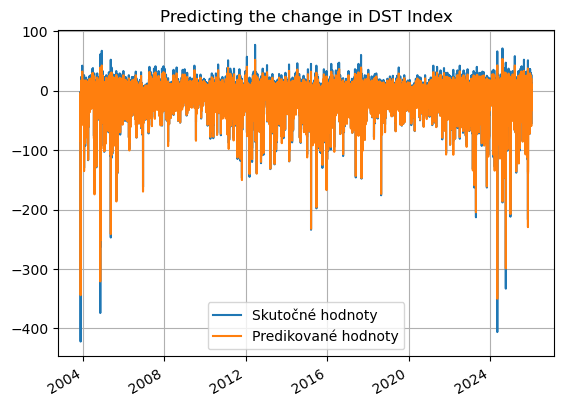

In [18]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [19]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9590396934929037
MCC=0.8784471732383832
Výkon NN:
MAE: 2.6109, MSE: 15.0652
Perzistentný model:
MAE: 2.5680, MSE: 16.3207
Zlepšenie oproti Persistence Modelu:
MAE Improvement: -1.67%
MSE Improvement: 7.69%


In [20]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 23s 26ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

156/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

211/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

262/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step 

504/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

689/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 23s 25ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 69/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 45s 60ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step 

366/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

553/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 9:36 644ms/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step  

  5/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 22s 25ms/step

 26/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 22s 26ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 47/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 20s 26ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

120/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

122/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

136/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

160/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

202/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

214/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

224/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

293/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

382/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step 

505/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 24s 26ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 12s 55ms/step

  3/224 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step 

  5/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 93/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 35s 47ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 18s 24ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 18s 25ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 16s 25ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 15s 25ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 14s 25ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 13s 25ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 12s 25ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 11s 25ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 10s 25ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step 

368/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

449/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 7s 25ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

651/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 19s 25ms/step


Shapes LSTM:
train: (229344,) (229344,)
val:   (57327,) (57327,)
test:  (194188,) (194188,)
Global sigma (LSTM errors, scaled): 0.20929903
Shapes GP:
X_gp_train: (286671, 12)
y_gp_train: (286671,)
X_test_gp: (194188, 12)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 2.53**2 * RBF(length_scale=0.359) + WhiteKernel(noise_level=0.576)


Global sigma (LSTM errors): 4.605396
Hybrid prediction with smoothed, inflated interval ready.


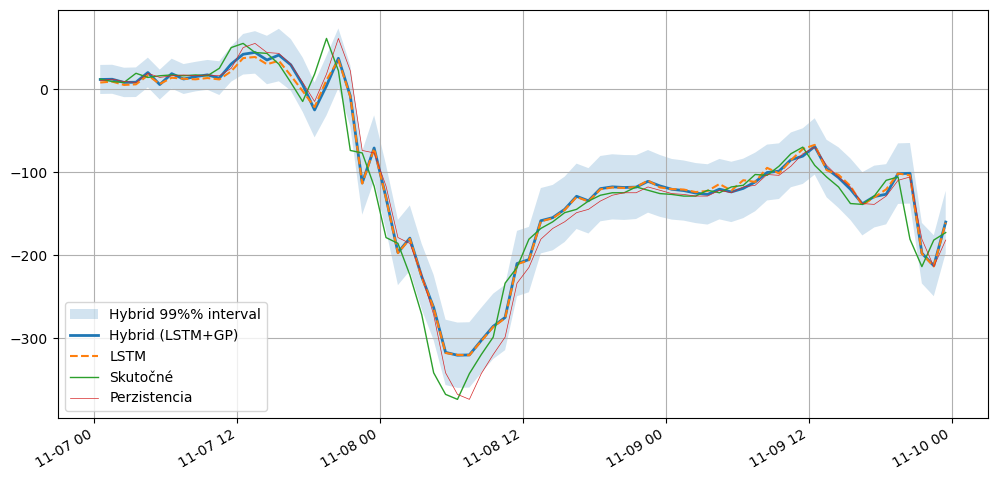

In [21]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})




start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [22]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = y_test_true
y_pred_hybrid = y_hybrid_mean

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 15.3459
MAE: 2.4841

--- Klasifikačné metriky (Prah: -20.4 nT) ---
Matthews Correlation Coefficient (MCC): 0.8717

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      149443 |        2613
Skutočná 1 |        5694 |       36438

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.96      0.98      0.97    152056
   Trieda 1 (Búrka)       0.93      0.86      0.90     42132

           accuracy                           0.96    194188
          macro avg       0.95      0.92      0.94    194188
       weighted avg       0.96      0.96      0.96    194188



In [23]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.9590394825606245
MCC=0.8784470027951847
Výkon NN:
MAE: 2.6109, MSE: 15.0652
Perzistentný model:
MAE: 2.5680, MSE: 16.3207
Zlepšenie oproti Persistence Modelu:
MAE Improvement: -1.67%
MSE Improvement: 7.69%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9705    0.9774    0.9739    152055
           1     0.9162    0.8928    0.9044     42132

    accuracy                         0.9590    194187
   macro avg     0.9434    0.9351    0.9392    194187
weighted avg     0.9587    0.9590    0.9588    194187


===== LSTM+GP =====
ACC=0.9572216471751456
MCC=0.871686233376601
Výkon NN:
MAE: 2.4841, MSE: 15.3459
Perzistentný model:
MAE: 2.5680, MSE: 16.3207
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 3.27%
MSE Improvement: 5.97%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9633    0.9828    0.9730    152055
           1     0.9331    0.8649    0.8977     42132

    

/tmp/ipykernel_87/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_87/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
0,2026-04-25T10:21:50,LSTM,6.0,1.0,DST+1,OMNI2_all,-20.0,-20.2,0.959051,0.878128,"{""text"": "" precision recall f...",2.617042,15.244238,2.567961,16.320413,-1.911312,6.594046
1,2026-04-25T10:21:50,LSTM+GP,6.0,1.0,DST+1,OMNI2_all,-20.0,-20.2,0.957444,0.872552,"{""text"": "" precision recall f...",2.472162,14.990141,2.567961,16.320413,3.730520,8.150970
2,2026-04-25T15:57:33,LSTM,12.0,1.0,DST+1,OMNI2_all,-20.0,-20.4,0.959039,0.878447,"{""text"": "" precision recall f...",2.610914,15.065203,2.567983,16.320737,-1.671768,7.692879
3,2026-04-25T15:57:33,LSTM+GP,12.0,1.0,DST+1,OMNI2_all,-20.0,-20.4,0.957222,0.871686,"{""text"": "" precision recall f...",2.484076,15.345948,2.567983,16.320737,3.267434,5.972702
